In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import math
import pandas as pd #pandas用于处理结构化数据
from scipy.io import savemat #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
from mpl_toolkits.mplot3d import Axes3D #`mpl_toolkits.mplot3d`是`matplotlib`库的一个模块，用于创建三维图形。`Axes3D`是`mpl_toolkits.mplot3d`模块中的一个类，用于创建一个三维的坐标轴。可以在这个坐标轴上绘制三维的图形，如曲线、曲面等。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
#神经网络：layers代表一个正常的神经网络，在输出层和隐藏层之间插入一个高斯过程层

# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers,gamma,num_of_GP): #初始化函数，layers是一个列表，表示每一层的神经元个数，gamma是GP的参数，num_of_GP是GP的参数
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        self.num_of_GP = num_of_GP #定义名为num_of_GP的属性，表示GP的参数
        self.gamma = gamma #定义名为gamma的属性，表示GP的参数
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1])))
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(('layer_%d' % (self.depth - 1), torch.nn.Linear(self.num_of_GP, layers[-1], bias=False)))
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    

        # Initialize weights
        self._initialize_weights()  

        # # Initialize beta for the output layer
        # self.beta = torch.nn.Parameter(torch.randn(layers[-1], 1))  # 初始化回归权重矩阵beta

        # Initialize GP_W and GP_b
        self.GP_W = torch.randn(layers[-2], self.num_of_GP) * math.sqrt(2 * self.gamma)  # 初始化GP_W
        self.GP_b = torch.rand(1, self.num_of_GP) * 2 * math.pi  # 初始化GP_b

    def _initialize_weights(self):
        for idx, m in enumerate(self.layers): #遍历神经网络模型的每一层，获取每一层的索引idx和层对象m(注意这里idx会包括激活函数，也占一个idx)
            if isinstance(m, torch.nn.Linear): #判断层对象m是否是全连接层

                # 自定义初始化函数
                fan_in = m.weight.size(0)  # 输入单元数量
                fan_out = m.weight.size(1)  # 输出单元数量
                std = (2 / (fan_in + fan_out)) ** 0.5  # 计算标准差
                
                with torch.no_grad():
                    m.weight.normal_(0, std)  # 使用自定义标准差初始化权重
                if m.bias is not None: #若存在偏置
                    torch.nn.init.zeros_(m.bias) #使用常数初始化方法初始化偏置，初始化为0
                
                #谱归一化权重
                if idx > 0 and idx < len(self.layers) - 2: #不归一化输入层和输出层
                #注意这里其实idx包含了激活函数，例如对于[1,50,50,50,50,1]，这里共有6层，但是idx应该是9，因为四个隐藏层+四个激活函数+输出层。所以因为idx0是全连接层，最后一个idx为输出层，因此这样做是可以剔除第一个权重和最后一个权重的
                    with torch.no_grad(): #确保归一化过程中不进行梯度计算
                        norm = m.weight.norm(2) #计算该层权重的二范数
                        if norm > 0.99: #若二范数大于0.99
                            m.weight.mul_(0.99 / norm) #将权重乘以0.99/norm，使得二范数等于0.99
    
    #第二个方法，前向传播
    def forward(self, X, lb, ub):  # 接收输入x
        device = X.device  # 获取输入张量的设备
        self.GP_W = self.GP_W.to(device)  # 将GP_W移动到相同设备
        self.GP_b = self.GP_b.to(device)  # 将GP_b移动到相同设备

        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内


        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）


        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai
        H = Fai  # 更新H为Fai

        # 输出层
        out = self.layers[-1](H)  # 计算输出

        return out  # 返回输出out
    
    #第三个方法，获取hidden输出（为uncertainty服务）
    def dnn_for_hidden_features(self, X, lb, ub):  # 接收输入x
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）

        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai

        return H, Fai  # 返回输出out
    
    
    #第四个方法，获取最后一个隐藏层的输出（为chaos服务）
    def hidden_output(self, X, lb, ub):
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）
        return H

In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        self.gamma = gamma
        self.num_of_GP = num_of_GP

        
        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #创建四个pytorch张良，将X_u的第一列赋值给self.x_u，将X_u的第二列赋值给self.t_u。转换为浮点类型，移动到指定设备上，并且这几个张量都需要计算梯度
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)

        self.x_star = torch.tensor(X_star[:, 0:1], requires_grad=True).float().to(device)
        self.t_star = torch.tensor(X_star[:, 1:2], requires_grad=True).float().to(device)

        
        self.u = torch.tensor(u).float().to(device)
        self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(layers,gamma,num_of_GP).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上

        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1),self.lb,self.ub)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #调用上面的net_u函数，计算神经网络的输出u
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = u_t + u * u_x - self.nu * u_xx #计算f，定义见论文
        return f
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
        f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
        loss_u = torch.mean((self.u - u_pred) ** 2) #计算loss_u，定义见论文
        loss_f = torch.mean(f_pred ** 2) #计算loss_f，定义见论文
        
        loss = loss_u + loss_f #计算总的loss
        
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

        error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

        self.test_error.append(error_test)
        return loss
      
    
    def train(self, nIter, nIterLBFGS):

        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
            f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
            loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

            error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            self.test_error.append(error_test)
    
        
        #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func) #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化

  

    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    
    #sngp，用于获取之后的不确定度
    def net_for_hidden_features(self, X):
        self.dnn.eval() #将神经网络切换为评估模式
        # x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        X = torch.tensor(X, requires_grad=True).float().to(device)


        H,Fai = self.dnn.dnn_for_hidden_features(X, self.lb, self.ub)
        H = H.detach().cpu().numpy()
        Fai = Fai.detach().cpu().numpy()
        return H,Fai
    

    #获取chaos
    def hidden_predict(self, x, t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval()
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1), self.lb, self.ub)
        hidden_output_x = hidden_output[:, 0]
        hidden_output_t = hidden_output[:, 1]
        hidden_output_x = hidden_output_x.detach().cpu().numpy()
        hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output_x, hidden_output_t

In [6]:
#定义采样函数，目的是采用sampler方法，生成n_samples个在指定空间内的准随机样本，这里space为二维的，因此每个样本都是一个二维点，即n_samples*2的数据点

#共有6种采样器，分别是LHS、Halton、Hammersley、Sobol、Grid和Random，均为均匀采样方法

def caiyang(n_samples, sampler): #接受两个参数，n_samples是样本数量，sampler是采样器名称，是一个字符串
    space = [(-1.0, 1.0), (0.0, 1.0)] #指定样本生成的空间，一个二维空间，第一个维度是-1到1，第二个维度是0到1

    #根据sampler的不同，选择不同的采样器，返回的sampler是一个采样器对象
    if sampler == "LHS": #如果采样器是LHS（拉丁超采样，每个维度都被均匀划分为等量区间，每个样本都是从每个维度的一个区间中随机选取的）
        sampler = skopt.sampler.Lhs(lhs_type="centered", criterion="maximin", iterations=1000) #第一个参数表示如何从每个区间选取样本，这里表示从每个区间的中心选取样本；第二个参数表示如何划分区间，这里表示尽可能使样本之间的最小距离最大；第三个表示通过优化过程得到样本量的迭代次数（即会尝试1000种不同的样本配置，并最终选择质量最好的那个）
    elif sampler == "Halton": #Halton序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Halton(min_skip=-1, max_skip=-1)  #两个参数用于控制序列的起始点，Halton序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Hammersley": #Hammersley序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Hammersly(min_skip=-1, max_skip=-1) #两个参数用于控制序列的起始点，Hammersley序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Sobol":
        # Remove the first point [0, 0, ...] and the second point [0.5, 0.5, ...], which are too special and may cause some error.
        # Sobol采样器的实现有一个问题，即生成的前两个样本点通常不是随机的而是固定的，Sobol序列的前两个点（[0, 0, ...]和[0.5, 0.5, ...]）在许多情况下都被认为是“特殊”的点，可能会对某些计算产生不利影响。因此设置跳过前两个点，而且skopt库在0.9版本号取消了max/min_skip参数，所以需要根据skopt的版本号来选择不同的参数
        if LooseVersion(skopt.__version__) < LooseVersion("0.9"): #先检查skopt的版本是否大于0.9,若小于
            sampler = skopt.sampler.Sobol(min_skip=2, max_skip=2, randomize=False) #则使用Sobol采样器，min_skip和max_skip表示跳过的点的数量，这里表示跳过前两个点，randomize表示是否随机化
        else: #若skopt的版本大于0.9
            sampler = skopt.sampler.Sobol(skip=0, randomize=False) #则使用Sobol采样器，skip表示跳过的点的数量，这里表示不跳过任何点，randomize表示是否随机化 
            return np.array(sampler.generate(space, n_samples + 2)[2:]) #生成n_samples+2个样本，然后返回除了前两个样本之外的所有样本，也就是返回n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面
    elif sampler == "Grid":
        x_min, x_max = space[1]
        t_min, t_max = space[0]
        
        # 计算每个维度的网格大小
        x_grid_size = (x_max - x_min) / (n_samples // int(np.sqrt(n_samples)) - 1) # x维度上（纵轴），每行有10个点
        t_grid_size = (t_max - t_min) / int(np.sqrt(n_samples))  # 
        
        # 生成等距均匀网格采样点
        samples = []
        for i in range(n_samples // int(np.sqrt(n_samples))):
            for j in range(int(np.sqrt(n_samples))):
                # 计算每个网格单元的中心点
                x = x_min + i * x_grid_size
                t = t_min + j * t_grid_size
                samples.append([t, x])
        
        return np.array(samples)
    
    elif sampler == "Random":
        # 从space中提取出x_min, x_max, t_min, t_max
        x_min, x_max = space[1]
        t_min, t_max = space[0]

        # 生成x和t的随机数
        x = np.random.rand(n_samples, 1) * (x_max - x_min) + x_min
        t = np.random.rand(n_samples, 1) * (t_max - t_min) + t_min

        # 将x和t合并为一个(n_samples, 2)的数组
        samples = np.hstack((t, x))
        return samples #生成一个形状为(n_samples, 2)的随机数组



    return np.array(sampler.generate(space, n_samples)) #生成n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面（n_samples*2）

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [9]:
#计算不确定度（基于高斯过程和谱归一化）
def Cov_matrix(X, gamma):
    n = X.shape[0]
    Cov_x_x = np.zeros(shape=(n,n), dtype=float)
    # for i in range(n):
    for i in tqdm(range(n), desc="ncross"):
        for j in range(n):
            xi = X[i:i+1,:]
            xj = X[j:j+1,:]
            dij = np.sum((xi-xj)**2)
            Cov_x_x[i][j] = np.exp(-gamma*dij)
    return Cov_x_x

def Cov_cross_matrix(X1, X2, gamma):
    n_1 = X1.shape[0]
    n_2 = X2.shape[0]
    Cov_X1_X2 = np.zeros(shape=(n_1, n_2), dtype=float)
    for i in tqdm(range(n_1), desc='cross'):
        for j in range(n_2):
            xi = X1[i:i+1,:]
            xj = X2[j:j+1,:]
            dij = np.sum((xi-xj)**2)
            Cov_X1_X2[i][j] = np.exp(-gamma*dij)
    return Cov_X1_X2

def calculate_inverse(Matrix, xishu=100000000):
    rho_orig = Matrix #X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X，将其赋值给rho_orig
    rho = rho_orig*xishu # 将X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X（现在是rho_orig）放大xishu倍，得到rho
    u, s, v = np.linalg.svd(rho) #对放大后的协方差矩阵rho进行奇异值分解，得到矩阵u，奇异值向量s和矩阵v，具体rho = u * np.diag(s) * v.T
    inv_s=np.linalg.inv(np.diag(s)) #计算奇异值向量s对角矩阵的逆矩阵inv_s
    t1= np.matmul(v.T, inv_s) #将矩阵v的转置与逆奇异值矩阵inv_s相乘，得到中间结果 t1
    t2= np.matmul(t1, u.T) #将中间结果t1与矩阵u的转置相乘，得到中间结果t2
    # Check whether the obtained inverse matrix is correct. If it is the identity matrix, it means there is no problem.
    t3= np.matmul(t2, rho) #将中间结果t2与矩阵rho相乘，得到结果t3。如果t2是rho的正确逆矩阵，那么t3应该是一个单位矩阵（即对角线元素为1，其余元素为0）
    # Inverse of covariance matrix
    inv_rho = t2*xishu  #将中间结果t2的每个元素乘以放大常数xishu，得到原始协方差矩阵rho_orig（即X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X）的逆矩阵 inv_rho
    return inv_rho

def calculate_uncertainty(model, X_new, X_f, X_u, gamma): #X_new代表新点，X_f代表训练过的配位点，X_u表示训练过的初边界值点
    X_past = np.concatenate((X_u, X_f),0) #X_past=[X_u;X_f]

    Hidden_pred_small, Fai_pred_small = model.net_for_hidden_features(X_new) #新选出来的点
    X_xin = Hidden_pred_small

    Hidden_pred_all, Fai_pred_all = model.net_for_hidden_features(X_past) #已经训练过的点
    X = Hidden_pred_all

    Cov_xin_xin = Cov_matrix(X_xin, gamma) ##形状为（新选出来的点的数量，新选出来的点的数量）（即X_xin的行数，X_xin的行数）
    Cov_X_X = Cov_matrix(X, gamma) #形状为（已经训练过的点的数量，已经训练过的点的数量）（即X的行数，X的行数）
    Cov_xin_X = Cov_cross_matrix(X_xin, X, gamma) #形状为（新选出来的点的数量，已经训练过的点的数量）

    Cov_X_xin = Cov_xin_X.T
    
    sigma_2= Cov_xin_xin - np.matmul(np.matmul(Cov_xin_X, calculate_inverse(Cov_X_X)), Cov_X_xin) #计算方差，这个其实就是不确定度，论文中的方差
    
    sigma_2 = np.diag(sigma_2)
    sigma_2 = np.abs(sigma_2)
    sigma = np.sqrt(sigma_2)
    sigma = sigma[:, np.newaxis] #这一步目的是讲形状为(n,)的数组转换为(n,1)的数组,n为新选出来点的数量，即上面X_xin的行数
    #得到的sigma是标准差（论文中的）这几部是为了保证计算的稳定性和正确性，直接开根号也可以
    sigma = sigma.flatten()

    return sigma

In [10]:
# #定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
# def MC_dropout_uncertainty(model, X, n_dropout = 10):
#     """
#     计算模型MC dropout不确定度的函数。
#     参数:
#     - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
#     - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
#     - num_iter: MC dropout进行前向传播的次数
#     返回:
#     - u_var: 每个采样点的不确定度，形状为(N_f_new,)。
#     """
#     U = []
#     for _ in range(n_dropout):
#         u_pred = model.dropout_predict(X)
#         U.append(u_pred)
#     #最后得到的U是是一个长度为n_dropout的列表，列表每个元素均为一个数组，数组的形状为(len(t)*len(x),1)，即每行是一个点的预测值
#     U = np.hstack(U) #按列堆叠数组，即将U中的每个数组按列合并，得到一个新的数组U，形状为(len(t)*len(x),n_dropout)，每行是一个点在MC dropout下前向传播n_dropout次得到的输出
#     u_means = np.mean(U, axis=1).reshape(-1,1) #对每一行（按列）求平均，每一行是E(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     u_var = np.mean((U - u_means) ** 2, axis=1).reshape(-1,1) #对每一行（按列）求方差，每一行是Var(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     #最后获得的u_var就相对于是每个点的不确定度
#     u_var = u_var.flatten()

#     return u_var

In [11]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

nu = 0.01/np.pi
#设置噪声水平为0
noise = 0.0        

N_u = 100
N_f = 2500 #配位点数量
N_epoch = 50000 #迭代次数

gamma = 5.0 #GP参数
num_of_GP = 1024 #GP参数


#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 2, 1]
#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

# Doman bounds，分别获得X_star的相应列上的最小值和最大值，赋值给lb和ub,也就是说lb是x和t的最小值，ub是x和t的最大值，即lb和ub分别为[-1,0]和[1,1]
lb = X_star.min(0)
ub = X_star.max(0)    


#生成初值和边界值的训练基础数据
xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) #分别取X，T的第一行的转置(分别是x和全0列)，分别构成xx1的第一列和第二列
uu1 = Exact[0:1,:].T #取Exact的第一行的转置，赋值给uu1
xx2 = np.hstack((X[:,0:1], T[:,0:1])) #分别取X，T的第一列(分别是全-1列和t)，分别构成xx2的第一列和第二列
uu2 = Exact[:,0:1] #取Exact的第一列，赋值给uu2
xx3 = np.hstack((X[:,-1:], T[:,-1:])) #分别取X，T的最后一列(分别是全1列和t)，分别构成xx3的第一列和第二列
uu3 = Exact[:,-1:] #取Exact的最后一列，赋值给uu3

X_u_train_all = np.vstack([xx1, xx2, xx3]) #X_u_train=(xx1;xx2;xx3)

u_train_all = np.vstack([uu1, uu2, uu3]) #u_train=(uu1;uu2;uu3)

# #生成配位点训练基础数据
# X_f_train = quasirandom(N_f, "LHS")  #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，表示生产的样本有两个特征，共N_f个样本数量，所以返回的是一个形状为（N_f，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本X_f_train。

# X_f_train = np.vstack((X_f_train, X_u_train)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train


error_u = [] #创建一个空列表，用于存储误差值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    

    #1.生成初值边界值训练数据，以及测试数据

    #从所有的初值边界值训练基础数据中选取N_u=100个点
    idx = np.random.choice(X_u_train_all.shape[0], N_u, replace=False) #从0~数组X_u_train的行数 中随机选择N_u个数，replace=False表示不允许重复选择，最后将这N_u个数赋值给idx
    X_u_train = X_u_train_all[idx, :] #从X_u_train中选取idx对应的的N_u行，赋值给X_u_train
    u_train = u_train_all[idx,:] #从u_train中选取idx对应的的N_u行，赋值给u_train


    #2.生成配位点并进行训练



    num_iter = 100 #chaos迭代次数

    #先训练500次
    #采样配位点10个
    N_f_1 = N_f//100 #N_f_1=50
    X_f_train = caiyang(N_f_1, "LHS") #生成50个样本点，每个样本点都是一个二维点，即50*2的数据点

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP)



    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(N_epoch//100,0)


    #训练结束后，每500次迭代重采样一次100个点，并选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练50000次
    for iter in range(N_epoch//100+1, N_epoch+1, N_epoch//100): #每500次迭代
        N_f_new = N_f_1 * 10 #重新采样100个点
        # 生成新的X_f_train数据
        X_f_train_new = caiyang(N_f_new, "LHS") #生成500个样本点，每个样本点都是一个二维点，即500*2的数据点

        # #计算MC dropout不确定度
        # uncertainties = calculate_uncertainty(model, X_f_train_new, X_f_train, X_u_train, gamma)

        # #计算混沌度
        # distances = calculate_chaos(model, X_f_train_new, num_iter)

        #计算残差
        _, residual = model.predict(X_f_train_new)
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        #将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()


        # #对distances进行归一化
        # distances = distances / np.linalg.norm(distances)
        # #对uncertainties进行归一化
        # uncertainties = uncertainties / np.linalg.norm(uncertainties)
        #对abs_residual进行归一化
        abs_residual = abs_residual / np.linalg.norm(abs_residual)


        # xinxi = distances + uncertainties + abs_residual #将三个归一化后的数组相加，得到新的数组xinxi
        xinxi = abs_residual

        # 找出绝对值最大的10个值的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:] #该函数会对数组进行排序，使得指定的k个最大值出现在数组的最后k给位置上，并获取最后1000个元素

        # 使用这些索引来提取对应的数据
        X_f_train_topk = X_f_train_new[topk_indices]

        X_f_train = np.vstack((X_f_train, X_f_train_topk)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.x_f = torch.tensor(X_f_train[:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f_train[:, 1:2], requires_grad=True).float().to(device)

        # 在更新数据后的模型上进行训练500次
        model.train(N_epoch//100,0)



    model.train(0,N_epoch//100) #使用LBFGS训练500次
    #所有训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    # 训练结束后，再次使用模型进行预测，并计算误差
    u_pred, f_pred = model.predict(X_star)
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:54,  4.36it/s]

Adam:   2%|▏         | 8/500 [00:00<00:17, 28.70it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 39.57it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.17it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.55it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.09it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.99it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.89it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 55.17it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.65it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.38it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.64it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.34it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.18it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.89it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.03it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.12it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.36it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.51it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.28it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.54it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 55.44it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 56.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.53it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.47it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.75it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.68it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.77it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.35it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.45it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.21it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.42it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.00it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.25it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.02it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.52it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.82it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 68.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 66.62it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 62.34it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 61.14it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 59.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 59.94it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.13it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.13it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.21it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.38it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.25it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.09it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.74it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.36it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.08it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.73it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.38it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.33it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.10it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.04it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.69it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.61it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.50it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.58it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.79it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.34it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 55.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.83it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.84it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.40it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.36it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.28it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 58.35it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.68it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.11it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.18it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.63it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.01it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.02it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.03it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.18it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.71it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.97it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.97it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.79it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.25it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.92it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.87it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.07it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.11it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.62it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.84it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.31it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.21it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.85it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.67it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.41it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.75it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.69it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.38it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.87it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.38it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.56it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 59.51it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 59.20it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.38it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.38it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.25it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 57.60it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.02it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 54.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.09it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.95it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.69it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 63.21it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 66.19it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 68.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 69.42it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 70.45it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 69.00it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 64.36it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 60.41it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.19it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.53it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 55.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.65it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.59it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.73it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.96it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.91it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 56.41it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.97it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.91it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.38it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.29it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.08it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.25it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.13it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.36it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.73it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.66it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.41it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.11it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.93it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.32it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:04, 53.26it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.71it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.33it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.13it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.99it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.99it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.48it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.20it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.74it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.30it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.32it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.51it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.47it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.02it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.26it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.33it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.36it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 52.79it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.75it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 68.90it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:00, 76.16it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 81.06it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 85.09it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 82.99it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 69.56it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 63.76it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 60.79it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 59.24it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.22it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.43it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.55it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.75it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.81it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.12it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.57it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.00it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.12it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.38it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.77it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.28it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.42it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.50it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.93it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.02it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.94it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.97it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.33it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.45it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.39it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.41it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.57it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.09it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.46it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.27it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.17it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.71it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.34it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.12it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.46it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.35it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.92it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.35it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.97it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.59it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.59it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.45it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.10it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.56it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.86it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.23it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.97it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.04it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.76it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.03it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 59.18it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 59.93it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.63it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 60.05it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 60.45it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 59.91it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 59.91it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 59.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.72it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.43it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 57.67it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.29it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.95it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.07it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.04it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.98it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.22it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.82it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.70it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.91it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.59it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.41it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.22it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.60it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.03it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.38it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.62it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 58.54it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.70it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.90it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.74it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.15it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.61it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.45it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.43it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.74it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.57it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.95it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.70it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.49it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.59it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.40it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.47it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.42it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.80it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.13it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.05it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.86it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.44it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.39it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.26it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 59.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.74it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 60.00it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 60.23it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 59.83it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.89it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.40it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.09it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.73it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.96it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.10it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 50.48it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 51.38it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 51.91it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.06it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.55it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.82it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.94it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.91it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 53.83it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.23it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.71it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.71it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.01it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.52it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.48it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.32it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.40it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.09it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.42it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.77it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.35it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.39it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.56it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.45it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.73it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.97it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.43it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.48it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.31it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.08it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.04it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.72it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.09it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.30it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.65it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.57it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.87it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.70it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.58it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.86it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.36it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.86it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.09it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.10it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.63it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.99it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.60it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.90it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.48it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.23it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.17it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.52it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.59it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.71it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.37it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.15it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.29it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.77it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.95it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 50.63it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.06it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.03it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.80it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.90it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 58.14it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.08it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.84it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.75it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.46it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.85it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.52it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.49it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.53it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.76it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.20it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.56it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.34it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.12it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.26it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.14it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.31it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.12it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.18it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.33it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.65it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.77it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.85it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.74it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.75it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.80it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.40it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.63it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.50it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.21it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.42it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.65it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.93it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.40it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.71it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.43it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.89it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.97it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.58it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.54it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.21it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.52it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.09it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.44it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.25it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.33it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.98it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.60it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.27it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.82it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 58.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 58.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 59.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 58.38it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.83it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.84it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.03it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.40it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.35it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.71it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.06it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.76it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.14it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.22it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.67it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.13it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.12it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.65it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.82it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.60it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.48it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.53it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.66it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.98it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.79it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.33it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.90it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.23it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.45it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.31it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.80it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.62it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.21it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.44it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.28it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.73it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.16it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.13it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.17it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.39it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.18it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.48it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.63it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 65.52it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 73.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 77.73it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 81.65it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 78.32it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 79.67it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 81.04it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 67.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.13it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.22it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.20it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.38it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.88it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.28it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.65it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.78it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.48it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.45it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 59.48it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 60.03it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 60.45it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 60.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.96it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 60.13it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.43it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.23it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.77it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 51.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.18it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.60it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.83it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.04it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.07it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.49it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.98it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.83it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.08it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.16it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.93it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.49it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.88it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 58.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.83it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.77it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.80it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.16it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.68it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.29it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.96it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.52it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.95it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.42it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.01it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.99it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.16it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.54it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.46it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.25it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.49it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.52it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.60it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.44it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.34it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.62it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 54.22it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.17it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 61.51it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 65.06it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 60.52it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.53it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.97it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.11it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.11it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.86it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.99it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.76it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.99it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.42it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.32it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.49it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.96it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.77it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.33it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.62it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.29it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.63it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.77it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.63it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.58it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.18it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.43it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.97it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 63.36it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 62.50it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.01it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.70it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.91it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.45it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.93it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.78it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.93it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.40it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.05it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.91it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.93it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.60it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.31it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.94it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.75it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.30it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.38it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.26it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.22it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.56it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.85it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.52it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.59it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.15it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.06it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.90it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.46it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.39it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.11it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.13it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 65.46it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 71.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 72.51it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 73.68it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 79.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.40it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.11it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.98it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 56.04it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.12it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.72it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.57it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.86it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.90it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.92it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.79it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.63it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.69it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.45it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.17it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.27it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 59.21it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.93it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.97it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.12it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.82it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.30it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.02it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.33it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.12it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.87it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.07it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.66it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.73it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.77it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.53it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.86it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.66it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.13it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.15it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 50.68it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.98it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.34it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.91it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.02it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.65it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.91it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.42it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.16it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.40it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.97it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.89it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.94it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.02it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.47it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 59.46it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 59.48it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 59.55it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 60.11it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 60.12it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.43it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.42it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.58it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.59it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.44it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.43it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.14it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.57it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.89it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 55.60it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.23it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.45it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.24it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.00it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.95it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.70it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.53it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.24it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.75it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.50it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.20it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.69it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.24it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 51.93it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.28it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.40it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.90it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.94it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.32it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.23it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.74it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.87it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.64it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.97it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.49it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.95it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.59it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.10it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.83it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 50.54it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 51.01it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.61it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.39it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.95it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.79it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.40it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.98it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.45it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.55it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.27it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.48it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.22it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 58.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 59.79it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 60.31it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 60.54it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 60.02it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.98it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.41it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.12it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.66it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.63it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.34it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.77it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.65it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.88it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.25it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.58it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.44it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.89it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.98it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.48it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.73it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.17it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.88it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.80it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.63it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.81it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.69it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.43it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.00it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.48it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.44it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.23it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.77it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.47it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.23it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.78it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.18it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.97it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.82it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.85it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.09it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.39it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.22it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.41it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.16it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.01it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.37it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.34it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.28it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.96it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.39it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.30it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.73it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.85it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.96it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.05it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.74it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.71it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.91it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.71it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.68it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.10it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.87it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.19it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.97it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 57.42it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 57.71it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 58.09it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 58.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.95it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.50it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.01it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.62it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.19it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.21it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.26it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.48it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.81it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.67it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.12it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.17it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.92it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.23it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.28it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 54.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 56.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.52it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.56it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.65it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.01it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.54it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.79it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.00it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.09it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.14it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.39it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.08it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.78it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.65it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.48it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.22it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.99it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.77it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.52it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.29it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.91it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.67it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.30it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.58it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.84it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.96it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.88it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.81it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.85it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.02it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.36it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.85it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.08it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.93it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.56it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.73it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.88it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 68.62it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:01, 75.86it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 72.55it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 65.64it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 61.67it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 59.80it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.85it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.80it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.77it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.44it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.22it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 59.38it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 66.68it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 71.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 68.47it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 65.94it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 61.48it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.32it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.83it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 59.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.53it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.43it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 81.73it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 72.84it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:06, 68.98it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 65.29it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 62.53it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 61.71it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.43it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.05it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.20it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 58.28it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:06, 56.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.77it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.13it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.13it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 51.97it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:06, 53.91it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 54.69it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 55.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.46it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.34it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.27it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.14it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.65it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.09it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 53.18it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 54.93it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 55.29it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.46it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.26it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.96it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.61it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.85it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 55.34it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 55.03it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.75it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.41it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.81it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.36it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.66it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.46it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.99it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 53.98it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 55.32it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.15it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.36it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.06it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.68it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.41it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.27it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.99it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 53.61it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 53.38it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.05it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.32it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.03it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.52it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.37it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 63.76it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 78.67it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 78.03it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 73.01it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 63.97it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.05it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.66it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.89it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.53it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.68it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.12it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.51it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.74it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.39it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.91it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.02it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.39it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.88it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.25it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.54it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.83it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.64it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.15it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.85it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.46it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.99it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.98it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.42it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.61it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.86it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.93it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.51it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.27it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.95it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.71it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.33it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.78it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 61.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.85it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.85it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.47it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.98it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.38it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.34it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.16it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.64it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.82it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.87it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 62.49it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.54it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.37it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.10it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.70it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.73it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.27it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.97it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.33it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.96it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.64it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.66it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.78it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.15it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.46it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 52.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.31it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.32it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.96it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.64it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.75it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.48it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.04it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.20it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.03it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.66it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.47it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.00it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.33it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.23it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.52it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.98it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.58it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.00it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.24it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.69it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.62it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.25it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.94it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.75it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.80it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.07it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.76it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.04it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.84it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.39it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.31it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 50.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.02it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.07it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.43it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.49it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.68it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.29it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.82it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.23it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.45it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.14it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.49it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.46it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.80it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.88it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.49it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 58.06it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.15it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.31it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.69it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.45it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.03it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.18it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.72it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 48.52it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 50.45it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.29it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.38it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.00it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.16it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 125.12it/s]

Adam:   5%|▌         | 26/500 [00:00<00:03, 126.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:03, 126.31it/s]

Adam:  10%|█         | 52/500 [00:00<00:03, 126.34it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:03, 126.25it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 125.06it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:03, 121.87it/s]

Adam:  21%|██        | 104/500 [00:00<00:04, 93.46it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.03it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 68.69it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 63.26it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:05, 61.94it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:05, 60.97it/s]

Adam:  31%|███       | 153/500 [00:01<00:05, 60.45it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:05, 60.19it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.12it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.78it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 56.53it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 55.29it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:05, 55.00it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:05, 55.07it/s]

Adam:  41%|████      | 203/500 [00:02<00:05, 55.65it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:05, 57.15it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:04, 58.18it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.62it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 58.86it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.14it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 58.90it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:04, 58.83it/s]

Adam:  51%|█████     | 254/500 [00:03<00:04, 58.77it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:04, 58.90it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 59.39it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 58.56it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 60.41it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 59.45it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 57.47it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 56.83it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 55.52it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:03, 55.77it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:03, 56.38it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:03, 57.28it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 57.55it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.61it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.55it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 56.70it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 57.77it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 56.80it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 57.10it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 55.67it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:02, 53.35it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:02, 53.42it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.56it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.81it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.27it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.03it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 57.35it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 56.51it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 57.21it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:01, 56.38it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:01, 55.92it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 55.20it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.81it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.20it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.85it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.10it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 56.41it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 57.37it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 57.17it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 57.02it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 57.63it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 62.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.36it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.94it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.23it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.19it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.36it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.43it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.17it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.40it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.94it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.65it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.35it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.37it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.71it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.30it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.15it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.39it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.60it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.29it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.08it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.90it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.58it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.36it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.66it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.05it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.42it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.54it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.59it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.71it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.61it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.20it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.47it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.14it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.74it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.02it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.62it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.91it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.70it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.41it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.00it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.89it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.03it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.10it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.14it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.55it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.72it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.80it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.30it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.94it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.64it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.81it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.22it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.25it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.02it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.47it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.85it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.31it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.17it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.99it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.69it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.72it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.98it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.47it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.61it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.76it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.20it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.48it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.44it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.51it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.58it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.05it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.37it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.84it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.18it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.06it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.76it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.41it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.91it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.78it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.25it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.96it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.72it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.60it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.07it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.73it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.34it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.67it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.20it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.82it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.40it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.59it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.76it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.69it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.47it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.81it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.78it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.51it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.22it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.15it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.51it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.38it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 63.08it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 61.82it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 60.54it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.53it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.63it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.90it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.53it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.01it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.27it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.65it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.54it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.26it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.00it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.59it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.75it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.43it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.32it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.00it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.95it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.28it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.49it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.27it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.91it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.37it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.73it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.50it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.54it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.18it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.88it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.52it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.00it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.73it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.22it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.83it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.31it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.51it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.53it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.34it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.15it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.64it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.53it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.39it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.33it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.47it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.41it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.90it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.51it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.87it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.22it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.83it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.50it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.73it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.95it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.25it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.82it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.03it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.66it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.36it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.25it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.65it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.53it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.51it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.79it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.60it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.13it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.62it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.93it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.53it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.85it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.95it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.71it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.18it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.83it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.81it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.20it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.49it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.72it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.94it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 58.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.56it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.38it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.64it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.89it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.67it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.51it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.26it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.01it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.74it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.13it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.17it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.02it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.25it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.36it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.07it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.99it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 53.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.27it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.39it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.48it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.27it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.03it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.37it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.56it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.82it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.76it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.37it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.99it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.75it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.31it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.62it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.40it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.23it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.52it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.45it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.74it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.89it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.26it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.34it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.15it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.81it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.09it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.99it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.42it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.53it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.18it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.29it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.47it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.28it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.48it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.64it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.31it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.96it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.73it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.41it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.67it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.29it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.80it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.69it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.40it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.12it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.72it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.24it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.27it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.84it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.55it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.07it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.81it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.91it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.19it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.92it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.64it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.46it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.82it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.31it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.60it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.29it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.93it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.04it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.06it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 45.84it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.88it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.07it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.45it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.14it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.74it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.46it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.22it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.50it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.94it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.02it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.73it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.96it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.48it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.86it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.45it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.24it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.19it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.19it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.49it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.20it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.81it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 55.55it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 56.26it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 55.91it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.93it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.72it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.00it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.80it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.80it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.18it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.56it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.80it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.33it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.57it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.45it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.28it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.32it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.09it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 56.39it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.23it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.73it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.44it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.37it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.15it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.10it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.84it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.12it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.30it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.11it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.60it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.69it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.80it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.74it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.38it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.61it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.72it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.14it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.62it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.79it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.21it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.34it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.42it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.37it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.90it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.66it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.34it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.65it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.18it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.85it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.80it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.33it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.61it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.32it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.25it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.20it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.16it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.24it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.06it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.62it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.03it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.91it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.48it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.62it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.14it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.09it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.30it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.89it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.23it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.99it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.00it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.96it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.57it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.38it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.50it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.17it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.55it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.06it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.98it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.59it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.44it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.14it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 61.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:04, 68.08it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 70.33it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 75.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 73.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 67.70it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 63.84it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 62.32it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 61.04it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 60.05it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.52it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.64it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.87it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.57it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.30it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.30it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.74it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.67it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.83it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.62it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.80it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.83it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.33it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.85it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.31it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.38it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.30it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.26it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.87it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 51.46it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.25it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.24it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 52.91it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.62it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.77it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.66it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.34it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.06it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.63it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.29it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.11it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.12it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.30it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.76it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.95it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.23it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.32it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.83it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.22it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.82it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.63it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 61.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.04it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.38it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.31it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.06it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.88it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.69it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.00it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.19it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.91it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 64.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 68.74it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 65.97it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 63.80it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 62.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 61.33it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 60.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.39it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.09it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.72it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.09it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.37it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.04it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.00it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.79it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.83it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.51it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.69it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.83it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.41it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.40it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.71it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.56it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.13it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.47it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.58it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.55it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.93it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 55.21it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.23it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.63it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.53it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.26it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.37it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.46it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.98it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 51.77it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 48.85it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.69it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.06it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.38it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 48.80it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 48.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 47.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 48.49it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 48.87it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 48.83it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 48.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.35it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.51it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.12it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.87it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.19it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.22it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.47it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 51.10it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 49.87it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.11it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.55it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.42it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.74it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.97it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.41it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.87it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.40it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 58.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.97it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 56.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.33it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.83it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.06it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.18it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.31it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.30it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.38it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.29it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.82it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.99it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.62it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.47it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.65it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.66it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.54it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.58it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.63it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.00it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.09it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.45it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.54it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.31it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.44it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.69it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.62it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.39it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.86it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.27it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.89it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.21it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.01it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.75it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.59it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.86it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.87it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.69it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.44it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.19it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.60it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.87it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 66.65it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 72.23it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 78.32it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:01, 82.45it/s]

Adam:  71%|███████   | 355/500 [00:06<00:01, 81.95it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 85.16it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 83.31it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 72.50it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 64.67it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 61.46it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 59.58it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.81it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.77it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.50it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.40it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.27it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.41it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 53.12it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.68it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.37it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.68it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.02it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.07it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.57it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.49it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.11it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.86it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.09it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.00it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.60it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.18it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.64it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.67it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.75it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.44it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.14it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.86it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.15it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.95it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.53it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.91it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.63it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.98it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.34it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.38it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.57it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.02it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.84it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.50it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 54.29it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.47it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.96it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.07it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.11it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.58it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.79it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.91it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.07it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.04it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.71it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.85it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.15it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.22it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.09it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 51.44it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.37it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.72it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.09it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.39it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.16it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.42it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.63it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.43it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 56.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.53it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.87it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.69it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.85it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.36it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.44it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.23it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.14it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.59it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.06it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.14it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.21it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.02it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.27it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.13it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.11it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.61it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.25it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.51it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.30it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.68it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.90it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.04it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 57.13it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.82it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.31it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.60it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.73it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.64it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.96it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.36it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.10it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.61it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.78it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.48it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.03it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.29it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.47it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.68it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.41it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.96it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.96it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.65it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.55it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.45it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.94it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.29it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.26it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.75it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 99.46it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 78.95it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 70.47it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 65.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 62.69it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 61.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 59.11it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.59it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.27it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 57.70it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 60.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 67.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 64.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 62.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 60.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 59.46it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.93it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 59.75it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 59.03it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:05, 58.41it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.16it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.87it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.56it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.79it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 51.38it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 48.69it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:05, 50.49it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:05, 51.40it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 53.17it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.37it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.21it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.20it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.00it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.89it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.41it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.56it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.04it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 55.80it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.23it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.29it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.95it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.09it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.39it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 55.31it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 54.71it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.49it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 56.70it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.38it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.95it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.35it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.36it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 58.02it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.77it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.15it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.18it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.13it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.10it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.50it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.29it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.10it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.62it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.01it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 58.27it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.99it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.54it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 55.33it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.38it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.44it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.69it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.75it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.78it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.74it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 59.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.65it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.64it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.65it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.43it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.45it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.12it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.50it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.60it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.29it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.99it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.87it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.34it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.43it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 66.60it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 63.78it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 60.11it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.90it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.49it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.83it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.74it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.26it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.91it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.37it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.55it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.38it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.65it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.33it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.89it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.43it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.63it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.93it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 64.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 70.67it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 76.90it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 80.95it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 83.21it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:00, 84.82it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 84.23it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 73.24it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 66.82it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 64.00it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 61.98it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 60.27it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.44it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.10it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.67it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.17it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.84it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.12it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.97it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.70it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.56it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.75it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.64it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.64it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.15it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.72it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.80it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.20it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 61.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 64.69it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 66.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 67.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 68.09it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 68.35it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 65.04it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 63.44it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 62.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 60.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 59.26it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.16it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.82it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.75it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 54.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.35it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 62.12it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 65.69it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 66.73it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 68.17it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 63.52it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 62.01it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 61.27it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.17it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.24it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.84it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.62it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.66it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.94it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.67it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.97it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.44it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.34it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 56.61it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.35it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.90it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.01it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.52it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.09it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.64it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.14it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.50it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 55.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.70it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.16it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.22it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.29it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.58it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.95it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.40it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.31it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 55.93it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.32it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.31it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.55it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.41it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.66it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.53it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.80it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.81it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.59it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.68it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.68it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.46it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.31it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 64.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 67.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 72.20it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 69.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 65.19it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.97it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.45it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.02it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.47it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.68it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.65it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.89it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 67.69it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 72.55it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 76.64it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:01, 79.85it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 67.08it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.47it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.31it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.80it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.97it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.62it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.55it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 62.05it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 69.09it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 68.26it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.28it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.16it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.86it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.44it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.51it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 51.95it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 51.24it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.78it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.35it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.77it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.44it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.14it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.01it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.38it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 52.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.74it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.95it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.97it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.54it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.15it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.85it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.55it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 59.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.35it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.06it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.37it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.83it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.59it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.57it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.61it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.47it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.98it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 61.16it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 62.34it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:04, 70.11it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 71.59it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 71.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 66.80it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 62.41it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 61.16it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.23it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.70it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.53it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 59.25it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.39it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.75it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.65it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.17it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.55it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.83it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.64it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.52it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.99it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.84it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.97it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.91it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.05it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.98it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.14it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.84it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 59.05it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.47it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.74it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.68it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.51it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 52.89it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.01it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.10it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.02it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.21it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.71it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.74it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.60it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.65it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.95it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.55it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.93it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 50.00it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.37it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.95it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.59it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.96it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 51.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.28it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.46it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.93it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.02it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 94.32it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.94it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 88.90it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 84.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 75.53it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 68.37it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 61.14it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:06, 56.56it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:06, 55.79it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 71.02it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 62.24it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.02it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 54.12it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:06, 53.23it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 53.75it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:05, 54.80it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:05, 55.73it/s]

Adam:  40%|████      | 202/500 [00:02<00:05, 57.17it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.63it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 60.38it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 60.03it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 59.30it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 58.37it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 56.93it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 57.06it/s]

Adam:  51%|█████     | 253/500 [00:03<00:04, 57.16it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:04, 57.50it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.06it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.09it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.59it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.23it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.28it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 54.76it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 55.71it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:03, 54.63it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:03, 54.64it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.74it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.82it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.47it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.21it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 65.08it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 68.81it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 76.10it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 79.05it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 78.29it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 84.32it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:00, 98.70it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:00, 109.23it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:00, 102.31it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 81.15it/s] 

Adam:  90%|█████████ | 452/500 [00:06<00:00, 73.84it/s]

Adam:  92%|█████████▏| 460/500 [00:06<00:00, 69.67it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 64.89it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 60.12it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 59.28it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 59.22it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 58.11it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.85it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.26it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.52it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.66it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.95it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.33it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.03it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.91it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.45it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.30it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.52it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 63.44it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.77it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 59.09it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.74it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.94it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.69it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.13it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.54it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.96it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 52.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.08it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.32it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.12it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.42it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.51it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.66it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.64it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.87it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.84it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.90it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.22it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.55it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.08it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.18it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.84it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.00it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.64it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.59it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.07it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.17it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.24it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.17it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.45it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.04it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.26it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 59.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.00it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.14it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.56it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.66it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.04it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.78it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.91it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.06it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.25it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.20it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.69it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.07it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.95it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.74it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.39it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.82it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.16it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.13it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.77it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.08it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.65it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.33it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.90it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.98it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.03it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.45it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.57it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.31it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.25it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.78it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.81it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.41it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.99it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.93it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.68it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 60.28it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 63.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.69it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.42it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.05it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.22it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.53it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 51.78it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 51.03it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.95it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.10it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.19it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.87it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.12it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.22it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.23it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.64it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.95it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.98it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.62it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.91it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.00it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.83it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 61.60it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 63.86it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.19it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.97it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 64.89it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 65.12it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 67.09it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 67.04it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.85it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 61.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.89it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.66it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 49.89it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 52.08it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 54.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.35it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.36it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.29it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.15it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.30it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 51.46it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.73it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.70it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.22it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.11it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.08it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 51.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.78it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.14it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.88it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.91it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.09it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.33it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.93it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.65it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.50it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.62it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.28it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.47it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.87it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 47.69it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.83it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.18it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 48.37it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.26it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.34it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.18it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.96it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.77it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.31it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.32it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.33it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.89it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.23it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.04it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.84it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.74it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.29it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.02it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.36it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.77it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.99it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 57.60it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.79it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.43it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.41it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.47it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.72it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.07it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 58.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.26it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.74it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.44it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 50.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.97it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.21it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 60.05it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 62.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.37it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.85it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.00it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.03it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.12it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.00it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.19it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.61it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 66.13it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:04, 74.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 82.40it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 78.96it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 71.33it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 64.08it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 61.45it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.21it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.66it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.45it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.63it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.11it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.29it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.13it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.49it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.89it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.38it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.24it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.29it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.33it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.00it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 59.60it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 60.15it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 58.40it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.16it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.95it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.57it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.75it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.85it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.07it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.98it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.01it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.08it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.21it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.02it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.36it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.32it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.49it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.47it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.35it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.69it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.62it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 59.29it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 59.80it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 60.14it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 60.39it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 59.16it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 61.29it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 59.74it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 64.47it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 65.76it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 70.63it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 73.95it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 74.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 74.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.30it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.67it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.35it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.65it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.34it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.88it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.11it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.55it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.84it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.27it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.31it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.47it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.89it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.93it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.74it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.88it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.44it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.09it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.94it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.44it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.28it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.82it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.92it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.29it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.49it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.10it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.18it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.09it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.38it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.53it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.47it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.02it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.98it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.71it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.74it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.70it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.04it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.20it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.62it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.50it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.56it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 58.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 63.94it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 64.92it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 67.96it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 74.24it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 78.73it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 78.99it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 78.64it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 80.64it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 80.76it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:00, 81.90it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 85.35it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 80.71it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 69.70it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 65.22it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 63.63it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 58.72it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.92it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.74it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.72it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.40it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.02it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.01it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.80it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.34it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.40it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.07it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.72it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.53it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 54.15it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.77it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.64it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.72it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.65it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.54it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.92it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.03it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.95it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.13it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.95it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.57it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.94it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.63it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.65it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 59.62it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.51it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.95it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.38it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.21it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.76it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.83it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.42it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.19it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.83it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.07it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.95it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 55.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.36it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.58it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.77it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.30it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.32it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.74it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.65it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.70it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.73it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.09it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.94it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.99it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.16it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.17it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.99it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.54it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.43it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.42it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.43it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.18it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.57it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.73it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.46it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.54it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.28it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.64it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.89it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.21it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.18it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.77it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.83it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.30it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.51it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.91it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.15it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.84it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.32it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.11it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.60it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.73it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.06it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.83it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.48it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.16it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.85it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.66it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.01it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 59.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.19it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.60it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.97it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.33it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.04it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.33it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 50.45it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 51.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.61it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.63it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.29it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.06it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.85it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.11it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.77it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.78it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.55it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.92it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.46it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.78it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.86it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.56it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.91it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.04it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.71it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.63it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.62it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.38it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.14it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.65it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.74it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.63it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 59.36it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 59.80it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 59.31it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.47it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.35it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.05it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.66it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.76it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.56it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.65it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.13it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.18it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.65it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.01it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.53it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.57it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.94it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.98it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.83it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.34it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.51it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.46it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.57it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.35it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.22it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.55it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.34it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.73it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.28it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 55.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.48it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.71it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.70it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.96it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.77it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.60it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.94it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.49it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.98it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.49it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.03it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.05it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.42it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.77it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.79it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.41it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 58.83it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 59.14it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.61it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.11it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.35it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.79it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.09it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.41it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.98it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.68it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.01it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.44it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.81it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.52it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.11it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.11it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.86it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.89it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.52it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.48it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.33it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.36it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.04it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.73it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.13it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.91it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.22it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.03it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.96it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.21it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.45it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.65it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.73it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.12it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.14it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.18it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.50it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.28it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.04it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.03it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.49it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.47it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.32it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.74it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.28it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.57it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.99it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.80it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.37it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.67it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.48it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 48.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.45it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.51it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.41it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.52it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.58it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.95it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.67it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.30it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.65it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.67it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.68it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.81it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.96it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.87it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.93it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.28it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.18it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.41it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.29it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.56it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.23it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.84it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.13it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.25it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.18it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.87it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.65it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.78it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.71it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.46it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.21it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.88it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.91it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.25it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.61it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.73it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.03it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 59.01it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.36it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.06it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.59it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.16it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.56it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.15it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.87it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.93it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.83it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.46it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.97it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.36it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.91it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.93it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.95it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.98it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.21it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.32it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.33it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 48.84it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 48.24it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 50.15it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.53it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.64it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.86it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.20it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.25it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 49.97it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.42it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.23it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.65it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.97it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.70it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.54it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.60it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.19it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.10it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.95it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.18it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.83it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.03it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 58.21it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.86it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 57.98it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.57it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.14it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.82it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.84it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.89it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.72it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.10it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.27it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.38it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.40it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.83it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.93it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.42it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 56.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.28it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.30it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.47it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.64it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.91it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.92it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.45it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.06it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 57.65it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 58.60it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 59.36it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 59.88it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.55it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.31it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.38it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.55it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.31it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.34it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.90it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.02it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.84it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.51it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.53it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.58it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.15it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.31it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.53it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.23it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.85it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.35it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.50it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.41it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.37it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.66it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.39it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.34it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.73it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.43it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.00it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.38it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.20it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.79it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.10it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.20it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.84it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.25it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.60it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.46it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.23it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.37it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.36it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.65it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.63it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.85it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.09it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.80it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.36it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.59it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.73it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.41it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.09it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.97it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.26it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.12it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.25it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.00it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.70it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.17it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.54it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.69it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.62it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.46it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.92it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.93it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.77it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.09it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.88it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.22it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.89it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.15it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.62it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.74it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.98it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.21it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.52it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.16it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.77it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.07it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.00it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.77it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 58.67it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.68it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.96it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.22it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.11it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.25it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.81it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.26it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 54.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.31it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.99it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.18it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.29it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.62it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.46it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.72it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.57it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.98it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.33it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.22it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.00it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.83it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.63it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.94it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.15it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.89it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.03it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.13it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.17it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.65it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.06it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.99it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.02it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.86it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.67it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.80it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.76it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.18it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.37it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.77it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.03it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.26it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.19it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.37it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.07it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.93it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.34it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.56it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.15it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.28it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 63.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.85it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.13it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.22it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 58.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.32it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.03it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.59it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.62it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.88it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.41it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.98it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.47it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.63it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.29it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 63.26it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 61.18it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.60it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.52it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.83it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.18it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.44it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.20it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.90it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.11it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.55it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.93it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.57it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.68it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.81it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.80it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.41it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.69it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.37it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.19it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.20it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 52.83it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.22it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.10it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.98it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.23it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.60it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.26it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.75it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.64it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.57it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.11it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.79it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.77it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.59it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.32it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.11it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.09it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.65it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.22it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.00it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.35it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.63it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.72it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.75it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.25it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.00it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.74it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.77it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.96it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.17it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.82it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 71.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:02, 74.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:02, 76.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 79.92it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 82.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 84.28it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:01, 84.17it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:01, 80.25it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 67.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 61.11it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.03it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.15it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.70it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.14it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.76it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 58.07it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 58.35it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.61it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.00it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.97it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.30it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.31it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.27it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 52.53it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 51.73it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.68it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.63it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.33it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.30it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.49it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 52.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 47.65it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.98it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:05, 56.17it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.38it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.81it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.36it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.84it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.34it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.52it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 55.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.56it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.25it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.90it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.62it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.54it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.38it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 58.36it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 62.20it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.78it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.69it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.47it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.06it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.31it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.30it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 59.13it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 59.71it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 59.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.28it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.25it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.61it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.60it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.69it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.64it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.38it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.87it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.06it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.31it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.08it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.00it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.15it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.33it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.78it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.23it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.25it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.79it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.27it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.78it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.34it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.09it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.22it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 59.87it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 63.73it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 68.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 79.31it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 80.81it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 70.83it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 64.25it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 62.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.22it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.94it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.89it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.15it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.02it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.45it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:06, 53.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.08it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.30it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.69it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.64it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.15it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.75it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.90it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.52it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.37it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.68it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.74it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.65it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.05it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 56.96it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.55it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.41it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.58it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.21it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.60it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.96it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.15it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.87it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.70it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.26it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.36it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.12it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.42it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 52.22it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.08it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.07it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.00it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.52it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.64it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.31it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.84it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.68it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.67it/s]

Adam:   3%|▎         | 13/500 [00:00<00:09, 49.73it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 51.96it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 52.28it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.84it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.40it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.91it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 58.06it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.80it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.27it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.62it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.09it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.58it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.92it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.32it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.06it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.10it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.55it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.37it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.51it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.84it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.37it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.60it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.01it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.27it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.25it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.63it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.72it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 49.87it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.30it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 48.55it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 48.48it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.38it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.50it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.05it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.94it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.58it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.13it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.91it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.44it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.47it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.26it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.09it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.31it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.01it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 48.80it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.45it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.46it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.89it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.26it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.56it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.34it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.25it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.80it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 50.41it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.94it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.68it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.74it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.02it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.64it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.39it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.56it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.26it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.64it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 46.54it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.05it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 41.25it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 43.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.25it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.87it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.37it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.23it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.87it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.62it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.02it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.09it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.03it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.61it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.23it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.76it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.42it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 56.98it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:05, 57.51it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.96it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.25it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.97it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.48it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.91it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.45it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.53it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.59it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.23it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.83it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.41it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.07it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.49it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.14it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.77it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.43it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.99it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.47it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.13it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.70it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.56it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.23it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.93it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.30it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.14it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.12it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.71it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.93it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 57.69it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 56.44it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 56.45it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 57.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 58.26it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.65it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.24it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.31it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.10it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.00it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.96it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.79it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.43it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.16it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.74it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.81it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.19it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.37it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.75it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.39it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.45it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.21it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.04it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.28it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.19it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.20it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.10it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.01it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.28it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.68it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 58.50it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 58.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.01it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.51it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 47.06it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.51it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.44it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.34it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.64it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.35it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.50it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.45it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.30it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.03it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.14it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.66it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.16it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.85it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.26it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.56it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.44it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.69it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.36it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.87it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.62it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.64it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.27it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.82it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.52it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.63it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 55.86it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 57.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.34it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.32it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.89it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.71it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.76it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.44it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 65.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 74.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 76.95it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 79.84it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 77.29it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 74.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:04, 77.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 78.45it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 78.11it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.17it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 82.23it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.65it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 74.58it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 63.28it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.22it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.14it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 50.83it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 50.67it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:05, 52.47it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:05, 52.12it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:05, 50.27it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.58it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.75it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 49.70it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 50.73it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 51.85it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.04it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:04, 52.05it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:04, 48.93it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.81it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 49.25it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.77it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.96it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.39it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.19it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.80it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.09it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 59.01it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.99it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.26it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.31it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.28it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.33it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.42it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 50.77it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:02, 48.88it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 49.73it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.25it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 48.28it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 46.53it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 46.56it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 47.58it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 47.90it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 47.78it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:01, 47.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.28it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.99it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 48.28it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 48.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 48.45it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 49.05it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 50.37it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 52.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.20it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.66it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.93it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.59it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 44.89it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:09, 43.86it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 39.91it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 38.38it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 38.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 39.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 42.13it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 43.23it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.48it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.55it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 50.93it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 52.18it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.56it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.85it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.27it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.87it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.47it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 45.03it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.71it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.33it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.32it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.15it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.88it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.78it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.49it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.40it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.13it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.34it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.51it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.96it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.22it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 45.15it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.14it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.95it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.26it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.75it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.73it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.38it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.39it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.94it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 53.49it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 54.93it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 55.71it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.25it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.56it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.55it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.11it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 43.86it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 42.59it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 43.18it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.89it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.40it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.16it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.01it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.93it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.61it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.13it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.23it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 54.35it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.72it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.71it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.42it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.64it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.47it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.30it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.23it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 50.80it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.74it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.38it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.01it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.63it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.41it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.24it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.10it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.19it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.59it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.01it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 44.06it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 43.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 45.05it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.47it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.53it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.44it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.48it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.69it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.17it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.55it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.23it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.47it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.37it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.78it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.83it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.39it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.22it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.67it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.03it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.08it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.06it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.92it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.80it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.64it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.83it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.40it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.11it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.04it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.32it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.01it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.31it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.07it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.72it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.88it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.47it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.39it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.81it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 55.05it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 55.89it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.75it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.20it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.32it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.23it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.31it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.65it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 55.09it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.86it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.68it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.91it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.36it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.75it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 56.72it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.25it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.67it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.09it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.76it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.12it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.18it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.78it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.60it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.57it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.54it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:09, 44.60it/s]

Adam:  20%|██        | 101/500 [00:01<00:09, 41.99it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.54it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.63it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.60it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 44.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.40it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 42.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:08, 44.08it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.61it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 44.80it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.82it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.01it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.06it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.85it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.09it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.38it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.61it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.10it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.53it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.19it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.68it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.59it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.14it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.13it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.49it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.59it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 43.40it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 45.65it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.96it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.15it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.47it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.06it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.64it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.58it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.49it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.26it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.19it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.38it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.24it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.51it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.82it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.97it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 45.45it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:03, 39.89it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 39.32it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 42.87it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.55it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.54it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.32it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.38it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.79it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.72it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.05it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.92it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 54.16it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.10it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 45.08it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.27it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.09it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.66it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.73it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.80it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.18it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.28it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 44.40it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.58it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.22it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.03it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.64it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.65it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.83it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.55it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.90it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.49it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.49it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.89it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.63it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.05it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.85it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.95it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.20it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.80it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.21it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.92it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.36it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.24it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.56it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 55.80it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 56.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 55.47it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.09it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.26it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.43it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.05it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.36it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.24it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.14it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.82it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.96it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.81it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.76it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.71it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.49it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.29it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.62it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.95it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.97it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.73it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.93it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.66it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.74it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.52it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.39it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.28it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.53it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.06it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.98it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.38it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.26it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.66it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.43it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.22it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 57.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.63it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.20it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.30it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.57it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.99it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.71it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.30it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.52it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.62it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.91it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.83it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.16it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.32it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.67it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.48it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 46.77it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.28it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.31it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.12it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 44.94it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.88it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.18it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.34it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.58it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.44it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.33it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.51it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.88it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.53it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.38it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.64it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.91it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.71it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.70it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.36it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.30it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.51it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 60.12it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.03it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:02, 65.47it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:02, 68.47it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 68.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 67.03it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.68it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.86it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.91it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 64.99it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 70.50it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 74.48it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 75.91it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 72.47it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 63.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 58.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.05it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.81it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.19it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.80it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.19it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.68it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 57.63it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 57.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.52it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.42it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.87it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.02it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.00it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.92it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.64it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.15it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.62it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.64it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.32it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.27it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 59.40it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 63.61it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 64.22it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 66.29it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 66.97it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 68.21it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 69.05it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 69.26it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 69.77it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 68.58it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 63.96it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 61.80it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 61.21it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.06it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.11it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.34it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.93it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.98it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.91it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.99it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.58it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.74it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.98it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.64it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.78it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.63it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.95it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.84it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.13it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.43it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.36it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 51.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.19it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.87it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.59it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.32it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.31it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.21it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 57.15it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.42it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.47it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.66it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.39it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.77it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.28it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.69it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.93it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 60.40it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:03, 64.42it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 66.33it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 63.68it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.56it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.64it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.51it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.28it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.94it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.08it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 50.93it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.58it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.48it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.11it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.38it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.44it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.03it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.17it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.53it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 50.61it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 51.20it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.99it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.67it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.65it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.42it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.10it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.89it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.08it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.86it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.30it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.33it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.18it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.30it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.69it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.15it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 50.36it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 50.54it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 128.53it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 89.20it/s] 

Adam:   7%|▋         | 36/500 [00:00<00:06, 71.71it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 67.23it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 63.96it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.74it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:07, 60.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.39it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.41it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.86it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.10it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.48it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 54.65it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:07, 53.84it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.42it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.77it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.86it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.67it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.79it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.60it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 57.33it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.18it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.34it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.41it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.54it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.90it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 51.03it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 51.06it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 49.33it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.48it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.46it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.96it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.72it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.69it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.78it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.17it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 54.82it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.32it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.61it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 48.80it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 49.64it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.33it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 49.47it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 51.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.09it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.15it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.67it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.58it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.09it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.06it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.37it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.86it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.24it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.33it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 49.89it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.25it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 50.36it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 48.68it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 51.96it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.37it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.15it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 47.69it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 46.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 49.14it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 49.48it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 48.02it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.25it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.49it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.26it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.11it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.71it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.11it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.59it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.01it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.45it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.67it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.77it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.47it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.39it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.81it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.22it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.61it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 64.09it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.03it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.69it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.00it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.38it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.74it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.51it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.26it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.78it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.43it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.34it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 49.53it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.40it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.74it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.66it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.28it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.38it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.89it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.00it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 57.14it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.74it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.91it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.57it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.30it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.67it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.57it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 49.88it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.90it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.58it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.28it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.61it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.37it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.57it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.38it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.02it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.68it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.61it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.74it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.46it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.52it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.10it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 49.60it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.99it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.49it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.81it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.08it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.45it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.41it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.58it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.10it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.90it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.78it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.28it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.34it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.52it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.97it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.58it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.18it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.98it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.91it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.63it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.93it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.13it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.35it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.16it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.75it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.95it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.92it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.93it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.17it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.53it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.56it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 55.84it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 57.24it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.96it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.93it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.22it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.16it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.87it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 57.32it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.63it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.46it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.45it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.18it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.36it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.88it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.89it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.50it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.67it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 59.38it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 59.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.44it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.56it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.50it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.38it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.23it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.18it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.80it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.45it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.27it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.81it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 56.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 56.04it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.35it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 58.37it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.79it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.08it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.53it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.94it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.31it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.27it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.99it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.90it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.93it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.80it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.25it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 55.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.42it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.94it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.17it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.62it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.88it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 58.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.93it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.66it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.33it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.23it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.40it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.62it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.35it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.79it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.12it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.94it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.13it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.25it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.86it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.61it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.80it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.66it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.60it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.16it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.97it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 55.51it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.10it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.45it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.36it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.28it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.50it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.19it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 50.09it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.76it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.04it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.40it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.78it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.15it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.93it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.87it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.11it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.30it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.50it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.85it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.04it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.67it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.75it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.91it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.12it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.97it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.75it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.21it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:06, 56.53it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.72it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.42it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.69it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.26it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.34it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.50it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.86it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.66it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.55it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.79it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.74it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.08it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 50.70it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.90it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.00it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.96it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.52it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.57it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.72it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.63it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.24it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.88it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.70it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.24it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.39it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.98it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.94it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.78it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 49.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 48.05it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.12it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.85it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.74it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.54it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.49it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.64it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.38it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.37it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.38it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.79it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.97it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.36it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.48it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.45it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.47it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.09it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.20it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.52it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.56it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.48it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.49it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 55.87it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.66it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.74it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.19it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.59it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.41it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.84it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.63it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.34it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.77it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.75it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.78it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.80it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.92it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.51it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.52it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.56it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.45it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.99it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.51it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.29it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.32it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.07it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.22it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.05it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.95it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.98it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.03it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.08it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.40it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.42it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.44it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.10it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.17it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.33it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.71it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.24it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 58.94it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 59.33it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.82it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 60.16it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 60.40it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.02it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.12it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.64it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.36it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.16it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 62.02it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.88it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 59.44it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.97it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.48it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.19it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.65it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 60.21it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.77it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.60it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 58.43it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.65it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.79it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.66it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.22it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.55it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.19it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.50it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.60it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 52.49it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.55it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.66it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.62it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.87it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.59it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.77it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.00it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.27it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.87it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.57it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.45it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.72it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.38it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.25it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.12it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.06it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.94it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.56it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.07it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.51it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.46it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.84it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.48it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.19it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.88it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.95it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.13it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.77it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.73it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.63it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 57.65it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.65it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.90it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 58.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.14it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.98it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.37it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.13it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.19it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 52.88it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.45it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.47it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.92it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.93it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.09it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.07it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.10it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.22it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.91it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.24it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.14it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.54it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.22it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.36it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.65it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.69it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.26it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.67it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.64it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.19it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.30it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 59.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.79it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.58it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.09it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.35it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.20it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.37it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.41it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.67it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.89it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.77it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.56it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.79it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.69it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.49it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.32it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.87it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.42it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.03it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.09it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.55it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.54it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.00it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.35it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.12it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.47it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.03it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.05it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.96it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.50it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.60it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.98it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.06it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.22it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.02it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.95it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.77it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.54it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.42it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.53it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.17it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.03it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.12it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.24it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.36it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.56it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.45it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.28it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.03it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.04it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.23it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.90it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.20it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.32it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.45it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 48.88it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 47.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.83it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.82it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.71it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.20it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.94it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.02it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.96it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.03it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.76it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.96it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.00it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.33it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.49it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.66it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.28it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.73it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.25it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.89it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.44it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.89it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.82it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.13it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.63it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 57.23it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.06it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.31it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 58.21it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.59it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.64it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.82it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.91it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.80it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.56it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.77it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.68it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.60it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.20it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.58it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 65.75it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 74.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.02it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 65.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 62.42it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.97it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.12it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 60.04it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 57.45it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.81it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.28it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.34it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.14it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.45it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.11it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.30it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 60.17it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 63.75it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 66.95it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 64.43it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 60.06it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.47it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 55.32it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.20it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.76it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.81it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.66it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 54.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.48it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.27it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.91it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.70it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.59it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.02it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.08it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.94it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.42it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.09it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.16it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.98it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.20it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.29it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.79it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.89it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.61it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.75it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.39it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.32it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.89it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.67it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.87it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.86it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.96it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.24it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.70it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.87it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.49it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 53.36it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.44it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.98it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.24it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.87it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.20it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.03it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.18it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.93it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.79it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.70it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.40it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.96it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 54.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.25it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.40it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.88it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.96it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.45it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.83it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.68it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.11it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.39it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.09it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.28it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.63it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.31it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.50it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.48it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.18it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.08it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.05it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.35it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.32it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.76it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.98it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.36it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.06it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.51it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.50it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.83it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.07it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.33it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.02it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.38it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.88it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.43it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.23it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.56it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.94it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 58.54it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.88it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.45it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.97it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.37it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.15it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 53.93it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.71it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.28it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.15it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.36it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 54.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.67it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.61it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.53it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.90it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.90it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.75it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.67it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.19it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.59it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.53it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.07it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.22it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.46it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.53it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.05it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.98it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.08it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.43it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.39it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.98it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.91it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.49it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.47it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.57it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.55it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.44it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.41it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.57it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.42it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.51it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.29it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.25it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.53it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.08it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.84it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 58.28it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.58it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.76it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.75it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.98it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 59.36it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 59.67it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 58.62it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.49it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.43it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.47it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.05it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.18it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.44it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.28it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 59.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.04it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.15it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.23it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.88it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.22it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.46it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.29it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.77it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.80it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.28it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.42it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 52.90it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.58it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.31it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.91it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.09it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.12it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.40it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 67.63it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:02, 73.31it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:02, 75.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:02, 77.61it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 80.20it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 80.97it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 80.45it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 67.69it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 65.19it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 63.78it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 62.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 61.55it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 60.47it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 60.26it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 60.00it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.86it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.80it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.76it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.76it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.37it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.94it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.70it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.82it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.38it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.77it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.83it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.37it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 55.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.55it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.16it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.93it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.28it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.06it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.04it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 68.91it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 72.43it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 73.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:05, 75.39it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 76.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.87it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 80.40it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 75.23it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 66.03it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 62.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.63it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 60.61it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.91it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.78it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.68it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.34it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.33it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 56.23it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:05, 54.11it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.75it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.99it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.47it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.18it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.93it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.73it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.49it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 56.40it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:04, 55.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.23it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.68it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.67it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 59.01it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.40it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 59.54it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 59.11it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 57.39it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.10it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.72it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.85it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.69it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.75it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 54.85it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 54.60it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 54.46it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 54.21it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.11it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.27it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.62it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.71it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.02it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.14it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.14it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 54.16it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 51.71it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.00it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.36it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.24it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.17it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.29it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.82it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.07it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.43it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.10it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.94it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.18it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.24it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.46it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.79it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.81it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.07it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.89it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.71it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.65it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.80it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.69it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.87it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.75it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.32it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 63.80it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 62.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 59.30it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.64it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.85it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.72it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.96it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.56it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.56it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.82it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.17it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.53it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.19it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.06it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.38it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.99it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.67it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 53.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.09it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.50it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.47it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.82it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.26it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.61it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.12it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.72it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.61it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.23it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.91it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.32it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.38it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.63it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.78it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.28it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.16it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.14it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 64.93it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 68.56it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 64.39it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 60.41it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.76it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.81it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.11it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.71it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.29it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.52it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.25it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.21it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 59.27it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.72it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.34it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.53it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 60.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 67.93it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 75.35it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 74.05it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 66.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.56it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.54it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.85it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.96it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.40it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 59.75it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 59.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 59.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.74it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 60.16it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.55it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.19it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.79it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.38it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.98it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.72it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.16it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.00it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.06it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.55it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.39it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.30it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.14it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.00it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.44it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.43it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.55it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.30it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.79it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.83it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.96it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.08it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.64it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.37it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.18it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.36it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.06it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.59it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.50it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.37it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.05it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.56it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.19it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.95it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.43it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.16it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.64it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.92it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.88it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.72it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.74it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.41it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.51it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.42it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.93it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.15it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.62it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.78it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.89it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.86it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.64it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.08it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.02it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 53.62it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.35it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.18it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.35it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.18it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.12it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.39it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:05, 79.49it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 83.26it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 86.74it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 85.51it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 88.35it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 84.50it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 82.92it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 69.80it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 65.15it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 62.06it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 61.16it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.37it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 55.67it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:06, 56.06it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.47it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.77it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.17it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.50it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.09it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.30it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 59.09it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 58.75it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:05, 57.68it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:05, 56.51it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.58it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.06it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.19it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.11it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.11it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 54.20it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 54.35it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:05, 51.36it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.65it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.66it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.37it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.11it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.80it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.53it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.87it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.00it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.38it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.35it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.56it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.75it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.02it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.00it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.00it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 60.83it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 60.01it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 60.05it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.62it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.99it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.40it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.03it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.82it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.85it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 54.21it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.22it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 56.26it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.63it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.39it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.61it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.88it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.93it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.41it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.63it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.53it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.88it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.78it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.97it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.93it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.55it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.43it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.27it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.46it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.65it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.53it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.02it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 59.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.65it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.34it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.81it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.04it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 59.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 60.55it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 60.83it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.94it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.19it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.23it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.47it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.23it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.56it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.65it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.09it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.51it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.20it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.39it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.88it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.29it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.55it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.39it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.01it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.08it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.76it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.43it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.96it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.18it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.64it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.87it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.33it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.24it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 58.07it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 59.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.93it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.49it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.33it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.06it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.25it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.85it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.59it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.79it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.05it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.80it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.08it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.46it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.38it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.91it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.46it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.29it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.25it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.28it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.15it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.24it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.27it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 51.72it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.59it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.15it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.36it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.84it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.52it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.13it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.16it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.42it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.83it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.43it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 49.97it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 51.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.28it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.27it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.31it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.76it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.76it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 56.22it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.61it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.95it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 59.12it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.42it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.97it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 59.56it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 60.06it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 60.37it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 59.11it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.80it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.86it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.77it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.62it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.03it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.59it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.05it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.76it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.04it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.05it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.99it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.09it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.19it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.29it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.03it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.57it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.58it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 51.81it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.06it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.41it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.01it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.73it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.03it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.21it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.29it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.22it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.48it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.86it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.29it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.58it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.74it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.28it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 58.86it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 59.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.74it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.64it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.59it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 50.93it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 50.12it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.86it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.60it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.60it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.43it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.65it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.11it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.67it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 64.45it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 68.61it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 65.62it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 62.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.78it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.51it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.98it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.29it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 57.59it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.12it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.30it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.11it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.64it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.69it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.01it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.64it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.41it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.31it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.61it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.79it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.46it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.09it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.01it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.40it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.41it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.49it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.51it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.23it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.96it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.14it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.65it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.38it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.33it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.06it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.51it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.91it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.14it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.03it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 55.78it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.83it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.28it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.96it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.97it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.24it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.90it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.51it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.00it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.46it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.11it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.61it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.30it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.24it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.29it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.02it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.70it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.49it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.64it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.92it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.04it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.59it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.74it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.27it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.40it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.91it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.08it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.26it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.04it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.73it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.00it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.30it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.46it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.86it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.21it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 56.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.82it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.43it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.04it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.88it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.05it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.11it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.30it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.51it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.39it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.94it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.73it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.96it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 59.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.79it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.78it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.90it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.65it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.73it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.23it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.71it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.52it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.92it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.16it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.17it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.49it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.52it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.72it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.92it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.34it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.50it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.63it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.20it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.91it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.92it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 53.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.30it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.58it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.34it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.96it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.40it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.48it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.01it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.16it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.18it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.44it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.67it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.46it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.06it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.52it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.36it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.93it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 53.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.06it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.00it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.66it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.25it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.04it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.63it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.58it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.07it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.02it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.77it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.09it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.63it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.41it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.46it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.44it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.95it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.50it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.01it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.69it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.16it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.38it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.87it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.85it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.57it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.82it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.79it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.41it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.33it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.66it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.06it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.05it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.84it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.78it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.21it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.08it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.54it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 61.47it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 70.94it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 63.66it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 61.19it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 60.38it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.94it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.02it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.86it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.19it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.98it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.41it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.64it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.79it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.36it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.98it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.98it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.65it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.95it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.04it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.99it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.52it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.24it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.90it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.55it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.24it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.48it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.35it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.64it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.14it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.83it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.48it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.54it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.35it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 57.62it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 58.53it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.44it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.97it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.37it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 59.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.66it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.58it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.68it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.21it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.01it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.94it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.14it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.36it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.82it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.90it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.39it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.69it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.43it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.74it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.82it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.99it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.39it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.82it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.42it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.56it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.15it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.06it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.18it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.30it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.79it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.62it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.16it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.58it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.93it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.75it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.43it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.25it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.18it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.89it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.35it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.39it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.72it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.67it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.49it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.21it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.38it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.20it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.81it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.66it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.48it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.08it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 57.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.16it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.65it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.20it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.53it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.61it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.98it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.43it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.75it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.44it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.89it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.11it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.13it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.03it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.37it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 59.24it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.14it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 58.46it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 59.19it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.28it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.32it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.16it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.86it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.00it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.56it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.20it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.59it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.89it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.96it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.56it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.26it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.94it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.95it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.05it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.84it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.69it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.72it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.74it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.76it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.13it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.08it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.01it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.64it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.32it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.78it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.05it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.99it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.33it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.90it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.54it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.52it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.37it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.49it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.07it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.38it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.67it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.85it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 51.97it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.42it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.48it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.84it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.62it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.12it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 59.24it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 58.91it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 59.14it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.75it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.72it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.12it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.20it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.28it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 59.47it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 59.48it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.54it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.62it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.78it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 59.43it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 59.91it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.98it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.67it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.17it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.58it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.13it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.73it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.88it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.98it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.06it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.64it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.68it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.49it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.71it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.06it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.11it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 52.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.98it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 67.10it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:05, 66.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 63.36it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 62.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 61.63it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 60.49it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.03it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.34it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.70it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.51it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.48it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.82it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.37it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.90it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.47it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.88it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.04it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.01it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.27it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.89it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.04it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.30it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.48it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.70it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.40it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.95it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.85it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.42it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.09it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.39it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.84it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.09it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.84it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.07it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.69it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.97it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.06it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.14it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.51it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.08it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.95it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.68it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.84it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.61it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.01it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.54it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.19it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.44it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.52it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.09it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.66it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.61it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.17it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.44it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.98it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.46it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.35it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.49it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.59it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.11it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.53it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.13it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.87it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.23it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.43it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.89it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.14it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.16it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.44it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.63it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.79it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.33it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.12it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.95it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.59it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.50it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.35it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 59.18it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 59.39it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 58.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 58.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.81it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.96it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.41it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.24it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.36it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.37it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.49it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.55it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.79it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.94it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.71it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.90it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.62it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.73it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.54it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.39it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.23it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.46it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.30it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.06it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.74it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 58.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.24it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.27it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.96it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.13it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.59it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.55it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.87it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.50it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.18it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.85it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.03it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.74it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.21it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.65it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.36it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.24it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.92it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.81it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.31it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.67it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.61it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.43it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.79it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.09it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.25it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.90it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.38it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.82it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.39it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.60it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.10it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.13it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.93it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.68it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.59it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.18it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.33it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 58.97it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.60it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 59.35it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.21it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.12it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.75it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.56it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 59.43it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 59.11it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 58.28it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.33it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.40it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.04it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.96it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.00it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.00it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.22it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.48it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 60.12it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.27it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.36it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.14it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.69it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.99it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.17it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 60.17it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.52it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.59it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.30it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.34it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.33it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.06it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.34it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 55.10it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.14it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.42it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.81it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.14it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.19it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.99it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.58it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.90it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.67it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.05it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.65it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.93it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.07it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.33it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.86it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.37it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.86it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.44it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.00it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.99it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.24it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 48.52it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 50.94it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 52.91it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 53.94it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.61it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.14it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.98it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.10it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.68it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.76it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.89it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.01it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.81it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.96it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.29it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.03it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.79it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.65it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 51.66it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.67it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.34it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.75it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 47.84it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 48.40it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 47.09it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 48.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.34it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.33it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.50it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.84it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.64it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.98it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.58it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.21it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.82it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.69it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.45it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.27it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.99it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.71it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.53it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.52it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.87it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.85it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.37it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.92it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.49it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.98it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.99it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.03it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.83it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.06it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.36it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.33it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.97it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.27it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.47it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.87it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.04it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.53it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.69it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.12it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.45it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.11it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.67it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.47it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.96it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.18it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.01it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.01it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.57it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.95it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.62it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.29it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.96it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.03it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.76it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.84it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.41it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.66it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.66it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.21it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.79it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.08it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.65it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.24it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.78it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.65it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.23it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.13it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.43it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.63it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:10, 34.42it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 39.27it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 41.48it/s]

Adam:  31%|███       | 156/500 [00:03<00:08, 40.81it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:08, 39.76it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:08, 37.87it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:08, 36.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:09, 34.56it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:09, 34.55it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:07, 40.48it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 44.19it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.24it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.29it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.54it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.78it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.29it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.24it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.04it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:04, 53.49it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 52.99it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.07it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.78it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.97it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.03it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.27it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.51it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 51.84it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 52.54it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 54.27it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.96it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.65it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 56.57it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.78it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.96it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.16it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 55.99it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 56.79it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 57.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 57.04it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 56.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 57.63it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 57.69it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.62it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.48it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.23it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 35.08it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 38.85it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:02, 40.39it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 41.36it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 43.11it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 45.62it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.54it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.82it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.45it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.69it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.27it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.92it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 56.32it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 56.48it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.37it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 55.14it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.54it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.34it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.24it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.06it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.17it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.65it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.00it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.52it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 46.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 40.31it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 37.14it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:10, 36.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:10, 36.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:09, 37.56it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:09, 38.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 41.28it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 42.27it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 42.45it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.18it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.67it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.44it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.00it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.52it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.47it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.27it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.31it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.17it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.58it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.34it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.39it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.66it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.84it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.64it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 51.71it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 52.02it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.55it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.41it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.63it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.02it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.38it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.56it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.45it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.21it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.83it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.76it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.70it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 44.18it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 44.18it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.29it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.29it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.19it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.16it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.46it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.49it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.93it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.21it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.08it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.69it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.41it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.68it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.80it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.17it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.44it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 45.62it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.56it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 49.15it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.26it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.71it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.62it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.57it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.94it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.63it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.98it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.61it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.29it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 111.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 100.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 104.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 98.08it/s] 

Adam:  12%|█▏        | 59/500 [00:00<00:04, 108.35it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 81.69it/s] 

Adam:  16%|█▌        | 80/500 [00:00<00:06, 69.22it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 63.47it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 59.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.73it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 54.69it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:07, 53.05it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:07, 52.74it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:07, 52.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.48it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.61it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 44.76it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:07, 46.36it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:07, 46.59it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 47.25it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:07, 44.13it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 44.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.81it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 43.08it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:07, 43.21it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 43.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:07, 41.12it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:06, 42.48it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:06, 46.69it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 47.40it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.60it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.67it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.50it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.67it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.75it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.94it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.56it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.69it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.33it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.04it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.07it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.81it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.51it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.77it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.22it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 48.27it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 48.76it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.96it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.29it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.69it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 47.78it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.59it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.59it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 60.56it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 67.89it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 64.47it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 59.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.61it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.66it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.24it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.22it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.02it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.49it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.88it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.22it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.64it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.24it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.29it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.39it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.85it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.90it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.28it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.44it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.68it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.87it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.23it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.01it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.80it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 53.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.41it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 56.34it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.73it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.53it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.87it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.92it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.40it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.54it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.90it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.18it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.14it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 46.26it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.10it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.43it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.54it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.67it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.39it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.16it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.19it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.17it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.24it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 45.05it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.14it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.23it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.91it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.89it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.83it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.01it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.26it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.27it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.53it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.06it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.30it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.63it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.12it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.58it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.72it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.32it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.25it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.83it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.25it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.95it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.62it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.78it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.63it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.69it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.28it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.56it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.80it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.95it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.82it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.26it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.50it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 48.07it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.90it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.32it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.34it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.78it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.05it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 45.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 47.02it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.77it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.24it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.93it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.62it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.17it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.78it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.04it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.36it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.81it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.51it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.90it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.83it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 46.81it/s]

Adam:  81%|████████  | 405/500 [00:07<00:02, 46.48it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.13it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.85it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.11it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.88it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.75it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.09it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.38it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.65it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.93it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.95it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.89it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.18it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:26<3:44:12, 26.96s/it]

LBFGS:   0%|          | 2/500 [00:27<1:33:06, 11.22s/it]

LBFGS:   1%|          | 3/500 [00:27<51:14,  6.19s/it]  

LBFGS:   1%|          | 4/500 [00:27<31:35,  3.82s/it]

LBFGS:   1%|          | 5/500 [00:27<20:45,  2.52s/it]

LBFGS:   1%|          | 6/500 [00:27<14:13,  1.73s/it]

LBFGS:   1%|▏         | 7/500 [00:28<10:01,  1.22s/it]

LBFGS:   2%|▏         | 8/500 [00:28<07:21,  1.11it/s]

LBFGS:   2%|▏         | 9/500 [00:28<05:35,  1.46it/s]

LBFGS:   2%|▏         | 10/500 [00:28<04:21,  1.88it/s]

LBFGS:   2%|▏         | 11/500 [00:28<03:29,  2.34it/s]

LBFGS:   2%|▏         | 12/500 [00:29<02:56,  2.77it/s]

LBFGS:   3%|▎         | 13/500 [00:29<02:31,  3.21it/s]

LBFGS:   3%|▎         | 14/500 [00:29<02:15,  3.58it/s]

LBFGS:   3%|▎         | 15/500 [00:29<02:07,  3.79it/s]

LBFGS:   3%|▎         | 16/500 [00:30<02:02,  3.94it/s]

LBFGS:   3%|▎         | 17/500 [00:30<01:53,  4.26it/s]

LBFGS:   4%|▎         | 18/500 [00:30<01:47,  4.48it/s]

LBFGS:   4%|▍         | 19/500 [00:30<01:43,  4.63it/s]

LBFGS:   4%|▍         | 20/500 [00:30<01:46,  4.50it/s]

LBFGS:   4%|▍         | 21/500 [00:31<01:45,  4.54it/s]

LBFGS:   4%|▍         | 22/500 [00:31<01:43,  4.62it/s]

LBFGS:   5%|▍         | 23/500 [00:31<01:36,  4.93it/s]

LBFGS:   5%|▍         | 24/500 [00:31<01:33,  5.09it/s]

LBFGS:   5%|▌         | 25/500 [00:31<01:33,  5.09it/s]

LBFGS:   5%|▌         | 26/500 [00:31<01:31,  5.17it/s]

LBFGS:   5%|▌         | 27/500 [00:32<01:33,  5.07it/s]

LBFGS:   6%|▌         | 28/500 [00:32<01:35,  4.92it/s]

LBFGS:   6%|▌         | 29/500 [00:32<01:37,  4.84it/s]

LBFGS:   6%|▌         | 30/500 [00:32<01:35,  4.90it/s]

LBFGS:   6%|▌         | 31/500 [00:33<01:37,  4.83it/s]

LBFGS:   6%|▋         | 32/500 [00:33<01:35,  4.88it/s]

LBFGS:   7%|▋         | 33/500 [00:33<01:34,  4.95it/s]

LBFGS:   7%|▋         | 34/500 [00:33<01:32,  5.03it/s]

LBFGS:   7%|▋         | 35/500 [00:33<01:31,  5.06it/s]

LBFGS:   7%|▋         | 36/500 [00:34<01:32,  5.04it/s]

LBFGS:   7%|▋         | 37/500 [00:34<01:33,  4.96it/s]

LBFGS:   8%|▊         | 38/500 [00:34<01:33,  4.93it/s]

LBFGS:   8%|▊         | 39/500 [00:34<01:34,  4.89it/s]

LBFGS:   8%|▊         | 40/500 [00:34<01:32,  4.97it/s]

LBFGS:   8%|▊         | 41/500 [00:35<01:31,  5.01it/s]

LBFGS:   8%|▊         | 42/500 [00:35<01:30,  5.07it/s]

LBFGS:   9%|▊         | 43/500 [00:35<01:34,  4.83it/s]

LBFGS:   9%|▉         | 44/500 [00:35<01:33,  4.89it/s]

LBFGS:   9%|▉         | 45/500 [00:35<01:32,  4.92it/s]

LBFGS:   9%|▉         | 46/500 [00:36<01:30,  5.04it/s]

LBFGS:   9%|▉         | 47/500 [00:36<01:27,  5.15it/s]

LBFGS:  10%|▉         | 48/500 [00:36<01:32,  4.91it/s]

LBFGS:  10%|▉         | 49/500 [00:36<01:31,  4.92it/s]

LBFGS:  10%|█         | 50/500 [00:36<01:33,  4.84it/s]

LBFGS:  10%|█         | 51/500 [00:37<01:35,  4.68it/s]

LBFGS:  10%|█         | 52/500 [00:37<01:33,  4.77it/s]

LBFGS:  11%|█         | 53/500 [00:37<01:31,  4.89it/s]

LBFGS:  11%|█         | 54/500 [00:37<01:32,  4.83it/s]

LBFGS:  11%|█         | 55/500 [00:37<01:28,  5.02it/s]

LBFGS:  11%|█         | 56/500 [00:38<01:20,  5.52it/s]

LBFGS:  11%|█▏        | 57/500 [00:38<01:23,  5.34it/s]

LBFGS:  12%|█▏        | 58/500 [00:38<01:18,  5.62it/s]

LBFGS:  12%|█▏        | 59/500 [00:38<01:15,  5.86it/s]

LBFGS:  12%|█▏        | 60/500 [00:38<01:18,  5.62it/s]

LBFGS:  12%|█▏        | 61/500 [00:38<01:18,  5.62it/s]

LBFGS:  12%|█▏        | 62/500 [00:39<01:21,  5.38it/s]

LBFGS:  13%|█▎        | 63/500 [00:39<01:23,  5.24it/s]

LBFGS:  13%|█▎        | 64/500 [00:39<01:25,  5.09it/s]

LBFGS:  13%|█▎        | 65/500 [00:39<01:25,  5.10it/s]

LBFGS:  13%|█▎        | 66/500 [00:39<01:23,  5.20it/s]

LBFGS:  13%|█▎        | 67/500 [00:40<01:21,  5.33it/s]

LBFGS:  14%|█▎        | 68/500 [00:40<01:20,  5.34it/s]

LBFGS:  14%|█▍        | 69/500 [00:40<01:20,  5.36it/s]

LBFGS:  14%|█▍        | 70/500 [00:40<01:18,  5.45it/s]

LBFGS:  14%|█▍        | 71/500 [00:40<01:15,  5.72it/s]

LBFGS:  14%|█▍        | 72/500 [00:40<01:12,  5.93it/s]

LBFGS:  15%|█▍        | 73/500 [00:41<01:10,  6.05it/s]

LBFGS:  15%|█▍        | 74/500 [00:41<01:11,  6.00it/s]

LBFGS:  15%|█▌        | 75/500 [00:41<01:15,  5.65it/s]

LBFGS:  15%|█▌        | 76/500 [00:41<01:17,  5.44it/s]

LBFGS:  15%|█▌        | 77/500 [00:41<01:20,  5.24it/s]

LBFGS:  16%|█▌        | 78/500 [00:42<01:20,  5.22it/s]

LBFGS:  16%|█▌        | 79/500 [00:42<01:20,  5.20it/s]

LBFGS:  16%|█▌        | 80/500 [00:42<01:20,  5.20it/s]

LBFGS:  16%|█▌        | 81/500 [00:42<01:22,  5.09it/s]

LBFGS:  16%|█▋        | 82/500 [00:42<01:22,  5.05it/s]

LBFGS:  17%|█▋        | 83/500 [00:43<01:20,  5.19it/s]

LBFGS:  17%|█▋        | 84/500 [00:43<01:20,  5.15it/s]

LBFGS:  17%|█▋        | 85/500 [00:43<01:18,  5.26it/s]

LBFGS:  17%|█▋        | 86/500 [00:43<01:18,  5.26it/s]

LBFGS:  17%|█▋        | 87/500 [00:43<01:18,  5.25it/s]

LBFGS:  18%|█▊        | 88/500 [00:43<01:18,  5.22it/s]

LBFGS:  18%|█▊        | 89/500 [00:44<01:17,  5.31it/s]

LBFGS:  18%|█▊        | 90/500 [00:44<01:18,  5.25it/s]

LBFGS:  18%|█▊        | 91/500 [00:44<01:19,  5.15it/s]

LBFGS:  18%|█▊        | 92/500 [00:44<01:19,  5.14it/s]

LBFGS:  19%|█▊        | 93/500 [00:44<01:18,  5.21it/s]

LBFGS:  19%|█▉        | 94/500 [00:45<01:17,  5.24it/s]

LBFGS:  19%|█▉        | 95/500 [00:45<01:16,  5.31it/s]

LBFGS:  19%|█▉        | 96/500 [00:45<01:15,  5.35it/s]

LBFGS:  19%|█▉        | 97/500 [00:45<01:15,  5.36it/s]

LBFGS:  20%|█▉        | 98/500 [00:45<01:16,  5.26it/s]

LBFGS:  20%|█▉        | 99/500 [00:46<01:16,  5.23it/s]

LBFGS:  20%|██        | 100/500 [00:46<01:15,  5.28it/s]

LBFGS:  20%|██        | 101/500 [00:46<01:11,  5.57it/s]

LBFGS:  20%|██        | 102/500 [00:46<01:07,  5.86it/s]

LBFGS:  21%|██        | 103/500 [00:46<01:05,  6.07it/s]

LBFGS:  21%|██        | 104/500 [00:46<00:59,  6.65it/s]

LBFGS:  21%|██        | 105/500 [00:46<00:54,  7.28it/s]

LBFGS:  21%|██        | 106/500 [00:47<00:54,  7.25it/s]

LBFGS:  21%|██▏       | 107/500 [00:47<00:52,  7.48it/s]

LBFGS:  22%|██▏       | 108/500 [00:47<00:56,  6.93it/s]

LBFGS:  22%|██▏       | 109/500 [00:47<01:03,  6.16it/s]

LBFGS:  22%|██▏       | 110/500 [00:47<01:06,  5.90it/s]

LBFGS:  22%|██▏       | 111/500 [00:47<01:07,  5.79it/s]

LBFGS:  22%|██▏       | 112/500 [00:48<01:09,  5.60it/s]

LBFGS:  23%|██▎       | 113/500 [00:48<01:10,  5.47it/s]

LBFGS:  23%|██▎       | 114/500 [00:48<01:10,  5.46it/s]

LBFGS:  23%|██▎       | 115/500 [00:48<01:10,  5.45it/s]

LBFGS:  23%|██▎       | 116/500 [00:48<01:11,  5.35it/s]

LBFGS:  23%|██▎       | 117/500 [00:49<01:12,  5.25it/s]

LBFGS:  24%|██▎       | 118/500 [00:49<01:10,  5.40it/s]

LBFGS:  24%|██▍       | 119/500 [00:49<01:02,  6.08it/s]

LBFGS:  24%|██▍       | 120/500 [00:49<00:57,  6.66it/s]

LBFGS:  24%|██▍       | 121/500 [00:49<00:59,  6.35it/s]

LBFGS:  24%|██▍       | 122/500 [00:49<01:01,  6.15it/s]

LBFGS:  25%|██▍       | 123/500 [00:50<01:02,  6.04it/s]

LBFGS:  25%|██▍       | 124/500 [00:50<01:01,  6.10it/s]

LBFGS:  25%|██▌       | 125/500 [00:50<01:03,  5.93it/s]

LBFGS:  25%|██▌       | 126/500 [00:50<01:09,  5.36it/s]

LBFGS:  25%|██▌       | 127/500 [00:50<01:16,  4.90it/s]

LBFGS:  26%|██▌       | 128/500 [00:51<01:17,  4.79it/s]

LBFGS:  26%|██▌       | 129/500 [00:51<01:18,  4.73it/s]

LBFGS:  26%|██▌       | 130/500 [00:51<01:17,  4.75it/s]

LBFGS:  26%|██▌       | 131/500 [00:51<01:20,  4.56it/s]

LBFGS:  26%|██▋       | 132/500 [00:51<01:24,  4.33it/s]

LBFGS:  27%|██▋       | 133/500 [00:52<01:28,  4.16it/s]

LBFGS:  27%|██▋       | 134/500 [00:52<01:29,  4.09it/s]

LBFGS:  27%|██▋       | 135/500 [00:52<01:24,  4.30it/s]

LBFGS:  27%|██▋       | 136/500 [00:52<01:25,  4.24it/s]

LBFGS:  27%|██▋       | 137/500 [00:53<01:24,  4.30it/s]

LBFGS:  28%|██▊       | 138/500 [00:53<01:20,  4.49it/s]

LBFGS:  28%|██▊       | 139/500 [00:53<01:21,  4.41it/s]

LBFGS:  28%|██▊       | 140/500 [00:53<01:23,  4.30it/s]

LBFGS:  28%|██▊       | 141/500 [00:54<01:21,  4.41it/s]

LBFGS:  28%|██▊       | 142/500 [00:54<01:23,  4.29it/s]

LBFGS:  29%|██▊       | 143/500 [00:54<01:25,  4.16it/s]

LBFGS:  29%|██▉       | 144/500 [00:54<01:23,  4.27it/s]

LBFGS:  29%|██▉       | 145/500 [00:55<01:21,  4.34it/s]

LBFGS:  29%|██▉       | 146/500 [00:55<01:22,  4.31it/s]

LBFGS:  29%|██▉       | 147/500 [00:55<01:17,  4.53it/s]

LBFGS:  30%|██▉       | 148/500 [00:55<01:20,  4.38it/s]

LBFGS:  30%|██▉       | 149/500 [00:55<01:21,  4.29it/s]

LBFGS:  30%|███       | 150/500 [00:56<01:18,  4.48it/s]

LBFGS:  30%|███       | 151/500 [00:56<01:14,  4.67it/s]

LBFGS:  30%|███       | 152/500 [00:56<01:07,  5.19it/s]

LBFGS:  31%|███       | 153/500 [00:56<00:57,  6.03it/s]

LBFGS:  31%|███       | 154/500 [00:56<01:05,  5.31it/s]

LBFGS:  31%|███       | 155/500 [00:57<01:07,  5.12it/s]

LBFGS:  31%|███       | 156/500 [00:57<01:12,  4.72it/s]

LBFGS:  31%|███▏      | 157/500 [00:57<01:10,  4.85it/s]

LBFGS:  32%|███▏      | 158/500 [00:57<01:12,  4.70it/s]

LBFGS:  32%|███▏      | 159/500 [00:57<01:09,  4.88it/s]

LBFGS:  32%|███▏      | 160/500 [00:58<01:09,  4.86it/s]

LBFGS:  32%|███▏      | 161/500 [00:58<01:09,  4.88it/s]

LBFGS:  32%|███▏      | 162/500 [00:58<01:14,  4.56it/s]

LBFGS:  33%|███▎      | 163/500 [00:58<01:16,  4.41it/s]

LBFGS:  33%|███▎      | 164/500 [00:58<01:14,  4.53it/s]

LBFGS:  33%|███▎      | 165/500 [00:59<01:15,  4.43it/s]

LBFGS:  33%|███▎      | 166/500 [00:59<01:15,  4.42it/s]

LBFGS:  33%|███▎      | 167/500 [00:59<01:14,  4.47it/s]

LBFGS:  34%|███▎      | 168/500 [00:59<01:15,  4.38it/s]

LBFGS:  34%|███▍      | 169/500 [01:00<01:16,  4.31it/s]

LBFGS:  34%|███▍      | 170/500 [01:00<01:16,  4.33it/s]

LBFGS:  34%|███▍      | 171/500 [01:00<01:12,  4.52it/s]

LBFGS:  34%|███▍      | 172/500 [01:00<01:11,  4.59it/s]

LBFGS:  35%|███▍      | 173/500 [01:01<01:15,  4.34it/s]

LBFGS:  35%|███▍      | 174/500 [01:01<01:15,  4.33it/s]

LBFGS:  35%|███▌      | 175/500 [01:01<01:17,  4.20it/s]

LBFGS:  35%|███▌      | 176/500 [01:01<01:13,  4.39it/s]

LBFGS:  35%|███▌      | 177/500 [01:01<01:14,  4.32it/s]

LBFGS:  36%|███▌      | 178/500 [01:02<01:17,  4.16it/s]

LBFGS:  36%|███▌      | 179/500 [01:02<01:16,  4.18it/s]

LBFGS:  36%|███▌      | 180/500 [01:02<01:13,  4.33it/s]

LBFGS:  36%|███▌      | 181/500 [01:02<01:13,  4.35it/s]

LBFGS:  36%|███▋      | 182/500 [01:03<01:11,  4.44it/s]

LBFGS:  37%|███▋      | 183/500 [01:03<01:11,  4.46it/s]

LBFGS:  37%|███▋      | 184/500 [01:03<01:08,  4.60it/s]

LBFGS:  37%|███▋      | 185/500 [01:03<01:10,  4.44it/s]

LBFGS:  37%|███▋      | 186/500 [01:04<01:12,  4.30it/s]

LBFGS:  37%|███▋      | 187/500 [01:04<01:14,  4.22it/s]

LBFGS:  38%|███▊      | 188/500 [01:04<01:11,  4.34it/s]

LBFGS:  38%|███▊      | 189/500 [01:04<01:12,  4.26it/s]

LBFGS:  38%|███▊      | 190/500 [01:05<01:14,  4.17it/s]

LBFGS:  38%|███▊      | 191/500 [01:05<01:14,  4.13it/s]

LBFGS:  38%|███▊      | 192/500 [01:05<01:13,  4.20it/s]

LBFGS:  39%|███▊      | 193/500 [01:05<01:08,  4.46it/s]

LBFGS:  39%|███▉      | 194/500 [01:05<00:58,  5.26it/s]

LBFGS:  39%|███▉      | 195/500 [01:05<00:53,  5.73it/s]

LBFGS:  39%|███▉      | 196/500 [01:06<01:00,  5.03it/s]

LBFGS:  39%|███▉      | 197/500 [01:06<01:03,  4.81it/s]

LBFGS:  40%|███▉      | 198/500 [01:06<01:05,  4.61it/s]

LBFGS:  40%|███▉      | 199/500 [01:06<01:07,  4.48it/s]

LBFGS:  40%|████      | 200/500 [01:07<01:03,  4.72it/s]

LBFGS:  40%|████      | 201/500 [01:07<00:58,  5.08it/s]

LBFGS:  40%|████      | 202/500 [01:07<01:01,  4.85it/s]

LBFGS:  41%|████      | 203/500 [01:07<01:04,  4.59it/s]

LBFGS:  41%|████      | 204/500 [01:07<01:07,  4.39it/s]

LBFGS:  41%|████      | 205/500 [01:08<01:06,  4.46it/s]

LBFGS:  41%|████      | 206/500 [01:08<01:06,  4.44it/s]

LBFGS:  41%|████▏     | 207/500 [01:08<01:08,  4.27it/s]

LBFGS:  42%|████▏     | 208/500 [01:08<01:08,  4.29it/s]

LBFGS:  42%|████▏     | 209/500 [01:09<01:08,  4.27it/s]

LBFGS:  42%|████▏     | 210/500 [01:09<01:10,  4.10it/s]

LBFGS:  42%|████▏     | 211/500 [01:09<01:12,  3.98it/s]

LBFGS:  42%|████▏     | 212/500 [01:09<01:12,  3.96it/s]

LBFGS:  43%|████▎     | 213/500 [01:10<01:12,  3.98it/s]

LBFGS:  43%|████▎     | 214/500 [01:10<01:07,  4.26it/s]

LBFGS:  43%|████▎     | 215/500 [01:10<01:07,  4.22it/s]

LBFGS:  43%|████▎     | 216/500 [01:10<01:06,  4.27it/s]

LBFGS:  43%|████▎     | 217/500 [01:11<01:07,  4.20it/s]

LBFGS:  44%|████▎     | 218/500 [01:11<01:05,  4.33it/s]

LBFGS:  44%|████▍     | 219/500 [01:11<01:04,  4.39it/s]

LBFGS:  44%|████▍     | 220/500 [01:11<01:03,  4.39it/s]

LBFGS:  44%|████▍     | 221/500 [01:11<01:03,  4.42it/s]

LBFGS:  44%|████▍     | 222/500 [01:12<01:06,  4.18it/s]

LBFGS:  45%|████▍     | 223/500 [01:12<01:04,  4.32it/s]

LBFGS:  45%|████▍     | 224/500 [01:12<01:05,  4.20it/s]

LBFGS:  45%|████▌     | 225/500 [01:12<01:06,  4.12it/s]

LBFGS:  45%|████▌     | 226/500 [01:13<01:08,  4.00it/s]

LBFGS:  45%|████▌     | 227/500 [01:13<01:04,  4.24it/s]

LBFGS:  46%|████▌     | 228/500 [01:13<01:03,  4.29it/s]

LBFGS:  46%|████▌     | 229/500 [01:13<01:01,  4.38it/s]

LBFGS:  46%|████▌     | 230/500 [01:14<01:01,  4.39it/s]

LBFGS:  46%|████▌     | 231/500 [01:14<00:59,  4.50it/s]

LBFGS:  46%|████▋     | 232/500 [01:14<01:00,  4.41it/s]

LBFGS:  47%|████▋     | 233/500 [01:14<00:59,  4.51it/s]

LBFGS:  47%|████▋     | 234/500 [01:14<00:59,  4.49it/s]

LBFGS:  47%|████▋     | 235/500 [01:15<00:53,  4.94it/s]

LBFGS:  47%|████▋     | 236/500 [01:15<00:53,  4.90it/s]

LBFGS:  47%|████▋     | 237/500 [01:15<00:54,  4.80it/s]

LBFGS:  48%|████▊     | 238/500 [01:15<00:59,  4.43it/s]

LBFGS:  48%|████▊     | 239/500 [01:16<01:00,  4.31it/s]

LBFGS:  48%|████▊     | 240/500 [01:16<00:59,  4.36it/s]

LBFGS:  48%|████▊     | 241/500 [01:16<01:01,  4.20it/s]

LBFGS:  48%|████▊     | 242/500 [01:16<01:06,  3.86it/s]

LBFGS:  49%|████▊     | 243/500 [01:17<01:05,  3.94it/s]

LBFGS:  49%|████▉     | 244/500 [01:17<01:02,  4.12it/s]

LBFGS:  49%|████▉     | 245/500 [01:17<01:00,  4.23it/s]

LBFGS:  49%|████▉     | 246/500 [01:17<01:05,  3.88it/s]

LBFGS:  49%|████▉     | 247/500 [01:18<01:03,  3.97it/s]

LBFGS:  50%|████▉     | 248/500 [01:18<01:00,  4.19it/s]

LBFGS:  50%|████▉     | 249/500 [01:18<01:03,  3.97it/s]

LBFGS:  50%|█████     | 250/500 [01:18<01:00,  4.16it/s]

LBFGS:  50%|█████     | 251/500 [01:19<01:04,  3.88it/s]

LBFGS:  50%|█████     | 252/500 [01:19<01:00,  4.10it/s]

LBFGS:  51%|█████     | 253/500 [01:19<01:00,  4.06it/s]

LBFGS:  51%|█████     | 254/500 [01:19<01:02,  3.97it/s]

LBFGS:  51%|█████     | 255/500 [01:20<01:02,  3.90it/s]

LBFGS:  51%|█████     | 256/500 [01:20<01:01,  3.97it/s]

LBFGS:  51%|█████▏    | 257/500 [01:20<00:59,  4.10it/s]

LBFGS:  52%|█████▏    | 258/500 [01:20<01:00,  4.03it/s]

LBFGS:  52%|█████▏    | 259/500 [01:20<00:54,  4.42it/s]

LBFGS:  52%|█████▏    | 260/500 [01:21<00:47,  5.04it/s]

LBFGS:  52%|█████▏    | 262/500 [01:21<00:38,  6.23it/s]

LBFGS:  53%|█████▎    | 263/500 [01:21<00:38,  6.20it/s]

LBFGS:  53%|█████▎    | 264/500 [01:21<00:38,  6.20it/s]

LBFGS:  53%|█████▎    | 265/500 [01:21<00:45,  5.15it/s]

LBFGS:  53%|█████▎    | 266/500 [01:22<00:50,  4.62it/s]

LBFGS:  53%|█████▎    | 267/500 [01:22<00:54,  4.25it/s]

LBFGS:  54%|█████▎    | 268/500 [01:22<01:00,  3.83it/s]

LBFGS:  54%|█████▍    | 269/500 [01:23<00:59,  3.91it/s]

LBFGS:  54%|█████▍    | 270/500 [01:23<00:59,  3.88it/s]

LBFGS:  54%|█████▍    | 271/500 [01:23<00:58,  3.94it/s]

LBFGS:  54%|█████▍    | 272/500 [01:23<00:54,  4.17it/s]

LBFGS:  55%|█████▍    | 273/500 [01:24<00:53,  4.25it/s]

LBFGS:  55%|█████▍    | 274/500 [01:24<00:50,  4.44it/s]

LBFGS:  55%|█████▌    | 275/500 [01:24<00:51,  4.35it/s]

LBFGS:  55%|█████▌    | 276/500 [01:24<00:51,  4.36it/s]

LBFGS:  55%|█████▌    | 277/500 [01:24<00:52,  4.27it/s]

LBFGS:  56%|█████▌    | 278/500 [01:25<00:52,  4.23it/s]

LBFGS:  56%|█████▌    | 279/500 [01:25<00:53,  4.17it/s]

LBFGS:  56%|█████▌    | 280/500 [01:25<00:54,  4.06it/s]

LBFGS:  56%|█████▌    | 281/500 [01:25<00:54,  4.01it/s]

LBFGS:  56%|█████▋    | 282/500 [01:26<00:52,  4.14it/s]

LBFGS:  57%|█████▋    | 283/500 [01:26<00:52,  4.10it/s]

LBFGS:  57%|█████▋    | 284/500 [01:26<00:51,  4.21it/s]

LBFGS:  57%|█████▋    | 285/500 [01:26<00:51,  4.16it/s]

LBFGS:  57%|█████▋    | 286/500 [01:27<00:50,  4.23it/s]

LBFGS:  57%|█████▋    | 287/500 [01:27<00:50,  4.18it/s]

LBFGS:  58%|█████▊    | 288/500 [01:27<00:53,  3.94it/s]

LBFGS:  58%|█████▊    | 289/500 [01:27<00:54,  3.90it/s]

LBFGS:  58%|█████▊    | 290/500 [01:28<00:52,  3.98it/s]

LBFGS:  58%|█████▊    | 291/500 [01:28<00:49,  4.22it/s]

LBFGS:  58%|█████▊    | 292/500 [01:28<00:49,  4.22it/s]

LBFGS:  59%|█████▊    | 293/500 [01:28<00:49,  4.19it/s]

LBFGS:  59%|█████▉    | 294/500 [01:29<00:47,  4.33it/s]

LBFGS:  59%|█████▉    | 295/500 [01:29<00:49,  4.14it/s]

LBFGS:  59%|█████▉    | 296/500 [01:29<00:49,  4.10it/s]

LBFGS:  59%|█████▉    | 297/500 [01:29<00:47,  4.31it/s]

LBFGS:  60%|█████▉    | 298/500 [01:29<00:46,  4.31it/s]

LBFGS:  60%|█████▉    | 299/500 [01:30<00:48,  4.10it/s]

LBFGS:  60%|██████    | 300/500 [01:30<00:49,  4.08it/s]

LBFGS:  60%|██████    | 301/500 [01:30<00:47,  4.22it/s]

LBFGS:  60%|██████    | 302/500 [01:31<00:49,  4.00it/s]

LBFGS:  61%|██████    | 303/500 [01:31<00:48,  4.04it/s]

LBFGS:  61%|██████    | 304/500 [01:31<00:49,  3.98it/s]

LBFGS:  61%|██████    | 305/500 [01:31<00:49,  3.97it/s]

LBFGS:  61%|██████    | 306/500 [01:32<00:48,  3.96it/s]

LBFGS:  61%|██████▏   | 307/500 [01:32<00:48,  4.00it/s]

LBFGS:  62%|██████▏   | 308/500 [01:32<00:48,  3.97it/s]

LBFGS:  62%|██████▏   | 309/500 [01:32<00:48,  3.92it/s]

LBFGS:  62%|██████▏   | 310/500 [01:33<00:48,  3.90it/s]

LBFGS:  62%|██████▏   | 311/500 [01:33<00:48,  3.86it/s]

LBFGS:  62%|██████▏   | 312/500 [01:33<00:51,  3.68it/s]

LBFGS:  63%|██████▎   | 313/500 [01:33<00:48,  3.86it/s]

LBFGS:  63%|██████▎   | 314/500 [01:34<00:45,  4.09it/s]

LBFGS:  63%|██████▎   | 315/500 [01:34<00:42,  4.33it/s]

LBFGS:  63%|██████▎   | 316/500 [01:34<00:44,  4.09it/s]

LBFGS:  63%|██████▎   | 317/500 [01:34<00:47,  3.86it/s]

LBFGS:  64%|██████▎   | 318/500 [01:35<00:49,  3.67it/s]

LBFGS:  64%|██████▍   | 319/500 [01:35<00:47,  3.77it/s]

LBFGS:  64%|██████▍   | 320/500 [01:35<00:47,  3.83it/s]

LBFGS:  64%|██████▍   | 321/500 [01:35<00:45,  3.97it/s]

LBFGS:  64%|██████▍   | 322/500 [01:36<00:41,  4.32it/s]

LBFGS:  65%|██████▍   | 323/500 [01:36<00:37,  4.69it/s]

LBFGS:  65%|██████▍   | 324/500 [01:36<00:32,  5.42it/s]

LBFGS:  65%|██████▌   | 325/500 [01:36<00:29,  5.92it/s]

LBFGS:  65%|██████▌   | 326/500 [01:36<00:28,  6.02it/s]

LBFGS:  65%|██████▌   | 327/500 [01:36<00:28,  6.02it/s]

LBFGS:  66%|██████▌   | 328/500 [01:36<00:27,  6.35it/s]

LBFGS:  66%|██████▌   | 330/500 [01:37<00:21,  7.99it/s]

LBFGS:  66%|██████▋   | 332/500 [01:37<00:21,  7.83it/s]

LBFGS:  67%|██████▋   | 333/500 [01:37<00:26,  6.29it/s]

LBFGS:  67%|██████▋   | 334/500 [01:37<00:29,  5.55it/s]

LBFGS:  67%|██████▋   | 335/500 [01:38<00:34,  4.76it/s]

LBFGS:  67%|██████▋   | 336/500 [01:38<00:37,  4.42it/s]

LBFGS:  67%|██████▋   | 337/500 [01:38<00:37,  4.31it/s]

LBFGS:  68%|██████▊   | 338/500 [01:38<00:39,  4.09it/s]

LBFGS:  68%|██████▊   | 339/500 [01:39<00:38,  4.18it/s]

LBFGS:  68%|██████▊   | 340/500 [01:39<00:39,  4.01it/s]

LBFGS:  68%|██████▊   | 341/500 [01:39<00:41,  3.85it/s]

LBFGS:  68%|██████▊   | 342/500 [01:40<00:41,  3.84it/s]

LBFGS:  69%|██████▊   | 343/500 [01:40<00:43,  3.64it/s]

LBFGS:  69%|██████▉   | 344/500 [01:40<00:39,  3.93it/s]

LBFGS:  69%|██████▉   | 345/500 [01:40<00:35,  4.36it/s]

LBFGS:  69%|██████▉   | 346/500 [01:40<00:33,  4.64it/s]

LBFGS:  69%|██████▉   | 347/500 [01:41<00:33,  4.59it/s]

LBFGS:  70%|██████▉   | 348/500 [01:41<00:31,  4.75it/s]

LBFGS:  70%|██████▉   | 349/500 [01:41<00:30,  4.91it/s]

LBFGS:  70%|███████   | 350/500 [01:41<00:28,  5.21it/s]

LBFGS:  70%|███████   | 351/500 [01:41<00:28,  5.32it/s]

LBFGS:  70%|███████   | 352/500 [01:41<00:26,  5.48it/s]

LBFGS:  71%|███████   | 353/500 [01:42<00:24,  5.95it/s]

LBFGS:  71%|███████   | 354/500 [01:42<00:22,  6.42it/s]

LBFGS:  71%|███████   | 355/500 [01:42<00:20,  6.94it/s]

LBFGS:  71%|███████   | 356/500 [01:42<00:20,  7.04it/s]

LBFGS:  71%|███████▏  | 357/500 [01:42<00:20,  7.02it/s]

LBFGS:  72%|███████▏  | 358/500 [01:42<00:20,  6.87it/s]

LBFGS:  72%|███████▏  | 359/500 [01:42<00:19,  7.33it/s]

LBFGS:  72%|███████▏  | 360/500 [01:43<00:22,  6.33it/s]

LBFGS:  72%|███████▏  | 361/500 [01:43<00:25,  5.56it/s]

LBFGS:  72%|███████▏  | 362/500 [01:43<00:26,  5.17it/s]

LBFGS:  73%|███████▎  | 363/500 [01:43<00:27,  4.95it/s]

LBFGS:  73%|███████▎  | 364/500 [01:43<00:26,  5.11it/s]

LBFGS:  73%|███████▎  | 365/500 [01:44<00:26,  5.14it/s]

LBFGS:  73%|███████▎  | 366/500 [01:44<00:27,  4.96it/s]

LBFGS:  73%|███████▎  | 367/500 [01:44<00:27,  4.81it/s]

LBFGS:  74%|███████▎  | 368/500 [01:44<00:27,  4.75it/s]

LBFGS:  74%|███████▍  | 369/500 [01:45<00:26,  4.87it/s]

LBFGS:  74%|███████▍  | 370/500 [01:45<00:26,  4.97it/s]

LBFGS:  74%|███████▍  | 371/500 [01:45<00:25,  5.01it/s]

LBFGS:  74%|███████▍  | 372/500 [01:45<00:25,  5.07it/s]

LBFGS:  75%|███████▍  | 373/500 [01:45<00:24,  5.08it/s]

LBFGS:  75%|███████▍  | 374/500 [01:46<00:24,  5.06it/s]

LBFGS:  75%|███████▌  | 375/500 [01:46<00:24,  5.02it/s]

LBFGS:  75%|███████▌  | 376/500 [01:46<00:25,  4.89it/s]

LBFGS:  75%|███████▌  | 377/500 [01:46<00:24,  4.97it/s]

LBFGS:  76%|███████▌  | 378/500 [01:46<00:24,  5.02it/s]

LBFGS:  76%|███████▌  | 379/500 [01:46<00:23,  5.23it/s]

LBFGS:  76%|███████▌  | 380/500 [01:47<00:23,  5.16it/s]

LBFGS:  76%|███████▌  | 381/500 [01:47<00:23,  5.08it/s]

LBFGS:  76%|███████▋  | 382/500 [01:47<00:26,  4.51it/s]

LBFGS:  77%|███████▋  | 383/500 [01:47<00:26,  4.39it/s]

LBFGS:  77%|███████▋  | 384/500 [01:48<00:25,  4.56it/s]

LBFGS:  77%|███████▋  | 385/500 [01:48<00:24,  4.71it/s]

LBFGS:  77%|███████▋  | 386/500 [01:48<00:23,  4.94it/s]

LBFGS:  77%|███████▋  | 387/500 [01:48<00:22,  4.93it/s]

LBFGS:  78%|███████▊  | 388/500 [01:48<00:22,  4.95it/s]

LBFGS:  78%|███████▊  | 389/500 [01:49<00:22,  4.91it/s]

LBFGS:  78%|███████▊  | 390/500 [01:49<00:23,  4.61it/s]

LBFGS:  78%|███████▊  | 391/500 [01:49<00:22,  4.75it/s]

LBFGS:  78%|███████▊  | 392/500 [01:49<00:22,  4.85it/s]

LBFGS:  79%|███████▊  | 393/500 [01:49<00:21,  4.87it/s]

LBFGS:  79%|███████▉  | 394/500 [01:50<00:21,  4.92it/s]

LBFGS:  79%|███████▉  | 395/500 [01:50<00:21,  4.95it/s]

LBFGS:  79%|███████▉  | 396/500 [01:50<00:21,  4.94it/s]

LBFGS:  79%|███████▉  | 397/500 [01:50<00:20,  4.92it/s]

LBFGS:  80%|███████▉  | 398/500 [01:50<00:20,  4.92it/s]

LBFGS:  80%|███████▉  | 399/500 [01:51<00:20,  4.98it/s]

LBFGS:  80%|████████  | 400/500 [01:51<00:19,  5.08it/s]

LBFGS:  80%|████████  | 401/500 [01:51<00:19,  5.08it/s]

LBFGS:  80%|████████  | 402/500 [01:51<00:19,  4.99it/s]

LBFGS:  81%|████████  | 403/500 [01:51<00:19,  4.94it/s]

LBFGS:  81%|████████  | 404/500 [01:52<00:19,  4.99it/s]

LBFGS:  81%|████████  | 405/500 [01:52<00:19,  4.93it/s]

LBFGS:  81%|████████  | 406/500 [01:52<00:18,  5.01it/s]

LBFGS:  81%|████████▏ | 407/500 [01:52<00:18,  5.09it/s]

LBFGS:  82%|████████▏ | 408/500 [01:52<00:18,  4.93it/s]

LBFGS:  82%|████████▏ | 409/500 [01:53<00:18,  4.88it/s]

LBFGS:  82%|████████▏ | 410/500 [01:53<00:18,  4.97it/s]

LBFGS:  82%|████████▏ | 411/500 [01:53<00:17,  4.96it/s]

LBFGS:  82%|████████▏ | 412/500 [01:53<00:17,  4.92it/s]

LBFGS:  83%|████████▎ | 413/500 [01:53<00:18,  4.82it/s]

LBFGS:  83%|████████▎ | 414/500 [01:54<00:18,  4.77it/s]

LBFGS:  83%|████████▎ | 415/500 [01:54<00:16,  5.00it/s]

LBFGS:  83%|████████▎ | 416/500 [01:54<00:17,  4.85it/s]

LBFGS:  83%|████████▎ | 417/500 [01:54<00:17,  4.73it/s]

LBFGS:  84%|████████▎ | 418/500 [01:55<00:16,  4.85it/s]

LBFGS:  84%|████████▍ | 419/500 [01:55<00:16,  4.95it/s]

LBFGS:  84%|████████▍ | 420/500 [01:55<00:16,  4.94it/s]

LBFGS:  84%|████████▍ | 421/500 [01:55<00:15,  5.07it/s]

LBFGS:  84%|████████▍ | 422/500 [01:55<00:15,  4.93it/s]

LBFGS:  85%|████████▍ | 423/500 [01:56<00:16,  4.81it/s]

LBFGS:  85%|████████▍ | 424/500 [01:56<00:16,  4.68it/s]

LBFGS:  85%|████████▌ | 425/500 [01:56<00:16,  4.62it/s]

LBFGS:  85%|████████▌ | 426/500 [01:56<00:15,  4.68it/s]

LBFGS:  85%|████████▌ | 427/500 [01:56<00:15,  4.87it/s]

LBFGS:  86%|████████▌ | 428/500 [01:57<00:15,  4.75it/s]

LBFGS:  86%|████████▌ | 429/500 [01:57<00:14,  4.82it/s]

LBFGS:  86%|████████▌ | 430/500 [01:57<00:14,  4.86it/s]

LBFGS:  86%|████████▌ | 431/500 [01:57<00:14,  4.87it/s]

LBFGS:  86%|████████▋ | 432/500 [01:57<00:13,  4.93it/s]

LBFGS:  87%|████████▋ | 433/500 [01:58<00:13,  4.96it/s]

LBFGS:  87%|████████▋ | 434/500 [01:58<00:13,  4.93it/s]

LBFGS:  87%|████████▋ | 435/500 [01:58<00:13,  4.84it/s]

LBFGS:  87%|████████▋ | 436/500 [01:58<00:13,  4.90it/s]

LBFGS:  87%|████████▋ | 437/500 [01:58<00:12,  4.91it/s]

LBFGS:  88%|████████▊ | 438/500 [01:59<00:12,  4.96it/s]

LBFGS:  88%|████████▊ | 439/500 [01:59<00:12,  4.84it/s]

LBFGS:  88%|████████▊ | 440/500 [01:59<00:12,  4.84it/s]

LBFGS:  88%|████████▊ | 441/500 [01:59<00:12,  4.90it/s]

LBFGS:  88%|████████▊ | 442/500 [01:59<00:12,  4.80it/s]

LBFGS:  89%|████████▊ | 443/500 [02:00<00:12,  4.64it/s]

LBFGS:  89%|████████▉ | 444/500 [02:00<00:12,  4.47it/s]

LBFGS:  89%|████████▉ | 445/500 [02:00<00:12,  4.43it/s]

LBFGS:  89%|████████▉ | 446/500 [02:00<00:12,  4.33it/s]

LBFGS:  89%|████████▉ | 447/500 [02:01<00:11,  4.56it/s]

LBFGS:  90%|████████▉ | 448/500 [02:01<00:11,  4.69it/s]

LBFGS:  90%|████████▉ | 449/500 [02:01<00:10,  4.83it/s]

LBFGS:  90%|█████████ | 450/500 [02:01<00:10,  4.99it/s]

LBFGS:  90%|█████████ | 451/500 [02:01<00:10,  4.76it/s]

LBFGS:  90%|█████████ | 452/500 [02:02<00:10,  4.56it/s]

LBFGS:  91%|█████████ | 453/500 [02:02<00:11,  4.17it/s]

LBFGS:  91%|█████████ | 454/500 [02:02<00:11,  4.05it/s]

LBFGS:  91%|█████████ | 455/500 [02:02<00:10,  4.17it/s]

LBFGS:  91%|█████████ | 456/500 [02:03<00:10,  4.17it/s]

LBFGS:  91%|█████████▏| 457/500 [02:03<00:09,  4.33it/s]

LBFGS:  92%|█████████▏| 458/500 [02:03<00:09,  4.20it/s]

LBFGS:  92%|█████████▏| 459/500 [02:03<00:09,  4.39it/s]

LBFGS:  92%|█████████▏| 460/500 [02:04<00:08,  4.62it/s]

LBFGS:  92%|█████████▏| 461/500 [02:04<00:07,  4.89it/s]

LBFGS:  92%|█████████▏| 462/500 [02:04<00:07,  5.00it/s]

LBFGS:  93%|█████████▎| 463/500 [02:04<00:07,  5.18it/s]

LBFGS:  93%|█████████▎| 464/500 [02:04<00:07,  5.12it/s]

LBFGS:  93%|█████████▎| 465/500 [02:04<00:06,  5.03it/s]

LBFGS:  93%|█████████▎| 466/500 [02:05<00:06,  5.10it/s]

LBFGS:  93%|█████████▎| 467/500 [02:05<00:06,  5.12it/s]

LBFGS:  94%|█████████▎| 468/500 [02:05<00:06,  5.21it/s]

LBFGS:  94%|█████████▍| 469/500 [02:05<00:05,  5.29it/s]

LBFGS:  94%|█████████▍| 470/500 [02:05<00:05,  5.32it/s]

LBFGS:  94%|█████████▍| 471/500 [02:06<00:05,  5.25it/s]

LBFGS:  94%|█████████▍| 472/500 [02:06<00:05,  5.10it/s]

LBFGS:  95%|█████████▍| 473/500 [02:06<00:05,  5.02it/s]

LBFGS:  95%|█████████▍| 474/500 [02:06<00:05,  5.00it/s]

LBFGS:  95%|█████████▌| 475/500 [02:06<00:04,  5.04it/s]

LBFGS:  95%|█████████▌| 476/500 [02:07<00:04,  5.10it/s]

LBFGS:  95%|█████████▌| 477/500 [02:07<00:04,  5.26it/s]

LBFGS:  96%|█████████▌| 478/500 [02:07<00:04,  5.21it/s]

LBFGS:  96%|█████████▌| 479/500 [02:07<00:04,  5.16it/s]

LBFGS:  96%|█████████▌| 480/500 [02:07<00:03,  5.02it/s]

LBFGS:  96%|█████████▌| 481/500 [02:08<00:03,  4.86it/s]

LBFGS:  96%|█████████▋| 482/500 [02:08<00:03,  4.83it/s]

LBFGS:  97%|█████████▋| 483/500 [02:08<00:03,  4.93it/s]

LBFGS:  97%|█████████▋| 484/500 [02:08<00:03,  5.06it/s]

LBFGS:  97%|█████████▋| 485/500 [02:08<00:02,  5.07it/s]

LBFGS:  97%|█████████▋| 486/500 [02:09<00:02,  5.06it/s]

LBFGS:  97%|█████████▋| 487/500 [02:09<00:02,  5.06it/s]

LBFGS:  98%|█████████▊| 488/500 [02:09<00:02,  4.95it/s]

LBFGS:  98%|█████████▊| 489/500 [02:09<00:02,  4.81it/s]

LBFGS:  98%|█████████▊| 490/500 [02:09<00:02,  4.64it/s]

LBFGS:  98%|█████████▊| 491/500 [02:10<00:01,  4.81it/s]

LBFGS:  98%|█████████▊| 492/500 [02:10<00:01,  4.83it/s]

LBFGS:  99%|█████████▊| 493/500 [02:10<00:01,  4.70it/s]

LBFGS:  99%|█████████▉| 494/500 [02:10<00:01,  4.51it/s]

LBFGS:  99%|█████████▉| 495/500 [02:11<00:01,  4.37it/s]

LBFGS:  99%|█████████▉| 496/500 [02:11<00:00,  4.42it/s]

LBFGS:  99%|█████████▉| 497/500 [02:11<00:00,  4.51it/s]

LBFGS: 100%|█████████▉| 498/500 [02:11<00:00,  4.64it/s]

LBFGS: 100%|█████████▉| 499/500 [02:11<00:00,  4.66it/s]

LBFGS: 100%|██████████| 500/500 [02:12<00:00,  4.70it/s]

LBFGS: 100%|██████████| 500/500 [02:12<00:00,  3.78it/s]

Training time: 1061.8565
当前为第1次循环，种子为0


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.60it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.94it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.38it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.27it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.21it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.89it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.07it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.03it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.78it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.30it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.67it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.06it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.61it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.83it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.02it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:09, 42.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:09, 41.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:09, 40.19it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 41.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 43.67it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.39it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 50.00it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.09it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.11it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.57it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.50it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.44it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.21it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.71it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 49.94it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 49.89it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.05it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.36it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.75it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.63it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.09it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.06it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.09it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.46it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.81it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.14it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.16it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.83it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.83it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.23it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.37it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.12it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.62it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.76it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.01it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.55it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.75it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.80it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.78it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.52it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.86it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.75it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.11it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.39it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.73it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.37it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.37it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.27it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 43.05it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 42.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 42.44it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 42.22it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 44.46it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 45.27it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 44.98it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 44.73it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 45.81it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.26it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.61it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.29it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.32it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.75it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.14it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.64it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.11it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.77it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.64it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.86it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.41it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.84it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.03it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.87it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.03it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.74it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.85it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.89it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.32it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.70it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.62it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.51it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.13it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.08it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.76it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.48it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.91it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.70it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.97it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.68it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.34it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.63it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.20it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.75it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.82it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 44.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.27it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 53.10it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 53.45it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.61it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.81it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 66.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 59.96it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.66it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.49it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.00it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.39it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.91it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.07it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.33it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.10it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.26it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.00it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.87it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.27it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.78it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.78it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.83it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.60it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.75it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.97it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.37it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.09it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.58it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.46it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.28it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.52it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.52it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.02it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.79it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.15it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.64it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.23it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.03it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.06it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.92it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.87it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.31it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.55it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.31it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.84it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 44.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.08it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.10it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.04it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.85it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.26it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.06it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.46it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.13it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.13it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.85it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.12it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.20it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.52it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.34it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.28it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.99it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.94it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.29it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.15it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.38it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.40it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.93it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.91it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.82it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.29it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.69it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.31it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.31it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.33it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.94it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.64it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.83it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.10it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.26it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.17it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.11it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.16it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.54it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.65it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.12it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.11it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 44.37it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 41.66it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 40.76it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 42.43it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 44.16it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.09it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.10it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.12it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.93it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.06it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.01it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.73it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.79it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.39it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.69it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.79it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.03it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.03it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.51it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 47.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.43it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.67it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.84it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.02it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.60it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.89it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.19it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.70it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.47it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.94it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.09it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 42.75it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 43.41it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 43.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.88it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.63it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.61it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.52it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.99it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.13it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.32it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 41.75it/s]

Adam:  40%|████      | 201/500 [00:04<00:07, 41.57it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 42.40it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.53it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.98it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 44.56it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.58it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.91it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 51.95it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.85it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.25it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.32it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.36it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.90it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.66it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.60it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.37it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.95it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.62it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.87it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.57it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.34it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.37it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.35it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.36it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.97it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.75it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.74it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.84it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.58it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.75it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.96it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.55it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.74it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.02it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.03it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.99it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.19it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.00it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 56.47it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 56.61it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 56.67it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 56.67it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.08it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.50it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.22it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.31it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.74it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.46it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.40it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.57it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.71it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.86it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.44it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.39it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.20it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.08it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.18it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.22it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.70it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.59it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.10it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.93it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.09it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.68it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.17it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.76it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.66it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 55.82it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.60it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.86it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.13it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 48.14it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 48.01it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.05it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.35it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.95it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.68it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.06it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.82it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.50it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.76it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.15it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.35it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.21it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.80it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.23it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.35it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.25it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.81it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.61it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.97it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 59.38it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 62.14it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 66.20it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 67.94it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 72.71it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 74.43it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 70.96it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 63.64it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.43it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.62it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.26it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 48.78it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 49.04it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.05it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.30it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.00it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.72it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.64it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 45.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.21it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.95it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.77it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.39it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.93it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 54.96it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.23it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.61it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.63it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.71it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.12it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.99it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.23it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.29it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.83it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.58it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.36it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.75it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.93it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.69it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.51it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.36it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.46it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.44it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.11it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.91it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.03it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.00it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.73it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.37it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 44.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 44.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.01it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.62it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.61it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 44.60it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 43.78it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 45.20it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 44.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.45it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.06it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.76it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 53.55it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 55.00it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 55.55it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.62it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.25it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.88it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.64it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.77it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.83it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.62it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.20it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 54.58it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.40it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.61it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.06it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.88it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.26it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.66it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.03it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.88it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.49it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.23it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.29it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.12it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.12it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.19it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.46it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.88it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.26it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.57it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.79it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.45it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 54.48it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.97it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.83it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.65it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.39it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.83it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.69it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.86it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.30it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 46.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 44.82it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.21it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.14it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.73it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.31it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.02it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.17it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.53it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.27it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.14it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.44it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.04it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.40it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 42.99it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 42.36it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 41.99it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 41.87it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 43.48it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 43.96it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 43.76it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.63it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.81it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.62it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.33it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.94it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.34it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.82it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.26it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.99it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.96it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.87it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.14it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.95it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.06it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 43.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 44.33it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 42.56it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 39.52it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 36.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:11, 37.88it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 38.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 38.59it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 42.55it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.00it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.53it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:07, 51.14it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 51.98it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.58it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.68it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.54it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.16it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 47.81it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.05it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.62it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.76it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.57it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.17it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.68it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 51.07it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.65it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.07it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.74it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.32it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.77it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 44.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.19it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 45.19it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 44.07it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.27it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 43.46it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.61it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.65it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.79it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.84it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 46.16it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.05it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.65it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.00it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 43.37it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 44.56it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.81it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.93it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.85it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 46.06it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.23it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 42.81it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.76it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 42.88it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.07it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.39it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.52it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 48.83it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 48.75it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 48.20it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.87it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.41it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.40it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.73it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 44.55it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 43.86it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 43.90it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 44.65it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.22it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 50.56it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.42it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.83it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.46it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.45it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 41.99it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 42.71it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 45.92it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 49.23it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 50.33it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.51it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.16it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 43.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 40.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 41.29it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 41.80it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 43.19it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 42.67it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.82it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.70it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.00it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.68it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 43.78it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:09, 43.15it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 40.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 39.64it/s]

Adam:  21%|██        | 105/500 [00:02<00:09, 40.13it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 42.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 42.44it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:09, 38.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:09, 40.24it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:08, 42.60it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:08, 44.06it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.01it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 44.40it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.09it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.78it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.92it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:06, 51.07it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 51.11it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 49.88it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.45it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.05it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.64it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 42.09it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.04it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:06, 42.46it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 43.44it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 45.61it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.64it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 45.70it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 44.15it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.53it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.96it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.85it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.45it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 51.10it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 50.01it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 51.68it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.16it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 52.12it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.27it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.68it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 52.49it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 51.47it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 51.03it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.63it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.86it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 44.00it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.34it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.47it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.63it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 46.93it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 49.06it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 47.57it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 46.59it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.25it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.20it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.91it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.86it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.43it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 48.06it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 47.69it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 44.77it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 45.70it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 44.52it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.11it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.25it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.99it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 49.30it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 48.88it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 48.40it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.59it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.90it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.61it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 44.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.72it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 38.80it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 41.31it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.39it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 51.03it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.68it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.36it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.96it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.97it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 44.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 40.28it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:10, 41.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 43.75it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 46.84it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.11it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.73it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 48.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.91it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.97it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.92it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 47.17it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.89it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.55it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:08, 42.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 42.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.18it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 51.67it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.58it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.67it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.92it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.15it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.87it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.94it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.33it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.01it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 43.31it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 43.32it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:05, 43.33it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 44.58it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 46.91it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 50.25it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.71it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.08it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.51it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.36it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.05it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.76it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.79it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.07it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.69it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.29it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.68it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.50it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.49it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.31it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 50.16it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 52.29it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 53.48it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 53.74it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.50it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.62it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 55.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.46it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.51it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 53.39it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 51.44it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.32it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.45it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.00it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.51it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.11it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 46.91it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.65it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.25it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 43.83it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 43.27it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 46.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.97it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.05it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.80it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.10it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.41it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.84it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.77it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.66it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.04it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.29it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:05, 64.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 65.04it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.16it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.07it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.81it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.04it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.55it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.35it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.87it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.10it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.24it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 42.62it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.66it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.15it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.52it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.65it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.44it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.73it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.51it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.13it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.55it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.35it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.23it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.54it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.23it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.64it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.54it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.68it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.25it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.62it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.40it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 43.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 42.34it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:04, 40.66it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:04, 41.46it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 40.53it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 40.66it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.33it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.17it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 42.80it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 43.72it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:03, 42.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:03, 40.55it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 40.85it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 40.37it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.32it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 43.08it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 43.72it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.39it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.35it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.36it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.81it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 46.80it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 45.04it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 45.40it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.20it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 44.86it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 45.80it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.18it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.85it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.38it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 44.65it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 45.15it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 43.71it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 44.08it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.27it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.52it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.25it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 47.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.12it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.60it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.82it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.33it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.76it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.41it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.00it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.74it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.70it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.60it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.96it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.56it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.12it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.02it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.53it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.45it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.12it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.56it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.88it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.44it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.99it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.86it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.74it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.86it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.61it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.84it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 47.00it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.27it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.50it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.60it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.55it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.47it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.14it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.33it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 56.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.43it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.44it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.30it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.53it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.71it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.50it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.07it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.41it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.24it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.24it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.21it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.69it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.41it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.22it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.13it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 44.42it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.27it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.91it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.18it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.19it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.05it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.83it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.83it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.77it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.73it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.57it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.05it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.43it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.05it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.93it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.25it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.44it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.63it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.91it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 46.76it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:08, 42.44it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.75it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.69it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.17it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.91it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.40it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.75it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 53.52it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.17it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.69it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.85it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.22it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.41it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.25it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.01it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.35it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.23it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.44it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.68it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.92it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.97it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.25it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.37it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.73it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.83it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.38it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.80it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.55it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.01it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.48it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.53it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 55.23it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.17it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.42it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.54it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.27it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.17it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.34it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.69it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.63it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.51it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.78it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.91it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.91it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.53it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.29it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.89it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.81it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.45it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.72it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.26it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.53it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.98it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.89it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.07it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.56it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 51.17it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.21it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.30it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.59it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.38it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.55it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.11it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.05it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.77it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.79it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.77it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.92it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.67it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.53it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.02it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 46.90it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.23it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.93it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 48.57it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 47.82it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.87it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.70it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.13it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.61it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.72it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.07it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.63it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.19it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.78it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.24it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.91it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.53it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.90it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.54it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.98it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 44.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.49it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.30it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.02it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.24it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.66it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.93it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.02it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.86it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.65it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.32it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.77it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.50it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.31it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.63it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.42it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.78it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 51.06it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 53.08it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.20it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.92it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.17it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 54.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.69it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.43it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.15it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.90it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.89it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.24it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.24it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.19it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.67it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.82it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.94it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.79it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.77it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.80it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.73it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.42it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.72it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 52.31it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.72it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.96it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.22it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.69it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.17it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.78it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.33it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.35it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.82it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.37it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.07it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.05it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.14it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 45.63it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 45.39it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.68it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.92it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.07it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.20it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.29it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.26it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.51it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.30it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.75it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.53it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.57it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.07it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.49it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.77it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.95it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.67it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.29it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.94it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.93it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.64it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.25it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.60it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.54it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.47it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.61it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.07it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.71it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.64it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.67it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.50it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.07it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.75it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.48it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.30it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.32it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.03it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.76it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 45.45it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.59it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.84it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.78it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.09it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.10it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.92it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.79it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.94it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.73it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.90it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.79it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 45.10it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 45.98it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 45.09it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.46it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.51it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.34it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.07it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.73it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.49it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.57it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.61it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.76it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.03it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.67it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.61it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.77it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.72it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.08it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.25it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.05it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.58it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.71it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.58it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.37it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.98it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 46.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.32it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.46it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.12it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.43it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.21it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.80it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.31it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.04it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.55it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.96it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.55it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.73it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.55it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.06it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.50it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.87it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.02it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.05it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.40it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.35it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.87it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.51it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.24it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.23it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.77it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.66it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.63it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.14it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.91it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.36it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.28it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.50it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.44it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.06it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.03it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.53it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.59it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.16it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.81it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.75it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.97it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.06it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.79it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 55.27it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.92it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.17it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.52it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.38it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.58it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.24it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.85it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.49it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.91it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.98it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.54it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.41it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.32it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.61it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.83it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 48.78it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.43it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.08it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.42it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.45it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.19it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.20it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.60it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.18it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.09it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.64it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.15it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.01it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.06it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.65it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.95it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.34it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.93it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.32it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.65it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.74it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.04it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.47it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.15it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.73it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.62it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.19it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.96it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.03it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.18it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.43it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.29it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.93it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.12it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.23it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.50it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.77it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.43it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.01it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.61it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.41it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.28it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.32it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.78it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.96it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.70it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.15it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.01it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.33it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.92it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.41it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.36it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.55it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.08it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.55it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.20it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.16it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.04it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.56it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.60it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.44it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.25it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.66it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.71it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.07it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.35it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.68it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.42it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.85it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.29it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.89it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.33it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.74it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.85it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.58it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.77it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.08it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.60it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.46it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.59it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.80it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.39it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.09it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.69it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.15it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.83it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.70it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.09it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.60it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 58.65it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:02, 65.82it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 70.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 74.20it/s]

Adam:  70%|███████   | 351/500 [00:06<00:01, 77.59it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:01, 76.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 76.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:01, 69.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 63.95it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 60.81it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 59.06it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 58.21it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.55it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.35it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.38it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.09it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.73it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.94it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.70it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.14it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.32it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.21it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.71it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.06it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.65it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.04it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.04it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.09it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.34it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.12it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.21it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.75it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.93it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.95it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 46.02it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 46.41it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.11it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.99it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.26it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.36it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.09it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.34it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.38it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.78it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.99it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.09it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.91it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.24it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.39it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.83it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.99it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.32it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.80it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.52it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.83it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.98it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.24it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.31it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.27it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.01it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.46it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.83it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.60it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.74it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.94it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.55it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.49it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.60it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.04it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.33it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.25it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.58it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.01it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.14it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.96it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.79it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.42it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.74it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.58it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.81it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.33it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.20it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.63it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.67it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 58.06it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 58.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 57.50it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.46it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.34it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.04it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.60it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.73it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.94it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.24it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.28it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.90it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.51it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.77it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.11it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.75it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.04it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.85it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.19it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.68it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.56it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.30it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.76it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.77it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.19it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.66it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.14it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.00it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.36it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.82it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.83it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.58it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.90it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.04it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.25it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.25it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.12it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.40it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.95it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.81it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.34it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 51.35it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.99it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.51it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.33it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.39it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.80it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.37it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.04it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.27it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.65it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.66it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.38it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.83it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.45it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.92it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.76it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.06it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.76it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.90it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.86it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.63it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.21it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.01it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.02it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.03it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.30it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.52it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.12it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.50it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.68it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.81it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.40it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.96it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.70it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.56it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.51it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.22it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.40it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.30it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.54it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.54it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.08it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.28it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.22it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.19it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.14it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.94it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.41it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.05it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.42it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.44it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.81it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.62it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.25it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.05it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.65it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.60it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.64it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.00it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.50it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.77it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.03it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.39it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.40it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.02it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.60it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.23it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.09it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.77it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.90it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.18it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.93it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.37it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.63it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.58it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.09it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.06it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.80it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.45it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.20it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.05it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.68it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.00it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.22it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.20it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.75it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.78it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.23it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.29it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.19it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.36it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.28it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.30it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.96it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.41it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.19it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.73it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.18it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.39it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.72it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.61it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.53it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.10it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.12it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.84it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.18it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.71it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.92it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.49it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.65it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.54it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.65it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.47it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.45it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 50.48it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.06it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.51it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.90it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.96it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.40it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.39it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.30it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.60it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.13it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.22it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.03it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 53.73it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 54.36it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.48it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.30it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.81it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.54it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.84it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.07it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.11it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.46it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.83it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.85it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.65it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.83it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.99it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.58it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.32it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.11it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.28it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.78it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.35it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 50.52it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.52it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.36it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.99it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.32it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.94it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.45it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.19it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.25it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.54it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.93it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.13it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.52it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.28it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.83it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.24it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 49.06it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.26it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.90it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.66it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.32it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.34it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.68it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.80it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.79it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.98it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.32it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.23it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.25it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.83it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.23it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.48it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.38it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.76it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.75it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.88it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.59it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.70it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.37it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.68it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.32it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.55it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.75it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.90it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.86it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.79it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.02it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.72it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.14it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.20it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.09it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.91it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.99it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.10it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.21it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.81it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.73it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.77it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.76it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.58it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.15it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.82it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.85it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.27it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.56it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.58it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.01it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.35it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.83it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.98it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 62.29it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:05, 71.52it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:05, 67.23it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.60it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.87it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 60.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.55it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.72it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.39it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.79it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.59it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.98it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.12it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.79it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.47it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.93it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.11it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.02it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.08it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.29it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.78it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.64it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.12it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 48.82it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.13it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.83it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.58it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.89it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.50it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.37it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.46it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.79it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.22it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.41it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.40it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.95it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.34it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.78it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.91it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.56it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.35it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.43it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.91it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.99it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.24it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.07it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.51it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.11it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.23it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.21it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.70it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.66it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.70it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.68it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.44it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.23it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.17it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.66it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.25it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.02it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.05it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.50it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.11it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.27it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.33it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.01it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.61it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.48it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.79it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.03it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.35it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.54it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.80it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.68it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.98it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.40it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.57it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.21it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.23it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.10it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.18it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.45it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.82it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.54it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.94it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.85it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.16it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.69it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.34it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.54it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.44it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.34it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.19it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.61it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.08it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.25it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.58it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.42it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.91it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.32it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.21it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.79it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.16it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.20it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.46it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.68it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.16it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.47it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.61it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.07it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.82it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.72it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.26it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.87it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.64it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.89it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.75it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.32it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.37it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 63.63it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 60.72it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 57.09it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.18it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.24it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.73it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.34it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.84it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.30it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.97it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.39it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.02it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.55it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.09it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.11it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.54it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 49.81it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.78it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.37it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.54it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.41it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.41it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.95it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.35it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.87it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.21it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.47it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.75it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.19it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.89it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.66it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 63.22it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 70.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 74.76it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 80.09it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 79.72it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 81.75it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 83.12it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 73.72it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 66.66it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 62.78it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.89it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.93it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.10it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.97it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.71it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.25it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.37it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.40it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.68it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.77it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.84it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.92it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.56it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.04it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.01it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.48it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.60it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.33it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.98it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.31it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.65it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.60it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 55.87it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.06it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.19it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.57it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.36it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.69it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.57it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.12it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.75it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.73it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 58.33it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 58.80it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.62it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.89it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.85it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.41it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.31it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.75it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.28it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.82it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.16it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.84it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.07it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.66it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.94it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.16it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.24it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.53it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.16it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.24it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.76it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.08it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.74it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.42it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.45it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.33it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.29it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.67it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.65it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.15it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.94it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.63it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.03it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.34it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.78it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.66it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.35it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.98it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.41it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.22it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.74it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.12it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.02it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.15it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.97it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.04it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.02it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.74it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.72it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.22it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.48it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.27it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.17it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.40it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.30it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.07it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.36it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.95it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.88it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.92it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.48it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.08it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.60it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.04it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.20it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.43it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.15it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.16it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.25it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.37it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.99it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.46it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.06it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.82it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.06it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.05it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.41it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.72it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 50.05it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.42it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.66it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.29it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.66it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.22it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.86it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.88it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.16it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.82it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.67it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.54it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.95it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.42it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.66it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.49it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.88it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.18it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 46.78it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.31it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.26it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.94it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.40it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.87it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.41it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.96it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.42it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 57.79it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 69.47it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.49it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.96it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.41it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 44.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 45.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.41it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.61it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.92it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.48it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.62it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.48it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.59it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 61.49it/s]

Adam:  21%|██        | 105/500 [00:02<00:05, 67.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:05, 72.21it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 75.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:04, 80.46it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 77.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 76.60it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 75.47it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 77.75it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 69.69it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.08it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.12it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.19it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 48.24it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:06, 47.66it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:06, 45.85it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 46.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 42.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 44.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.98it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 46.82it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 46.58it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:05, 46.04it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:05, 45.35it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.51it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.99it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.69it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.38it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.39it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.68it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.02it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 50.71it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.24it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.63it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.34it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.32it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.75it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 43.81it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 42.18it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:03, 42.49it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.43it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.24it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.51it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.32it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.61it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.40it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.15it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.40it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.28it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.42it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.71it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.98it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 45.28it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.49it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.95it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.75it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.74it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.44it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.88it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.67it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.96it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.02it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.35it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.44it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.17it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 42.61it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.00it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.98it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 53.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.63it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.22it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.86it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.70it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.86it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.03it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.52it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.46it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.32it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.01it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.36it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.35it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.71it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.66it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.07it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 44.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.08it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.81it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.55it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.95it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 45.86it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.96it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.96it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.31it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.27it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.75it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.50it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.96it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.21it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 50.29it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.96it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.81it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.70it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.62it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.30it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.67it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.55it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.09it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.36it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 42.39it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.51it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.66it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.34it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.80it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 46.87it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.70it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.37it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.56it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.24it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.69it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.18it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.98it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.02it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.62it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 49.55it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.12it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.16it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.99it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.68it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.48it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.08it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.40it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.42it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 48.03it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.11it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.77it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 44.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.14it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 43.03it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 42.40it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 42.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 41.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 40.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:10, 41.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 42.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 43.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.49it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:08, 47.08it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 46.25it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.27it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.64it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.18it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 44.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.36it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 43.73it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 39.80it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.61it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 40.80it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 42.33it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.18it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.59it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.06it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:06, 46.40it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 46.34it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 46.06it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.33it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.16it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.43it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.19it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 44.75it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.73it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:05, 48.35it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 48.32it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 49.37it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.43it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.65it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.54it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.73it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.72it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.31it/s]

Adam:  54%|█████▍    | 272/500 [00:06<00:04, 48.81it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:04, 49.07it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 50.28it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 47.76it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.00it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.03it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.14it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.58it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 41.95it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:04, 42.80it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:04, 42.81it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.53it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 46.56it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.95it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.36it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.71it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.08it/s]

Adam:  72%|███████▏  | 361/500 [00:08<00:03, 40.02it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:03, 40.45it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:03, 41.65it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 42.58it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 42.93it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.78it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.63it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.77it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.94it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:01, 49.94it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:01, 51.46it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 51.42it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 51.67it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 53.04it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 52.93it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 52.10it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.56it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.80it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 49.69it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 48.85it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 48.42it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 47.22it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 48.83it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.59it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.28it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.38it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.43it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.47it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.08it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.32it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.73it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.31it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.80it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.18it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.80it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.93it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.15it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.25it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.70it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 44.27it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 45.35it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.02it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 42.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 44.52it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 43.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.80it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 46.44it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.85it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.33it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.91it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 46.79it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.57it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 45.71it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 46.13it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.28it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.29it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.47it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.87it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.68it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.09it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.51it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 51.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.95it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.37it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.45it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.37it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.02it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.88it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.74it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.02it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.92it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.14it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.63it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.65it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.66it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.13it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.94it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.49it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.54it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.84it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.34it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.77it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.63it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.28it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.15it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.31it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.71it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.20it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.12it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.48it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.88it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.07it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.61it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.31it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.69it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.73it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.14it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.52it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.54it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.62it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.61it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 54.26it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.95it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.31it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.02it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 58.44it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.54it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.67it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.00it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.42it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.69it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.91it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.00it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.84it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.63it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.43it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.96it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.42it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.17it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.90it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.41it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.61it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.89it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.25it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 51.60it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.67it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.17it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.55it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.95it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.00it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.98it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.67it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.48it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.84it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.14it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.20it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.19it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.42it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.14it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.53it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.16it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.78it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.43it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.39it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.22it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.80it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.31it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.27it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.63it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.50it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.32it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.28it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.49it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.75it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.78it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.29it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.37it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.96it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.90it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.72it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.69it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.09it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.11it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.71it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.24it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.10it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.70it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.54it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.22it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.78it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.12it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.68it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 65.49it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 61.95it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 59.84it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.51it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.78it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.00it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.12it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.15it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 52.97it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.30it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.23it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.95it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.20it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.27it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.76it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.27it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.82it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.90it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.22it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.85it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.95it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.43it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.96it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.66it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.94it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.88it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.93it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.77it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.83it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.68it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.24it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.27it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.81it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 67.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 62.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 60.61it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.92it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.33it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.85it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.64it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.95it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.26it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.40it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.26it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.97it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.71it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.99it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.84it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.69it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.27it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.34it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.88it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.67it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.50it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.74it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.56it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.94it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.99it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.87it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.62it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.34it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 62.41it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:05, 69.25it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:04, 74.32it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:04, 77.93it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 77.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 79.14it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 80.37it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.59it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 69.74it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.39it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 60.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.94it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.51it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.25it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.21it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 54.14it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 54.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.97it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.99it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.65it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 48.87it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 49.30it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:04, 51.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.83it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.99it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.50it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 60.84it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 59.48it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 64.42it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.58it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.01it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.49it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.65it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 51.95it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 50.84it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 48.17it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:02, 48.51it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.74it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.28it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 48.18it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.59it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.62it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.45it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.34it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.55it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.13it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.47it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.36it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 47.48it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 46.30it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 46.14it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 47.16it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 46.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.13it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.72it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.34it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.87it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.83it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.69it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.49it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.45it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.00it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.26it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.61it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.92it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.88it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.12it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.55it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.19it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.85it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.58it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.02it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.29it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.18it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.08it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.87it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.09it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.32it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.97it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.97it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 46.96it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.86it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.39it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.81it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.93it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.24it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.27it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 47.90it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.93it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.87it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.95it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.26it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.61it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.53it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.17it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.01it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.14it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.66it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.08it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.75it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.52it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.20it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.38it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.89it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.69it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.69it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.54it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.04it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.78it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.58it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.91it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.83it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.09it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.38it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.59it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.23it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.50it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 43.64it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 44.20it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 45.16it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.47it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.06it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.22it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.24it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.23it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.26it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.47it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 50.97it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 51.11it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.37it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.62it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 45.90it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 45.85it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 48.20it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.94it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.73it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.63it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 44.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.58it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 44.39it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 45.69it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.28it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.64it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.51it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.44it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 44.15it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 44.11it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 42.54it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:05, 43.60it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 44.75it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 46.12it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.54it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.12it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.71it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.94it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.01it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.20it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 45.18it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 44.35it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:04, 39.99it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 41.82it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 40.77it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 40.83it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 40.90it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 41.84it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:03, 44.83it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 45.00it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 43.97it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 45.06it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.47it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.33it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.02it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.48it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.31it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 50.27it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 48.23it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 49.72it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 50.32it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 50.40it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.06it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.16it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.43it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 50.16it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 48.54it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 47.39it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 45.28it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.90it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 44.48it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 43.70it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 43.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.56it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.82it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.12it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.72it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.29it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.05it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.88it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 43.16it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 44.42it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.29it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.27it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.42it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.99it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.34it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 48.38it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.31it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.90it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.88it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.37it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.67it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.16it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.44it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.29it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 50.90it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 51.11it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.30it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.40it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.25it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.73it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.28it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.53it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.73it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.20it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.38it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.70it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.05it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.64it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 45.13it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 43.85it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 44.79it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.44it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.38it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.46it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.40it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.45it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.19it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 45.69it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.50it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.12it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 40.53it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 41.99it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 42.44it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 41.44it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:03, 42.87it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 42.75it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 44.64it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 44.77it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 42.42it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 41.98it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 43.72it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 43.54it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.12it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.08it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 45.20it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 47.62it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 50.93it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 47.16it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.91it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.14it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.54it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.96it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.05it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 52.81it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 51.62it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 50.75it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.95it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.22it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.05it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.06it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.93it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.27it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.49it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.13it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.91it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.53it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.22it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.81it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.85it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.96it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.19it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.88it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.84it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.87it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.66it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.03it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 43.37it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 41.99it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 42.24it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 42.94it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 42.24it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 44.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.55it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 46.18it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 45.79it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.48it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.53it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.51it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.54it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.99it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.46it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.35it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.79it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 49.22it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.63it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.91it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.14it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.16it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.64it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.78it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.66it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.28it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.37it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.45it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.13it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.20it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.75it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 45.77it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 44.21it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.17it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.32it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.67it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.24it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.96it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.81it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 44.44it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.18it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 42.14it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 43.25it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 44.45it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 42.96it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 42.35it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 43.31it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.16it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.23it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.86it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.67it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 53.90it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 55.20it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 55.05it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.26it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.91it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.71it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.58it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 50.78it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.93it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.78it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.54it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.05it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.48it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 50.00it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.50it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.76it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.48it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.54it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 45.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.65it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.52it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.99it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.82it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.70it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 44.85it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 44.34it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.19it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.15it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.43it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.09it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.21it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.37it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.22it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.53it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.00it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.01it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.83it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.34it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.56it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.80it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.92it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.66it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.64it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.63it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.95it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.58it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.32it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.31it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.85it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.61it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.15it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.80it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.41it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.64it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.32it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.67it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.76it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.27it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.62it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.74it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.12it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.40it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.50it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.93it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.30it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.11it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.57it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.44it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.91it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.95it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.54it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.43it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.27it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.28it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.86it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.09it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.11it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.50it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.29it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.60it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.53it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.51it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.40it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.61it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.56it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.06it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.61it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.70it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 47.43it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.60it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.16it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.86it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.27it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.50it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.33it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.48it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.95it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.57it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.45it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.50it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.02it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.43it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.93it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.24it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.02it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.94it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.17it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.23it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.11it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.11it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.84it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.02it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.75it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.11it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.25it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.26it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.98it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.21it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.24it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.12it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.28it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.63it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.24it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.79it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.58it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.44it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.86it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.19it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.37it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.89it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 57.34it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 57.91it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 58.47it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.85it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.44it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.10it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.79it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.52it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.48it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.75it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.92it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.48it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.41it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.17it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.43it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.39it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.53it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.59it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.62it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.48it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.84it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.53it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.62it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 57.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 57.64it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 57.55it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 56.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.18it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.65it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.31it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.05it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.69it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.75it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.02it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.14it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.29it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.47it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.09it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.49it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.56it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.38it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.10it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.51it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.71it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.77it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 45.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.96it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 44.28it/s]

Adam:  30%|███       | 152/500 [00:03<00:08, 43.11it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.18it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.02it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.14it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.48it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.56it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.26it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.44it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.29it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.16it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.80it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.50it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.03it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.93it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.09it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.73it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.46it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.81it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.07it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.87it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 44.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 45.63it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.17it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 44.00it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 43.19it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 46.04it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 48.00it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.02it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.75it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.65it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.26it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.17it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.10it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.72it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.24it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.19it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.10it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.28it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.03it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.56it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.92it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.04it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.04it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.68it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.73it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.25it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.83it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.42it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 52.14it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.62it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.42it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.56it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.99it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.35it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.58it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.10it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.85it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.36it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.55it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.11it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.62it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.12it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.88it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.79it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.64it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.83it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.41it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.82it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 67.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:04, 71.73it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 74.02it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 67.01it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 62.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 60.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.25it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.19it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.15it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.88it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.41it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.63it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.76it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.58it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.46it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.99it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 47.43it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:05, 47.27it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.29it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.00it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.00it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.68it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.22it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.31it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.40it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.38it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.35it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.33it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.39it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.10it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 44.64it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.44it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.09it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.88it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.37it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.24it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.78it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.26it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.28it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.59it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.11it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.61it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.95it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.48it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.66it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.29it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.78it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.40it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.96it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.12it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.11it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.63it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.00it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.17it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.16it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.56it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.70it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.85it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.09it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.88it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.15it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.16it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.89it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.06it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.04it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.62it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.22it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.05it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.90it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.68it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.24it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.10it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.24it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.52it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.03it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.33it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.10it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.79it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.00it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.32it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.90it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.20it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.60it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.18it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.70it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.66it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.74it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.50it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.32it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.17it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.84it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.60it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.78it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.59it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.07it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.37it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.78it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.62it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 47.14it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.16it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.48it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.15it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.83it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.06it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.50it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.41it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.53it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.67it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.02it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.69it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.43it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.87it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.76it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.90it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.61it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 46.46it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.17it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.91it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.56it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.19it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 49.08it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.88it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.22it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.86it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.91it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.74it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.06it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.71it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.17it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 44.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 42.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 42.23it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 43.10it/s]

Adam:  40%|████      | 201/500 [00:04<00:07, 42.40it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 43.64it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 43.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 44.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 44.05it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 42.79it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 42.33it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 41.20it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:06, 41.37it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 43.55it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.44it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.35it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.02it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.51it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.25it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 46.72it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 47.36it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.99it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.97it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.82it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.76it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.19it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 43.29it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 43.92it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 44.36it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 45.41it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 46.43it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.04it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 43.24it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 40.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 42.78it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.00it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.57it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 47.79it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.53it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 47.48it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 46.21it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.24it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.21it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.45it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.42it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 46.67it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 47.34it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 48.96it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.61it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.31it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.65it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.36it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.85it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.27it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 50.30it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 52.05it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 51.86it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 51.09it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 51.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.06it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.92it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.32it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.71it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.53it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 61.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:07, 62.40it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 61.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.73it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.57it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.20it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.77it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 46.08it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 43.69it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 44.07it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 45.27it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.98it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.47it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.02it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.81it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.89it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 41.04it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:09, 34.83it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:09, 34.61it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:08, 37.16it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 39.85it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.63it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.49it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 44.50it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.15it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.37it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:06, 41.84it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:06, 37.91it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:07, 35.31it/s]

Adam:  51%|█████     | 253/500 [00:05<00:07, 33.72it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:07, 32.55it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:07, 31.91it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:06, 35.37it/s]

Adam:  54%|█████▍    | 272/500 [00:06<00:05, 39.87it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:05, 43.09it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 44.28it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:05, 39.11it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:05, 38.31it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 40.70it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 41.57it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 42.47it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:04, 39.13it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:04, 41.53it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:04, 38.45it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:04, 37.24it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:04, 37.11it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:04, 38.95it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:04, 36.67it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:04, 35.89it/s]

Adam:  70%|██████▉   | 349/500 [00:08<00:03, 38.38it/s]

Adam:  71%|███████   | 354/500 [00:08<00:03, 40.90it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:03, 44.68it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 45.82it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 44.30it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 43.41it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 45.04it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 47.57it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.23it/s]

Adam:  80%|███████▉  | 398/500 [00:09<00:02, 48.81it/s]

Adam:  81%|████████  | 403/500 [00:09<00:01, 48.62it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:01, 47.71it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:01, 48.27it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 48.59it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 47.21it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 50.14it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.61it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.85it/s]

Adam:  89%|████████▉ | 445/500 [00:10<00:01, 48.37it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:00, 49.33it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:00, 48.18it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 48.22it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 49.16it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 49.85it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 49.08it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 50.95it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 52.09it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 53.33it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.49it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.64it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.52it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.68it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.65it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.69it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.41it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.18it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.57it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.66it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.90it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.76it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 55.83it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.76it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.18it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.74it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.68it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.92it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.62it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.57it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.22it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 54.84it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.45it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.52it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.39it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.13it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.03it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.20it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.49it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.74it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 49.02it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.29it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.25it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.50it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.54it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.18it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.13it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.64it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.20it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.79it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.52it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.44it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.84it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.65it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.95it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.50it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.45it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.88it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.31it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.11it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.09it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.79it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.19it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.09it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.94it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.86it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.69it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.64it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.33it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.85it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.06it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.91it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.30it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.79it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.93it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.33it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.42it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.55it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.32it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.75it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.91it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.07it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.93it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.27it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.49it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.74it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.69it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.38it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.02it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.71it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 53.60it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.62it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.58it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.01it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.07it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.42it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.18it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.17it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.59it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.18it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.91it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.96it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.98it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.85it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.45it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.48it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.65it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.02it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.41it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.36it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.02it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.88it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.86it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.86it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.81it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.72it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.43it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.21it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.77it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.77it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.07it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.91it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.67it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.61it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.74it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.18it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.14it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 45.51it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 44.54it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.56it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.75it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.24it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.43it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.44it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.59it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.30it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.42it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.86it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.35it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.92it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.14it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.60it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.24it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.73it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.74it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.08it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.41it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.40it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.37it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.31it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.60it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.94it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.52it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.09it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.92it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.02it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.14it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.25it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.20it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.45it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.63it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 43.41it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.07it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.89it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.26it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.96it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.21it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.29it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.57it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.10it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.88it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.31it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 55.13it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:02, 63.08it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 67.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 73.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:01, 76.71it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:01, 79.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 81.35it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 82.47it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 78.95it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 65.70it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 61.25it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 60.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.60it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.12it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.25it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.06it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.17it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.62it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.40it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.79it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.70it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.50it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.70it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.19it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.46it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.99it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.65it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.55it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.58it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.77it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.95it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.19it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.38it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.25it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.03it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.84it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.42it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.79it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.09it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.38it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.34it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.90it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.50it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.15it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.64it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.79it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.41it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.36it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.54it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 43.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 45.22it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.23it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.43it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.48it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 49.40it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.99it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.87it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.78it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.31it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.58it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.89it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.11it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 47.17it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.56it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.86it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.57it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.28it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 43.79it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 45.67it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 45.92it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 44.29it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 45.80it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.39it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.41it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.93it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.68it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.33it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.23it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.59it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.34it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 46.25it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.62it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.40it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.10it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.35it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.25it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.25it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.67it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.84it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.17it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 48.79it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 47.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.72it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.25it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.97it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.71it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.06it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.95it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.52it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.91it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.87it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 45.64it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.68it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.20it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.09it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.90it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.29it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.10it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.78it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.31it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.53it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.49it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.52it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.23it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 45.85it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.92it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.21it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.01it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.61it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 45.41it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.90it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.56it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.52it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.26it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 45.61it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.33it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.30it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.57it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.18it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 43.21it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 43.43it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 42.24it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 43.73it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.38it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 44.60it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.10it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.28it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 44.44it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.51it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 44.31it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.39it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.42it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.04it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.55it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 44.25it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.69it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 44.98it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.85it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.95it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 48.45it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.01it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.74it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.79it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.75it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.87it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.48it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.89it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.21it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.13it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.52it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.11it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.46it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.34it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.89it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.93it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.81it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.19it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:09, 40.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:09, 38.59it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:09, 39.84it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 41.05it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 41.92it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.06it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.08it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.50it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.85it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.83it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.36it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.09it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.79it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.77it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.97it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.79it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 46.61it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.23it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.32it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.83it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.29it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 43.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 43.79it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:05, 43.36it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 43.26it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 42.79it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.81it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.56it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.74it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.73it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.90it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.20it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.50it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 48.79it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.30it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.10it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.14it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.72it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.08it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 60.10it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:01, 62.42it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 67.17it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:01, 63.68it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 60.22it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 56.90it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.37it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.16it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.39it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.58it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.67it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.70it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.51it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.99it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.92it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.18it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.00it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.04it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.54it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.70it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.60it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.21it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.48it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.75it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.97it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.29it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.87it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.76it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.79it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.00it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.09it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.67it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.88it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.58it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.40it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.02it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.90it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.66it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.02it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.91it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.05it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 48.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.66it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.67it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.67it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.75it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.79it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.62it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.76it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.25it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.38it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.13it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.25it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.68it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.02it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.07it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.00it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.94it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 53.56it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.65it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.53it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.93it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.21it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.71it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.27it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.17it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.79it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.37it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.37it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.77it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.98it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.08it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.86it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.07it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.16it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.03it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.13it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.37it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.19it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.29it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.10it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.46it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.72it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.90it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.65it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.63it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.87it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.29it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.16it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.85it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.20it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 49.16it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.86it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.69it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.36it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.66it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.39it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.55it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.44it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.47it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.80it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.43it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.28it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.20it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.88it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.87it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.76it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 62.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 64.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 71.16it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 65.76it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 61.87it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.19it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.65it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.38it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.74it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.51it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.85it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.76it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.49it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.62it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.75it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.19it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.84it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.43it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.25it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.12it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.61it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.96it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.65it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.60it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.91it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.39it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.77it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.74it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.91it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.13it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.55it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.31it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.13it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.42it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.68it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.52it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.02it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.00it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.82it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.90it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.41it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.07it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.86it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.45it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.67it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.09it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.93it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.18it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.30it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.17it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.75it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.84it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.08it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.46it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.45it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.03it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.48it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.30it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.25it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.07it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.88it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.47it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.79it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.15it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.83it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.59it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.12it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.98it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 50.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.52it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.45it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.15it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.58it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.29it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.98it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 63.06it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 66.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 71.78it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:01, 85.02it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:01, 84.82it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 70.77it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 65.07it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 61.55it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 62.20it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 61.93it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.46it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.54it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.52it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.78it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.72it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.45it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 54.98it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.29it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.48it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.64it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.38it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.52it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.37it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.24it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.60it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.10it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.16it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.12it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.94it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.65it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.06it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.38it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.58it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.08it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.17it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.04it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.97it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.25it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.38it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.27it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.66it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.60it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.70it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.11it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.81it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.90it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.30it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.17it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.33it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.45it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.02it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.20it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.26it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.11it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.30it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 59.54it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 59.85it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.48it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.84it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.55it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.84it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.37it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.24it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.10it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.05it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.61it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.63it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.42it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.00it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.98it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.59it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.70it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.42it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.14it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.45it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.61it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.62it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.55it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.40it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.99it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.82it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.39it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.29it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.69it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.26it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.61it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.41it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.41it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.41it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 60.28it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 62.51it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 62.50it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 63.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 62.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 63.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 60.86it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.63it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.09it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.59it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.53it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.10it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.30it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.83it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.16it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.79it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.48it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.28it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.33it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.85it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 57.31it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.83it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.59it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.95it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.91it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.99it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.86it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.67it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.26it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.98it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.82it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.94it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.42it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.62it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.24it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.83it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.32it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.03it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.74it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.86it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.44it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.53it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.81it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.09it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.04it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.56it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.66it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.91it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 50.38it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.81it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.61it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.84it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.85it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.32it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.81it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.44it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.51it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:05, 37.26it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 41.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 45.66it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.95it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.03it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.38it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.48it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.66it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.99it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.91it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.72it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.93it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.50it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.03it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.12it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.52it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.19it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.51it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.46it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.54it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.77it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.62it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.23it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.78it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.70it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.70it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.11it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.20it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.70it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.60it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.68it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.53it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.83it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.27it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 45.09it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.37it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.56it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.17it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.24it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.66it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.41it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.29it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.18it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.95it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.06it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.55it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.37it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.98it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.49it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.06it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.44it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.19it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.65it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.89it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.49it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.85it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.80it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.92it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.30it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.01it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.32it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.97it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.82it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.41it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.07it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.88it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.11it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.24it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.81it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.32it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.80it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.80it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.70it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.52it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.08it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.60it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.29it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.51it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.30it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.89it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.92it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 52.13it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.90it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.97it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.01it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.27it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.74it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.20it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.60it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.77it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.59it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.44it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.75it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.77it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.89it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.17it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.94it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.31it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.33it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.21it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.84it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.84it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.40it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.58it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.50it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.82it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.20it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.57it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.52it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.90it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.96it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 44.69it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.03it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.98it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.54it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.17it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.81it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.95it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 52.21it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.79it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.41it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.11it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.35it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.48it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.78it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.13it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.82it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.42it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.77it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.34it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.45it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.59it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.59it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.81it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.30it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.08it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 54.88it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.46it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.29it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.25it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.85it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.92it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.20it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.60it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.76it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.56it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.29it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.23it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.70it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.07it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.14it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.92it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.52it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.49it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.02it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.17it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.15it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.38it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.01it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.37it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.14it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.23it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.46it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.91it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.08it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.73it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.96it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.10it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.90it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.95it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.99it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.08it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.62it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.17it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.60it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.01it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.09it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.11it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.90it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.44it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.05it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.65it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.05it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.42it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.69it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.44it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 60.43it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 58.85it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.02it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.51it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.15it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.48it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.60it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.06it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.73it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.30it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.26it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.87it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.17it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.53it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.17it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.94it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.11it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.83it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.28it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.86it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.17it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.17it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.46it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.30it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.69it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.75it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.86it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.66it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.10it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.86it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.02it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.38it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.53it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.63it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.66it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.03it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.52it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.49it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.78it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.49it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 43.45it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 45.33it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.71it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.30it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.43it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.62it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.55it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.67it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.09it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.96it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:05, 52.78it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 53.79it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 55.39it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 55.20it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 55.04it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.85it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.13it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.34it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.65it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.49it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.82it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.62it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.17it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.55it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.62it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.04it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.24it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.72it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.21it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.58it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.84it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.85it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.74it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.33it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.03it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.65it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.90it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.09it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.78it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.15it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.03it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.38it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.43it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.03it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.54it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.44it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.15it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.89it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.96it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.59it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.60it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.83it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.61it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.28it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.87it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.99it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.54it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.10it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.41it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.92it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.04it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.29it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.57it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.64it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.52it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.93it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.21it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.56it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.68it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.63it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.30it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.56it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 49.94it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.65it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.33it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.63it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.99it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.30it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.57it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.45it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.34it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.05it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.04it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.84it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 42.46it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.63it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.73it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.69it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.68it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.31it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.92it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 56.70it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 58.09it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 58.79it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 59.28it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 58.98it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.30it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.61it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.40it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.43it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.67it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.44it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.20it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.72it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.31it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 58.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.71it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.05it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.43it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.23it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.24it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.30it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.96it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.16it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.91it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.98it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.68it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.86it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.54it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.71it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.61it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.32it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.52it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.43it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.45it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.54it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.69it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.73it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.85it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.00it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.88it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.65it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.70it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.79it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.68it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.28it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.96it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.17it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.46it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.28it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.18it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.04it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 47.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 46.98it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 47.45it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 48.03it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.77it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.44it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 45.82it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 48.53it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.94it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.54it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.39it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.19it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.80it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.25it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.79it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.00it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.00it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.36it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.50it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.10it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.88it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.91it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.26it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.26it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 55.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.28it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.72it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.54it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.12it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.61it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.54it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.21it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.52it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.70it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.33it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.30it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.81it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.52it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.06it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.07it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.53it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.56it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.95it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.89it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.20it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.17it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.71it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.06it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.87it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.66it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.42it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.41it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.81it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.22it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.81it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.79it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 56.75it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.90it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.28it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.34it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.50it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.30it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.84it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.41it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.01it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.24it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.69it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.51it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.56it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.83it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.60it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.43it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.49it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.09it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.14it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.73it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.87it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:07, 55.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.08it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.57it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.16it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.20it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.42it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.32it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.82it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.27it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.15it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.08it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.36it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.56it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.47it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.92it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.23it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.81it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.08it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.51it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.69it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.61it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.25it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.12it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.57it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.31it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.79it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.84it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.75it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.17it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.40it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.70it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.28it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 48.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.17it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.58it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.49it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:05, 46.89it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.65it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.63it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.46it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.03it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.50it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.12it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.43it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.33it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.29it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 44.95it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 45.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 45.73it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 46.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 43.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:03, 44.98it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.63it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.21it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.86it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.42it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.76it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.33it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.19it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.49it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.05it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.52it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.76it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.32it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.90it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.03it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.47it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.93it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.54it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.37it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.68it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.75it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.48it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.13it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 64.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.67it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.47it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 47.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.02it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.35it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.13it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.73it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.09it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.81it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.56it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.06it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.26it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.47it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.80it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.64it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.94it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.19it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 46.91it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.63it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.01it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.94it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.73it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 44.78it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 44.44it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.52it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.97it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.88it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.81it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.72it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.52it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.55it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.49it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.67it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.35it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.87it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.93it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.02it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.33it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.85it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.53it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.88it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.65it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.89it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.43it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.31it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 46.70it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.52it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.89it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.26it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.39it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.27it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.39it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.13it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.55it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.89it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.86it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.46it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.03it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 42.81it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.23it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.08it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 46.73it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.39it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.27it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.18it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.91it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.39it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.74it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.42it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 50.23it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.59it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.41it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.50it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.56it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.06it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.24it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.73it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.52it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.30it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.69it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.83it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.94it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.76it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.34it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.61it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.81it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.69it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.43it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.96it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.64it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.76it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 46.10it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.77it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 45.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.76it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.13it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.37it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.80it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.88it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.21it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.09it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.07it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.23it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.91it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.79it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.63it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.04it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.87it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.10it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.34it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.58it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.90it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.28it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.77it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.08it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.19it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.97it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.88it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.76it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.27it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.16it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.07it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.14it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.39it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.98it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.14it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.21it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.98it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.96it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 45.93it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.98it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.69it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.54it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.14it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.74it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.95it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 50.21it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.57it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.31it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.63it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.30it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.05it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.47it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.02it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.36it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 53.71it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.09it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.11it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.06it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.63it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.56it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 43.65it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.74it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.02it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 48.03it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.89it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.30it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 44.98it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.26it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 44.67it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 45.79it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.75it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.47it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.02it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.51it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.14it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.18it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.02it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.51it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.27it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.05it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.09it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.07it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.97it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.68it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.76it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 52.73it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.94it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.69it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.47it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.63it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.18it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.67it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.23it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.07it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.31it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 63.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 66.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 69.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 70.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 71.66it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 67.72it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 68.20it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.29it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.45it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.04it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.92it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.23it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.80it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.62it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 51.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.75it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.85it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.34it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.89it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.49it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.07it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.81it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.88it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.38it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.12it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.56it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 51.87it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.03it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.01it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.63it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.21it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.79it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 48.66it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 49.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.12it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.38it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.58it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 46.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 46.87it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 46.40it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 46.78it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.74it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.20it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.68it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.41it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.52it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.48it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.35it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.94it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.49it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.94it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.32it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.70it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.72it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.12it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.44it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.26it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.39it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.25it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.61it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.04it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.78it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.10it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.14it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.77it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.76it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.56it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.35it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.72it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.34it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.83it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.71it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.32it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.02it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.44it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 43.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.15it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.97it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.75it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 50.43it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.55it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.88it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.28it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.60it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.15it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.70it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.52it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.78it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.94it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.96it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.29it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.48it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.05it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.33it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.28it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.13it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.52it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.81it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.14it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.75it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.73it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.15it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.23it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.41it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.23it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.00it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.77it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.59it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.89it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.44it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 54.01it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.53it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 55.24it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.33it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.85it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.49it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.87it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.36it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.53it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.80it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.77it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.62it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.87it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.89it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.17it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.86it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.93it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.09it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.19it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.79it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.90it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.78it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.27it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.68it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.55it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.65it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.30it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.25it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.36it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.34it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.18it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.30it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.36it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.07it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.74it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.51it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.33it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.82it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.67it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.69it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.20it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.54it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.72it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.29it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.92it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.99it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.77it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.70it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.02it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.55it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.22it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.92it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.80it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.79it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.82it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.16it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.13it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.53it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.10it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.70it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.08it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.80it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.01it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.33it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.17it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.60it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.54it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.58it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.10it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.72it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.32it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.46it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.40it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.24it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.53it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.78it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.92it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.98it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.09it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.85it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.90it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.79it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.13it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.65it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.20it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.58it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.18it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.08it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.76it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.86it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.96it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.87it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.37it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.12it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.98it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.47it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 55.30it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.06it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.18it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.71it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.09it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.77it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.62it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.72it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.49it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.90it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.65it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.55it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.20it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.63it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.44it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.96it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.77it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.31it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.62it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.10it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.38it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.32it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.78it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.67it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.16it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.64it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.50it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.46it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.53it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.65it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.22it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.58it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.04it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.21it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.91it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.18it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.88it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.22it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.71it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.16it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.40it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.61it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.34it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.90it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.34it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.33it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.39it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.25it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.12it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.70it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.13it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.12it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.46it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.02it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.11it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.10it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.13it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.95it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.36it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.30it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.09it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.32it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.47it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.38it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.10it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.84it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.60it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.37it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 45.77it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.80it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.45it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.54it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.67it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.16it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.25it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.52it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.75it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.38it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.95it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.71it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 46.26it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.28it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.65it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.73it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.77it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.97it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 52.18it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.69it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.16it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.68it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.13it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.29it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.46it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.13it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 44.38it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.14it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.91it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.71it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.00it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.78it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.01it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 51.17it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 52.60it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 57.57it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 54.53it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 50.67it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.48it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.20it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.02it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 49.72it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.58it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.88it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.83it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.09it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 48.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.83it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.30it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.27it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.57it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.59it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.55it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.62it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.83it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.61it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.44it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.49it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.06it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.52it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.45it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.61it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.46it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 62.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 62.59it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 63.63it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 65.79it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 65.73it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 55.86it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.14it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.27it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.28it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.28it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.56it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.92it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 48.08it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.97it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.82it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.89it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.93it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 46.76it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 47.92it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.99it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.09it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.75it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.83it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.15it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 44.17it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 65.68it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 65.60it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 67.29it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 67.04it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 66.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:00, 66.79it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 72.58it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 70.64it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.78it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.37it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 63.58it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 57.10it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.15it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.33it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.28it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.81it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 44.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.74it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 45.69it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.59it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.04it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.89it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.14it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.25it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.22it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.70it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.20it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.37it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.02it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.17it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.19it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.68it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.23it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.57it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.50it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 47.71it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.57it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.16it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.98it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.32it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.90it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.27it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.24it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.31it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.38it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.79it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.98it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 55.20it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.97it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 51.12it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.68it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.21it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.09it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.89it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.38it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.67it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.42it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.13it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 51.45it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.66it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.42it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.94it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.33it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.84it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.67it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.79it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 44.87it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 43.71it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.96it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.27it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 44.98it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 43.48it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.84it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.28it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 45.21it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.08it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.59it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.33it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.72it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.19it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.14it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.53it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.16it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.57it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.21it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.99it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.12it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.03it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.55it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 47.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.50it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.66it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.60it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.40it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 48.89it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.23it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.12it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.33it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.60it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.10it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.76it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.88it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.32it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.23it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.81it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.46it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.08it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.41it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.94it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.40it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.10it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.60it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.38it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.26it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.32it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.37it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.06it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.80it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.09it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.33it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.47it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.30it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.21it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.48it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.28it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 44.44it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 43.85it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 43.82it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 44.43it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.01it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.49it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.73it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.73it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.72it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.97it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.26it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.60it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.36it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.18it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.49it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.97it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.58it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.65it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.56it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.76it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.60it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.80it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 44.05it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.81it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 44.62it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.55it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.56it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.35it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 50.19it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 49.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.20it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.71it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 43.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.81it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.49it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.69it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.11it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.28it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.48it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.29it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.14it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.16it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.56it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.64it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.28it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.83it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.42it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.36it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 53.06it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.93it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.00it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.98it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.10it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.84it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.31it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.86it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.48it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.37it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.84it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.28it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.63it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.96it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.79it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.03it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.46it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.99it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.92it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.06it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.35it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.07it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.58it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.68it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.43it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.98it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.30it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.34it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.08it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.14it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 45.11it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 45.26it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.24it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.68it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.71it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.37it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.51it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.14it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.64it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.70it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.82it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.89it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.14it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.60it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.65it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.57it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.87it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.96it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.33it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.74it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.63it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.64it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.85it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.97it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.62it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.62it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.11it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.17it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.38it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.02it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.19it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.17it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.80it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.71it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.96it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.57it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.62it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.28it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.27it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.58it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.26it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 44.33it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.68it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.63it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.43it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.04it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 44.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 44.64it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 45.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.14it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 45.65it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 45.68it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 44.33it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.03it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.09it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.14it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.56it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 47.69it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.89it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.90it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.61it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.11it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.92it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.89it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.10it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.06it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.06it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.04it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.43it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.26it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.71it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.89it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.35it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.14it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.60it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.20it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.49it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 47.38it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.35it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.25it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.94it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.61it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.22it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.44it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.00it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.37it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:00, 54.16it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.22it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 44.36it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.13it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.49it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.11it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.39it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.75it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.04it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 54.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.09it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.90it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.92it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.99it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.40it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.08it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.79it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.29it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.78it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 44.85it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 43.40it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:08, 44.32it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 44.94it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.30it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.03it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.08it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.28it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.83it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.37it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.55it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 45.92it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 44.46it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 44.43it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 42.27it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 43.71it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.47it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:06, 43.32it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 45.90it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.79it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.29it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.15it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.56it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.68it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.51it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.75it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 49.10it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 47.32it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.83it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.25it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.80it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.43it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.78it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.02it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.19it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 50.62it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 50.53it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 52.23it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 53.51it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 54.36it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 55.16it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.47it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 60.30it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 53.34it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.68it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.55it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.45it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 46.88it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.36it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.71it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.33it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 50.47it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.12it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.55it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.72it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.20it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.13it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.05it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.44it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.54it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 49.19it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.34it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.65it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.88it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.23it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.39it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.24it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 45.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.58it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.38it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.82it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.37it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.42it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 44.61it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.69it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.29it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.61it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.00it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.40it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.17it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.94it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.53it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.82it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 43.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 43.66it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 42.96it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 42.30it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 42.94it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 42.65it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 46.44it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 47.96it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.74it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.35it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.99it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.09it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 44.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.76it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 45.44it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 45.20it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 45.72it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.13it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.45it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.52it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.49it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.91it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.83it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 50.42it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 49.82it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.09it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.97it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.97it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.66it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.63it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 51.88it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 51.63it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:02, 52.48it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 53.52it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 53.74it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.73it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.71it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.21it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 46.97it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 46.13it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.22it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.81it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.73it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.90it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.37it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.27it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.35it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 50.75it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 50.09it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 51.34it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.18it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.16it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.94it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.20it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.98it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.58it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.23it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.14it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.43it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.28it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.62it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.67it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.24it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 44.64it/s]

Adam:  21%|██        | 105/500 [00:02<00:09, 41.97it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 41.44it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 42.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 42.63it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 43.85it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 44.83it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 46.12it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.65it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.80it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.73it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.03it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.87it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.00it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.37it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 42.82it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.60it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.80it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.63it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 42.70it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:07, 40.59it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:07, 39.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 40.48it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:06, 42.24it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:06, 41.74it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 37.62it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 39.57it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:06, 39.57it/s]

Adam:  51%|█████     | 253/500 [00:05<00:06, 38.44it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:06, 39.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 41.00it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:05, 40.72it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:05, 41.92it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:05, 40.63it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:05, 41.74it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:05, 41.45it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:05, 40.31it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 40.90it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 42.20it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.05it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:04, 46.22it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:03, 45.33it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 44.21it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 46.34it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.28it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 44.59it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 42.94it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 41.53it/s]

Adam:  71%|███████   | 356/500 [00:08<00:03, 42.21it/s]

Adam:  72%|███████▏  | 362/500 [00:08<00:03, 44.69it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:02, 44.44it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 46.48it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 47.17it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 48.88it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 50.04it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.14it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.82it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:02, 45.61it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:02, 43.95it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:02, 39.45it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 40.74it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 40.88it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 42.45it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 42.87it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 43.62it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 44.24it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 44.52it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 43.42it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 43.71it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 44.87it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.22it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 43.05it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 42.38it/s]

Adam:  98%|█████████▊| 488/500 [00:11<00:00, 45.33it/s]

Adam:  99%|█████████▊| 493/500 [00:11<00:00, 43.94it/s]

Adam: 100%|█████████▉| 498/500 [00:11<00:00, 42.17it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.44it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.26it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.63it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.32it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.57it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 43.90it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 39.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 39.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 41.96it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 42.92it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.91it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 42.46it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 41.49it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 43.18it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.40it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.98it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.90it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 42.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 42.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 43.65it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 46.35it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.98it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.83it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.15it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.74it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 44.32it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.03it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.88it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.84it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 49.76it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 51.86it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 52.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.53it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.98it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.04it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.94it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.27it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 51.06it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.73it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.48it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.75it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.05it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.65it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.13it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 49.37it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.08it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.60it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.24it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.21it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.30it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 43.18it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.50it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 44.79it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 47.01it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.98it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.68it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.26it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.34it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.63it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.59it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.10it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.39it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 46.70it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.57it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 43.85it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 44.27it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 43.89it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.03it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 43.15it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 41.58it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 43.21it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 43.27it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 43.72it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 44.15it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.97it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.92it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.95it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.92it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.12it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 43.40it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 42.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 41.28it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 41.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:10, 41.88it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:10, 40.84it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.85it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:08, 46.78it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.06it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.23it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 47.99it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.78it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 43.27it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 41.91it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 40.66it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 37.51it/s]

Adam:  30%|███       | 152/500 [00:03<00:09, 36.74it/s]

Adam:  31%|███       | 156/500 [00:03<00:09, 36.90it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:09, 35.17it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:08, 37.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.17it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:07, 44.55it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:07, 42.73it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 43.20it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 41.58it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 42.79it/s]

Adam:  41%|████      | 205/500 [00:04<00:07, 41.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 42.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 42.64it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:06, 43.09it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:06, 44.60it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 47.15it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.36it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 48.06it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.62it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.24it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.02it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.01it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:04, 49.29it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:04, 49.28it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 46.17it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 46.59it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 46.06it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 44.21it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 43.06it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 40.90it/s]

Adam:  62%|██████▏   | 308/500 [00:07<00:04, 40.93it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:04, 42.56it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:04, 45.22it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 45.48it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 47.97it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 49.84it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.06it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.20it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.02it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:02, 52.14it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 51.24it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 49.96it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 48.44it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 48.57it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.88it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.00it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.61it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 41.87it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:02, 42.61it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 44.67it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 45.65it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 45.43it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 47.16it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 50.14it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.45it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.85it/s]

Adam:  91%|█████████ | 454/500 [00:10<00:00, 52.55it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 51.91it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 50.99it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 48.12it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.53it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 46.12it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 46.66it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 45.71it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 46.52it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.65it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 39.35it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 40.43it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 42.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.80it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.29it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.03it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.89it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.13it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.08it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 45.83it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 45.88it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 44.76it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 43.73it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 43.42it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 43.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.27it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.51it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.79it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 48.07it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.30it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.82it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.39it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.10it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.30it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:07, 42.26it/s]

Adam:  40%|████      | 202/500 [00:04<00:07, 41.40it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 42.92it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.29it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 42.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 43.17it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 43.44it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.46it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.61it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.12it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.60it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.63it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.24it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.48it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.94it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:05, 43.72it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 43.73it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 44.39it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.36it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 44.48it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.41it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 42.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.54it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 47.03it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 47.70it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 47.60it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.57it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.76it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.73it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.78it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.03it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.57it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 49.94it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 45.30it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.22it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 43.65it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 42.82it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 40.25it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 39.12it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 39.25it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:02, 39.30it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:02, 38.61it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 39.76it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 41.00it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 42.20it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 43.56it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 44.81it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 44.38it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 44.39it/s]

Adam:  92%|█████████▏| 458/500 [00:10<00:00, 43.81it/s]

Adam:  93%|█████████▎| 463/500 [00:10<00:00, 45.46it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 43.54it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 44.35it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 44.71it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.31it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 46.14it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.42it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.42it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.70it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.31it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.34it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.49it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.64it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.00it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.85it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.60it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 44.98it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.11it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 43.70it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.78it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 46.50it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 45.48it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.08it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.87it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.41it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.24it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 44.57it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.50it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.82it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 44.97it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 43.15it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.16it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 44.47it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.88it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.50it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 46.51it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.84it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.78it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.67it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.66it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.72it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.97it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 47.51it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.06it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.82it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.75it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 43.39it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 43.42it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 45.20it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 48.07it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 50.29it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 51.24it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 53.25it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 54.69it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 54.80it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.59it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.45it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.47it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 52.02it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 50.59it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.86it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.73it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.34it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.62it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.52it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 43.77it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 46.20it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.87it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 44.63it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.98it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.01it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.52it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.13it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.00it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.41it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 54.95it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 55.82it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 53.07it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.90it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.25it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.72it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.98it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.75it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.81it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 43.11it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 43.57it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 46.91it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.27it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.48it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.72it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.79it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.74it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 44.85it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.67it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.49it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.96it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.44it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.61it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.80it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.18it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.03it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 47.64it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.09it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.56it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.48it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.30it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.24it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.37it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.56it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.76it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.76it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.34it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.90it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.25it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.90it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.58it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.68it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.50it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.52it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.05it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.92it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.12it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.72it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.90it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.22it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.16it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 52.24it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.57it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.32it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.46it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.75it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.30it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.89it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.61it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.59it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.10it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.53it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 42.45it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:03, 41.67it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 45.41it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.70it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.00it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 44.84it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 43.32it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 43.17it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 42.31it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.25it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.17it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 45.45it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.29it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.49it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.86it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.11it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.96it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.74it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.65it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.21it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.52it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.95it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.73it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.74it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.10it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.80it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.62it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.21it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.37it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.13it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 43.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 40.75it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 41.10it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:10, 40.47it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 42.03it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 45.48it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.27it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.50it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.10it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.97it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.72it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.80it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 49.59it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.68it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.89it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:08, 40.29it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:08, 40.98it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 42.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.88it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.34it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.46it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.47it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.96it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.66it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 46.83it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 49.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.06it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.67it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.90it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 55.63it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.08it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.48it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.37it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.59it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 55.57it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 55.93it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 56.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 56.21it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.01it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.49it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.54it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.66it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.44it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.77it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.43it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.07it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 45.74it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.60it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 45.97it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.66it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.20it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.42it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.78it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.87it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.25it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.44it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 50.71it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.81it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.55it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.61it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.14it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.02it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.19it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.63it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.50it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.16it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.47it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.45it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.28it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 48.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.66it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.83it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.35it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.49it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.21it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.91it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.91it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 43.95it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.30it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 43.29it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 43.17it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.88it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.63it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.76it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.77it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.28it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.69it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.90it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.09it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 49.86it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.22it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.45it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.88it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.69it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.68it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.25it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.84it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 43.84it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.44it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.56it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.73it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.11it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.09it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.19it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.36it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.00it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.73it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.77it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.92it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 46.82it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 44.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.09it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.39it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 45.08it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 44.55it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.19it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.04it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.53it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.85it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.55it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.07it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.67it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.98it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 45.13it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 44.13it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 44.41it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 44.67it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 44.56it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 44.58it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 43.78it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.30it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.84it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.78it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.66it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.56it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.90it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.01it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 42.93it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 44.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 42.75it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 40.47it/s]

Adam:  10%|█         | 52/500 [00:01<00:11, 38.75it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 40.92it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 39.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 41.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 39.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.89it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:09, 44.83it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 45.02it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.00it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.66it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.54it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.05it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.50it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.86it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.62it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 46.91it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.82it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.07it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.53it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 47.31it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.92it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.39it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 42.52it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 43.22it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 43.93it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 42.91it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 44.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.62it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 48.31it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 48.07it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 49.91it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.95it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.20it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.00it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.88it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.43it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 49.97it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 49.70it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.50it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.65it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.37it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.79it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.45it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.04it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 45.00it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.63it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.06it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.24it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.50it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.16it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.49it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.23it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.89it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.83it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 45.64it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 46.40it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 45.45it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.58it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.97it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 41.90it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 41.89it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:02, 40.82it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:02, 40.17it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 41.31it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 38.57it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 37.06it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 38.54it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 40.05it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 38.75it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 39.05it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:01, 40.21it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 40.89it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 41.06it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 44.80it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 46.45it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 47.96it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.48it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.29it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.06it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 41.65it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.48it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 41.93it/s]

Adam:  10%|▉         | 49/500 [00:01<00:11, 40.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 40.87it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 41.26it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 42.81it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 39.21it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 39.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:10, 39.03it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:10, 39.78it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:09, 41.40it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 42.72it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 40.23it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 41.19it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 41.01it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 41.64it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:09, 42.06it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:09, 41.61it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:09, 41.09it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:08, 43.78it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 43.48it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 46.33it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.33it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 44.94it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.41it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 44.66it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 43.95it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:07, 43.88it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:06, 46.34it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 45.85it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 43.69it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 43.70it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 43.58it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 44.26it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 42.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.05it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:05, 47.89it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:05, 49.58it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 50.67it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 51.96it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 50.31it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.26it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.27it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.47it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:04, 51.08it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 50.02it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 46.69it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 47.42it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.78it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.10it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.63it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.79it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.26it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:04, 44.70it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 45.47it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 44.60it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 45.26it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 44.66it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 42.43it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 42.75it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 41.56it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:03, 43.59it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:03, 42.93it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:03, 42.38it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 43.25it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 42.49it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 42.62it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 41.96it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 42.12it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 42.88it/s]

Adam:  81%|████████  | 405/500 [00:09<00:02, 45.69it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 49.06it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 47.24it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 45.39it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 42.11it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 41.97it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 42.93it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 41.92it/s]

Adam:  89%|████████▉ | 446/500 [00:10<00:01, 41.49it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:01, 41.35it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:01, 40.94it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 40.33it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 42.69it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 44.17it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 41.80it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 45.67it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 46.73it/s]

Adam:  99%|█████████▊| 493/500 [00:11<00:00, 46.18it/s]

Adam: 100%|█████████▉| 498/500 [00:11<00:00, 45.50it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.64it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.71it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.46it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.03it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.62it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.44it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.42it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 44.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 43.38it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 43.89it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 40.19it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 40.83it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 42.15it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 39.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 42.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.78it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 46.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.35it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 46.69it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 45.80it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.91it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 43.63it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.35it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 42.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:08, 41.13it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 42.67it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 41.92it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:07, 41.93it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 41.36it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:07, 42.51it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:07, 42.97it/s]

Adam:  41%|████      | 203/500 [00:04<00:07, 41.98it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 43.81it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 42.05it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.97it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 44.47it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 44.86it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 44.88it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.27it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:06, 42.23it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 42.01it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 42.36it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.66it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.78it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 48.25it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 48.56it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 48.91it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 50.80it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 50.63it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.12it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.12it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.27it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.86it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 45.17it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 44.57it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 45.65it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.17it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.66it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.06it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.48it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.51it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.68it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 50.87it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 52.86it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 51.82it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 51.97it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.60it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 53.05it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.76it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.68it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 53.42it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 50.89it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.90it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.69it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 45.77it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.85it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 44.83it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 44.73it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 44.30it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 44.50it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 44.00it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 44.34it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 46.49it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.07it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.84it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.14it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.40it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 44.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.16it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 45.05it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.55it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 44.09it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.74it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 43.20it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 42.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.58it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 45.79it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.87it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.80it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.68it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.31it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 44.57it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 43.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 43.49it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:08, 41.91it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 41.55it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 41.44it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 42.25it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.88it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.39it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.75it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.39it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 51.17it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:05, 51.46it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.83it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.55it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.19it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.43it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.94it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.47it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 54.55it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 53.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.48it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.45it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.45it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.18it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.95it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 48.97it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.84it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.31it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.34it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.03it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 42.08it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 39.95it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 40.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:04, 42.18it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 42.15it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 40.95it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 40.46it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 41.03it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 42.63it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 42.86it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.44it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:03, 43.28it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 42.56it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 42.87it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 46.57it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 45.82it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 44.07it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 43.30it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 42.01it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 43.07it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:02, 40.98it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 41.68it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 40.82it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 44.78it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 46.89it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.05it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.88it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.25it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.28it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 51.06it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 51.85it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 51.15it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 52.03it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.46it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:37<5:08:04, 37.04s/it]

LBFGS:   0%|          | 2/500 [00:56<3:42:43, 26.84s/it]

LBFGS:   1%|          | 3/500 [00:59<2:10:12, 15.72s/it]

LBFGS:   1%|          | 4/500 [00:59<1:19:43,  9.64s/it]

LBFGS:   1%|          | 5/500 [01:00<52:47,  6.40s/it]  

LBFGS:   1%|          | 6/500 [01:00<35:25,  4.30s/it]

LBFGS:   1%|▏         | 7/500 [01:00<24:50,  3.02s/it]

LBFGS:   2%|▏         | 8/500 [01:01<18:06,  2.21s/it]

LBFGS:   2%|▏         | 9/500 [01:01<12:56,  1.58s/it]

LBFGS:   2%|▏         | 10/500 [01:01<09:33,  1.17s/it]

LBFGS:   2%|▏         | 11/500 [01:01<07:11,  1.13it/s]

LBFGS:   2%|▏         | 12/500 [01:02<05:38,  1.44it/s]

LBFGS:   3%|▎         | 13/500 [01:02<04:34,  1.77it/s]

LBFGS:   3%|▎         | 14/500 [01:02<03:50,  2.11it/s]

LBFGS:   3%|▎         | 15/500 [01:02<03:11,  2.54it/s]

LBFGS:   3%|▎         | 16/500 [01:03<02:45,  2.93it/s]

LBFGS:   3%|▎         | 17/500 [01:03<02:25,  3.32it/s]

LBFGS:   4%|▎         | 18/500 [01:03<02:15,  3.56it/s]

LBFGS:   4%|▍         | 19/500 [01:03<02:11,  3.67it/s]

LBFGS:   4%|▍         | 20/500 [01:04<02:12,  3.63it/s]

LBFGS:   4%|▍         | 21/500 [01:04<02:17,  3.48it/s]

LBFGS:   4%|▍         | 22/500 [01:04<02:15,  3.52it/s]

LBFGS:   5%|▍         | 23/500 [01:04<02:07,  3.74it/s]

LBFGS:   5%|▍         | 24/500 [01:05<01:58,  4.00it/s]

LBFGS:   5%|▌         | 25/500 [01:05<01:56,  4.09it/s]

LBFGS:   5%|▌         | 26/500 [01:05<01:53,  4.17it/s]

LBFGS:   5%|▌         | 27/500 [01:05<02:04,  3.79it/s]

LBFGS:   6%|▌         | 28/500 [01:06<02:08,  3.67it/s]

LBFGS:   6%|▌         | 29/500 [01:06<02:07,  3.69it/s]

LBFGS:   6%|▌         | 30/500 [01:06<02:05,  3.75it/s]

LBFGS:   6%|▌         | 31/500 [01:07<01:59,  3.93it/s]

LBFGS:   6%|▋         | 32/500 [01:07<01:52,  4.16it/s]

LBFGS:   7%|▋         | 33/500 [01:07<01:47,  4.33it/s]

LBFGS:   7%|▋         | 34/500 [01:07<01:48,  4.29it/s]

LBFGS:   7%|▋         | 35/500 [01:07<01:50,  4.23it/s]

LBFGS:   7%|▋         | 36/500 [01:08<02:02,  3.79it/s]

LBFGS:   7%|▋         | 37/500 [01:08<02:10,  3.54it/s]

LBFGS:   8%|▊         | 38/500 [01:08<02:09,  3.57it/s]

LBFGS:   8%|▊         | 39/500 [01:09<02:00,  3.82it/s]

LBFGS:   8%|▊         | 40/500 [01:09<01:56,  3.93it/s]

LBFGS:   8%|▊         | 41/500 [01:09<01:56,  3.96it/s]

LBFGS:   8%|▊         | 42/500 [01:09<01:58,  3.86it/s]

LBFGS:   9%|▊         | 43/500 [01:10<01:56,  3.94it/s]

LBFGS:   9%|▉         | 44/500 [01:10<01:54,  3.97it/s]

LBFGS:   9%|▉         | 45/500 [01:10<01:49,  4.16it/s]

LBFGS:   9%|▉         | 46/500 [01:10<01:56,  3.91it/s]

LBFGS:   9%|▉         | 47/500 [01:11<01:55,  3.92it/s]

LBFGS:  10%|▉         | 48/500 [01:11<01:55,  3.90it/s]

LBFGS:  10%|▉         | 49/500 [01:11<01:56,  3.86it/s]

LBFGS:  10%|█         | 50/500 [01:11<01:57,  3.83it/s]

LBFGS:  10%|█         | 51/500 [01:12<01:54,  3.93it/s]

LBFGS:  10%|█         | 52/500 [01:12<01:52,  3.97it/s]

LBFGS:  11%|█         | 53/500 [01:12<01:57,  3.80it/s]

LBFGS:  11%|█         | 54/500 [01:12<01:56,  3.82it/s]

LBFGS:  11%|█         | 55/500 [01:13<01:58,  3.77it/s]

LBFGS:  11%|█         | 56/500 [01:13<02:00,  3.68it/s]

LBFGS:  11%|█▏        | 57/500 [01:13<01:55,  3.83it/s]

LBFGS:  12%|█▏        | 58/500 [01:13<01:50,  4.00it/s]

LBFGS:  12%|█▏        | 59/500 [01:14<01:43,  4.26it/s]

LBFGS:  12%|█▏        | 60/500 [01:14<01:37,  4.51it/s]

LBFGS:  12%|█▏        | 61/500 [01:14<01:34,  4.62it/s]

LBFGS:  12%|█▏        | 62/500 [01:14<01:38,  4.43it/s]

LBFGS:  13%|█▎        | 63/500 [01:14<01:37,  4.49it/s]

LBFGS:  13%|█▎        | 64/500 [01:15<01:41,  4.30it/s]

LBFGS:  13%|█▎        | 65/500 [01:15<01:46,  4.07it/s]

LBFGS:  13%|█▎        | 66/500 [01:15<01:48,  4.02it/s]

LBFGS:  13%|█▎        | 67/500 [01:16<01:50,  3.93it/s]

LBFGS:  14%|█▎        | 68/500 [01:16<01:46,  4.05it/s]

LBFGS:  14%|█▍        | 69/500 [01:16<01:40,  4.28it/s]

LBFGS:  14%|█▍        | 70/500 [01:16<01:51,  3.86it/s]

LBFGS:  14%|█▍        | 71/500 [01:17<01:57,  3.65it/s]

LBFGS:  14%|█▍        | 72/500 [01:17<01:55,  3.70it/s]

LBFGS:  15%|█▍        | 73/500 [01:17<01:47,  3.99it/s]

LBFGS:  15%|█▍        | 74/500 [01:17<01:45,  4.02it/s]

LBFGS:  15%|█▌        | 75/500 [01:18<01:40,  4.25it/s]

LBFGS:  15%|█▌        | 76/500 [01:18<01:41,  4.19it/s]

LBFGS:  15%|█▌        | 77/500 [01:18<01:49,  3.85it/s]

LBFGS:  16%|█▌        | 78/500 [01:18<01:52,  3.77it/s]

LBFGS:  16%|█▌        | 79/500 [01:19<01:52,  3.73it/s]

LBFGS:  16%|█▌        | 80/500 [01:19<01:54,  3.66it/s]

LBFGS:  16%|█▌        | 81/500 [01:19<01:53,  3.70it/s]

LBFGS:  16%|█▋        | 82/500 [01:19<01:51,  3.75it/s]

LBFGS:  17%|█▋        | 83/500 [01:20<01:45,  3.97it/s]

LBFGS:  17%|█▋        | 84/500 [01:20<01:39,  4.17it/s]

LBFGS:  17%|█▋        | 85/500 [01:20<01:44,  3.99it/s]

LBFGS:  17%|█▋        | 86/500 [01:20<01:40,  4.11it/s]

LBFGS:  17%|█▋        | 87/500 [01:21<01:38,  4.20it/s]

LBFGS:  18%|█▊        | 88/500 [01:21<01:49,  3.77it/s]

LBFGS:  18%|█▊        | 89/500 [01:21<01:54,  3.58it/s]

LBFGS:  18%|█▊        | 90/500 [01:22<01:56,  3.51it/s]

LBFGS:  18%|█▊        | 91/500 [01:22<01:56,  3.50it/s]

LBFGS:  18%|█▊        | 92/500 [01:22<01:59,  3.42it/s]

LBFGS:  19%|█▊        | 93/500 [01:22<01:57,  3.45it/s]

LBFGS:  19%|█▉        | 94/500 [01:23<01:58,  3.44it/s]

LBFGS:  19%|█▉        | 95/500 [01:23<02:00,  3.35it/s]

LBFGS:  19%|█▉        | 96/500 [01:23<01:47,  3.76it/s]

LBFGS:  19%|█▉        | 97/500 [01:23<01:38,  4.10it/s]

LBFGS:  20%|█▉        | 98/500 [01:24<01:35,  4.22it/s]

LBFGS:  20%|█▉        | 99/500 [01:24<01:33,  4.27it/s]

LBFGS:  20%|██        | 100/500 [01:24<01:29,  4.48it/s]

LBFGS:  20%|██        | 101/500 [01:24<01:26,  4.61it/s]

LBFGS:  20%|██        | 102/500 [01:24<01:25,  4.66it/s]

LBFGS:  21%|██        | 103/500 [01:25<01:22,  4.79it/s]

LBFGS:  21%|██        | 104/500 [01:25<01:19,  4.99it/s]

LBFGS:  21%|██        | 105/500 [01:25<01:20,  4.92it/s]

LBFGS:  21%|██        | 106/500 [01:25<01:21,  4.82it/s]

LBFGS:  21%|██▏       | 107/500 [01:26<01:27,  4.52it/s]

LBFGS:  22%|██▏       | 108/500 [01:26<01:27,  4.49it/s]

LBFGS:  22%|██▏       | 109/500 [01:26<01:24,  4.63it/s]

LBFGS:  22%|██▏       | 110/500 [01:26<01:24,  4.63it/s]

LBFGS:  22%|██▏       | 111/500 [01:26<01:23,  4.63it/s]

LBFGS:  22%|██▏       | 112/500 [01:27<01:25,  4.51it/s]

LBFGS:  23%|██▎       | 113/500 [01:27<01:25,  4.54it/s]

LBFGS:  23%|██▎       | 114/500 [01:27<01:24,  4.57it/s]

LBFGS:  23%|██▎       | 115/500 [01:27<01:25,  4.48it/s]

LBFGS:  23%|██▎       | 116/500 [01:28<01:28,  4.35it/s]

LBFGS:  23%|██▎       | 117/500 [01:28<01:27,  4.38it/s]

LBFGS:  24%|██▎       | 118/500 [01:28<01:25,  4.47it/s]

LBFGS:  24%|██▍       | 119/500 [01:28<01:22,  4.62it/s]

LBFGS:  24%|██▍       | 120/500 [01:28<01:20,  4.71it/s]

LBFGS:  24%|██▍       | 121/500 [01:29<01:19,  4.76it/s]

LBFGS:  24%|██▍       | 122/500 [01:29<01:22,  4.58it/s]

LBFGS:  25%|██▍       | 123/500 [01:29<01:23,  4.52it/s]

LBFGS:  25%|██▍       | 124/500 [01:29<01:25,  4.38it/s]

LBFGS:  25%|██▌       | 125/500 [01:29<01:22,  4.55it/s]

LBFGS:  25%|██▌       | 126/500 [01:30<01:18,  4.76it/s]

LBFGS:  25%|██▌       | 127/500 [01:30<01:16,  4.89it/s]

LBFGS:  26%|██▌       | 128/500 [01:30<01:14,  4.98it/s]

LBFGS:  26%|██▌       | 129/500 [01:30<01:12,  5.13it/s]

LBFGS:  26%|██▌       | 130/500 [01:30<01:13,  5.06it/s]

LBFGS:  26%|██▌       | 131/500 [01:31<01:15,  4.87it/s]

LBFGS:  26%|██▋       | 132/500 [01:31<01:18,  4.71it/s]

LBFGS:  27%|██▋       | 133/500 [01:31<01:18,  4.65it/s]

LBFGS:  27%|██▋       | 134/500 [01:31<01:18,  4.68it/s]

LBFGS:  27%|██▋       | 135/500 [01:32<01:19,  4.61it/s]

LBFGS:  27%|██▋       | 136/500 [01:32<01:16,  4.79it/s]

LBFGS:  27%|██▋       | 137/500 [01:32<01:14,  4.89it/s]

LBFGS:  28%|██▊       | 138/500 [01:32<01:12,  4.97it/s]

LBFGS:  28%|██▊       | 139/500 [01:32<01:07,  5.35it/s]

LBFGS:  28%|██▊       | 140/500 [01:32<01:05,  5.48it/s]

LBFGS:  28%|██▊       | 141/500 [01:33<01:10,  5.12it/s]

LBFGS:  28%|██▊       | 142/500 [01:33<01:15,  4.76it/s]

LBFGS:  29%|██▊       | 143/500 [01:33<01:17,  4.58it/s]

LBFGS:  29%|██▉       | 144/500 [01:33<01:18,  4.54it/s]

LBFGS:  29%|██▉       | 145/500 [01:34<01:18,  4.51it/s]

LBFGS:  29%|██▉       | 146/500 [01:34<01:17,  4.57it/s]

LBFGS:  29%|██▉       | 147/500 [01:34<01:18,  4.49it/s]

LBFGS:  30%|██▉       | 148/500 [01:34<01:13,  4.77it/s]

LBFGS:  30%|██▉       | 149/500 [01:34<01:11,  4.89it/s]

LBFGS:  30%|███       | 150/500 [01:35<01:11,  4.89it/s]

LBFGS:  30%|███       | 151/500 [01:35<01:12,  4.79it/s]

LBFGS:  30%|███       | 152/500 [01:35<01:16,  4.53it/s]

LBFGS:  31%|███       | 153/500 [01:35<01:17,  4.46it/s]

LBFGS:  31%|███       | 154/500 [01:36<01:17,  4.46it/s]

LBFGS:  31%|███       | 155/500 [01:36<01:17,  4.45it/s]

LBFGS:  31%|███       | 156/500 [01:36<01:18,  4.37it/s]

LBFGS:  31%|███▏      | 157/500 [01:36<01:17,  4.41it/s]

LBFGS:  32%|███▏      | 158/500 [01:36<01:13,  4.65it/s]

LBFGS:  32%|███▏      | 159/500 [01:37<01:11,  4.77it/s]

LBFGS:  32%|███▏      | 160/500 [01:37<01:08,  4.95it/s]

LBFGS:  32%|███▏      | 161/500 [01:37<01:07,  5.02it/s]

LBFGS:  32%|███▏      | 162/500 [01:37<01:10,  4.82it/s]

LBFGS:  33%|███▎      | 163/500 [01:37<01:12,  4.64it/s]

LBFGS:  33%|███▎      | 164/500 [01:38<01:13,  4.60it/s]

LBFGS:  33%|███▎      | 165/500 [01:38<01:14,  4.50it/s]

LBFGS:  33%|███▎      | 166/500 [01:38<01:16,  4.39it/s]

LBFGS:  33%|███▎      | 167/500 [01:38<01:18,  4.24it/s]

LBFGS:  34%|███▎      | 168/500 [01:39<01:14,  4.48it/s]

LBFGS:  34%|███▍      | 169/500 [01:39<01:16,  4.33it/s]

LBFGS:  34%|███▍      | 170/500 [01:39<01:15,  4.39it/s]

LBFGS:  34%|███▍      | 171/500 [01:39<01:17,  4.26it/s]

LBFGS:  34%|███▍      | 172/500 [01:40<01:14,  4.40it/s]

LBFGS:  35%|███▍      | 173/500 [01:40<01:13,  4.45it/s]

LBFGS:  35%|███▍      | 174/500 [01:40<01:09,  4.69it/s]

LBFGS:  35%|███▌      | 175/500 [01:40<01:06,  4.88it/s]

LBFGS:  35%|███▌      | 176/500 [01:40<01:08,  4.70it/s]

LBFGS:  35%|███▌      | 177/500 [01:41<01:09,  4.63it/s]

LBFGS:  36%|███▌      | 178/500 [01:41<01:09,  4.63it/s]

LBFGS:  36%|███▌      | 179/500 [01:41<01:07,  4.75it/s]

LBFGS:  36%|███▌      | 180/500 [01:41<01:05,  4.85it/s]

LBFGS:  36%|███▌      | 181/500 [01:41<01:05,  4.87it/s]

LBFGS:  36%|███▋      | 182/500 [01:42<01:07,  4.69it/s]

LBFGS:  37%|███▋      | 183/500 [01:42<01:09,  4.58it/s]

LBFGS:  37%|███▋      | 184/500 [01:42<01:10,  4.51it/s]

LBFGS:  37%|███▋      | 185/500 [01:42<01:09,  4.51it/s]

LBFGS:  37%|███▋      | 186/500 [01:42<01:08,  4.59it/s]

LBFGS:  37%|███▋      | 187/500 [01:43<01:05,  4.77it/s]

LBFGS:  38%|███▊      | 188/500 [01:43<01:03,  4.89it/s]

LBFGS:  38%|███▊      | 189/500 [01:43<01:05,  4.74it/s]

LBFGS:  38%|███▊      | 190/500 [01:43<01:08,  4.52it/s]

LBFGS:  38%|███▊      | 191/500 [01:44<01:09,  4.48it/s]

LBFGS:  38%|███▊      | 192/500 [01:44<01:07,  4.54it/s]

LBFGS:  39%|███▊      | 193/500 [01:44<01:04,  4.77it/s]

LBFGS:  39%|███▉      | 194/500 [01:44<01:01,  4.99it/s]

LBFGS:  39%|███▉      | 195/500 [01:44<01:00,  5.08it/s]

LBFGS:  39%|███▉      | 196/500 [01:45<00:59,  5.08it/s]

LBFGS:  39%|███▉      | 197/500 [01:45<00:58,  5.15it/s]

LBFGS:  40%|███▉      | 198/500 [01:45<01:01,  4.92it/s]

LBFGS:  40%|███▉      | 199/500 [01:45<01:07,  4.43it/s]

LBFGS:  40%|████      | 200/500 [01:45<01:05,  4.61it/s]

LBFGS:  40%|████      | 201/500 [01:46<01:08,  4.39it/s]

LBFGS:  40%|████      | 202/500 [01:46<01:07,  4.40it/s]

LBFGS:  41%|████      | 203/500 [01:46<01:06,  4.45it/s]

LBFGS:  41%|████      | 204/500 [01:46<01:03,  4.69it/s]

LBFGS:  41%|████      | 205/500 [01:47<01:01,  4.82it/s]

LBFGS:  41%|████      | 206/500 [01:47<00:59,  4.91it/s]

LBFGS:  41%|████▏     | 207/500 [01:47<01:01,  4.73it/s]

LBFGS:  42%|████▏     | 208/500 [01:47<01:02,  4.66it/s]

LBFGS:  42%|████▏     | 209/500 [01:47<01:02,  4.62it/s]

LBFGS:  42%|████▏     | 210/500 [01:48<01:04,  4.47it/s]

LBFGS:  42%|████▏     | 211/500 [01:48<01:04,  4.50it/s]

LBFGS:  42%|████▏     | 212/500 [01:48<01:03,  4.54it/s]

LBFGS:  43%|████▎     | 213/500 [01:48<01:04,  4.45it/s]

LBFGS:  43%|████▎     | 214/500 [01:49<01:06,  4.32it/s]

LBFGS:  43%|████▎     | 215/500 [01:49<01:07,  4.21it/s]

LBFGS:  43%|████▎     | 216/500 [01:49<01:05,  4.31it/s]

LBFGS:  43%|████▎     | 217/500 [01:49<01:07,  4.21it/s]

LBFGS:  44%|████▎     | 218/500 [01:49<01:03,  4.43it/s]

LBFGS:  44%|████▍     | 219/500 [01:50<01:03,  4.46it/s]

LBFGS:  44%|████▍     | 220/500 [01:50<01:01,  4.54it/s]

LBFGS:  44%|████▍     | 221/500 [01:50<00:59,  4.69it/s]

LBFGS:  44%|████▍     | 222/500 [01:50<00:59,  4.66it/s]

LBFGS:  45%|████▍     | 223/500 [01:51<01:00,  4.59it/s]

LBFGS:  45%|████▍     | 224/500 [01:51<00:59,  4.62it/s]

LBFGS:  45%|████▌     | 225/500 [01:51<01:00,  4.51it/s]

LBFGS:  45%|████▌     | 226/500 [01:51<01:00,  4.54it/s]

LBFGS:  45%|████▌     | 227/500 [01:51<00:59,  4.62it/s]

LBFGS:  46%|████▌     | 228/500 [01:52<00:58,  4.64it/s]

LBFGS:  46%|████▌     | 229/500 [01:52<00:57,  4.71it/s]

LBFGS:  46%|████▌     | 230/500 [01:52<00:57,  4.70it/s]

LBFGS:  46%|████▌     | 231/500 [01:52<00:59,  4.52it/s]

LBFGS:  46%|████▋     | 232/500 [01:52<01:00,  4.46it/s]

LBFGS:  47%|████▋     | 233/500 [01:53<01:03,  4.17it/s]

LBFGS:  47%|████▋     | 234/500 [01:53<01:03,  4.16it/s]

LBFGS:  47%|████▋     | 235/500 [01:53<01:02,  4.27it/s]

LBFGS:  47%|████▋     | 236/500 [01:53<01:03,  4.18it/s]

LBFGS:  47%|████▋     | 237/500 [01:54<01:02,  4.20it/s]

LBFGS:  48%|████▊     | 238/500 [01:54<00:58,  4.45it/s]

LBFGS:  48%|████▊     | 239/500 [01:54<00:56,  4.66it/s]

LBFGS:  48%|████▊     | 240/500 [01:54<00:54,  4.76it/s]

LBFGS:  48%|████▊     | 241/500 [01:55<00:57,  4.50it/s]

LBFGS:  48%|████▊     | 242/500 [01:55<00:58,  4.41it/s]

LBFGS:  49%|████▊     | 243/500 [01:55<00:59,  4.35it/s]

LBFGS:  49%|████▉     | 244/500 [01:55<00:58,  4.40it/s]

LBFGS:  49%|████▉     | 245/500 [01:55<00:55,  4.63it/s]

LBFGS:  49%|████▉     | 246/500 [01:56<00:53,  4.79it/s]

LBFGS:  49%|████▉     | 247/500 [01:56<00:51,  4.93it/s]

LBFGS:  50%|████▉     | 248/500 [01:56<00:51,  4.89it/s]

LBFGS:  50%|████▉     | 249/500 [01:56<00:53,  4.68it/s]

LBFGS:  50%|█████     | 250/500 [01:57<00:55,  4.50it/s]

LBFGS:  50%|█████     | 251/500 [01:57<00:55,  4.50it/s]

LBFGS:  50%|█████     | 252/500 [01:57<00:57,  4.34it/s]

LBFGS:  51%|█████     | 253/500 [01:57<00:55,  4.42it/s]

LBFGS:  51%|█████     | 254/500 [01:57<00:56,  4.32it/s]

LBFGS:  51%|█████     | 255/500 [01:58<01:00,  4.03it/s]

LBFGS:  51%|█████     | 256/500 [01:58<01:02,  3.89it/s]

LBFGS:  51%|█████▏    | 257/500 [01:58<01:04,  3.77it/s]

LBFGS:  52%|█████▏    | 258/500 [01:59<01:03,  3.83it/s]

LBFGS:  52%|█████▏    | 259/500 [01:59<01:02,  3.86it/s]

LBFGS:  52%|█████▏    | 260/500 [01:59<01:02,  3.86it/s]

LBFGS:  52%|█████▏    | 261/500 [01:59<01:00,  3.93it/s]

LBFGS:  52%|█████▏    | 262/500 [01:59<00:56,  4.22it/s]

LBFGS:  53%|█████▎    | 263/500 [02:00<00:57,  4.14it/s]

LBFGS:  53%|█████▎    | 264/500 [02:00<00:59,  3.98it/s]

LBFGS:  53%|█████▎    | 265/500 [02:00<01:01,  3.85it/s]

LBFGS:  53%|█████▎    | 266/500 [02:01<01:00,  3.84it/s]

LBFGS:  53%|█████▎    | 267/500 [02:01<01:05,  3.58it/s]

LBFGS:  54%|█████▎    | 268/500 [02:01<01:07,  3.45it/s]

LBFGS:  54%|█████▍    | 269/500 [02:01<01:04,  3.56it/s]

LBFGS:  54%|█████▍    | 270/500 [02:02<01:06,  3.44it/s]

LBFGS:  54%|█████▍    | 271/500 [02:02<01:05,  3.50it/s]

LBFGS:  54%|█████▍    | 272/500 [02:02<01:07,  3.39it/s]

LBFGS:  55%|█████▍    | 273/500 [02:03<01:04,  3.50it/s]

LBFGS:  55%|█████▍    | 274/500 [02:03<01:00,  3.74it/s]

LBFGS:  55%|█████▌    | 275/500 [02:03<01:00,  3.69it/s]

LBFGS:  55%|█████▌    | 276/500 [02:03<00:58,  3.81it/s]

LBFGS:  55%|█████▌    | 277/500 [02:04<00:55,  4.03it/s]

LBFGS:  56%|█████▌    | 278/500 [02:04<00:54,  4.06it/s]

LBFGS:  56%|█████▌    | 279/500 [02:04<00:55,  4.00it/s]

LBFGS:  56%|█████▌    | 280/500 [02:04<00:55,  3.98it/s]

LBFGS:  56%|█████▌    | 281/500 [02:05<00:58,  3.73it/s]

LBFGS:  56%|█████▋    | 282/500 [02:05<00:59,  3.68it/s]

LBFGS:  57%|█████▋    | 283/500 [02:05<01:01,  3.54it/s]

LBFGS:  57%|█████▋    | 284/500 [02:05<00:58,  3.70it/s]

LBFGS:  57%|█████▋    | 285/500 [02:06<00:59,  3.60it/s]

LBFGS:  57%|█████▋    | 286/500 [02:06<00:58,  3.63it/s]

LBFGS:  57%|█████▋    | 287/500 [02:06<00:57,  3.71it/s]

LBFGS:  58%|█████▊    | 288/500 [02:07<00:56,  3.75it/s]

LBFGS:  58%|█████▊    | 289/500 [02:07<00:59,  3.54it/s]

LBFGS:  58%|█████▊    | 290/500 [02:07<00:55,  3.75it/s]

LBFGS:  58%|█████▊    | 291/500 [02:07<00:52,  4.01it/s]

LBFGS:  58%|█████▊    | 292/500 [02:08<00:49,  4.22it/s]

LBFGS:  59%|█████▊    | 293/500 [02:08<00:49,  4.18it/s]

LBFGS:  59%|█████▉    | 294/500 [02:08<00:49,  4.14it/s]

LBFGS:  59%|█████▉    | 295/500 [02:08<00:47,  4.30it/s]

LBFGS:  59%|█████▉    | 296/500 [02:08<00:47,  4.33it/s]

LBFGS:  59%|█████▉    | 297/500 [02:09<00:46,  4.39it/s]

LBFGS:  60%|█████▉    | 298/500 [02:09<00:46,  4.33it/s]

LBFGS:  60%|█████▉    | 299/500 [02:09<00:52,  3.84it/s]

LBFGS:  60%|██████    | 300/500 [02:10<00:54,  3.64it/s]

LBFGS:  60%|██████    | 301/500 [02:10<00:53,  3.72it/s]

LBFGS:  60%|██████    | 302/500 [02:10<00:52,  3.78it/s]

LBFGS:  61%|██████    | 303/500 [02:10<00:51,  3.81it/s]

LBFGS:  61%|██████    | 304/500 [02:11<00:55,  3.53it/s]

LBFGS:  61%|██████    | 305/500 [02:11<00:55,  3.54it/s]

LBFGS:  61%|██████    | 306/500 [02:11<00:52,  3.67it/s]

LBFGS:  61%|██████▏   | 307/500 [02:11<00:51,  3.72it/s]

LBFGS:  62%|██████▏   | 308/500 [02:12<00:54,  3.55it/s]

LBFGS:  62%|██████▏   | 309/500 [02:12<00:53,  3.55it/s]

LBFGS:  62%|██████▏   | 310/500 [02:12<00:50,  3.76it/s]

LBFGS:  62%|██████▏   | 311/500 [02:13<00:52,  3.60it/s]

LBFGS:  62%|██████▏   | 312/500 [02:13<00:51,  3.68it/s]

LBFGS:  63%|██████▎   | 313/500 [02:13<00:53,  3.47it/s]

LBFGS:  63%|██████▎   | 314/500 [02:13<00:51,  3.59it/s]

LBFGS:  63%|██████▎   | 315/500 [02:14<00:47,  3.88it/s]

LBFGS:  63%|██████▎   | 316/500 [02:14<00:46,  3.93it/s]

LBFGS:  63%|██████▎   | 317/500 [02:14<00:44,  4.11it/s]

LBFGS:  64%|██████▎   | 318/500 [02:14<00:42,  4.28it/s]

LBFGS:  64%|██████▍   | 319/500 [02:14<00:40,  4.44it/s]

LBFGS:  64%|██████▍   | 320/500 [02:15<00:41,  4.38it/s]

LBFGS:  64%|██████▍   | 321/500 [02:15<00:41,  4.36it/s]

LBFGS:  64%|██████▍   | 322/500 [02:15<00:41,  4.34it/s]

LBFGS:  65%|██████▍   | 323/500 [02:15<00:41,  4.27it/s]

LBFGS:  65%|██████▍   | 324/500 [02:16<00:41,  4.27it/s]

LBFGS:  65%|██████▌   | 325/500 [02:16<00:40,  4.37it/s]

LBFGS:  65%|██████▌   | 326/500 [02:16<00:39,  4.39it/s]

LBFGS:  65%|██████▌   | 327/500 [02:16<00:39,  4.40it/s]

LBFGS:  66%|██████▌   | 328/500 [02:17<00:39,  4.34it/s]

LBFGS:  66%|██████▌   | 329/500 [02:17<00:41,  4.11it/s]

LBFGS:  66%|██████▌   | 330/500 [02:17<00:44,  3.85it/s]

LBFGS:  66%|██████▌   | 331/500 [02:17<00:44,  3.78it/s]

LBFGS:  66%|██████▋   | 332/500 [02:18<00:44,  3.75it/s]

LBFGS:  67%|██████▋   | 333/500 [02:18<00:42,  3.94it/s]

LBFGS:  67%|██████▋   | 334/500 [02:18<00:40,  4.06it/s]

LBFGS:  67%|██████▋   | 335/500 [02:18<00:39,  4.15it/s]

LBFGS:  67%|██████▋   | 336/500 [02:19<00:40,  4.02it/s]

LBFGS:  67%|██████▋   | 337/500 [02:19<00:42,  3.83it/s]

LBFGS:  68%|██████▊   | 338/500 [02:19<00:42,  3.84it/s]

LBFGS:  68%|██████▊   | 339/500 [02:20<00:44,  3.58it/s]

LBFGS:  68%|██████▊   | 340/500 [02:20<00:43,  3.65it/s]

LBFGS:  68%|██████▊   | 341/500 [02:20<00:42,  3.73it/s]

LBFGS:  68%|██████▊   | 342/500 [02:20<00:42,  3.75it/s]

LBFGS:  69%|██████▊   | 343/500 [02:21<00:39,  3.98it/s]

LBFGS:  69%|██████▉   | 344/500 [02:21<00:39,  3.94it/s]

LBFGS:  69%|██████▉   | 345/500 [02:21<00:40,  3.81it/s]

LBFGS:  69%|██████▉   | 346/500 [02:21<00:41,  3.71it/s]

LBFGS:  69%|██████▉   | 347/500 [02:22<00:39,  3.88it/s]

LBFGS:  70%|██████▉   | 348/500 [02:22<00:37,  4.09it/s]

LBFGS:  70%|██████▉   | 349/500 [02:22<00:35,  4.27it/s]

LBFGS:  70%|███████   | 350/500 [02:22<00:36,  4.15it/s]

LBFGS:  70%|███████   | 351/500 [02:23<00:37,  4.02it/s]

LBFGS:  70%|███████   | 352/500 [02:23<00:37,  3.91it/s]

LBFGS:  71%|███████   | 353/500 [02:23<00:37,  3.91it/s]

LBFGS:  71%|███████   | 354/500 [02:23<00:39,  3.69it/s]

LBFGS:  71%|███████   | 355/500 [02:24<00:37,  3.86it/s]

LBFGS:  71%|███████   | 356/500 [02:24<00:35,  4.11it/s]

LBFGS:  71%|███████▏  | 357/500 [02:24<00:35,  4.07it/s]

LBFGS:  72%|███████▏  | 358/500 [02:24<00:34,  4.13it/s]

LBFGS:  72%|███████▏  | 359/500 [02:25<00:36,  3.85it/s]

LBFGS:  72%|███████▏  | 360/500 [02:25<00:35,  3.91it/s]

LBFGS:  72%|███████▏  | 361/500 [02:25<00:38,  3.59it/s]

LBFGS:  72%|███████▏  | 362/500 [02:25<00:36,  3.75it/s]

LBFGS:  73%|███████▎  | 363/500 [02:26<00:35,  3.89it/s]

LBFGS:  73%|███████▎  | 364/500 [02:26<00:34,  3.98it/s]

LBFGS:  73%|███████▎  | 365/500 [02:26<00:33,  4.06it/s]

LBFGS:  73%|███████▎  | 366/500 [02:26<00:33,  4.05it/s]

LBFGS:  73%|███████▎  | 367/500 [02:27<00:31,  4.24it/s]

LBFGS:  74%|███████▎  | 368/500 [02:27<00:32,  4.08it/s]

LBFGS:  74%|███████▍  | 369/500 [02:27<00:36,  3.58it/s]

LBFGS:  74%|███████▍  | 370/500 [02:27<00:33,  3.87it/s]

LBFGS:  74%|███████▍  | 371/500 [02:28<00:33,  3.83it/s]

LBFGS:  74%|███████▍  | 372/500 [02:28<00:33,  3.82it/s]

LBFGS:  75%|███████▍  | 373/500 [02:28<00:33,  3.78it/s]

LBFGS:  75%|███████▍  | 374/500 [02:28<00:31,  3.94it/s]

LBFGS:  75%|███████▌  | 375/500 [02:29<00:31,  3.97it/s]

LBFGS:  75%|███████▌  | 376/500 [02:29<00:29,  4.14it/s]

LBFGS:  75%|███████▌  | 377/500 [02:29<00:29,  4.17it/s]

LBFGS:  76%|███████▌  | 378/500 [02:29<00:29,  4.15it/s]

LBFGS:  76%|███████▌  | 379/500 [02:30<00:28,  4.31it/s]

LBFGS:  76%|███████▌  | 380/500 [02:30<00:27,  4.33it/s]

LBFGS:  76%|███████▌  | 381/500 [02:30<00:26,  4.48it/s]

LBFGS:  76%|███████▋  | 382/500 [02:30<00:27,  4.34it/s]

LBFGS:  77%|███████▋  | 383/500 [02:31<00:27,  4.22it/s]

LBFGS:  77%|███████▋  | 384/500 [02:31<00:30,  3.82it/s]

LBFGS:  77%|███████▋  | 385/500 [02:31<00:30,  3.77it/s]

LBFGS:  77%|███████▋  | 386/500 [02:31<00:31,  3.67it/s]

LBFGS:  77%|███████▋  | 387/500 [02:32<00:30,  3.70it/s]

LBFGS:  78%|███████▊  | 388/500 [02:32<00:29,  3.78it/s]

LBFGS:  78%|███████▊  | 389/500 [02:32<00:28,  3.83it/s]

LBFGS:  78%|███████▊  | 390/500 [02:32<00:26,  4.09it/s]

LBFGS:  78%|███████▊  | 391/500 [02:33<00:28,  3.89it/s]

LBFGS:  78%|███████▊  | 392/500 [02:33<00:27,  3.90it/s]

LBFGS:  79%|███████▊  | 393/500 [02:33<00:29,  3.60it/s]

LBFGS:  79%|███████▉  | 394/500 [02:34<00:30,  3.46it/s]

LBFGS:  79%|███████▉  | 395/500 [02:34<00:30,  3.44it/s]

LBFGS:  79%|███████▉  | 396/500 [02:34<00:29,  3.57it/s]

LBFGS:  79%|███████▉  | 397/500 [02:34<00:26,  3.85it/s]

LBFGS:  80%|███████▉  | 398/500 [02:35<00:25,  3.99it/s]

LBFGS:  80%|███████▉  | 399/500 [02:35<00:24,  4.13it/s]

LBFGS:  80%|████████  | 400/500 [02:35<00:25,  3.97it/s]

LBFGS:  80%|████████  | 401/500 [02:35<00:24,  3.96it/s]

LBFGS:  80%|████████  | 402/500 [02:36<00:26,  3.65it/s]

LBFGS:  81%|████████  | 403/500 [02:36<00:24,  3.89it/s]

LBFGS:  81%|████████  | 404/500 [02:36<00:25,  3.78it/s]

LBFGS:  81%|████████  | 405/500 [02:36<00:24,  3.85it/s]

LBFGS:  81%|████████  | 406/500 [02:37<00:25,  3.71it/s]

LBFGS:  81%|████████▏ | 407/500 [02:37<00:25,  3.68it/s]

LBFGS:  82%|████████▏ | 408/500 [02:37<00:24,  3.70it/s]

LBFGS:  82%|████████▏ | 409/500 [02:38<00:25,  3.53it/s]

LBFGS:  82%|████████▏ | 410/500 [02:38<00:23,  3.83it/s]

LBFGS:  82%|████████▏ | 411/500 [02:38<00:23,  3.86it/s]

LBFGS:  82%|████████▏ | 412/500 [02:38<00:23,  3.77it/s]

LBFGS:  83%|████████▎ | 413/500 [02:39<00:22,  3.83it/s]

LBFGS:  83%|████████▎ | 414/500 [02:39<00:23,  3.65it/s]

LBFGS:  83%|████████▎ | 415/500 [02:39<00:23,  3.63it/s]

LBFGS:  83%|████████▎ | 416/500 [02:39<00:22,  3.77it/s]

LBFGS:  83%|████████▎ | 417/500 [02:40<00:22,  3.74it/s]

LBFGS:  84%|████████▎ | 418/500 [02:40<00:22,  3.64it/s]

LBFGS:  84%|████████▍ | 419/500 [02:40<00:21,  3.68it/s]

LBFGS:  84%|████████▍ | 420/500 [02:40<00:21,  3.68it/s]

LBFGS:  84%|████████▍ | 421/500 [02:41<00:20,  3.81it/s]

LBFGS:  84%|████████▍ | 422/500 [02:41<00:18,  4.22it/s]

LBFGS:  85%|████████▍ | 423/500 [02:41<00:18,  4.11it/s]

LBFGS:  85%|████████▍ | 424/500 [02:41<00:19,  3.91it/s]

LBFGS:  85%|████████▌ | 425/500 [02:42<00:20,  3.66it/s]

LBFGS:  85%|████████▌ | 426/500 [02:42<00:20,  3.66it/s]

LBFGS:  85%|████████▌ | 427/500 [02:42<00:21,  3.33it/s]

LBFGS:  86%|████████▌ | 428/500 [02:43<00:21,  3.40it/s]

LBFGS:  86%|████████▌ | 429/500 [02:43<00:22,  3.18it/s]

LBFGS:  86%|████████▌ | 430/500 [02:43<00:21,  3.24it/s]

LBFGS:  86%|████████▌ | 431/500 [02:44<00:20,  3.33it/s]

LBFGS:  86%|████████▋ | 432/500 [02:44<00:20,  3.35it/s]

LBFGS:  87%|████████▋ | 433/500 [02:44<00:18,  3.69it/s]

LBFGS:  87%|████████▋ | 434/500 [02:44<00:16,  4.10it/s]

LBFGS:  87%|████████▋ | 435/500 [02:44<00:14,  4.52it/s]

LBFGS:  87%|████████▋ | 436/500 [02:45<00:13,  4.83it/s]

LBFGS:  87%|████████▋ | 437/500 [02:45<00:12,  5.07it/s]

LBFGS:  88%|████████▊ | 438/500 [02:45<00:11,  5.33it/s]

LBFGS:  88%|████████▊ | 439/500 [02:45<00:11,  5.31it/s]

LBFGS:  88%|████████▊ | 440/500 [02:45<00:11,  5.17it/s]

LBFGS:  88%|████████▊ | 441/500 [02:46<00:11,  5.26it/s]

LBFGS:  88%|████████▊ | 442/500 [02:46<00:11,  5.17it/s]

LBFGS:  89%|████████▊ | 443/500 [02:46<00:10,  5.27it/s]

LBFGS:  89%|████████▉ | 444/500 [02:46<00:10,  5.11it/s]

LBFGS:  89%|████████▉ | 445/500 [02:46<00:11,  4.90it/s]

LBFGS:  89%|████████▉ | 446/500 [02:47<00:11,  4.81it/s]

LBFGS:  89%|████████▉ | 447/500 [02:47<00:10,  5.02it/s]

LBFGS:  90%|████████▉ | 448/500 [02:47<00:10,  5.09it/s]

LBFGS:  90%|████████▉ | 449/500 [02:47<00:09,  5.21it/s]

LBFGS:  90%|█████████ | 450/500 [02:47<00:09,  5.28it/s]

LBFGS:  90%|█████████ | 451/500 [02:47<00:09,  5.22it/s]

LBFGS:  90%|█████████ | 452/500 [02:48<00:09,  4.93it/s]

LBFGS:  91%|█████████ | 453/500 [02:48<00:09,  4.71it/s]

LBFGS:  91%|█████████ | 454/500 [02:48<00:09,  4.64it/s]

LBFGS:  91%|█████████ | 455/500 [02:48<00:09,  4.64it/s]

LBFGS:  91%|█████████ | 456/500 [02:49<00:09,  4.64it/s]

LBFGS:  91%|█████████▏| 457/500 [02:49<00:09,  4.46it/s]

LBFGS:  92%|█████████▏| 458/500 [02:49<00:09,  4.61it/s]

LBFGS:  92%|█████████▏| 459/500 [02:49<00:09,  4.39it/s]

LBFGS:  92%|█████████▏| 460/500 [02:50<00:09,  4.28it/s]

LBFGS:  92%|█████████▏| 461/500 [02:50<00:08,  4.51it/s]

LBFGS:  92%|█████████▏| 462/500 [02:50<00:08,  4.43it/s]

LBFGS:  93%|█████████▎| 463/500 [02:50<00:08,  4.45it/s]

LBFGS:  93%|█████████▎| 464/500 [02:50<00:07,  4.61it/s]

LBFGS:  93%|█████████▎| 465/500 [02:51<00:08,  4.32it/s]

LBFGS:  93%|█████████▎| 466/500 [02:51<00:07,  4.39it/s]

LBFGS:  93%|█████████▎| 467/500 [02:51<00:07,  4.57it/s]

LBFGS:  94%|█████████▎| 468/500 [02:51<00:06,  4.68it/s]

LBFGS:  94%|█████████▍| 469/500 [02:51<00:06,  4.90it/s]

LBFGS:  94%|█████████▍| 470/500 [02:52<00:06,  4.99it/s]

LBFGS:  94%|█████████▍| 471/500 [02:52<00:05,  4.99it/s]

LBFGS:  94%|█████████▍| 472/500 [02:52<00:05,  4.85it/s]

LBFGS:  95%|█████████▍| 473/500 [02:52<00:06,  4.49it/s]

LBFGS:  95%|█████████▍| 474/500 [02:53<00:05,  4.40it/s]

LBFGS:  95%|█████████▌| 475/500 [02:53<00:05,  4.32it/s]

LBFGS:  95%|█████████▌| 476/500 [02:53<00:05,  4.37it/s]

LBFGS:  95%|█████████▌| 477/500 [02:53<00:05,  4.23it/s]

LBFGS:  96%|█████████▌| 478/500 [02:53<00:05,  4.37it/s]

LBFGS:  96%|█████████▌| 479/500 [02:54<00:04,  4.43it/s]

LBFGS:  96%|█████████▌| 480/500 [02:54<00:04,  4.29it/s]

LBFGS:  96%|█████████▌| 481/500 [02:54<00:04,  4.40it/s]

LBFGS:  96%|█████████▋| 482/500 [02:54<00:04,  4.44it/s]

LBFGS:  97%|█████████▋| 483/500 [02:55<00:03,  4.40it/s]

LBFGS:  97%|█████████▋| 484/500 [02:55<00:03,  4.37it/s]

LBFGS:  97%|█████████▋| 485/500 [02:55<00:03,  4.35it/s]

LBFGS:  97%|█████████▋| 486/500 [02:55<00:03,  4.52it/s]

LBFGS:  97%|█████████▋| 487/500 [02:55<00:02,  4.73it/s]

LBFGS:  98%|█████████▊| 488/500 [02:56<00:02,  4.79it/s]

LBFGS:  98%|█████████▊| 489/500 [02:56<00:02,  4.62it/s]

LBFGS:  98%|█████████▊| 490/500 [02:56<00:02,  4.39it/s]

LBFGS:  98%|█████████▊| 491/500 [02:56<00:02,  4.37it/s]

LBFGS:  98%|█████████▊| 492/500 [02:57<00:01,  4.38it/s]

LBFGS:  99%|█████████▊| 493/500 [02:57<00:01,  4.61it/s]

LBFGS:  99%|█████████▉| 494/500 [02:57<00:01,  4.50it/s]

LBFGS:  99%|█████████▉| 495/500 [02:57<00:01,  4.34it/s]

LBFGS:  99%|█████████▉| 496/500 [02:58<00:00,  4.30it/s]

LBFGS:  99%|█████████▉| 497/500 [02:58<00:00,  4.48it/s]

LBFGS: 100%|█████████▉| 498/500 [02:58<00:00,  4.26it/s]

LBFGS: 100%|█████████▉| 499/500 [02:58<00:00,  4.26it/s]

LBFGS: 100%|██████████| 500/500 [02:58<00:00,  4.25it/s]

LBFGS: 100%|██████████| 500/500 [02:58<00:00,  2.79it/s]

Training time: 1203.6762


当前为第2次循环，种子为1


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.58it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.62it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.09it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.28it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.33it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.42it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 44.61it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 43.03it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 44.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.06it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 42.21it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 39.99it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 39.20it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 41.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 41.61it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 41.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 41.92it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 42.38it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:09, 40.13it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:08, 41.79it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 43.53it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 42.08it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 43.37it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 41.08it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 43.00it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:08, 38.38it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:08, 37.04it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 37.66it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 37.85it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:09, 34.99it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:08, 35.41it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:08, 38.11it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:08, 38.07it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:07, 40.40it/s]

Adam:  41%|████      | 203/500 [00:04<00:07, 41.61it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 43.00it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:06, 44.78it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:05, 47.77it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:05, 48.63it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 47.36it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 46.21it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 45.29it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.05it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.75it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.39it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:04, 48.46it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:04, 46.93it/s]

Adam:  54%|█████▍    | 272/500 [00:06<00:04, 48.63it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 49.81it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 49.77it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 49.59it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 47.19it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.45it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.05it/s]

Adam:  62%|██████▏   | 310/500 [00:07<00:04, 46.70it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:03, 46.92it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:03, 46.21it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 46.33it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 46.53it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.98it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.75it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.29it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.62it/s]

Adam:  71%|███████   | 356/500 [00:08<00:03, 46.79it/s]

Adam:  72%|███████▏  | 361/500 [00:08<00:02, 47.20it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 46.38it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 45.77it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 46.26it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 44.94it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 46.68it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.48it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.54it/s]

Adam:  80%|████████  | 402/500 [00:09<00:02, 47.69it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:01, 47.76it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:01, 47.64it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 46.55it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 46.54it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 46.58it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 45.44it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 44.56it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.61it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 46.45it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 45.96it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 45.40it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 44.97it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 45.10it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.53it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 42.93it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 44.83it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 46.20it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 45.45it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 46.30it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.36it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.89it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.44it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.02it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.35it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.26it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.10it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.26it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.09it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 51.61it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.37it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.95it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.61it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.53it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.52it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.72it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.55it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:09, 34.73it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:10, 33.32it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:09, 34.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:08, 37.13it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 42.31it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 45.44it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 46.82it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.88it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.29it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.23it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.96it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.52it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 52.11it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.40it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.17it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.36it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 42.59it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 42.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 43.72it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:05, 41.45it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:05, 42.77it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 44.08it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.42it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.20it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.93it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.86it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.23it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.78it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.37it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 44.29it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.83it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 42.10it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.10it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 45.46it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.17it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.83it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.20it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 49.25it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 45.85it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 36.87it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 35.76it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 35.04it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 35.38it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 37.90it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:02, 40.32it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 42.81it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 44.76it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 44.60it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 43.56it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 46.47it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.20it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.20it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.31it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.25it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 46.65it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 46.64it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.79it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 47.39it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 46.70it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 45.55it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.38it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 43.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.17it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.80it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.66it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.75it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.24it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.21it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 46.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.56it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 45.49it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.34it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.32it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.54it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.79it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 45.11it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.06it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.11it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 45.94it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.67it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.26it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.72it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.65it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.16it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.02it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.60it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.56it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:04, 59.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:03, 71.24it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:03, 82.27it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:02, 91.65it/s]

Adam:  51%|█████     | 254/500 [00:04<00:02, 93.64it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:02, 98.94it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:02, 99.23it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:02, 96.88it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 95.66it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:01, 104.12it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:01, 101.58it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:01, 99.66it/s] 

Adam:  69%|██████▉   | 344/500 [00:05<00:01, 98.09it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 67.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.85it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.08it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 49.95it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 47.24it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 47.45it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 47.82it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:02, 49.69it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 50.50it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.60it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.28it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 49.51it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 49.63it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 49.66it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 49.54it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 49.13it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:01, 46.30it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 45.97it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 46.38it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.48it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.56it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 47.50it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 49.08it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 50.00it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 50.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 50.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.14it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.86it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.19it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.09it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 45.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.61it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.20it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 43.76it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.23it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.74it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.50it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.61it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.03it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.91it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.52it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.63it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 46.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.08it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.70it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.83it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 49.79it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.33it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.15it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.79it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.61it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 52.95it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.94it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.37it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.36it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.92it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 45.16it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 43.71it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.36it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.90it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.90it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.27it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.97it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.45it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.85it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.05it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.39it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.04it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.26it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.01it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.10it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 43.08it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.26it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.45it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 51.14it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.65it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.11it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.56it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.99it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.50it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 50.90it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.08it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.96it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.86it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.66it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 59.99it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 62.61it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:00, 63.24it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 65.29it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 67.68it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 67.06it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 69.08it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 70.02it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 71.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 70.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 63.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.72it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.54it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.01it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.44it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.01it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.59it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.01it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.40it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.15it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.26it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.70it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.87it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.31it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.99it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.27it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.15it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.19it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.70it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 45.82it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.75it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.03it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.40it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.94it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.43it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.70it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.36it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.11it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.07it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.15it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.85it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.54it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.99it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.36it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.57it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.82it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.00it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.98it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.73it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.84it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.96it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.73it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.00it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.26it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.70it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.96it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.23it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.81it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.52it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.11it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.43it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.61it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.00it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.77it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.39it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.66it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.79it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.02it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 46.34it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.96it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.47it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.05it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.88it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.86it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.95it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.67it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.52it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.55it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.94it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.61it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.65it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.69it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.26it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.24it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.42it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 47.43it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.70it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.42it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.00it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.98it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.24it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.81it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.09it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.71it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.82it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.08it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.22it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.27it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.68it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.58it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.30it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.87it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.85it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.28it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.82it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.61it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.80it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.93it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.78it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.23it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.00it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.64it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.44it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.77it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 61.31it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 61.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 62.98it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 62.86it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 62.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.38it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.15it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.59it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.05it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.47it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 51.77it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.63it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 53.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.89it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.37it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.43it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 49.71it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.71it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.80it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.20it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.61it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.76it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.10it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.34it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.83it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.07it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.64it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.18it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.11it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.50it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.20it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.49it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.45it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.37it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.45it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.45it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.80it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.19it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.64it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.16it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.80it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.61it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.79it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.88it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.94it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.04it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.03it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.85it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.40it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.36it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.12it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.64it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.19it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.08it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.56it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.60it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.13it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.50it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.83it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.60it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.73it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.60it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.35it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.65it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.56it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.62it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.98it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.06it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.95it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.95it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.03it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.99it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.15it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.83it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.19it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.56it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.80it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.55it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.44it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.72it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.11it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.62it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.85it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.22it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.36it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.46it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.07it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.87it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.39it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.62it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.73it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.04it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.55it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.76it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.78it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.57it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.09it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.92it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.54it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.07it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 69.37it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 73.81it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 75.43it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 66.46it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 62.63it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 59.67it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.77it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.91it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.55it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.86it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.93it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.92it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 49.18it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 49.33it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.61it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.38it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.60it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 60.30it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 60.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.28it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.29it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.11it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.16it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.00it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.08it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.80it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.49it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.70it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.36it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.27it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:06, 48.71it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.21it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.50it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.09it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.15it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.28it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.83it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.30it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 49.01it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.81it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.65it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.38it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.14it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.53it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.53it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.30it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.22it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.43it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.32it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.27it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.21it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.24it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.43it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.85it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.41it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.22it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.46it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.35it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.11it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.00it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.23it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.42it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.92it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.05it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.69it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.98it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.56it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.67it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.04it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.08it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.57it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.36it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.55it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.15it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.09it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.97it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.47it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.82it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.84it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.63it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.08it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.54it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.01it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.81it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.20it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 48.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.37it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.42it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.86it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.79it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.34it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.17it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.88it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.29it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.12it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.37it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.39it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.66it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.28it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.31it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.86it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.52it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 47.04it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.31it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.73it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.00it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.88it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.95it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.59it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.18it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.00it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.71it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.51it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.41it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.20it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.51it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.13it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.02it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.48it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.54it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.90it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.03it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.11it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.15it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.62it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.14it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.65it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.17it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.89it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.79it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.80it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.15it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.34it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 48.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.90it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.64it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.88it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.95it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.87it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.57it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.98it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.38it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.36it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.09it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.51it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 49.04it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.02it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.26it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.96it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.47it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.59it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.95it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.14it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 49.09it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.20it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.68it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.92it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.25it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.37it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.40it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.24it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.60it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.79it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.75it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.39it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.86it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.44it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.56it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.59it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.70it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.48it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.75it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.22it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.28it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.25it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.37it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.37it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.97it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.70it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.73it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.02it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.50it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.28it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.54it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.53it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.55it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.98it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.17it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.87it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.67it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.07it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.02it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.05it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.12it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.86it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.25it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.51it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.82it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.09it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.80it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.19it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.21it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.02it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.24it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.58it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.94it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.25it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.31it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.63it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.87it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.32it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.71it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.33it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.44it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.31it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.14it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.57it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.22it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.80it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.12it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.23it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.25it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.70it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.72it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 51.58it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.98it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.31it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.48it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.35it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.11it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.65it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.70it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.17it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.80it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.27it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.30it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.11it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.98it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.58it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.85it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.02it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 47.22it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.57it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.92it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.57it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.65it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.33it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.32it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.68it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.30it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.28it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.93it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.57it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.94it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.48it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.01it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.43it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.68it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.47it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.91it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.28it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.31it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.72it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.53it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 54.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.70it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.44it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.69it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.13it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 47.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.80it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.63it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.90it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.85it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.66it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.75it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.57it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.56it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.47it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.20it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.12it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.12it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.19it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.21it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 46.67it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.53it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 44.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.86it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.03it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.71it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.30it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.61it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.37it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.93it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.79it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.71it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.13it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.06it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.17it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 44.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.39it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 44.03it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.50it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.92it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.60it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.56it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.87it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.57it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.60it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.13it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.90it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.69it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.45it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.20it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.46it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.67it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.63it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.64it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.51it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.95it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.38it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.27it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.54it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.02it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.37it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 49.72it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.10it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.98it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.28it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.20it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.36it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.68it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.43it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.64it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.88it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.54it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.94it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.71it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.98it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.44it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.77it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.41it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.84it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.16it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.40it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.68it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.18it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.23it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.69it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.55it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.31it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.29it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.48it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.40it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.42it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.92it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.48it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.72it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.48it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.49it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.74it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.71it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.59it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.44it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.76it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.11it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.43it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.40it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.19it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.17it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 52.00it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.91it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.73it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.15it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.69it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.61it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.18it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.54it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.82it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.62it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 61.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 71.20it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 81.80it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 91.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 72.35it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 64.97it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 62.80it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 58.21it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.83it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.43it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.06it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.69it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.18it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.15it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.70it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 64.37it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 63.83it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 59.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.64it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.02it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.11it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.60it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.19it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.64it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.50it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.67it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.55it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.07it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.16it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.31it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.91it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.89it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.06it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.99it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.56it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.13it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.44it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 60.18it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.02it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.86it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.52it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.47it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.20it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.90it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.48it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.65it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.28it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.68it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.06it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.09it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.97it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.18it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.25it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.75it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.47it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.55it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.28it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.41it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.69it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.65it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.47it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.11it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.14it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.80it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.03it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.37it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.37it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.81it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.93it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.76it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.61it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.20it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.66it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.90it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.79it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.87it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.25it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.35it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.00it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.85it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.79it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.49it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.88it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.80it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.21it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.48it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.49it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.79it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.14it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.49it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.75it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.72it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.85it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.74it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.93it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.21it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.78it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.79it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.19it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.96it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.40it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.84it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.39it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.40it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.66it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.74it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.20it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.32it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.42it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.17it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.55it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.15it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.86it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.13it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.43it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.43it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.79it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.89it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.90it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.30it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.28it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.05it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.91it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.41it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.87it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.15it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.59it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.74it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.32it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.44it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.67it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 44.31it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 44.37it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.26it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.34it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.12it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.21it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.04it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 46.96it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.91it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.08it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.08it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.82it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.20it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.60it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.63it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.24it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.24it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.35it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.73it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.01it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.83it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 51.40it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.94it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.02it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 53.42it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.45it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.00it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.04it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.47it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.05it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.02it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.00it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 51.16it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.72it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.14it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.99it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.44it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.63it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.12it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 43.52it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 44.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 45.22it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 44.78it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 43.55it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.49it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.41it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.33it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.48it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 51.26it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.37it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.95it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.15it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.95it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.95it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 45.26it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.24it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.53it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.56it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.98it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.57it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 45.31it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 44.96it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 46.37it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.54it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.81it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.79it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.71it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.76it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.48it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.37it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 51.41it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.23it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.20it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.30it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.84it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.68it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 45.65it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 46.36it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 46.82it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.15it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.82it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.65it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.17it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.37it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.69it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.55it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 49.63it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.30it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.75it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.84it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.72it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.53it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.49it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.77it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.71it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 46.70it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.13it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.20it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.19it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.16it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.92it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.41it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.32it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 47.89it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 46.66it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.34it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.28it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.93it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 44.77it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.35it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 44.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.21it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.34it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.18it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.00it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.33it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.15it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.12it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.05it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.60it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.90it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.66it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.68it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.87it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.28it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.91it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.01it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.19it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.22it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.09it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.69it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.50it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.97it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.22it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.76it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.16it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.93it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.71it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.83it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.02it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.10it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.01it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.87it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.48it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.94it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.58it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.13it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.73it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.00it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.09it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.12it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.52it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.73it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.36it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.36it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.67it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.84it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.24it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.27it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.44it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.26it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.90it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.09it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.15it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.50it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.14it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.26it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.72it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.39it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.12it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.03it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.78it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.08it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 46.67it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.44it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.08it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.62it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.19it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.18it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.37it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.88it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.49it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.62it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.81it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.58it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.50it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.20it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.32it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.59it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.14it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.79it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.19it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.24it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.49it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.03it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.09it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.07it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 45.77it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.09it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.46it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.05it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.75it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.21it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.04it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 45.73it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 46.05it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 52.76it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.00it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.92it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.74it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.24it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.46it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.73it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.88it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.88it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.20it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.80it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.91it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.02it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.14it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 51.99it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.09it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.61it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.74it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.56it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.59it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.56it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.68it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.73it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.03it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.75it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.05it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.63it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.56it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.45it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.06it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.41it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.60it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.90it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.24it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.81it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.02it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.09it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.09it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.27it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.76it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.16it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.24it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.19it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.82it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.43it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.06it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.47it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.75it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.69it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.32it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.75it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.66it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.01it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.49it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.44it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.57it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.65it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.87it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.97it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.18it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.31it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.55it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.18it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.86it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 45.79it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.73it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.92it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.33it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.23it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.51it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.02it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.66it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.65it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.34it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.53it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.98it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.52it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.12it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.24it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:01, 53.36it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.90it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.38it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.82it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.19it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.76it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.13it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.18it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 53.58it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 53.46it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.08it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.14it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.18it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.09it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.04it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.92it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.78it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.53it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.01it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.85it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.43it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.32it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.07it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.42it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.38it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.49it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.27it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.52it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 63.38it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 67.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.29it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 56.07it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.88it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.76it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.18it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.38it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.34it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.52it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.61it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.88it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.41it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.18it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.62it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.42it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.04it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.56it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.64it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.79it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.79it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.31it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.22it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.12it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.16it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.47it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.82it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.50it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.12it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.08it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.39it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.37it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.56it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.91it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.97it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.26it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.56it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.71it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.30it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.30it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.66it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.68it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.64it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.50it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.02it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.95it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.54it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.27it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.94it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.60it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.02it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.03it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.97it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.85it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.34it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.86it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.42it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.71it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.96it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.56it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.47it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.96it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.76it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.30it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.93it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.47it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.63it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 62.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 63.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.13it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.90it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.88it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.12it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.16it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.66it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.37it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 52.20it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.25it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.78it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.40it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.90it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.14it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 52.06it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.38it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.47it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.69it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.18it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 49.99it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 50.43it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.34it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.23it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.63it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.95it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.39it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.97it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.23it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.45it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.81it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.34it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.26it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.64it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.79it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.99it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.27it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.74it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.41it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.67it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.89it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.03it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.45it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.85it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 49.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.31it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.39it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.07it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.15it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.36it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.10it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.97it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.93it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.15it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 56.01it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.75it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.59it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.83it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.49it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.93it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.14it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.83it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.04it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 47.96it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.64it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.96it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.07it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.28it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.74it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.74it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.22it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.88it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.74it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.39it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.65it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.31it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 46.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 45.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 46.79it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.74it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.70it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.52it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.14it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.50it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.46it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.41it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.55it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.33it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.83it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.41it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.58it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.02it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.65it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.95it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.46it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.77it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.16it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.56it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.02it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.90it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.25it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.60it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.75it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.41it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.02it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.14it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.72it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.12it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.75it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.91it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.22it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.42it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.89it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.22it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.47it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.54it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.57it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.25it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.43it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.62it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.60it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.24it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.20it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.82it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.93it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 46.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.30it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.29it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 47.40it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.25it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.50it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.26it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.15it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.53it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 43.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.80it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.49it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.48it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.49it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.72it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.19it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.68it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 50.99it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 51.57it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 52.31it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.38it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.46it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.33it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 43.74it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.06it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.33it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.77it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.81it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.48it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.78it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.32it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.75it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 52.96it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 53.78it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.27it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.43it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.11it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.38it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.67it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.24it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.34it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.27it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.87it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.57it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.14it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.16it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.06it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.03it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.03it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.00it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.91it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.02it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.93it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.24it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.90it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.37it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.56it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.47it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.65it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.06it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.71it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 45.97it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.95it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.54it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.07it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.08it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.48it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.38it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.74it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.17it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.91it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.36it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.23it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.37it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.44it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.34it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.52it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.10it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 48.29it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.31it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.70it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.37it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.71it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 47.07it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.72it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.88it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.63it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 49.64it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 49.20it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.98it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.25it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.65it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.62it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.47it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.59it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 48.70it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 49.85it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 51.21it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.58it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.60it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.19it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.98it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.69it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.49it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 45.30it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 44.75it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.41it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.94it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.12it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.22it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 44.23it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.23it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 47.07it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 45.20it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 44.76it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.23it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.59it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.08it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.15it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.09it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.22it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 50.29it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 50.14it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 52.04it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.86it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.59it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.04it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.39it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.44it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.46it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.94it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.78it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.59it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.76it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.84it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.75it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.47it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.41it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.36it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.52it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.87it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.54it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.16it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.22it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.26it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.86it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.45it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.49it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.81it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.14it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.24it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.60it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.28it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.29it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.72it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.00it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.39it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.22it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.14it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.17it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.56it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.76it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.99it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.09it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.82it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.81it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 44.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.65it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 47.77it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.93it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.03it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.93it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.12it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.36it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.83it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.69it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.42it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.00it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.67it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.74it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.16it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.18it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.14it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.23it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.97it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.83it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.60it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.94it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.02it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.52it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.12it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.94it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.61it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.07it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.27it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.45it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.81it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.33it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.96it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.35it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.51it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.94it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.21it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.22it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.99it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.01it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.07it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.70it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.70it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.41it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.28it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.48it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.70it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.31it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.30it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.53it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.11it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.97it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.38it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.72it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.24it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 45.98it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.86it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.06it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.26it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.09it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.81it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.28it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.52it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.18it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.48it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.64it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.38it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 44.28it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.09it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.54it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.74it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 45.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.20it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.28it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 45.66it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.96it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.34it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.20it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.26it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.33it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.68it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.73it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.57it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.41it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.80it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.94it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.82it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.60it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.29it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.60it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.44it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 52.93it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 53.14it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.15it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.50it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.35it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.29it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.29it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.25it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.45it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.42it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.19it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.14it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.94it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.32it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.28it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.90it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.95it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.62it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.21it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.37it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.17it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.86it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.40it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.47it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.49it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.07it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.22it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.42it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.58it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.90it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 44.65it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.01it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.96it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.24it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.92it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.46it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 45.03it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.00it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.83it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.83it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.58it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.89it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.99it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.13it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.58it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.40it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.90it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.95it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:04, 44.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 44.05it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.48it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.93it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.50it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.78it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.96it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.53it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.94it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.19it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.69it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.31it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.48it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.21it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.49it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.91it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.52it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.95it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.73it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.12it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.88it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.04it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 55.57it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.37it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.87it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.86it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.57it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.85it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.29it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.70it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.68it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.37it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.35it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.21it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.94it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.29it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.40it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.85it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.82it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.21it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.58it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.50it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.73it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.89it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.15it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.13it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.88it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.22it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.67it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.06it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.63it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.25it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.22it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.45it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.53it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.07it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.15it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.20it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.70it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.15it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.74it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.42it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.60it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.36it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.13it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.36it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.85it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.50it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.99it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.88it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.48it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.06it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.67it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 52.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.22it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.58it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.65it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.21it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.68it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.92it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.35it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.36it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.77it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.99it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.94it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.04it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.40it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.83it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.91it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.75it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.06it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.58it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.63it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.91it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.68it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.74it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.80it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.22it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.09it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.26it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.47it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.25it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.29it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.29it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.99it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.07it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.62it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.73it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.44it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.31it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.75it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.42it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.83it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.31it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.40it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.59it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.51it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.58it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.94it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.40it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.80it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.10it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.02it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.54it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.06it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.29it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.23it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.69it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.67it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.62it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.84it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.00it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.36it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.89it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.59it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.54it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.14it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.04it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 44.60it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.78it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.38it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.41it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.96it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 52.88it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.16it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.15it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.79it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.40it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.96it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.27it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.97it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.61it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.71it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.44it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.00it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.04it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.29it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.09it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.23it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.82it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.63it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.71it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.97it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.46it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.54it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 44.80it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 42.30it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.49it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.37it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.64it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.91it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.11it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.62it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.52it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.73it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.46it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.55it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.48it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.58it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.83it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 44.99it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.21it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.73it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.96it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.65it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.26it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.69it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.73it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.07it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.67it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.86it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.24it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.94it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.67it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.38it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.53it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.22it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.40it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.09it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 44.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 46.00it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 46.27it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.16it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.86it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.36it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.01it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.30it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.28it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.25it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.78it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.11it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 45.60it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.25it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.88it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.08it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.19it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.39it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.41it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.92it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.29it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.55it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.19it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.05it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.88it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.87it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.33it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.26it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.96it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.65it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.72it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.84it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.66it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.82it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.06it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 45.20it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.41it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.46it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.85it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.28it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.60it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.39it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.75it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.60it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.82it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.15it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.96it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.33it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.01it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.10it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.51it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.56it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.31it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.54it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.28it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.03it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.03it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.46it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.12it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.61it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.52it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.94it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.27it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.94it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.08it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.13it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.14it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.97it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.65it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.63it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.52it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.50it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.59it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.44it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.25it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.03it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.80it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.35it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.10it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.63it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 45.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.65it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.83it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 60.97it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 58.36it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 56.58it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.52it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.79it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.54it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.85it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.44it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.33it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.21it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.05it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.61it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.28it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.69it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.69it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.41it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.06it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.19it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.11it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.30it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.71it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 44.58it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 44.88it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 43.18it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 44.39it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.64it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.38it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.57it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 50.37it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.95it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.17it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.20it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.62it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.63it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.23it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.13it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.95it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.67it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.53it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 43.86it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.63it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.10it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 45.87it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.79it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.72it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.37it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.56it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.23it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.11it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 44.93it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.43it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.33it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.02it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.07it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.07it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.54it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.74it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.58it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.40it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.41it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.97it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.45it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.02it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.20it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.68it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.84it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.97it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.03it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.24it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.44it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.21it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.54it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.09it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.35it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.65it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.09it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.01it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.01it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.74it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.12it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.62it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.07it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.76it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.74it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.63it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 46.94it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.68it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.98it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.28it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.73it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.31it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.88it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.91it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.07it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 47.43it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 49.06it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.91it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.04it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.60it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.30it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.76it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.32it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.73it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 48.48it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.66it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.77it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.61it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.89it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.97it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.32it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.46it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.42it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.27it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.95it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.38it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.33it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.10it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.49it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.97it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.07it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.91it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.25it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.26it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 46.96it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.12it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.77it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 49.91it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 47.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.19it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.30it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.50it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.37it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.50it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.37it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 46.59it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.51it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.96it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.66it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.06it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.44it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.74it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.76it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.27it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.53it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.60it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.33it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.13it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.19it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.31it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.22it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 47.97it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.70it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.49it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.20it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.39it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.57it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.29it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.80it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.52it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.43it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.40it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.99it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.94it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.25it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.45it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.75it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.86it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.61it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.12it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.66it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.16it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.05it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.07it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.95it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.81it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.01it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.47it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.09it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.10it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.80it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 58.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 63.86it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 74.61it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 66.19it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.43it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.92it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 59.46it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 59.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.74it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.79it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 53.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.70it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.89it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.02it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.69it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.50it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.47it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 54.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.05it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.99it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.36it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.54it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.85it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.55it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.81it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.02it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.35it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.93it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.76it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.98it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.36it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.47it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.39it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 60.21it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 61.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 66.68it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 63.97it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 60.07it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.43it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.91it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.52it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 52.45it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 51.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.85it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.13it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.44it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.84it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.19it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.11it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.11it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 53.27it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.60it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.00it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.23it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 47.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 48.94it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 47.85it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 46.40it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 46.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 44.97it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.86it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 46.89it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.02it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.77it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.66it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 47.88it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 48.41it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 47.39it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.62it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.68it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.70it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 45.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.04it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.24it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.92it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.08it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.80it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.65it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.79it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.36it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.39it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 48.55it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 49.88it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.65it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.05it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.99it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 44.49it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.41it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.72it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.59it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.82it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.86it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.65it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.95it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.48it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 51.65it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.09it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.29it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.27it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.63it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.22it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.93it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.99it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.91it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.92it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.45it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.15it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.28it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.56it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.57it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.96it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.11it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.97it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.23it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.47it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.71it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.54it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.01it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.75it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.65it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.41it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.05it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.13it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.44it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.03it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.95it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.58it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.92it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.30it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.16it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.79it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.27it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.81it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.05it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.47it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.67it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.63it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.59it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.66it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.74it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.54it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 41.24it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 42.04it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 42.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 44.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 42.54it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.15it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 43.97it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.85it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:10, 40.93it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:09, 41.12it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 42.44it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 43.64it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.64it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.31it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.15it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.22it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.39it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 51.10it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 51.29it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.29it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.03it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.45it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.00it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.30it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 50.89it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.41it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.39it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.10it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.90it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.02it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.07it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.31it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.44it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.87it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.51it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.30it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.14it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.71it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.12it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.11it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.19it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.70it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.78it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.39it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.42it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.08it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.48it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.69it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.85it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.81it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.03it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.32it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.31it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 50.54it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.68it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.74it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.11it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.57it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.52it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.63it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 45.22it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.17it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.78it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.79it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.09it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.90it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 53.82it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 55.70it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.23it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 55.35it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.34it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 56.30it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 53.32it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.75it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.11it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.42it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.83it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.02it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.45it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.27it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.72it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.11it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.09it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.50it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.66it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.33it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.33it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.54it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.29it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.03it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 44.37it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:07, 43.19it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 43.25it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 43.00it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 43.25it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.83it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.48it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.11it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.39it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.36it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.17it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.55it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.65it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.49it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.35it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.64it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.25it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 43.69it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.48it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.11it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 43.12it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 42.64it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.31it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 42.96it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.23it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 43.11it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 46.68it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 46.44it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.23it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.55it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.91it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.72it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.60it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 52.65it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 51.08it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.48it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.53it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.42it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.39it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.09it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.73it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 51.93it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 51.03it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.43it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 50.73it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.17it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.10it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.03it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.75it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 46.79it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 45.51it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 44.05it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 44.86it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.26it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 45.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.24it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.93it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.35it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.54it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.43it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.09it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.37it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.33it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.08it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.05it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.14it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.22it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.69it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.67it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.34it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.90it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.45it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.72it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.24it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.23it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.79it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.39it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.45it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.17it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.48it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.39it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.30it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.08it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.74it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.03it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.05it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.05it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.01it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.70it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.27it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.87it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 46.04it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.73it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.01it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.54it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.96it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 52.79it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.04it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.12it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.64it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.90it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.81it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.14it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.50it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 45.10it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.31it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.30it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.09it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.06it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.47it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.44it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 45.86it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 45.63it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.29it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 45.24it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.18it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.17it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.69it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 45.19it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.45it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.63it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.78it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.08it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.96it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.47it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.54it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.12it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.59it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 44.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 42.90it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 42.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.03it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.83it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.15it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.57it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.67it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.52it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.71it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.45it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 50.49it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.31it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.77it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 44.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 44.37it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.02it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.52it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.09it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.38it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.23it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 43.17it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 43.83it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.30it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.09it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.86it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 49.71it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.26it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.73it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.98it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.85it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.21it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.33it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.82it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.76it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.58it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.71it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.76it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.40it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 48.68it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.42it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.29it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.54it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.70it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.43it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.12it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.56it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 49.23it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.56it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.51it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.07it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.44it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.37it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.50it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 44.00it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 43.12it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 46.07it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.57it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:11, 43.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.78it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.86it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.12it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.85it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.39it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.43it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.45it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.58it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.99it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.48it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.07it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.34it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.27it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 51.13it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.04it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.74it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.71it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.99it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 52.31it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.34it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.97it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.92it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.74it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.48it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.90it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.26it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.31it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.19it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.70it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 43.23it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 43.73it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.85it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.52it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 44.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.55it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 46.02it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.31it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.35it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.62it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.00it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.27it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.07it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 49.97it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.97it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.41it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.08it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 44.67it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:04, 44.09it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 43.77it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 42.46it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 42.98it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.18it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 44.40it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.22it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.50it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 45.28it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.08it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.10it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.35it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.71it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.70it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.95it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.67it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.10it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.92it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.75it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.53it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.96it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 52.94it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 52.56it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 53.96it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.82it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.72it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.22it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.45it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.81it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 44.47it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 41.64it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 43.60it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.75it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.09it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.98it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.55it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.52it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.07it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.01it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.17it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.56it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.69it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.26it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.61it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 45.74it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.07it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.61it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.25it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.38it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.51it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 61.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 67.39it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 70.75it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:04, 76.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:04, 76.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:04, 70.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 61.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.58it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.16it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.29it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.03it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.50it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.80it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.50it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.25it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.61it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.39it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.29it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.40it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.08it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.80it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 43.85it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 45.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 47.94it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.19it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.01it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.97it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.71it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.83it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.02it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.78it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.25it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.95it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.29it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.17it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.19it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.25it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.93it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.71it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.94it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.37it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.33it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.95it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.69it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.51it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.61it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.24it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.50it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.27it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.48it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.76it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.63it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.58it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.35it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.54it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 60.89it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 59.44it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.95it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.86it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.59it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.42it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.79it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.31it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.38it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.12it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.89it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.83it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.20it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.06it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.16it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.12it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.26it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.03it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.38it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.30it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.42it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.02it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.12it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.48it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.54it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.07it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.65it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.67it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.85it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.05it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.56it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.12it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.31it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.51it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.41it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.75it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.88it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.06it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.53it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.06it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.99it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.89it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.15it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.31it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.38it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.22it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.72it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.22it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.74it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.04it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.50it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.05it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.24it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.74it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.63it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.62it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.07it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.98it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 58.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 65.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 68.37it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 73.63it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 76.38it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 67.19it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 62.46it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.10it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.82it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.20it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 51.64it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.00it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 52.87it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.92it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.73it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.72it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.31it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.41it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.76it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.15it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.48it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.42it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.63it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.14it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.68it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.91it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.66it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.38it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.36it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.48it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.54it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.55it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.35it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.39it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.15it/s]

Adam:  61%|██████    | 306/500 [00:05<00:05, 35.40it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 38.97it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 42.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.54it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 46.97it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.23it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 48.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.38it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.72it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.13it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.39it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.92it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.53it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.19it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.71it/s]

Adam:  81%|████████  | 406/500 [00:07<00:02, 46.23it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.25it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.43it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.77it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 45.33it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 43.82it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.23it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.10it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.50it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.47it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.76it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.41it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.26it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.37it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.74it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.39it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.17it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.98it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.78it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.76it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.58it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.47it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.88it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.04it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.50it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.95it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.23it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.62it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.31it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.65it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.68it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.29it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.37it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 53.33it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.47it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.35it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.75it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.10it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.26it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.05it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.99it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.35it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.93it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.35it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.65it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.82it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.66it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.59it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.14it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.18it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.17it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.01it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.54it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.20it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.56it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.65it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.43it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.10it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 52.96it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 55.51it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 55.66it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 55.09it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.11it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 61.25it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 65.14it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 72.04it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 63.55it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 59.34it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 57.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.05it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.06it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.24it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.61it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.86it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.66it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.16it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.94it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.25it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.19it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.97it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.74it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.02it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.17it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 45.73it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 45.26it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 45.88it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.50it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.01it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 53.08it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 52.53it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.01it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.39it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.64it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.46it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.61it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.61it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.16it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.60it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.57it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 56.11it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.68it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.60it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.15it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.09it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.45it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.96it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.90it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.42it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.70it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.54it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.57it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.87it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 50.97it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.86it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.79it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.17it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.68it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.69it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.46it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 47.75it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.22it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.31it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.56it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.99it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.46it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.79it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 49.13it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.27it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.19it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.45it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.87it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.26it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.65it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.26it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.06it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.47it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.59it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.28it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.55it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.66it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.42it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.73it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.64it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.09it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.38it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.75it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.61it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.34it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.43it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.98it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.05it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.95it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.13it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.15it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.66it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.92it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.10it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.31it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.91it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.56it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.13it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.47it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.82it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.18it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.92it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.45it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.13it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.51it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.47it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.03it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.78it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.16it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.28it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.80it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.18it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.02it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.91it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.99it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.27it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 53.49it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.08it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.02it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.42it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.23it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.10it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.72it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.30it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.52it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.67it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.15it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.55it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.13it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.54it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.62it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.19it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.79it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.56it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.78it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.00it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 46.63it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.54it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 42.07it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 40.59it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.22it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 42.84it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.03it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 44.65it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.91it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.72it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.44it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.53it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.83it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.56it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.39it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.09it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.78it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.89it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.75it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.43it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.38it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.95it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.89it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.48it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.35it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.09it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.20it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.71it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.08it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.74it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.55it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.54it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.27it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.40it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 43.55it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 44.69it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.67it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.26it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.43it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.71it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.84it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.40it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.87it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.36it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.33it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.85it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.53it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.53it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.57it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.10it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.29it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.54it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.19it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.67it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.28it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.10it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.44it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.37it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 49.08it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.71it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.11it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.89it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.93it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.42it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.42it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.46it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.41it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.55it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.83it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.68it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.62it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.61it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.48it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.99it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.56it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.64it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.23it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.14it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.65it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.94it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 51.43it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.96it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.01it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.32it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.85it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.70it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.55it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 50.32it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.24it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.41it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.85it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.80it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 48.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.79it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.59it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.26it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.40it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.19it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.74it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.83it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.19it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.92it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.48it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.36it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.65it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.90it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.92it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.61it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.77it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.37it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.77it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 45.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 45.46it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.38it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.34it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.34it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.04it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.14it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.45it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.61it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.93it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.48it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.50it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.13it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.78it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.18it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.43it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.10it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.09it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.68it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.08it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.13it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.70it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.19it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.19it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.77it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.36it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.44it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.45it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.09it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.52it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.27it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.73it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.81it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.30it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.52it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.24it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.81it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.30it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.54it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.29it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.73it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.16it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 53.89it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.23it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.27it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.40it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.95it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.49it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.11it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 58.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.61it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 61.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 57.86it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.82it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.97it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.05it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.15it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.08it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.11it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.82it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.83it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.87it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.13it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.00it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.75it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.78it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.60it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.50it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.22it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.97it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.26it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.38it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.58it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.04it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.35it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.91it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.09it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.61it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.37it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.55it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.30it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.93it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.61it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.92it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.23it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.46it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.27it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.23it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.23it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.12it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.02it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.03it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.69it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.99it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.95it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.61it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.63it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.59it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.77it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.24it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.03it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.91it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.88it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.40it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.78it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.72it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.22it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.20it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.99it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.61it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.08it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.25it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.74it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.46it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.92it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.24it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.27it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.54it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.52it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.56it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.22it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.14it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.30it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.68it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.95it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.84it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.48it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.15it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.27it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.13it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.30it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.17it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:03, 60.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 57.26it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.70it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.18it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.38it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.15it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.11it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.39it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.75it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.09it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.91it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.65it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.92it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.41it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.57it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.93it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.74it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.27it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.95it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.10it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.28it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.83it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.93it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.12it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.19it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.83it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.95it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.79it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.31it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.86it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.71it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.74it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.41it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.76it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.77it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.72it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.68it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.17it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.33it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.16it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.51it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 60.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 68.02it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:04, 73.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:04, 75.96it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 77.11it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 79.00it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 71.73it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 64.91it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 60.22it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.63it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.70it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.51it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 51.96it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 51.33it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.50it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.08it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.84it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.59it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 51.51it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 51.37it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 50.61it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.97it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.53it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.17it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.51it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.24it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.63it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.77it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.26it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.57it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.42it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.64it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 50.93it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.33it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.83it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.64it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.41it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.47it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.45it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.70it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.75it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.47it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.38it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.86it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.82it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.88it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.84it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.58it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.09it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.30it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.34it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.42it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.79it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.56it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.38it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.35it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.52it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.22it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.30it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.51it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.21it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.70it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.52it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.46it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.32it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.91it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.59it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.35it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.75it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.22it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.08it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.08it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.42it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.62it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.37it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.12it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.14it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 45.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.01it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.74it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.30it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.53it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.14it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.32it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.34it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.47it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.48it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.98it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.03it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.37it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.62it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.70it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.63it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.96it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.27it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.12it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.12it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.74it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.11it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.32it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.86it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.20it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.76it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.42it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.41it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 57.71it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 59.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 74.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 75.36it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 71.46it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 62.59it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.14it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.35it/s]

Adam:  10%|█         | 52/500 [00:00<00:09, 49.52it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.52it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.98it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.20it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.87it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.91it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.79it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.08it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.27it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.45it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.13it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.90it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.95it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.21it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.26it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.01it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.32it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.89it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.13it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.41it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.83it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.69it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.60it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.49it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.55it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.47it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 49.16it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.82it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.83it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.36it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.04it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.08it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.39it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.08it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.03it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.52it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.71it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.49it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.73it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.01it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.07it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 47.01it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.22it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.78it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.70it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.26it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.36it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.27it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.91it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.36it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.89it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 45.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.40it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.80it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.98it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.01it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.60it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.58it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.11it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.60it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.47it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.09it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.04it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.31it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.83it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.44it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 42.85it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.11it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.16it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.50it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.37it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.93it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.93it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.00it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.72it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.94it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.13it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.44it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 43.54it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 43.50it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.52it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 43.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 43.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.53it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.91it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 46.46it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.84it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.97it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.61it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.08it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 46.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.48it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 46.59it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 46.92it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.69it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.20it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.21it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.85it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.90it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.93it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 48.99it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.58it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.03it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.60it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.27it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.99it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.13it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 44.95it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.56it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.23it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.27it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.53it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.50it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.49it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.21it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.48it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 47.58it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 45.28it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 44.98it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 45.69it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 45.18it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.10it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.00it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.62it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.76it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 51.22it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 51.66it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.54it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.13it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.86it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.37it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.88it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.62it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.95it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.13it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.05it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.33it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.46it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.64it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.74it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.74it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.73it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 50.44it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 50.11it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.70it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.38it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.30it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.30it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.24it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.97it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.46it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.03it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.39it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.16it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.37it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.23it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.60it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.52it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.23it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.28it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.85it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.58it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.46it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.44it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.43it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.35it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.54it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.53it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.66it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.95it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.85it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.50it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.61it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.30it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.88it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.15it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.22it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.67it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.23it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.09it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.54it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.39it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.83it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.96it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.50it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.20it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.06it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 44.33it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.10it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.97it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.63it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 46.62it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.78it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.96it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.66it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 47.43it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.16it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.71it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.30it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.60it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.07it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.98it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.13it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.46it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.18it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.15it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.24it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.67it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.99it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.88it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.25it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.92it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 44.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.55it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.01it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.91it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.48it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 46.03it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.56it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.27it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.93it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.16it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.94it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.37it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.51it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.90it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.97it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.55it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.15it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.55it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 45.71it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.38it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.91it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.30it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.72it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.75it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.94it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.76it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.32it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.39it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.20it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.63it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.77it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.11it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 52.47it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.57it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.51it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.79it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.81it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.42it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.66it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.61it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.57it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.69it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.16it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.24it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.94it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.74it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.82it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.79it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.71it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.87it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.60it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.82it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.95it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.99it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.25it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.96it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.02it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.56it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 53.42it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 54.98it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.89it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.35it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.65it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.92it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.87it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.60it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.78it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.39it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.43it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.16it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.83it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.52it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.55it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.27it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.32it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.40it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.64it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.56it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.31it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.66it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.97it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.01it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.43it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.59it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.75it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.78it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.62it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.78it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.84it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.33it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.64it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.52it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 47.99it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 46.15it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.47it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.83it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.08it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.81it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.31it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.82it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.10it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.92it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.71it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.81it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.95it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.68it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.87it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.43it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 55.02it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.75it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.31it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.90it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.36it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.66it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.80it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.90it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.41it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.46it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.87it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.04it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.77it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.92it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.88it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.00it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.49it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.88it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.00it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.38it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.49it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.70it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.01it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.10it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 49.03it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.23it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.35it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.66it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.38it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.84it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.86it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.49it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.31it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.71it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.69it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.04it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.11it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.43it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.97it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.77it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.88it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.93it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.14it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.73it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.09it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.94it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.67it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.53it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.48it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 48.87it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.66it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.39it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.96it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.75it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.36it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.87it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.54it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.71it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.40it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.75it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.83it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.75it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.90it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.30it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.88it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.22it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.29it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.19it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.29it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.73it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.30it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.38it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.31it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.27it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.79it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.96it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.31it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.08it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.90it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.25it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.81it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.55it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.46it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.84it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.24it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.20it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.42it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.18it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.03it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.59it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.41it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.42it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.45it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.01it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.50it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.52it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.13it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.35it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.32it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.76it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.72it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.97it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.13it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.93it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.76it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.63it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.54it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.37it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.59it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.08it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.70it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.20it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.35it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.72it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.24it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.06it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.06it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 46.92it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.13it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.41it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.81it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 44.37it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.59it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.82it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.07it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.50it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.28it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.91it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 46.26it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 45.86it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.73it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.93it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.85it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.49it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.54it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.20it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.03it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.84it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.55it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.91it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.92it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 44.38it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.91it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 44.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.42it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.27it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.62it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.59it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.69it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.57it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.91it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.40it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.39it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.57it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.92it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.16it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.97it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 49.77it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.18it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.80it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.26it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.12it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.67it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.32it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 47.17it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.83it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.34it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 48.98it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.27it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.17it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.05it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.15it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 49.08it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.80it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.29it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.34it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.15it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 47.18it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.15it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.64it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.29it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.24it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.00it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.76it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.14it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.31it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 51.22it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 52.28it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.33it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.33it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.85it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.80it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.85it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 49.30it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.99it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.13it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 47.72it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.36it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.26it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.09it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.77it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.53it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.35it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.71it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.01it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.49it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.18it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.01it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.25it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.97it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.79it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 49.14it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 49.17it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.23it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.67it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.03it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.91it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.96it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.61it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.34it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.27it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.61it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.33it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.29it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.98it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.70it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.16it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.68it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.44it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.42it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.59it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.30it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.87it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.88it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.02it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.36it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.52it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.09it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.34it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.15it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.54it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.46it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.19it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.85it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.23it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.64it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.22it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.12it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.79it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.54it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.27it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.65it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.75it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.96it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.34it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.37it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.46it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 52.05it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.74it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.22it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.24it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.63it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.25it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.76it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 47.06it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.71it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.60it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 45.74it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.80it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.26it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 42.36it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 41.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 43.71it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.72it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.90it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.45it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.30it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.60it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.17it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.05it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.68it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 49.52it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.98it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.12it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.13it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.74it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.99it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.20it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.62it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.67it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.53it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.66it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.77it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.08it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.98it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.14it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.68it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.28it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.28it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.84it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.09it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.58it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.05it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 45.68it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.04it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 49.75it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.15it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.19it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.72it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.61it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.53it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.29it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.87it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.07it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.60it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.78it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.35it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.86it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.86it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.02it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.95it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.64it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.16it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.65it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.94it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.40it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.03it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.99it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.49it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.59it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 50.03it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.51it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.36it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.98it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.30it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.76it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.95it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.68it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.99it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.82it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.67it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.22it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.60it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.11it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 44.43it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 42.77it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 42.24it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.01it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 43.50it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 44.17it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 45.22it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.61it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.08it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.09it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.84it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 48.71it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.84it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.25it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 48.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.82it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.45it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.54it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.63it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.11it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.39it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 44.02it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 42.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 43.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 43.24it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.36it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.89it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.53it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 43.10it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.49it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.97it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.57it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.85it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.90it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.01it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.14it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.91it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.26it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.71it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.41it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 47.67it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.63it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.72it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.39it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.65it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.17it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.53it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.83it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.06it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.76it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 50.20it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.73it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.24it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.80it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.27it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.72it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.59it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.28it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.92it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.63it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.44it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.52it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.79it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.66it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.10it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.37it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.08it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.57it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.43it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.71it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.92it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.04it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.92it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.21it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 51.89it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.45it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.79it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.00it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.62it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.37it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.40it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 54.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.75it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.23it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.67it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.62it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.58it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.37it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.67it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.19it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.77it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.79it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.30it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.76it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.74it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 44.04it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 44.22it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.90it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.70it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.95it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.93it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.25it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.42it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.76it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.23it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.98it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 45.39it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.77it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.81it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.57it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.66it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.66it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 53.39it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.64it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.12it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.85it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.11it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.68it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.81it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.30it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.03it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.82it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.28it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.20it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.84it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.09it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.20it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.28it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.15it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.76it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 54.98it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 54.57it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 54.22it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.62it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.58it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.24it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.00it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.35it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.92it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 54.13it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.09it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 55.16it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.66it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.38it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.81it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.34it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.27it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.66it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.51it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.72it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.83it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.55it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.60it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.36it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.37it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.38it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.93it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.11it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.52it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.31it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.86it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.59it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.65it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.61it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.28it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.14it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.72it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.38it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.26it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.58it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.51it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.75it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.66it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.37it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.08it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.45it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.16it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.85it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.30it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.81it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.37it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.89it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.33it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.26it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.26it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.05it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.96it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.83it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.11it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.12it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.78it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.34it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.76it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.89it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.82it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.44it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.36it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.11it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.86it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.94it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.02it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.18it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.82it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.81it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.70it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.28it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 51.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.42it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.66it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.83it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.31it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.82it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.81it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.74it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.22it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.51it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.04it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.54it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.50it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.72it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.62it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.70it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.66it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.02it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.19it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.25it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.06it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.63it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.12it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.92it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.72it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.64it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.73it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.79it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.58it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.34it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.58it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.35it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.59it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.18it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.35it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.90it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.33it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.65it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.01it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.86it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.57it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.74it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.52it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.94it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.24it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.39it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.99it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.36it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.64it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.91it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.16it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.35it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.70it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.04it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 55.53it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.83it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.22it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.72it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.44it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.28it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.71it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.83it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.91it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.03it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.99it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.47it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.97it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.88it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.66it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.19it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.61it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.68it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.14it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.50it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.17it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.24it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.52it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.14it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.23it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.69it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.75it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.88it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.90it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.42it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.08it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.40it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.26it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.37it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.58it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.22it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.76it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.47it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.92it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.35it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.18it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.98it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.25it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.83it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.59it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.41it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.08it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.72it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.61it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.30it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.82it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.98it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.40it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.99it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.33it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.84it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.61it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.25it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.25it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.05it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.42it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.30it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.13it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.59it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.07it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.64it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.29it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.83it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.15it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.18it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.40it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.73it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.23it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.94it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.06it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.91it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.34it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.38it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.84it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.66it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 52.88it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.25it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.93it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.65it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.48it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.10it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.90it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.20it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.16it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.61it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.86it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.13it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.50it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.97it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.70it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.65it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.86it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.75it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.62it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.61it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.16it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.19it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.91it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.19it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.93it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.40it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 47.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.49it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.18it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:06, 64.33it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 63.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:05, 67.83it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 70.09it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 72.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:04, 71.29it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 62.24it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.01it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.79it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.93it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.85it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.21it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 47.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:06, 47.67it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.27it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.02it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.13it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.08it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.95it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 46.96it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 45.67it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 43.28it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 41.48it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 39.71it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 39.54it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 39.47it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:05, 42.03it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 44.23it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 44.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 44.55it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.23it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 47.12it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.65it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.01it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.13it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.91it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.44it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.31it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.90it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 48.31it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.17it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.02it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.16it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.62it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.42it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.90it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.74it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.82it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.02it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.52it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.25it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.07it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.00it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.38it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.11it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.67it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 53.14it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.96it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.08it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.35it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.36it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.32it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.70it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.00it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.19it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.05it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.09it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.44it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.46it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.19it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.36it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.61it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.50it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.98it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.01it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.22it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.73it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.91it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.11it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.72it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.71it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.95it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 46.11it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.38it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.14it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.02it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.07it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.64it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 45.42it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.82it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.42it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.84it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.84it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.87it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.40it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.74it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.38it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.85it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.15it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.16it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.68it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.64it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.74it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.13it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.60it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.06it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.83it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.07it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.83it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.56it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.08it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.11it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.29it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.00it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.89it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.36it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.36it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.06it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.81it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.53it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.21it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.19it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.97it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 62.41it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 69.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 70.89it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 75.55it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 74.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 67.67it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 66.83it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 72.37it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 72.14it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:04, 76.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 75.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 75.16it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 75.81it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 70.71it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 63.56it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 60.66it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 63.97it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 63.53it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 64.59it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 67.17it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 66.74it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 73.14it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 67.11it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 68.06it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 72.38it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 71.83it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 70.71it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 72.55it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:02, 74.23it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 72.69it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 73.10it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 74.34it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 72.70it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 74.37it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 74.35it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 73.93it/s]

Adam:  70%|███████   | 351/500 [00:05<00:01, 77.15it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:01, 74.82it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 74.86it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 74.82it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 73.82it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 73.52it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 76.12it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 74.06it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 70.64it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 67.83it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:00, 69.63it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 66.24it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 62.55it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 63.79it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 70.30it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 71.04it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 71.04it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 63.73it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 59.69it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 67.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.12it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.46it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.63it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.94it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 44.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.25it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.18it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.53it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.59it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.81it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.71it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.17it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.36it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.91it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.18it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.78it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 46.95it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.36it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.20it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.97it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 42.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 42.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 44.13it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.86it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.98it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.76it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.31it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.23it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.11it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 52.06it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.32it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.11it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.15it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.43it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.39it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.44it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 45.38it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.23it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.05it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 45.72it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.34it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.13it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.87it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.15it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.77it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 47.11it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.57it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 44.52it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.25it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.88it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.37it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.19it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.20it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.26it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 50.28it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.71it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.38it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.59it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.66it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.84it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.46it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.96it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 52.06it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 52.61it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 53.37it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.39it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.50it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.24it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.12it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.31it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.37it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 45.54it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.74it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.35it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.56it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.41it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 45.92it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.90it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.06it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.41it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.34it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.97it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.87it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.86it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.41it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.22it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.36it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.64it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.46it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.50it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 51.03it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.56it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.62it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.09it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.49it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.52it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.47it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.89it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.71it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.37it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.22it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.00it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.22it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.07it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.64it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.59it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.71it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.57it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.54it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 49.86it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.11it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.58it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.75it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.16it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 44.56it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.13it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.23it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 46.28it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.35it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 45.86it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 44.29it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.16it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.66it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.20it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.89it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 48.42it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.69it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.75it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.05it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.57it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.83it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.45it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.13it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.50it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.58it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.42it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.28it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.29it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.23it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.08it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.82it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.34it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.14it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 53.91it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 53.82it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 46.78it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.25it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.10it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.47it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 46.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.16it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 45.96it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.93it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.39it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.82it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.47it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.11it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.24it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.38it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 50.15it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.94it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.25it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.87it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.75it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.13it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.68it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.84it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.96it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.95it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.60it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.89it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.93it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.87it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.59it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.96it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.92it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.78it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.89it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.56it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 56.13it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.81it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.10it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.23it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.39it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.25it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.57it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.40it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.86it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.84it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.38it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.65it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.71it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.30it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.36it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.13it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.31it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.95it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.26it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.16it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.68it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.51it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.31it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.22it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.03it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.26it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.26it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.83it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.64it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.07it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.75it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.75it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.64it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.21it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.33it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.06it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.22it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.89it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.84it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.78it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.22it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.97it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.19it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.33it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.53it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.89it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.67it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.22it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.33it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.98it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.82it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.54it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.78it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.93it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.65it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.61it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.00it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.62it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.44it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.46it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.67it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.22it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.91it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.00it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.54it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.28it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.71it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.05it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.64it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.28it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 54.05it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.32it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.41it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:01, 66.14it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 57.97it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.26it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.03it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.56it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.29it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.75it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.65it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.54it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.72it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.16it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.94it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.47it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.65it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.35it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.13it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.83it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.72it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.14it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.07it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.25it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.22it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.95it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.96it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.85it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.54it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.74it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.81it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.94it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.20it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.10it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.86it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.18it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.80it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.74it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.69it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.31it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.55it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.01it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.43it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 44.11it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 42.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 43.55it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 42.19it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:06, 41.73it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 41.41it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 43.48it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.76it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.85it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.80it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.64it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.55it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.39it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.16it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.99it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.88it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.08it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.58it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.13it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.38it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.95it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.79it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.96it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.41it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.16it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.14it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.07it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.56it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.35it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.61it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 46.88it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.48it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.11it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.31it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.77it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.84it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.84it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.14it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 49.10it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.81it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.24it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.62it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.37it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.58it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.96it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.02it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 50.83it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.75it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 45.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 44.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 42.88it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 45.48it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 44.08it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.00it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.62it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.08it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.11it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.67it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.67it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.14it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.36it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.18it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.51it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 46.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 45.21it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 46.19it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.44it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.31it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.22it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.63it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.61it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.81it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.30it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.09it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.16it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.61it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.19it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.30it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.02it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.04it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 42.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 43.82it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 40.60it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 38.88it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 40.05it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:06, 37.58it/s]

Adam:  50%|█████     | 252/500 [00:05<00:06, 37.77it/s]

Adam:  51%|█████     | 256/500 [00:05<00:06, 36.78it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:06, 35.73it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:06, 34.36it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:06, 37.86it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:05, 38.41it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:05, 37.18it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:06, 34.79it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:06, 33.92it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:06, 34.47it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:05, 35.72it/s]

Adam:  60%|██████    | 300/500 [00:06<00:05, 36.90it/s]

Adam:  61%|██████    | 305/500 [00:06<00:05, 38.16it/s]

Adam:  62%|██████▏   | 310/500 [00:07<00:04, 39.64it/s]

Adam:  63%|██████▎   | 316/500 [00:07<00:04, 43.56it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 45.15it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 48.86it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 48.78it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 50.03it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.35it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.96it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.10it/s]

Adam:  72%|███████▏  | 362/500 [00:08<00:02, 49.45it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:02, 47.45it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 46.43it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 43.39it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 42.49it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 41.13it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 39.83it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 38.88it/s]

Adam:  80%|████████  | 402/500 [00:09<00:02, 39.83it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:02, 39.60it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:02, 41.76it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 43.62it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 47.12it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 47.53it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 47.28it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 44.71it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.28it/s]

Adam:  90%|████████▉ | 448/500 [00:10<00:01, 43.83it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:01, 43.63it/s]

Adam:  92%|█████████▏| 458/500 [00:10<00:00, 44.84it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 46.20it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 44.38it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 46.01it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 42.52it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 41.64it/s]

Adam:  98%|█████████▊| 490/500 [00:11<00:00, 43.21it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 45.71it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 39.44it/s]

Adam:   3%|▎         | 14/500 [00:00<00:13, 37.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 38.08it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 40.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.66it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 38.25it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 39.47it/s]

Adam:   8%|▊         | 42/500 [00:01<00:11, 38.78it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 40.58it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 41.67it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.30it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.37it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.13it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 45.97it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.32it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 40.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 38.61it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 40.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 39.96it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:09, 41.28it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:08, 41.87it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 40.22it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 40.76it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 40.35it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 40.88it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 43.91it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 45.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.66it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 50.54it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 51.63it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 50.37it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.15it/s]

Adam:  40%|████      | 201/500 [00:04<00:07, 42.39it/s]

Adam:  41%|████      | 206/500 [00:04<00:07, 40.28it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 42.22it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:06, 41.26it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:06, 44.63it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 44.44it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 42.95it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 42.42it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:06, 41.60it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 42.43it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.90it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.61it/s]

Adam:  53%|█████▎    | 264/500 [00:06<00:04, 48.33it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:04, 46.46it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:05, 44.06it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 44.55it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 43.39it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:05, 41.81it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.00it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 42.65it/s]

Adam:  61%|██████    | 304/500 [00:07<00:04, 42.04it/s]

Adam:  62%|██████▏   | 309/500 [00:07<00:04, 43.70it/s]

Adam:  63%|██████▎   | 314/500 [00:07<00:04, 42.50it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:03, 45.05it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 48.28it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 49.48it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.05it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.60it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.88it/s]

Adam:  71%|███████   | 356/500 [00:08<00:02, 52.20it/s]

Adam:  72%|███████▏  | 362/500 [00:08<00:02, 53.76it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 53.09it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 52.45it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 51.08it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.87it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.97it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 44.94it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 45.05it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:01, 47.43it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:01, 44.01it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 41.75it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 41.02it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 44.28it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 46.46it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.92it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.42it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:00, 49.67it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 50.20it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 51.59it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 52.51it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 51.66it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 50.02it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 46.79it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.43it/s]

Adam: 100%|█████████▉| 499/500 [00:11<00:00, 42.81it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.67it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.14it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.84it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.53it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.04it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.60it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.11it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.09it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.64it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.74it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 42.24it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 40.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 38.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:10, 38.86it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:10, 38.47it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:10, 38.65it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:09, 43.72it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 43.68it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.82it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.12it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.16it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 42.96it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:08, 42.92it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 42.08it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 43.01it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:08, 42.87it/s]

Adam:  31%|███       | 154/500 [00:03<00:08, 41.76it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:08, 42.39it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:08, 40.83it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:08, 41.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 42.96it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:06, 46.04it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 47.38it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 48.83it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.06it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.87it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.96it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.74it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.44it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:06, 44.14it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 43.32it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 42.41it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 44.25it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.15it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.31it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.97it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.80it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.78it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 50.33it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:04, 50.51it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 52.44it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 51.99it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 50.97it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.77it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.17it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.42it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:03, 47.45it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:04, 43.62it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 42.88it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:04, 40.51it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 41.10it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 40.09it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 40.07it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 43.19it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:03, 42.87it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:03, 42.95it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 44.82it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 46.16it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 43.55it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 44.95it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 45.83it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 45.50it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.29it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:02, 46.45it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:01, 44.48it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 42.21it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 40.70it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 40.05it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 42.31it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 40.09it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 41.95it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 43.08it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 43.62it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 43.29it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 42.86it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 42.20it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 44.37it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 48.09it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 47.39it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 42.74it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 41.24it/s]

Adam: 100%|█████████▉| 499/500 [00:11<00:00, 41.14it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.11it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 41.73it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.64it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.85it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.82it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.51it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.41it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.26it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 44.96it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.08it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 43.00it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 42.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 43.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:10, 41.82it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 43.56it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:09, 42.86it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.50it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 44.98it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 43.44it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.17it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.85it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.30it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 44.94it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 42.90it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 39.08it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 39.79it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:08, 40.92it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:08, 41.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:08, 41.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.51it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:06, 46.13it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 48.36it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 48.38it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.38it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.18it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.69it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.44it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 44.52it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:06, 44.05it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:06, 43.18it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 42.78it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 42.62it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 42.43it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 41.52it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:06, 39.85it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 40.26it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:05, 43.86it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 46.45it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 46.82it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 44.71it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 43.44it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 43.02it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 42.26it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.94it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 41.84it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:04, 41.03it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:04, 42.95it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:04, 38.93it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:04, 39.88it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 42.20it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 44.54it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.70it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.17it/s]

Adam:  71%|███████   | 356/500 [00:08<00:03, 45.77it/s]

Adam:  72%|███████▏  | 361/500 [00:08<00:03, 45.99it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 45.81it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 44.99it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 45.24it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 44.07it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 42.91it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 41.91it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 41.15it/s]

Adam:  80%|████████  | 401/500 [00:09<00:02, 42.98it/s]

Adam:  81%|████████  | 406/500 [00:09<00:02, 44.71it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 46.09it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 47.41it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 45.84it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 46.87it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 46.18it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 45.52it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 43.85it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 43.31it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 44.03it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 44.91it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 41.76it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 43.51it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 43.24it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 41.51it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 41.14it/s]

Adam:  97%|█████████▋| 487/500 [00:11<00:00, 42.05it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 41.33it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 38.87it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.61it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.79it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.29it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.65it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 42.76it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.34it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.38it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.96it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.35it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.95it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.37it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 43.65it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 44.85it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.67it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 43.79it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 42.12it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.37it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.49it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.17it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.23it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 50.00it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 50.79it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.76it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.37it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.09it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.20it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.10it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.56it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 49.62it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.29it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 44.47it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.53it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.09it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.04it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 50.95it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 53.22it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.83it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.93it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.10it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.09it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 46.99it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 45.97it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.38it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.48it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 44.83it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.29it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.37it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.85it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.64it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 50.62it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.64it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.63it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.13it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.59it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.40it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.63it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.49it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.50it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 53.40it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 54.19it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 54.27it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 54.48it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.80it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.56it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.86it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.71it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.85it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 44.83it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.08it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.33it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.63it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.49it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.38it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.42it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.38it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 50.14it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 52.03it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 52.90it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.20it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.50it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.43it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.39it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.71it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:10, 40.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:10, 40.10it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 39.55it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 43.53it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.10it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 41.85it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 39.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:10, 37.31it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:09, 38.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:09, 38.36it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.05it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 36.30it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 36.00it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 37.41it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 39.31it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 38.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:08, 40.04it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 42.01it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 42.93it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:07, 45.94it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:06, 46.34it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:07, 43.98it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:04, 61.46it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.95it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.67it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.86it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 44.48it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:06, 45.41it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 45.96it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 46.62it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 45.35it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.88it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.41it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.78it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.14it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 42.42it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:05, 41.17it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:05, 41.95it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 41.42it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:05, 40.62it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:05, 41.44it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 42.74it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 42.38it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 43.14it/s]

Adam:  62%|██████▏   | 311/500 [00:07<00:04, 43.03it/s]

Adam:  63%|██████▎   | 316/500 [00:07<00:04, 44.25it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:04, 44.27it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:04, 43.35it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:04, 40.02it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:04, 40.05it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 42.13it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 41.51it/s]

Adam:  70%|███████   | 351/500 [00:08<00:03, 41.99it/s]

Adam:  71%|███████   | 356/500 [00:08<00:03, 41.88it/s]

Adam:  72%|███████▏  | 361/500 [00:08<00:03, 41.85it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:03, 42.83it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 45.79it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 46.77it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.76it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 44.79it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.21it/s]

Adam:  80%|███████▉  | 398/500 [00:09<00:02, 46.52it/s]

Adam:  81%|████████  | 403/500 [00:09<00:02, 44.84it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:02, 44.02it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:02, 41.62it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:02, 40.61it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 42.24it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 41.44it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 44.31it/s]

Adam:  88%|████████▊ | 441/500 [00:10<00:01, 46.97it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 49.17it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:00, 50.80it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 52.47it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 53.77it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 54.25it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 54.65it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 54.92it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 55.33it/s]

Adam:  99%|█████████▉| 495/500 [00:11<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.27it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.98it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.72it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.56it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 44.91it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.29it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.71it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.32it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.05it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.59it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.37it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 42.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 43.30it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.45it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.36it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 51.10it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 53.04it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.98it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.36it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.09it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.96it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 45.54it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.05it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 45.10it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.56it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 42.82it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.07it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 47.69it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.65it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.80it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.38it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 52.66it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.50it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.99it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 46.99it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.89it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.80it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 44.98it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 43.97it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.75it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.78it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.60it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.75it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 55.34it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 54.85it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 53.79it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.18it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.37it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.08it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.19it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.16it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 45.82it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.79it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.86it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.06it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.66it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.79it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.61it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.51it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.58it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 44.83it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 43.27it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 43.01it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 43.52it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.94it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.13it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.08it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 46.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.45it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 43.28it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 41.12it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 41.60it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 40.23it/s]

Adam:   9%|▉         | 44/500 [00:01<00:10, 43.40it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.24it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.20it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 44.16it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 43.58it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 42.81it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 41.63it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:10, 39.96it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 37.87it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 35.97it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 34.97it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 37.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 40.80it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 43.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.90it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:07, 47.46it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 47.50it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 47.85it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.63it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.33it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.57it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.23it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:06, 45.96it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 45.84it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 44.63it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:07, 42.90it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:07, 38.81it/s]

Adam:  41%|████      | 204/500 [00:04<00:07, 39.61it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 41.81it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 43.85it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:06, 41.66it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 42.41it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 44.03it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:06, 42.05it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:06, 42.16it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:06, 40.45it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 41.77it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 43.67it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:05, 41.70it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 44.58it/s]

Adam:  54%|█████▍    | 272/500 [00:06<00:04, 46.62it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 48.06it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 49.62it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 51.61it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.68it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 49.06it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.66it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:04, 45.25it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:04, 42.76it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:04, 41.63it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:04, 40.40it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:04, 39.33it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:04, 38.17it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:04, 39.32it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 40.76it/s]

Adam:  70%|███████   | 351/500 [00:08<00:03, 40.93it/s]

Adam:  71%|███████   | 356/500 [00:08<00:03, 42.67it/s]

Adam:  72%|███████▏  | 362/500 [00:08<00:03, 45.34it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:02, 46.30it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 43.19it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 41.22it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 40.80it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 38.35it/s]

Adam:  78%|███████▊  | 391/500 [00:09<00:02, 37.31it/s]

Adam:  79%|███████▉  | 395/500 [00:09<00:02, 37.76it/s]

Adam:  80%|███████▉  | 399/500 [00:09<00:02, 37.09it/s]

Adam:  81%|████████  | 404/500 [00:09<00:02, 38.80it/s]

Adam:  82%|████████▏ | 410/500 [00:09<00:02, 43.15it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 46.51it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 47.10it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 49.63it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 50.29it/s]

Adam:  88%|████████▊ | 439/500 [00:10<00:01, 50.47it/s]

Adam:  89%|████████▉ | 445/500 [00:10<00:01, 51.53it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:00, 53.38it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 53.38it/s]

Adam:  93%|█████████▎| 463/500 [00:10<00:00, 51.40it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 48.91it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 43.46it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 42.04it/s]

Adam:  97%|█████████▋| 484/500 [00:11<00:00, 40.01it/s]

Adam:  98%|█████████▊| 489/500 [00:11<00:00, 38.19it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 38.29it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 41.96it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.07it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 39.34it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 36.47it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 38.63it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 41.08it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 43.40it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 44.45it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 43.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 43.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 41.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 42.90it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:09, 42.24it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 41.36it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 42.13it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 42.77it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 42.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 42.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 46.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.28it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 47.24it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 47.63it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.00it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.31it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 43.25it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:08, 41.98it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 41.93it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 43.65it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.13it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:07, 44.01it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:07, 40.76it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 40.48it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:08, 37.67it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:08, 37.16it/s]

Adam:  41%|████      | 203/500 [00:04<00:08, 36.77it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:08, 35.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:07, 38.22it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:06, 41.05it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:06, 41.34it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 41.98it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 42.25it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 44.20it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:06, 42.16it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 40.23it/s]

Adam:  50%|█████     | 252/500 [00:05<00:06, 41.21it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:05, 41.40it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:05, 41.19it/s]

Adam:  53%|█████▎    | 267/500 [00:06<00:05, 41.00it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:05, 42.56it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:05, 41.82it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 43.64it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 43.99it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.11it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.49it/s]

Adam:  61%|██████    | 306/500 [00:07<00:03, 50.87it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:03, 51.75it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:03, 53.70it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 53.22it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 53.85it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 53.15it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 51.18it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.39it/s]

Adam:  71%|███████   | 354/500 [00:08<00:02, 48.86it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:02, 49.31it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:02, 45.73it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:03, 40.15it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:03, 41.01it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 43.90it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 45.36it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 46.45it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.32it/s]

Adam:  81%|████████  | 403/500 [00:09<00:01, 50.58it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:01, 51.17it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:01, 50.93it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 52.71it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 51.43it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 50.13it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 45.00it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 45.04it/s]

Adam:  90%|████████▉ | 449/500 [00:10<00:01, 44.19it/s]

Adam:  91%|█████████ | 454/500 [00:10<00:01, 42.39it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 41.13it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 41.82it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 40.89it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 40.14it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 41.26it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 41.12it/s]

Adam:  98%|█████████▊| 489/500 [00:11<00:00, 41.36it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 42.83it/s]

Adam: 100%|█████████▉| 499/500 [00:11<00:00, 44.19it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.19it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.93it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 39.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 39.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 39.11it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 39.32it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 38.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:11, 39.63it/s]

Adam:   9%|▊         | 43/500 [00:01<00:10, 42.93it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 43.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 44.95it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.69it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.14it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.33it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.45it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:09, 43.27it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 43.64it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 44.23it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.35it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 41.20it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 40.93it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:09, 41.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 43.19it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:07, 47.36it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 49.05it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:06, 51.56it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.25it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.24it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 42.96it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:07, 40.82it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 42.26it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 43.58it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 44.18it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:07, 41.79it/s]

Adam:  40%|████      | 202/500 [00:04<00:07, 42.10it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 41.94it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:07, 38.92it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:07, 39.09it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:06, 40.21it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 39.06it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:07, 38.07it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 39.29it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 40.01it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:06, 40.17it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 41.54it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.82it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:05, 46.69it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:04, 49.22it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 50.35it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 50.23it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.43it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 48.17it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.34it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.96it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.05it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:04, 42.96it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:04, 42.01it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:04, 42.28it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:04, 41.50it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 42.23it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 43.30it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 39.80it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 39.58it/s]

Adam:  71%|███████   | 353/500 [00:08<00:03, 39.74it/s]

Adam:  72%|███████▏  | 358/500 [00:08<00:03, 40.48it/s]

Adam:  73%|███████▎  | 363/500 [00:08<00:03, 41.49it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:03, 39.09it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:03, 40.91it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 42.11it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 42.85it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 43.53it/s]

Adam:  79%|███████▊  | 393/500 [00:09<00:02, 45.14it/s]

Adam:  80%|███████▉  | 399/500 [00:09<00:02, 47.47it/s]

Adam:  81%|████████  | 404/500 [00:09<00:02, 47.15it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:01, 47.94it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:01, 50.98it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 49.18it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 48.39it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 45.96it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 51.20it/s]

Adam:  89%|████████▉ | 445/500 [00:10<00:00, 55.95it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:00, 58.70it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 60.34it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 64.77it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 64.12it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 65.46it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 63.62it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 54.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.08it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 39.57it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.74it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.32it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 40.55it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.25it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 39.55it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 38.20it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 39.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 40.13it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 39.97it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 43.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.05it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.81it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:08, 48.95it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 50.21it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.84it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.22it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.33it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 43.83it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 42.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 41.82it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:08, 42.99it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:08, 43.71it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 43.28it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.59it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.25it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 43.49it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 42.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 44.28it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:07, 45.72it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 47.86it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 45.63it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.87it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.51it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.81it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.51it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.65it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:05, 48.16it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 49.55it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 49.58it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.69it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.23it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.55it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.02it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.81it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.12it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 53.11it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 52.40it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 51.62it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.07it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.76it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 40.82it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:04, 40.89it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:04, 40.81it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:04, 40.68it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 42.30it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:04, 40.10it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 40.49it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 40.78it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 41.45it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:03, 38.72it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:03, 39.93it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:03, 40.97it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 44.12it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 45.60it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 46.26it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 44.84it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 45.77it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.93it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:01, 47.19it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:01, 47.75it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 43.18it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 44.56it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 43.21it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 42.54it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 40.96it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 41.52it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 43.31it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 43.24it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:01, 41.92it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 40.30it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 39.65it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 43.22it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 46.35it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.28it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.45it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 47.65it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 41.73it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 42.70it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.29it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.69it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.41it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.99it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.75it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.39it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.73it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.04it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.67it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 42.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.27it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 43.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.08it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.76it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.64it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 40.57it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 43.31it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 43.67it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 43.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 44.51it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 43.84it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.20it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.63it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.62it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.31it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.20it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.68it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.22it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 44.13it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.73it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.56it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.49it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.37it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.37it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.09it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.94it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.85it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.75it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.87it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.11it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.54it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.29it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.65it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 43.13it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.61it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:04, 42.08it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 41.61it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 41.81it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.94it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.41it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.42it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.06it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.64it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.50it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 45.31it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 47.32it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 46.00it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 44.70it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 43.86it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 42.76it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 43.76it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.75it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.80it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 52.14it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 52.72it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 52.25it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.23it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.20it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.03it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.90it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.64it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.29it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 44.90it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.50it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 42.67it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 39.34it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 40.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 46.22it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 42.12it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 42.24it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 42.54it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 43.86it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.71it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.14it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 45.74it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.03it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 44.52it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 43.44it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.68it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.64it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.37it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 51.75it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.30it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.11it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.64it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.31it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.80it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.82it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 51.73it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.97it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.29it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.75it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.10it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.01it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.51it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 49.79it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.34it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.18it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.56it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.02it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.08it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.62it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 50.65it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.04it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.18it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.20it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.32it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.33it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.45it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.79it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.89it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 52.74it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 53.52it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.79it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.05it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.04it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.10it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.45it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.51it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 45.29it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.06it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.36it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.88it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.84it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 44.40it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 42.24it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 44.00it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.74it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.91it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.21it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.79it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.67it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.86it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.48it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.61it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.87it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 45.91it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 56.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.33it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.33it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.28it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.46it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.24it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.61it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 45.37it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 42.09it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 42.35it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 43.88it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.76it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.20it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.22it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.97it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 46.29it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.36it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 44.65it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.14it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:08, 41.79it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:08, 39.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 42.44it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.76it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 47.85it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 51.01it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 53.42it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.62it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 54.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.05it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.14it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.83it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.81it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 50.27it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.82it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.10it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.71it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.95it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.28it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.95it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.04it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.63it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.39it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.82it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.85it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.87it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.38it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.90it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 46.38it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.18it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.61it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 43.89it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 41.93it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 43.70it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:03, 43.14it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 42.75it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 44.41it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 43.50it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 46.67it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.44it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.18it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.86it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:02, 42.92it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:02, 39.98it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 40.55it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 41.45it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 45.58it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.42it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.28it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.40it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.56it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 54.14it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 56.22it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.62it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 55.33it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 54.57it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.97it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 38.62it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 37.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 37.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 38.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 42.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.45it/s]

Adam:   9%|▉         | 45/500 [00:01<00:09, 47.10it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.35it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.27it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.43it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.22it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.07it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.67it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.55it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 55.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 56.14it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.75it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.42it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.22it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.74it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.69it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 56.34it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:05, 57.03it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.73it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.19it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.14it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.60it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.40it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.91it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.50it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.63it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 42.29it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 41.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.25it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.62it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.58it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.85it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.62it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.77it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.78it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.97it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.86it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.75it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 45.36it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.32it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.69it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 44.79it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 44.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 44.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 46.15it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.59it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.40it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.48it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.14it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.34it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.08it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.09it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 46.78it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 44.96it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.62it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 44.13it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.26it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.45it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 40.71it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 42.43it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.73it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.27it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.00it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.71it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.01it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.69it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.03it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.16it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.95it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 45.45it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 45.70it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.50it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 43.73it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 41.98it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 41.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 40.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 40.90it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 43.19it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 42.47it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 43.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.25it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:09, 43.97it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 43.76it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 42.56it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 43.42it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 40.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 42.00it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 41.27it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:09, 39.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:09, 40.62it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:08, 44.63it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 46.69it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.04it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.14it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.34it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.36it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.98it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.61it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.38it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:05, 52.82it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:05, 52.17it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 53.21it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.37it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.60it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.63it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 42.58it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 41.29it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 42.00it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 41.22it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 42.72it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.50it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.60it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.47it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.65it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 42.50it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:05, 41.75it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 44.34it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:05, 41.40it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:05, 39.68it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:05, 39.31it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:05, 36.76it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 40.90it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.37it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:03, 48.91it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 53.24it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 55.41it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:02, 54.95it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.58it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 43.29it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.57it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 40.06it/s]

Adam:  73%|███████▎  | 363/500 [00:08<00:03, 36.96it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:03, 34.83it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:03, 36.85it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:03, 38.44it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:03, 36.04it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:03, 37.02it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 41.88it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 43.90it/s]

Adam:  80%|████████  | 401/500 [00:09<00:02, 44.87it/s]

Adam:  81%|████████  | 406/500 [00:09<00:02, 46.24it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 45.92it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 45.63it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 46.86it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 49.12it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.91it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.68it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.25it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 42.31it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 37.97it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:01, 36.98it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:01, 36.06it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:01, 33.58it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 36.85it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 38.50it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 43.07it/s]

Adam:  97%|█████████▋| 485/500 [00:11<00:00, 44.78it/s]

Adam:  98%|█████████▊| 491/500 [00:11<00:00, 46.48it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 43.21it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.90it/s]

Adam:   2%|▏         | 8/500 [00:00<00:15, 30.92it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 35.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 39.99it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:13, 36.05it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 35.92it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 37.87it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 40.88it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 42.91it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 43.85it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.35it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.87it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.58it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:09, 44.47it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:09, 41.02it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 39.51it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 38.82it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 38.36it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 36.47it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 36.24it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:10, 35.73it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 35.57it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 38.62it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:08, 42.66it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:08, 42.53it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 40.18it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 39.53it/s]

Adam:  30%|███       | 152/500 [00:03<00:08, 40.32it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:08, 42.27it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 35.80it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.93it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 34.99it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.79it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.32it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:09, 32.81it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:08, 36.66it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 38.81it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 37.93it/s]

Adam:  40%|████      | 201/500 [00:05<00:07, 37.68it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.25it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 35.69it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.32it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.94it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:08, 34.57it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:08, 33.01it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:07, 36.65it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:06, 42.18it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:05, 44.87it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:05, 44.26it/s]

Adam:  51%|█████     | 253/500 [00:06<00:05, 42.96it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:05, 42.21it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:06, 38.32it/s]

Adam:  53%|█████▎    | 267/500 [00:06<00:06, 38.36it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:06, 35.22it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 34.41it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 33.03it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 34.72it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 39.87it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:04, 43.31it/s]

Adam:  60%|██████    | 301/500 [00:07<00:04, 46.14it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 47.52it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:04, 44.32it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:03, 47.20it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:03, 47.50it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:03, 49.26it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:03, 49.50it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:03, 50.19it/s]

Adam:  69%|██████▉   | 347/500 [00:08<00:02, 51.52it/s]

Adam:  71%|███████   | 353/500 [00:08<00:02, 53.15it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:02, 53.30it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:02, 51.75it/s]

Adam:  74%|███████▍  | 371/500 [00:09<00:02, 50.63it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:02, 44.98it/s]

Adam:  76%|███████▋  | 382/500 [00:09<00:02, 40.39it/s]

Adam:  77%|███████▋  | 387/500 [00:09<00:02, 40.12it/s]

Adam:  78%|███████▊  | 392/500 [00:09<00:02, 41.97it/s]

Adam:  79%|███████▉  | 397/500 [00:09<00:02, 43.47it/s]

Adam:  80%|████████  | 402/500 [00:09<00:02, 37.49it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 36.67it/s]

Adam:  82%|████████▏ | 412/500 [00:10<00:02, 40.45it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:01, 41.77it/s]

Adam:  85%|████████▍ | 423/500 [00:10<00:01, 45.40it/s]

Adam:  86%|████████▌ | 428/500 [00:10<00:01, 46.20it/s]

Adam:  87%|████████▋ | 433/500 [00:10<00:01, 46.25it/s]

Adam:  88%|████████▊ | 439/500 [00:10<00:01, 48.26it/s]

Adam:  89%|████████▉ | 445/500 [00:10<00:01, 49.32it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:00, 50.33it/s]

Adam:  91%|█████████▏| 457/500 [00:11<00:00, 51.95it/s]

Adam:  93%|█████████▎| 463/500 [00:11<00:00, 53.08it/s]

Adam:  94%|█████████▍| 469/500 [00:11<00:00, 50.63it/s]

Adam:  95%|█████████▌| 475/500 [00:11<00:00, 45.28it/s]

Adam:  96%|█████████▌| 481/500 [00:11<00:00, 46.33it/s]

Adam:  97%|█████████▋| 486/500 [00:11<00:00, 45.98it/s]

Adam:  98%|█████████▊| 491/500 [00:11<00:00, 43.33it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 40.76it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 41.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:28<3:54:51, 28.24s/it]

LBFGS:   0%|          | 2/500 [00:30<1:45:06, 12.66s/it]

LBFGS:   1%|          | 3/500 [00:30<57:56,  6.99s/it]  

LBFGS:   1%|          | 4/500 [00:30<35:59,  4.35s/it]

LBFGS:   1%|          | 5/500 [00:30<23:43,  2.88s/it]

LBFGS:   1%|          | 6/500 [00:31<16:12,  1.97s/it]

LBFGS:   1%|▏         | 7/500 [00:31<11:25,  1.39s/it]

LBFGS:   2%|▏         | 8/500 [00:31<08:19,  1.02s/it]

LBFGS:   2%|▏         | 9/500 [00:31<06:21,  1.29it/s]

LBFGS:   2%|▏         | 10/500 [00:31<05:02,  1.62it/s]

LBFGS:   2%|▏         | 11/500 [00:32<04:10,  1.95it/s]

LBFGS:   2%|▏         | 12/500 [00:32<03:32,  2.29it/s]

LBFGS:   3%|▎         | 13/500 [00:32<03:03,  2.65it/s]

LBFGS:   3%|▎         | 14/500 [00:32<02:48,  2.88it/s]

LBFGS:   3%|▎         | 15/500 [00:33<02:33,  3.15it/s]

LBFGS:   3%|▎         | 16/500 [00:33<02:23,  3.38it/s]

LBFGS:   3%|▎         | 17/500 [00:33<02:14,  3.59it/s]

LBFGS:   4%|▎         | 18/500 [00:34<02:14,  3.59it/s]

LBFGS:   4%|▍         | 19/500 [00:34<02:09,  3.70it/s]

LBFGS:   4%|▍         | 20/500 [00:34<02:02,  3.93it/s]

LBFGS:   4%|▍         | 21/500 [00:34<01:56,  4.10it/s]

LBFGS:   4%|▍         | 22/500 [00:34<01:50,  4.34it/s]

LBFGS:   5%|▍         | 23/500 [00:35<01:46,  4.46it/s]

LBFGS:   5%|▍         | 24/500 [00:35<01:51,  4.27it/s]

LBFGS:   5%|▌         | 25/500 [00:35<01:59,  3.98it/s]

LBFGS:   5%|▌         | 26/500 [00:35<01:59,  3.98it/s]

LBFGS:   5%|▌         | 27/500 [00:36<02:03,  3.84it/s]

LBFGS:   6%|▌         | 28/500 [00:36<02:10,  3.62it/s]

LBFGS:   6%|▌         | 29/500 [00:36<02:02,  3.85it/s]

LBFGS:   6%|▌         | 30/500 [00:36<01:56,  4.05it/s]

LBFGS:   6%|▌         | 31/500 [00:37<01:50,  4.26it/s]

LBFGS:   6%|▋         | 32/500 [00:37<01:47,  4.35it/s]

LBFGS:   7%|▋         | 33/500 [00:37<01:49,  4.27it/s]

LBFGS:   7%|▋         | 34/500 [00:37<01:52,  4.15it/s]

LBFGS:   7%|▋         | 35/500 [00:38<02:00,  3.85it/s]

LBFGS:   7%|▋         | 36/500 [00:38<02:05,  3.69it/s]

LBFGS:   7%|▋         | 37/500 [00:38<02:05,  3.68it/s]

LBFGS:   8%|▊         | 38/500 [00:38<01:52,  4.11it/s]

LBFGS:   8%|▊         | 39/500 [00:39<01:46,  4.35it/s]

LBFGS:   8%|▊         | 40/500 [00:39<01:47,  4.29it/s]

LBFGS:   8%|▊         | 41/500 [00:39<01:46,  4.30it/s]

LBFGS:   8%|▊         | 42/500 [00:39<01:49,  4.19it/s]

LBFGS:   9%|▊         | 43/500 [00:40<01:45,  4.34it/s]

LBFGS:   9%|▉         | 44/500 [00:40<01:45,  4.31it/s]

LBFGS:   9%|▉         | 45/500 [00:40<01:46,  4.26it/s]

LBFGS:   9%|▉         | 46/500 [00:40<01:45,  4.32it/s]

LBFGS:   9%|▉         | 47/500 [00:41<01:47,  4.22it/s]

LBFGS:  10%|▉         | 48/500 [00:41<01:47,  4.21it/s]

LBFGS:  10%|▉         | 49/500 [00:41<01:46,  4.25it/s]

LBFGS:  10%|█         | 50/500 [00:41<01:47,  4.17it/s]

LBFGS:  10%|█         | 51/500 [00:41<01:49,  4.11it/s]

LBFGS:  10%|█         | 52/500 [00:42<01:52,  3.98it/s]

LBFGS:  11%|█         | 53/500 [00:42<01:50,  4.03it/s]

LBFGS:  11%|█         | 54/500 [00:42<01:48,  4.10it/s]

LBFGS:  11%|█         | 55/500 [00:42<01:50,  4.02it/s]

LBFGS:  11%|█         | 56/500 [00:43<01:48,  4.09it/s]

LBFGS:  11%|█▏        | 57/500 [00:43<01:46,  4.17it/s]

LBFGS:  12%|█▏        | 58/500 [00:43<01:47,  4.11it/s]

LBFGS:  12%|█▏        | 59/500 [00:43<01:48,  4.07it/s]

LBFGS:  12%|█▏        | 60/500 [00:44<01:45,  4.17it/s]

LBFGS:  12%|█▏        | 61/500 [00:44<01:42,  4.30it/s]

LBFGS:  12%|█▏        | 62/500 [00:44<01:38,  4.46it/s]

LBFGS:  13%|█▎        | 63/500 [00:44<01:39,  4.40it/s]

LBFGS:  13%|█▎        | 64/500 [00:45<01:42,  4.26it/s]

LBFGS:  13%|█▎        | 65/500 [00:45<01:43,  4.20it/s]

LBFGS:  13%|█▎        | 66/500 [00:45<01:41,  4.28it/s]

LBFGS:  13%|█▎        | 67/500 [00:45<01:40,  4.31it/s]

LBFGS:  14%|█▎        | 68/500 [00:45<01:38,  4.37it/s]

LBFGS:  14%|█▍        | 69/500 [00:46<01:36,  4.47it/s]

LBFGS:  14%|█▍        | 70/500 [00:46<01:35,  4.51it/s]

LBFGS:  14%|█▍        | 71/500 [00:46<01:33,  4.60it/s]

LBFGS:  14%|█▍        | 72/500 [00:46<01:35,  4.46it/s]

LBFGS:  15%|█▍        | 73/500 [00:47<01:36,  4.44it/s]

LBFGS:  15%|█▍        | 74/500 [00:47<01:41,  4.21it/s]

LBFGS:  15%|█▌        | 75/500 [00:47<01:39,  4.28it/s]

LBFGS:  15%|█▌        | 76/500 [00:47<01:35,  4.42it/s]

LBFGS:  15%|█▌        | 77/500 [00:48<01:34,  4.47it/s]

LBFGS:  16%|█▌        | 78/500 [00:48<01:33,  4.49it/s]

LBFGS:  16%|█▌        | 79/500 [00:48<01:35,  4.43it/s]

LBFGS:  16%|█▌        | 80/500 [00:48<01:37,  4.31it/s]

LBFGS:  16%|█▌        | 81/500 [00:48<01:41,  4.13it/s]

LBFGS:  16%|█▋        | 82/500 [00:49<01:40,  4.15it/s]

LBFGS:  17%|█▋        | 83/500 [00:49<01:36,  4.34it/s]

LBFGS:  17%|█▋        | 84/500 [00:49<01:34,  4.39it/s]

LBFGS:  17%|█▋        | 85/500 [00:49<01:31,  4.55it/s]

LBFGS:  17%|█▋        | 86/500 [00:50<01:29,  4.65it/s]

LBFGS:  17%|█▋        | 87/500 [00:50<01:30,  4.57it/s]

LBFGS:  18%|█▊        | 88/500 [00:50<01:32,  4.44it/s]

LBFGS:  18%|█▊        | 89/500 [00:50<01:32,  4.45it/s]

LBFGS:  18%|█▊        | 90/500 [00:50<01:32,  4.43it/s]

LBFGS:  18%|█▊        | 91/500 [00:51<01:34,  4.33it/s]

LBFGS:  18%|█▊        | 92/500 [00:51<01:34,  4.32it/s]

LBFGS:  19%|█▊        | 93/500 [00:51<01:32,  4.39it/s]

LBFGS:  19%|█▉        | 94/500 [00:51<01:34,  4.31it/s]

LBFGS:  19%|█▉        | 95/500 [00:52<01:34,  4.31it/s]

LBFGS:  19%|█▉        | 96/500 [00:52<01:33,  4.30it/s]

LBFGS:  19%|█▉        | 97/500 [00:52<01:34,  4.26it/s]

LBFGS:  20%|█▉        | 98/500 [00:52<01:36,  4.18it/s]

LBFGS:  20%|█▉        | 99/500 [00:53<01:36,  4.17it/s]

LBFGS:  20%|██        | 100/500 [00:53<01:31,  4.39it/s]

LBFGS:  20%|██        | 101/500 [00:53<01:29,  4.48it/s]

LBFGS:  20%|██        | 102/500 [00:53<01:26,  4.59it/s]

LBFGS:  21%|██        | 103/500 [00:53<01:26,  4.58it/s]

LBFGS:  21%|██        | 104/500 [00:54<01:27,  4.54it/s]

LBFGS:  21%|██        | 105/500 [00:54<01:28,  4.44it/s]

LBFGS:  21%|██        | 106/500 [00:54<01:29,  4.38it/s]

LBFGS:  21%|██▏       | 107/500 [00:54<01:25,  4.59it/s]

LBFGS:  22%|██▏       | 108/500 [00:55<01:25,  4.58it/s]

LBFGS:  22%|██▏       | 109/500 [00:55<01:25,  4.55it/s]

LBFGS:  22%|██▏       | 110/500 [00:55<01:31,  4.25it/s]

LBFGS:  22%|██▏       | 111/500 [00:55<01:35,  4.08it/s]

LBFGS:  22%|██▏       | 112/500 [00:56<01:43,  3.75it/s]

LBFGS:  23%|██▎       | 113/500 [00:56<01:43,  3.73it/s]

LBFGS:  23%|██▎       | 114/500 [00:56<01:44,  3.70it/s]

LBFGS:  23%|██▎       | 115/500 [00:56<01:46,  3.63it/s]

LBFGS:  23%|██▎       | 116/500 [00:57<01:42,  3.73it/s]

LBFGS:  23%|██▎       | 117/500 [00:57<01:42,  3.73it/s]

LBFGS:  24%|██▎       | 118/500 [00:57<01:42,  3.73it/s]

LBFGS:  24%|██▍       | 119/500 [00:58<01:44,  3.66it/s]

LBFGS:  24%|██▍       | 120/500 [00:58<01:50,  3.44it/s]

LBFGS:  24%|██▍       | 121/500 [00:58<01:55,  3.28it/s]

LBFGS:  24%|██▍       | 122/500 [00:59<01:54,  3.31it/s]

LBFGS:  25%|██▍       | 123/500 [00:59<01:51,  3.39it/s]

LBFGS:  25%|██▍       | 124/500 [00:59<01:49,  3.43it/s]

LBFGS:  25%|██▌       | 125/500 [00:59<01:45,  3.55it/s]

LBFGS:  25%|██▌       | 126/500 [01:00<01:49,  3.42it/s]

LBFGS:  25%|██▌       | 127/500 [01:00<01:54,  3.26it/s]

LBFGS:  26%|██▌       | 128/500 [01:00<01:53,  3.26it/s]

LBFGS:  26%|██▌       | 129/500 [01:01<01:47,  3.46it/s]

LBFGS:  26%|██▌       | 130/500 [01:01<01:48,  3.40it/s]

LBFGS:  26%|██▌       | 131/500 [01:01<01:52,  3.29it/s]

LBFGS:  26%|██▋       | 132/500 [01:01<01:48,  3.40it/s]

LBFGS:  27%|██▋       | 133/500 [01:02<01:51,  3.28it/s]

LBFGS:  27%|██▋       | 134/500 [01:02<01:48,  3.37it/s]

LBFGS:  27%|██▋       | 135/500 [01:02<01:40,  3.64it/s]

LBFGS:  27%|██▋       | 136/500 [01:02<01:32,  3.92it/s]

LBFGS:  27%|██▋       | 137/500 [01:03<01:31,  3.97it/s]

LBFGS:  28%|██▊       | 138/500 [01:03<01:30,  3.99it/s]

LBFGS:  28%|██▊       | 139/500 [01:03<01:30,  4.00it/s]

LBFGS:  28%|██▊       | 140/500 [01:04<01:36,  3.75it/s]

LBFGS:  28%|██▊       | 141/500 [01:04<01:31,  3.91it/s]

LBFGS:  28%|██▊       | 142/500 [01:04<01:31,  3.92it/s]

LBFGS:  29%|██▊       | 143/500 [01:04<01:31,  3.92it/s]

LBFGS:  29%|██▉       | 144/500 [01:04<01:27,  4.05it/s]

LBFGS:  29%|██▉       | 145/500 [01:05<01:29,  3.99it/s]

LBFGS:  29%|██▉       | 146/500 [01:05<01:32,  3.85it/s]

LBFGS:  29%|██▉       | 147/500 [01:05<01:38,  3.59it/s]

LBFGS:  30%|██▉       | 148/500 [01:06<01:37,  3.63it/s]

LBFGS:  30%|██▉       | 149/500 [01:06<01:40,  3.48it/s]

LBFGS:  30%|███       | 150/500 [01:06<01:35,  3.65it/s]

LBFGS:  30%|███       | 151/500 [01:06<01:33,  3.72it/s]

LBFGS:  30%|███       | 152/500 [01:07<01:29,  3.91it/s]

LBFGS:  31%|███       | 153/500 [01:07<01:28,  3.93it/s]

LBFGS:  31%|███       | 154/500 [01:07<01:27,  3.95it/s]

LBFGS:  31%|███       | 155/500 [01:07<01:28,  3.89it/s]

LBFGS:  31%|███       | 156/500 [01:08<01:32,  3.71it/s]

LBFGS:  31%|███▏      | 157/500 [01:08<01:29,  3.83it/s]

LBFGS:  32%|███▏      | 158/500 [01:08<01:28,  3.87it/s]

LBFGS:  32%|███▏      | 159/500 [01:08<01:27,  3.90it/s]

LBFGS:  32%|███▏      | 160/500 [01:09<01:24,  4.00it/s]

LBFGS:  32%|███▏      | 161/500 [01:09<01:24,  4.02it/s]

LBFGS:  32%|███▏      | 162/500 [01:09<01:24,  4.00it/s]

LBFGS:  33%|███▎      | 163/500 [01:09<01:26,  3.88it/s]

LBFGS:  33%|███▎      | 164/500 [01:10<01:28,  3.79it/s]

LBFGS:  33%|███▎      | 165/500 [01:10<01:28,  3.80it/s]

LBFGS:  33%|███▎      | 166/500 [01:10<01:25,  3.91it/s]

LBFGS:  33%|███▎      | 167/500 [01:11<01:25,  3.89it/s]

LBFGS:  34%|███▎      | 168/500 [01:11<01:28,  3.76it/s]

LBFGS:  34%|███▍      | 169/500 [01:11<01:30,  3.66it/s]

LBFGS:  34%|███▍      | 170/500 [01:11<01:30,  3.65it/s]

LBFGS:  34%|███▍      | 171/500 [01:12<01:32,  3.55it/s]

LBFGS:  34%|███▍      | 172/500 [01:12<01:33,  3.50it/s]

LBFGS:  35%|███▍      | 173/500 [01:12<01:32,  3.53it/s]

LBFGS:  35%|███▍      | 174/500 [01:13<01:33,  3.48it/s]

LBFGS:  35%|███▌      | 175/500 [01:13<01:33,  3.48it/s]

LBFGS:  35%|███▌      | 176/500 [01:13<01:27,  3.69it/s]

LBFGS:  35%|███▌      | 177/500 [01:13<01:25,  3.79it/s]

LBFGS:  36%|███▌      | 178/500 [01:14<01:26,  3.73it/s]

LBFGS:  36%|███▌      | 179/500 [01:14<01:26,  3.70it/s]

LBFGS:  36%|███▌      | 180/500 [01:14<01:25,  3.73it/s]

LBFGS:  36%|███▌      | 181/500 [01:14<01:26,  3.70it/s]

LBFGS:  36%|███▋      | 182/500 [01:15<01:28,  3.61it/s]

LBFGS:  37%|███▋      | 183/500 [01:15<01:30,  3.51it/s]

LBFGS:  37%|███▋      | 184/500 [01:15<01:27,  3.60it/s]

LBFGS:  37%|███▋      | 185/500 [01:15<01:23,  3.79it/s]

LBFGS:  37%|███▋      | 186/500 [01:16<01:22,  3.83it/s]

LBFGS:  37%|███▋      | 187/500 [01:16<01:23,  3.77it/s]

LBFGS:  38%|███▊      | 188/500 [01:16<01:27,  3.58it/s]

LBFGS:  38%|███▊      | 189/500 [01:17<01:26,  3.60it/s]

LBFGS:  38%|███▊      | 190/500 [01:17<01:26,  3.58it/s]

LBFGS:  38%|███▊      | 191/500 [01:17<01:28,  3.49it/s]

LBFGS:  38%|███▊      | 192/500 [01:17<01:28,  3.47it/s]

LBFGS:  39%|███▊      | 193/500 [01:18<01:32,  3.32it/s]

LBFGS:  39%|███▉      | 194/500 [01:18<01:29,  3.42it/s]

LBFGS:  39%|███▉      | 195/500 [01:18<01:28,  3.45it/s]

LBFGS:  39%|███▉      | 196/500 [01:19<01:27,  3.47it/s]

LBFGS:  39%|███▉      | 197/500 [01:19<01:22,  3.66it/s]

LBFGS:  40%|███▉      | 198/500 [01:19<01:22,  3.68it/s]

LBFGS:  40%|███▉      | 199/500 [01:19<01:21,  3.69it/s]

LBFGS:  40%|████      | 200/500 [01:20<01:20,  3.74it/s]

LBFGS:  40%|████      | 201/500 [01:20<01:20,  3.74it/s]

LBFGS:  40%|████      | 202/500 [01:20<01:21,  3.67it/s]

LBFGS:  41%|████      | 203/500 [01:21<01:20,  3.67it/s]

LBFGS:  41%|████      | 204/500 [01:21<01:21,  3.63it/s]

LBFGS:  41%|████      | 205/500 [01:21<01:21,  3.61it/s]

LBFGS:  41%|████      | 206/500 [01:21<01:21,  3.62it/s]

LBFGS:  41%|████▏     | 207/500 [01:22<01:25,  3.42it/s]

LBFGS:  42%|████▏     | 208/500 [01:22<01:24,  3.44it/s]

LBFGS:  42%|████▏     | 209/500 [01:22<01:23,  3.49it/s]

LBFGS:  42%|████▏     | 210/500 [01:23<01:22,  3.52it/s]

LBFGS:  42%|████▏     | 211/500 [01:23<01:20,  3.60it/s]

LBFGS:  42%|████▏     | 212/500 [01:23<01:21,  3.54it/s]

LBFGS:  43%|████▎     | 213/500 [01:23<01:20,  3.58it/s]

LBFGS:  43%|████▎     | 214/500 [01:24<01:18,  3.66it/s]

LBFGS:  43%|████▎     | 215/500 [01:24<01:17,  3.66it/s]

LBFGS:  43%|████▎     | 216/500 [01:24<01:18,  3.64it/s]

LBFGS:  43%|████▎     | 217/500 [01:24<01:20,  3.50it/s]

LBFGS:  44%|████▎     | 218/500 [01:25<01:16,  3.66it/s]

LBFGS:  44%|████▍     | 219/500 [01:25<01:16,  3.66it/s]

LBFGS:  44%|████▍     | 220/500 [01:25<01:13,  3.80it/s]

LBFGS:  44%|████▍     | 221/500 [01:25<01:09,  4.01it/s]

LBFGS:  44%|████▍     | 222/500 [01:26<01:14,  3.75it/s]

LBFGS:  45%|████▍     | 223/500 [01:26<01:16,  3.62it/s]

LBFGS:  45%|████▍     | 224/500 [01:26<01:14,  3.73it/s]

LBFGS:  45%|████▌     | 225/500 [01:27<01:12,  3.80it/s]

LBFGS:  45%|████▌     | 226/500 [01:27<01:09,  3.93it/s]

LBFGS:  45%|████▌     | 227/500 [01:27<01:10,  3.86it/s]

LBFGS:  46%|████▌     | 228/500 [01:27<01:09,  3.89it/s]

LBFGS:  46%|████▌     | 229/500 [01:28<01:06,  4.07it/s]

LBFGS:  46%|████▌     | 230/500 [01:28<01:06,  4.06it/s]

LBFGS:  46%|████▌     | 231/500 [01:28<01:05,  4.09it/s]

LBFGS:  46%|████▋     | 232/500 [01:28<01:07,  3.98it/s]

LBFGS:  47%|████▋     | 233/500 [01:29<01:10,  3.78it/s]

LBFGS:  47%|████▋     | 234/500 [01:29<01:11,  3.70it/s]

LBFGS:  47%|████▋     | 235/500 [01:29<01:11,  3.68it/s]

LBFGS:  47%|████▋     | 236/500 [01:29<01:08,  3.86it/s]

LBFGS:  47%|████▋     | 237/500 [01:30<01:07,  3.89it/s]

LBFGS:  48%|████▊     | 238/500 [01:30<01:07,  3.85it/s]

LBFGS:  48%|████▊     | 239/500 [01:30<01:11,  3.63it/s]

LBFGS:  48%|████▊     | 240/500 [01:30<01:09,  3.72it/s]

LBFGS:  48%|████▊     | 241/500 [01:31<01:13,  3.53it/s]

LBFGS:  48%|████▊     | 242/500 [01:31<01:13,  3.50it/s]

LBFGS:  49%|████▊     | 243/500 [01:31<01:12,  3.55it/s]

LBFGS:  49%|████▉     | 244/500 [01:32<01:10,  3.63it/s]

LBFGS:  49%|████▉     | 245/500 [01:32<01:08,  3.74it/s]

LBFGS:  49%|████▉     | 246/500 [01:32<01:07,  3.78it/s]

LBFGS:  49%|████▉     | 247/500 [01:32<01:04,  3.95it/s]

LBFGS:  50%|████▉     | 248/500 [01:33<01:03,  3.97it/s]

LBFGS:  50%|████▉     | 249/500 [01:33<01:05,  3.85it/s]

LBFGS:  50%|█████     | 250/500 [01:33<01:08,  3.62it/s]

LBFGS:  50%|█████     | 251/500 [01:33<01:09,  3.58it/s]

LBFGS:  50%|█████     | 252/500 [01:34<01:09,  3.55it/s]

LBFGS:  51%|█████     | 253/500 [01:34<01:08,  3.61it/s]

LBFGS:  51%|█████     | 254/500 [01:34<01:08,  3.59it/s]

LBFGS:  51%|█████     | 255/500 [01:35<01:11,  3.41it/s]

LBFGS:  51%|█████     | 256/500 [01:35<01:13,  3.31it/s]

LBFGS:  51%|█████▏    | 257/500 [01:35<01:12,  3.37it/s]

LBFGS:  52%|█████▏    | 258/500 [01:36<01:10,  3.42it/s]

LBFGS:  52%|█████▏    | 259/500 [01:36<01:11,  3.38it/s]

LBFGS:  52%|█████▏    | 260/500 [01:36<01:09,  3.45it/s]

LBFGS:  52%|█████▏    | 261/500 [01:36<01:05,  3.64it/s]

LBFGS:  52%|█████▏    | 262/500 [01:37<01:04,  3.67it/s]

LBFGS:  53%|█████▎    | 263/500 [01:37<01:05,  3.60it/s]

LBFGS:  53%|█████▎    | 264/500 [01:37<01:05,  3.63it/s]

LBFGS:  53%|█████▎    | 265/500 [01:37<01:01,  3.80it/s]

LBFGS:  53%|█████▎    | 266/500 [01:38<01:00,  3.86it/s]

LBFGS:  53%|█████▎    | 267/500 [01:38<01:02,  3.70it/s]

LBFGS:  54%|█████▎    | 268/500 [01:38<01:03,  3.65it/s]

LBFGS:  54%|█████▍    | 269/500 [01:39<01:04,  3.59it/s]

LBFGS:  54%|█████▍    | 270/500 [01:39<01:04,  3.54it/s]

LBFGS:  54%|█████▍    | 271/500 [01:39<01:03,  3.59it/s]

LBFGS:  54%|█████▍    | 272/500 [01:39<01:01,  3.71it/s]

LBFGS:  55%|█████▍    | 273/500 [01:40<00:59,  3.81it/s]

LBFGS:  55%|█████▍    | 274/500 [01:40<00:59,  3.77it/s]

LBFGS:  55%|█████▌    | 275/500 [01:40<01:00,  3.72it/s]

LBFGS:  55%|█████▌    | 276/500 [01:40<01:02,  3.56it/s]

LBFGS:  55%|█████▌    | 277/500 [01:41<00:59,  3.73it/s]

LBFGS:  56%|█████▌    | 278/500 [01:41<00:57,  3.85it/s]

LBFGS:  56%|█████▌    | 279/500 [01:41<00:58,  3.79it/s]

LBFGS:  56%|█████▌    | 280/500 [01:41<01:00,  3.61it/s]

LBFGS:  56%|█████▌    | 281/500 [01:42<01:00,  3.60it/s]

LBFGS:  56%|█████▋    | 282/500 [01:42<01:02,  3.47it/s]

LBFGS:  57%|█████▋    | 283/500 [01:42<01:02,  3.48it/s]

LBFGS:  57%|█████▋    | 284/500 [01:43<01:02,  3.47it/s]

LBFGS:  57%|█████▋    | 285/500 [01:43<01:00,  3.57it/s]

LBFGS:  57%|█████▋    | 286/500 [01:43<00:58,  3.66it/s]

LBFGS:  57%|█████▋    | 287/500 [01:43<00:59,  3.55it/s]

LBFGS:  58%|█████▊    | 288/500 [01:44<01:01,  3.45it/s]

LBFGS:  58%|█████▊    | 289/500 [01:44<01:00,  3.50it/s]

LBFGS:  58%|█████▊    | 290/500 [01:44<00:55,  3.75it/s]

LBFGS:  58%|█████▊    | 291/500 [01:44<00:50,  4.12it/s]

LBFGS:  58%|█████▊    | 292/500 [01:45<00:48,  4.30it/s]

LBFGS:  59%|█████▊    | 293/500 [01:45<00:45,  4.55it/s]

LBFGS:  59%|█████▉    | 294/500 [01:45<00:43,  4.75it/s]

LBFGS:  59%|█████▉    | 295/500 [01:45<00:41,  4.94it/s]

LBFGS:  59%|█████▉    | 296/500 [01:45<00:39,  5.12it/s]

LBFGS:  59%|█████▉    | 297/500 [01:46<00:38,  5.28it/s]

LBFGS:  60%|█████▉    | 298/500 [01:46<00:37,  5.40it/s]

LBFGS:  60%|█████▉    | 299/500 [01:46<00:37,  5.37it/s]

LBFGS:  60%|██████    | 300/500 [01:46<00:37,  5.39it/s]

LBFGS:  60%|██████    | 301/500 [01:46<00:38,  5.13it/s]

LBFGS:  60%|██████    | 302/500 [01:47<00:40,  4.89it/s]

LBFGS:  61%|██████    | 303/500 [01:47<00:42,  4.66it/s]

LBFGS:  61%|██████    | 304/500 [01:47<00:42,  4.66it/s]

LBFGS:  61%|██████    | 305/500 [01:47<00:41,  4.71it/s]

LBFGS:  61%|██████    | 306/500 [01:47<00:40,  4.75it/s]

LBFGS:  61%|██████▏   | 307/500 [01:48<00:40,  4.73it/s]

LBFGS:  62%|██████▏   | 308/500 [01:48<00:40,  4.71it/s]

LBFGS:  62%|██████▏   | 309/500 [01:48<00:40,  4.67it/s]

LBFGS:  62%|██████▏   | 310/500 [01:48<00:40,  4.65it/s]

LBFGS:  62%|██████▏   | 311/500 [01:49<00:41,  4.55it/s]

LBFGS:  62%|██████▏   | 312/500 [01:49<00:41,  4.48it/s]

LBFGS:  63%|██████▎   | 313/500 [01:49<00:41,  4.49it/s]

LBFGS:  63%|██████▎   | 314/500 [01:49<00:41,  4.52it/s]

LBFGS:  63%|██████▎   | 315/500 [01:49<00:41,  4.42it/s]

LBFGS:  63%|██████▎   | 316/500 [01:50<00:40,  4.58it/s]

LBFGS:  63%|██████▎   | 317/500 [01:50<00:39,  4.66it/s]

LBFGS:  64%|██████▎   | 318/500 [01:50<00:39,  4.66it/s]

LBFGS:  64%|██████▍   | 319/500 [01:50<00:39,  4.54it/s]

LBFGS:  64%|██████▍   | 320/500 [01:51<00:40,  4.45it/s]

LBFGS:  64%|██████▍   | 321/500 [01:51<00:39,  4.48it/s]

LBFGS:  64%|██████▍   | 322/500 [01:51<00:39,  4.53it/s]

LBFGS:  65%|██████▍   | 323/500 [01:51<00:38,  4.63it/s]

LBFGS:  65%|██████▍   | 324/500 [01:51<00:38,  4.61it/s]

LBFGS:  65%|██████▌   | 325/500 [01:52<00:37,  4.64it/s]

LBFGS:  65%|██████▌   | 326/500 [01:52<00:37,  4.64it/s]

LBFGS:  65%|██████▌   | 327/500 [01:52<00:38,  4.55it/s]

LBFGS:  66%|██████▌   | 328/500 [01:52<00:39,  4.33it/s]

LBFGS:  66%|██████▌   | 329/500 [01:53<00:39,  4.30it/s]

LBFGS:  66%|██████▌   | 330/500 [01:53<00:40,  4.23it/s]

LBFGS:  66%|██████▌   | 331/500 [01:53<00:38,  4.35it/s]

LBFGS:  66%|██████▋   | 332/500 [01:53<00:37,  4.43it/s]

LBFGS:  67%|██████▋   | 333/500 [01:53<00:36,  4.52it/s]

LBFGS:  67%|██████▋   | 334/500 [01:54<00:36,  4.53it/s]

LBFGS:  67%|██████▋   | 335/500 [01:54<00:36,  4.55it/s]

LBFGS:  67%|██████▋   | 336/500 [01:54<00:36,  4.47it/s]

LBFGS:  67%|██████▋   | 337/500 [01:54<00:36,  4.44it/s]

LBFGS:  68%|██████▊   | 338/500 [01:55<00:37,  4.38it/s]

LBFGS:  68%|██████▊   | 339/500 [01:55<00:37,  4.29it/s]

LBFGS:  68%|██████▊   | 340/500 [01:55<00:36,  4.37it/s]

LBFGS:  68%|██████▊   | 341/500 [01:55<00:35,  4.52it/s]

LBFGS:  68%|██████▊   | 342/500 [01:55<00:34,  4.51it/s]

LBFGS:  69%|██████▊   | 343/500 [01:56<00:34,  4.50it/s]

LBFGS:  69%|██████▉   | 344/500 [01:56<00:35,  4.42it/s]

LBFGS:  69%|██████▉   | 345/500 [01:56<00:34,  4.50it/s]

LBFGS:  69%|██████▉   | 346/500 [01:56<00:33,  4.53it/s]

LBFGS:  69%|██████▉   | 347/500 [01:57<00:34,  4.45it/s]

LBFGS:  70%|██████▉   | 348/500 [01:57<00:34,  4.36it/s]

LBFGS:  70%|██████▉   | 349/500 [01:57<00:33,  4.45it/s]

LBFGS:  70%|███████   | 350/500 [01:57<00:33,  4.48it/s]

LBFGS:  70%|███████   | 351/500 [01:57<00:33,  4.46it/s]

LBFGS:  70%|███████   | 352/500 [01:58<00:33,  4.48it/s]

LBFGS:  71%|███████   | 353/500 [01:58<00:32,  4.49it/s]

LBFGS:  71%|███████   | 354/500 [01:58<00:33,  4.41it/s]

LBFGS:  71%|███████   | 355/500 [01:58<00:33,  4.32it/s]

LBFGS:  71%|███████   | 356/500 [01:59<00:31,  4.56it/s]

LBFGS:  71%|███████▏  | 357/500 [01:59<00:31,  4.58it/s]

LBFGS:  72%|███████▏  | 358/500 [01:59<00:31,  4.56it/s]

LBFGS:  72%|███████▏  | 359/500 [01:59<00:29,  4.76it/s]

LBFGS:  72%|███████▏  | 360/500 [01:59<00:29,  4.81it/s]

LBFGS:  72%|███████▏  | 361/500 [02:00<00:28,  4.83it/s]

LBFGS:  72%|███████▏  | 362/500 [02:00<00:29,  4.72it/s]

LBFGS:  73%|███████▎  | 363/500 [02:00<00:29,  4.60it/s]

LBFGS:  73%|███████▎  | 364/500 [02:00<00:28,  4.70it/s]

LBFGS:  73%|███████▎  | 365/500 [02:00<00:28,  4.70it/s]

LBFGS:  73%|███████▎  | 366/500 [02:01<00:29,  4.56it/s]

LBFGS:  73%|███████▎  | 367/500 [02:01<00:29,  4.45it/s]

LBFGS:  74%|███████▎  | 368/500 [02:01<00:29,  4.50it/s]

LBFGS:  74%|███████▍  | 369/500 [02:01<00:29,  4.47it/s]

LBFGS:  74%|███████▍  | 370/500 [02:02<00:28,  4.57it/s]

LBFGS:  74%|███████▍  | 371/500 [02:02<00:28,  4.56it/s]

LBFGS:  74%|███████▍  | 372/500 [02:02<00:28,  4.46it/s]

LBFGS:  75%|███████▍  | 373/500 [02:02<00:28,  4.40it/s]

LBFGS:  75%|███████▍  | 374/500 [02:03<00:28,  4.46it/s]

LBFGS:  75%|███████▌  | 375/500 [02:03<00:27,  4.49it/s]

LBFGS:  75%|███████▌  | 376/500 [02:03<00:28,  4.38it/s]

LBFGS:  75%|███████▌  | 377/500 [02:03<00:27,  4.49it/s]

LBFGS:  76%|███████▌  | 378/500 [02:03<00:27,  4.48it/s]

LBFGS:  76%|███████▌  | 379/500 [02:04<00:26,  4.53it/s]

LBFGS:  76%|███████▌  | 380/500 [02:04<00:26,  4.48it/s]

LBFGS:  76%|███████▌  | 381/500 [02:04<00:26,  4.55it/s]

LBFGS:  76%|███████▋  | 382/500 [02:04<00:25,  4.54it/s]

LBFGS:  77%|███████▋  | 383/500 [02:05<00:25,  4.61it/s]

LBFGS:  77%|███████▋  | 384/500 [02:05<00:25,  4.48it/s]

LBFGS:  77%|███████▋  | 385/500 [02:05<00:25,  4.57it/s]

LBFGS:  77%|███████▋  | 386/500 [02:05<00:25,  4.51it/s]

LBFGS:  77%|███████▋  | 387/500 [02:05<00:25,  4.44it/s]

LBFGS:  78%|███████▊  | 388/500 [02:06<00:24,  4.58it/s]

LBFGS:  78%|███████▊  | 389/500 [02:06<00:24,  4.56it/s]

LBFGS:  78%|███████▊  | 390/500 [02:06<00:23,  4.64it/s]

LBFGS:  78%|███████▊  | 391/500 [02:06<00:23,  4.61it/s]

LBFGS:  78%|███████▊  | 392/500 [02:06<00:23,  4.67it/s]

LBFGS:  79%|███████▊  | 393/500 [02:07<00:23,  4.55it/s]

LBFGS:  79%|███████▉  | 394/500 [02:07<00:23,  4.46it/s]

LBFGS:  79%|███████▉  | 395/500 [02:07<00:23,  4.40it/s]

LBFGS:  79%|███████▉  | 396/500 [02:07<00:23,  4.43it/s]

LBFGS:  79%|███████▉  | 397/500 [02:08<00:23,  4.30it/s]

LBFGS:  80%|███████▉  | 398/500 [02:08<00:23,  4.42it/s]

LBFGS:  80%|███████▉  | 399/500 [02:08<00:22,  4.44it/s]

LBFGS:  80%|████████  | 400/500 [02:08<00:22,  4.52it/s]

LBFGS:  80%|████████  | 401/500 [02:09<00:22,  4.41it/s]

LBFGS:  80%|████████  | 402/500 [02:09<00:21,  4.51it/s]

LBFGS:  81%|████████  | 403/500 [02:09<00:21,  4.45it/s]

LBFGS:  81%|████████  | 404/500 [02:09<00:21,  4.38it/s]

LBFGS:  81%|████████  | 405/500 [02:09<00:21,  4.42it/s]

LBFGS:  81%|████████  | 406/500 [02:10<00:21,  4.35it/s]

LBFGS:  81%|████████▏ | 407/500 [02:10<00:20,  4.44it/s]

LBFGS:  82%|████████▏ | 408/500 [02:10<00:19,  4.63it/s]

LBFGS:  82%|████████▏ | 409/500 [02:10<00:20,  4.46it/s]

LBFGS:  82%|████████▏ | 410/500 [02:11<00:20,  4.46it/s]

LBFGS:  82%|████████▏ | 411/500 [02:11<00:19,  4.54it/s]

LBFGS:  82%|████████▏ | 412/500 [02:11<00:19,  4.44it/s]

LBFGS:  83%|████████▎ | 413/500 [02:11<00:19,  4.42it/s]

LBFGS:  83%|████████▎ | 414/500 [02:11<00:19,  4.48it/s]

LBFGS:  83%|████████▎ | 415/500 [02:12<00:18,  4.58it/s]

LBFGS:  83%|████████▎ | 416/500 [02:12<00:18,  4.61it/s]

LBFGS:  83%|████████▎ | 417/500 [02:12<00:18,  4.57it/s]

LBFGS:  84%|████████▎ | 418/500 [02:12<00:18,  4.53it/s]

LBFGS:  84%|████████▍ | 419/500 [02:13<00:17,  4.55it/s]

LBFGS:  84%|████████▍ | 420/500 [02:13<00:17,  4.57it/s]

LBFGS:  84%|████████▍ | 421/500 [02:13<00:17,  4.44it/s]

LBFGS:  84%|████████▍ | 422/500 [02:13<00:17,  4.45it/s]

LBFGS:  85%|████████▍ | 423/500 [02:13<00:16,  4.55it/s]

LBFGS:  85%|████████▍ | 424/500 [02:14<00:16,  4.53it/s]

LBFGS:  85%|████████▌ | 425/500 [02:14<00:14,  5.11it/s]

LBFGS:  85%|████████▌ | 426/500 [02:14<00:15,  4.90it/s]

LBFGS:  85%|████████▌ | 427/500 [02:14<00:14,  5.00it/s]

LBFGS:  86%|████████▌ | 428/500 [02:14<00:14,  4.81it/s]

LBFGS:  86%|████████▌ | 429/500 [02:15<00:14,  4.74it/s]

LBFGS:  86%|████████▌ | 430/500 [02:15<00:15,  4.63it/s]

LBFGS:  86%|████████▌ | 431/500 [02:15<00:15,  4.44it/s]

LBFGS:  86%|████████▋ | 432/500 [02:15<00:15,  4.39it/s]

LBFGS:  87%|████████▋ | 433/500 [02:16<00:14,  4.47it/s]

LBFGS:  87%|████████▋ | 434/500 [02:16<00:14,  4.41it/s]

LBFGS:  87%|████████▋ | 435/500 [02:16<00:14,  4.53it/s]

LBFGS:  87%|████████▋ | 436/500 [02:16<00:14,  4.41it/s]

LBFGS:  87%|████████▋ | 437/500 [02:16<00:14,  4.40it/s]

LBFGS:  88%|████████▊ | 438/500 [02:17<00:13,  4.64it/s]

LBFGS:  88%|████████▊ | 439/500 [02:17<00:11,  5.35it/s]

LBFGS:  88%|████████▊ | 440/500 [02:17<00:11,  5.43it/s]

LBFGS:  88%|████████▊ | 441/500 [02:17<00:11,  5.06it/s]

LBFGS:  88%|████████▊ | 442/500 [02:17<00:12,  4.83it/s]

LBFGS:  89%|████████▊ | 443/500 [02:18<00:12,  4.67it/s]

LBFGS:  89%|████████▉ | 444/500 [02:18<00:12,  4.58it/s]

LBFGS:  89%|████████▉ | 445/500 [02:18<00:12,  4.52it/s]

LBFGS:  89%|████████▉ | 446/500 [02:18<00:12,  4.46it/s]

LBFGS:  89%|████████▉ | 447/500 [02:19<00:11,  4.54it/s]

LBFGS:  90%|████████▉ | 448/500 [02:19<00:11,  4.65it/s]

LBFGS:  90%|████████▉ | 449/500 [02:19<00:10,  4.73it/s]

LBFGS:  90%|█████████ | 450/500 [02:19<00:10,  4.78it/s]

LBFGS:  90%|█████████ | 451/500 [02:19<00:10,  4.59it/s]

LBFGS:  90%|█████████ | 452/500 [02:20<00:10,  4.46it/s]

LBFGS:  91%|█████████ | 453/500 [02:20<00:10,  4.54it/s]

LBFGS:  91%|█████████ | 454/500 [02:20<00:10,  4.45it/s]

LBFGS:  91%|█████████ | 455/500 [02:20<00:09,  4.52it/s]

LBFGS:  91%|█████████ | 456/500 [02:20<00:09,  4.59it/s]

LBFGS:  91%|█████████▏| 457/500 [02:21<00:09,  4.68it/s]

LBFGS:  92%|█████████▏| 458/500 [02:21<00:08,  4.76it/s]

LBFGS:  92%|█████████▏| 459/500 [02:21<00:08,  4.75it/s]

LBFGS:  92%|█████████▏| 460/500 [02:21<00:08,  4.67it/s]

LBFGS:  92%|█████████▏| 461/500 [02:22<00:08,  4.68it/s]

LBFGS:  92%|█████████▏| 462/500 [02:22<00:08,  4.68it/s]

LBFGS:  93%|█████████▎| 463/500 [02:22<00:07,  4.71it/s]

LBFGS:  93%|█████████▎| 464/500 [02:22<00:07,  4.74it/s]

LBFGS:  93%|█████████▎| 465/500 [02:22<00:07,  4.72it/s]

LBFGS:  93%|█████████▎| 466/500 [02:23<00:07,  4.70it/s]

LBFGS:  93%|█████████▎| 467/500 [02:23<00:07,  4.49it/s]

LBFGS:  94%|█████████▎| 468/500 [02:23<00:07,  4.08it/s]

LBFGS:  94%|█████████▍| 469/500 [02:23<00:08,  3.87it/s]

LBFGS:  94%|█████████▍| 470/500 [02:24<00:07,  3.79it/s]

LBFGS:  94%|█████████▍| 471/500 [02:24<00:07,  3.93it/s]

LBFGS:  94%|█████████▍| 472/500 [02:24<00:07,  3.89it/s]

LBFGS:  95%|█████████▍| 473/500 [02:24<00:06,  3.99it/s]

LBFGS:  95%|█████████▍| 474/500 [02:25<00:06,  4.29it/s]

LBFGS:  95%|█████████▌| 475/500 [02:25<00:05,  4.51it/s]

LBFGS:  95%|█████████▌| 476/500 [02:25<00:05,  4.45it/s]

LBFGS:  95%|█████████▌| 477/500 [02:25<00:05,  4.19it/s]

LBFGS:  96%|█████████▌| 478/500 [02:26<00:05,  4.18it/s]

LBFGS:  96%|█████████▌| 479/500 [02:26<00:05,  4.18it/s]

LBFGS:  96%|█████████▌| 480/500 [02:26<00:04,  4.10it/s]

LBFGS:  96%|█████████▌| 481/500 [02:26<00:04,  4.21it/s]

LBFGS:  96%|█████████▋| 482/500 [02:27<00:04,  4.05it/s]

LBFGS:  97%|█████████▋| 483/500 [02:27<00:04,  3.91it/s]

LBFGS:  97%|█████████▋| 484/500 [02:27<00:04,  3.92it/s]

LBFGS:  97%|█████████▋| 485/500 [02:27<00:03,  3.97it/s]

LBFGS:  97%|█████████▋| 486/500 [02:28<00:03,  3.88it/s]

LBFGS:  97%|█████████▋| 487/500 [02:28<00:03,  3.80it/s]

LBFGS:  98%|█████████▊| 488/500 [02:28<00:03,  3.74it/s]

LBFGS:  98%|█████████▊| 489/500 [02:28<00:03,  3.61it/s]

LBFGS:  98%|█████████▊| 490/500 [02:29<00:02,  3.64it/s]

LBFGS:  98%|█████████▊| 491/500 [02:29<00:02,  3.61it/s]

LBFGS:  98%|█████████▊| 492/500 [02:29<00:02,  3.63it/s]

LBFGS:  99%|█████████▊| 493/500 [02:30<00:01,  3.67it/s]

LBFGS:  99%|█████████▉| 494/500 [02:30<00:01,  3.78it/s]

LBFGS:  99%|█████████▉| 495/500 [02:30<00:01,  3.60it/s]

LBFGS:  99%|█████████▉| 496/500 [02:30<00:01,  3.53it/s]

LBFGS:  99%|█████████▉| 497/500 [02:31<00:00,  3.48it/s]

LBFGS: 100%|█████████▉| 498/500 [02:31<00:00,  3.58it/s]

LBFGS: 100%|█████████▉| 499/500 [02:31<00:00,  3.74it/s]

LBFGS: 100%|██████████| 500/500 [02:31<00:00,  3.85it/s]

LBFGS: 100%|██████████| 500/500 [02:31<00:00,  3.29it/s]

Training time: 1187.8083
当前为第3次循环，种子为12


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:23,  3.49it/s]

Adam:   0%|          | 2/500 [00:00<02:18,  3.60it/s]

Adam:   1%|          | 3/500 [00:00<02:19,  3.57it/s]

Adam:   1%|          | 4/500 [00:01<02:13,  3.71it/s]

Adam:   1%|          | 6/500 [00:01<01:17,  6.34it/s]

Adam:   2%|▏         | 11/500 [00:01<00:33, 14.79it/s]

Adam:   3%|▎         | 17/500 [00:01<00:20, 23.48it/s]

Adam:   4%|▍         | 22/500 [00:01<00:16, 29.35it/s]

Adam:   5%|▌         | 27/500 [00:01<00:13, 34.07it/s]

Adam:   6%|▋         | 32/500 [00:01<00:13, 35.78it/s]

Adam:   7%|▋         | 37/500 [00:01<00:11, 39.09it/s]

Adam:   8%|▊         | 42/500 [00:01<00:11, 40.85it/s]

Adam:   9%|▉         | 47/500 [00:02<00:10, 42.85it/s]

Adam:  11%|█         | 53/500 [00:02<00:09, 45.28it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:09, 47.69it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:09, 48.32it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:08, 48.72it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:08, 48.56it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:07, 53.41it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:06, 60.86it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:07, 57.34it/s]

Adam:  20%|██        | 102/500 [00:03<00:07, 55.93it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:07, 51.27it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:07, 50.12it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:07, 50.19it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:07, 49.78it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:07, 49.73it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 50.82it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:06, 51.16it/s]

Adam:  30%|███       | 150/500 [00:04<00:06, 50.20it/s]

Adam:  31%|███       | 156/500 [00:04<00:06, 49.42it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:06, 49.56it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:07, 47.70it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:06, 48.56it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 49.51it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 50.36it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 50.70it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 50.69it/s]

Adam:  40%|████      | 202/500 [00:05<00:05, 51.86it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:05, 50.04it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:05, 50.16it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:05, 51.12it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:05, 51.08it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 51.61it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 51.45it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.28it/s]

Adam:  50%|█████     | 250/500 [00:06<00:05, 47.47it/s]

Adam:  51%|█████     | 255/500 [00:06<00:05, 47.58it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:05, 47.01it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:05, 46.23it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 47.48it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 46.90it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 47.78it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 47.18it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.18it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:04, 45.74it/s]

Adam:  60%|██████    | 302/500 [00:07<00:04, 46.62it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 47.27it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:04, 46.01it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:04, 44.42it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 46.82it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 43.57it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 45.06it/s]

Adam:  68%|██████▊   | 340/500 [00:08<00:03, 47.02it/s]

Adam:  69%|██████▉   | 345/500 [00:08<00:03, 46.47it/s]

Adam:  70%|███████   | 350/500 [00:08<00:03, 45.36it/s]

Adam:  71%|███████   | 355/500 [00:08<00:03, 45.75it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:02, 46.71it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:02, 47.45it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 47.93it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 48.50it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 47.93it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 47.61it/s]

Adam:  78%|███████▊  | 390/500 [00:09<00:02, 47.64it/s]

Adam:  79%|███████▉  | 396/500 [00:09<00:02, 48.92it/s]

Adam:  80%|████████  | 402/500 [00:09<00:01, 50.54it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:01, 50.69it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 48.34it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 49.15it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 49.35it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 49.13it/s]

Adam:  87%|████████▋ | 436/500 [00:10<00:01, 48.31it/s]

Adam:  88%|████████▊ | 442/500 [00:10<00:01, 48.56it/s]

Adam:  90%|████████▉ | 448/500 [00:10<00:01, 50.10it/s]

Adam:  91%|█████████ | 454/500 [00:10<00:00, 46.99it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 48.58it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 50.10it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 50.70it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 51.41it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 51.10it/s]

Adam:  98%|█████████▊| 490/500 [00:11<00:00, 52.37it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 53.35it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.22it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.16it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.21it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.44it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.02it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.27it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.90it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.32it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.09it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.40it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.67it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.30it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.81it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.08it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.29it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.69it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.17it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.99it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.03it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.18it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.46it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.95it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 51.44it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.30it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.05it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.70it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.71it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.20it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.49it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.73it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 48.32it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.60it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.44it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.25it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.47it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.67it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.59it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 50.02it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.72it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.74it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.43it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.17it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.02it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.11it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.18it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.24it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 44.90it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 44.83it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.66it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.78it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.35it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.30it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.39it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.31it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.98it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.93it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.50it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.48it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.03it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.00it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.56it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.84it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.08it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.32it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.45it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.69it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.25it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.58it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.63it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.43it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.79it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.57it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.33it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.03it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.73it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.84it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.73it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.66it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.16it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.18it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.20it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.31it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.36it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.60it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.71it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.35it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.96it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.68it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.34it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.15it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.01it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.87it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.24it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.16it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.53it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.66it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 46.86it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.79it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.59it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.86it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.49it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.73it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.95it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.64it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.24it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.94it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.47it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.77it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.59it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 52.39it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.19it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.47it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.36it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.28it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.77it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 52.16it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.46it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.76it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.74it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.58it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.99it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 54.28it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.77it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.65it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.51it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.76it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.15it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.39it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.79it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.93it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.21it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.94it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.76it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.78it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.38it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.43it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.98it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.10it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.25it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.69it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.76it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 60.00it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 63.61it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 59.99it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 58.57it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.37it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.65it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.70it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.22it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.53it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.53it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.74it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.99it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.30it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.20it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.05it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.40it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.48it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.97it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.23it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.31it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.04it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.92it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.36it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.90it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.04it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.78it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.71it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.69it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.05it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.38it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.78it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.60it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.71it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.20it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.47it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.38it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.04it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.21it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.26it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.98it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.09it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.82it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.51it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.66it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.98it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.74it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.81it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.47it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.33it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.18it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.88it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.57it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.09it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.00it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.43it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.69it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.47it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.42it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.31it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.53it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.69it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.91it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.65it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.44it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.70it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.92it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.89it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.28it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.40it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.93it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.21it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.73it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.68it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.02it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.46it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.92it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.52it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.41it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.35it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.52it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.02it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.28it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.98it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.22it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.11it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.32it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.54it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.29it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.14it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.02it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.28it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.05it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.30it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.09it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.82it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.55it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.69it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.20it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.73it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.10it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.02it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.28it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.69it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.11it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.28it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.91it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.62it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.83it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.40it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.97it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.26it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.86it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.53it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.88it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 56.48it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.42it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.74it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.72it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.93it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.54it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.28it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.16it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.56it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.46it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.59it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.57it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.93it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.12it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.86it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.63it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.69it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.38it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.68it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.83it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.32it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.02it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.87it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.04it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.26it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.63it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.92it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.18it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.50it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.90it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.50it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.92it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.05it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.85it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.16it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.36it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.35it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.35it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.82it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.57it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.98it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.12it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.03it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.48it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.11it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.56it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.86it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.32it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.89it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.30it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.65it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.41it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.91it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.96it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.94it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.79it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.11it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.14it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.71it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.27it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.44it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.43it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 45.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.53it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.09it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.56it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.35it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.47it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.55it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.34it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.80it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.02it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.46it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.62it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.79it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.40it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.54it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.65it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.18it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.02it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.52it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.77it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.98it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.87it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.38it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.70it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.25it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.49it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.02it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.41it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.70it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.43it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.56it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.82it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 45.37it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.86it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.78it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.45it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.81it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.09it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.36it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.37it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.47it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.43it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.57it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.22it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.47it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.44it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.73it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.85it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.23it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.62it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.43it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.22it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.14it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.45it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 45.95it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.71it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.42it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.25it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.73it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.43it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.36it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.80it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.67it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.74it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.05it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<16:34,  1.99s/it]

Adam:   1%|          | 3/500 [00:02<04:43,  1.76it/s]

Adam:   2%|▏         | 8/500 [00:02<01:25,  5.78it/s]

Adam:   2%|▏         | 12/500 [00:02<00:52,  9.37it/s]

Adam:   3%|▎         | 17/500 [00:02<00:33, 14.41it/s]

Adam:   4%|▍         | 22/500 [00:02<00:24, 19.29it/s]

Adam:   5%|▌         | 27/500 [00:02<00:19, 23.78it/s]

Adam:   6%|▌         | 31/500 [00:02<00:17, 26.92it/s]

Adam:   7%|▋         | 35/500 [00:02<00:17, 26.70it/s]

Adam:   8%|▊         | 39/500 [00:03<00:25, 18.27it/s]

Adam:   9%|▊         | 43/500 [00:03<00:21, 21.76it/s]

Adam:  10%|▉         | 48/500 [00:03<00:17, 26.53it/s]

Adam:  11%|█         | 53/500 [00:03<00:14, 30.49it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:12, 34.34it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:11, 38.75it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:10, 41.65it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:09, 42.84it/s]

Adam:  16%|█▌        | 80/500 [00:04<00:09, 44.11it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:09, 43.94it/s]

Adam:  18%|█▊        | 90/500 [00:04<00:09, 44.65it/s]

Adam:  19%|█▉        | 95/500 [00:04<00:09, 44.62it/s]

Adam:  20%|██        | 101/500 [00:04<00:08, 46.29it/s]

Adam:  21%|██        | 106/500 [00:04<00:08, 43.95it/s]

Adam:  22%|██▏       | 111/500 [00:04<00:08, 43.46it/s]

Adam:  23%|██▎       | 117/500 [00:05<00:08, 45.77it/s]

Adam:  24%|██▍       | 122/500 [00:05<00:08, 45.99it/s]

Adam:  25%|██▌       | 127/500 [00:05<00:07, 46.99it/s]

Adam:  26%|██▋       | 132/500 [00:05<00:07, 47.57it/s]

Adam:  28%|██▊       | 138/500 [00:05<00:07, 48.97it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:07, 46.99it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:07, 48.81it/s]

Adam:  31%|███       | 155/500 [00:05<00:06, 49.72it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:06, 50.47it/s]

Adam:  33%|███▎      | 167/500 [00:06<00:06, 50.91it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:06, 50.14it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:06, 48.29it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:06, 46.98it/s]

Adam:  38%|███▊      | 189/500 [00:06<00:06, 47.19it/s]

Adam:  39%|███▉      | 195/500 [00:06<00:06, 50.03it/s]

Adam:  40%|████      | 201/500 [00:06<00:05, 50.86it/s]

Adam:  41%|████▏     | 207/500 [00:06<00:05, 50.96it/s]

Adam:  43%|████▎     | 213/500 [00:07<00:05, 49.79it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:05, 50.80it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:05, 50.92it/s]

Adam:  46%|████▌     | 231/500 [00:07<00:05, 50.63it/s]

Adam:  47%|████▋     | 237/500 [00:07<00:05, 50.98it/s]

Adam:  49%|████▊     | 243/500 [00:07<00:05, 49.96it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:05, 49.49it/s]

Adam:  51%|█████     | 254/500 [00:07<00:04, 49.45it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:04, 49.55it/s]

Adam:  53%|█████▎    | 264/500 [00:08<00:04, 48.97it/s]

Adam:  54%|█████▍    | 270/500 [00:08<00:04, 49.08it/s]

Adam:  55%|█████▌    | 275/500 [00:08<00:04, 48.80it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:04, 48.90it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:04, 49.13it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:04, 50.04it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:04, 50.01it/s]

Adam:  60%|██████    | 302/500 [00:08<00:03, 50.74it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:03, 51.16it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:03, 48.67it/s]

Adam:  64%|██████▍   | 319/500 [00:09<00:03, 48.25it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:03, 47.77it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:03, 47.89it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:03, 47.97it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:03, 48.02it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:03, 48.29it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 48.63it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:02, 48.95it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:02, 49.16it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:02, 49.28it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:02, 48.55it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:02, 48.26it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 48.65it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 49.49it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:01, 50.96it/s]

Adam:  81%|████████  | 405/500 [00:10<00:01, 50.79it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:01, 49.73it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 48.44it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:01, 48.07it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:01, 47.09it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 48.07it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 49.25it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:01, 48.67it/s]

Adam:  90%|████████▉ | 448/500 [00:11<00:01, 47.94it/s]

Adam:  91%|█████████ | 454/500 [00:11<00:00, 49.42it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:00, 48.55it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 48.44it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 48.41it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 50.04it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 46.06it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 46.33it/s]

Adam:  98%|█████████▊| 490/500 [00:12<00:00, 44.64it/s]

Adam:  99%|█████████▉| 495/500 [00:12<00:00, 46.08it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 47.02it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 38.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.70it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.74it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.32it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.52it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.20it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.27it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.72it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.63it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.47it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.54it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.09it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.74it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.80it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 53.05it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.80it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.95it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.12it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.06it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.83it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.54it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.38it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.62it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.70it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.39it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.83it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.85it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.60it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.67it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.98it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.99it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.71it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.57it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.04it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.47it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.69it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.65it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.27it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.43it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.54it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.83it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.19it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.27it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.10it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.47it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.62it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.45it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.63it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.85it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.53it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.67it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.99it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.19it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 52.81it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.33it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.69it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.46it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.64it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.78it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 46.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.12it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.69it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.81it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.14it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.97it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.68it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.77it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.64it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.19it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.31it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.65it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.17it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.83it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.79it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.56it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.72it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.84it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.88it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.02it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.31it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.03it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.16it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.67it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.84it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.06it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 54.75it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 54.90it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 55.23it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.31it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.05it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.70it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.70it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.85it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 54.27it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.54it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.46it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.82it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.36it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.33it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.47it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.18it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.84it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.62it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.68it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.76it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.18it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.61it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.84it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.60it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.17it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.29it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.18it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.69it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.90it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.09it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.49it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.06it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.78it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.89it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.04it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.22it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.27it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.86it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.18it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.91it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.31it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.40it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.40it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.28it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.32it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.65it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.96it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.25it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.65it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.91it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.66it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.94it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.48it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.99it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 62.97it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.75it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.46it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.47it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.90it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.83it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.93it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.91it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.55it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.16it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.30it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 61.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 67.20it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 61.65it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.33it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.94it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.17it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.03it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.43it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.49it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.96it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.33it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.31it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.80it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.21it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.81it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.88it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.98it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.72it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.61it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.65it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.99it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.82it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.46it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.34it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.18it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.74it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.15it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.49it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.43it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.24it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.17it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.62it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.85it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.69it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.67it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.22it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.93it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.82it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.12it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.33it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.41it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.83it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.52it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.93it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.17it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.98it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.73it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.32it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.19it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.48it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.86it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.76it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.59it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.45it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.84it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.86it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.37it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.17it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.70it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.76it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.65it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.75it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.62it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.53it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.81it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.09it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.03it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.24it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.55it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.73it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.34it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.32it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.12it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.20it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 52.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.61it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.98it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.74it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.33it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.94it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.94it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.93it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.59it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.72it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 67.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:04, 73.78it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 67.22it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 63.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 61.00it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.62it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.96it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.51it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.92it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.84it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.64it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.23it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.52it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.37it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.03it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.03it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.60it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.29it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.27it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.48it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.49it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.12it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.50it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.94it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.78it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.03it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.24it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 48.66it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 49.92it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.27it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.06it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.15it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.92it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.96it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.04it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.84it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.63it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.19it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.57it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.81it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.11it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.47it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.33it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.82it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.23it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.80it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.18it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.19it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.26it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.86it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.55it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.54it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.60it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.54it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.54it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.68it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.72it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.90it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.35it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 45.50it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.01it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.73it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.96it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.28it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.90it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.88it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 50.24it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.08it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.55it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.84it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.98it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.03it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.68it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.05it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.90it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 53.12it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.59it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.57it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.88it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.40it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.16it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.03it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.63it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.08it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.40it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.04it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.60it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.52it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.86it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.13it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.32it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.74it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.98it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.45it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.64it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.75it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.34it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 52.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.37it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.62it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.23it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.08it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.65it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.02it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.27it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.51it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.07it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.31it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.92it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.60it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.42it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.81it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 45.30it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 44.65it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 44.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 45.02it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 44.41it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.92it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.01it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.91it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.69it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.87it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.88it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.63it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.84it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.19it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.98it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.57it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.16it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.40it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.06it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.62it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.49it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.79it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.09it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.27it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.78it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.38it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.22it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.81it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.49it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.79it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.23it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.47it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.38it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.90it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.88it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.27it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.47it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.86it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.13it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.48it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.29it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.81it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.30it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.13it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.72it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.15it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.39it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.14it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.08it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.83it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.36it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.03it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.33it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.54it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.92it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.43it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.99it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.22it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.74it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.21it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.53it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.08it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.74it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.23it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.85it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.08it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.79it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.84it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.77it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.43it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.37it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.65it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.61it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.54it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.17it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.25it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.84it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.92it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.19it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 50.16it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.27it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.82it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.77it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.59it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.72it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.80it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.80it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.70it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.05it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.37it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.30it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.53it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.46it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.87it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.24it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.94it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.42it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.73it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.05it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.31it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.87it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.16it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.30it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.24it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.62it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.68it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.38it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.05it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.56it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.68it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.49it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.72it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.99it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.80it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.18it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.00it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.30it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.35it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.24it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.52it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.15it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.31it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.31it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.34it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.54it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.94it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.19it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.21it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.64it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.64it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.92it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.27it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.71it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.23it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.68it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.70it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.86it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.00it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.21it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.96it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.60it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.52it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.40it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.08it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.97it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.07it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.10it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.52it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.08it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.24it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.02it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.03it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.23it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.23it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.65it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.49it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.00it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.06it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.40it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.84it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.63it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.76it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.82it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.85it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 51.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.08it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.98it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.84it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.01it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.88it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.83it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.72it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.89it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 45.15it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 43.15it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.86it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.84it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.00it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.61it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.51it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.10it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.51it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.96it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.07it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.29it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.49it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.47it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.09it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 44.79it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.84it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.21it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 47.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.18it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.04it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.16it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.36it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.20it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.88it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.75it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.70it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.25it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.85it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.13it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.93it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.77it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.91it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 54.00it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.73it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 55.77it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.79it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 57.46it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.51it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.18it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.52it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.90it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.54it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.94it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.01it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.54it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.57it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.37it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.49it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.30it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.89it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.73it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.89it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 55.67it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 55.93it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 56.55it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.59it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.76it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.66it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.11it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.41it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.72it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.67it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.62it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.68it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.01it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.52it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.50it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.16it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.17it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.74it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.10it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.54it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.21it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.12it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.59it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.61it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.23it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.24it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.51it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.63it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 48.52it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.19it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.78it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.09it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.56it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.49it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.65it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.59it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.39it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.47it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.95it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.90it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.23it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.19it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.57it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.80it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.33it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.85it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.10it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.09it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.43it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.39it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.39it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.56it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.25it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.99it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.67it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.30it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.01it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 55.51it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.81it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.88it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.43it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.35it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.65it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.71it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.72it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.14it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.99it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.79it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.42it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.48it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.60it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.92it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.84it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.48it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.55it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.23it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.69it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.17it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.39it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.71it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.87it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.55it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.40it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.14it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.42it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.83it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.51it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.45it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.00it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.11it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.20it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.43it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.44it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.66it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.61it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.98it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.99it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.69it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.17it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.24it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.39it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.51it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.26it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.78it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.30it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.46it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.23it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.53it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.16it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.04it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.92it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.21it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.93it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.19it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.95it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.28it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.87it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.67it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.09it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.51it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 60.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.71it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.03it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.93it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.32it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.48it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.85it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.44it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.95it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.99it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.60it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.40it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.10it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.33it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.13it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.09it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.20it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.04it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.79it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.70it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.82it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.59it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.99it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.98it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.78it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.58it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.31it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.87it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.75it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 43.93it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 43.98it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 44.43it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.11it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.75it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.23it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.58it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.67it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 50.44it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.08it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.34it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.37it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.52it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.59it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.87it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.79it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.94it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.90it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.14it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.30it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.86it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.70it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.60it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.49it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.08it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.79it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 48.15it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.51it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.36it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.19it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.57it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 46.48it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 46.35it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.95it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.73it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.88it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.01it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 46.03it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 46.07it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 45.25it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.51it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.25it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.97it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.57it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.23it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.63it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.85it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 48.20it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.90it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.66it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.29it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.23it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.64it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.10it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.25it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.02it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 48.92it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.34it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 48.76it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.73it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.57it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.35it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.45it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.37it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.94it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.06it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.11it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.30it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.16it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.24it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.41it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.57it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.51it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.41it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 45.40it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.84it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.12it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.79it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.12it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.78it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.82it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.52it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.18it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.26it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.21it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.90it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.29it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.36it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.23it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.93it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.06it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 53.17it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.20it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.02it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.33it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.16it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.04it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.33it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.53it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.29it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.26it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.11it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.66it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 45.60it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.39it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.94it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.91it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.73it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.61it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.38it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.53it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.02it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.00it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.91it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.93it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 45.48it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.06it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.00it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.55it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.12it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.09it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.60it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.57it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:08, 43.19it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 43.14it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 43.95it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:08, 42.06it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 42.91it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 43.46it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 44.96it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.53it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 51.45it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.68it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.13it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.85it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.23it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.25it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.48it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.47it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.09it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.66it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.40it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.98it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 44.00it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.49it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 50.14it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.30it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.72it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.57it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.59it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.54it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.06it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.94it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.94it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.42it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.82it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.06it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.30it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.58it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.36it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.23it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.58it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 45.76it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.19it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.83it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.31it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.13it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.94it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.53it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 44.08it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.47it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 43.15it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.37it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.90it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.18it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.62it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.29it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.77it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.12it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.58it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 47.98it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 45.77it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.81it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.70it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.74it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.04it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.95it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.66it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 47.17it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.89it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.17it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.30it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.31it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.81it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.06it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.50it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.88it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.13it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.51it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.17it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 50.17it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.32it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.90it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.17it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.69it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 45.47it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.67it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.61it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.80it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.50it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 44.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.86it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.79it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.05it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.99it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.40it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.26it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.51it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.39it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.60it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.27it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 44.45it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:05, 41.42it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:05, 39.66it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:05, 40.96it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 42.75it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 44.72it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.17it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.41it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 44.83it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.29it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 44.66it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 43.33it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 46.37it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 45.84it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 45.56it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.89it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 44.65it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 44.02it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.94it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 44.82it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.14it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.44it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.40it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.76it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.24it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.73it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.96it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.72it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 45.92it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 46.62it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 46.32it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 46.40it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.95it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 45.70it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 45.72it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.86it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 55.79it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 53.98it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.06it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.69it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.00it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.69it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.17it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.07it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.08it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.10it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.41it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.05it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.25it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.75it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 42.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 44.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.89it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.33it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.05it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 43.77it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 43.81it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.76it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 43.96it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 42.63it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 43.01it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 42.82it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 42.98it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 44.82it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 42.90it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 44.69it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.42it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 48.02it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.88it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.32it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.52it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 49.82it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 49.12it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.82it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.17it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.96it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.41it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.71it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.20it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 49.60it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 51.93it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 54.10it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.90it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.78it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.46it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:02, 53.27it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.54it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 48.92it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.96it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.79it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.18it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.76it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.15it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 49.08it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.31it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 51.01it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.82it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.06it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.59it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.37it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.69it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 48.27it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.47it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.80it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.72it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.51it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.17it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.92it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.26it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 51.13it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.88it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.37it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.50it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.41it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.34it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.18it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.21it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.77it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.13it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.68it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 48.78it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.58it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.60it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.19it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.32it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.38it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.50it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 44.46it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.63it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.50it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.33it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.42it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.43it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 50.80it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.90it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.45it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.90it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.35it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.66it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.03it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 55.02it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 54.09it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.73it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.19it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.36it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.96it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.30it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.17it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.90it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.54it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.83it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.90it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 53.98it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 54.41it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.07it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.98it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.28it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.82it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 44.06it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 44.23it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.22it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.73it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.77it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.14it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.27it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.92it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.53it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.32it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.01it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.12it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.31it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.19it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.74it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.42it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.79it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.18it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.75it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.60it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.15it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.61it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.34it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.09it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.56it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 51.13it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.76it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.94it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.77it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.74it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.13it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.29it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.93it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.50it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.71it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.35it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.97it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.46it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.95it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.16it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.79it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.04it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.85it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.25it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 51.93it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.55it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.97it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 55.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.49it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.94it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.44it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.13it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.46it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.98it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.17it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.43it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.29it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.93it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.91it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.07it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.28it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.57it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.96it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.03it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.51it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.46it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.62it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.41it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.39it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.70it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.96it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.63it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.49it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.44it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.50it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.64it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.60it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.29it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.05it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.33it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.45it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.61it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.38it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.37it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.12it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.02it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 60.07it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 66.72it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 71.58it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 65.39it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.05it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.09it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.92it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.54it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.61it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.40it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.54it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.36it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.68it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.43it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.08it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.67it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.56it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.23it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.92it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.37it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.71it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.58it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.64it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 48.44it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.96it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.10it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.76it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.46it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.73it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.02it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 46.59it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.71it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.88it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.89it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.21it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.77it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.86it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.73it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.16it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.38it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.67it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.85it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.17it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.30it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 47.92it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 46.22it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.42it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 43.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.48it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.69it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.37it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.38it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 46.93it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.89it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.49it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.70it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.20it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.82it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.46it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.89it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.56it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.63it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.43it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.83it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.63it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.44it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.49it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.28it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.30it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.90it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.19it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.21it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.42it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.92it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.68it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.68it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.84it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.88it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.71it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.15it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.83it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.88it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.14it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.07it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.03it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.92it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 51.24it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.15it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.80it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.97it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.37it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.21it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 50.09it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.13it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.15it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.49it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.17it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.80it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.08it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.97it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.24it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.94it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 44.10it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.23it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 44.18it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 44.43it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.28it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.86it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 44.66it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 45.86it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.01it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.39it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.13it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.63it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.12it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.04it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.04it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 50.24it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.06it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.29it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.27it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.65it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.06it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.51it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.95it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.25it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 53.38it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 52.34it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.08it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.14it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.67it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.47it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.71it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.41it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 50.07it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.82it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.55it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 63.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 64.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 65.30it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 67.83it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 62.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 60.80it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.83it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.05it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 46.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:07, 48.38it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.30it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.96it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.43it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.77it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.36it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.19it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.79it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.29it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.00it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 45.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 45.09it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.83it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.58it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.49it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.20it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.60it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.22it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.31it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.30it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.73it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.65it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.99it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.75it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.16it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 45.86it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 45.57it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.35it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.51it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.22it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.44it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.42it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.22it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 45.92it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 46.86it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.57it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.51it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.68it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.61it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.34it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.54it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.01it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.78it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.96it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.20it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.01it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.49it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.91it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.06it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.06it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.55it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.39it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.87it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.30it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.70it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.13it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.90it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.60it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.11it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.28it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.14it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.74it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 44.25it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.41it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 43.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 43.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 42.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.48it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.76it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 46.37it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.34it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.85it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.84it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.91it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:06, 51.11it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.75it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.28it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.83it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 49.81it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.75it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.60it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.01it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 42.93it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:07, 40.27it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:07, 38.58it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 39.14it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 41.34it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 40.91it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:06, 41.33it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 40.35it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 43.79it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.90it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 42.73it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 41.23it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:06, 35.91it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:06, 33.15it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:06, 32.07it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:06, 32.32it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:06, 33.44it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:05, 35.03it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:05, 37.46it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 40.06it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 42.55it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:04, 44.38it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:04, 45.27it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 46.31it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 46.48it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 45.77it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 45.14it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 41.30it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 43.19it/s]

Adam:  71%|███████   | 354/500 [00:08<00:03, 45.05it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:03, 44.88it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:02, 45.35it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 46.24it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 47.00it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 48.21it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.98it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.96it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.22it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.43it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:01, 49.54it/s]

Adam:  82%|████████▏ | 412/500 [00:09<00:01, 48.49it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 48.79it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 48.70it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 48.66it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 44.73it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 41.54it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 39.84it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 38.97it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:01, 38.38it/s]

Adam:  91%|█████████ | 455/500 [00:10<00:01, 36.40it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:01, 38.57it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 39.84it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 40.09it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 39.43it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 40.59it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 41.68it/s]

Adam:  98%|█████████▊| 490/500 [00:11<00:00, 42.34it/s]

Adam:  99%|█████████▉| 495/500 [00:11<00:00, 44.20it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.08it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.07it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.56it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 39.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.55it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 39.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.14it/s]

Adam:   8%|▊         | 38/500 [00:00<00:12, 37.05it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 38.64it/s]

Adam:  10%|▉         | 48/500 [00:01<00:11, 39.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 42.08it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 43.67it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.39it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.01it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.93it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 50.66it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.73it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 44.86it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.21it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 42.62it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:09, 40.55it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 37.85it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 37.06it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 40.70it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.29it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.99it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:06, 48.35it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:06, 48.23it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 48.65it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 45.98it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.67it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.30it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.55it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.35it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.50it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.86it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 53.18it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:04, 55.79it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 56.90it/s]

Adam:  51%|█████     | 254/500 [00:05<00:03, 71.28it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:03, 78.40it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:02, 90.67it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:02, 92.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 92.89it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 87.66it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:01, 91.91it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:01, 92.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:01, 99.13it/s]

Adam:  70%|███████   | 350/500 [00:06<00:01, 90.13it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:01, 87.80it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 93.24it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 89.08it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 87.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 83.44it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 81.06it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 79.07it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:00, 75.35it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 81.68it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 87.96it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 88.46it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 90.01it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 91.18it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 90.75it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 92.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 87.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 81.74it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 90.85it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 100.57it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 94.57it/s] 

Adam:  15%|█▌        | 75/500 [00:00<00:06, 69.01it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:09, 44.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:09, 43.54it/s]

Adam:  21%|██        | 106/500 [00:01<00:08, 44.26it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:08, 43.63it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:09, 42.53it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 42.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:09, 41.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:09, 40.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:09, 39.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:09, 39.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:09, 39.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:09, 36.95it/s]

Adam:  31%|███       | 153/500 [00:02<00:09, 37.53it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:08, 39.74it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:08, 41.38it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 43.48it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:08, 40.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:08, 38.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 40.56it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:07, 43.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 43.80it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.51it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.92it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.51it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.36it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.42it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.57it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.88it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.80it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 40.45it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 41.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:05, 40.52it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 43.29it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 43.26it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 44.16it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.66it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 42.85it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.39it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 41.55it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 42.16it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.76it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.22it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.68it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.97it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 42.87it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.34it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.66it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.59it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.46it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.06it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.04it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 50.05it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.23it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 51.53it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 51.44it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.33it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.93it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 41.31it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 41.18it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 42.73it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 43.23it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 44.08it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.52it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.07it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.97it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.44it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.90it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 49.92it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 50.47it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.79it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 46.65it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.76it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.28it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.83it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.50it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 42.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 44.41it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 41.09it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 39.35it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 43.39it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 43.72it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 44.00it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.16it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.34it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.12it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 49.76it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.44it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.75it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.21it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.72it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.78it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.14it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 51.05it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.06it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.43it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.90it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.68it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.33it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.83it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 48.40it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.57it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.61it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.73it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:03, 63.07it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 72.92it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:02, 79.03it/s]

Adam:  60%|██████    | 301/500 [00:05<00:02, 89.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 83.70it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:02, 68.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 63.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 59.71it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.28it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 60.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 65.20it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 67.69it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 71.82it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 74.11it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 72.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 64.30it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 60.52it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.31it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.14it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.24it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.48it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.92it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 45.54it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 47.46it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 48.75it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 48.88it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.27it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.63it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.61it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.03it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.38it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.37it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.84it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.43it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.60it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.21it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.77it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.19it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.50it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.86it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.31it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.82it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.79it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.86it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.28it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.44it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.44it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.46it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.51it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.43it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.54it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.98it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 50.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 62.54it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:03, 74.47it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 80.03it/s]

Adam:  51%|█████     | 253/500 [00:04<00:02, 87.81it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:02, 91.68it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:02, 79.38it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 69.43it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 63.02it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.07it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.58it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.83it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.24it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.60it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.06it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.03it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.45it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 50.38it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 49.77it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 47.30it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.56it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.27it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.49it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.14it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.81it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 49.86it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 49.44it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.27it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.45it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.35it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.30it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.62it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.14it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.23it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 50.74it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.36it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.29it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.98it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.94it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.18it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.54it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.45it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.39it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.62it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.85it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.99it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.86it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.37it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.14it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.28it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.22it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.82it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.75it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.60it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.22it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.52it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.31it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.17it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.03it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.72it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.58it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.40it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.39it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.26it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.73it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.98it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.73it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.60it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.16it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.26it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.63it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.50it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.42it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.99it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.14it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.99it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.89it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.69it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.80it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.56it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.23it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.29it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.33it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.47it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.33it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.51it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.14it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.63it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.16it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.30it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.39it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.34it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.71it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.27it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.88it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.61it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.43it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.51it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.87it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.30it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.98it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.80it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.36it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.76it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.82it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.06it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.78it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.79it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.80it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.49it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.66it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.73it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.45it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.66it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.33it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.21it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.66it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.31it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.35it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.04it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.23it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.32it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.96it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.53it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.35it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.53it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.59it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.50it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.94it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.94it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.89it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.23it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.41it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.03it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.05it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.94it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.96it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.65it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.55it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.89it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.45it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.35it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.33it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.38it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.04it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.46it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.01it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.57it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.79it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.64it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.23it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.44it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.12it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.03it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.85it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.56it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.11it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.08it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.28it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.40it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.51it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.70it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.80it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.10it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 49.99it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.33it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.51it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.54it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.05it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.37it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.70it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.73it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.73it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.94it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.76it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.23it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.67it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.14it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.53it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.77it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.40it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.55it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.03it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.09it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.15it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.73it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.88it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.63it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.21it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.54it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.05it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.30it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.58it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.61it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.26it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.30it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.34it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.29it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.75it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.67it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.03it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.86it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.49it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.31it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.68it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.22it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.62it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.70it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.31it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.93it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.49it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.97it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.73it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.24it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.83it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.79it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.71it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.77it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.35it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.09it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.64it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.14it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.43it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.09it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.59it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.33it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.51it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.15it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.24it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.40it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.60it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.05it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.98it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.69it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.87it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.50it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.14it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.88it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.23it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.28it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.03it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.27it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.77it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.22it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.39it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.50it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.70it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.84it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.41it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.80it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.98it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.53it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.16it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.68it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.04it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.90it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.42it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.66it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.87it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.78it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.23it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 62.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 59.96it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:06, 56.34it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.77it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.41it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.41it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.28it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.15it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.08it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.60it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.10it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.99it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.30it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.28it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.55it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.81it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.48it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.86it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.99it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.88it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.94it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.88it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.37it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.10it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.68it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 46.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 46.37it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.40it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.67it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.64it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.01it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.08it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.21it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.62it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.42it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.52it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.59it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.65it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.34it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.32it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.25it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.73it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.49it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.04it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.33it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.78it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.97it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.68it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 62.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.71it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.94it/s]

Adam:  10%|█         | 52/500 [00:00<00:09, 49.59it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.25it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.44it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.45it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 45.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.48it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.02it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.75it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.33it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.12it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.20it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.63it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.19it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.82it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.64it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.13it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.16it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.68it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.33it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.86it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.47it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.91it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.11it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.50it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.39it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.34it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.52it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.12it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.00it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.27it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.01it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.92it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.97it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.17it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.77it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.52it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.92it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.52it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.85it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.45it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.91it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.89it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.24it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.49it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.24it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.45it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.57it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.52it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.21it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.16it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.61it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.11it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.05it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.12it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.27it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.70it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.72it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.38it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.24it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.65it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.50it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.86it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.95it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.44it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.92it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.22it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.63it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.22it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.56it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.80it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.10it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.57it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.42it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.81it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 64.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 67.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 66.81it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 70.00it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 64.05it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 61.29it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.01it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.80it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.87it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.27it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.87it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.65it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.16it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.05it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.24it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.67it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.67it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.90it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.94it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.10it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.28it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 57.21it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.07it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 65.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 69.63it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 63.05it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.69it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.83it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.35it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.76it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.34it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.90it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.26it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.18it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.34it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.41it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.25it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.04it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.74it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.47it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.82it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.33it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.68it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.33it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.23it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.65it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.32it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.75it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.34it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.43it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.48it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.89it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.12it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.43it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 62.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 69.42it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 72.21it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 76.43it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 78.71it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 73.54it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 67.32it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 62.58it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.07it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.48it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.60it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.26it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.50it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.07it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 51.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.96it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.46it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.75it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.95it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.70it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.63it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.75it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.76it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.33it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.74it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.72it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.06it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.50it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.08it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.84it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.38it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.74it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.72it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.31it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.00it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.65it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.28it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 53.04it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 53.29it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.71it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.97it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.05it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.83it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.38it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.94it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.30it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.24it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.60it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.17it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.61it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.56it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.12it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.22it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.48it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.68it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.46it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.11it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.13it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.15it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.91it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.87it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.07it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.07it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.92it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.07it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.97it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.01it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.11it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.30it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.36it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.48it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.20it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.21it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.31it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.91it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.41it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.68it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.16it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.17it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.84it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.08it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.27it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.46it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.85it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.22it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.40it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.61it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.06it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.38it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.25it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 62.99it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 65.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 71.20it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 73.08it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 72.91it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 71.83it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 73.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 61.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.39it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 60.59it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 64.01it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 62.01it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.13it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.60it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.66it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.08it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.49it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.28it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 51.95it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 51.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.52it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.53it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.28it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.26it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 48.90it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 49.75it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 49.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 51.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 65.80it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 70.85it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 70.22it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 68.89it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 69.36it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 69.28it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 71.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 71.32it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:01, 70.22it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 69.74it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 71.27it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 61.96it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.61it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.87it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 54.14it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.08it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.81it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 51.57it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.13it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 51.97it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 51.81it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.76it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.65it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.04it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 48.46it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 48.84it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 48.63it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 49.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.49it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.13it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.27it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.18it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.79it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.40it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.56it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.64it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.42it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.17it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.09it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.34it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.26it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.82it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.99it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.72it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.66it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.03it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.36it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.29it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.70it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.10it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.35it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.57it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.62it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.65it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.72it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.91it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.86it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.75it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.63it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.36it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.21it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.10it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.84it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.10it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.67it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.32it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.82it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.93it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.02it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.38it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.64it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.62it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.74it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.07it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.34it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.00it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.50it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.62it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.32it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 50.77it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.97it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.89it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.80it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.88it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.08it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.54it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.03it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.77it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.43it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.12it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.39it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.01it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.38it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.28it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.49it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.54it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.65it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.79it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.50it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.55it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.25it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.13it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.39it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.46it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.22it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.67it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.27it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.02it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.15it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.95it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.03it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.64it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.58it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.26it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.24it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.62it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.29it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.31it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.43it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.83it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.79it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.49it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.62it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 61.31it/s]

Adam:  51%|█████     | 255/500 [00:05<00:03, 63.85it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:03, 66.58it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 69.75it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 72.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:02, 72.85it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:02, 72.52it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 73.62it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 66.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 59.16it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.80it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.82it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.00it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.16it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.11it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.16it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.75it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.39it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.87it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.98it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.26it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 48.69it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 49.38it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.16it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.82it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.50it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.54it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.24it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.33it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.79it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.35it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.92it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.98it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.09it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.94it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.56it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.04it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.41it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.92it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.48it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.20it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.06it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.61it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.48it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.48it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 46.98it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 47.18it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.90it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.54it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.24it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.35it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.67it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.16it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.07it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.67it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.83it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.93it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.17it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.14it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.44it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.92it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.79it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.02it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.81it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.25it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.48it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.49it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.94it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.05it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.38it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.65it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.31it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.75it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.09it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.93it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.47it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.21it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.81it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.32it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.55it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.65it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.31it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.62it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.75it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.56it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.42it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.43it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.29it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.02it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.33it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.41it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.95it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.24it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.12it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.12it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.74it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.04it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.42it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.66it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.30it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.88it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.68it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.60it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.14it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.33it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.92it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.88it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.31it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.53it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.33it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.17it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.54it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.45it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.30it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.22it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.14it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.24it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.11it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.85it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.13it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.41it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.88it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.79it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.38it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.20it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.78it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.99it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.50it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.15it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.75it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.72it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.65it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.88it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.34it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.73it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 49.22it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.89it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.13it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.36it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.98it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.44it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.13it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 52.49it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.90it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.04it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.90it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.58it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.09it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.80it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.98it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.89it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.40it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.93it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.06it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.69it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.69it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.96it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.98it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.34it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.38it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.71it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.81it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.73it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 44.32it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 44.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 46.71it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.22it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.10it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.17it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.80it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.95it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.95it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.99it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.16it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.51it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.91it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.25it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.35it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.52it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.03it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.68it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 56.31it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.06it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.02it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.35it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.91it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.43it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.24it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.09it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.54it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.32it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.85it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.45it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.21it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.12it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.57it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.91it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.81it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.37it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.32it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.71it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.12it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.80it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.23it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.01it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.91it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.56it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.61it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.41it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.62it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.78it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.87it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.42it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.40it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.93it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.73it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.14it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.90it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.32it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.22it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 55.13it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.34it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.88it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.37it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.69it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.09it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.47it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.41it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.03it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.13it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.70it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.46it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.04it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.49it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.96it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.65it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.88it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.37it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.31it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.56it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.81it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.60it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.35it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.91it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.59it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.26it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.60it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.53it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.46it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.42it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.60it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.99it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.92it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.94it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.47it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 56.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.09it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.42it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.03it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.20it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.65it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.45it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.73it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.94it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.77it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.27it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.04it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.26it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.31it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.43it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.59it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.72it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.92it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.90it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.07it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.06it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.69it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.22it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.62it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.02it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.94it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.73it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.72it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.99it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.62it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.74it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.10it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.07it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.37it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.76it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.92it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.45it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 48.00it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.50it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.23it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.91it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.29it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.01it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.19it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.42it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.42it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.10it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.58it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.10it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.97it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.58it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.71it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.29it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.25it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.03it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.11it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 54.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.21it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.39it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.49it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.03it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 45.81it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.87it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.84it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.27it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 44.40it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 45.06it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 45.15it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.18it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 44.56it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 44.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.71it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.07it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.53it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.54it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.66it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.48it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.92it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.06it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.75it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.50it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.94it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.22it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.42it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.85it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.79it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 46.44it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.05it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.30it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.11it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.35it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.11it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 45.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.02it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.66it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.62it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 46.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.85it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.14it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.93it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.12it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.68it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.73it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.89it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.68it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.08it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 49.13it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.90it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.82it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.65it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 43.77it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.18it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.56it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 47.16it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.60it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.96it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.41it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.90it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.77it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.75it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.97it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.10it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 49.82it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 51.04it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.19it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.93it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.40it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.31it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.13it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.98it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 49.54it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.92it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.78it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.65it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.39it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.51it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.50it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 45.53it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.65it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 46.74it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 47.49it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.12it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.03it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.80it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.82it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.69it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 43.85it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 43.19it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 45.57it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 46.05it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 46.52it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.37it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.92it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.20it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.18it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.97it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.48it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 54.26it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 60.01it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 63.74it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.03it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 67.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.20it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 68.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.61it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.04it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.51it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.89it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.84it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.32it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.54it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 45.32it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.71it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.90it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.13it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.73it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.07it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 45.80it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.35it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 44.66it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 44.18it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 42.13it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 43.43it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.00it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.99it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.93it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 50.24it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.75it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.78it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.52it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.02it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.31it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 46.06it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.20it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 44.72it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 42.38it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 42.27it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.66it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.82it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.44it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.50it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.58it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.44it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.41it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.59it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.19it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.53it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.07it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 44.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 42.86it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 43.64it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 43.81it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.97it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.68it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.64it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 46.97it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.74it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.66it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.44it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.76it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 46.93it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.76it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.62it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 46.29it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 44.61it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.48it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.22it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.14it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 47.32it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.27it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.81it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.96it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.79it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.98it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.42it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.02it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.40it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 43.37it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 44.30it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.32it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.97it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 46.67it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.21it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 43.36it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 43.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 44.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.45it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.60it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.59it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.46it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.73it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.55it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.06it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.98it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.73it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.05it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.44it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.75it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 51.93it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.89it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.64it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.71it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 51.60it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.69it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.79it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.71it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.69it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.94it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.68it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.53it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.65it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.71it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.75it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.10it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.33it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.08it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.14it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.14it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.15it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.52it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 43.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.16it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 45.46it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.82it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.62it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.87it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.77it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.09it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.72it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.42it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 44.51it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.03it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.90it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.77it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 42.86it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.06it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 45.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 44.14it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.55it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.17it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.34it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.77it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.08it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.46it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.61it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.39it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.75it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.51it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 50.90it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 52.17it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 45.82it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 42.22it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 42.00it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.21it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.60it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.78it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.37it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.55it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.16it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.41it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.67it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 45.26it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.08it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.55it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.98it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.59it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.11it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.43it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.29it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 50.41it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.48it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.73it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.05it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 47.09it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.72it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.41it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.44it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.27it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.91it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.25it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.78it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.96it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.79it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.11it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.23it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.22it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.13it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.26it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.10it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.20it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 44.83it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.05it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.32it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 50.42it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 54.65it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.36it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.63it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.56it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.46it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.49it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.38it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.59it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.46it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.23it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.47it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.52it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.52it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.91it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.00it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.25it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.64it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.10it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.94it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.44it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.42it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.28it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.15it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.35it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.69it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.41it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.70it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.46it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.64it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.98it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 44.44it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 45.23it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.09it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 44.83it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 44.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.52it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.64it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.20it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.23it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.98it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.99it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.75it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.22it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.38it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.15it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.18it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.45it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.76it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.11it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 44.87it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.83it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 43.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.40it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.34it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.53it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.81it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.26it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.47it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 43.38it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 44.16it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.79it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.26it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.15it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 55.91it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 59.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:03, 64.65it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 67.85it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 65.99it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 61.59it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.11it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.52it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.21it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.94it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.15it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.88it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.73it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.44it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.36it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.92it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.57it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.14it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.59it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.26it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.24it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.75it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.15it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.86it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.71it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 55.26it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.23it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.43it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.46it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.91it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.92it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.96it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.87it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.79it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.49it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.90it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.97it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.99it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.04it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.93it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.39it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.01it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.96it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.38it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.52it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.40it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.97it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.23it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.01it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.68it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.58it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 56.13it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.49it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.83it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.74it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.96it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.67it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 48.60it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 48.64it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.27it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.73it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.21it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.24it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.70it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.85it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.57it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.67it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.03it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.62it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.26it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.20it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.92it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 47.28it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 48.84it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.26it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.48it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.37it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.52it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.90it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.99it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.88it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.26it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.52it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.16it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.04it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.26it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.88it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.49it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.91it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.06it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.92it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.12it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.43it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.82it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.99it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.40it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.57it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.04it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.87it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.28it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.25it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.40it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.35it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 55.58it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.26it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.34it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.60it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.10it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.53it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.77it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.99it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.53it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.02it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.32it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.28it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.92it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.31it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.02it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.99it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.80it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.16it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.24it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.11it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.26it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.03it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.57it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.98it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.75it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.66it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.59it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.95it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.60it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.46it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.26it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.12it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.41it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.45it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.62it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.02it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.78it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.86it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.39it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.67it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.56it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.05it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.83it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.27it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.59it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.70it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.40it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.54it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.42it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 47.97it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.30it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.50it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.56it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.48it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.63it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.35it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.62it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.40it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.74it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.99it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.30it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.92it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.32it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.60it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.55it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.48it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.14it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.85it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.46it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.59it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.69it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.83it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.66it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 47.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.35it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.01it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.77it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.15it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.33it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.36it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.22it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.36it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.72it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.89it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.55it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.87it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.07it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.48it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.47it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.46it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.04it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.84it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.41it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.54it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.40it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.78it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.83it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.08it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.64it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.63it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.73it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.82it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.55it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.12it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.75it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.87it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.82it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.74it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.62it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.09it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.11it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.48it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.19it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.46it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.58it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.86it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.36it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.42it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.09it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.66it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.25it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.87it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.75it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.49it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.30it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.35it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.47it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.33it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.68it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.47it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.52it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.55it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.13it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.74it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.01it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.12it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.31it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.39it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.50it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.02it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 47.02it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.76it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 45.27it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.63it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.57it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.06it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.19it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.42it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.01it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.66it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.83it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.35it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.63it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.31it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.20it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.28it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.45it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.15it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 44.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.22it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.22it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.70it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.35it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.04it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.10it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.86it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.19it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.22it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.54it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.23it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.53it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.79it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.06it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.42it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.92it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.93it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.69it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.58it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.55it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.77it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.46it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.03it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.83it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.75it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 46.16it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.83it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.52it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.63it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.93it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.43it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.94it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.79it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 50.54it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.67it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.31it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.61it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.57it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.86it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.60it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.90it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 50.25it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 50.64it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.43it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.90it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.68it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.86it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.23it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.77it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.72it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 45.70it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 42.20it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 40.48it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 42.15it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 44.90it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.73it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.32it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.38it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.22it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 49.76it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.62it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.93it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.22it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.39it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.08it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.61it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.12it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.29it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 50.94it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.76it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.28it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.97it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.87it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.88it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.00it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.03it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.66it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.95it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.88it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.70it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.90it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.11it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 47.32it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 46.91it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.22it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.20it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.28it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.36it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.17it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.47it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.38it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.85it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.33it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.20it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.20it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.25it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.32it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.48it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.10it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.46it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.98it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.11it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.05it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.88it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.48it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.33it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.28it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.19it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.35it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.52it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.07it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.03it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.70it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.60it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.59it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.89it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.48it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.21it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.34it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.92it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.52it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.43it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.12it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.56it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.76it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.44it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.59it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.65it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.06it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.26it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.57it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.74it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.18it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.69it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.57it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.51it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.74it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.55it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.69it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.08it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.80it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.35it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.30it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.07it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.74it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.81it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.00it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.59it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.32it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.27it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.79it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.93it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 46.93it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.09it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.81it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.81it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.69it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.03it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.84it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.12it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.66it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.63it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.35it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.96it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.43it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.95it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.18it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.83it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.19it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.14it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.62it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.83it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.84it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.01it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.85it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.09it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.22it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.18it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.15it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.15it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.74it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.06it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.70it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.54it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.72it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.40it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.05it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.07it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.16it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.68it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.77it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.31it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.49it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.31it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.57it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.64it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.89it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.07it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.91it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.51it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.44it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.35it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.08it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.34it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.86it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.04it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.90it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.16it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.28it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.94it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.30it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.51it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.32it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.26it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.22it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.48it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.77it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.82it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.92it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.79it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.84it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.00it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 47.82it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 51.04it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.16it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.76it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.28it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.69it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.26it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.73it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.47it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.71it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.54it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.35it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.93it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 44.54it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.95it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 45.46it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.36it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.15it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.15it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 43.43it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 43.46it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.34it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 44.52it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.79it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.89it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 47.72it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.38it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 44.90it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.89it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.55it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.12it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.86it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.03it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.13it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.78it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.57it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.56it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.83it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.43it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.02it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.50it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 45.64it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 46.55it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.84it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.41it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.77it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.46it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.88it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.28it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.27it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.11it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 45.57it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.98it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 42.98it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.19it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 43.62it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.76it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.13it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.07it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.43it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 53.98it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 54.73it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 55.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.43it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.62it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.71it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.46it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.49it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.43it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.06it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.38it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.66it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.19it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.76it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.41it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.61it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.59it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.45it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.33it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.14it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.66it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.39it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.50it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.59it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.96it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.16it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.05it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.24it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.20it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.31it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.75it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.37it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.66it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.03it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 59.53it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.97it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.04it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.48it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.71it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.11it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.00it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.65it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.60it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.48it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.12it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.19it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.14it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.28it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.84it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.89it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.77it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.85it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.58it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.90it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.77it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.50it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.28it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.85it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.79it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.72it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.51it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.44it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.13it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.51it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.55it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.61it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.57it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.49it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.94it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.27it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.23it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.81it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.06it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.21it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.40it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.62it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.45it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.13it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.40it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.43it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.83it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.07it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.42it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 58.04it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 59.62it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.87it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.68it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.12it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.50it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.34it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.01it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.73it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.98it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.84it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.06it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.88it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.07it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.38it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.83it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.68it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.64it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.55it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.50it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.73it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.40it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.05it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.25it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.36it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.08it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.12it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.13it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.66it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.17it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.34it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.37it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.19it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.36it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.08it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.10it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.92it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.38it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.51it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.48it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.23it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.90it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.37it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.85it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.99it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 56.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 56.02it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.77it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.93it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.40it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.83it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.33it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.90it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.49it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.78it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.65it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.61it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.80it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.13it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.87it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.41it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.99it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.22it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.80it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.16it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.26it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.34it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.95it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.80it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 56.04it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.94it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.49it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.92it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.99it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.58it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.23it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.69it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.34it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.75it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 59.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.77it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.16it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.79it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.22it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.55it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.72it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.18it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.70it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.50it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.57it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.59it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.82it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.99it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.88it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.10it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.45it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.26it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 52.76it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.84it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.99it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.25it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.62it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.48it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 50.18it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.57it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.99it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.70it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.32it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 60.92it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 60.91it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 64.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 65.22it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 69.21it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:02, 75.46it/s]

Adam:  60%|██████    | 302/500 [00:05<00:02, 75.23it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 76.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 72.48it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 68.18it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 60.62it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.51it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.26it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.89it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.21it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.37it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.29it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.78it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.09it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 52.95it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.68it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.59it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.69it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.90it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.64it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.01it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.10it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 50.87it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.23it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.53it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.43it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 47.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 43.16it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 44.33it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 46.24it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 46.42it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 45.87it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 45.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.16it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.62it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 42.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.04it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.46it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.54it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.80it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.90it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.92it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.68it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.83it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.57it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.59it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.57it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.49it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.68it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.73it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.79it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.60it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.95it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.79it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 50.17it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.80it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.32it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.82it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.17it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.44it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 46.71it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.10it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 43.77it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 43.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.94it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.59it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.21it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.06it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.78it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 47.11it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.60it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.31it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.06it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.07it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.77it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.00it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.95it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 46.00it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.57it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 42.59it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 42.94it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.33it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.82it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.10it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.00it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.11it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 49.51it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.23it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.69it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.21it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.33it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.03it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.03it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.56it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.93it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 50.07it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 50.48it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.10it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.55it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.23it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.15it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.78it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.76it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 52.31it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 52.01it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 52.88it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 53.11it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.57it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.07it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.32it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.58it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.02it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.95it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.48it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.52it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.47it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.44it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.83it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.71it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.14it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.50it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.52it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.40it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.75it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.04it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 51.89it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.52it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.18it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.27it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.06it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.27it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.38it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.31it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.37it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.76it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.32it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.52it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.45it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.74it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.03it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.91it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.26it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.80it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.25it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 44.67it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.06it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.08it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.11it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.46it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.71it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.56it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.18it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.60it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.47it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 45.84it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.53it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.18it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 45.80it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 43.99it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.40it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.00it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.29it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 46.39it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 48.95it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.77it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.61it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.81it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.74it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.46it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.45it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 53.71it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:01, 54.09it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.56it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.11it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.20it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 43.84it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 43.33it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 42.54it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 43.70it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.55it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.36it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 44.21it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.27it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.75it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.88it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.79it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.04it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.82it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.12it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 43.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.21it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.19it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.18it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.32it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.42it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.90it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 42.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 41.69it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 42.90it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 43.33it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 42.66it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 42.93it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 44.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.91it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.26it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.47it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 44.93it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 45.61it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.50it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.94it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.27it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.14it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.09it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.10it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 45.90it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 43.52it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:07, 43.80it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 43.86it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.98it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.85it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.96it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.05it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 50.66it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 48.77it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.89it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.44it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.91it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.43it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.45it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.01it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:05, 43.24it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 45.04it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.59it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.61it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.40it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 44.86it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.68it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.49it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 47.00it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 47.03it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 47.00it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.04it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.18it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.40it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.71it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.91it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.89it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 45.08it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 48.13it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.14it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 46.11it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 44.58it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 45.68it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.69it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.52it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 56.33it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 59.95it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 63.80it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:00, 69.57it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:00, 69.15it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 60.29it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.61it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.12it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 47.16it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 45.21it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 48.23it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.26it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.01it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.78it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.67it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.97it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.32it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 50.07it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 49.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 44.81it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:09, 44.97it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.72it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.53it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.11it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.68it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.06it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.53it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.44it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.09it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.19it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.39it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.16it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.95it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 43.05it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 45.89it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.91it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 46.88it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.80it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.46it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.49it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.54it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.48it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.84it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.39it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 48.14it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 50.00it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.86it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.39it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.57it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.70it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.58it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 48.69it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 48.76it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.42it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.55it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.39it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 46.77it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 45.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.64it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 44.94it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 46.28it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 45.30it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 44.05it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 43.34it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.06it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 55.55it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 61.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:01, 66.29it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 72.16it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:01, 69.27it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 69.03it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 72.71it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 69.35it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 68.07it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:00, 68.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 69.25it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 61.53it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.91it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.21it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.41it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.32it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.51it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.72it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.26it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.88it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.94it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.27it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.91it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.18it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.86it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.75it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.95it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 48.83it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.40it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 46.97it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.62it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.27it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.08it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.92it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.15it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.02it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.56it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.96it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.63it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.91it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.46it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.13it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.55it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.68it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.75it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.38it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.30it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.10it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.34it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.58it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.67it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.63it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.08it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.20it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.67it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.11it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.95it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.71it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.76it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.97it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.61it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.48it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.79it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.14it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.43it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.11it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.25it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.68it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.08it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.86it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.26it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.89it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.85it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.68it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.58it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.16it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.90it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.43it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.66it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.22it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.41it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.70it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.18it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.77it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.53it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.79it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.71it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.95it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.49it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.82it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.31it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.84it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.57it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.90it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.35it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.35it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.76it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.96it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.66it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.33it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.69it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.67it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.33it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.70it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.66it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.97it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.72it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.47it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.97it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.95it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.61it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.66it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.75it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.37it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.62it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.99it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.69it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.22it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.19it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.09it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.62it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.73it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.68it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.14it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.21it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.78it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.36it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.22it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.26it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.99it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.36it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.78it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.56it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.75it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.27it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.66it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.57it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.21it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.80it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.82it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.02it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.75it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.61it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.75it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.39it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.94it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.23it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.98it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.16it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.08it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.93it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.05it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.46it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.34it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.31it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.25it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.26it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.19it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.84it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.18it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.98it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.63it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.12it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.43it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.35it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.28it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.61it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.56it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.45it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.47it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.26it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.62it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.06it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.60it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.77it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.25it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.39it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.34it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.32it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.62it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.25it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.62it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.51it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.42it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.48it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.49it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.59it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 45.81it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.11it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.91it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.20it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.23it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.48it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.01it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.66it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.72it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.32it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.77it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.42it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.36it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 46.56it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.43it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.16it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.86it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.87it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.10it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.81it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.17it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.94it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.11it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.86it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.92it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.04it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.58it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.68it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.42it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.15it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.04it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.48it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.81it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.51it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.03it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.68it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.76it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.73it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.59it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.07it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.16it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.30it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.08it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.47it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.42it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.06it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.52it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.64it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.90it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.42it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.67it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.42it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.75it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.77it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.34it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.30it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.66it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.29it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.98it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.41it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.96it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.28it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.78it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.78it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.83it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.34it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.59it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.75it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.83it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.60it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.50it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.06it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.28it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.17it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.12it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.45it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.95it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.18it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.73it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.98it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.60it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.90it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.97it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.67it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.17it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.61it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.40it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.75it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.36it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.25it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.47it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.00it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 51.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.38it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.38it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.87it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.74it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.02it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.20it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.36it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.05it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.24it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.80it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.53it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.98it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.69it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.04it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.55it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 48.85it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.88it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.23it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.31it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.55it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.29it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.90it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 49.14it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.03it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.06it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.37it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.87it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.33it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.39it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.02it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.50it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.30it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.58it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.46it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.18it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.49it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.30it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.05it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.25it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.92it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.98it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.66it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.35it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.77it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.08it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.96it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.59it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.66it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.58it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.56it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.14it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 51.07it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.50it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.21it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.38it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.04it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.19it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.67it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.61it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.81it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 44.34it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.04it/s]

Adam:   4%|▍         | 19/500 [00:00<00:12, 39.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 40.51it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 38.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 39.68it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 43.83it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 45.66it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 43.95it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.80it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.58it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.52it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 53.56it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.35it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.98it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.37it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 50.17it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.23it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.11it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.25it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.60it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.12it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.34it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.68it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.61it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.85it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.97it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 48.74it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.37it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.76it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 51.21it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.58it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.65it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.37it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.82it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.43it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.49it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.08it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 46.55it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.06it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.16it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.14it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.31it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.85it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.25it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.74it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 53.65it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 53.45it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.05it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.68it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.07it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.52it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.15it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.37it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 49.92it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.04it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.99it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.66it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.05it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.96it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.03it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.35it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.78it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.27it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.53it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.69it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.67it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.90it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.41it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.41it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.64it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.47it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.21it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.93it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.81it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.29it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.41it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.29it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.20it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.59it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.98it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.62it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.14it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.20it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.35it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.83it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.83it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.54it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.90it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.18it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.95it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.95it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.42it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.31it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.70it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.99it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.60it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.17it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.55it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.20it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.57it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.73it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.58it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.97it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.33it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.90it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.45it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.53it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.14it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.33it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.42it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.44it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.06it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.24it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.37it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.31it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.17it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.40it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.17it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.56it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.99it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.99it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.08it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.98it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.10it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.28it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.51it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.22it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.34it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.53it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.78it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.36it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:06, 57.09it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.62it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.30it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.46it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.16it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.76it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.22it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.34it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.36it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.79it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.78it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.37it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.13it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.09it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.32it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.90it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.97it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.83it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.19it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.15it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.19it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.89it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.13it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.83it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.11it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.00it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.63it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.45it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.25it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.10it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.55it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.08it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.07it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.13it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.45it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.52it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.78it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.13it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.29it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.87it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.00it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.67it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.02it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.36it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.15it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.92it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.65it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.95it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.49it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.82it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.82it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.85it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.86it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.11it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.18it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.36it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.21it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.46it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.74it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.72it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.02it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.60it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.42it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.24it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.93it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.60it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.75it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.35it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.87it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.61it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.81it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.07it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.15it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.74it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.69it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.96it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.13it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.24it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.72it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.66it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.14it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.64it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.46it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.17it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.20it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.49it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.71it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.91it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.50it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.96it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.73it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.16it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 59.38it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 61.00it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.48it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.86it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.70it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.32it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.08it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.41it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.61it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.22it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.25it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.28it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.02it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.83it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.12it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.98it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.82it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.13it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.72it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.82it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.22it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.47it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.53it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.43it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.92it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.66it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.72it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.26it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.15it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.35it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.49it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 50.36it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.79it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.01it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 60.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 65.65it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 63.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.68it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.84it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.72it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.97it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.50it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.47it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.10it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.60it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.55it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.47it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.73it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.65it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.25it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.30it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.90it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.87it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.54it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.99it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.26it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.02it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.53it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.55it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.86it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.50it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.30it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.58it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.04it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.10it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.99it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.25it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.42it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.18it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.70it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.77it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.75it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.88it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.30it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.12it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.41it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.20it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.29it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.65it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.35it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.31it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.96it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 64.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.59it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.32it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.81it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.37it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.11it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.68it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.06it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.48it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.11it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.21it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.95it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.39it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.88it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.27it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.51it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.31it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.14it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.57it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.17it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.16it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.04it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.11it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.17it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.92it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.67it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.73it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.80it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.37it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.77it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.23it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.90it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.51it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.84it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.22it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.92it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.65it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.82it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.39it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.41it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.23it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.99it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.39it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.49it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.55it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.19it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 52.83it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.95it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 52.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.36it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.89it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.86it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.75it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.73it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.24it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.34it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.51it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.23it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.15it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.55it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.02it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 59.18it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 64.16it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 68.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:04, 67.98it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 72.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 72.85it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 75.47it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 72.90it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 62.50it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.72it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 55.19it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.75it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.24it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.09it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.41it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.61it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.79it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.57it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.87it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.57it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.10it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.92it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.07it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.77it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.51it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 50.29it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.53it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.58it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.95it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.91it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.13it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.45it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.47it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.04it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.20it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.66it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.40it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.80it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 49.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 47.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 48.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.42it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.07it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.44it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.79it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.41it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.85it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.80it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.38it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.25it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.62it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.75it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.76it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.05it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.15it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.96it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 49.99it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.68it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.05it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.32it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.86it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.32it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.22it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.04it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.80it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.56it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.45it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.86it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.14it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.93it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.76it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.12it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.82it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.19it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.31it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.27it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.18it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.50it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.34it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.63it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.17it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.36it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.21it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.41it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.33it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.34it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.11it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.14it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.76it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.58it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.71it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.57it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.06it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.38it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.45it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.68it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.25it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.39it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.38it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.13it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.53it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.82it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.02it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.08it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.62it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.31it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.42it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 44.35it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 44.63it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 44.55it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 41.62it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.24it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.67it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.71it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.05it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.69it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.08it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.78it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.54it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.51it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.93it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.43it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.25it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.69it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.50it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.90it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.29it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.74it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 44.49it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.59it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.12it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.45it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.94it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 49.04it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.70it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.36it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 45.53it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.96it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.59it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.21it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.45it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.82it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.30it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.18it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.05it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.70it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.34it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.65it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.18it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.97it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.51it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.10it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.31it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.09it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.24it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.41it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.10it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.69it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.53it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.76it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.95it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:02, 55.23it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 53.34it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.87it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.18it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.55it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.61it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.23it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.73it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.92it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 47.86it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.95it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.00it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.38it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.16it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.72it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.13it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.77it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 49.69it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.96it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.14it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.32it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.55it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.69it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.13it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.03it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 45.48it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 46.03it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.68it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.74it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.92it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.41it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 45.90it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.98it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.08it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.85it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.55it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.30it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.51it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 53.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.93it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.91it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.09it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.05it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 45.86it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 45.78it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.38it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.80it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.80it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.41it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.76it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.12it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.36it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.10it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 49.15it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.29it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.98it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.06it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.92it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.92it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.64it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.93it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.81it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.29it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.56it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.80it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.90it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.38it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.64it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.22it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.71it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.84it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.51it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.76it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.70it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.48it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.32it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.41it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.44it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.52it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.71it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.51it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 45.88it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 43.45it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 43.30it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 44.71it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 44.72it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 45.59it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 45.51it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.69it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.31it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.09it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 44.48it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 43.97it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.27it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.33it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.27it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 44.98it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.92it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.86it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.12it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.69it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.00it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.10it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.98it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 45.21it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.59it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.66it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.43it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.27it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.85it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.06it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.93it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.79it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.36it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 46.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.62it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 45.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.04it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.10it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.55it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.32it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.22it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.34it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.03it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.20it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 51.16it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 50.01it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.44it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.01it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.22it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.16it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.00it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 52.40it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.70it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.18it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.13it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.86it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.51it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.07it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.65it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.89it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.57it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.53it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.45it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.83it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.15it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.35it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 52.11it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.26it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.53it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.29it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.24it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.01it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.05it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.47it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 53.20it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.08it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.72it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.64it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.89it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.73it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.49it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 53.08it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 53.52it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.43it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.50it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.14it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.58it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.52it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.00it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.67it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.29it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.27it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.07it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.03it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.15it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.16it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.09it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.20it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.79it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.35it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.44it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.08it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.26it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.99it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.80it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.78it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.80it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.19it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.61it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.95it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.06it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.41it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.86it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.67it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.64it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.64it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.78it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.91it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.22it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.91it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.95it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.94it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.65it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.45it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.71it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.27it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.02it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.90it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.50it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.90it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.00it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.00it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.66it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.30it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.09it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.36it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.11it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.71it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.52it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.69it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.09it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.35it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.07it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.86it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.54it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.91it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.74it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.61it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.13it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.49it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.04it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.31it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.29it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.58it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.36it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.58it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.22it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.94it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.53it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 55.24it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.19it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.57it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.82it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.07it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.50it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.13it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.47it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.50it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.23it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.75it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.55it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.62it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.65it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.28it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.65it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.31it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.93it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.43it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.76it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.35it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.85it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.57it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.94it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.26it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.37it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.90it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.21it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.71it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.30it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.26it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.75it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.57it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.78it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.71it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.85it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.26it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.59it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.40it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.56it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.69it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 45.17it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.27it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.95it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.85it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.82it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.01it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.32it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.95it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.48it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.04it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.65it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.88it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.16it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.82it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.05it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.83it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.01it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.17it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.47it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.30it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.38it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.14it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.47it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.18it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.95it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.91it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.66it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.64it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.84it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.00it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.16it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.71it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.73it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.56it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.15it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.61it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.51it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.41it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.28it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.55it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.77it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.78it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.08it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.35it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.62it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.06it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.12it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.32it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.06it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.94it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.58it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.12it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.25it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.44it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.21it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.66it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.49it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.72it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.81it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.39it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.69it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.19it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.40it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.91it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.54it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.93it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.91it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.25it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.96it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.70it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.21it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.55it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.85it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.42it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.15it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.54it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.44it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.30it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.66it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.53it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.35it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.08it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.67it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.53it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.21it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 42.78it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.52it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.18it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.02it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.67it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.77it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.05it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.27it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.21it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.82it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.21it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.51it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.53it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 51.12it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.94it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.12it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.27it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.53it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.35it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.52it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.84it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.84it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.00it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.94it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.36it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.89it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.62it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.59it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.87it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 51.19it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.41it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.54it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.08it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.64it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.70it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.21it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.93it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.32it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.93it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [01:20<11:07:51, 80.30s/it]

LBFGS:   0%|          | 2/500 [01:26<5:07:06, 37.00s/it] 

LBFGS:   1%|          | 3/500 [01:31<3:03:27, 22.15s/it]

LBFGS:   1%|          | 4/500 [01:35<2:02:32, 14.82s/it]

LBFGS:   1%|          | 5/500 [01:35<1:19:48,  9.67s/it]

LBFGS:   1%|          | 6/500 [01:37<59:07,  7.18s/it]  

LBFGS:   1%|▏         | 7/500 [01:39<45:08,  5.49s/it]

LBFGS:   2%|▏         | 8/500 [01:43<39:23,  4.80s/it]

LBFGS:   2%|▏         | 9/500 [01:48<40:25,  4.94s/it]

LBFGS:   2%|▏         | 10/500 [01:48<28:25,  3.48s/it]

LBFGS:   2%|▏         | 11/500 [01:48<20:18,  2.49s/it]

LBFGS:   2%|▏         | 12/500 [01:49<14:43,  1.81s/it]

LBFGS:   3%|▎         | 13/500 [01:49<10:50,  1.34s/it]

LBFGS:   3%|▎         | 14/500 [01:49<08:10,  1.01s/it]

LBFGS:   3%|▎         | 15/500 [01:49<06:13,  1.30it/s]

LBFGS:   3%|▎         | 16/500 [01:50<04:51,  1.66it/s]

LBFGS:   3%|▎         | 17/500 [01:50<03:54,  2.06it/s]

LBFGS:   4%|▎         | 18/500 [01:50<03:16,  2.45it/s]

LBFGS:   4%|▍         | 19/500 [01:50<02:54,  2.76it/s]

LBFGS:   4%|▍         | 20/500 [01:51<02:42,  2.95it/s]

LBFGS:   4%|▍         | 21/500 [01:51<02:37,  3.03it/s]

LBFGS:   4%|▍         | 22/500 [01:51<02:23,  3.34it/s]

LBFGS:   5%|▍         | 23/500 [01:51<02:10,  3.65it/s]

LBFGS:   5%|▍         | 24/500 [01:52<02:00,  3.95it/s]

LBFGS:   5%|▌         | 25/500 [01:52<02:00,  3.94it/s]

LBFGS:   5%|▌         | 26/500 [01:52<01:58,  3.98it/s]

LBFGS:   5%|▌         | 27/500 [01:52<01:55,  4.10it/s]

LBFGS:   6%|▌         | 28/500 [01:53<01:56,  4.03it/s]

LBFGS:   6%|▌         | 29/500 [01:53<01:57,  4.01it/s]

LBFGS:   6%|▌         | 30/500 [01:53<01:50,  4.26it/s]

LBFGS:   6%|▌         | 31/500 [01:53<01:47,  4.37it/s]

LBFGS:   6%|▋         | 32/500 [01:53<01:41,  4.59it/s]

LBFGS:   7%|▋         | 33/500 [01:54<01:50,  4.24it/s]

LBFGS:   7%|▋         | 34/500 [01:54<01:52,  4.14it/s]

LBFGS:   7%|▋         | 35/500 [01:54<01:44,  4.43it/s]

LBFGS:   7%|▋         | 36/500 [01:54<01:44,  4.46it/s]

LBFGS:   7%|▋         | 37/500 [01:55<01:47,  4.31it/s]

LBFGS:   8%|▊         | 38/500 [01:55<01:48,  4.25it/s]

LBFGS:   8%|▊         | 39/500 [01:55<01:49,  4.21it/s]

LBFGS:   8%|▊         | 40/500 [01:55<01:52,  4.08it/s]

LBFGS:   8%|▊         | 41/500 [01:56<01:55,  3.97it/s]

LBFGS:   8%|▊         | 42/500 [01:56<01:56,  3.94it/s]

LBFGS:   9%|▊         | 43/500 [01:56<01:54,  4.00it/s]

LBFGS:   9%|▉         | 44/500 [01:56<01:51,  4.08it/s]

LBFGS:   9%|▉         | 45/500 [01:57<01:52,  4.04it/s]

LBFGS:   9%|▉         | 46/500 [01:57<01:50,  4.12it/s]

LBFGS:   9%|▉         | 47/500 [01:57<01:50,  4.11it/s]

LBFGS:  10%|▉         | 48/500 [01:57<01:49,  4.12it/s]

LBFGS:  10%|▉         | 49/500 [01:58<01:56,  3.87it/s]

LBFGS:  10%|█         | 50/500 [01:58<01:48,  4.16it/s]

LBFGS:  10%|█         | 51/500 [01:58<01:39,  4.50it/s]

LBFGS:  10%|█         | 52/500 [01:58<01:33,  4.77it/s]

LBFGS:  11%|█         | 53/500 [01:58<01:26,  5.14it/s]

LBFGS:  11%|█         | 54/500 [01:59<01:23,  5.33it/s]

LBFGS:  11%|█         | 55/500 [01:59<01:19,  5.62it/s]

LBFGS:  11%|█         | 56/500 [01:59<01:17,  5.74it/s]

LBFGS:  11%|█▏        | 57/500 [01:59<01:16,  5.77it/s]

LBFGS:  12%|█▏        | 58/500 [01:59<01:15,  5.82it/s]

LBFGS:  12%|█▏        | 59/500 [01:59<01:15,  5.86it/s]

LBFGS:  12%|█▏        | 60/500 [02:00<01:13,  5.99it/s]

LBFGS:  12%|█▏        | 61/500 [02:00<01:14,  5.88it/s]

LBFGS:  12%|█▏        | 62/500 [02:00<01:16,  5.75it/s]

LBFGS:  13%|█▎        | 63/500 [02:00<01:17,  5.66it/s]

LBFGS:  13%|█▎        | 64/500 [02:00<01:18,  5.53it/s]

LBFGS:  13%|█▎        | 65/500 [02:00<01:23,  5.18it/s]

LBFGS:  13%|█▎        | 66/500 [02:01<01:23,  5.17it/s]

LBFGS:  13%|█▎        | 67/500 [02:01<01:23,  5.21it/s]

LBFGS:  14%|█▎        | 68/500 [02:01<01:22,  5.24it/s]

LBFGS:  14%|█▍        | 69/500 [02:01<01:25,  5.07it/s]

LBFGS:  14%|█▍        | 70/500 [02:01<01:24,  5.12it/s]

LBFGS:  14%|█▍        | 71/500 [02:02<01:23,  5.16it/s]

LBFGS:  14%|█▍        | 72/500 [02:02<01:22,  5.19it/s]

LBFGS:  15%|█▍        | 73/500 [02:02<01:21,  5.22it/s]

LBFGS:  15%|█▍        | 74/500 [02:02<01:23,  5.13it/s]

LBFGS:  15%|█▌        | 75/500 [02:02<01:24,  5.03it/s]

LBFGS:  15%|█▌        | 76/500 [02:03<01:21,  5.23it/s]

LBFGS:  15%|█▌        | 77/500 [02:03<01:20,  5.24it/s]

LBFGS:  16%|█▌        | 78/500 [02:03<01:20,  5.23it/s]

LBFGS:  16%|█▌        | 79/500 [02:03<01:18,  5.34it/s]

LBFGS:  16%|█▌        | 80/500 [02:03<01:19,  5.31it/s]

LBFGS:  16%|█▌        | 81/500 [02:04<01:18,  5.32it/s]

LBFGS:  16%|█▋        | 82/500 [02:04<01:18,  5.32it/s]

LBFGS:  17%|█▋        | 83/500 [02:04<01:20,  5.21it/s]

LBFGS:  17%|█▋        | 84/500 [02:04<01:19,  5.22it/s]

LBFGS:  17%|█▋        | 85/500 [02:04<01:21,  5.12it/s]

LBFGS:  17%|█▋        | 86/500 [02:05<01:19,  5.22it/s]

LBFGS:  17%|█▋        | 87/500 [02:05<01:20,  5.16it/s]

LBFGS:  18%|█▊        | 88/500 [02:05<01:17,  5.29it/s]

LBFGS:  18%|█▊        | 89/500 [02:05<01:19,  5.19it/s]

LBFGS:  18%|█▊        | 90/500 [02:05<01:20,  5.10it/s]

LBFGS:  18%|█▊        | 91/500 [02:06<01:20,  5.09it/s]

LBFGS:  18%|█▊        | 92/500 [02:06<01:23,  4.90it/s]

LBFGS:  19%|█▊        | 93/500 [02:06<01:26,  4.72it/s]

LBFGS:  19%|█▉        | 94/500 [02:06<01:25,  4.75it/s]

LBFGS:  19%|█▉        | 95/500 [02:06<01:23,  4.84it/s]

LBFGS:  19%|█▉        | 96/500 [02:07<01:21,  4.97it/s]

LBFGS:  19%|█▉        | 97/500 [02:07<01:18,  5.14it/s]

LBFGS:  20%|█▉        | 98/500 [02:07<01:18,  5.11it/s]

LBFGS:  20%|█▉        | 99/500 [02:07<01:16,  5.25it/s]

LBFGS:  20%|██        | 100/500 [02:07<01:17,  5.19it/s]

LBFGS:  20%|██        | 101/500 [02:07<01:17,  5.18it/s]

LBFGS:  20%|██        | 102/500 [02:08<01:16,  5.20it/s]

LBFGS:  21%|██        | 103/500 [02:08<01:15,  5.24it/s]

LBFGS:  21%|██        | 104/500 [02:08<01:16,  5.19it/s]

LBFGS:  21%|██        | 105/500 [02:08<01:16,  5.17it/s]

LBFGS:  21%|██        | 106/500 [02:08<01:15,  5.23it/s]

LBFGS:  21%|██▏       | 107/500 [02:09<01:15,  5.24it/s]

LBFGS:  22%|██▏       | 108/500 [02:09<01:17,  5.09it/s]

LBFGS:  22%|██▏       | 109/500 [02:09<01:16,  5.12it/s]

LBFGS:  22%|██▏       | 110/500 [02:09<01:16,  5.11it/s]

LBFGS:  22%|██▏       | 111/500 [02:09<01:15,  5.14it/s]

LBFGS:  22%|██▏       | 112/500 [02:10<01:16,  5.09it/s]

LBFGS:  23%|██▎       | 113/500 [02:10<01:16,  5.06it/s]

LBFGS:  23%|██▎       | 114/500 [02:10<01:16,  5.05it/s]

LBFGS:  23%|██▎       | 115/500 [02:10<01:14,  5.14it/s]

LBFGS:  23%|██▎       | 116/500 [02:10<01:14,  5.19it/s]

LBFGS:  23%|██▎       | 117/500 [02:11<01:13,  5.20it/s]

LBFGS:  24%|██▎       | 118/500 [02:11<01:12,  5.24it/s]

LBFGS:  24%|██▍       | 119/500 [02:11<01:11,  5.30it/s]

LBFGS:  24%|██▍       | 120/500 [02:11<01:13,  5.20it/s]

LBFGS:  24%|██▍       | 121/500 [02:11<01:12,  5.24it/s]

LBFGS:  24%|██▍       | 122/500 [02:12<01:12,  5.19it/s]

LBFGS:  25%|██▍       | 123/500 [02:12<01:13,  5.13it/s]

LBFGS:  25%|██▍       | 124/500 [02:12<01:13,  5.12it/s]

LBFGS:  25%|██▌       | 125/500 [02:12<01:13,  5.08it/s]

LBFGS:  25%|██▌       | 126/500 [02:12<01:15,  4.95it/s]

LBFGS:  25%|██▌       | 127/500 [02:13<01:16,  4.90it/s]

LBFGS:  26%|██▌       | 128/500 [02:13<01:15,  4.96it/s]

LBFGS:  26%|██▌       | 129/500 [02:13<01:14,  5.00it/s]

LBFGS:  26%|██▌       | 130/500 [02:13<01:14,  4.97it/s]

LBFGS:  26%|██▌       | 131/500 [02:13<01:11,  5.13it/s]

LBFGS:  26%|██▋       | 132/500 [02:14<01:11,  5.18it/s]

LBFGS:  27%|██▋       | 133/500 [02:14<01:10,  5.22it/s]

LBFGS:  27%|██▋       | 134/500 [02:14<01:11,  5.14it/s]

LBFGS:  27%|██▋       | 135/500 [02:14<01:10,  5.14it/s]

LBFGS:  27%|██▋       | 136/500 [02:14<01:10,  5.14it/s]

LBFGS:  27%|██▋       | 137/500 [02:15<01:10,  5.18it/s]

LBFGS:  28%|██▊       | 138/500 [02:15<01:10,  5.15it/s]

LBFGS:  28%|██▊       | 139/500 [02:15<01:10,  5.09it/s]

LBFGS:  28%|██▊       | 140/500 [02:15<01:10,  5.10it/s]

LBFGS:  28%|██▊       | 141/500 [02:15<01:12,  4.97it/s]

LBFGS:  28%|██▊       | 142/500 [02:16<01:11,  5.04it/s]

LBFGS:  29%|██▊       | 143/500 [02:16<01:12,  4.90it/s]

LBFGS:  29%|██▉       | 144/500 [02:16<01:12,  4.91it/s]

LBFGS:  29%|██▉       | 145/500 [02:16<01:09,  5.08it/s]

LBFGS:  29%|██▉       | 146/500 [02:16<01:08,  5.18it/s]

LBFGS:  29%|██▉       | 147/500 [02:17<01:10,  5.02it/s]

LBFGS:  30%|██▉       | 148/500 [02:17<01:09,  5.08it/s]

LBFGS:  30%|██▉       | 149/500 [02:17<01:08,  5.14it/s]

LBFGS:  30%|███       | 150/500 [02:17<01:09,  5.00it/s]

LBFGS:  30%|███       | 151/500 [02:17<01:10,  4.93it/s]

LBFGS:  30%|███       | 152/500 [02:18<01:09,  5.00it/s]

LBFGS:  31%|███       | 153/500 [02:18<01:07,  5.16it/s]

LBFGS:  31%|███       | 154/500 [02:18<01:06,  5.18it/s]

LBFGS:  31%|███       | 155/500 [02:18<01:06,  5.18it/s]

LBFGS:  31%|███       | 156/500 [02:18<01:06,  5.16it/s]

LBFGS:  31%|███▏      | 157/500 [02:18<01:06,  5.16it/s]

LBFGS:  32%|███▏      | 158/500 [02:19<01:06,  5.12it/s]

LBFGS:  32%|███▏      | 159/500 [02:19<01:09,  4.92it/s]

LBFGS:  32%|███▏      | 160/500 [02:19<01:07,  5.03it/s]

LBFGS:  32%|███▏      | 161/500 [02:19<01:04,  5.22it/s]

LBFGS:  32%|███▏      | 162/500 [02:19<01:04,  5.21it/s]

LBFGS:  33%|███▎      | 163/500 [02:20<01:04,  5.22it/s]

LBFGS:  33%|███▎      | 164/500 [02:20<01:04,  5.18it/s]

LBFGS:  33%|███▎      | 165/500 [02:20<01:04,  5.21it/s]

LBFGS:  33%|███▎      | 166/500 [02:20<01:05,  5.09it/s]

LBFGS:  33%|███▎      | 167/500 [02:20<01:06,  4.97it/s]

LBFGS:  34%|███▎      | 168/500 [02:21<01:05,  5.08it/s]

LBFGS:  34%|███▍      | 169/500 [02:21<01:06,  4.99it/s]

LBFGS:  34%|███▍      | 170/500 [02:21<01:06,  4.96it/s]

LBFGS:  34%|███▍      | 171/500 [02:21<01:05,  5.05it/s]

LBFGS:  34%|███▍      | 172/500 [02:21<01:04,  5.07it/s]

LBFGS:  35%|███▍      | 173/500 [02:22<01:04,  5.11it/s]

LBFGS:  35%|███▍      | 174/500 [02:22<01:03,  5.13it/s]

LBFGS:  35%|███▌      | 175/500 [02:22<01:03,  5.12it/s]

LBFGS:  35%|███▌      | 176/500 [02:22<01:01,  5.30it/s]

LBFGS:  35%|███▌      | 177/500 [02:22<01:01,  5.21it/s]

LBFGS:  36%|███▌      | 178/500 [02:23<01:04,  4.99it/s]

LBFGS:  36%|███▌      | 179/500 [02:23<01:03,  5.02it/s]

LBFGS:  36%|███▌      | 180/500 [02:23<01:02,  5.14it/s]

LBFGS:  36%|███▌      | 181/500 [02:23<01:03,  5.05it/s]

LBFGS:  36%|███▋      | 182/500 [02:23<01:00,  5.22it/s]

LBFGS:  37%|███▋      | 183/500 [02:24<00:59,  5.32it/s]

LBFGS:  37%|███▋      | 184/500 [02:24<01:02,  5.08it/s]

LBFGS:  37%|███▋      | 185/500 [02:24<01:01,  5.11it/s]

LBFGS:  37%|███▋      | 186/500 [02:24<01:00,  5.17it/s]

LBFGS:  37%|███▋      | 187/500 [02:24<01:02,  5.02it/s]

LBFGS:  38%|███▊      | 188/500 [02:25<01:02,  5.00it/s]

LBFGS:  38%|███▊      | 189/500 [02:25<01:03,  4.90it/s]

LBFGS:  38%|███▊      | 190/500 [02:25<01:02,  4.93it/s]

LBFGS:  38%|███▊      | 191/500 [02:25<01:01,  4.99it/s]

LBFGS:  38%|███▊      | 192/500 [02:25<01:01,  5.04it/s]

LBFGS:  39%|███▊      | 193/500 [02:26<01:02,  4.94it/s]

LBFGS:  39%|███▉      | 194/500 [02:26<01:01,  4.96it/s]

LBFGS:  39%|███▉      | 195/500 [02:26<01:01,  4.92it/s]

LBFGS:  39%|███▉      | 196/500 [02:26<01:01,  4.91it/s]

LBFGS:  39%|███▉      | 197/500 [02:26<01:00,  5.03it/s]

LBFGS:  40%|███▉      | 198/500 [02:27<00:59,  5.07it/s]

LBFGS:  40%|███▉      | 199/500 [02:27<00:59,  5.09it/s]

LBFGS:  40%|████      | 200/500 [02:27<00:58,  5.15it/s]

LBFGS:  40%|████      | 201/500 [02:27<00:58,  5.07it/s]

LBFGS:  40%|████      | 202/500 [02:27<01:01,  4.87it/s]

LBFGS:  41%|████      | 203/500 [02:28<01:00,  4.88it/s]

LBFGS:  41%|████      | 204/500 [02:28<00:59,  5.00it/s]

LBFGS:  41%|████      | 205/500 [02:28<00:58,  5.03it/s]

LBFGS:  41%|████      | 206/500 [02:28<00:57,  5.07it/s]

LBFGS:  41%|████▏     | 207/500 [02:28<00:59,  4.96it/s]

LBFGS:  42%|████▏     | 208/500 [02:29<01:00,  4.79it/s]

LBFGS:  42%|████▏     | 209/500 [02:29<00:59,  4.89it/s]

LBFGS:  42%|████▏     | 210/500 [02:29<00:58,  4.97it/s]

LBFGS:  42%|████▏     | 211/500 [02:29<00:58,  4.97it/s]

LBFGS:  42%|████▏     | 212/500 [02:29<00:59,  4.84it/s]

LBFGS:  43%|████▎     | 213/500 [02:30<00:59,  4.85it/s]

LBFGS:  43%|████▎     | 214/500 [02:30<00:59,  4.83it/s]

LBFGS:  43%|████▎     | 215/500 [02:30<00:59,  4.78it/s]

LBFGS:  43%|████▎     | 216/500 [02:30<00:58,  4.86it/s]

LBFGS:  43%|████▎     | 217/500 [02:30<00:57,  4.90it/s]

LBFGS:  44%|████▎     | 218/500 [02:31<00:58,  4.83it/s]

LBFGS:  44%|████▍     | 219/500 [02:31<01:00,  4.61it/s]

LBFGS:  44%|████▍     | 220/500 [02:31<00:59,  4.68it/s]

LBFGS:  44%|████▍     | 221/500 [02:31<00:59,  4.72it/s]

LBFGS:  44%|████▍     | 222/500 [02:31<00:57,  4.86it/s]

LBFGS:  45%|████▍     | 223/500 [02:32<00:51,  5.41it/s]

LBFGS:  45%|████▍     | 224/500 [02:32<00:52,  5.24it/s]

LBFGS:  45%|████▌     | 225/500 [02:32<00:54,  5.07it/s]

LBFGS:  45%|████▌     | 226/500 [02:32<00:56,  4.85it/s]

LBFGS:  45%|████▌     | 227/500 [02:32<00:56,  4.83it/s]

LBFGS:  46%|████▌     | 228/500 [02:33<00:55,  4.88it/s]

LBFGS:  46%|████▌     | 229/500 [02:33<00:55,  4.85it/s]

LBFGS:  46%|████▌     | 230/500 [02:33<00:58,  4.62it/s]

LBFGS:  46%|████▌     | 231/500 [02:33<00:57,  4.72it/s]

LBFGS:  46%|████▋     | 232/500 [02:34<00:55,  4.84it/s]

LBFGS:  47%|████▋     | 233/500 [02:34<00:54,  4.93it/s]

LBFGS:  47%|████▋     | 234/500 [02:34<00:53,  4.99it/s]

LBFGS:  47%|████▋     | 235/500 [02:34<00:54,  4.83it/s]

LBFGS:  47%|████▋     | 236/500 [02:34<00:51,  5.10it/s]

LBFGS:  47%|████▋     | 237/500 [02:34<00:49,  5.32it/s]

LBFGS:  48%|████▊     | 238/500 [02:35<00:57,  4.55it/s]

LBFGS:  48%|████▊     | 239/500 [02:35<01:02,  4.17it/s]

LBFGS:  48%|████▊     | 240/500 [02:35<01:00,  4.32it/s]

LBFGS:  48%|████▊     | 241/500 [02:35<00:59,  4.37it/s]

LBFGS:  48%|████▊     | 242/500 [02:36<00:58,  4.39it/s]

LBFGS:  49%|████▊     | 243/500 [02:36<00:57,  4.48it/s]

LBFGS:  49%|████▉     | 244/500 [02:36<00:59,  4.33it/s]

LBFGS:  49%|████▉     | 245/500 [02:36<00:57,  4.43it/s]

LBFGS:  49%|████▉     | 246/500 [02:37<01:00,  4.22it/s]

LBFGS:  49%|████▉     | 247/500 [02:37<01:00,  4.16it/s]

LBFGS:  50%|████▉     | 248/500 [02:37<01:00,  4.19it/s]

LBFGS:  50%|████▉     | 249/500 [02:37<00:57,  4.33it/s]

LBFGS:  50%|█████     | 250/500 [02:38<00:58,  4.28it/s]

LBFGS:  50%|█████     | 251/500 [02:38<00:59,  4.17it/s]

LBFGS:  50%|█████     | 252/500 [02:38<01:04,  3.84it/s]

LBFGS:  51%|█████     | 253/500 [02:38<01:01,  3.99it/s]

LBFGS:  51%|█████     | 254/500 [02:39<01:02,  3.92it/s]

LBFGS:  51%|█████     | 255/500 [02:39<01:03,  3.85it/s]

LBFGS:  51%|█████     | 256/500 [02:39<01:01,  3.94it/s]

LBFGS:  51%|█████▏    | 257/500 [02:39<00:59,  4.11it/s]

LBFGS:  52%|█████▏    | 258/500 [02:40<00:57,  4.18it/s]

LBFGS:  52%|█████▏    | 259/500 [02:40<01:00,  3.99it/s]

LBFGS:  52%|█████▏    | 260/500 [02:40<00:58,  4.12it/s]

LBFGS:  52%|█████▏    | 261/500 [02:40<00:57,  4.19it/s]

LBFGS:  52%|█████▏    | 262/500 [02:41<01:02,  3.80it/s]

LBFGS:  53%|█████▎    | 263/500 [02:41<01:02,  3.79it/s]

LBFGS:  53%|█████▎    | 264/500 [02:41<00:59,  3.94it/s]

LBFGS:  53%|█████▎    | 265/500 [02:41<00:57,  4.11it/s]

LBFGS:  53%|█████▎    | 266/500 [02:42<00:55,  4.22it/s]

LBFGS:  53%|█████▎    | 267/500 [02:42<00:57,  4.04it/s]

LBFGS:  54%|█████▎    | 268/500 [02:42<01:03,  3.66it/s]

LBFGS:  54%|█████▍    | 269/500 [02:42<01:04,  3.61it/s]

LBFGS:  54%|█████▍    | 270/500 [02:43<01:04,  3.59it/s]

LBFGS:  54%|█████▍    | 271/500 [02:43<01:01,  3.70it/s]

LBFGS:  54%|█████▍    | 272/500 [02:43<00:59,  3.86it/s]

LBFGS:  55%|█████▍    | 273/500 [02:43<00:54,  4.19it/s]

LBFGS:  55%|█████▍    | 274/500 [02:44<00:50,  4.44it/s]

LBFGS:  55%|█████▌    | 275/500 [02:44<00:54,  4.13it/s]

LBFGS:  55%|█████▌    | 276/500 [02:44<00:53,  4.20it/s]

LBFGS:  55%|█████▌    | 277/500 [02:44<00:51,  4.35it/s]

LBFGS:  56%|█████▌    | 278/500 [02:45<00:54,  4.10it/s]

LBFGS:  56%|█████▌    | 279/500 [02:45<00:49,  4.50it/s]

LBFGS:  56%|█████▌    | 280/500 [02:45<00:51,  4.28it/s]

LBFGS:  56%|█████▌    | 281/500 [02:45<00:48,  4.49it/s]

LBFGS:  56%|█████▋    | 282/500 [02:46<00:52,  4.18it/s]

LBFGS:  57%|█████▋    | 283/500 [02:46<00:53,  4.09it/s]

LBFGS:  57%|█████▋    | 284/500 [02:46<00:55,  3.86it/s]

LBFGS:  57%|█████▋    | 285/500 [02:46<00:55,  3.86it/s]

LBFGS:  57%|█████▋    | 286/500 [02:47<00:55,  3.89it/s]

LBFGS:  57%|█████▋    | 287/500 [02:47<00:53,  3.99it/s]

LBFGS:  58%|█████▊    | 288/500 [02:47<00:51,  4.14it/s]

LBFGS:  58%|█████▊    | 289/500 [02:47<00:51,  4.12it/s]

LBFGS:  58%|█████▊    | 290/500 [02:48<00:51,  4.05it/s]

LBFGS:  58%|█████▊    | 291/500 [02:48<00:55,  3.78it/s]

LBFGS:  58%|█████▊    | 292/500 [02:48<00:52,  3.96it/s]

LBFGS:  59%|█████▊    | 293/500 [02:48<00:49,  4.15it/s]

LBFGS:  59%|█████▉    | 294/500 [02:48<00:47,  4.36it/s]

LBFGS:  59%|█████▉    | 295/500 [02:49<00:47,  4.33it/s]

LBFGS:  59%|█████▉    | 296/500 [02:49<00:45,  4.45it/s]

LBFGS:  59%|█████▉    | 297/500 [02:49<00:46,  4.35it/s]

LBFGS:  60%|█████▉    | 298/500 [02:49<00:48,  4.19it/s]

LBFGS:  60%|█████▉    | 299/500 [02:50<00:49,  4.08it/s]

LBFGS:  60%|██████    | 300/500 [02:50<00:51,  3.86it/s]

LBFGS:  60%|██████    | 301/500 [02:50<00:48,  4.08it/s]

LBFGS:  60%|██████    | 302/500 [02:50<00:47,  4.14it/s]

LBFGS:  61%|██████    | 303/500 [02:51<00:45,  4.29it/s]

LBFGS:  61%|██████    | 304/500 [02:51<00:45,  4.30it/s]

LBFGS:  61%|██████    | 305/500 [02:51<00:46,  4.17it/s]

LBFGS:  61%|██████    | 306/500 [02:51<00:47,  4.10it/s]

LBFGS:  61%|██████▏   | 307/500 [02:52<00:48,  3.96it/s]

LBFGS:  62%|██████▏   | 308/500 [02:52<00:50,  3.81it/s]

LBFGS:  62%|██████▏   | 309/500 [02:52<00:49,  3.83it/s]

LBFGS:  62%|██████▏   | 310/500 [02:52<00:50,  3.80it/s]

LBFGS:  62%|██████▏   | 311/500 [02:53<00:51,  3.66it/s]

LBFGS:  62%|██████▏   | 312/500 [02:53<00:50,  3.75it/s]

LBFGS:  63%|██████▎   | 313/500 [02:53<00:44,  4.24it/s]

LBFGS:  63%|██████▎   | 314/500 [02:53<00:41,  4.46it/s]

LBFGS:  63%|██████▎   | 315/500 [02:54<00:46,  3.99it/s]

LBFGS:  63%|██████▎   | 316/500 [02:54<00:48,  3.77it/s]

LBFGS:  63%|██████▎   | 317/500 [02:54<00:48,  3.76it/s]

LBFGS:  64%|██████▎   | 318/500 [02:54<00:45,  3.98it/s]

LBFGS:  64%|██████▍   | 319/500 [02:55<00:45,  3.96it/s]

LBFGS:  64%|██████▍   | 320/500 [02:55<00:46,  3.85it/s]

LBFGS:  64%|██████▍   | 321/500 [02:55<00:44,  4.00it/s]

LBFGS:  64%|██████▍   | 322/500 [02:55<00:43,  4.06it/s]

LBFGS:  65%|██████▍   | 323/500 [02:56<00:47,  3.74it/s]

LBFGS:  65%|██████▍   | 324/500 [02:56<00:50,  3.52it/s]

LBFGS:  65%|██████▌   | 325/500 [02:56<00:50,  3.44it/s]

LBFGS:  65%|██████▌   | 326/500 [02:57<00:49,  3.54it/s]

LBFGS:  65%|██████▌   | 327/500 [02:57<00:46,  3.71it/s]

LBFGS:  66%|██████▌   | 328/500 [02:57<00:43,  3.93it/s]

LBFGS:  66%|██████▌   | 329/500 [02:57<00:45,  3.78it/s]

LBFGS:  66%|██████▌   | 330/500 [02:58<00:47,  3.55it/s]

LBFGS:  66%|██████▌   | 331/500 [02:58<00:47,  3.56it/s]

LBFGS:  66%|██████▋   | 332/500 [02:58<00:45,  3.67it/s]

LBFGS:  67%|██████▋   | 333/500 [02:59<00:44,  3.77it/s]

LBFGS:  67%|██████▋   | 334/500 [02:59<00:44,  3.73it/s]

LBFGS:  67%|██████▋   | 335/500 [02:59<00:46,  3.56it/s]

LBFGS:  67%|██████▋   | 336/500 [02:59<00:44,  3.65it/s]

LBFGS:  67%|██████▋   | 337/500 [03:00<00:44,  3.65it/s]

LBFGS:  68%|██████▊   | 338/500 [03:00<00:43,  3.69it/s]

LBFGS:  68%|██████▊   | 339/500 [03:00<00:41,  3.92it/s]

LBFGS:  68%|██████▊   | 340/500 [03:00<00:39,  4.04it/s]

LBFGS:  68%|██████▊   | 341/500 [03:01<00:38,  4.16it/s]

LBFGS:  68%|██████▊   | 342/500 [03:01<00:37,  4.20it/s]

LBFGS:  69%|██████▊   | 343/500 [03:01<00:39,  3.96it/s]

LBFGS:  69%|██████▉   | 344/500 [03:01<00:42,  3.69it/s]

LBFGS:  69%|██████▉   | 345/500 [03:02<00:44,  3.52it/s]

LBFGS:  69%|██████▉   | 346/500 [03:02<00:42,  3.66it/s]

LBFGS:  69%|██████▉   | 347/500 [03:02<00:38,  3.99it/s]

LBFGS:  70%|██████▉   | 348/500 [03:02<00:41,  3.69it/s]

LBFGS:  70%|██████▉   | 349/500 [03:03<00:40,  3.77it/s]

LBFGS:  70%|███████   | 350/500 [03:03<00:41,  3.62it/s]

LBFGS:  70%|███████   | 351/500 [03:03<00:45,  3.30it/s]

LBFGS:  70%|███████   | 352/500 [03:04<00:46,  3.17it/s]

LBFGS:  71%|███████   | 353/500 [03:04<00:46,  3.18it/s]

LBFGS:  71%|███████   | 354/500 [03:04<00:41,  3.55it/s]

LBFGS:  71%|███████   | 355/500 [03:05<00:40,  3.60it/s]

LBFGS:  71%|███████   | 356/500 [03:05<00:40,  3.56it/s]

LBFGS:  71%|███████▏  | 357/500 [03:05<00:41,  3.43it/s]

LBFGS:  72%|███████▏  | 358/500 [03:05<00:39,  3.60it/s]

LBFGS:  72%|███████▏  | 359/500 [03:06<00:38,  3.66it/s]

LBFGS:  72%|███████▏  | 360/500 [03:06<00:39,  3.55it/s]

LBFGS:  72%|███████▏  | 361/500 [03:06<00:39,  3.51it/s]

LBFGS:  72%|███████▏  | 362/500 [03:07<00:39,  3.48it/s]

LBFGS:  73%|███████▎  | 363/500 [03:07<00:40,  3.37it/s]

LBFGS:  73%|███████▎  | 364/500 [03:07<00:38,  3.50it/s]

LBFGS:  73%|███████▎  | 365/500 [03:07<00:36,  3.67it/s]

LBFGS:  73%|███████▎  | 366/500 [03:08<00:35,  3.74it/s]

LBFGS:  73%|███████▎  | 367/500 [03:08<00:33,  3.92it/s]

LBFGS:  74%|███████▎  | 368/500 [03:08<00:32,  4.10it/s]

LBFGS:  74%|███████▍  | 369/500 [03:08<00:32,  4.06it/s]

LBFGS:  74%|███████▍  | 370/500 [03:09<00:33,  3.91it/s]

LBFGS:  74%|███████▍  | 371/500 [03:09<00:35,  3.68it/s]

LBFGS:  74%|███████▍  | 372/500 [03:09<00:34,  3.73it/s]

LBFGS:  75%|███████▍  | 373/500 [03:09<00:34,  3.71it/s]

LBFGS:  75%|███████▍  | 374/500 [03:10<00:32,  3.90it/s]

LBFGS:  75%|███████▌  | 375/500 [03:10<00:30,  4.09it/s]

LBFGS:  75%|███████▌  | 376/500 [03:10<00:28,  4.32it/s]

LBFGS:  75%|███████▌  | 377/500 [03:10<00:29,  4.18it/s]

LBFGS:  76%|███████▌  | 378/500 [03:11<00:29,  4.14it/s]

LBFGS:  76%|███████▌  | 379/500 [03:11<00:29,  4.05it/s]

LBFGS:  76%|███████▌  | 380/500 [03:11<00:30,  3.95it/s]

LBFGS:  76%|███████▌  | 381/500 [03:11<00:29,  4.01it/s]

LBFGS:  76%|███████▋  | 382/500 [03:12<00:25,  4.57it/s]

LBFGS:  77%|███████▋  | 383/500 [03:12<00:23,  5.08it/s]

LBFGS:  77%|███████▋  | 384/500 [03:12<00:23,  5.00it/s]

LBFGS:  77%|███████▋  | 385/500 [03:12<00:20,  5.60it/s]

LBFGS:  77%|███████▋  | 386/500 [03:12<00:18,  6.14it/s]

LBFGS:  77%|███████▋  | 387/500 [03:12<00:19,  5.76it/s]

LBFGS:  78%|███████▊  | 388/500 [03:12<00:18,  6.06it/s]

LBFGS:  78%|███████▊  | 389/500 [03:13<00:18,  5.86it/s]

LBFGS:  78%|███████▊  | 390/500 [03:13<00:20,  5.44it/s]

LBFGS:  78%|███████▊  | 391/500 [03:13<00:22,  4.93it/s]

LBFGS:  78%|███████▊  | 392/500 [03:13<00:20,  5.37it/s]

LBFGS:  79%|███████▊  | 393/500 [03:13<00:18,  5.72it/s]

LBFGS:  79%|███████▉  | 394/500 [03:14<00:17,  5.97it/s]

LBFGS:  79%|███████▉  | 395/500 [03:14<00:19,  5.28it/s]

LBFGS:  79%|███████▉  | 396/500 [03:14<00:19,  5.28it/s]

LBFGS:  79%|███████▉  | 397/500 [03:14<00:20,  5.02it/s]

LBFGS:  80%|███████▉  | 398/500 [03:14<00:22,  4.53it/s]

LBFGS:  80%|███████▉  | 399/500 [03:15<00:22,  4.46it/s]

LBFGS:  80%|████████  | 400/500 [03:15<00:23,  4.34it/s]

LBFGS:  80%|████████  | 401/500 [03:15<00:24,  4.08it/s]

LBFGS:  80%|████████  | 402/500 [03:15<00:23,  4.17it/s]

LBFGS:  81%|████████  | 403/500 [03:16<00:24,  3.96it/s]

LBFGS:  81%|████████  | 404/500 [03:16<00:24,  3.98it/s]

LBFGS:  81%|████████  | 405/500 [03:16<00:22,  4.16it/s]

LBFGS:  81%|████████  | 406/500 [03:16<00:22,  4.19it/s]

LBFGS:  81%|████████▏ | 407/500 [03:17<00:20,  4.54it/s]

LBFGS:  82%|████████▏ | 408/500 [03:17<00:20,  4.50it/s]

LBFGS:  82%|████████▏ | 409/500 [03:17<00:19,  4.68it/s]

LBFGS:  82%|████████▏ | 410/500 [03:17<00:20,  4.49it/s]

LBFGS:  82%|████████▏ | 411/500 [03:18<00:20,  4.30it/s]

LBFGS:  82%|████████▏ | 412/500 [03:18<00:20,  4.33it/s]

LBFGS:  83%|████████▎ | 413/500 [03:18<00:20,  4.26it/s]

LBFGS:  83%|████████▎ | 414/500 [03:18<00:20,  4.25it/s]

LBFGS:  83%|████████▎ | 415/500 [03:19<00:20,  4.09it/s]

LBFGS:  83%|████████▎ | 416/500 [03:19<00:19,  4.42it/s]

LBFGS:  83%|████████▎ | 417/500 [03:19<00:18,  4.42it/s]

LBFGS:  84%|████████▎ | 418/500 [03:19<00:18,  4.33it/s]

LBFGS:  84%|████████▍ | 419/500 [03:19<00:19,  4.16it/s]

LBFGS:  84%|████████▍ | 420/500 [03:20<00:19,  4.09it/s]

LBFGS:  84%|████████▍ | 421/500 [03:20<00:19,  4.08it/s]

LBFGS:  84%|████████▍ | 422/500 [03:20<00:19,  4.07it/s]

LBFGS:  85%|████████▍ | 423/500 [03:20<00:19,  4.05it/s]

LBFGS:  85%|████████▍ | 424/500 [03:21<00:19,  3.93it/s]

LBFGS:  85%|████████▌ | 425/500 [03:21<00:19,  3.89it/s]

LBFGS:  85%|████████▌ | 426/500 [03:21<00:19,  3.80it/s]

LBFGS:  85%|████████▌ | 427/500 [03:21<00:18,  3.87it/s]

LBFGS:  86%|████████▌ | 428/500 [03:22<00:18,  3.94it/s]

LBFGS:  86%|████████▌ | 429/500 [03:22<00:17,  3.99it/s]

LBFGS:  86%|████████▌ | 430/500 [03:22<00:17,  4.07it/s]

LBFGS:  86%|████████▌ | 431/500 [03:22<00:15,  4.49it/s]

LBFGS:  86%|████████▋ | 432/500 [03:23<00:14,  4.78it/s]

LBFGS:  87%|████████▋ | 433/500 [03:23<00:13,  4.98it/s]

LBFGS:  87%|████████▋ | 434/500 [03:23<00:12,  5.25it/s]

LBFGS:  87%|████████▋ | 435/500 [03:23<00:11,  5.47it/s]

LBFGS:  87%|████████▋ | 436/500 [03:23<00:11,  5.75it/s]

LBFGS:  87%|████████▋ | 437/500 [03:23<00:11,  5.72it/s]

LBFGS:  88%|████████▊ | 438/500 [03:24<00:10,  5.83it/s]

LBFGS:  88%|████████▊ | 439/500 [03:24<00:10,  5.95it/s]

LBFGS:  88%|████████▊ | 440/500 [03:24<00:09,  6.07it/s]

LBFGS:  88%|████████▊ | 441/500 [03:24<00:09,  6.02it/s]

LBFGS:  88%|████████▊ | 442/500 [03:24<00:09,  5.94it/s]

LBFGS:  89%|████████▊ | 443/500 [03:24<00:09,  5.74it/s]

LBFGS:  89%|████████▉ | 444/500 [03:25<00:09,  5.65it/s]

LBFGS:  89%|████████▉ | 445/500 [03:25<00:10,  5.45it/s]

LBFGS:  89%|████████▉ | 446/500 [03:25<00:10,  5.30it/s]

LBFGS:  89%|████████▉ | 447/500 [03:25<00:10,  5.19it/s]

LBFGS:  90%|████████▉ | 448/500 [03:25<00:10,  5.12it/s]

LBFGS:  90%|████████▉ | 449/500 [03:26<00:09,  5.12it/s]

LBFGS:  90%|█████████ | 450/500 [03:26<00:09,  5.11it/s]

LBFGS:  90%|█████████ | 451/500 [03:26<00:09,  5.02it/s]

LBFGS:  90%|█████████ | 452/500 [03:26<00:09,  4.99it/s]

LBFGS:  91%|█████████ | 453/500 [03:26<00:09,  5.02it/s]

LBFGS:  91%|█████████ | 454/500 [03:27<00:09,  4.97it/s]

LBFGS:  91%|█████████ | 455/500 [03:27<00:09,  4.95it/s]

LBFGS:  91%|█████████ | 456/500 [03:27<00:08,  4.99it/s]

LBFGS:  91%|█████████▏| 457/500 [03:27<00:08,  5.24it/s]

LBFGS:  92%|█████████▏| 458/500 [03:27<00:07,  5.59it/s]

LBFGS:  92%|█████████▏| 459/500 [03:27<00:06,  6.05it/s]

LBFGS:  92%|█████████▏| 460/500 [03:28<00:07,  5.70it/s]

LBFGS:  92%|█████████▏| 461/500 [03:28<00:07,  5.48it/s]

LBFGS:  92%|█████████▏| 462/500 [03:28<00:06,  5.43it/s]

LBFGS:  93%|█████████▎| 463/500 [03:28<00:06,  5.31it/s]

LBFGS:  93%|█████████▎| 464/500 [03:28<00:06,  5.30it/s]

LBFGS:  93%|█████████▎| 465/500 [03:29<00:06,  5.21it/s]

LBFGS:  93%|█████████▎| 466/500 [03:29<00:06,  5.19it/s]

LBFGS:  93%|█████████▎| 467/500 [03:29<00:06,  5.21it/s]

LBFGS:  94%|█████████▎| 468/500 [03:29<00:06,  5.05it/s]

LBFGS:  94%|█████████▍| 469/500 [03:29<00:06,  4.92it/s]

LBFGS:  94%|█████████▍| 470/500 [03:30<00:06,  4.98it/s]

LBFGS:  94%|█████████▍| 471/500 [03:30<00:05,  4.91it/s]

LBFGS:  94%|█████████▍| 472/500 [03:30<00:05,  4.96it/s]

LBFGS:  95%|█████████▍| 473/500 [03:30<00:05,  4.91it/s]

LBFGS:  95%|█████████▍| 474/500 [03:30<00:05,  4.92it/s]

LBFGS:  95%|█████████▌| 475/500 [03:31<00:05,  4.98it/s]

LBFGS:  95%|█████████▌| 476/500 [03:31<00:04,  4.99it/s]

LBFGS:  95%|█████████▌| 477/500 [03:31<00:04,  5.04it/s]

LBFGS:  96%|█████████▌| 478/500 [03:31<00:04,  5.06it/s]

LBFGS:  96%|█████████▌| 479/500 [03:31<00:04,  5.02it/s]

LBFGS:  96%|█████████▌| 480/500 [03:32<00:03,  5.07it/s]

LBFGS:  96%|█████████▌| 481/500 [03:32<00:03,  5.09it/s]

LBFGS:  96%|█████████▋| 482/500 [03:32<00:03,  5.03it/s]

LBFGS:  97%|█████████▋| 483/500 [03:32<00:03,  5.04it/s]

LBFGS:  97%|█████████▋| 484/500 [03:32<00:03,  4.81it/s]

LBFGS:  97%|█████████▋| 485/500 [03:33<00:03,  4.91it/s]

LBFGS:  97%|█████████▋| 486/500 [03:33<00:02,  4.77it/s]

LBFGS:  97%|█████████▋| 487/500 [03:33<00:02,  4.91it/s]

LBFGS:  98%|█████████▊| 488/500 [03:33<00:02,  4.97it/s]

LBFGS:  98%|█████████▊| 489/500 [03:33<00:02,  4.86it/s]

LBFGS:  98%|█████████▊| 490/500 [03:34<00:02,  4.95it/s]

LBFGS:  98%|█████████▊| 491/500 [03:34<00:01,  4.82it/s]

LBFGS:  98%|█████████▊| 492/500 [03:34<00:01,  4.91it/s]

LBFGS:  99%|█████████▊| 493/500 [03:34<00:01,  4.89it/s]

LBFGS:  99%|█████████▉| 494/500 [03:34<00:01,  4.97it/s]

LBFGS:  99%|█████████▉| 495/500 [03:35<00:00,  5.01it/s]

LBFGS:  99%|█████████▉| 496/500 [03:35<00:00,  4.85it/s]

LBFGS:  99%|█████████▉| 497/500 [03:35<00:00,  4.87it/s]

LBFGS: 100%|█████████▉| 498/500 [03:35<00:00,  4.73it/s]

LBFGS: 100%|█████████▉| 499/500 [03:36<00:00,  4.71it/s]

LBFGS: 100%|██████████| 500/500 [03:36<00:00,  4.67it/s]

LBFGS: 100%|██████████| 500/500 [03:36<00:00,  2.31it/s]

Training time: 1229.6874


当前为第4次循环，种子为21


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.54it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.67it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.62it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.20it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.07it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.00it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.49it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.25it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.43it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.40it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.25it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.54it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.53it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 43.91it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 44.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:07, 41.57it/s]

Adam:  41%|████      | 203/500 [00:04<00:07, 42.11it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:07, 41.37it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.51it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.28it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.08it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.96it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.70it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.17it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.38it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.91it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.66it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.91it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.60it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.96it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.47it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.32it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.66it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.60it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.34it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.29it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.31it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.37it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.30it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.74it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.76it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.88it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.31it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 46.91it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.23it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.44it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.01it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.62it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.33it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.12it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.71it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.85it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.98it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.57it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.78it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.97it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.29it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.48it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.98it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.86it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.45it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 45.20it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.58it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.54it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.77it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.92it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.93it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.41it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 42.84it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.22it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 46.38it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.45it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.82it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.56it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.41it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.35it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 47.05it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.83it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.25it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.09it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.93it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 52.46it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.55it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.49it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.27it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.44it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.54it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.71it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.92it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.59it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.98it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.12it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.12it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 44.56it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 43.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 44.90it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.00it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.95it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.22it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.47it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.88it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.40it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.52it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.17it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.80it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.55it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.21it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.17it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.62it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.31it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.41it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.16it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.98it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.45it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 47.45it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.14it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.15it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.31it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.69it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.37it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.23it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.60it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 50.07it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 50.64it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.01it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.90it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.18it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.71it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.70it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.54it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.53it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.54it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.90it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.25it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.95it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.86it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.51it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.48it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.75it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.94it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.92it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.89it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.95it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.24it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 43.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 45.79it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.81it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.45it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.49it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.71it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.06it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.26it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.38it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.98it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 54.54it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.81it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.14it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.48it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.11it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 46.59it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.87it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.56it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.11it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 44.65it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.47it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.30it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.18it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 45.79it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 44.62it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.96it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.32it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.21it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.36it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.61it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.44it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.66it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 51.42it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.67it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.55it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.64it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.54it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.11it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.25it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 44.60it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 43.85it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.28it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.75it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.57it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.71it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.84it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.95it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.58it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.31it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.01it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.85it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.38it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.21it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.45it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.86it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.84it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.16it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.16it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.76it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.87it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.28it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.02it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.20it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.03it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.79it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.89it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.14it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.71it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.28it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 44.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 43.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 44.48it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 44.42it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 44.35it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.71it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 43.76it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 42.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 43.87it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.56it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.79it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.37it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.89it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.00it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.45it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.84it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.98it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 44.65it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.36it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.07it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.34it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.52it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.02it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 51.14it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.28it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.25it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.99it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.39it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.65it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.22it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.98it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.99it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.57it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.98it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.09it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.48it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.41it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.91it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.32it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.00it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 51.93it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.94it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.11it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.43it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.72it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.21it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 53.66it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.16it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.48it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.80it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.67it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.94it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.05it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.38it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.83it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.07it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.58it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.11it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.35it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.04it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.37it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.81it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.46it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.10it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.25it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.51it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.56it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.89it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.62it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.73it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.03it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.26it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.96it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.16it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.99it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.95it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.52it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.49it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.09it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 48.53it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 43.67it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.01it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.67it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.14it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.63it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.83it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.41it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.91it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.71it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.79it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.15it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 44.92it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.02it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.46it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.93it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.90it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.09it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 54.45it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.06it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.08it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.46it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.71it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.29it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.85it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.65it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.60it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.82it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.57it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.63it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.24it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.57it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.35it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.67it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.93it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.62it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.08it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.89it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.11it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.65it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.18it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.57it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.73it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.64it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.16it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 55.00it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 56.55it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.58it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.54it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.32it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.33it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.42it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.10it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.35it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.20it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.17it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.29it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.70it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.84it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.59it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.50it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.66it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.88it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.59it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.25it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.40it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.65it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 56.75it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 57.05it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 57.79it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.53it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.20it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.53it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.41it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.51it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.44it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.60it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.56it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.90it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.82it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.96it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.38it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.67it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.44it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.44it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.83it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.59it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.64it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.91it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 54.09it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.26it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.34it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.40it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.64it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.83it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.45it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.48it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.86it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 45.95it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.58it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.93it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.95it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.77it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.93it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 46.58it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.26it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.56it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.90it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.67it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.17it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.89it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.45it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.38it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.02it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.96it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.59it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.79it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.77it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.09it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.99it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.14it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.34it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.22it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.47it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.50it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.58it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.27it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.98it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.54it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.84it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.85it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.34it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.28it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.44it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.13it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.14it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.44it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.83it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.10it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 55.27it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.69it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.01it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.37it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.77it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.20it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.52it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.92it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.34it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.31it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.57it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.23it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.87it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.65it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.69it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.53it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.11it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.49it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.68it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.57it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.84it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.44it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.65it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.16it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.09it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.80it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.00it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.43it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.52it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.25it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.54it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.73it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.09it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.75it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.90it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.80it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.86it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.91it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.58it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.44it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.82it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 52.58it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.27it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.83it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.78it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.85it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.66it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.66it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.71it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.06it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.87it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.45it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.33it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.60it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.04it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.32it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.01it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.01it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.64it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.43it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.65it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.10it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.17it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.56it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.60it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.77it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 53.91it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.57it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.66it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.25it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.05it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 67.98it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.51it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.40it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.73it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.53it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.41it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.20it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.66it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.81it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.64it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.38it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.10it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.45it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 50.45it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.00it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.73it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.02it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.48it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.96it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.73it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.74it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.75it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.22it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 48.31it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.32it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.70it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.29it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.54it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.81it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 48.14it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.17it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.37it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.65it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.58it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.35it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.52it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.87it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.18it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.17it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.41it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.46it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 48.65it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 47.29it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.67it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.64it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.60it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.24it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.17it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.37it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.97it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.66it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.51it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.38it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.17it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.03it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 46.02it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.47it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.02it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.77it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.79it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.01it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.85it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.17it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.72it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 47.25it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.64it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.71it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.15it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.50it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.36it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.99it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.65it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.34it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.05it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.63it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.09it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.78it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.51it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.12it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.47it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.78it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.91it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.38it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.32it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.16it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.94it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.72it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.97it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.18it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.43it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.66it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.97it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.00it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.27it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.80it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.55it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.91it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 45.39it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.33it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.89it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.84it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.25it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.52it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 51.39it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.41it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 49.17it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.03it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.79it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.82it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.75it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.12it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.06it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.19it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.74it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.47it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.62it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.37it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.98it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.45it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.83it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.68it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 45.76it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.72it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.51it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.16it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.02it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.96it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 46.71it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.13it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 43.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 43.23it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 46.96it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.35it/s]

Adam:  11%|█         | 56/500 [00:01<00:06, 64.49it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 69.15it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:05, 74.51it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 75.25it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 75.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 74.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 76.43it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 74.31it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 64.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.48it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.95it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.37it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.75it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 51.66it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 55.88it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 63.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 65.85it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 62.29it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 58.92it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.14it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.94it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 51.47it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 50.82it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.83it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.56it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.90it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 48.35it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 47.94it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 47.32it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 49.04it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 49.06it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.66it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.64it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.88it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.53it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.05it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.08it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 50.74it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 52.83it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 50.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.51it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.72it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 45.86it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 44.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 44.40it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:03, 44.61it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 44.22it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 44.37it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.12it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.74it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.08it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.76it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.06it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 46.05it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 48.05it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 47.54it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.78it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.77it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.93it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.15it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.28it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.50it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 48.69it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 48.69it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 48.36it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.79it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.03it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.65it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.14it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.66it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.75it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.51it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.05it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.48it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.18it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.07it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.50it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.60it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.29it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.39it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 46.91it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.95it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.29it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.07it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.81it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.74it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.75it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.82it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.95it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.08it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.87it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.77it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.60it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.52it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.92it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.13it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 43.85it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 44.88it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 45.21it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.02it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.99it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.81it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.91it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.11it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.26it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.83it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 46.39it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.90it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.71it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.80it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.45it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.35it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.71it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 45.97it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.71it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.07it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.01it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.03it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.18it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.55it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.09it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.90it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.21it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.56it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.99it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.60it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.00it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.67it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.04it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.23it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.02it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.83it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.93it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.78it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.11it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 43.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.90it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.73it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.31it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.19it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.90it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.26it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 46.48it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.93it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 48.28it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.83it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.40it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.90it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.29it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 50.81it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.30it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.20it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.84it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.68it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.55it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.17it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 49.20it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 48.11it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.67it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.59it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.99it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 43.95it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 43.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.60it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 46.35it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 45.99it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.72it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.18it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.85it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.24it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.59it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.83it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.83it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 49.26it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 48.59it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.20it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.09it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.21it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.06it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.28it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.85it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.91it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 50.20it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.80it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.15it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.49it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.89it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.54it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.09it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.59it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 49.60it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 50.01it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.58it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.72it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.86it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.38it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.10it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.97it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.23it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.52it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.09it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 57.13it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 65.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 60.71it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.04it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 54.62it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 54.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.40it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.77it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.22it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.66it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.29it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.86it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.17it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.41it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:06, 56.29it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.39it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.29it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.39it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.49it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.54it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.22it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.38it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.62it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 58.06it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 58.07it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.39it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.09it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.43it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.75it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.00it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.92it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.51it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.40it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.57it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.51it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.23it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.38it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.79it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.36it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.19it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.57it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.77it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.36it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.12it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.56it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.00it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.18it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.23it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.09it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.82it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.94it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.72it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.75it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.78it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.78it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.14it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.10it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.56it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.10it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.75it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.59it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.52it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.44it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.18it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.01it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.45it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.01it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.54it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.15it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.48it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.00it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.37it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.03it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.18it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.23it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.85it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.56it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.02it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.60it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.13it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.14it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.46it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.71it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.14it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.36it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.89it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.91it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.88it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.15it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.50it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.18it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.88it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.65it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.14it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.08it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.49it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.15it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.57it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.36it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.96it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.52it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.69it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.04it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.15it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.59it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.12it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.44it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.33it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.24it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.08it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.00it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.81it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.61it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.96it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.22it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.88it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.37it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.70it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.85it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.85it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.73it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.74it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.67it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.50it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.49it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.78it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.74it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.14it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.07it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.77it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.49it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.23it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.35it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.98it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.47it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.52it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.91it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.46it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.33it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.71it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.33it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.29it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.18it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.47it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.39it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.51it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.76it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.24it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.90it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.48it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.76it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.01it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.67it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.55it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.76it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.12it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.43it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.16it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.44it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.17it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.74it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.92it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.09it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.47it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.94it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.71it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.54it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.69it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 46.87it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.76it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.96it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 47.31it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 48.66it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 48.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.90it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.39it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 46.78it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 47.56it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.36it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 47.97it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 48.43it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.17it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.84it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.88it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.26it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.82it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.45it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.26it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.35it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.13it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.04it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 47.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.96it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.99it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.08it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.70it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.96it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.30it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.92it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.46it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.08it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.21it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.08it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.35it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.68it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.49it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.39it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.40it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.02it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.20it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.70it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.34it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.81it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.13it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.06it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 47.41it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.75it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.89it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.45it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.46it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.82it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.50it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.64it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.07it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.78it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.29it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.90it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 64.11it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:02, 71.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 72.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 72.58it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 74.42it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 74.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 73.12it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 76.95it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 70.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 61.41it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.72it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.77it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 49.46it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.96it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.29it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.16it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.03it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.93it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.25it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.69it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.14it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.92it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.01it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.41it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.70it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.54it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.14it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.33it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.81it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.69it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.53it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 71.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.76it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.44it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.02it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 53.78it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.37it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.28it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.76it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.16it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.93it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.08it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 51.89it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.41it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.29it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.46it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.70it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.27it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.05it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.45it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.70it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.41it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.81it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.63it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 49.25it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.02it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.93it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.27it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.00it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 48.78it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.71it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.95it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.58it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.71it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.10it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.92it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.10it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.16it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.26it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.18it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.80it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.37it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.06it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.16it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.49it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.86it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.90it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.17it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.29it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.17it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.89it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 46.65it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.06it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.19it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.02it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.52it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.99it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.20it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.26it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.73it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.49it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.67it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.63it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.19it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.26it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.39it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.98it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.08it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.86it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.95it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.92it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.66it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.41it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.04it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.23it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.20it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.48it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.94it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.90it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.30it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.46it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.41it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.79it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.43it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.26it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.52it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.70it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.00it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.39it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.53it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.90it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.49it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.91it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.71it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.05it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.03it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.34it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.52it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.32it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.82it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.65it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.58it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.35it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.38it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.87it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.45it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.94it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.73it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.71it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.51it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.41it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.04it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.05it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.31it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.85it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.05it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.81it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.63it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.70it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.51it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.89it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.26it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.45it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.91it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.76it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.96it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.20it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.04it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 65.38it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 64.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 67.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 71.24it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 73.53it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 71.62it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 63.50it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.38it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.01it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.54it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 49.58it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 50.52it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.15it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.78it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.30it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.73it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.37it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.93it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.75it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.16it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.93it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.04it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.96it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.33it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 48.47it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.31it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.47it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.13it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.28it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.11it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.99it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.87it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.08it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.76it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.71it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.95it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.91it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.06it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.49it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.13it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.57it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.90it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.74it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.95it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.78it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.96it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.83it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.41it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.93it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.52it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.67it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.63it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.59it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.17it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.08it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 46.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.11it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.90it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.80it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.57it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.44it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.05it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.30it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.00it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.65it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.91it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.81it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.21it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.30it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 44.82it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.44it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.24it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.23it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.03it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 53.00it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.88it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.90it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.51it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.76it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.65it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.83it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 54.01it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.57it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.96it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.74it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.61it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.16it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.09it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.02it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.88it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.84it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.97it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.12it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.90it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.66it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.53it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.06it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.23it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.03it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.87it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.21it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.55it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.31it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 56.21it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 56.46it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 56.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.32it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.17it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.98it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.25it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.39it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.95it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.33it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.54it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.66it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.41it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.10it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.38it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.29it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.36it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.18it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.05it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.54it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.83it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.56it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.52it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.66it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.65it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 48.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.50it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.28it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.43it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.19it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.93it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.88it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.15it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.30it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.56it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.61it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.33it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.84it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 64.48it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 70.86it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 75.53it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 76.30it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 79.71it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 82.10it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 81.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 53.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 51.49it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 53.11it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.28it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.47it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.42it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.60it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.32it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.98it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.37it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.59it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 50.69it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.65it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.71it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.03it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.49it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.55it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.07it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.23it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.95it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.38it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.18it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.05it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.59it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.63it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.58it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.44it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.96it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.46it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.79it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.89it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.78it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.07it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.30it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.02it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.62it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.59it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.22it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.26it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.02it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.79it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.64it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.19it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.38it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.33it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.05it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.30it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.38it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.34it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.66it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.59it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.77it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.85it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.20it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.65it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.69it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.25it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.40it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.13it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.35it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.46it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.09it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.73it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.07it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.80it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 54.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.39it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.18it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.26it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.53it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.39it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.41it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.69it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.51it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.48it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.85it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.55it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.58it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.68it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.40it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.87it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.86it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.00it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.30it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.05it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.22it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.74it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.95it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.84it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.77it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.94it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.32it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.07it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.13it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.31it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.75it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.61it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.77it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.00it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.09it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.56it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.59it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.33it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 56.49it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.15it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.23it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.80it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.08it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.62it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.17it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.39it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.11it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.22it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.97it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.82it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.79it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.50it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.22it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.86it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.76it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.88it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.03it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.27it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.94it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.19it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.30it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.14it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.46it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.16it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.06it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.32it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.32it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 45.46it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 45.34it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.17it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.90it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.20it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.17it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.14it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.87it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.44it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.92it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.14it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.35it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.33it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.25it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 47.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.77it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 51.20it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.29it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.66it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.23it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.16it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.87it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.87it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.59it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.11it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.49it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.20it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.33it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.85it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.10it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.56it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.84it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.41it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.52it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.67it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.72it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.58it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.24it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.70it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.90it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.20it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.99it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.73it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.60it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.17it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.06it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.29it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.01it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 51.97it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.45it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.03it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.51it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.96it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.54it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 45.92it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.94it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.47it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.13it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.41it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.35it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.01it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.83it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.48it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.23it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.13it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.03it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 47.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.65it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.03it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.63it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.55it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.31it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.11it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.99it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.27it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.59it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.73it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.22it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.25it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.62it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.20it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 50.96it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.01it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.98it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.34it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.05it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.25it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.59it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.00it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.16it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.95it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.82it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.29it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.42it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.26it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.16it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 46.48it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.74it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.81it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.51it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 45.74it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 44.89it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.68it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.52it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.20it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.36it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.08it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.66it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.99it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.45it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.62it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.63it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.80it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.85it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.58it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.30it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.64it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.89it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.56it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.94it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.51it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.18it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 46.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 43.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.13it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.10it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.09it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.25it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.12it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.65it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.50it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.80it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.36it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.00it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.11it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.36it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.64it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.12it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.14it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 45.12it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.17it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.99it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.76it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.93it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.42it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.51it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.01it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 45.95it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.05it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 46.76it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.11it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 49.16it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.00it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.84it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.07it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.83it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.83it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 46.36it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.77it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 49.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.72it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.43it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.37it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.33it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.89it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 49.38it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.37it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.93it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.03it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.71it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.93it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.86it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.04it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.19it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.79it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.20it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.24it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 48.17it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 46.24it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 44.25it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.08it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 46.93it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 48.69it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.46it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.50it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.94it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.97it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.31it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.50it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.68it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 50.99it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 51.07it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 51.01it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.05it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.41it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.73it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.02it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.42it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 47.30it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 46.54it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 46.69it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.34it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.37it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.00it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 45.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.33it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.35it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.73it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 49.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.78it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.29it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.24it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.58it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.94it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.48it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.28it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.00it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.93it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.22it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.34it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.61it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.44it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.46it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.83it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.19it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.66it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.35it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.26it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.23it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.65it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.76it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 58.70it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 60.55it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 63.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 63.71it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 57.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.12it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.55it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.11it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.38it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.91it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.20it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.85it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.30it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.21it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.33it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.25it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.86it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.87it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 46.77it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.39it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.92it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.19it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.02it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.01it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.72it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 51.84it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 50.82it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.21it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.89it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.55it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.15it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.96it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.44it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.55it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.95it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.47it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.65it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.03it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.57it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.02it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.89it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.18it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.66it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.67it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.38it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.60it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.86it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.51it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.20it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.77it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.34it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.37it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.58it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.99it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.68it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.63it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 42.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 43.33it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.22it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 45.82it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.88it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.81it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.24it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.18it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.26it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.89it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.74it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 54.47it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.71it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.63it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.25it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.26it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.40it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.69it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.87it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.85it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.76it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.95it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.35it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.64it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.65it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.40it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.40it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.30it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.97it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.74it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.85it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.58it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.30it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.62it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.38it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.80it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.60it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.55it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.91it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.96it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.98it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.59it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.81it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.91it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.31it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.83it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.25it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.14it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.47it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.73it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.30it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.95it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.98it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.03it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.19it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.37it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 50.94it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.60it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:05, 47.87it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.26it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.42it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.12it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.73it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 48.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.43it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.96it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.34it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.56it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.03it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.83it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.23it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.48it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.91it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.43it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.43it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.61it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.68it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.94it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.64it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.37it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.93it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.90it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.33it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 46.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 47.74it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.95it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.78it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.39it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 44.66it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.64it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.35it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.53it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.22it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.51it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.70it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.26it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.73it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.22it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.46it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.77it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.98it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.55it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.06it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.18it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.58it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.03it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.67it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.87it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.16it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.08it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.93it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.20it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.71it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.82it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.64it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.96it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 50.14it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.59it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.36it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 47.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.28it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.24it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.66it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.53it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.66it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.83it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.63it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.10it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.99it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.07it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.20it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.34it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.25it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.62it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.95it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.04it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.43it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.00it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.00it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.06it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.62it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.72it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.47it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.77it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.82it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.59it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.06it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.08it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.88it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.37it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.55it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.12it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.23it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.96it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.22it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.94it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.77it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 69.84it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 67.92it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 62.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 60.60it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.53it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.65it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.58it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.26it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.04it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.97it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.64it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.90it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.31it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.58it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.59it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.25it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 52.21it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 50.95it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.15it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.17it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 47.18it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.72it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 50.04it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.48it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.47it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.96it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.86it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.21it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 47.85it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 48.43it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.73it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.73it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.00it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.76it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.35it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 45.84it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:04, 46.67it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.06it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 63.29it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 69.40it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 71.09it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:01, 72.36it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 71.35it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 70.60it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 70.22it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 72.28it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 71.92it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 62.57it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.13it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.14it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 49.91it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.30it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.62it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.95it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.93it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.61it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.10it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.89it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.98it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.30it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.23it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.82it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.78it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.31it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.25it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.99it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.82it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.11it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.19it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.04it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.11it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.56it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.53it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.08it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.91it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.02it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.62it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.00it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.34it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.20it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.48it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.63it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.30it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.49it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.77it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.01it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.62it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.84it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.96it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.59it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.03it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.13it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.11it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.90it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.18it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.44it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.94it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.90it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 54.26it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.65it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.59it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.47it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.96it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.16it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.12it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.83it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.68it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.81it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.37it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.86it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.21it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.98it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 53.13it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.63it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.38it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.87it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.78it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.08it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.79it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.94it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.96it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.42it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.30it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.33it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.62it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.67it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.18it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.71it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.02it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.08it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.42it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 43.19it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.54it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.46it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.31it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.15it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.16it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.69it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.82it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.90it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.91it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.53it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.74it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.61it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.54it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.43it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.92it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.62it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.66it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.59it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.42it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.58it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.73it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.85it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.08it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.67it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.75it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 55.52it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.62it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.38it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.98it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.77it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.94it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.87it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.55it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.64it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.47it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.60it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.33it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.95it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.23it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.10it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.06it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.46it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.72it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.26it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.83it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.63it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.47it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.47it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.55it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.26it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.02it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.41it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 46.98it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.49it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.86it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 44.64it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.37it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 45.59it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 45.57it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 46.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.65it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.87it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.41it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.12it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.43it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.51it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.03it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 47.78it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.06it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.17it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.07it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.37it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 54.26it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.94it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.49it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.47it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 55.67it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 56.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.28it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.69it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.79it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.62it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.29it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.11it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.83it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.02it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.13it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.17it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.38it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.42it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.80it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.74it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.12it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.16it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.56it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 45.86it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.70it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.89it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.41it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.60it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.52it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.62it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.09it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.89it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 53.43it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 53.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.30it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.40it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 53.54it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.48it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.09it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.13it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.15it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.79it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.47it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.63it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.51it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.91it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.11it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.83it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.89it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.42it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 50.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.75it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.86it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.46it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.22it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.79it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.01it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.45it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.11it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.74it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.97it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 47.51it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 46.21it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.66it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.71it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.96it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.15it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.95it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 46.41it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 46.51it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.15it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 43.53it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.62it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.55it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.94it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.69it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.30it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.36it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.69it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.62it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.87it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.66it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 45.67it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.31it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.84it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 43.70it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 43.72it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 42.37it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 43.84it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 44.47it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 43.01it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 44.17it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.58it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.66it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.06it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.47it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.64it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.80it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 44.59it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 41.17it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 39.89it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 42.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.42it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 71.74it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.10it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.96it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.21it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.10it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.84it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.95it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.16it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.56it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 48.11it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.36it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.91it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.44it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.92it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.55it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.66it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.92it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.21it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.85it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.96it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.79it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.93it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.80it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.52it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.33it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.95it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.33it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.24it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.80it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.13it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 56.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 57.67it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 57.85it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.61it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.49it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.55it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.76it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.07it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.19it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.00it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.71it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.49it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.46it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.81it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.93it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.60it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.21it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.16it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.67it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.20it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.78it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.80it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.49it/s]

Adam:  21%|██        | 106/500 [00:01<00:08, 47.66it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.13it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.99it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.49it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.48it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.60it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.68it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.10it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.89it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.24it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.45it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.28it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.38it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.75it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.03it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.31it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.81it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.16it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.80it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.31it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.56it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.71it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 47.89it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 48.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.49it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.53it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.26it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.06it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.76it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.70it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.45it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.36it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.43it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.06it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.92it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.75it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.82it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.23it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.07it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.03it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.01it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.18it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.94it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.47it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.10it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.09it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.91it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.12it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.76it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.34it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.49it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 43.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:10, 40.60it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:10, 40.33it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:10, 41.25it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 43.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:09, 42.85it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 41.12it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 44.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.83it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 44.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.45it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.89it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.54it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.27it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 43.18it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.73it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 43.21it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 43.42it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.95it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.76it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.88it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.24it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.08it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.32it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.25it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.11it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.84it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.28it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.77it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.50it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.23it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.86it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 56.82it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 57.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 58.22it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 59.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.22it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 57.47it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 57.26it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.12it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.41it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.45it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.79it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.44it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.23it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 54.97it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 56.34it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.94it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.88it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.83it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.87it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.41it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.56it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.62it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.63it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.18it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.67it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.14it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.08it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.96it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.99it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 45.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.00it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.69it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 60.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 60.51it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.65it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.80it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.22it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.16it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.07it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.04it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.05it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.01it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.59it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 51.16it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.55it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.56it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.52it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.64it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.97it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.63it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.01it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.23it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.47it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.45it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.52it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 64.70it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 71.77it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:02, 78.75it/s]

Adam:  60%|██████    | 301/500 [00:05<00:02, 82.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 85.16it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 86.14it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:01, 87.12it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:01, 85.13it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:01, 86.78it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:01, 86.37it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 85.58it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 72.58it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 67.38it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 64.23it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 62.35it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 60.83it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.92it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.75it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.69it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.84it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.00it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.77it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.64it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.40it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.94it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 55.52it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.78it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.67it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.14it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.31it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.84it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.37it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 53.32it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 53.59it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.50it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.05it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.27it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.81it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.58it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.56it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.43it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.36it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.22it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.02it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.19it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.12it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 59.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 60.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 60.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.92it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.90it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.13it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.58it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.88it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.42it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.88it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.82it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.69it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.64it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.77it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.49it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.10it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.63it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.19it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 47.88it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 50.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.47it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.92it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.86it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.80it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.88it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.77it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.24it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.51it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.91it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 49.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.59it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.63it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.75it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.02it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.50it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.92it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.80it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.92it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.64it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.46it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.81it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.14it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.94it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.35it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.09it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.58it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.18it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.26it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 60.30it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.79it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.83it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.33it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.68it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.62it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.60it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.44it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.16it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.72it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.52it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.60it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.72it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.65it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.50it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.62it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 59.47it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.23it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.41it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.73it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.17it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.39it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.01it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.82it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.21it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.07it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.70it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.42it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.93it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.51it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.01it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.97it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.92it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.67it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.74it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 59.29it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 59.66it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.15it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.67it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.08it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.05it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.14it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.64it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.35it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.55it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.40it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.78it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.54it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.10it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.29it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.37it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.95it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.01it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.90it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 60.08it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.27it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 60.01it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.12it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.29it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.12it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.41it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.78it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.71it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.99it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.35it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.90it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.20it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.87it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.51it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.84it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.97it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.41it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.54it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.20it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.75it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.48it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.92it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 56.11it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.00it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.53it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.20it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.81it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.46it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 59.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 59.84it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 60.16it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.49it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.05it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.00it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.55it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.55it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.62it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.43it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.67it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.16it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.23it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.64it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.47it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.18it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.92it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.16it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 59.83it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 60.40it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 60.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 60.34it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.81it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 59.60it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.51it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.42it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.42it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.67it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 52.86it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.52it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.27it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.51it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.33it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.88it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.64it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.88it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.93it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.86it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.77it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.47it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.80it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.65it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.79it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 59.50it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 59.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.43it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.59it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.14it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.70it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.92it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.77it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.32it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.35it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.00it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.26it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.88it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.85it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.89it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.83it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.48it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.30it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.04it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.64it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.95it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.74it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.89it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.27it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.74it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.73it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.34it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.62it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.63it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.23it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.05it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.69it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 60.00it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.04it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.61it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.50it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.07it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.85it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.76it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.14it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.35it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.45it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.81it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.50it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.74it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.27it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.02it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.72it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.08it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 48.43it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 46.95it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 49.68it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 52.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.81it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.94it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.69it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.36it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.64it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.51it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.29it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.92it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.12it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.50it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.97it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.40it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.97it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.15it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.22it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.47it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 50.08it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.98it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.53it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.95it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.35it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.07it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.35it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.44it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.33it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 57.25it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.26it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.32it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.20it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.87it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.50it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.65it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.70it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.85it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.04it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.08it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.22it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.42it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.64it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.16it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.71it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 60.56it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 59.28it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.75it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.51it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.66it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.83it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.03it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 50.98it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.59it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.54it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.62it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.44it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.21it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.23it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.74it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 51.29it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.56it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.91it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.00it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.24it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.80it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.21it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.06it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.29it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.48it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.66it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.10it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 47.92it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.12it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 48.21it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 50.74it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.77it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.66it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.48it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.77it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.33it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.66it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.91it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.26it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.14it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.78it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 66.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 66.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.21it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.80it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.93it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.18it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.60it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.61it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.41it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.73it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.57it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.55it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.92it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.39it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.14it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.40it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 60.03it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 60.49it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 59.50it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.69it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.22it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.01it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.19it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.15it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.45it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.86it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.76it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 59.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.91it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.03it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.19it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.42it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.90it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.18it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.24it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.07it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 49.68it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 48.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.32it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.17it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.79it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.22it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.19it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.31it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.62it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.16it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 50.60it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.50it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.08it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.43it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.67it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.22it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.79it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 58.23it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.56it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.62it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.73it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 56.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.12it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.14it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.19it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.34it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.38it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.57it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.47it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.46it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.83it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.76it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.18it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.92it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.95it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.69it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.10it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.69it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.26it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.76it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.86it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.76it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.72it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.03it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 59.55it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 60.00it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 60.60it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 60.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.46it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.19it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.15it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.73it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.39it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.85it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.47it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.58it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.14it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.05it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.70it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.19it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.67it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.48it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.02it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.03it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.66it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.55it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.23it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.70it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 57.16it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.75it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.92it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.97it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.41it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.96it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.75it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.45it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.95it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.23it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.97it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.10it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.61it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.45it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.55it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.49it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.36it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.87it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 55.79it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.43it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.25it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.59it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.85it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 58.99it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 59.23it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.30it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 58.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.51it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.02it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.61it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.97it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.73it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.83it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.74it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 60.14it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.55it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.48it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 58.87it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.70it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.58it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.36it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.63it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.37it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.89it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.00it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.35it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.62it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.86it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.61it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.42it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.19it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.04it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.37it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.63it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.10it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.14it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 58.99it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 59.26it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.06it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.43it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.07it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.62it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 49.87it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 49.97it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.28it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.61it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.62it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.82it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.86it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.98it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.85it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 51.56it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 52.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.16it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.73it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 53.89it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.10it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.46it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.61it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.56it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 56.13it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.58it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.35it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.72it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.85it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.96it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.63it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.57it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.18it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.90it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 45.02it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.88it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.24it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.55it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.41it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.67it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.33it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 57.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 58.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.51it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.16it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.03it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.03it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.48it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.88it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 59.59it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 59.03it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 58.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 59.65it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 59.41it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.55it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.54it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.91it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.69it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.15it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.01it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.33it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.97it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.70it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.31it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.96it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.42it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.38it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.54it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.38it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 56.19it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.24it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.51it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.10it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.57it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.96it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.40it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.19it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.41it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 58.23it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.79it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.31it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.89it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.47it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.19it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.30it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.33it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.86it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.91it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.45it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.44it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.92it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.07it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.53it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.61it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.25it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.50it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.57it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.74it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.33it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.60it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.11it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.67it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.45it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.80it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.22it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.03it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.83it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.06it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.32it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.70it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.29it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 56.06it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.60it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.53it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.80it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.81it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.59it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.43it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.14it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 49.72it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.31it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.33it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.37it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.04it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.05it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.76it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.59it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.04it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.87it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.69it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.47it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.40it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.96it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.99it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.86it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.25it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.56it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.61it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.74it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.47it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.27it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 56.17it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.77it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.88it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.44it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.86it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.80it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.20it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.27it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.31it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.77it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.87it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.90it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.31it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.89it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.49it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.89it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.52it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.66it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.14it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.38it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.98it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.70it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.91it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.25it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 57.04it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.15it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.88it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.99it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.90it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.13it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.84it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.59it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.38it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.33it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.78it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.78it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.78it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 52.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.17it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 46.22it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:07, 48.21it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.28it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.56it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.97it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.02it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.27it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.79it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.65it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.51it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.83it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.25it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.67it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.81it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.38it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.34it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.81it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.39it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 56.76it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 58.16it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.36it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.90it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.82it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.04it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 59.73it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 60.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 60.40it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 59.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 60.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 59.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.60it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.58it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.52it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.57it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.62it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.51it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.53it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.44it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.46it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.21it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 50.96it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 49.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.11it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.66it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.64it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.09it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.04it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.72it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.36it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.37it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.54it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.36it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.50it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.75it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.88it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.35it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.94it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.12it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.93it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.26it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.22it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.34it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.15it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.44it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.33it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.99it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.75it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.35it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.25it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.63it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.64it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.65it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.69it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.79it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.72it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.17it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.47it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 56.89it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.72it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.70it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.93it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.83it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.47it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.95it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.19it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.35it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.21it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 59.09it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 58.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 59.50it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.70it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.43it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.47it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.82it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.48it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.59it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.24it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.45it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.17it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 60.08it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.28it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.72it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.32it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.73it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.16it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.90it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.85it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.05it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.97it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.94it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 55.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.84it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.90it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.34it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.44it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.81it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.89it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.58it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.32it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.41it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.79it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.21it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.36it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 50.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.38it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.54it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.76it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.44it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.42it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.40it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.29it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.87it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.01it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.88it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.75it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.32it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.57it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.94it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.55it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.23it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.44it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 49.86it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.01it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.76it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.50it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.49it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.23it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.36it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 58.13it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.47it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.44it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.10it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.01it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.53it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.47it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.70it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.76it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.11it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.71it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.69it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.43it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.37it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.33it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.72it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.05it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.20it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.07it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.49it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.44it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.56it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.83it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.70it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.80it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 55.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.56it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.45it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.53it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.49it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.38it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 60.13it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 59.82it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 60.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.07it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.99it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.09it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.94it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.12it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.61it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.41it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.04it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.98it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.69it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.37it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.85it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.11it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.06it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.38it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.39it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.63it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.10it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 48.59it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 48.34it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 48.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.73it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.58it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.62it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.37it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.77it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.31it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.24it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.12it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.32it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.04it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.79it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.35it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.65it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.16it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 49.99it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.90it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.88it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.60it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.49it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.26it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.53it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.26it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 59.01it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.91it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.04it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.73it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.52it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.03it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.21it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.89it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.31it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.42it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.77it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.01it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.66it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.35it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.56it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.40it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 73.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 72.47it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 65.27it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.87it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.98it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.95it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.06it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.46it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.05it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.65it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.43it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.14it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.16it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.22it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.69it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.77it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.17it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.53it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 48.39it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 47.32it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 46.48it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 47.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.49it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.26it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.59it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 49.05it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.31it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.84it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.55it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 50.01it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.89it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.11it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.73it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.85it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.78it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 62.59it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 71.76it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 77.97it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 81.36it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 76.12it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 68.88it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 63.02it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 60.45it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.05it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.14it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.09it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.28it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.61it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.72it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.27it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.59it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.87it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.42it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.31it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.24it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.30it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.16it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.73it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.98it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.79it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.79it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.57it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.60it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.24it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.45it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.28it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.98it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.74it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.49it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.72it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 59.24it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.94it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.38it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.78it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.80it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.15it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 64.66it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 59.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.75it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.81it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.98it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.99it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.69it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.69it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 51.60it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 51.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.00it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.93it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.04it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.04it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.53it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 62.63it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 64.76it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 62.99it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 60.27it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.79it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.85it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.17it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.05it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 51.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 51.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.14it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.47it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.20it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.11it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.06it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.99it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 40.37it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:10, 40.75it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:10, 41.75it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 42.25it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 41.69it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.09it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.97it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.26it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.89it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.11it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.24it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.98it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.26it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 50.41it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.23it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.83it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.80it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 41.88it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 42.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 42.76it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.17it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 50.35it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 52.80it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 53.33it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.36it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.67it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.94it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.54it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 51.37it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.15it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.25it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.09it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.16it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.64it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.10it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.88it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 51.71it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.64it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.71it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.35it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.67it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.17it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.47it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 57.84it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 62.50it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 61.68it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:01, 66.49it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:01, 72.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 74.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 63.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 60.18it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 55.25it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.80it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.53it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.22it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.56it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.84it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.17it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.73it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.76it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.59it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.24it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.94it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.74it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.27it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.83it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.53it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.67it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.17it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.10it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.08it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.80it/s]

Adam:  21%|██        | 106/500 [00:02<00:06, 56.72it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.50it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.66it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.26it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.43it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.22it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.88it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.64it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.08it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.79it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.39it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.53it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.86it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.38it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.14it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.63it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.54it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.84it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.13it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.79it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.25it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.04it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.83it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.48it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.78it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.34it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.38it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.56it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:02, 59.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 59.31it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.47it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.10it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.76it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.29it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.51it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.85it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.97it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.21it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 48.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.09it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.16it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.26it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.85it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.40it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.03it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 44.34it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 43.05it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:01, 43.63it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.45it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.45it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.82it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.85it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.33it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.73it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.07it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.39it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.44it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.82it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.79it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.72it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 63.24it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.28it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.44it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.17it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.32it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.28it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.76it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.71it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 62.34it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 62.17it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.57it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.55it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.67it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:07, 43.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.38it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.01it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.66it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.01it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.21it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.05it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.71it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 46.45it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 49.31it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.21it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.19it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.92it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.34it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.35it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.35it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 44.97it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 44.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 43.98it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 46.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 45.54it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:03, 42.79it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 41.10it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:03, 39.28it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:03, 37.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 41.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 42.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 38.80it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 42.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.14it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.62it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.66it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.27it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.56it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 56.53it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 56.15it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.45it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.86it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 45.44it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 43.93it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 42.26it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 45.07it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.80it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.36it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.43it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 46.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.52it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 50.63it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 52.92it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.75it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.94it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.42it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.85it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.60it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 62.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.36it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.28it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.49it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.64it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.88it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.52it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 51.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.07it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.82it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.39it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.00it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.55it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.58it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.39it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.24it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.75it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 59.28it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 64.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 68.54it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 63.15it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.40it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.42it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.51it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.59it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.30it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.77it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.09it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 50.45it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.31it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.36it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.80it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.77it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.82it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 50.83it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 50.90it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.81it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.10it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.13it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.80it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.31it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.23it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.94it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.94it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.13it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.57it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.25it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.66it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.02it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.26it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.91it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.39it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.76it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.47it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.95it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.99it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.44it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.31it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.75it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.18it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.12it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.54it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.04it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.49it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.31it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.53it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.43it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.10it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.01it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.02it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.64it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.25it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.66it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.46it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 41.59it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 42.94it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.57it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.14it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.83it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.78it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.67it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.36it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.94it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.12it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.08it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 52.08it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.60it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.66it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.81it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.36it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.19it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.26it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.90it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.48it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.08it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.93it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.40it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.19it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 45.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.32it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.95it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.82it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 52.53it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.88it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.42it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.64it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.74it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.09it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.04it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.43it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.04it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.79it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.02it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.74it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.14it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.99it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.22it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 53.15it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.92it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.27it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.29it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.28it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.30it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.71it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 44.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.52it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.39it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.91it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.12it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.08it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.68it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.17it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.17it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.46it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.52it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.73it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 53.38it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.16it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.94it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.24it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.29it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.75it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.86it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 67.18it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 74.59it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 78.34it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:02, 78.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:02, 78.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:02, 83.69it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 93.10it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:01, 102.56it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:01, 98.84it/s] 

Adam:  68%|██████▊   | 338/500 [00:05<00:01, 100.82it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:01, 100.71it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:01, 96.10it/s] 

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 93.15it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 91.99it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 81.45it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 67.87it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 64.16it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 59.60it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 56.77it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.63it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.81it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.19it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.74it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 54.29it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 54.33it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 53.77it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 54.58it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 55.40it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.49it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 51.83it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 48.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.46it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:07, 45.38it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.90it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.01it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.82it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.80it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.32it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.31it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.92it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.29it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.09it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.46it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.00it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 62.65it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 62.00it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 59.33it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 60.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.84it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.83it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.27it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.98it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.79it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.49it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.68it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 66.42it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 61.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 59.99it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 59.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 59.15it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.59it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.51it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.41it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.43it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.57it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.72it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.65it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 63.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 70.89it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 76.84it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 81.15it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 82.31it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 82.87it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 79.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.63it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.48it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 66.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 71.81it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 77.02it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 82.14it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 83.76it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 85.11it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 79.94it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 71.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 63.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 60.94it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 60.91it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 60.85it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:06, 60.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.48it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.33it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.87it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.67it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 63.05it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 61.56it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 57.98it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:05, 56.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.55it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.08it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.58it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.94it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.67it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.13it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.21it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 57.40it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:04, 60.35it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 68.49it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 65.62it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 62.61it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 61.54it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 61.08it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 59.78it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 59.18it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 58.74it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:03, 58.59it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.37it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.90it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 59.16it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.32it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.17it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.25it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 57.05it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 58.62it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 57.40it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.83it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.99it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.90it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.17it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.85it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 54.38it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 54.82it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 55.82it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 56.80it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 56.48it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.43it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.05it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.34it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.72it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.09it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.83it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.55it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 55.00it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 53.69it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.23it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.43it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 55.85it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.99it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.71it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.67it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.96it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.41it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.32it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.98it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.34it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.58it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.61it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.20it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.81it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.83it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.19it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.47it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.87it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.47it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.66it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.65it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.40it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.31it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.05it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.68it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.49it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.90it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.39it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.86it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.69it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.56it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.20it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.23it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.08it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.92it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.48it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.17it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.70it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.93it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.06it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.47it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.26it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.34it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.67it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.03it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.96it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.97it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.06it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.48it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.03it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.54it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.20it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.71it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.33it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 60.69it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 68.04it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 66.19it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 62.69it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 60.52it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.12it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.50it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.65it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.40it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.46it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.89it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.10it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.99it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.62it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.62it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.84it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.67it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.11it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.43it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.91it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.05it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.80it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.03it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.35it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.14it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.76it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.13it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.24it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.14it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.95it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.07it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.86it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.88it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 58.38it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.40it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.69it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.86it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.44it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.37it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.15it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.60it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.15it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.52it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.86it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.35it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.10it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.10it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.32it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.87it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.27it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.54it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.14it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.72it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.38it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.67it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.99it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.64it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.97it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.98it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.19it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.99it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.07it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 57.81it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.34it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.33it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.20it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.30it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.33it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.51it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.47it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.85it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.22it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.06it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.60it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.70it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.71it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.44it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.17it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.87it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.16it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.86it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.88it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.81it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.75it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.64it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.09it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.39it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.36it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.88it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.67it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 52.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.02it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.01it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.63it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.29it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.40it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.46it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.32it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.97it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.40it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.15it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.64it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.26it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.76it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.18it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 50.09it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.46it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.24it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.04it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.39it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.10it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.36it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.38it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.65it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.87it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.73it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.87it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.43it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.22it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.51it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.15it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.77it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.34it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.50it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.23it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.00it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.03it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.55it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.21it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.02it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.00it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.10it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.06it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.72it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.81it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.98it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.74it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.98it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.21it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.88it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.63it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.16it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.39it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.08it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.29it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.01it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.23it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 55.82it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.09it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.89it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.08it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.10it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.37it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.38it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.08it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.66it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.04it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.33it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.22it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.00it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.23it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.60it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.04it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.77it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.26it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.33it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.38it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.96it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.25it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.69it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.72it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.79it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.36it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.32it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.60it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.93it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.37it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.45it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.96it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.84it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.41it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.18it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.65it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.92it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.50it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.36it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.92it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.91it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.57it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.67it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.12it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.63it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.74it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.75it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.96it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.05it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.76it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.74it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.59it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.69it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.36it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.73it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.85it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.52it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.57it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.85it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.50it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.55it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.45it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.96it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.01it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.14it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.48it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.88it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.93it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.85it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.05it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.78it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.56it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.50it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.09it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.73it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.27it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.71it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.80it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.38it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.20it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.48it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.03it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 60.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 59.87it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.66it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.73it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 61.12it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 67.38it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 74.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 67.73it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 63.54it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 61.37it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 60.53it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.92it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.56it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.93it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.32it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.57it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.35it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.54it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.58it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.60it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.45it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.01it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.91it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.08it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.79it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.51it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.18it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.32it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.27it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.41it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.65it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.91it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.66it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.87it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.30it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.58it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.03it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.29it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.00it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.75it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.01it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.85it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.51it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.84it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.45it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.32it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.17it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.53it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.26it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.65it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.22it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.68it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.57it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.13it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.58it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.55it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.78it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.69it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.48it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.90it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.77it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 57.65it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 58.09it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.29it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.38it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.42it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.08it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.20it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 51.48it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.46it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 62.42it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 69.90it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:04, 77.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:04, 77.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 71.99it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 65.30it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 60.97it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.51it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.95it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.68it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.60it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.44it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 54.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.74it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.08it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.41it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.80it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.19it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.61it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.37it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.38it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.54it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.69it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.43it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.44it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.01it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.99it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.11it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.20it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.89it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.88it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.18it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.84it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.29it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.93it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.53it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.58it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.07it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.10it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.97it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.87it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.45it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.37it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.41it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.54it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.20it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.06it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.17it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.27it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.01it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.07it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.92it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.33it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.04it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.07it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.98it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.15it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.92it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.34it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.99it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.19it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.40it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.42it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.74it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.04it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.64it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.77it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.35it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.51it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.69it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.31it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.08it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.29it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.19it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.14it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.36it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.81it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.90it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.00it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.07it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.20it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.75it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.77it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.59it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.61it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.75it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.41it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.27it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.59it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.50it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.45it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.54it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.48it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.85it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.00it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.24it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.99it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.59it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.72it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.45it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.74it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.91it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.07it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.75it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.52it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.56it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.76it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.63it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.14it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.30it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.36it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.21it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.28it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.62it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.19it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.36it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.79it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.38it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.66it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.94it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.41it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.58it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.21it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.10it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.58it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.18it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.32it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.51it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.02it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.43it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 66.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.57it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 56.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.23it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.02it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.59it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.17it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.40it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.58it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.91it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.62it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.69it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.65it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.25it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.44it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.45it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.94it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.43it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.90it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.56it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.19it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.85it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.58it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.63it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.83it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.19it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.89it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.19it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.19it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.73it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.35it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.07it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.70it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.49it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.36it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.98it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.19it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.78it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.01it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.07it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.96it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.47it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.69it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.40it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.54it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.45it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.27it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.91it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.96it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.80it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.77it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.19it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 51.91it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.79it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.68it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.22it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.47it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.83it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.70it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 51.97it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.83it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.41it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.26it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.61it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.56it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.12it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.24it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.56it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.72it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.32it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.24it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.60it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.70it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.75it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 68.39it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 63.83it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.34it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.01it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.48it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.28it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.69it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.52it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.13it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.10it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.04it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.91it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.64it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.80it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.35it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.51it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.96it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.17it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.88it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.15it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.07it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.99it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.93it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.78it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.04it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.12it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.32it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.64it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.97it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.58it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.59it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.46it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.93it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.45it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.59it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.53it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 52.59it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.67it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.56it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.51it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.01it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.50it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.78it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.07it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.99it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.83it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.83it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.41it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.34it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.58it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.22it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.31it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.03it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.13it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.24it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.46it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.85it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.43it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.57it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.56it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 57.99it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.31it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.38it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.90it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.07it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.04it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.03it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.00it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.18it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 63.22it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 70.54it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 66.16it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 60.56it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.78it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.77it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.72it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.31it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.75it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.46it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.97it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.80it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.09it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.73it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.94it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.50it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 53.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.14it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.88it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.85it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.82it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.15it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.21it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.52it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.52it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.00it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.21it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.55it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.69it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.02it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.91it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.85it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.53it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.36it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.29it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.96it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.36it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.18it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.09it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.58it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.82it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.96it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.89it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.05it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.77it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.14it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.37it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.57it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.05it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.99it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.04it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.05it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.91it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.25it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.25it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.98it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.75it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.78it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.46it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.74it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.01it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.23it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.55it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.35it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.90it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.71it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.33it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.19it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.76it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.48it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.03it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.26it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.20it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.89it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.33it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.93it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.57it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.47it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.67it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.87it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.91it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.77it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.32it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.01it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.69it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.06it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.91it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.85it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.76it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.54it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.90it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.80it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.56it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.51it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.92it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.03it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.34it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.13it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.59it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.18it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.19it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.30it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.72it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.26it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.40it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.05it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.15it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.08it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.29it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.65it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.83it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.63it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.57it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.56it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.85it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.64it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.70it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.17it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.98it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.23it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.50it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.40it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.61it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.88it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.66it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.29it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.84it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.73it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.78it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.80it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.93it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.99it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.28it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.20it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.77it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.65it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.77it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.12it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.42it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 43.92it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 43.07it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.16it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.37it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.86it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.15it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.95it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.36it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.65it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.33it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.91it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.29it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.51it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.43it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 56.48it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.48it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.72it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.29it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.64it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.13it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.36it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.26it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.30it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.92it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.80it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.42it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.26it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.60it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.14it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.48it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.11it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.00it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.10it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.51it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.24it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.99it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.15it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.37it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.35it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.97it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.85it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.66it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.79it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.32it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.61it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.28it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.02it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.98it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.03it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.09it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.60it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.00it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.76it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.85it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.02it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.85it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.95it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.76it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.06it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.50it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.27it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.39it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 56.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.35it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.93it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.83it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 55.19it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.19it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.44it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.86it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.94it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.13it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.24it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.96it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.09it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 56.15it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.21it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.32it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.93it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.87it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.83it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.83it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.81it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.77it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.45it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.48it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.00it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.08it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.95it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.20it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.42it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.45it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.79it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.00it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.24it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.57it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 59.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 65.36it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 61.24it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.70it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 57.91it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.62it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.33it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.61it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.43it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.34it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.23it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.88it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.86it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.50it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.95it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.04it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.87it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.11it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.87it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.64it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.65it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 57.80it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 58.67it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.23it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.73it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.23it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.61it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.46it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.80it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.30it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.33it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.89it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 59.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.55it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.03it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.34it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.31it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.71it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.02it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.38it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.08it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.36it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.00it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.48it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.43it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.22it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.78it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 52.73it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.01it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.21it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.18it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.17it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.33it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.58it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.92it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.55it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.87it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.26it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.06it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.62it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.98it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 49.90it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 49.24it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.32it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.43it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.80it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.68it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.74it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.93it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.13it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.74it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.46it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.01it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.98it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.16it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.95it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.51it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.56it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.45it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.45it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.57it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.96it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.23it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.41it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.59it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.10it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.96it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.88it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.35it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.11it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.37it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.93it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.75it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.72it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.00it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.22it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.30it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.53it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.15it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.80it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.46it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.73it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.46it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.41it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 51.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.38it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.21it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.21it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.15it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.72it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.05it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.75it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.55it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.35it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.21it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.96it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.17it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.25it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.44it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.07it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.56it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.26it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.83it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.71it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.66it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.29it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.44it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.69it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.18it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.75it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.43it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.90it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.92it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.69it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.17it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.38it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.76it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.77it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.82it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.94it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.12it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.08it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.46it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.48it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.40it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.31it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.06it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.67it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.11it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.07it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.33it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.44it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.84it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.64it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 55.97it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.17it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 63.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 60.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.72it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.25it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.89it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.45it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.48it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.56it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.76it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.21it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.61it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.45it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.02it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.20it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.36it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.35it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 49.85it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.62it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.43it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.50it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.16it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.82it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.74it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.70it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.36it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.15it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.50it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.04it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.55it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.95it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.48it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.10it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.14it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.59it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.36it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.17it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.05it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.24it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.72it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.42it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.30it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.87it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.53it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.58it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.18it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.65it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.06it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.09it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.83it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 52.09it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.81it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.18it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.36it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.67it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.81it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.52it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.70it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.92it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.43it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.86it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.85it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.02it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.17it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.70it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.73it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.15it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.07it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.89it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.51it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.04it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.97it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.65it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.20it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.47it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.73it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.90it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.21it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.56it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.91it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.65it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.68it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.08it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.25it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.57it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.61it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.70it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.22it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.20it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.95it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.31it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.97it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.88it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.36it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.79it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.53it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.35it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.64it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.45it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.15it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.43it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.11it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.92it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.91it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.25it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.11it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 66.14it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 70.28it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 63.67it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 60.62it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.75it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.33it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 49.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.82it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.04it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.51it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.15it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.61it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.94it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.38it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.29it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.60it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.63it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.19it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.99it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.95it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.98it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.61it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.58it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.10it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.89it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.32it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.99it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.15it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 50.24it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.43it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.52it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.03it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.59it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.79it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.54it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.56it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.18it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.64it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.84it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.77it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.11it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.37it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.79it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.49it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.31it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.06it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.66it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.30it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.32it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.84it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.66it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.77it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 52.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.48it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.17it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.65it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.77it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.42it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.21it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.79it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.69it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 59.86it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 65.68it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 68.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 71.24it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 75.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:02, 77.68it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:02, 79.40it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 80.01it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 81.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 72.36it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 65.91it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 59.49it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.27it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.08it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 54.39it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 54.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.43it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.92it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.55it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.76it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.53it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 51.45it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.03it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 52.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.78it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.16it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.08it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.28it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.02it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.35it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.61it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.03it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.35it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.09it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.60it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.22it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.40it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.42it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.34it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.68it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.66it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.53it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.28it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.95it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.19it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.30it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.03it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.69it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.53it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.48it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.53it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.35it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.08it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.43it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.78it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.60it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.27it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.91it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.78it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.31it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.56it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.27it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.98it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.12it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.14it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.71it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.89it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.65it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.83it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.17it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.62it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.88it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.25it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.80it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.52it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.11it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.06it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.67it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.64it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.98it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.98it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.01it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.73it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.12it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.93it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.83it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.76it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.15it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 56.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.44it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.46it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.88it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.57it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.30it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.36it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.09it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.52it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.60it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.71it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.07it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.18it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.72it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.23it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.73it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.81it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.54it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.72it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.88it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.07it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.96it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.66it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.09it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.05it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.71it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.19it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.93it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.63it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.59it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.78it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.82it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.50it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.40it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.47it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.33it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.96it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.47it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.81it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.99it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.53it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.26it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.89it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.44it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.57it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.72it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.68it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.98it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.95it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.16it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.87it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.66it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.74it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 52.42it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.03it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.23it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.49it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.99it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 51.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.30it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.84it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.83it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.79it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.44it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.87it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.48it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.07it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.94it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.52it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.71it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.92it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.99it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.72it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.37it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.29it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.55it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.69it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.19it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.66it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.90it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.32it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.18it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.60it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.96it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.93it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.88it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.81it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.54it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.80it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.21it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.45it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.06it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.38it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 52.99it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.35it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.65it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.07it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 56.04it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.86it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.81it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.32it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.15it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.25it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.54it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.58it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.49it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.85it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.53it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.60it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.94it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.02it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.91it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.92it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.71it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.69it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.71it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.01it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.85it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.34it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.41it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.68it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.79it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.55it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.98it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.36it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.56it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.67it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.94it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.23it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.66it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.24it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.85it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.81it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.74it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.02it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.15it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.30it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.70it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.63it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.96it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.95it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.58it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.96it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.09it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 64.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 68.35it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 70.76it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 74.44it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 76.12it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 76.39it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 77.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 79.26it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 70.95it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 65.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 62.16it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 60.74it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.38it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 57.54it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:06, 56.71it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.87it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.48it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.50it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.89it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.05it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.89it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.34it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 56.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.41it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.10it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.20it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.45it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.80it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.09it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.15it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 54.04it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 54.13it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.52it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.72it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.88it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.31it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.01it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.48it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.61it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.63it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 52.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.64it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.69it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.03it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.12it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.29it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.19it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.39it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.77it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 53.80it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.84it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.95it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.29it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.96it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.91it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.26it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.36it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 53.57it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 52.64it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.64it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.46it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.41it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.21it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.44it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.56it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.50it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.26it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.88it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.42it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.45it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.30it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.75it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 52.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.51it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.24it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.41it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 54.10it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.98it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.63it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.24it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.77it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 57.15it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.31it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.45it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.29it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.39it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.94it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 51.77it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.62it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.28it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.87it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.11it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.65it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.56it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.58it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.81it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.15it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.31it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.69it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.74it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.44it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.83it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.83it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.90it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.31it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.08it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.06it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.91it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.51it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.99it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.22it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.46it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.67it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.55it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.04it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.50it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.80it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.18it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 51.66it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 51.18it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.95it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.16it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.76it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.39it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.77it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.08it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.09it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.28it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 56.98it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 57.37it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.64it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.95it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.15it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.85it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.55it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.15it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.20it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.84it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.10it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.96it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.98it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.94it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.76it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.49it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.10it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.38it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.03it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.37it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.14it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.71it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.49it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.97it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.56it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.91it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.36it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.64it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.90it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.31it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.85it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.62it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.35it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.98it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.97it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.31it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.59it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.11it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.77it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.48it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.19it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.94it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.34it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.35it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.95it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.02it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.20it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.48it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.88it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.21it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.08it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.40it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.80it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.93it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.03it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.53it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.93it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.11it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.26it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.97it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.73it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.06it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.32it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.62it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.27it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.27it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.77it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.08it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.97it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.52it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.65it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.59it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.06it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.99it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.15it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.32it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.26it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.04it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.02it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.43it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.47it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.13it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.34it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.64it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.58it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.55it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.87it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.46it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.48it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.28it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.24it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.27it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.65it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.96it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.67it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.04it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.79it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.05it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.09it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 52.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.36it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.03it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.93it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.56it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.82it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.81it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.31it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.44it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.84it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.41it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.85it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.46it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.58it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.00it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.44it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.42it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.56it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.53it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.02it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.37it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.72it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.04it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.11it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.88it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.88it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.55it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.55it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.31it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.01it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.73it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.83it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.06it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.69it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.30it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.45it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 50.00it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.95it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.58it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.41it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.33it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.71it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.44it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 49.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.08it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.93it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.86it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.33it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.09it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.40it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.35it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.67it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.22it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.46it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.62it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.03it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.29it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.89it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.17it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.15it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.29it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.23it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.66it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.83it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.37it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.50it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.37it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.34it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.97it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.47it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.37it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:16<2:20:53, 16.94s/it]

LBFGS:   0%|          | 2/500 [00:20<1:16:46,  9.25s/it]

LBFGS:   1%|          | 3/500 [00:26<1:01:55,  7.47s/it]

LBFGS:   1%|          | 4/500 [00:27<42:27,  5.14s/it]  

LBFGS:   1%|          | 5/500 [00:27<27:35,  3.34s/it]

LBFGS:   1%|          | 6/500 [00:28<18:43,  2.27s/it]

LBFGS:   1%|▏         | 7/500 [00:28<13:07,  1.60s/it]

LBFGS:   2%|▏         | 8/500 [00:28<09:29,  1.16s/it]

LBFGS:   2%|▏         | 9/500 [00:28<06:58,  1.17it/s]

LBFGS:   2%|▏         | 10/500 [00:28<05:18,  1.54it/s]

LBFGS:   2%|▏         | 11/500 [00:29<04:13,  1.93it/s]

LBFGS:   2%|▏         | 12/500 [00:29<03:25,  2.37it/s]

LBFGS:   3%|▎         | 13/500 [00:29<02:54,  2.80it/s]

LBFGS:   3%|▎         | 14/500 [00:29<02:32,  3.19it/s]

LBFGS:   3%|▎         | 15/500 [00:29<02:16,  3.56it/s]

LBFGS:   3%|▎         | 16/500 [00:30<02:04,  3.89it/s]

LBFGS:   3%|▎         | 17/500 [00:30<01:58,  4.08it/s]

LBFGS:   4%|▎         | 18/500 [00:30<01:51,  4.33it/s]

LBFGS:   4%|▍         | 19/500 [00:30<01:47,  4.47it/s]

LBFGS:   4%|▍         | 20/500 [00:30<01:45,  4.54it/s]

LBFGS:   4%|▍         | 21/500 [00:31<01:43,  4.62it/s]

LBFGS:   4%|▍         | 22/500 [00:31<01:40,  4.73it/s]

LBFGS:   5%|▍         | 23/500 [00:31<01:41,  4.72it/s]

LBFGS:   5%|▍         | 24/500 [00:31<01:43,  4.61it/s]

LBFGS:   5%|▌         | 25/500 [00:32<01:41,  4.69it/s]

LBFGS:   5%|▌         | 26/500 [00:32<01:40,  4.72it/s]

LBFGS:   5%|▌         | 27/500 [00:32<01:39,  4.76it/s]

LBFGS:   6%|▌         | 28/500 [00:32<01:37,  4.85it/s]

LBFGS:   6%|▌         | 29/500 [00:32<01:36,  4.88it/s]

LBFGS:   6%|▌         | 30/500 [00:33<01:36,  4.86it/s]

LBFGS:   6%|▌         | 31/500 [00:33<01:37,  4.81it/s]

LBFGS:   6%|▋         | 32/500 [00:33<01:38,  4.76it/s]

LBFGS:   7%|▋         | 33/500 [00:33<01:34,  4.92it/s]

LBFGS:   7%|▋         | 34/500 [00:33<01:35,  4.86it/s]

LBFGS:   7%|▋         | 35/500 [00:34<01:34,  4.90it/s]

LBFGS:   7%|▋         | 36/500 [00:34<01:36,  4.83it/s]

LBFGS:   7%|▋         | 37/500 [00:34<01:37,  4.74it/s]

LBFGS:   8%|▊         | 38/500 [00:34<01:37,  4.76it/s]

LBFGS:   8%|▊         | 39/500 [00:34<01:36,  4.79it/s]

LBFGS:   8%|▊         | 40/500 [00:35<01:36,  4.76it/s]

LBFGS:   8%|▊         | 41/500 [00:35<01:39,  4.63it/s]

LBFGS:   8%|▊         | 42/500 [00:35<01:39,  4.58it/s]

LBFGS:   9%|▊         | 43/500 [00:35<01:40,  4.53it/s]

LBFGS:   9%|▉         | 44/500 [00:36<01:40,  4.55it/s]

LBFGS:   9%|▉         | 45/500 [00:36<01:36,  4.71it/s]

LBFGS:   9%|▉         | 46/500 [00:36<01:36,  4.69it/s]

LBFGS:   9%|▉         | 47/500 [00:36<01:37,  4.64it/s]

LBFGS:  10%|▉         | 48/500 [00:36<01:38,  4.57it/s]

LBFGS:  10%|▉         | 49/500 [00:37<01:36,  4.69it/s]

LBFGS:  10%|█         | 50/500 [00:37<01:35,  4.71it/s]

LBFGS:  10%|█         | 51/500 [00:37<01:35,  4.69it/s]

LBFGS:  10%|█         | 52/500 [00:37<01:34,  4.75it/s]

LBFGS:  11%|█         | 53/500 [00:37<01:35,  4.70it/s]

LBFGS:  11%|█         | 54/500 [00:38<01:36,  4.61it/s]

LBFGS:  11%|█         | 55/500 [00:38<01:38,  4.52it/s]

LBFGS:  11%|█         | 56/500 [00:38<01:40,  4.44it/s]

LBFGS:  11%|█▏        | 57/500 [00:38<01:41,  4.37it/s]

LBFGS:  12%|█▏        | 58/500 [00:39<01:39,  4.46it/s]

LBFGS:  12%|█▏        | 59/500 [00:39<01:34,  4.66it/s]

LBFGS:  12%|█▏        | 60/500 [00:39<01:33,  4.73it/s]

LBFGS:  12%|█▏        | 61/500 [00:39<01:31,  4.80it/s]

LBFGS:  12%|█▏        | 62/500 [00:39<01:33,  4.66it/s]

LBFGS:  13%|█▎        | 63/500 [00:40<01:36,  4.53it/s]

LBFGS:  13%|█▎        | 64/500 [00:40<01:35,  4.57it/s]

LBFGS:  13%|█▎        | 65/500 [00:40<01:35,  4.54it/s]

LBFGS:  13%|█▎        | 66/500 [00:40<01:34,  4.60it/s]

LBFGS:  13%|█▎        | 67/500 [00:40<01:32,  4.67it/s]

LBFGS:  14%|█▎        | 68/500 [00:41<01:30,  4.77it/s]

LBFGS:  14%|█▍        | 69/500 [00:41<01:32,  4.66it/s]

LBFGS:  14%|█▍        | 70/500 [00:41<01:33,  4.59it/s]

LBFGS:  14%|█▍        | 71/500 [00:41<01:33,  4.58it/s]

LBFGS:  14%|█▍        | 72/500 [00:42<01:36,  4.41it/s]

LBFGS:  15%|█▍        | 73/500 [00:42<01:38,  4.34it/s]

LBFGS:  15%|█▍        | 74/500 [00:42<01:39,  4.30it/s]

LBFGS:  15%|█▌        | 75/500 [00:42<01:34,  4.50it/s]

LBFGS:  15%|█▌        | 76/500 [00:43<01:34,  4.50it/s]

LBFGS:  15%|█▌        | 77/500 [00:43<01:36,  4.41it/s]

LBFGS:  16%|█▌        | 78/500 [00:43<01:36,  4.36it/s]

LBFGS:  16%|█▌        | 79/500 [00:43<01:36,  4.37it/s]

LBFGS:  16%|█▌        | 80/500 [00:43<01:32,  4.55it/s]

LBFGS:  16%|█▌        | 81/500 [00:44<01:34,  4.44it/s]

LBFGS:  16%|█▋        | 82/500 [00:44<01:33,  4.49it/s]

LBFGS:  17%|█▋        | 83/500 [00:44<01:29,  4.65it/s]

LBFGS:  17%|█▋        | 84/500 [00:44<01:27,  4.76it/s]

LBFGS:  17%|█▋        | 85/500 [00:44<01:26,  4.81it/s]

LBFGS:  17%|█▋        | 86/500 [00:45<01:25,  4.87it/s]

LBFGS:  17%|█▋        | 87/500 [00:45<01:27,  4.72it/s]

LBFGS:  18%|█▊        | 88/500 [00:45<01:27,  4.69it/s]

LBFGS:  18%|█▊        | 89/500 [00:45<01:29,  4.62it/s]

LBFGS:  18%|█▊        | 90/500 [00:46<01:29,  4.57it/s]

LBFGS:  18%|█▊        | 91/500 [00:46<01:30,  4.50it/s]

LBFGS:  18%|█▊        | 92/500 [00:46<01:31,  4.46it/s]

LBFGS:  19%|█▊        | 93/500 [00:46<01:28,  4.61it/s]

LBFGS:  19%|█▉        | 94/500 [00:46<01:25,  4.76it/s]

LBFGS:  19%|█▉        | 95/500 [00:47<01:27,  4.63it/s]

LBFGS:  19%|█▉        | 96/500 [00:47<01:30,  4.44it/s]

LBFGS:  19%|█▉        | 97/500 [00:47<01:28,  4.54it/s]

LBFGS:  20%|█▉        | 98/500 [00:47<01:28,  4.54it/s]

LBFGS:  20%|█▉        | 99/500 [00:48<01:30,  4.43it/s]

LBFGS:  20%|██        | 100/500 [00:48<01:28,  4.50it/s]

LBFGS:  20%|██        | 101/500 [00:48<01:26,  4.62it/s]

LBFGS:  20%|██        | 102/500 [00:48<01:24,  4.72it/s]

LBFGS:  21%|██        | 103/500 [00:48<01:21,  4.85it/s]

LBFGS:  21%|██        | 104/500 [00:49<01:19,  4.96it/s]

LBFGS:  21%|██        | 105/500 [00:49<01:20,  4.91it/s]

LBFGS:  21%|██        | 106/500 [00:49<01:23,  4.74it/s]

LBFGS:  21%|██▏       | 107/500 [00:49<01:24,  4.67it/s]

LBFGS:  22%|██▏       | 108/500 [00:49<01:22,  4.76it/s]

LBFGS:  22%|██▏       | 109/500 [00:50<01:25,  4.59it/s]

LBFGS:  22%|██▏       | 110/500 [00:50<01:25,  4.58it/s]

LBFGS:  22%|██▏       | 111/500 [00:50<01:24,  4.59it/s]

LBFGS:  22%|██▏       | 112/500 [00:50<01:26,  4.50it/s]

LBFGS:  23%|██▎       | 113/500 [00:51<01:25,  4.51it/s]

LBFGS:  23%|██▎       | 114/500 [00:51<01:27,  4.40it/s]

LBFGS:  23%|██▎       | 115/500 [00:51<01:26,  4.44it/s]

LBFGS:  23%|██▎       | 116/500 [00:51<01:24,  4.56it/s]

LBFGS:  23%|██▎       | 117/500 [00:51<01:22,  4.65it/s]

LBFGS:  24%|██▎       | 118/500 [00:52<01:19,  4.79it/s]

LBFGS:  24%|██▍       | 119/500 [00:52<01:20,  4.76it/s]

LBFGS:  24%|██▍       | 120/500 [00:52<01:22,  4.58it/s]

LBFGS:  24%|██▍       | 121/500 [00:52<01:27,  4.31it/s]

LBFGS:  24%|██▍       | 122/500 [00:53<01:26,  4.39it/s]

LBFGS:  25%|██▍       | 123/500 [00:53<01:23,  4.52it/s]

LBFGS:  25%|██▍       | 124/500 [00:53<01:21,  4.64it/s]

LBFGS:  25%|██▌       | 125/500 [00:53<01:19,  4.74it/s]

LBFGS:  25%|██▌       | 126/500 [00:53<01:21,  4.58it/s]

LBFGS:  25%|██▌       | 127/500 [00:54<01:21,  4.60it/s]

LBFGS:  26%|██▌       | 128/500 [00:54<01:16,  4.85it/s]

LBFGS:  26%|██▌       | 129/500 [00:54<01:15,  4.89it/s]

LBFGS:  26%|██▌       | 130/500 [00:54<01:14,  4.97it/s]

LBFGS:  26%|██▌       | 131/500 [00:54<01:13,  4.99it/s]

LBFGS:  26%|██▋       | 132/500 [00:55<01:15,  4.86it/s]

LBFGS:  27%|██▋       | 133/500 [00:55<01:18,  4.68it/s]

LBFGS:  27%|██▋       | 134/500 [00:55<01:22,  4.44it/s]

LBFGS:  27%|██▋       | 135/500 [00:55<01:20,  4.54it/s]

LBFGS:  27%|██▋       | 136/500 [00:55<01:19,  4.60it/s]

LBFGS:  27%|██▋       | 137/500 [00:56<01:19,  4.54it/s]

LBFGS:  28%|██▊       | 138/500 [00:56<01:20,  4.52it/s]

LBFGS:  28%|██▊       | 139/500 [00:56<01:21,  4.43it/s]

LBFGS:  28%|██▊       | 140/500 [00:56<01:20,  4.45it/s]

LBFGS:  28%|██▊       | 141/500 [00:57<01:18,  4.56it/s]

LBFGS:  28%|██▊       | 142/500 [00:57<01:16,  4.68it/s]

LBFGS:  29%|██▊       | 143/500 [00:57<01:15,  4.72it/s]

LBFGS:  29%|██▉       | 144/500 [00:57<01:14,  4.77it/s]

LBFGS:  29%|██▉       | 145/500 [00:57<01:13,  4.81it/s]

LBFGS:  29%|██▉       | 146/500 [00:58<01:14,  4.76it/s]

LBFGS:  29%|██▉       | 147/500 [00:58<01:13,  4.79it/s]

LBFGS:  30%|██▉       | 148/500 [00:58<01:12,  4.83it/s]

LBFGS:  30%|██▉       | 149/500 [00:58<01:11,  4.88it/s]

LBFGS:  30%|███       | 150/500 [00:58<01:11,  4.88it/s]

LBFGS:  30%|███       | 151/500 [00:59<01:11,  4.91it/s]

LBFGS:  30%|███       | 152/500 [00:59<01:14,  4.68it/s]

LBFGS:  31%|███       | 153/500 [00:59<01:17,  4.49it/s]

LBFGS:  31%|███       | 154/500 [00:59<01:19,  4.38it/s]

LBFGS:  31%|███       | 155/500 [01:00<01:15,  4.58it/s]

LBFGS:  31%|███       | 156/500 [01:00<01:16,  4.47it/s]

LBFGS:  31%|███▏      | 157/500 [01:00<01:13,  4.65it/s]

LBFGS:  32%|███▏      | 158/500 [01:00<01:16,  4.49it/s]

LBFGS:  32%|███▏      | 159/500 [01:00<01:13,  4.61it/s]

LBFGS:  32%|███▏      | 160/500 [01:01<01:12,  4.70it/s]

LBFGS:  32%|███▏      | 161/500 [01:01<01:13,  4.61it/s]

LBFGS:  32%|███▏      | 162/500 [01:01<01:13,  4.60it/s]

LBFGS:  33%|███▎      | 163/500 [01:01<01:16,  4.42it/s]

LBFGS:  33%|███▎      | 164/500 [01:02<01:17,  4.35it/s]

LBFGS:  33%|███▎      | 165/500 [01:02<01:17,  4.32it/s]

LBFGS:  33%|███▎      | 166/500 [01:02<01:17,  4.32it/s]

LBFGS:  33%|███▎      | 167/500 [01:02<01:15,  4.42it/s]

LBFGS:  34%|███▎      | 168/500 [01:02<01:12,  4.61it/s]

LBFGS:  34%|███▍      | 169/500 [01:03<01:10,  4.70it/s]

LBFGS:  34%|███▍      | 170/500 [01:03<01:12,  4.56it/s]

LBFGS:  34%|███▍      | 171/500 [01:03<01:10,  4.63it/s]

LBFGS:  34%|███▍      | 172/500 [01:03<01:13,  4.47it/s]

LBFGS:  35%|███▍      | 173/500 [01:04<01:13,  4.47it/s]

LBFGS:  35%|███▍      | 174/500 [01:04<01:13,  4.44it/s]

LBFGS:  35%|███▌      | 175/500 [01:04<01:15,  4.31it/s]

LBFGS:  35%|███▌      | 176/500 [01:04<01:14,  4.37it/s]

LBFGS:  35%|███▌      | 177/500 [01:04<01:11,  4.53it/s]

LBFGS:  36%|███▌      | 178/500 [01:05<01:11,  4.53it/s]

LBFGS:  36%|███▌      | 179/500 [01:05<01:08,  4.67it/s]

LBFGS:  36%|███▌      | 180/500 [01:05<01:11,  4.51it/s]

LBFGS:  36%|███▌      | 181/500 [01:05<01:12,  4.38it/s]

LBFGS:  36%|███▋      | 182/500 [01:06<01:10,  4.52it/s]

LBFGS:  37%|███▋      | 183/500 [01:06<01:08,  4.62it/s]

LBFGS:  37%|███▋      | 184/500 [01:06<01:10,  4.49it/s]

LBFGS:  37%|███▋      | 185/500 [01:06<01:07,  4.64it/s]

LBFGS:  37%|███▋      | 186/500 [01:06<01:06,  4.69it/s]

LBFGS:  37%|███▋      | 187/500 [01:07<01:06,  4.72it/s]

LBFGS:  38%|███▊      | 188/500 [01:07<01:06,  4.66it/s]

LBFGS:  38%|███▊      | 189/500 [01:07<01:07,  4.57it/s]

LBFGS:  38%|███▊      | 190/500 [01:07<01:10,  4.37it/s]

LBFGS:  38%|███▊      | 191/500 [01:08<01:11,  4.33it/s]

LBFGS:  38%|███▊      | 192/500 [01:08<01:10,  4.40it/s]

LBFGS:  39%|███▊      | 193/500 [01:08<01:06,  4.61it/s]

LBFGS:  39%|███▉      | 194/500 [01:08<01:03,  4.80it/s]

LBFGS:  39%|███▉      | 195/500 [01:08<01:02,  4.88it/s]

LBFGS:  39%|███▉      | 196/500 [01:09<01:02,  4.85it/s]

LBFGS:  39%|███▉      | 197/500 [01:09<01:03,  4.79it/s]

LBFGS:  40%|███▉      | 198/500 [01:09<01:03,  4.72it/s]

LBFGS:  40%|███▉      | 199/500 [01:09<01:05,  4.63it/s]

LBFGS:  40%|████      | 200/500 [01:09<01:05,  4.60it/s]

LBFGS:  40%|████      | 201/500 [01:10<01:06,  4.52it/s]

LBFGS:  40%|████      | 202/500 [01:10<01:05,  4.54it/s]

LBFGS:  41%|████      | 203/500 [01:10<01:05,  4.53it/s]

LBFGS:  41%|████      | 204/500 [01:10<01:04,  4.58it/s]

LBFGS:  41%|████      | 205/500 [01:11<01:06,  4.43it/s]

LBFGS:  41%|████      | 206/500 [01:11<01:04,  4.57it/s]

LBFGS:  41%|████▏     | 207/500 [01:11<01:03,  4.60it/s]

LBFGS:  42%|████▏     | 208/500 [01:11<01:02,  4.70it/s]

LBFGS:  42%|████▏     | 209/500 [01:11<01:00,  4.78it/s]

LBFGS:  42%|████▏     | 210/500 [01:12<01:00,  4.81it/s]

LBFGS:  42%|████▏     | 211/500 [01:12<01:01,  4.69it/s]

LBFGS:  42%|████▏     | 212/500 [01:12<01:05,  4.41it/s]

LBFGS:  43%|████▎     | 213/500 [01:12<01:05,  4.35it/s]

LBFGS:  43%|████▎     | 214/500 [01:13<01:04,  4.43it/s]

LBFGS:  43%|████▎     | 215/500 [01:13<01:03,  4.52it/s]

LBFGS:  43%|████▎     | 216/500 [01:13<01:00,  4.66it/s]

LBFGS:  43%|████▎     | 217/500 [01:13<01:01,  4.60it/s]

LBFGS:  44%|████▎     | 218/500 [01:13<01:02,  4.50it/s]

LBFGS:  44%|████▍     | 219/500 [01:14<01:02,  4.47it/s]

LBFGS:  44%|████▍     | 220/500 [01:14<01:02,  4.45it/s]

LBFGS:  44%|████▍     | 221/500 [01:14<01:02,  4.47it/s]

LBFGS:  44%|████▍     | 222/500 [01:14<01:00,  4.59it/s]

LBFGS:  45%|████▍     | 223/500 [01:14<00:59,  4.63it/s]

LBFGS:  45%|████▍     | 224/500 [01:15<00:58,  4.68it/s]

LBFGS:  45%|████▌     | 225/500 [01:15<00:59,  4.64it/s]

LBFGS:  45%|████▌     | 226/500 [01:15<01:00,  4.51it/s]

LBFGS:  45%|████▌     | 227/500 [01:15<01:03,  4.32it/s]

LBFGS:  46%|████▌     | 228/500 [01:16<01:03,  4.30it/s]

LBFGS:  46%|████▌     | 229/500 [01:16<01:01,  4.42it/s]

LBFGS:  46%|████▌     | 230/500 [01:16<00:59,  4.54it/s]

LBFGS:  46%|████▌     | 231/500 [01:16<00:59,  4.54it/s]

LBFGS:  46%|████▋     | 232/500 [01:17<00:58,  4.54it/s]

LBFGS:  47%|████▋     | 233/500 [01:17<01:01,  4.35it/s]

LBFGS:  47%|████▋     | 234/500 [01:17<01:01,  4.34it/s]

LBFGS:  47%|████▋     | 235/500 [01:17<01:01,  4.29it/s]

LBFGS:  47%|████▋     | 236/500 [01:17<00:59,  4.41it/s]

LBFGS:  47%|████▋     | 237/500 [01:18<00:58,  4.53it/s]

LBFGS:  48%|████▊     | 238/500 [01:18<00:58,  4.48it/s]

LBFGS:  48%|████▊     | 239/500 [01:18<01:00,  4.30it/s]

LBFGS:  48%|████▊     | 240/500 [01:18<01:00,  4.32it/s]

LBFGS:  48%|████▊     | 241/500 [01:19<00:55,  4.70it/s]

LBFGS:  48%|████▊     | 242/500 [01:19<00:52,  4.87it/s]

LBFGS:  49%|████▊     | 243/500 [01:19<00:52,  4.93it/s]

LBFGS:  49%|████▉     | 244/500 [01:19<00:51,  4.93it/s]

LBFGS:  49%|████▉     | 245/500 [01:19<00:52,  4.89it/s]

LBFGS:  49%|████▉     | 246/500 [01:20<00:50,  5.03it/s]

LBFGS:  49%|████▉     | 247/500 [01:20<00:49,  5.13it/s]

LBFGS:  50%|████▉     | 248/500 [01:20<00:52,  4.83it/s]

LBFGS:  50%|████▉     | 249/500 [01:20<00:52,  4.80it/s]

LBFGS:  50%|█████     | 250/500 [01:20<00:53,  4.67it/s]

LBFGS:  50%|█████     | 251/500 [01:21<00:55,  4.48it/s]

LBFGS:  50%|█████     | 252/500 [01:21<00:56,  4.40it/s]

LBFGS:  51%|█████     | 253/500 [01:21<00:54,  4.56it/s]

LBFGS:  51%|█████     | 254/500 [01:21<00:53,  4.62it/s]

LBFGS:  51%|█████     | 255/500 [01:21<00:51,  4.76it/s]

LBFGS:  51%|█████     | 256/500 [01:22<00:51,  4.77it/s]

LBFGS:  51%|█████▏    | 257/500 [01:22<00:52,  4.61it/s]

LBFGS:  52%|█████▏    | 258/500 [01:22<00:54,  4.47it/s]

LBFGS:  52%|█████▏    | 259/500 [01:22<00:55,  4.37it/s]

LBFGS:  52%|█████▏    | 260/500 [01:23<00:54,  4.44it/s]

LBFGS:  52%|█████▏    | 261/500 [01:23<00:53,  4.47it/s]

LBFGS:  52%|█████▏    | 262/500 [01:23<00:53,  4.47it/s]

LBFGS:  53%|█████▎    | 263/500 [01:23<00:54,  4.37it/s]

LBFGS:  53%|█████▎    | 264/500 [01:23<00:52,  4.48it/s]

LBFGS:  53%|█████▎    | 265/500 [01:24<00:51,  4.58it/s]

LBFGS:  53%|█████▎    | 266/500 [01:24<00:52,  4.48it/s]

LBFGS:  53%|█████▎    | 267/500 [01:24<00:53,  4.33it/s]

LBFGS:  54%|█████▎    | 268/500 [01:24<00:54,  4.26it/s]

LBFGS:  54%|█████▍    | 269/500 [01:25<00:53,  4.33it/s]

LBFGS:  54%|█████▍    | 270/500 [01:25<00:53,  4.33it/s]

LBFGS:  54%|█████▍    | 271/500 [01:25<00:51,  4.45it/s]

LBFGS:  54%|█████▍    | 272/500 [01:25<00:51,  4.45it/s]

LBFGS:  55%|█████▍    | 273/500 [01:26<00:50,  4.50it/s]

LBFGS:  55%|█████▍    | 274/500 [01:26<00:53,  4.26it/s]

LBFGS:  55%|█████▌    | 275/500 [01:26<00:52,  4.25it/s]

LBFGS:  55%|█████▌    | 276/500 [01:26<00:51,  4.36it/s]

LBFGS:  55%|█████▌    | 277/500 [01:26<00:49,  4.51it/s]

LBFGS:  56%|█████▌    | 278/500 [01:27<00:49,  4.50it/s]

LBFGS:  56%|█████▌    | 279/500 [01:27<00:48,  4.55it/s]

LBFGS:  56%|█████▌    | 280/500 [01:27<00:50,  4.34it/s]

LBFGS:  56%|█████▌    | 281/500 [01:27<00:49,  4.43it/s]

LBFGS:  56%|█████▋    | 282/500 [01:28<00:49,  4.37it/s]

LBFGS:  57%|█████▋    | 283/500 [01:28<00:49,  4.42it/s]

LBFGS:  57%|█████▋    | 284/500 [01:28<00:48,  4.48it/s]

LBFGS:  57%|█████▋    | 285/500 [01:28<00:47,  4.52it/s]

LBFGS:  57%|█████▋    | 286/500 [01:29<00:49,  4.28it/s]

LBFGS:  57%|█████▋    | 287/500 [01:29<00:47,  4.49it/s]

LBFGS:  58%|█████▊    | 288/500 [01:29<00:49,  4.32it/s]

LBFGS:  58%|█████▊    | 289/500 [01:29<00:48,  4.33it/s]

LBFGS:  58%|█████▊    | 290/500 [01:29<00:49,  4.24it/s]

LBFGS:  58%|█████▊    | 291/500 [01:30<00:47,  4.36it/s]

LBFGS:  58%|█████▊    | 292/500 [01:30<00:47,  4.42it/s]

LBFGS:  59%|█████▊    | 293/500 [01:30<00:48,  4.27it/s]

LBFGS:  59%|█████▉    | 294/500 [01:30<00:47,  4.38it/s]

LBFGS:  59%|█████▉    | 295/500 [01:31<00:46,  4.37it/s]

LBFGS:  59%|█████▉    | 296/500 [01:31<00:46,  4.38it/s]

LBFGS:  59%|█████▉    | 297/500 [01:31<00:47,  4.29it/s]

LBFGS:  60%|█████▉    | 298/500 [01:31<00:47,  4.24it/s]

LBFGS:  60%|█████▉    | 299/500 [01:32<00:48,  4.16it/s]

LBFGS:  60%|██████    | 300/500 [01:32<00:47,  4.23it/s]

LBFGS:  60%|██████    | 301/500 [01:32<00:45,  4.42it/s]

LBFGS:  60%|██████    | 302/500 [01:32<00:43,  4.56it/s]

LBFGS:  61%|██████    | 303/500 [01:32<00:41,  4.72it/s]

LBFGS:  61%|██████    | 304/500 [01:33<00:42,  4.58it/s]

LBFGS:  61%|██████    | 305/500 [01:33<00:43,  4.48it/s]

LBFGS:  61%|██████    | 306/500 [01:33<00:43,  4.41it/s]

LBFGS:  61%|██████▏   | 307/500 [01:33<00:42,  4.52it/s]

LBFGS:  62%|██████▏   | 308/500 [01:34<00:43,  4.39it/s]

LBFGS:  62%|██████▏   | 309/500 [01:34<00:46,  4.07it/s]

LBFGS:  62%|██████▏   | 310/500 [01:34<00:45,  4.17it/s]

LBFGS:  62%|██████▏   | 311/500 [01:34<00:44,  4.24it/s]

LBFGS:  62%|██████▏   | 312/500 [01:34<00:43,  4.36it/s]

LBFGS:  63%|██████▎   | 313/500 [01:35<00:43,  4.32it/s]

LBFGS:  63%|██████▎   | 314/500 [01:35<00:43,  4.31it/s]

LBFGS:  63%|██████▎   | 315/500 [01:35<00:42,  4.32it/s]

LBFGS:  63%|██████▎   | 316/500 [01:35<00:41,  4.45it/s]

LBFGS:  63%|██████▎   | 317/500 [01:36<00:41,  4.41it/s]

LBFGS:  64%|██████▎   | 318/500 [01:36<00:41,  4.40it/s]

LBFGS:  64%|██████▍   | 319/500 [01:36<00:41,  4.40it/s]

LBFGS:  64%|██████▍   | 320/500 [01:36<00:39,  4.53it/s]

LBFGS:  64%|██████▍   | 321/500 [01:36<00:38,  4.61it/s]

LBFGS:  64%|██████▍   | 322/500 [01:37<00:38,  4.67it/s]

LBFGS:  65%|██████▍   | 323/500 [01:37<00:38,  4.65it/s]

LBFGS:  65%|██████▍   | 324/500 [01:37<00:37,  4.66it/s]

LBFGS:  65%|██████▌   | 325/500 [01:37<00:37,  4.62it/s]

LBFGS:  65%|██████▌   | 326/500 [01:38<00:38,  4.52it/s]

LBFGS:  65%|██████▌   | 327/500 [01:38<00:38,  4.46it/s]

LBFGS:  66%|██████▌   | 328/500 [01:38<00:38,  4.48it/s]

LBFGS:  66%|██████▌   | 329/500 [01:38<00:38,  4.47it/s]

LBFGS:  66%|██████▌   | 330/500 [01:38<00:37,  4.58it/s]

LBFGS:  66%|██████▌   | 331/500 [01:39<00:36,  4.62it/s]

LBFGS:  66%|██████▋   | 332/500 [01:39<00:36,  4.58it/s]

LBFGS:  67%|██████▋   | 333/500 [01:39<00:37,  4.43it/s]

LBFGS:  67%|██████▋   | 334/500 [01:39<00:35,  4.66it/s]

LBFGS:  67%|██████▋   | 335/500 [01:39<00:31,  5.28it/s]

LBFGS:  67%|██████▋   | 336/500 [01:40<00:29,  5.51it/s]

LBFGS:  67%|██████▋   | 337/500 [01:40<00:28,  5.71it/s]

LBFGS:  68%|██████▊   | 338/500 [01:40<00:27,  5.95it/s]

LBFGS:  68%|██████▊   | 339/500 [01:40<00:31,  5.12it/s]

LBFGS:  68%|██████▊   | 340/500 [01:40<00:32,  4.90it/s]

LBFGS:  68%|██████▊   | 341/500 [01:41<00:33,  4.79it/s]

LBFGS:  68%|██████▊   | 342/500 [01:41<00:32,  4.86it/s]

LBFGS:  69%|██████▊   | 343/500 [01:41<00:34,  4.54it/s]

LBFGS:  69%|██████▉   | 344/500 [01:41<00:35,  4.42it/s]

LBFGS:  69%|██████▉   | 345/500 [01:42<00:34,  4.43it/s]

LBFGS:  69%|██████▉   | 346/500 [01:42<00:34,  4.46it/s]

LBFGS:  69%|██████▉   | 347/500 [01:42<00:35,  4.33it/s]

LBFGS:  70%|██████▉   | 348/500 [01:42<00:36,  4.15it/s]

LBFGS:  70%|██████▉   | 349/500 [01:43<00:35,  4.21it/s]

LBFGS:  70%|███████   | 350/500 [01:43<00:36,  4.16it/s]

LBFGS:  70%|███████   | 351/500 [01:43<00:35,  4.25it/s]

LBFGS:  70%|███████   | 352/500 [01:43<00:34,  4.25it/s]

LBFGS:  71%|███████   | 353/500 [01:43<00:33,  4.34it/s]

LBFGS:  71%|███████   | 354/500 [01:44<00:35,  4.10it/s]

LBFGS:  71%|███████   | 355/500 [01:44<00:34,  4.24it/s]

LBFGS:  71%|███████   | 356/500 [01:44<00:32,  4.39it/s]

LBFGS:  71%|███████▏  | 357/500 [01:44<00:30,  4.63it/s]

LBFGS:  72%|███████▏  | 358/500 [01:45<00:31,  4.49it/s]

LBFGS:  72%|███████▏  | 359/500 [01:45<00:31,  4.52it/s]

LBFGS:  72%|███████▏  | 360/500 [01:45<00:30,  4.55it/s]

LBFGS:  72%|███████▏  | 361/500 [01:45<00:30,  4.63it/s]

LBFGS:  72%|███████▏  | 362/500 [01:45<00:27,  4.97it/s]

LBFGS:  73%|███████▎  | 363/500 [01:46<00:28,  4.86it/s]

LBFGS:  73%|███████▎  | 364/500 [01:46<00:27,  4.97it/s]

LBFGS:  73%|███████▎  | 365/500 [01:46<00:27,  5.00it/s]

LBFGS:  73%|███████▎  | 366/500 [01:46<00:27,  4.96it/s]

LBFGS:  73%|███████▎  | 367/500 [01:46<00:28,  4.73it/s]

LBFGS:  74%|███████▎  | 368/500 [01:47<00:27,  4.82it/s]

LBFGS:  74%|███████▍  | 369/500 [01:47<00:26,  4.95it/s]

LBFGS:  74%|███████▍  | 370/500 [01:47<00:24,  5.21it/s]

LBFGS:  74%|███████▍  | 371/500 [01:47<00:23,  5.54it/s]

LBFGS:  74%|███████▍  | 372/500 [01:47<00:23,  5.51it/s]

LBFGS:  75%|███████▍  | 373/500 [01:47<00:22,  5.75it/s]

LBFGS:  75%|███████▍  | 374/500 [01:48<00:21,  5.84it/s]

LBFGS:  75%|███████▌  | 375/500 [01:48<00:20,  5.97it/s]

LBFGS:  75%|███████▌  | 376/500 [01:48<00:20,  6.03it/s]

LBFGS:  75%|███████▌  | 377/500 [01:48<00:21,  5.71it/s]

LBFGS:  76%|███████▌  | 378/500 [01:48<00:22,  5.31it/s]

LBFGS:  76%|███████▌  | 379/500 [01:49<00:24,  4.97it/s]

LBFGS:  76%|███████▌  | 380/500 [01:49<00:24,  4.86it/s]

LBFGS:  76%|███████▌  | 381/500 [01:49<00:24,  4.80it/s]

LBFGS:  76%|███████▋  | 382/500 [01:49<00:25,  4.68it/s]

LBFGS:  77%|███████▋  | 383/500 [01:49<00:24,  4.74it/s]

LBFGS:  77%|███████▋  | 384/500 [01:50<00:24,  4.65it/s]

LBFGS:  77%|███████▋  | 385/500 [01:50<00:25,  4.54it/s]

LBFGS:  77%|███████▋  | 386/500 [01:50<00:25,  4.50it/s]

LBFGS:  77%|███████▋  | 387/500 [01:50<00:25,  4.49it/s]

LBFGS:  78%|███████▊  | 388/500 [01:51<00:25,  4.46it/s]

LBFGS:  78%|███████▊  | 389/500 [01:51<00:25,  4.41it/s]

LBFGS:  78%|███████▊  | 390/500 [01:51<00:24,  4.42it/s]

LBFGS:  78%|███████▊  | 391/500 [01:51<00:24,  4.42it/s]

LBFGS:  78%|███████▊  | 392/500 [01:52<00:24,  4.38it/s]

LBFGS:  79%|███████▊  | 393/500 [01:52<00:24,  4.42it/s]

LBFGS:  79%|███████▉  | 394/500 [01:52<00:24,  4.32it/s]

LBFGS:  79%|███████▉  | 395/500 [01:52<00:24,  4.33it/s]

LBFGS:  79%|███████▉  | 396/500 [01:52<00:23,  4.37it/s]

LBFGS:  79%|███████▉  | 397/500 [01:53<00:23,  4.38it/s]

LBFGS:  80%|███████▉  | 398/500 [01:53<00:23,  4.36it/s]

LBFGS:  80%|███████▉  | 399/500 [01:53<00:22,  4.42it/s]

LBFGS:  80%|████████  | 400/500 [01:53<00:23,  4.32it/s]

LBFGS:  80%|████████  | 401/500 [01:54<00:23,  4.24it/s]

LBFGS:  80%|████████  | 402/500 [01:54<00:23,  4.14it/s]

LBFGS:  81%|████████  | 403/500 [01:54<00:22,  4.35it/s]

LBFGS:  81%|████████  | 404/500 [01:54<00:21,  4.38it/s]

LBFGS:  81%|████████  | 405/500 [01:54<00:19,  4.76it/s]

LBFGS:  81%|████████  | 406/500 [01:55<00:19,  4.95it/s]

LBFGS:  81%|████████▏ | 407/500 [01:55<00:17,  5.24it/s]

LBFGS:  82%|████████▏ | 408/500 [01:55<00:15,  5.78it/s]

LBFGS:  82%|████████▏ | 409/500 [01:55<00:14,  6.25it/s]

LBFGS:  82%|████████▏ | 410/500 [01:55<00:13,  6.51it/s]

LBFGS:  82%|████████▏ | 411/500 [01:55<00:13,  6.39it/s]

LBFGS:  82%|████████▏ | 412/500 [01:55<00:12,  6.83it/s]

LBFGS:  83%|████████▎ | 413/500 [01:56<00:12,  6.84it/s]

LBFGS:  83%|████████▎ | 414/500 [01:56<00:12,  6.95it/s]

LBFGS:  83%|████████▎ | 415/500 [01:56<00:13,  6.35it/s]

LBFGS:  83%|████████▎ | 416/500 [01:56<00:15,  5.42it/s]

LBFGS:  83%|████████▎ | 417/500 [01:56<00:15,  5.20it/s]

LBFGS:  84%|████████▎ | 418/500 [01:57<00:16,  5.00it/s]

LBFGS:  84%|████████▍ | 419/500 [01:57<00:16,  4.80it/s]

LBFGS:  84%|████████▍ | 420/500 [01:57<00:17,  4.67it/s]

LBFGS:  84%|████████▍ | 421/500 [01:57<00:17,  4.58it/s]

LBFGS:  84%|████████▍ | 422/500 [01:58<00:17,  4.44it/s]

LBFGS:  85%|████████▍ | 423/500 [01:58<00:17,  4.35it/s]

LBFGS:  85%|████████▍ | 424/500 [01:58<00:18,  4.13it/s]

LBFGS:  85%|████████▌ | 425/500 [01:58<00:18,  3.98it/s]

LBFGS:  85%|████████▌ | 426/500 [01:59<00:17,  4.11it/s]

LBFGS:  85%|████████▌ | 427/500 [01:59<00:17,  4.24it/s]

LBFGS:  86%|████████▌ | 428/500 [01:59<00:16,  4.30it/s]

LBFGS:  86%|████████▌ | 429/500 [01:59<00:16,  4.32it/s]

LBFGS:  86%|████████▌ | 430/500 [01:59<00:15,  4.46it/s]

LBFGS:  86%|████████▌ | 431/500 [02:00<00:15,  4.58it/s]

LBFGS:  86%|████████▋ | 432/500 [02:00<00:14,  4.69it/s]

LBFGS:  87%|████████▋ | 433/500 [02:00<00:14,  4.69it/s]

LBFGS:  87%|████████▋ | 434/500 [02:00<00:14,  4.59it/s]

LBFGS:  87%|████████▋ | 435/500 [02:01<00:14,  4.54it/s]

LBFGS:  87%|████████▋ | 436/500 [02:01<00:14,  4.52it/s]

LBFGS:  87%|████████▋ | 437/500 [02:01<00:14,  4.30it/s]

LBFGS:  88%|████████▊ | 438/500 [02:01<00:14,  4.17it/s]

LBFGS:  88%|████████▊ | 439/500 [02:02<00:14,  4.10it/s]

LBFGS:  88%|████████▊ | 440/500 [02:02<00:14,  4.11it/s]

LBFGS:  88%|████████▊ | 441/500 [02:02<00:13,  4.24it/s]

LBFGS:  88%|████████▊ | 442/500 [02:02<00:13,  4.30it/s]

LBFGS:  89%|████████▊ | 443/500 [02:02<00:12,  4.52it/s]

LBFGS:  89%|████████▉ | 444/500 [02:03<00:11,  4.67it/s]

LBFGS:  89%|████████▉ | 445/500 [02:03<00:11,  4.73it/s]

LBFGS:  89%|████████▉ | 446/500 [02:03<00:11,  4.62it/s]

LBFGS:  89%|████████▉ | 447/500 [02:03<00:11,  4.68it/s]

LBFGS:  90%|████████▉ | 448/500 [02:03<00:11,  4.41it/s]

LBFGS:  90%|████████▉ | 449/500 [02:04<00:11,  4.40it/s]

LBFGS:  90%|█████████ | 450/500 [02:04<00:11,  4.46it/s]

LBFGS:  90%|█████████ | 451/500 [02:04<00:11,  4.40it/s]

LBFGS:  90%|█████████ | 452/500 [02:04<00:10,  4.49it/s]

LBFGS:  91%|█████████ | 453/500 [02:05<00:10,  4.50it/s]

LBFGS:  91%|█████████ | 454/500 [02:05<00:10,  4.41it/s]

LBFGS:  91%|█████████ | 455/500 [02:05<00:10,  4.39it/s]

LBFGS:  91%|█████████ | 456/500 [02:05<00:10,  4.30it/s]

LBFGS:  91%|█████████▏| 457/500 [02:06<00:09,  4.38it/s]

LBFGS:  92%|█████████▏| 458/500 [02:06<00:09,  4.51it/s]

LBFGS:  92%|█████████▏| 459/500 [02:06<00:09,  4.44it/s]

LBFGS:  92%|█████████▏| 460/500 [02:06<00:08,  4.45it/s]

LBFGS:  92%|█████████▏| 461/500 [02:06<00:08,  4.53it/s]

LBFGS:  92%|█████████▏| 462/500 [02:07<00:08,  4.59it/s]

LBFGS:  93%|█████████▎| 463/500 [02:07<00:08,  4.51it/s]

LBFGS:  93%|█████████▎| 464/500 [02:07<00:07,  4.59it/s]

LBFGS:  93%|█████████▎| 465/500 [02:07<00:07,  4.63it/s]

LBFGS:  93%|█████████▎| 466/500 [02:07<00:07,  4.69it/s]

LBFGS:  93%|█████████▎| 467/500 [02:08<00:07,  4.62it/s]

LBFGS:  94%|█████████▎| 468/500 [02:08<00:06,  4.84it/s]

LBFGS:  94%|█████████▍| 469/500 [02:08<00:05,  5.25it/s]

LBFGS:  94%|█████████▍| 470/500 [02:08<00:05,  5.00it/s]

LBFGS:  94%|█████████▍| 471/500 [02:08<00:05,  4.99it/s]

LBFGS:  94%|█████████▍| 472/500 [02:09<00:05,  4.73it/s]

LBFGS:  95%|█████████▍| 473/500 [02:09<00:05,  4.68it/s]

LBFGS:  95%|█████████▍| 474/500 [02:09<00:05,  4.63it/s]

LBFGS:  95%|█████████▌| 475/500 [02:09<00:05,  4.68it/s]

LBFGS:  95%|█████████▌| 476/500 [02:10<00:05,  4.67it/s]

LBFGS:  95%|█████████▌| 477/500 [02:10<00:04,  4.78it/s]

LBFGS:  96%|█████████▌| 478/500 [02:10<00:04,  4.77it/s]

LBFGS:  96%|█████████▌| 479/500 [02:10<00:04,  4.75it/s]

LBFGS:  96%|█████████▌| 480/500 [02:10<00:04,  4.61it/s]

LBFGS:  96%|█████████▌| 481/500 [02:11<00:04,  4.61it/s]

LBFGS:  96%|█████████▋| 482/500 [02:11<00:03,  4.67it/s]

LBFGS:  97%|█████████▋| 483/500 [02:11<00:03,  4.71it/s]

LBFGS:  97%|█████████▋| 484/500 [02:11<00:03,  4.52it/s]

LBFGS:  97%|█████████▋| 485/500 [02:12<00:03,  4.49it/s]

LBFGS:  97%|█████████▋| 486/500 [02:12<00:03,  4.65it/s]

LBFGS:  97%|█████████▋| 487/500 [02:12<00:02,  4.79it/s]

LBFGS:  98%|█████████▊| 488/500 [02:12<00:02,  4.85it/s]

LBFGS:  98%|█████████▊| 489/500 [02:12<00:02,  4.99it/s]

LBFGS:  98%|█████████▊| 490/500 [02:13<00:02,  4.85it/s]

LBFGS:  98%|█████████▊| 491/500 [02:13<00:01,  4.97it/s]

LBFGS:  98%|█████████▊| 492/500 [02:13<00:01,  4.84it/s]

LBFGS:  99%|█████████▊| 493/500 [02:13<00:01,  4.79it/s]

LBFGS:  99%|█████████▉| 494/500 [02:13<00:01,  4.91it/s]

LBFGS:  99%|█████████▉| 495/500 [02:14<00:01,  4.76it/s]

LBFGS:  99%|█████████▉| 496/500 [02:14<00:00,  4.87it/s]

LBFGS:  99%|█████████▉| 497/500 [02:14<00:00,  4.87it/s]

LBFGS: 100%|█████████▉| 498/500 [02:14<00:00,  4.94it/s]

LBFGS: 100%|█████████▉| 499/500 [02:14<00:00,  4.80it/s]

LBFGS: 100%|██████████| 500/500 [02:15<00:00,  4.80it/s]

LBFGS: 100%|██████████| 500/500 [02:15<00:00,  3.70it/s]

Training time: 1101.9534


当前为第5次循环，种子为123


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:04,  4.00it/s]

Adam:   0%|          | 2/500 [00:00<02:07,  3.90it/s]

Adam:   1%|          | 3/500 [00:00<02:07,  3.91it/s]

Adam:   1%|          | 4/500 [00:01<02:08,  3.87it/s]

Adam:   1%|          | 5/500 [00:01<01:45,  4.68it/s]

Adam:   2%|▏         | 11/500 [00:01<00:32, 14.98it/s]

Adam:   3%|▎         | 17/500 [00:01<00:20, 24.00it/s]

Adam:   5%|▍         | 23/500 [00:01<00:15, 30.93it/s]

Adam:   6%|▌         | 29/500 [00:01<00:12, 36.83it/s]

Adam:   7%|▋         | 34/500 [00:01<00:11, 39.72it/s]

Adam:   8%|▊         | 40/500 [00:01<00:10, 43.89it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 46.87it/s]

Adam:  10%|█         | 52/500 [00:02<00:09, 49.07it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:08, 50.93it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:08, 51.90it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:08, 52.73it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:07, 53.31it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:07, 54.03it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:07, 53.47it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 49.97it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.72it/s]

Adam:  21%|██        | 106/500 [00:03<00:07, 51.61it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:07, 51.40it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:07, 51.12it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:07, 53.04it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:07, 52.34it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 48.27it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 48.96it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.90it/s]

Adam:  30%|███       | 152/500 [00:04<00:07, 48.98it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:06, 50.64it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:06, 51.06it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:06, 51.71it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:06, 51.53it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:06, 49.19it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 49.90it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.91it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.66it/s]

Adam:  41%|████      | 206/500 [00:05<00:05, 52.94it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:05, 52.14it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:05, 52.93it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:05, 54.02it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:04, 54.82it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:04, 54.83it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:04, 54.87it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 54.52it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 54.67it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:04, 55.27it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:04, 55.66it/s]

Adam:  54%|█████▍    | 272/500 [00:06<00:04, 55.22it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 55.21it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:03, 54.10it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:03, 53.36it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 51.91it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.20it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.02it/s]

Adam:  63%|██████▎   | 314/500 [00:07<00:03, 50.95it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:03, 51.52it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 51.83it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 51.49it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.75it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 52.65it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.59it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.53it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.21it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 53.16it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 54.39it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 53.89it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 54.20it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:01, 54.79it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 54.97it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 54.10it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.31it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.08it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 53.11it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 51.43it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 52.94it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 52.98it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 52.80it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 53.89it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.56it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.43it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.99it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 55.40it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 55.82it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 55.04it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.97it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.87it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 57.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.97it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.81it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.68it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.95it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.89it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.56it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.35it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.16it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.11it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.22it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.70it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.72it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.28it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.48it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.83it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.28it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.38it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.57it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.93it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.22it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.79it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.54it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 51.20it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.22it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.63it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.39it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 49.80it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 50.73it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.98it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.08it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.14it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.89it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.98it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.52it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.95it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.78it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.95it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.78it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.96it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.54it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.43it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.55it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.40it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.82it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.90it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.67it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.61it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.52it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.57it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.42it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.14it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.40it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.18it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.53it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.73it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.18it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.83it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.21it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.80it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.84it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.83it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.49it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.84it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.32it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.27it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.60it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.25it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.10it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 56.39it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.28it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.55it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.15it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.66it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.27it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.72it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.02it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.16it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.51it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.15it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 62.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 64.88it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 61.52it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.00it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.49it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.80it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.46it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.44it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 46.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 47.43it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 49.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 48.86it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.52it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.59it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.69it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.38it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.38it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.10it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.62it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 48.31it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 49.67it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.76it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.53it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.00it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.33it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.92it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.56it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.53it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.70it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.58it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.99it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.55it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 72.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 74.42it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 64.05it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.81it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.43it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 56.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.39it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.89it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.45it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.29it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.07it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 49.15it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 50.40it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.40it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.29it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.67it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.59it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.64it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.05it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 50.75it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.84it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.29it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.10it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.80it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.87it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 46.44it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.10it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.55it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.54it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.40it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.38it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.16it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.59it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.48it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.51it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.39it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.20it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.62it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.22it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.50it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.10it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.23it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.79it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.20it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.56it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.59it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.14it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.91it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.87it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.98it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.27it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.46it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 47.90it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 48.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 48.62it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.33it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.61it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.09it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.39it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.33it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.34it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.88it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.79it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.81it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.32it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.98it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.29it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.23it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.13it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.85it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.77it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.31it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.87it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.93it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.18it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.60it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.16it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.92it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.59it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.41it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.75it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.51it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.58it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.71it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.88it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.44it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.94it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.01it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 47.16it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.88it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.01it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.29it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.03it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.91it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 47.85it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.23it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.87it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.28it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.90it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.44it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.32it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.90it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.44it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.19it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.48it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.71it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.90it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.32it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.10it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.81it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.33it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.07it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.99it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.26it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.67it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.50it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.00it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.36it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.62it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 49.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.13it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.39it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.02it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.12it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.93it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.12it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.62it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.85it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.50it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.66it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.11it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.36it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.76it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.86it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.42it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.13it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.41it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.26it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.83it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.75it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.17it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.28it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.64it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 48.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.55it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.82it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.88it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.73it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.60it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.62it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.17it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.49it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.18it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.66it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.99it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.04it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.38it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.54it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.26it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.44it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.59it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.56it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.20it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.65it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.90it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.57it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.70it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.96it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.26it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.40it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.28it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.40it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.96it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.04it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.71it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.53it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.00it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.68it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.48it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.62it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.70it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.39it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.67it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.59it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.34it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.85it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.18it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.49it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.83it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.52it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.78it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.23it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.09it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.33it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.78it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.50it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.85it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.59it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.72it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.10it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.16it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.57it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.56it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 51.77it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.70it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.81it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.93it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.70it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.78it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.66it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.07it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.79it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.79it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.30it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.67it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.26it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.53it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.22it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.90it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.48it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.80it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.30it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.10it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.50it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.44it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.17it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.54it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.35it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.20it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.49it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.21it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.90it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.78it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.65it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.33it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.71it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.32it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.84it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.86it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.67it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.92it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.46it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.35it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.84it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.89it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.09it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.17it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.25it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.26it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.28it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.92it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.82it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.93it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.14it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.66it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.65it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.69it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.61it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 65.59it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:02, 71.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 72.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 76.15it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:01, 79.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:01, 82.47it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:01, 83.47it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 83.34it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 84.31it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 91.09it/s]

Adam:  81%|████████  | 406/500 [00:06<00:00, 100.24it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:00, 98.22it/s] 

Adam:  86%|████████▌ | 428/500 [00:07<00:00, 97.85it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 77.86it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 67.13it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 63.41it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.79it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.52it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.37it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 49.36it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 50.79it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.42it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 49.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<11:52,  1.43s/it]

Adam:   1%|          | 3/500 [00:01<03:31,  2.35it/s]

Adam:   2%|▏         | 8/500 [00:01<01:05,  7.51it/s]

Adam:   3%|▎         | 13/500 [00:01<00:37, 12.97it/s]

Adam:   4%|▎         | 18/500 [00:01<00:26, 18.32it/s]

Adam:   5%|▍         | 23/500 [00:02<00:20, 23.58it/s]

Adam:   6%|▌         | 28/500 [00:02<00:16, 28.18it/s]

Adam:   7%|▋         | 33/500 [00:02<00:15, 29.39it/s]

Adam:   7%|▋         | 37/500 [00:02<00:16, 28.13it/s]

Adam:   8%|▊         | 41/500 [00:02<00:23, 19.70it/s]

Adam:   9%|▉         | 45/500 [00:02<00:19, 23.04it/s]

Adam:  10%|█         | 50/500 [00:03<00:16, 27.05it/s]

Adam:  11%|█         | 56/500 [00:03<00:13, 32.50it/s]

Adam:  12%|█▏        | 61/500 [00:03<00:12, 35.11it/s]

Adam:  13%|█▎        | 67/500 [00:03<00:11, 39.26it/s]

Adam:  15%|█▍        | 73/500 [00:03<00:09, 43.50it/s]

Adam:  16%|█▌        | 79/500 [00:03<00:09, 46.30it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:08, 48.16it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:08, 50.20it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:08, 49.75it/s]

Adam:  21%|██        | 103/500 [00:04<00:08, 49.18it/s]

Adam:  22%|██▏       | 108/500 [00:04<00:08, 48.51it/s]

Adam:  23%|██▎       | 113/500 [00:04<00:07, 48.55it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:07, 47.91it/s]

Adam:  25%|██▍       | 123/500 [00:04<00:07, 48.29it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:07, 46.75it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:08, 45.79it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:08, 44.12it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:07, 46.37it/s]

Adam:  30%|███       | 150/500 [00:05<00:07, 49.06it/s]

Adam:  31%|███       | 155/500 [00:05<00:07, 49.28it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:06, 49.39it/s]

Adam:  33%|███▎      | 166/500 [00:05<00:06, 49.95it/s]

Adam:  34%|███▍      | 172/500 [00:05<00:06, 49.26it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:06, 46.96it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:06, 47.02it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:06, 45.72it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:07, 41.78it/s]

Adam:  39%|███▉      | 197/500 [00:06<00:07, 41.38it/s]

Adam:  40%|████      | 202/500 [00:06<00:07, 41.26it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:06, 44.36it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:06, 44.08it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:05, 47.07it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:05, 47.58it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:05, 48.97it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:05, 50.64it/s]

Adam:  48%|████▊     | 242/500 [00:07<00:05, 50.41it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:05, 47.87it/s]

Adam:  51%|█████     | 253/500 [00:07<00:05, 46.36it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:05, 45.87it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:05, 46.06it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:05, 45.86it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:04, 46.31it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:04, 48.71it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:04, 48.70it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:04, 49.04it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:04, 46.85it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:04, 45.74it/s]

Adam:  61%|██████    | 304/500 [00:08<00:04, 45.73it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:04, 43.63it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 45.95it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:03, 48.99it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:03, 48.14it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:03, 46.28it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:03, 44.11it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:03, 44.58it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:03, 43.57it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 42.76it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 43.93it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 43.97it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:02, 47.16it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:02, 45.79it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:02, 44.56it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:02, 44.50it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 45.86it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 47.98it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 50.44it/s]

Adam:  81%|████████  | 405/500 [00:10<00:01, 50.91it/s]

Adam:  82%|████████▏ | 411/500 [00:10<00:01, 50.29it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:01, 49.39it/s]

Adam:  84%|████████▍ | 422/500 [00:10<00:01, 48.73it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 46.96it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 48.65it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 50.31it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 52.30it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:00, 53.28it/s]

Adam:  91%|█████████▏| 457/500 [00:11<00:00, 54.27it/s]

Adam:  93%|█████████▎| 463/500 [00:11<00:00, 53.51it/s]

Adam:  94%|█████████▍| 469/500 [00:11<00:00, 51.68it/s]

Adam:  95%|█████████▌| 475/500 [00:11<00:00, 46.69it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 45.05it/s]

Adam:  97%|█████████▋| 486/500 [00:12<00:00, 46.87it/s]

Adam:  98%|█████████▊| 492/500 [00:12<00:00, 49.34it/s]

Adam: 100%|█████████▉| 498/500 [00:12<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 40.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.61it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.99it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.79it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.42it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.05it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.50it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.39it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.89it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.39it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.15it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 50.89it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.63it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.68it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.85it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.98it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.49it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.12it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.00it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.70it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.54it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 45.97it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 44.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 44.34it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.79it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.60it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.57it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.37it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.21it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.80it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.45it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 52.34it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.08it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.14it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.17it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.91it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.55it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.36it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.07it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.24it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.09it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.79it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 44.09it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 44.54it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 44.16it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 43.88it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 45.33it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 45.62it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.76it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.17it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.80it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.70it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.21it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.61it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.85it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.10it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.38it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 47.08it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.88it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.65it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.60it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.90it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.90it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.65it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.50it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 56.07it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:00, 56.15it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 56.20it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.70it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 53.18it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.97it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.55it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.74it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.56it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.65it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.74it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.80it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.57it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.32it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 44.07it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 44.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 41.13it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 43.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.45it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.12it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.05it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.05it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.30it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.02it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 45.03it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 43.57it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 44.21it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.55it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 51.55it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.84it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.82it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.31it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.00it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.56it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.71it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.58it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.02it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.96it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.58it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.40it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.81it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.55it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.05it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.01it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 49.75it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.09it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.45it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.61it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 45.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.43it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.51it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 42.22it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.15it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.01it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.65it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.45it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.68it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.95it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.91it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 52.50it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.55it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.49it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.74it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.41it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.54it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.28it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.63it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.54it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 46.54it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.15it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.64it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.57it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.11it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 55.10it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.68it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.41it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 53.75it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 52.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.23it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.42it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.53it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.21it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.54it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.50it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.30it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.94it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.27it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.78it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.71it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.55it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.54it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 44.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.19it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.34it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.42it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.77it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.51it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.18it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.58it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 48.30it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.82it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.58it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 44.25it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 44.07it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.75it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.49it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.32it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.40it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 53.07it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.12it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.93it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.12it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.62it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.69it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.04it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.06it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 42.82it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:05, 40.51it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 41.61it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 42.82it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.18it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.66it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.57it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.93it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.53it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 46.76it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.20it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 44.62it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.05it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.99it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.89it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.75it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 46.72it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 46.29it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.67it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.51it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.04it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.07it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.02it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.44it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.57it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.11it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 43.95it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.00it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.28it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.22it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.67it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.10it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.28it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 44.17it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 42.65it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 42.21it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 44.17it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 43.98it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 44.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.75it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 41.16it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 38.95it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 40.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 43.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.18it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.30it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.27it/s]

Adam:   9%|▉         | 45/500 [00:01<00:09, 47.36it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.00it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.68it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.27it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.59it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.37it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 45.94it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 45.06it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.97it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 44.89it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.18it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 46.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.35it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 50.57it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.93it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.86it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.88it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.76it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.53it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.78it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.47it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 46.99it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.70it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 44.90it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 44.69it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.10it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.34it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.04it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.65it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.06it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 44.86it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:06, 42.85it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 44.51it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.46it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.72it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.87it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.56it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.42it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.24it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 45.38it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 46.03it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 45.85it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.31it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.30it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.15it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 44.45it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.11it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 44.34it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 45.49it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 43.70it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 43.74it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 44.31it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 46.15it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.89it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.44it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.05it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 47.58it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 47.74it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 49.46it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 48.46it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.14it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.25it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.94it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.46it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.40it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 48.90it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 48.11it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 46.92it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 46.71it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.63it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 45.12it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 44.76it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 41.69it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 42.51it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 41.66it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 43.31it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 44.12it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 44.37it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.29it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.87it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.80it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.24it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 44.61it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.25it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.92it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 62.31it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 65.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 66.50it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 61.12it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.67it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.14it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.58it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.55it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.03it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 48.21it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.41it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.23it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.53it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.01it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.68it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.06it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.20it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 46.31it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.65it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.28it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.29it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 46.98it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.19it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.07it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.70it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.64it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.67it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.97it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 44.59it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 43.05it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:04, 43.91it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 43.72it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 43.37it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 43.75it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 43.94it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 44.31it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.71it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.47it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.98it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.76it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 43.40it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 43.10it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 40.66it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 42.68it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 43.31it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 43.98it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 43.71it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.07it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.98it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.74it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.99it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 50.16it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 51.51it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.20it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.63it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.66it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.00it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.81it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.91it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.26it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 48.73it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.37it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 46.54it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 45.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.98it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 44.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.31it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.28it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.99it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.36it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.55it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.69it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.98it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.83it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 41.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:09, 39.71it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 40.65it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 41.17it/s]

Adam:  31%|███       | 156/500 [00:03<00:08, 40.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:08, 39.55it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 41.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.19it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.25it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.89it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 51.32it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.94it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 54.14it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 54.27it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.29it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 45.60it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 45.24it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 45.75it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.48it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.10it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.31it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 42.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 41.57it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 44.21it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 44.10it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.74it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.14it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.61it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 43.91it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.82it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.16it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.67it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.95it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 49.52it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 51.01it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.01it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.36it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.36it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.23it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.29it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.83it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.08it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 49.20it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 51.32it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 52.03it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.51it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.89it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 54.30it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.03it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.15it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.44it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 48.44it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 49.72it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.23it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.28it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.19it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.22it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.91it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.58it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 45.01it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.44it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.78it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.47it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 35.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 43.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.92it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.63it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.46it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 44.17it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.54it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.85it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.50it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.37it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.48it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.02it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.12it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.76it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.24it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.25it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.31it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.26it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.97it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.00it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 54.05it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.73it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 43.61it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 43.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 44.09it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 43.70it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 42.49it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 42.73it/s]

Adam:  41%|████      | 206/500 [00:04<00:07, 41.40it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:07, 40.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 43.05it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 43.95it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 42.59it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.47it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.88it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.12it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 51.29it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.62it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.26it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.49it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.51it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.71it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 53.73it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.95it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.97it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.13it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.27it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.67it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.21it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.53it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.58it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.91it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.01it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.18it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.09it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.89it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 45.57it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 46.09it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.12it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.82it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.32it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 44.54it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.25it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.68it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.79it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.48it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 50.51it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.80it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.06it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.40it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.73it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.11it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.02it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.39it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.51it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 39.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.81it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.30it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.26it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.45it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 42.25it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 42.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 43.72it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 43.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.73it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 49.01it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.47it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.78it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.04it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.72it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.13it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.96it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.13it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.59it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 52.70it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.80it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.26it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.38it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.76it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.08it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.34it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.01it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.96it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.63it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.58it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.62it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.11it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 43.86it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:06, 41.03it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.38it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.27it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.31it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.40it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 47.15it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.10it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.78it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 44.52it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.23it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 44.15it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 44.34it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 44.28it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.46it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 44.69it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:02, 54.30it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.93it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.20it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.70it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.38it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.35it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 51.85it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 52.33it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 52.28it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.36it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.16it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.90it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.78it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.19it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.57it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.73it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.35it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.10it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.64it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.44it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.84it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.56it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.43it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 49.30it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 50.19it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.22it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.30it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.45it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 39.54it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 40.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 41.49it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.73it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.30it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.58it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.06it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.86it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.10it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.91it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.81it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.27it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.72it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.08it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.46it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.76it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.36it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.03it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.80it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.43it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.66it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.47it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 44.75it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.91it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.12it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 43.98it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.63it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.44it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.10it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 49.01it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.25it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.77it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.09it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.37it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.21it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 44.36it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.26it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.11it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.34it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 52.49it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.67it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.47it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.23it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.59it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.48it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.02it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.37it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.64it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.45it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.97it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.40it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.45it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.52it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.07it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 49.84it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.03it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.44it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.51it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.64it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.85it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.08it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.31it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.95it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 46.60it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.97it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.64it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.36it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.16it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.90it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.94it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.54it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 52.08it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 51.37it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.49it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.67it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.80it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 44.75it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 43.81it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 43.82it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.37it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 45.36it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 44.63it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.33it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.74it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 42.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 44.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 44.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.21it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.90it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.64it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.50it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.29it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.44it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.66it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.71it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.23it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.50it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.11it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.92it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 61.14it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 68.27it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:04, 68.51it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 62.19it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.45it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.23it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.80it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.50it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.15it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.88it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 41.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 40.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 42.86it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 45.87it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.56it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.55it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.41it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.31it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.16it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.29it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.23it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.79it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.89it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.79it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.91it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.95it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 45.00it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.25it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.67it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.94it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.21it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.37it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.78it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.04it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.11it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.83it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.00it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 43.84it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 42.02it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 42.60it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:02, 41.93it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 41.40it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 42.96it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 45.82it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.11it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.62it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.59it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 54.20it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 54.24it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.71it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.02it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 44.43it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 42.43it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 42.96it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 44.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.06it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.63it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.69it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.89it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.25it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.13it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.99it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.22it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.61it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 44.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:09, 43.15it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 42.84it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.83it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.17it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.92it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.12it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.97it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.76it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.47it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.85it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.02it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 43.56it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 42.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 41.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 41.55it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 44.27it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.43it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 49.80it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.04it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.57it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.17it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.85it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.74it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.74it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 46.24it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.91it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.86it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 45.14it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.68it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.67it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.22it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.89it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.72it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.64it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.19it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.05it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 44.54it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 44.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 44.45it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.95it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.58it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.22it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.03it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.48it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 44.67it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 44.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.76it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.90it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.16it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.50it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.66it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.67it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.59it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.24it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.85it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.32it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.99it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.07it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 44.05it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.11it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.21it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.95it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.96it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 49.19it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.83it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 52.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.60it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 44.96it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 44.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 42.97it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 42.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:09, 42.57it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 42.79it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.20it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.25it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.05it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.11it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.90it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.03it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 56.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.55it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.91it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.97it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.60it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.29it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.10it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.93it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.24it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.36it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.87it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.96it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.06it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.21it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.93it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.16it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.17it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.41it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.39it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 56.11it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.09it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 45.68it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 43.72it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 42.95it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 41.41it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 42.20it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.91it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.81it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.38it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.46it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 54.79it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 54.58it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.06it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.97it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.97it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.05it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.90it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.73it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.38it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.90it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.85it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.53it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.98it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.19it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.43it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.20it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.38it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.81it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.31it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.52it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.63it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.35it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.83it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.84it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.50it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.98it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.28it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.19it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.79it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.00it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.17it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.42it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.25it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.35it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.60it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.93it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.17it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.56it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.81it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.41it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.78it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.47it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.85it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.13it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.89it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.40it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.06it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.42it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.58it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.51it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 45.83it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 43.70it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.27it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.89it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.68it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.60it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.28it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.81it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.84it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.30it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.30it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.76it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.72it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.78it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.28it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.81it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.77it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.00it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.48it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.40it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.84it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.32it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.77it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.00it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.27it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.49it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.75it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 49.01it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.08it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.77it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.87it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.22it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.71it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.20it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.73it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 65.28it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:03, 79.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:02, 90.32it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:02, 95.60it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 101.02it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:02, 106.01it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:01, 110.81it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:01, 113.63it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:01, 115.21it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:01, 116.12it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:01, 118.00it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:01, 103.54it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:01, 77.53it/s] 

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 69.81it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 62.36it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.99it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.23it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.02it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.42it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 54.80it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 55.76it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 54.26it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:01, 52.31it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 49.51it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:01, 49.82it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 48.92it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 46.14it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 43.21it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 42.47it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 42.56it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 42.28it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 45.35it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 47.21it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 47.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.12it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.55it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 43.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 44.19it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 45.37it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.81it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.83it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.49it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.55it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.24it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.91it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 56.43it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.11it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.53it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.38it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.78it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.17it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.34it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.43it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.72it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.94it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.21it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.65it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.88it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.79it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.75it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.70it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.80it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.55it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.62it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.03it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.02it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.79it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.47it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.96it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.25it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.07it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.99it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.66it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.02it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.15it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 46.84it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.37it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.06it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.14it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.92it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.02it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.52it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.82it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.79it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.53it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 54.89it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 54.47it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.41it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.18it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.57it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.52it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.83it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.04it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.98it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.71it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.18it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 44.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 44.26it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.65it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 56.53it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 64.21it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:05, 69.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 73.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:04, 76.03it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 68.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.07it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.86it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.80it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.96it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.09it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.39it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.91it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.88it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.93it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.11it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.37it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.35it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.19it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.77it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.88it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.33it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.81it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.54it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.83it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.73it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.99it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.08it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 45.54it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 44.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 45.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:03, 45.64it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.40it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.26it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.39it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.99it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.58it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.20it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.01it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 46.75it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 46.45it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.02it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 44.90it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 44.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 42.88it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 42.42it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 43.24it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 43.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 44.15it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.61it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.27it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.60it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.31it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.30it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.82it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.44it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 52.29it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.19it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 54.89it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.00it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.03it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.80it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.03it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.02it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.32it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.43it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.95it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.52it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.22it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.66it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.86it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.11it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.05it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.97it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 44.91it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.67it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.87it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.09it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.18it/s]

Adam:  41%|████      | 206/500 [00:04<00:07, 39.64it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:07, 38.77it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:07, 38.09it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:07, 38.44it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 39.99it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 42.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:06, 43.28it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:06, 42.56it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.36it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.22it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.24it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.95it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.91it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.61it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 51.83it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.43it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.94it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.71it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.73it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.73it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.58it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 45.82it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.12it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.79it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.62it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.78it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.37it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.93it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 44.26it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 45.14it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.59it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.00it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 42.36it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 42.90it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 42.24it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 43.18it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:02, 40.67it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 40.00it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 43.45it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 47.17it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.73it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.60it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.82it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.29it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 45.33it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.60it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 44.64it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 44.71it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 44.03it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 44.18it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.60it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.44it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 39.43it/s]

Adam:   3%|▎         | 16/500 [00:00<00:11, 43.96it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 43.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 42.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.63it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.33it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.13it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.95it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.64it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.09it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.52it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.23it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.25it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.49it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.15it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.32it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.95it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.99it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.72it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.03it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.60it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.38it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.48it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 48.30it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.85it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.09it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.87it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.51it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.48it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.77it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 47.46it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.12it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.41it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.60it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.50it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 44.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 45.02it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.87it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 47.33it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 47.76it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.58it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.72it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.44it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.60it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.49it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.22it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:02, 54.85it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 55.44it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 53.18it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.52it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.49it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.85it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.57it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.17it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.20it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 41.78it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 43.38it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 43.59it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 41.90it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:02, 40.52it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 41.54it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 41.58it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 42.45it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 45.39it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.27it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.90it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.99it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.24it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.74it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.08it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 44.25it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 43.28it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 43.39it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.49it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.23it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.47it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.92it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.48it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.49it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.49it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.05it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.48it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.62it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.96it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.93it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.62it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 55.33it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.50it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.09it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.86it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.57it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.24it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.18it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.20it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.65it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.31it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.68it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.39it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.26it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.38it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.93it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.50it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.63it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 46.76it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.75it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 44.51it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.10it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.35it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.09it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.42it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.28it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.07it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 45.81it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.78it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.41it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.41it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.05it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.96it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.40it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.79it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.32it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.95it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.44it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.70it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.13it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.32it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.94it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.82it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.49it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.94it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.29it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.70it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 49.49it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.11it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.11it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.74it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.77it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.30it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.47it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.48it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 65.02it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 67.65it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:05, 68.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:05, 72.71it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:04, 75.66it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 75.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 76.25it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 73.02it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 70.48it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 61.39it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.17it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.84it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.40it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.98it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.49it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.68it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.97it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 55.63it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.86it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.86it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.81it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.70it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.32it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.12it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 54.27it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.72it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.97it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.29it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.61it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 51.79it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 52.35it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.26it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.49it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.95it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.13it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 49.77it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 49.69it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 46.89it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.34it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.14it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.59it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.22it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.05it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.57it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.58it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.62it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.60it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.84it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.84it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.08it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.70it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.46it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.81it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.22it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.08it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.21it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.89it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.44it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.39it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.74it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.91it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.90it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.93it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.49it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.82it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.61it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.11it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.14it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.48it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.01it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.33it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.08it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.71it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.13it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.37it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.54it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.72it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.89it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.96it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.66it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.22it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.29it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.33it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.53it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.72it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.97it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.12it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.35it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.27it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.50it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.24it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.70it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.41it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.71it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.84it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.74it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 43.11it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 43.42it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 42.03it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.39it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 45.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.09it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 53.03it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 52.29it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.06it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.67it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.00it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.95it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.35it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.62it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.60it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.44it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.04it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.47it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.38it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.89it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.02it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.60it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.74it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.72it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.77it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.27it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.36it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.29it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.64it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.65it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.89it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.21it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.02it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.22it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.50it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.59it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.84it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.13it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.03it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.15it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.67it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.11it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.46it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.05it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.41it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.20it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.95it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.80it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.02it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.27it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.06it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.69it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.65it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.65it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.63it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.98it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.46it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.93it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.35it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.67it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.78it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.57it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.24it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.98it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.45it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.48it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.01it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.88it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.25it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.21it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.53it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.71it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.22it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.19it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.37it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.89it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.87it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.59it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.41it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.50it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.95it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.86it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.53it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.25it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 47.86it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.06it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.90it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.28it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.44it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.74it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.47it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.44it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.61it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.40it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.25it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.03it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.73it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.80it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.55it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.77it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.39it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.38it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.24it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.05it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.55it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.50it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.77it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.95it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.07it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.96it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.87it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.19it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 61.05it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 61.78it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 63.85it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 65.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.02it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.78it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.80it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.11it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 60.26it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.09it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.41it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.22it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.60it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.59it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.89it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.27it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.85it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.12it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.23it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.22it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 56.01it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.92it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.00it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.64it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.01it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.06it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.54it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.35it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.01it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.39it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.01it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.00it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.65it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.77it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.24it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.06it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.64it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.80it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.20it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.20it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.56it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.67it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.05it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.08it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.32it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.81it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.87it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.82it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.58it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.28it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.41it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.46it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.36it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.27it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.55it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.86it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.84it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.39it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.68it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.82it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.87it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.30it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.53it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.29it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.00it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.23it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.69it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.21it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.63it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.37it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.57it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.31it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.54it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.79it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.89it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.60it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.74it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.03it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.82it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.67it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.62it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.76it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.22it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.62it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.19it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.63it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.05it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.87it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.03it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.68it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.21it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.45it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.05it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.18it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.03it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.78it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.82it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.99it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.02it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.14it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.75it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.44it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.85it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.40it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.32it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.76it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.39it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.39it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.79it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.93it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.16it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.80it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.94it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.52it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.28it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.01it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.29it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.14it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.79it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.08it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.93it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.16it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.27it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.82it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.82it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.82it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.42it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.11it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.79it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.48it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.23it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.85it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.29it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.81it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.91it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.37it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.16it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.74it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.02it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.99it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.19it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.79it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.31it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.60it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.29it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.46it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.97it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.73it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.58it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.79it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.25it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.79it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.85it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.82it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 61.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.54it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.51it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.34it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.96it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.93it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.32it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.60it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 61.18it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.99it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.96it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.27it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.48it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.14it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.60it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.74it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 59.55it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.52it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 59.86it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.37it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.73it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.99it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.36it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.66it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.50it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.48it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.91it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.25it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.56it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.94it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.25it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.96it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.65it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.21it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.62it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.38it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.95it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.19it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.07it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.97it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.51it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.33it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.25it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.14it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.36it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.02it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.08it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.42it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.39it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.81it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.27it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.25it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.37it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.56it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.72it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.54it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.39it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.19it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.74it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.49it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.00it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.93it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.18it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.55it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.28it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.24it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.49it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.94it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.03it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.61it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.20it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.84it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.86it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.75it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 50.73it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.99it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.12it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.58it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.92it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.67it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.18it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.60it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 58.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.60it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.82it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.26it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.80it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.60it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.62it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.54it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.81it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.09it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.11it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.26it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.60it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.11it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.79it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.85it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.99it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.00it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.02it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.08it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.68it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.87it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.83it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.25it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.33it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.16it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.29it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.86it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.21it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.84it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.54it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.16it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.38it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.49it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.72it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.55it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.08it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.31it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.09it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.34it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.53it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.18it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.79it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.57it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.85it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.46it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.34it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.74it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.88it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.19it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.62it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.84it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.32it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.09it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.40it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.65it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.79it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.89it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.94it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.85it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.48it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.06it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.83it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.49it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.34it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.68it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.69it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.99it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.83it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.75it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.55it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.89it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.40it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.86it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.13it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 50.10it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.04it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.78it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.16it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.14it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.65it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.13it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.89it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.94it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.04it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.17it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.51it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.96it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.45it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.19it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.29it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.86it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.38it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.66it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.15it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.97it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.13it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.21it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.57it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.87it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.37it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.69it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.82it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.48it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.82it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.79it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.09it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.13it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.39it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.41it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.94it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.80it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.26it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.03it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.32it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.91it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.39it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.34it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.87it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.09it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.30it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.28it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.69it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.89it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.72it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.01it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.93it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.45it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.86it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.13it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.35it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.55it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.98it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.13it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.04it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.86it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.96it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.63it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.47it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.59it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.30it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.42it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.35it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.47it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.59it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.53it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.88it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.32it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.48it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.79it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.03it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.73it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.39it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.90it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.67it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.42it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.09it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.05it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.59it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.67it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.51it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.40it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.39it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.72it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.09it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 43.34it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 44.73it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.84it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.63it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.33it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.20it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.78it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.24it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.89it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 65.52it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 64.04it/s]

Adam:  51%|█████     | 256/500 [00:05<00:03, 61.73it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 58.54it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.84it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.19it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.10it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.45it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.23it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.21it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.85it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.33it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.08it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.91it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.45it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.39it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.63it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.68it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.83it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.63it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.00it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.40it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.05it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.35it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.80it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.60it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.03it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.73it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.88it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.91it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.50it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.61it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.42it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.60it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.57it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.16it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.86it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.40it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.02it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 65.64it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.81it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.23it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.46it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.57it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 43.53it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 41.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 42.70it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.51it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.70it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.68it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.48it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.13it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 43.31it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 44.26it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.86it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.38it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.85it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.42it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.36it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.16it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.60it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.48it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.74it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.27it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.81it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 44.75it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 43.48it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 42.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 42.49it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 43.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.36it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.24it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.99it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.16it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 58.77it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 61.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.16it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.70it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.85it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.24it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.02it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 43.04it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.17it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 44.55it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.87it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.73it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.46it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.21it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.99it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.14it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 56.62it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 57.74it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.01it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.66it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.58it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.74it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.73it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.72it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.52it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.61it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.75it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.02it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 52.21it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 52.29it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.87it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.98it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.90it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.53it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.02it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.47it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.06it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.45it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.78it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.97it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.88it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.72it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.63it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.64it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.44it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.84it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.60it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.16it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.11it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.12it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.30it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.17it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.07it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.02it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.72it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.63it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 50.99it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.06it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.68it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.19it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.03it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.35it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.79it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.93it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.69it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.80it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.57it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.04it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.26it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.94it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.74it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.28it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.26it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.67it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.23it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.82it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.85it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.54it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.93it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.71it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.66it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.49it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.43it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.84it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.06it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.88it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.18it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.54it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.43it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.97it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.95it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.57it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.88it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.88it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.26it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.17it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.76it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.12it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.65it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.49it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.92it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.59it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.64it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 47.79it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.32it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.05it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.29it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.15it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.47it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.03it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.82it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.85it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.57it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.39it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.21it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.94it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.02it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.62it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.00it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.37it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.36it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.45it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.38it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.63it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.26it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.08it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.92it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.64it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.03it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.55it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.06it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.88it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.59it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.91it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 55.63it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.93it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.18it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.12it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.15it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.29it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.61it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.46it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.10it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.78it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.12it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.83it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.96it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.48it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.10it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.94it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.52it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.36it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.18it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.72it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.84it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.16it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.94it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 54.93it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.65it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.82it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.43it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.68it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.46it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.95it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.97it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.81it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.19it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.54it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.81it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.44it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.34it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.79it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.10it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.59it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.74it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.19it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.33it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.20it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.10it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.36it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.20it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.35it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.10it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.30it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.00it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.57it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.24it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.95it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.67it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.06it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.79it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.97it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.53it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.01it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.80it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.31it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.44it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.70it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.50it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.87it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.73it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.94it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.02it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.32it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.73it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.69it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.11it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.82it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.94it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.84it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.75it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.56it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.12it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.87it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.96it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.56it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.31it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.11it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.67it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.31it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.65it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.08it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.94it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.63it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.86it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.07it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.62it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.50it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.49it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.25it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.97it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.53it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.06it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.97it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.79it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.96it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.01it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.19it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.07it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.28it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.76it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.78it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.23it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.95it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.20it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.24it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.66it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.82it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.92it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.32it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.27it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.70it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.09it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.11it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.30it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.72it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.67it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.67it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.79it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.13it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.20it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.62it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.95it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.25it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.39it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.22it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.71it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.99it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.32it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.70it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.46it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.56it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.69it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.48it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.56it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.21it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.24it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.42it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.81it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.00it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.77it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.00it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.67it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.90it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.11it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.84it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.33it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.31it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.59it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.39it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.55it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.57it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.55it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.46it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.73it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.60it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.51it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.84it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.23it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.97it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.15it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.03it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.47it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.77it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.72it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.50it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.59it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.15it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.59it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.03it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.78it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.12it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.48it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.99it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.13it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.67it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.40it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.81it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 55.44it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.80it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.32it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.65it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.15it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.91it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.83it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.96it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.00it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.55it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.56it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.39it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.89it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 55.51it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 57.17it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.70it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.62it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.89it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.62it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.06it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.11it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.44it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.92it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.35it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.33it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.93it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.91it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.78it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.77it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.61it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.29it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.24it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.18it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.03it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.37it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.14it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.47it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.60it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.59it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.62it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.02it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.46it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.26it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.47it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.12it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.48it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.94it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.79it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.35it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.96it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.06it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.19it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.87it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.36it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.88it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.34it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.04it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.88it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.84it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.63it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.79it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.14it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.79it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.26it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.63it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.14it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.27it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.66it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.21it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.04it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.24it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.48it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.18it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.59it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.27it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.86it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.50it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.55it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.99it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.66it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.82it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.37it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.55it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.31it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.37it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.94it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.77it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.86it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.60it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.52it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.81it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.44it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.17it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.57it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.66it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.90it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.40it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.58it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.90it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.87it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.98it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.96it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.15it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.73it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.50it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.10it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.88it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.87it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.89it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.67it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.09it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.26it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.18it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.19it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:05, 62.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 77.42it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:03, 87.09it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 73.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 67.26it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 62.86it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 60.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 58.17it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.21it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.97it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.03it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.46it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.42it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.22it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 50.82it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 49.54it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.69it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.93it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.69it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.05it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.66it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.29it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 50.09it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 48.93it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.54it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.19it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.85it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.76it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.94it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.85it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.81it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.72it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.25it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.18it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.79it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.18it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.37it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.33it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.11it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.81it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.26it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.56it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.37it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.50it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.04it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.51it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.39it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.35it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 63.64it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 59.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 57.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.61it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 51.65it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.18it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.53it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.15it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.85it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.94it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 51.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.89it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.67it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.90it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.67it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.75it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 62.32it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 63.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:04, 65.26it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 66.47it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 61.14it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 60.35it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.65it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.51it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.87it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.93it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.76it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.60it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.79it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.48it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.94it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.23it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.11it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.21it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.02it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.66it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.28it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.47it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.96it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.98it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.48it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.81it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.45it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.03it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.15it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.04it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.07it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.13it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.72it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.79it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.07it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.89it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.64it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.68it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.31it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.99it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.25it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.35it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.40it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.51it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.98it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.91it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.15it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.45it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.31it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.11it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.57it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.28it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.95it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.45it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.79it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.20it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.77it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.06it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.27it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.08it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.37it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.88it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.83it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.03it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.92it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.08it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.30it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.69it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.23it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.24it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.16it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.45it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.16it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.15it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.50it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.10it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.49it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.65it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.58it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.28it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.35it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.12it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.04it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.95it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.40it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.06it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.21it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.19it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.90it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.17it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.54it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.25it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.78it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.61it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.51it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 44.98it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.01it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.84it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.75it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.13it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.42it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.44it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.74it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.12it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.81it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.35it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.77it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.59it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.51it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.20it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.31it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.31it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.15it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 45.10it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.47it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.54it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.85it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.71it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.16it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.09it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.34it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.26it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 53.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.29it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.87it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.67it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.40it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.13it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.82it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.73it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.93it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.62it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.32it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.40it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.25it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 44.52it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 44.74it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.98it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.11it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.29it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.90it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.95it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.42it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.25it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.93it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.48it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.72it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.23it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.46it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 54.24it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.27it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.96it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.16it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.04it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.18it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 45.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 44.86it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 43.12it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 41.81it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 43.69it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 43.13it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.52it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.64it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 44.35it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 43.11it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 44.48it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 47.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.07it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.83it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.10it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.84it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.95it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.49it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.50it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.83it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.89it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.44it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.24it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.70it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.66it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.06it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.13it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.04it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.38it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.49it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.01it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.34it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 52.01it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.40it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.38it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.99it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.10it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 45.85it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.84it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.02it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.54it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.30it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.31it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.58it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.93it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.46it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.55it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.52it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.06it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 43.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.75it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.11it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.94it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.98it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 53.51it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 54.96it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 56.00it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 56.17it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.65it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.67it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.19it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.01it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.08it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.17it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.28it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.87it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.68it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.25it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.67it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.61it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.50it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.33it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.23it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.72it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.30it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.08it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.27it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.67it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.79it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 39.50it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 40.67it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.59it/s]

Adam:  10%|▉         | 48/500 [00:01<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 45.77it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 45.33it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.93it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 42.61it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.27it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 45.61it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.22it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 43.62it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 43.92it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.81it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.16it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.72it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.07it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.87it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.40it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.70it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.13it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.81it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.71it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.85it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.80it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 44.02it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 43.85it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.52it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.10it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.98it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.86it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 45.75it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.79it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 49.06it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 50.02it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.31it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.31it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.94it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.95it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.76it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.04it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.05it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 46.73it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 44.41it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 44.47it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 43.41it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 43.53it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 44.52it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.79it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.20it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.14it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 53.21it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 53.41it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 52.08it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.19it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.35it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.53it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.56it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.20it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.15it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 46.38it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 44.30it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 43.40it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 42.34it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 42.02it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 44.98it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.07it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.58it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 47.81it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.63it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.46it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.23it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.31it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.94it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.03it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.59it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.68it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.66it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.78it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.39it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.48it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.99it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.94it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.82it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.99it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.46it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.20it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.47it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.51it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.58it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.33it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.78it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.03it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.07it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.29it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.86it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.41it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.07it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.60it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 45.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.75it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.35it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.23it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.73it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 49.44it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.21it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.82it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.62it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.75it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 58.18it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.60it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.17it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.01it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.78it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.41it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.52it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.80it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.69it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.12it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.17it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.98it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.36it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.07it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.08it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.11it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.16it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.10it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.14it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.33it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.35it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.62it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 43.94it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.47it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.52it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.19it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.54it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.70it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.92it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.18it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.91it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.88it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.14it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.97it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.28it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.27it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.51it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 42.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 44.69it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 45.87it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.43it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 45.16it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.47it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.85it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.65it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.75it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.03it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.95it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.91it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.09it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.54it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.26it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.55it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 50.28it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.56it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.02it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.91it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.86it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.79it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.56it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.88it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.06it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.79it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.53it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.59it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.32it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 49.75it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.91it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.93it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.54it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.07it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.53it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.41it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.48it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.20it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.69it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.01it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.86it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.11it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 55.38it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 54.02it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.20it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.74it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.29it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.73it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.03it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.19it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.92it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.70it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.09it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.49it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.63it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.95it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.06it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.91it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.75it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.83it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.78it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.71it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.08it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.53it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.25it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.13it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.79it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 45.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.52it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.86it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 44.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.67it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 44.21it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.72it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.97it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.88it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.19it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.22it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.22it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.90it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.19it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.42it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.46it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.02it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.18it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.60it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 52.58it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.23it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.50it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.62it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.09it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.47it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.36it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.33it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.74it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.93it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 44.51it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.67it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 52.12it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.75it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.47it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.20it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.69it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:05, 42.24it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.91it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 46.09it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.71it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 57.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:02, 65.26it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 67.94it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 60.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.62it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.07it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 42.22it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 40.41it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 40.57it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 43.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 45.06it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.26it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 49.21it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.38it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.16it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.75it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.89it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.56it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.59it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.21it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.13it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 45.36it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 43.52it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 42.09it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.03it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.65it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.41it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.48it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.53it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.83it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.35it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 40.37it/s]

Adam:   3%|▎         | 14/500 [00:00<00:13, 37.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 37.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 40.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.24it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.69it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 60.05it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.44it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 44.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 42.19it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 42.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 42.18it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 42.26it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 41.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 42.53it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 39.32it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 39.75it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:09, 39.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 43.95it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.43it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:07, 49.99it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 51.77it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 53.24it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.13it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.87it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.42it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.44it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.79it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 50.63it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.59it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.93it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.56it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 42.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:07, 39.78it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 41.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.45it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.44it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 49.24it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.24it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.98it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.78it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 44.91it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 43.86it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 41.29it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 41.68it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:05, 42.42it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 43.33it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 43.75it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.40it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.83it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.65it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.64it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.75it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 53.04it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 48.75it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 46.16it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.05it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 44.57it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.60it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.37it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:03, 42.03it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:03, 39.58it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:03, 38.15it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 42.95it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.51it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.39it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.65it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.29it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.20it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.55it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 47.66it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 47.05it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.39it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 41.00it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 40.52it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 44.61it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.08it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.51it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 52.42it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 53.28it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 53.81it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 53.89it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 54.28it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 54.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 43.85it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:10, 42.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:10, 41.07it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.70it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 42.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 43.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:09, 44.44it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 44.85it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.06it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 41.52it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.07it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.51it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.67it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.06it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.81it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.67it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.65it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.06it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.47it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.06it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.10it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.01it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.57it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.56it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.08it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 48.75it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.38it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 43.85it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.16it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.79it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.06it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.93it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 51.21it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.80it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.97it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.13it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.69it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.03it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 45.52it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:04, 41.52it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 40.84it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 42.34it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 42.97it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.53it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 42.86it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 44.46it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.14it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.07it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.22it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.36it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 45.62it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 43.72it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.20it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.44it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.24it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.32it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.88it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.82it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 48.29it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 50.16it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.45it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.15it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.62it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.34it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.84it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.33it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.44it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.99it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.79it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.83it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.37it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.68it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.14it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.88it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.77it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.97it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 45.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.93it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.64it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.41it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.79it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.82it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 51.16it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.61it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.62it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.90it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.58it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.38it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.46it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.47it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.17it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 48.96it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.24it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.71it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.62it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.36it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.76it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.31it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.46it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.65it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.76it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.93it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.69it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.11it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.14it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.33it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.92it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.89it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.49it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.93it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.23it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.42it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.61it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.84it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.02it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.55it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.38it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.11it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.66it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 47.75it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 48.12it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.34it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.14it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.02it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 43.72it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 42.63it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 42.73it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.72it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.05it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 62.00it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 68.35it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:00, 72.76it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 68.24it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 64.30it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 60.01it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 56.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.47it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.35it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 45.00it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 44.94it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 45.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.30it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.39it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.70it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.81it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.71it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.98it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.19it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.33it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.07it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.10it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.78it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.26it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.90it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.49it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.03it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.89it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.97it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.57it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.88it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.78it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.64it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.72it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.05it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 51.25it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.58it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.91it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.52it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.55it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.50it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.49it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.94it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.72it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.86it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.07it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.07it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.58it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.32it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.36it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.15it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.84it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.77it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.03it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.72it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.17it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.09it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.53it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.23it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.38it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 46.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.08it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.37it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 53.74it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.86it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.67it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.61it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.14it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.78it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.59it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.40it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.02it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.76it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.06it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.95it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.25it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.97it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.73it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.75it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.29it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.13it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 46.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.92it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.74it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.34it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.75it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.79it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.08it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.05it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.82it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.17it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.72it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.31it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.30it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.81it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.59it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.17it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.25it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.24it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.32it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.83it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.42it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.37it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.33it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.65it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 49.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.81it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.89it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.04it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.07it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.27it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.86it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 55.49it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 55.72it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.75it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.88it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.11it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.98it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.85it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.25it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.24it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.90it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.84it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.15it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.09it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.73it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.71it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.66it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.96it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.26it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.88it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.19it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 46.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.98it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.80it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.53it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.85it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.83it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.19it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.56it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.62it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.29it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.88it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.30it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.36it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.57it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.35it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.60it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.92it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 46.90it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:09, 44.78it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 44.62it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.91it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.53it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.11it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.63it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.22it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.20it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.62it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.08it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.64it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 43.38it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.10it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.81it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.21it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.32it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.32it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.92it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.31it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 55.14it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 55.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 56.53it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 55.62it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.09it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.85it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.45it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.69it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 54.46it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 54.75it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.92it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.13it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.05it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.69it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.57it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.27it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.12it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.23it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.40it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.99it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.13it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.16it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.64it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.63it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.53it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.48it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.58it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.18it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.14it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.02it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.60it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.88it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.24it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.32it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.94it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.97it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.39it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.92it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.93it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.20it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.90it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.85it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.80it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 45.68it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 40.97it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 40.79it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.45it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.93it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.40it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.53it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.48it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.63it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.65it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.01it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.81it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 50.48it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.14it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.46it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.09it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 54.92it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.04it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.48it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.14it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.84it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.47it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.62it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.41it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.55it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.44it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.96it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.24it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.55it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.90it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.84it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.68it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.71it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.09it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.22it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.81it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.97it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 43.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 44.45it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.81it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.53it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.77it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.99it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.05it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.58it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.61it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 43.47it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 43.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.96it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.38it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.31it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.59it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.30it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.96it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.80it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.40it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 45.61it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.52it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.61it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.61it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 41.47it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 41.24it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 41.94it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 43.83it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 40.59it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 41.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 42.86it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 46.15it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 46.41it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.25it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.72it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.15it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.19it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 48.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.44it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.29it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.63it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.43it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.90it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.36it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.21it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.49it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.57it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.01it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.28it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.95it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.66it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.43it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.30it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.75it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 47.47it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.47it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.98it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.40it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.98it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 44.23it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:07, 42.52it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 41.31it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.30it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.94it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.50it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 42.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.76it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.56it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 44.54it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 44.97it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.16it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.04it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.77it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.65it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.09it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.55it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.86it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.38it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.05it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.78it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.60it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.40it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.10it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.01it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.26it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.81it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.62it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.87it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.61it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.75it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.58it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 44.62it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.28it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.79it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.34it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.13it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.13it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.16it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.69it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.18it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.76it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 42.94it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 42.23it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 44.50it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.36it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.00it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.29it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.65it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 43.92it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 43.50it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 45.01it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.90it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.61it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.63it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.80it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.33it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.24it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.92it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.60it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.26it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.98it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 52.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.84it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.67it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.76it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.65it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.48it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.95it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.71it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.34it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.29it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.81it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.56it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.31it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.67it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.98it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 53.31it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.63it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.67it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.73it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.70it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.91it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.31it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.85it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.84it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.02it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.17it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.54it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.81it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.10it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.82it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.02it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.70it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.04it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.86it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.98it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.92it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.57it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.21it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.65it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.09it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.96it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.06it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.24it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.21it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.57it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.90it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.63it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.46it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.59it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.36it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.65it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.57it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.41it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 51.05it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 52.45it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.99it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.96it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.84it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 45.98it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 45.33it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.72it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.97it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 49.40it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.29it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.28it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 46.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.00it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.44it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.02it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.90it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.02it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.48it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 54.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.74it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.02it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.77it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.15it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.33it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.10it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.41it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.85it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.61it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.94it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.99it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 47.50it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.62it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.86it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.40it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.97it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.46it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.84it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.20it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.96it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.09it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.69it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.64it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.55it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.14it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.59it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.83it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 57.47it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 65.33it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 70.56it/s]

Adam:  70%|███████   | 352/500 [00:06<00:01, 74.79it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:01, 76.10it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 75.60it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 77.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 78.45it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 76.61it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 63.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.94it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.98it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.38it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 52.34it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.87it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.45it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.46it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.16it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.42it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.04it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.42it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.10it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.17it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.66it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.89it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.47it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.79it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.35it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.84it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.69it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.23it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.93it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.65it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.82it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.07it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.50it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.79it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.47it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.70it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.88it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.78it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.27it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.54it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.09it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.69it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.26it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.70it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.42it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.87it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.36it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.82it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.40it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.94it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.92it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.65it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.35it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.61it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.04it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.26it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.43it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.91it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.58it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.70it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.96it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.68it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.49it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.83it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.60it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.01it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.06it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.99it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.46it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.04it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.77it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.71it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.65it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.35it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.97it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.86it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.38it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.62it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.53it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.44it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.80it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.84it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.86it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.76it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.18it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 61.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.61it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.37it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.27it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 56.51it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.60it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.00it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.65it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.53it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.79it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 50.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.97it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.90it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.63it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.02it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.19it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.57it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 49.68it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.77it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.00it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.97it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.55it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.00it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.56it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.83it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.74it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.46it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.31it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.94it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.00it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.47it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.14it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.37it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.15it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.74it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.92it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.30it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.51it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.47it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.72it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.41it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.89it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.32it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.58it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.45it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 48.69it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.46it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.06it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.91it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.32it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.68it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.09it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.86it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.99it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 48.99it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.57it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.97it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 44.88it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.08it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.55it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.35it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.59it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.21it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.59it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.72it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.29it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.74it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.69it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 53.85it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.83it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.48it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.29it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.53it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.46it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.90it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.90it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.29it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.92it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.80it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.50it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.59it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.57it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.69it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.49it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.62it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.49it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.54it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.19it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 55.50it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.19it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.89it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 43.64it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 46.17it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.44it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.34it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.37it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.23it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.57it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.14it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.98it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.50it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.01it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.69it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.67it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.68it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.37it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.92it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.00it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.05it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.91it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.93it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.47it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.66it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.29it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.87it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.88it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.07it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.27it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.32it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.22it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.55it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.31it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.78it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.47it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.99it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.56it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.86it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.41it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.72it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.37it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.40it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.25it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.72it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.85it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.47it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.31it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.87it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.05it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.95it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.68it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.28it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.01it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.85it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.12it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.75it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.62it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.27it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.82it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.98it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.24it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.81it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.60it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.71it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.67it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.30it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.51it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.25it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.34it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.37it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.32it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.57it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.24it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.45it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.35it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.05it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.45it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.99it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.78it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.30it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.15it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.26it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.51it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.21it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.20it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 50.80it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.30it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.63it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.85it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.81it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.49it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.66it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.38it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.31it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.36it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.60it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.28it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.45it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 44.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.03it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.38it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.59it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.90it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.52it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 46.95it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.33it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.58it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.02it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.90it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.51it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.28it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 48.02it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.43it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.10it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.74it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.16it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.11it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.39it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.35it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 51.01it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.50it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.28it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.68it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.83it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.11it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.67it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.35it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 48.28it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.38it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.54it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.92it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.32it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.25it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.10it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.02it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 50.66it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.46it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.37it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.86it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.84it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.61it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 59.78it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 64.24it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 63.97it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 65.48it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 64.75it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 67.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 65.38it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 61.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.66it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.79it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.88it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.10it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.32it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.12it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.78it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.72it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.27it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.05it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.06it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.55it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.16it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.99it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.20it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.94it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.65it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.18it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.44it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.12it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.06it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.19it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.68it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.95it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.84it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 43.43it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 43.03it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.35it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.63it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.87it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.04it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 45.16it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 44.55it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 44.11it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.24it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.15it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.20it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 44.69it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 45.12it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 43.99it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.94it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.35it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 45.98it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.64it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.46it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.43it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 47.90it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 48.29it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.47it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.80it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.53it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.98it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.44it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.41it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.90it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.07it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 50.94it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.06it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.53it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.56it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.07it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.93it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 50.90it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 50.37it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.24it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.68it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.65it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.67it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.74it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.27it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.55it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.29it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.97it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.19it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.27it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.76it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.44it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.65it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 43.75it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 45.88it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.51it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.81it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.86it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.63it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.19it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.14it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.82it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.35it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.07it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.75it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.88it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.49it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.25it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.16it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.96it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.57it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.89it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.36it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.73it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 44.76it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.89it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.86it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.90it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.53it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.76it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.86it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.55it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.62it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.86it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.64it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.61it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.40it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.61it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.47it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.84it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.56it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.13it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.50it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.73it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.93it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.35it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.82it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.17it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.29it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.99it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.20it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.05it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.77it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.00it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.25it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.37it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.44it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.80it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.10it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.24it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.03it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.89it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.82it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 46.29it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.13it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.75it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.94it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.98it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.53it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.06it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.33it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.21it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.95it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 52.53it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.32it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.16it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.49it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.03it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.68it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.03it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.68it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.74it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.32it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.71it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.51it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.41it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.68it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.10it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.42it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 44.37it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.74it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 43.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.08it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.66it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 48.76it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.17it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.37it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.30it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.00it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.13it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.55it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 44.43it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.77it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.10it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.46it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.73it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.72it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.12it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 46.94it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.37it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.21it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.88it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.00it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.77it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.08it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.45it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.40it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.88it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.83it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.34it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.95it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.75it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.10it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 53.10it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 51.78it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.75it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.53it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.81it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.76it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.69it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.62it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.50it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.99it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 49.92it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.38it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.57it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.07it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.20it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.88it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.78it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.66it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.30it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.74it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.64it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.47it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.58it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.24it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.42it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.74it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.55it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.83it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 71.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 72.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 68.60it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 67.53it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:07, 59.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.43it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.67it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.23it/s]

Adam:  21%|██        | 104/500 [00:01<00:08, 44.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:08, 45.51it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.04it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.47it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 47.62it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:07, 46.49it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.48it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.92it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.44it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.38it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.97it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.02it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.80it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.53it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.05it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 47.87it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.60it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.52it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.82it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.45it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 44.79it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.48it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 57.14it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.97it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.87it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.91it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.55it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.42it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.14it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.81it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.55it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.35it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.62it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.64it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.93it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 44.44it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.68it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.55it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.72it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.99it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.79it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.65it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.78it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 44.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.77it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.66it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.12it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 46.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.58it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.87it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.20it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.67it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.13it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.54it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.92it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.61it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.89it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.01it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.90it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.16it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.57it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.07it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.40it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.14it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.47it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 46.53it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.44it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.63it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.08it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.52it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.62it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.84it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.10it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.24it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.57it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.75it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.27it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.81it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.29it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.90it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.23it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.06it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.93it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.24it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.90it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.34it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.47it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.78it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.88it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.51it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.97it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 50.17it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.44it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.34it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.59it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.62it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.30it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.87it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.00it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.00it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.28it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.27it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.65it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.94it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 45.51it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.46it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.00it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 45.60it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 44.30it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.34it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.25it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.91it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.69it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.04it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.26it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.38it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.95it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.02it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 44.33it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.47it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.55it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.64it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.48it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.29it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 56.29it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.69it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.78it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.39it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.97it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.98it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.18it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.23it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.40it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.19it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.19it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.18it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.41it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.06it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.89it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.12it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.01it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.46it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.86it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.61it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.29it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.24it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.66it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.15it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.12it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.92it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.46it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.16it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.87it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.54it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.47it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.28it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.49it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.62it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.63it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.27it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.94it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.18it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.09it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.72it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.56it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.31it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.83it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.59it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.31it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.46it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.24it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.03it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.11it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.74it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.81it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.18it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.12it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.29it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.59it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.71it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.76it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.60it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.04it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.78it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.06it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.40it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.89it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.34it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.97it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.21it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.37it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.55it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.52it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 63.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 60.04it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.10it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.74it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.80it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.43it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.74it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.73it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.29it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.55it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.09it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.95it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.17it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.69it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.98it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.60it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.77it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.93it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.90it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.23it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.15it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.22it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.11it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.70it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.45it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.72it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.09it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.86it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.22it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.73it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.10it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.52it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.51it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.54it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.90it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.13it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.96it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.08it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.12it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.38it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.41it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.80it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.94it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.74it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.30it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.69it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.31it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.28it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.34it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.85it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.00it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.41it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.72it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.26it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.64it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.93it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.08it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.62it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.25it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.29it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.27it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 66.26it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:02, 70.71it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:02, 72.34it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 70.83it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 59.80it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.73it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 62.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 66.48it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.99it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.53it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.10it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.76it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.17it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.65it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.55it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.09it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.93it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.54it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.73it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.60it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.34it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.16it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.11it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.28it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 47.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.85it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.91it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.12it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 46.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.72it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.49it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.35it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.86it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.16it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.99it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.26it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.36it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.89it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.67it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.51it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.35it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 59.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 63.16it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 59.84it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.98it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.12it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.29it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.84it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.45it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.98it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.45it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.53it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.02it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.56it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.10it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.69it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.75it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.47it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.36it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.26it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.02it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.93it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.79it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.04it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 45.47it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 43.97it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.42it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 45.62it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 44.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.44it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 47.85it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.18it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.77it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.09it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.66it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.64it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.40it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.16it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.05it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.46it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.02it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.38it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.90it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.82it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 46.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.91it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.24it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.93it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 60.86it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 65.14it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 69.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 68.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 65.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 67.82it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 68.18it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:05, 65.73it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 64.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.93it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.93it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 48.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.46it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.87it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.19it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.79it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 48.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.29it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.01it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.13it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.77it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 44.59it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.49it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.90it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 47.46it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.98it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.22it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.84it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.17it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.28it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.63it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.37it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.54it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.68it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.79it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.98it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 47.68it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.21it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.66it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.25it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.62it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.08it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.70it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.38it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.04it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.22it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.03it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.30it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.06it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.31it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.64it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.13it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 48.54it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.11it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.64it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.15it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.12it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.62it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.92it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.91it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.69it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 60.30it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.48it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.27it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.28it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.43it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.35it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.59it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.76it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 49.04it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.50it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.75it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.29it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.69it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.73it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.32it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.90it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.13it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.43it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.88it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.19it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.52it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.76it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.45it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.04it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.97it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.12it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.32it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.60it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 46.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.04it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.48it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.52it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 45.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.33it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.21it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 44.37it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.90it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.26it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 43.51it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 43.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 44.17it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 43.51it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 43.95it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.14it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 42.08it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 44.04it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.85it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.55it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 44.75it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 43.25it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 44.88it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 44.39it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.43it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.10it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.32it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.29it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.48it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.39it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.80it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.84it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.05it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 44.74it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.51it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.57it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.82it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.01it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 45.00it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.43it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.84it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.43it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.43it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.19it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 49.08it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.07it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.72it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 43.69it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 46.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.33it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 45.59it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 44.56it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 47.29it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.36it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.03it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.74it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.76it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.78it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.33it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 48.66it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.67it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.20it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 44.37it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 41.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 41.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 41.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 40.57it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 43.70it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:06, 42.11it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:06, 41.47it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 42.86it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.38it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.43it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.16it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.72it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.31it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:04, 48.91it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 49.42it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 48.84it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.80it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.95it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.23it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.02it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.89it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.78it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 44.46it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 44.78it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 44.23it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.96it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.90it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.16it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.07it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.40it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.84it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 48.95it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 50.37it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.64it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.92it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.58it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.74it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.48it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.40it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.91it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 45.71it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 46.99it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 46.28it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 45.29it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.02it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 43.65it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 43.00it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 43.92it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.09it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 45.69it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 45.26it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 45.34it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 46.51it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 46.11it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 45.00it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.53it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.68it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.72it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.31it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.02it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.06it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.76it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.63it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.23it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.27it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.42it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.17it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.01it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.36it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 41.72it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 42.18it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 42.35it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 43.14it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.13it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 43.99it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.06it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.16it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.11it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 43.48it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 42.44it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.99it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 43.68it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.86it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.59it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.09it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.12it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 42.54it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 44.64it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 43.88it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.68it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.94it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.90it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.58it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.47it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.79it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:04, 46.42it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 47.01it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 43.22it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 43.41it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 43.00it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.73it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.48it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 42.90it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 43.58it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:04, 42.77it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:04, 42.49it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 42.32it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 43.51it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 43.34it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 44.13it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.47it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 43.52it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 43.99it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 44.60it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 44.75it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 45.55it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.92it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 49.26it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.47it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.50it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.14it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.93it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 51.15it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 51.73it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 51.75it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 53.08it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 52.07it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 52.62it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.31it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.24it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 48.76it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 48.42it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 45.82it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.48it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.71it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 50.72it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.10it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.19it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.73it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 43.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.40it/s]

Adam:   8%|▊         | 40/500 [00:00<00:11, 39.47it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 44.16it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.08it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.72it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 43.78it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 43.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 40.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 43.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:10, 41.09it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 40.99it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.77it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.12it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.11it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.23it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.70it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.80it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.05it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.87it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 46.21it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.77it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.03it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.50it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.18it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 47.90it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 45.02it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.44it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.73it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 48.91it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.82it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 44.28it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 43.86it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 45.11it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 45.23it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.65it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.06it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.27it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.09it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.32it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 46.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.13it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 49.08it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 47.10it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 47.27it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.92it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.72it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.61it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.07it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.46it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.11it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 46.09it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 44.45it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 43.89it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.89it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.94it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.44it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.41it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.83it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.54it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 49.40it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 47.60it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.27it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 45.08it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.08it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.36it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.96it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.50it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:01, 44.50it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 44.87it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 45.11it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.26it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 41.62it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 43.33it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 41.72it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 40.90it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 43.05it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 44.48it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 47.90it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 47.87it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 44.31it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 42.96it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 44.14it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 44.26it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.83it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.51it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.39it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.18it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.78it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.42it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 45.26it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.06it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 44.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 42.76it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 42.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 41.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.35it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 45.54it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.03it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.76it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.39it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.39it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.09it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.48it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 50.69it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.02it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.36it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.72it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.02it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.91it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 45.51it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.94it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.24it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.37it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.19it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 44.28it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 42.84it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 41.46it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 43.28it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.59it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 43.37it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 43.57it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.24it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 44.14it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.33it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 44.97it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 44.20it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 44.78it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.12it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.92it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.21it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.03it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.61it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.02it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 50.67it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 47.98it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.07it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.64it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.83it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.66it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.55it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.39it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 48.81it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.78it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 51.02it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.28it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.46it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.32it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.26it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.61it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 53.49it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 52.36it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 53.54it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:00, 54.30it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.51it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.87it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.17it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.44it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 44.45it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.06it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 44.34it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 43.61it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 42.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.94it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 44.89it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:09, 43.48it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 43.62it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.26it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 43.84it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 43.99it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.80it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.39it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 45.02it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 44.36it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 42.25it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 43.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.09it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.54it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.55it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.25it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 44.26it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.69it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 44.41it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.73it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.38it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.03it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 42.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.18it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 45.77it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.44it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.14it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.92it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.88it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.15it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.38it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 45.89it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 45.43it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 47.42it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.08it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.58it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.45it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.48it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.12it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.29it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 43.27it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 45.04it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 46.19it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.58it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 49.31it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.53it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.84it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.56it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.31it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.54it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 47.51it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.63it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 44.28it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 44.19it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 43.47it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 44.77it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 43.38it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:02, 43.49it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.40it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 44.19it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 42.10it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 43.37it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.02it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.04it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.58it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.89it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.29it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.26it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 49.89it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 51.69it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 51.82it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.24it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.21it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.96it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.10it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.18it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.28it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.41it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 46.51it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.48it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.66it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.59it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.38it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.36it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.88it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.78it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.75it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.45it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.04it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.46it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.99it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.84it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.95it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.78it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.99it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.60it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.79it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.95it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.69it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.56it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.97it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.21it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.03it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.94it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.12it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.29it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.68it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.50it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.53it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.28it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.45it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.75it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.17it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.14it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.01it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.12it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.90it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.60it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.35it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.91it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.08it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.01it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.81it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.58it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.05it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 46.81it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.28it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.99it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.38it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.17it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.79it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.29it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.48it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.92it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.31it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 46.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.82it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.61it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.54it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.65it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.04it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.98it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.05it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.53it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.94it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.25it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.24it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.73it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.00it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.22it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.28it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.91it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.05it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.52it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.89it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.06it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.11it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.48it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.38it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 45.83it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 44.02it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 43.46it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 44.69it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.66it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.46it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.36it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 45.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.78it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.92it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.21it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.13it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.52it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.71it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.31it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.34it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.61it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.93it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.02it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.06it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.33it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.93it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.50it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.63it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.28it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.83it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.67it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 50.21it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.20it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.46it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.01it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.84it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.08it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.60it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.71it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.59it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 53.22it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.49it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.70it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.97it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.48it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.00it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.29it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.37it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.19it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.09it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.17it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.95it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.86it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.92it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.06it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.42it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 63.00it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.81it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.60it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.68it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.92it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.21it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.75it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.40it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.60it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.86it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.12it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.70it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.52it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.39it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.73it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.54it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.22it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.65it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.48it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.03it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.87it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.07it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.20it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.54it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.05it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 58.74it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.40it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.68it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.34it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.00it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.21it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.20it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.91it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.28it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.46it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 50.09it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.32it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.54it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.73it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.58it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.89it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.63it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.07it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.60it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.60it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.18it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.26it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.17it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 49.62it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.57it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.92it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.02it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.45it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.49it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.90it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.97it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.49it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.56it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.17it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.93it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.33it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.61it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.70it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.10it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.29it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.00it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.78it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.38it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.49it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.58it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.89it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.97it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.03it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.22it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.84it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.40it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.29it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.30it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.76it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.58it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.58it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.11it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.26it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.05it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.66it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.47it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.37it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.04it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.94it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.88it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.13it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.57it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.75it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.83it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.36it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.37it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.49it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.04it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.37it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.37it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.93it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.02it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.06it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.49it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.77it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.43it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.46it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.15it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.00it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.39it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.63it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 49.08it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.84it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.03it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.18it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.93it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.72it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.40it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.41it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.80it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.98it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.55it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.49it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.32it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.21it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.21it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.82it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.09it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.01it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.68it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.48it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.38it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.65it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.67it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.77it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.85it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.59it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.38it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.72it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.01it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.10it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.82it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.87it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.51it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.30it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.46it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.40it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.24it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.45it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.43it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.55it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.43it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.95it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.39it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.64it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.18it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.79it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.74it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.31it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.67it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.37it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.45it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.93it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.45it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.29it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.74it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.61it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.85it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.95it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.42it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.07it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.81it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.66it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.89it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.22it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.57it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.79it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.58it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.49it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.86it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.42it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.06it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.02it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.63it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.46it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.09it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.22it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.17it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.35it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.26it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.84it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.21it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.12it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.34it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.23it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.73it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.88it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.82it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.00it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.86it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.97it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.49it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.01it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.82it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.04it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.82it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.34it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.08it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 46.80it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.76it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 45.15it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 46.08it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.88it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.36it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.48it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.02it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.93it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.23it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.76it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.56it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.37it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.76it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.52it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.06it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.10it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.82it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.39it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.44it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.78it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.33it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.36it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.73it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.66it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.76it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.82it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.30it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.18it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.26it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.05it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.62it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.98it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.74it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.48it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.55it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.98it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 48.86it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.32it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.30it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.65it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.51it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.09it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.89it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.05it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.73it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.41it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.06it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.37it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.30it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.31it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.59it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.76it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.54it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.86it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.50it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.98it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.74it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.39it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.45it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.61it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.83it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.46it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.46it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.60it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.26it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.42it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.86it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.20it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.79it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.70it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.77it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 42.94it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.52it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 45.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.69it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.49it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.36it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.93it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.90it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.27it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.78it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.73it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.37it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.19it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.46it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.20it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.26it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.43it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.90it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.28it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.88it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.40it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.66it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.32it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.56it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.81it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.54it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.50it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.43it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.48it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.63it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.45it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.95it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.72it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.75it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.29it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.98it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.96it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.37it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.98it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.14it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.59it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.72it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.50it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.22it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.45it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.38it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.99it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.16it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.34it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.12it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.68it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 46.31it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.71it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.79it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.56it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.22it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.15it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.64it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.48it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.51it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 49.12it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.34it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.61it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.32it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.99it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.04it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.66it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.65it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.56it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.42it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.96it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.08it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.07it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.24it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.47it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.93it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.28it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.34it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.51it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 62.55it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 68.44it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 67.92it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 70.16it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:03, 73.98it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:03, 70.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 62.14it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.10it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.54it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.44it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.53it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.24it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.64it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.55it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.08it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.38it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.16it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 48.63it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 49.50it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.54it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.30it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.41it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.47it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.60it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.66it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.13it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.72it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.13it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.44it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.71it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.77it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.49it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.26it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.18it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.51it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.14it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.41it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.01it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.48it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.37it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 47.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.95it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 46.65it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.84it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.84it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.88it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.44it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.52it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.70it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.77it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.65it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.07it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.07it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.61it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.01it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.15it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.99it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.43it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.18it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.51it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.65it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.25it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.39it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.91it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.88it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.94it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.25it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.79it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.63it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.88it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.46it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.49it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.67it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.33it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.60it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.36it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.47it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.01it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.42it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.46it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.45it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.68it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.35it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.95it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.62it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.04it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.89it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.34it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.29it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.04it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.95it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.47it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.82it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.13it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.45it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.89it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.16it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.15it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.17it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.16it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.99it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.60it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.73it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.06it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.93it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.16it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.70it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.59it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [01:09<9:38:14, 69.53s/it]

LBFGS:   0%|          | 2/500 [01:19<4:47:35, 34.65s/it]

LBFGS:   1%|          | 3/500 [01:19<2:36:46, 18.93s/it]

LBFGS:   1%|          | 4/500 [01:20<1:35:21, 11.54s/it]

LBFGS:   1%|          | 5/500 [01:20<1:01:30,  7.45s/it]

LBFGS:   1%|          | 6/500 [01:20<41:08,  5.00s/it]  

LBFGS:   1%|▏         | 7/500 [01:20<28:16,  3.44s/it]

LBFGS:   2%|▏         | 8/500 [01:21<19:48,  2.42s/it]

LBFGS:   2%|▏         | 9/500 [01:21<14:09,  1.73s/it]

LBFGS:   2%|▏         | 10/500 [01:21<10:27,  1.28s/it]

LBFGS:   2%|▏         | 11/500 [01:21<07:57,  1.03it/s]

LBFGS:   2%|▏         | 12/500 [01:22<06:09,  1.32it/s]

LBFGS:   3%|▎         | 13/500 [01:22<04:53,  1.66it/s]

LBFGS:   3%|▎         | 14/500 [01:22<03:58,  2.03it/s]

LBFGS:   3%|▎         | 15/500 [01:22<03:22,  2.39it/s]

LBFGS:   3%|▎         | 16/500 [01:23<02:54,  2.77it/s]

LBFGS:   3%|▎         | 17/500 [01:23<02:35,  3.10it/s]

LBFGS:   4%|▎         | 18/500 [01:23<02:24,  3.34it/s]

LBFGS:   4%|▍         | 19/500 [01:23<02:21,  3.41it/s]

LBFGS:   4%|▍         | 20/500 [01:24<02:18,  3.47it/s]

LBFGS:   4%|▍         | 21/500 [01:24<02:13,  3.58it/s]

LBFGS:   4%|▍         | 22/500 [01:24<02:08,  3.71it/s]

LBFGS:   5%|▍         | 23/500 [01:24<02:02,  3.89it/s]

LBFGS:   5%|▍         | 24/500 [01:25<02:02,  3.88it/s]

LBFGS:   5%|▌         | 25/500 [01:25<02:00,  3.94it/s]

LBFGS:   5%|▌         | 26/500 [01:25<02:00,  3.93it/s]

LBFGS:   5%|▌         | 27/500 [01:25<01:58,  3.98it/s]

LBFGS:   6%|▌         | 28/500 [01:26<01:59,  3.94it/s]

LBFGS:   6%|▌         | 29/500 [01:26<01:56,  4.04it/s]

LBFGS:   6%|▌         | 30/500 [01:26<01:54,  4.09it/s]

LBFGS:   6%|▌         | 31/500 [01:26<01:54,  4.10it/s]

LBFGS:   6%|▋         | 32/500 [01:27<01:55,  4.07it/s]

LBFGS:   7%|▋         | 33/500 [01:27<01:54,  4.09it/s]

LBFGS:   7%|▋         | 34/500 [01:27<01:51,  4.19it/s]

LBFGS:   7%|▋         | 35/500 [01:27<01:49,  4.23it/s]

LBFGS:   7%|▋         | 36/500 [01:27<01:47,  4.32it/s]

LBFGS:   7%|▋         | 37/500 [01:28<01:47,  4.30it/s]

LBFGS:   8%|▊         | 38/500 [01:28<01:46,  4.32it/s]

LBFGS:   8%|▊         | 39/500 [01:28<01:45,  4.38it/s]

LBFGS:   8%|▊         | 40/500 [01:28<01:48,  4.26it/s]

LBFGS:   8%|▊         | 41/500 [01:29<01:49,  4.19it/s]

LBFGS:   8%|▊         | 42/500 [01:29<01:50,  4.13it/s]

LBFGS:   9%|▊         | 43/500 [01:29<01:53,  4.04it/s]

LBFGS:   9%|▉         | 44/500 [01:29<01:52,  4.07it/s]

LBFGS:   9%|▉         | 45/500 [01:30<01:52,  4.04it/s]

LBFGS:   9%|▉         | 46/500 [01:30<01:54,  3.97it/s]

LBFGS:   9%|▉         | 47/500 [01:30<01:50,  4.09it/s]

LBFGS:  10%|▉         | 48/500 [01:30<01:49,  4.14it/s]

LBFGS:  10%|▉         | 49/500 [01:31<01:55,  3.91it/s]

LBFGS:  10%|█         | 50/500 [01:31<01:51,  4.02it/s]

LBFGS:  10%|█         | 51/500 [01:31<01:49,  4.10it/s]

LBFGS:  10%|█         | 52/500 [01:31<01:51,  4.03it/s]

LBFGS:  11%|█         | 53/500 [01:32<01:50,  4.06it/s]

LBFGS:  11%|█         | 54/500 [01:32<01:47,  4.16it/s]

LBFGS:  11%|█         | 55/500 [01:32<01:49,  4.07it/s]

LBFGS:  11%|█         | 56/500 [01:32<01:47,  4.15it/s]

LBFGS:  11%|█▏        | 57/500 [01:33<01:47,  4.11it/s]

LBFGS:  12%|█▏        | 58/500 [01:33<01:51,  3.97it/s]

LBFGS:  12%|█▏        | 59/500 [01:33<01:48,  4.06it/s]

LBFGS:  12%|█▏        | 60/500 [01:33<01:45,  4.17it/s]

LBFGS:  12%|█▏        | 61/500 [01:34<01:42,  4.26it/s]

LBFGS:  12%|█▏        | 62/500 [01:34<01:40,  4.37it/s]

LBFGS:  13%|█▎        | 63/500 [01:34<01:38,  4.42it/s]

LBFGS:  13%|█▎        | 64/500 [01:34<01:37,  4.47it/s]

LBFGS:  13%|█▎        | 65/500 [01:34<01:37,  4.46it/s]

LBFGS:  13%|█▎        | 66/500 [01:35<01:37,  4.44it/s]

LBFGS:  13%|█▎        | 67/500 [01:35<01:42,  4.22it/s]

LBFGS:  14%|█▎        | 68/500 [01:35<01:42,  4.20it/s]

LBFGS:  14%|█▍        | 69/500 [01:35<01:42,  4.19it/s]

LBFGS:  14%|█▍        | 70/500 [01:36<01:40,  4.26it/s]

LBFGS:  14%|█▍        | 71/500 [01:36<01:44,  4.11it/s]

LBFGS:  14%|█▍        | 72/500 [01:36<01:44,  4.08it/s]

LBFGS:  15%|█▍        | 73/500 [01:36<01:43,  4.14it/s]

LBFGS:  15%|█▍        | 74/500 [01:37<01:38,  4.32it/s]

LBFGS:  15%|█▌        | 75/500 [01:37<01:36,  4.40it/s]

LBFGS:  15%|█▌        | 76/500 [01:37<01:31,  4.65it/s]

LBFGS:  15%|█▌        | 77/500 [01:37<01:29,  4.74it/s]

LBFGS:  16%|█▌        | 78/500 [01:37<01:28,  4.79it/s]

LBFGS:  16%|█▌        | 79/500 [01:38<01:25,  4.94it/s]

LBFGS:  16%|█▌        | 80/500 [01:38<01:27,  4.78it/s]

LBFGS:  16%|█▌        | 81/500 [01:38<01:32,  4.52it/s]

LBFGS:  16%|█▋        | 82/500 [01:38<01:36,  4.34it/s]

LBFGS:  17%|█▋        | 83/500 [01:39<01:38,  4.23it/s]

LBFGS:  17%|█▋        | 84/500 [01:39<01:39,  4.18it/s]

LBFGS:  17%|█▋        | 85/500 [01:39<01:41,  4.07it/s]

LBFGS:  17%|█▋        | 86/500 [01:39<01:43,  4.01it/s]

LBFGS:  17%|█▋        | 87/500 [01:40<01:43,  4.01it/s]

LBFGS:  18%|█▊        | 88/500 [01:40<01:40,  4.09it/s]

LBFGS:  18%|█▊        | 89/500 [01:40<01:42,  4.02it/s]

LBFGS:  18%|█▊        | 90/500 [01:40<01:41,  4.02it/s]

LBFGS:  18%|█▊        | 91/500 [01:41<01:37,  4.17it/s]

LBFGS:  18%|█▊        | 92/500 [01:41<01:40,  4.05it/s]

LBFGS:  19%|█▊        | 93/500 [01:41<01:42,  3.97it/s]

LBFGS:  19%|█▉        | 94/500 [01:41<01:41,  3.99it/s]

LBFGS:  19%|█▉        | 95/500 [01:42<01:45,  3.84it/s]

LBFGS:  19%|█▉        | 96/500 [01:42<01:44,  3.88it/s]

LBFGS:  19%|█▉        | 97/500 [01:42<01:46,  3.80it/s]

LBFGS:  20%|█▉        | 98/500 [01:42<01:46,  3.78it/s]

LBFGS:  20%|█▉        | 99/500 [01:43<01:43,  3.88it/s]

LBFGS:  20%|██        | 100/500 [01:43<01:40,  3.97it/s]

LBFGS:  20%|██        | 101/500 [01:43<01:40,  3.98it/s]

LBFGS:  20%|██        | 102/500 [01:43<01:42,  3.88it/s]

LBFGS:  21%|██        | 103/500 [01:44<01:40,  3.95it/s]

LBFGS:  21%|██        | 104/500 [01:44<01:40,  3.96it/s]

LBFGS:  21%|██        | 105/500 [01:44<01:42,  3.87it/s]

LBFGS:  21%|██        | 106/500 [01:44<01:42,  3.84it/s]

LBFGS:  21%|██▏       | 107/500 [01:45<01:43,  3.81it/s]

LBFGS:  22%|██▏       | 108/500 [01:45<01:40,  3.91it/s]

LBFGS:  22%|██▏       | 109/500 [01:45<01:38,  3.95it/s]

LBFGS:  22%|██▏       | 110/500 [01:45<01:36,  4.04it/s]

LBFGS:  22%|██▏       | 111/500 [01:46<01:38,  3.96it/s]

LBFGS:  22%|██▏       | 112/500 [01:46<01:32,  4.20it/s]

LBFGS:  23%|██▎       | 113/500 [01:46<01:28,  4.39it/s]

LBFGS:  23%|██▎       | 114/500 [01:46<01:34,  4.09it/s]

LBFGS:  23%|██▎       | 115/500 [01:47<01:36,  3.98it/s]

LBFGS:  23%|██▎       | 116/500 [01:47<01:34,  4.06it/s]

LBFGS:  23%|██▎       | 117/500 [01:47<01:35,  4.02it/s]

LBFGS:  24%|██▎       | 118/500 [01:47<01:36,  3.94it/s]

LBFGS:  24%|██▍       | 119/500 [01:48<01:37,  3.92it/s]

LBFGS:  24%|██▍       | 120/500 [01:48<01:31,  4.14it/s]

LBFGS:  24%|██▍       | 121/500 [01:48<01:33,  4.07it/s]

LBFGS:  24%|██▍       | 122/500 [01:48<01:33,  4.06it/s]

LBFGS:  25%|██▍       | 123/500 [01:49<01:28,  4.27it/s]

LBFGS:  25%|██▍       | 124/500 [01:49<01:32,  4.05it/s]

LBFGS:  25%|██▌       | 125/500 [01:49<01:31,  4.08it/s]

LBFGS:  25%|██▌       | 126/500 [01:49<01:29,  4.18it/s]

LBFGS:  25%|██▌       | 127/500 [01:50<01:26,  4.32it/s]

LBFGS:  26%|██▌       | 128/500 [01:50<01:21,  4.56it/s]

LBFGS:  26%|██▌       | 129/500 [01:50<01:17,  4.82it/s]

LBFGS:  26%|██▌       | 130/500 [01:50<01:14,  4.98it/s]

LBFGS:  26%|██▌       | 131/500 [01:50<01:07,  5.43it/s]

LBFGS:  26%|██▋       | 132/500 [01:50<01:07,  5.45it/s]

LBFGS:  27%|██▋       | 133/500 [01:51<01:10,  5.22it/s]

LBFGS:  27%|██▋       | 134/500 [01:51<01:18,  4.68it/s]

LBFGS:  27%|██▋       | 135/500 [01:51<01:21,  4.49it/s]

LBFGS:  27%|██▋       | 136/500 [01:51<01:19,  4.59it/s]

LBFGS:  27%|██▋       | 137/500 [01:52<01:24,  4.30it/s]

LBFGS:  28%|██▊       | 138/500 [01:52<01:28,  4.11it/s]

LBFGS:  28%|██▊       | 139/500 [01:52<01:25,  4.23it/s]

LBFGS:  28%|██▊       | 140/500 [01:52<01:19,  4.53it/s]

LBFGS:  28%|██▊       | 141/500 [01:53<01:21,  4.41it/s]

LBFGS:  28%|██▊       | 142/500 [01:53<01:24,  4.26it/s]

LBFGS:  29%|██▊       | 143/500 [01:53<01:24,  4.25it/s]

LBFGS:  29%|██▉       | 144/500 [01:53<01:28,  4.02it/s]

LBFGS:  29%|██▉       | 145/500 [01:54<01:26,  4.08it/s]

LBFGS:  29%|██▉       | 146/500 [01:54<01:24,  4.19it/s]

LBFGS:  29%|██▉       | 147/500 [01:54<01:23,  4.25it/s]

LBFGS:  30%|██▉       | 148/500 [01:54<01:25,  4.14it/s]

LBFGS:  30%|██▉       | 149/500 [01:54<01:24,  4.14it/s]

LBFGS:  30%|███       | 150/500 [01:55<01:25,  4.09it/s]

LBFGS:  30%|███       | 151/500 [01:55<01:31,  3.81it/s]

LBFGS:  30%|███       | 152/500 [01:55<01:30,  3.86it/s]

LBFGS:  31%|███       | 153/500 [01:56<01:27,  3.97it/s]

LBFGS:  31%|███       | 154/500 [01:56<01:24,  4.12it/s]

LBFGS:  31%|███       | 155/500 [01:56<01:21,  4.23it/s]

LBFGS:  31%|███       | 156/500 [01:56<01:19,  4.31it/s]

LBFGS:  31%|███▏      | 157/500 [01:56<01:19,  4.31it/s]

LBFGS:  32%|███▏      | 158/500 [01:57<01:23,  4.08it/s]

LBFGS:  32%|███▏      | 159/500 [01:57<01:27,  3.91it/s]

LBFGS:  32%|███▏      | 160/500 [01:57<01:26,  3.94it/s]

LBFGS:  32%|███▏      | 161/500 [01:57<01:26,  3.94it/s]

LBFGS:  32%|███▏      | 162/500 [01:58<01:25,  3.94it/s]

LBFGS:  33%|███▎      | 163/500 [01:58<01:25,  3.94it/s]

LBFGS:  33%|███▎      | 164/500 [01:58<01:28,  3.82it/s]

LBFGS:  33%|███▎      | 165/500 [01:59<01:28,  3.77it/s]

LBFGS:  33%|███▎      | 166/500 [01:59<01:25,  3.89it/s]

LBFGS:  33%|███▎      | 167/500 [01:59<01:26,  3.86it/s]

LBFGS:  34%|███▎      | 168/500 [01:59<01:22,  4.02it/s]

LBFGS:  34%|███▍      | 169/500 [02:00<01:27,  3.78it/s]

LBFGS:  34%|███▍      | 170/500 [02:00<01:25,  3.84it/s]

LBFGS:  34%|███▍      | 171/500 [02:00<01:26,  3.81it/s]

LBFGS:  34%|███▍      | 172/500 [02:00<01:29,  3.66it/s]

LBFGS:  35%|███▍      | 173/500 [02:01<01:31,  3.56it/s]

LBFGS:  35%|███▍      | 174/500 [02:01<01:26,  3.76it/s]

LBFGS:  35%|███▌      | 175/500 [02:01<01:22,  3.95it/s]

LBFGS:  35%|███▌      | 176/500 [02:01<01:20,  4.02it/s]

LBFGS:  35%|███▌      | 177/500 [02:02<01:20,  4.01it/s]

LBFGS:  36%|███▌      | 178/500 [02:02<01:22,  3.91it/s]

LBFGS:  36%|███▌      | 179/500 [02:02<01:22,  3.91it/s]

LBFGS:  36%|███▌      | 180/500 [02:02<01:22,  3.88it/s]

LBFGS:  36%|███▌      | 181/500 [02:03<01:21,  3.90it/s]

LBFGS:  36%|███▋      | 182/500 [02:03<01:24,  3.74it/s]

LBFGS:  37%|███▋      | 183/500 [02:03<01:23,  3.79it/s]

LBFGS:  37%|███▋      | 184/500 [02:04<01:26,  3.64it/s]

LBFGS:  37%|███▋      | 185/500 [02:04<01:24,  3.74it/s]

LBFGS:  37%|███▋      | 186/500 [02:04<01:18,  4.00it/s]

LBFGS:  37%|███▋      | 187/500 [02:04<01:20,  3.87it/s]

LBFGS:  38%|███▊      | 188/500 [02:04<01:17,  4.01it/s]

LBFGS:  38%|███▊      | 189/500 [02:05<01:18,  3.98it/s]

LBFGS:  38%|███▊      | 190/500 [02:05<01:20,  3.87it/s]

LBFGS:  38%|███▊      | 191/500 [02:05<01:21,  3.79it/s]

LBFGS:  38%|███▊      | 192/500 [02:06<01:17,  3.99it/s]

LBFGS:  39%|███▊      | 193/500 [02:06<01:16,  4.01it/s]

LBFGS:  39%|███▉      | 194/500 [02:06<01:18,  3.92it/s]

LBFGS:  39%|███▉      | 195/500 [02:06<01:21,  3.75it/s]

LBFGS:  39%|███▉      | 196/500 [02:07<01:24,  3.60it/s]

LBFGS:  39%|███▉      | 197/500 [02:07<01:26,  3.50it/s]

LBFGS:  40%|███▉      | 198/500 [02:07<01:27,  3.46it/s]

LBFGS:  40%|███▉      | 199/500 [02:07<01:24,  3.56it/s]

LBFGS:  40%|████      | 200/500 [02:08<01:22,  3.63it/s]

LBFGS:  40%|████      | 201/500 [02:08<01:20,  3.71it/s]

LBFGS:  40%|████      | 202/500 [02:08<01:18,  3.81it/s]

LBFGS:  41%|████      | 203/500 [02:09<01:20,  3.70it/s]

LBFGS:  41%|████      | 204/500 [02:09<01:17,  3.81it/s]

LBFGS:  41%|████      | 205/500 [02:09<01:18,  3.75it/s]

LBFGS:  41%|████      | 206/500 [02:09<01:13,  4.00it/s]

LBFGS:  41%|████▏     | 207/500 [02:09<01:10,  4.18it/s]

LBFGS:  42%|████▏     | 208/500 [02:10<01:08,  4.27it/s]

LBFGS:  42%|████▏     | 209/500 [02:10<01:04,  4.52it/s]

LBFGS:  42%|████▏     | 210/500 [02:10<01:03,  4.56it/s]

LBFGS:  42%|████▏     | 211/500 [02:10<01:04,  4.51it/s]

LBFGS:  42%|████▏     | 212/500 [02:11<01:09,  4.17it/s]

LBFGS:  43%|████▎     | 213/500 [02:11<01:08,  4.19it/s]

LBFGS:  43%|████▎     | 214/500 [02:11<01:14,  3.83it/s]

LBFGS:  43%|████▎     | 215/500 [02:11<01:12,  3.91it/s]

LBFGS:  43%|████▎     | 216/500 [02:12<01:13,  3.84it/s]

LBFGS:  43%|████▎     | 217/500 [02:12<01:10,  3.99it/s]

LBFGS:  44%|████▎     | 218/500 [02:12<01:08,  4.14it/s]

LBFGS:  44%|████▍     | 219/500 [02:12<01:05,  4.32it/s]

LBFGS:  44%|████▍     | 220/500 [02:13<01:07,  4.16it/s]

LBFGS:  44%|████▍     | 221/500 [02:13<01:10,  3.95it/s]

LBFGS:  44%|████▍     | 222/500 [02:13<01:10,  3.96it/s]

LBFGS:  45%|████▍     | 223/500 [02:13<01:09,  3.96it/s]

LBFGS:  45%|████▍     | 224/500 [02:14<01:14,  3.71it/s]

LBFGS:  45%|████▌     | 225/500 [02:14<01:13,  3.72it/s]

LBFGS:  45%|████▌     | 226/500 [02:14<01:13,  3.75it/s]

LBFGS:  45%|████▌     | 227/500 [02:15<01:16,  3.58it/s]

LBFGS:  46%|████▌     | 228/500 [02:15<01:13,  3.69it/s]

LBFGS:  46%|████▌     | 229/500 [02:15<01:12,  3.74it/s]

LBFGS:  46%|████▌     | 230/500 [02:15<01:12,  3.70it/s]

LBFGS:  46%|████▌     | 231/500 [02:16<01:11,  3.77it/s]

LBFGS:  46%|████▋     | 232/500 [02:16<01:09,  3.83it/s]

LBFGS:  47%|████▋     | 233/500 [02:16<01:07,  3.97it/s]

LBFGS:  47%|████▋     | 234/500 [02:16<01:10,  3.78it/s]

LBFGS:  47%|████▋     | 235/500 [02:17<01:07,  3.90it/s]

LBFGS:  47%|████▋     | 236/500 [02:17<01:10,  3.76it/s]

LBFGS:  47%|████▋     | 237/500 [02:17<01:06,  3.93it/s]

LBFGS:  48%|████▊     | 238/500 [02:17<01:11,  3.67it/s]

LBFGS:  48%|████▊     | 239/500 [02:18<01:12,  3.59it/s]

LBFGS:  48%|████▊     | 240/500 [02:18<01:13,  3.53it/s]

LBFGS:  48%|████▊     | 241/500 [02:18<01:11,  3.61it/s]

LBFGS:  48%|████▊     | 242/500 [02:19<01:09,  3.69it/s]

LBFGS:  49%|████▊     | 243/500 [02:19<01:09,  3.71it/s]

LBFGS:  49%|████▉     | 244/500 [02:19<01:05,  3.90it/s]

LBFGS:  49%|████▉     | 245/500 [02:19<01:07,  3.77it/s]

LBFGS:  49%|████▉     | 246/500 [02:20<01:06,  3.84it/s]

LBFGS:  49%|████▉     | 247/500 [02:20<01:10,  3.59it/s]

LBFGS:  50%|████▉     | 248/500 [02:20<01:08,  3.70it/s]

LBFGS:  50%|████▉     | 249/500 [02:20<01:05,  3.83it/s]

LBFGS:  50%|█████     | 250/500 [02:21<01:03,  3.92it/s]

LBFGS:  50%|█████     | 251/500 [02:21<01:03,  3.90it/s]

LBFGS:  50%|█████     | 252/500 [02:21<00:59,  4.19it/s]

LBFGS:  51%|█████     | 253/500 [02:21<00:59,  4.17it/s]

LBFGS:  51%|█████     | 254/500 [02:22<00:58,  4.18it/s]

LBFGS:  51%|█████     | 255/500 [02:22<00:57,  4.28it/s]

LBFGS:  51%|█████     | 256/500 [02:22<00:58,  4.15it/s]

LBFGS:  51%|█████▏    | 257/500 [02:22<00:59,  4.06it/s]

LBFGS:  52%|█████▏    | 258/500 [02:23<01:01,  3.96it/s]

LBFGS:  52%|█████▏    | 259/500 [02:23<01:03,  3.78it/s]

LBFGS:  52%|█████▏    | 260/500 [02:23<01:01,  3.88it/s]

LBFGS:  52%|█████▏    | 261/500 [02:23<01:00,  3.93it/s]

LBFGS:  52%|█████▏    | 262/500 [02:24<00:58,  4.08it/s]

LBFGS:  53%|█████▎    | 263/500 [02:24<00:58,  4.07it/s]

LBFGS:  53%|█████▎    | 264/500 [02:24<00:59,  3.95it/s]

LBFGS:  53%|█████▎    | 265/500 [02:24<01:00,  3.88it/s]

LBFGS:  53%|█████▎    | 266/500 [02:25<00:58,  4.03it/s]

LBFGS:  53%|█████▎    | 267/500 [02:25<00:50,  4.65it/s]

LBFGS:  54%|█████▎    | 268/500 [02:25<00:49,  4.73it/s]

LBFGS:  54%|█████▍    | 269/500 [02:25<00:48,  4.73it/s]

LBFGS:  54%|█████▍    | 270/500 [02:25<00:49,  4.63it/s]

LBFGS:  54%|█████▍    | 271/500 [02:26<00:52,  4.33it/s]

LBFGS:  54%|█████▍    | 272/500 [02:26<00:54,  4.21it/s]

LBFGS:  55%|█████▍    | 273/500 [02:26<00:55,  4.10it/s]

LBFGS:  55%|█████▍    | 274/500 [02:26<00:55,  4.04it/s]

LBFGS:  55%|█████▌    | 275/500 [02:27<00:59,  3.79it/s]

LBFGS:  55%|█████▌    | 276/500 [02:27<00:57,  3.88it/s]

LBFGS:  55%|█████▌    | 277/500 [02:27<00:56,  3.98it/s]

LBFGS:  56%|█████▌    | 278/500 [02:27<00:56,  3.96it/s]

LBFGS:  56%|█████▌    | 279/500 [02:28<00:57,  3.87it/s]

LBFGS:  56%|█████▌    | 280/500 [02:28<00:55,  3.99it/s]

LBFGS:  56%|█████▌    | 281/500 [02:28<00:55,  3.95it/s]

LBFGS:  56%|█████▋    | 282/500 [02:28<00:53,  4.07it/s]

LBFGS:  57%|█████▋    | 283/500 [02:29<00:53,  4.03it/s]

LBFGS:  57%|█████▋    | 284/500 [02:29<00:56,  3.84it/s]

LBFGS:  57%|█████▋    | 285/500 [02:29<00:56,  3.78it/s]

LBFGS:  57%|█████▋    | 286/500 [02:29<00:55,  3.84it/s]

LBFGS:  57%|█████▋    | 287/500 [02:30<00:54,  3.91it/s]

LBFGS:  58%|█████▊    | 288/500 [02:30<00:52,  4.01it/s]

LBFGS:  58%|█████▊    | 289/500 [02:30<00:54,  3.87it/s]

LBFGS:  58%|█████▊    | 290/500 [02:31<00:56,  3.73it/s]

LBFGS:  58%|█████▊    | 291/500 [02:31<00:54,  3.80it/s]

LBFGS:  58%|█████▊    | 292/500 [02:31<00:53,  3.89it/s]

LBFGS:  59%|█████▊    | 293/500 [02:31<00:55,  3.74it/s]

LBFGS:  59%|█████▉    | 294/500 [02:32<00:52,  3.89it/s]

LBFGS:  59%|█████▉    | 295/500 [02:32<00:52,  3.94it/s]

LBFGS:  59%|█████▉    | 296/500 [02:32<00:52,  3.89it/s]

LBFGS:  59%|█████▉    | 297/500 [02:32<00:52,  3.87it/s]

LBFGS:  60%|█████▉    | 298/500 [02:33<00:51,  3.89it/s]

LBFGS:  60%|█████▉    | 299/500 [02:33<00:53,  3.76it/s]

LBFGS:  60%|██████    | 300/500 [02:33<00:52,  3.80it/s]

LBFGS:  60%|██████    | 301/500 [02:33<00:53,  3.75it/s]

LBFGS:  60%|██████    | 302/500 [02:34<00:53,  3.69it/s]

LBFGS:  61%|██████    | 303/500 [02:34<00:52,  3.73it/s]

LBFGS:  61%|██████    | 304/500 [02:34<00:53,  3.68it/s]

LBFGS:  61%|██████    | 305/500 [02:34<00:52,  3.74it/s]

LBFGS:  61%|██████    | 306/500 [02:35<00:51,  3.74it/s]

LBFGS:  61%|██████▏   | 307/500 [02:35<00:55,  3.49it/s]

LBFGS:  62%|██████▏   | 308/500 [02:35<00:54,  3.55it/s]

LBFGS:  62%|██████▏   | 309/500 [02:36<00:53,  3.56it/s]

LBFGS:  62%|██████▏   | 310/500 [02:36<00:54,  3.47it/s]

LBFGS:  62%|██████▏   | 311/500 [02:36<00:54,  3.49it/s]

LBFGS:  62%|██████▏   | 312/500 [02:36<00:52,  3.60it/s]

LBFGS:  63%|██████▎   | 313/500 [02:37<00:52,  3.54it/s]

LBFGS:  63%|██████▎   | 314/500 [02:37<00:50,  3.65it/s]

LBFGS:  63%|██████▎   | 315/500 [02:37<00:52,  3.55it/s]

LBFGS:  63%|██████▎   | 316/500 [02:38<00:50,  3.67it/s]

LBFGS:  63%|██████▎   | 317/500 [02:38<00:48,  3.79it/s]

LBFGS:  64%|██████▎   | 318/500 [02:38<00:47,  3.82it/s]

LBFGS:  64%|██████▍   | 319/500 [02:38<00:46,  3.85it/s]

LBFGS:  64%|██████▍   | 320/500 [02:39<00:46,  3.84it/s]

LBFGS:  64%|██████▍   | 321/500 [02:39<00:46,  3.86it/s]

LBFGS:  64%|██████▍   | 322/500 [02:39<00:44,  4.01it/s]

LBFGS:  65%|██████▍   | 323/500 [02:39<00:44,  3.95it/s]

LBFGS:  65%|██████▍   | 324/500 [02:40<00:43,  4.00it/s]

LBFGS:  65%|██████▌   | 325/500 [02:40<00:43,  4.05it/s]

LBFGS:  65%|██████▌   | 326/500 [02:40<00:42,  4.11it/s]

LBFGS:  65%|██████▌   | 327/500 [02:40<00:41,  4.14it/s]

LBFGS:  66%|██████▌   | 328/500 [02:41<00:41,  4.14it/s]

LBFGS:  66%|██████▌   | 329/500 [02:41<00:41,  4.11it/s]

LBFGS:  66%|██████▌   | 330/500 [02:41<00:42,  4.00it/s]

LBFGS:  66%|██████▌   | 331/500 [02:41<00:41,  4.10it/s]

LBFGS:  66%|██████▋   | 332/500 [02:42<00:42,  3.94it/s]

LBFGS:  67%|██████▋   | 333/500 [02:42<00:44,  3.77it/s]

LBFGS:  67%|██████▋   | 334/500 [02:42<00:46,  3.61it/s]

LBFGS:  67%|██████▋   | 335/500 [02:42<00:46,  3.58it/s]

LBFGS:  67%|██████▋   | 336/500 [02:43<00:46,  3.53it/s]

LBFGS:  67%|██████▋   | 337/500 [02:43<00:43,  3.76it/s]

LBFGS:  68%|██████▊   | 338/500 [02:43<00:43,  3.71it/s]

LBFGS:  68%|██████▊   | 339/500 [02:44<00:44,  3.63it/s]

LBFGS:  68%|██████▊   | 340/500 [02:44<00:43,  3.71it/s]

LBFGS:  68%|██████▊   | 341/500 [02:44<00:42,  3.78it/s]

LBFGS:  68%|██████▊   | 342/500 [02:44<00:42,  3.74it/s]

LBFGS:  69%|██████▊   | 343/500 [02:45<00:43,  3.64it/s]

LBFGS:  69%|██████▉   | 344/500 [02:45<00:41,  3.79it/s]

LBFGS:  69%|██████▉   | 345/500 [02:45<00:39,  3.91it/s]

LBFGS:  69%|██████▉   | 346/500 [02:45<00:37,  4.15it/s]

LBFGS:  69%|██████▉   | 347/500 [02:45<00:34,  4.49it/s]

LBFGS:  70%|██████▉   | 348/500 [02:46<00:32,  4.67it/s]

LBFGS:  70%|██████▉   | 349/500 [02:46<00:32,  4.72it/s]

LBFGS:  70%|███████   | 350/500 [02:46<00:30,  4.85it/s]

LBFGS:  70%|███████   | 351/500 [02:46<00:31,  4.80it/s]

LBFGS:  70%|███████   | 352/500 [02:47<00:33,  4.45it/s]

LBFGS:  71%|███████   | 353/500 [02:47<00:36,  4.01it/s]

LBFGS:  71%|███████   | 354/500 [02:47<00:36,  3.95it/s]

LBFGS:  71%|███████   | 355/500 [02:47<00:36,  3.98it/s]

LBFGS:  71%|███████   | 356/500 [02:48<00:36,  3.95it/s]

LBFGS:  71%|███████▏  | 357/500 [02:48<00:37,  3.83it/s]

LBFGS:  72%|███████▏  | 358/500 [02:48<00:38,  3.73it/s]

LBFGS:  72%|███████▏  | 359/500 [02:48<00:39,  3.54it/s]

LBFGS:  72%|███████▏  | 360/500 [02:49<00:39,  3.55it/s]

LBFGS:  72%|███████▏  | 361/500 [02:49<00:38,  3.63it/s]

LBFGS:  72%|███████▏  | 362/500 [02:49<00:39,  3.51it/s]

LBFGS:  73%|███████▎  | 363/500 [02:50<00:39,  3.49it/s]

LBFGS:  73%|███████▎  | 364/500 [02:50<00:38,  3.55it/s]

LBFGS:  73%|███████▎  | 365/500 [02:50<00:37,  3.56it/s]

LBFGS:  73%|███████▎  | 366/500 [02:50<00:38,  3.45it/s]

LBFGS:  73%|███████▎  | 367/500 [02:51<00:35,  3.78it/s]

LBFGS:  74%|███████▎  | 368/500 [02:51<00:31,  4.14it/s]

LBFGS:  74%|███████▍  | 369/500 [02:51<00:29,  4.46it/s]

LBFGS:  74%|███████▍  | 370/500 [02:51<00:27,  4.71it/s]

LBFGS:  74%|███████▍  | 371/500 [02:51<00:26,  4.90it/s]

LBFGS:  74%|███████▍  | 372/500 [02:52<00:25,  5.04it/s]

LBFGS:  75%|███████▍  | 373/500 [02:52<00:25,  4.99it/s]

LBFGS:  75%|███████▍  | 374/500 [02:52<00:24,  5.06it/s]

LBFGS:  75%|███████▌  | 375/500 [02:52<00:24,  5.20it/s]

LBFGS:  75%|███████▌  | 376/500 [02:52<00:23,  5.17it/s]

LBFGS:  75%|███████▌  | 377/500 [02:53<00:24,  4.93it/s]

LBFGS:  76%|███████▌  | 378/500 [02:53<00:24,  4.90it/s]

LBFGS:  76%|███████▌  | 379/500 [02:53<00:24,  4.85it/s]

LBFGS:  76%|███████▌  | 380/500 [02:53<00:24,  4.84it/s]

LBFGS:  76%|███████▌  | 381/500 [02:53<00:25,  4.74it/s]

LBFGS:  76%|███████▋  | 382/500 [02:54<00:25,  4.66it/s]

LBFGS:  77%|███████▋  | 383/500 [02:54<00:25,  4.60it/s]

LBFGS:  77%|███████▋  | 384/500 [02:54<00:25,  4.50it/s]

LBFGS:  77%|███████▋  | 385/500 [02:54<00:26,  4.33it/s]

LBFGS:  77%|███████▋  | 386/500 [02:55<00:25,  4.39it/s]

LBFGS:  77%|███████▋  | 387/500 [02:55<00:25,  4.42it/s]

LBFGS:  78%|███████▊  | 388/500 [02:55<00:25,  4.41it/s]

LBFGS:  78%|███████▊  | 389/500 [02:55<00:24,  4.47it/s]

LBFGS:  78%|███████▊  | 390/500 [02:55<00:24,  4.41it/s]

LBFGS:  78%|███████▊  | 391/500 [02:56<00:25,  4.35it/s]

LBFGS:  78%|███████▊  | 392/500 [02:56<00:25,  4.27it/s]

LBFGS:  79%|███████▊  | 393/500 [02:56<00:25,  4.23it/s]

LBFGS:  79%|███████▉  | 394/500 [02:56<00:24,  4.27it/s]

LBFGS:  79%|███████▉  | 395/500 [02:57<00:25,  4.15it/s]

LBFGS:  79%|███████▉  | 396/500 [02:57<00:24,  4.21it/s]

LBFGS:  79%|███████▉  | 397/500 [02:57<00:23,  4.35it/s]

LBFGS:  80%|███████▉  | 398/500 [02:57<00:23,  4.37it/s]

LBFGS:  80%|███████▉  | 399/500 [02:58<00:23,  4.32it/s]

LBFGS:  80%|████████  | 400/500 [02:58<00:23,  4.28it/s]

LBFGS:  80%|████████  | 401/500 [02:58<00:23,  4.20it/s]

LBFGS:  80%|████████  | 402/500 [02:58<00:23,  4.14it/s]

LBFGS:  81%|████████  | 403/500 [02:59<00:22,  4.30it/s]

LBFGS:  81%|████████  | 404/500 [02:59<00:22,  4.25it/s]

LBFGS:  81%|████████  | 405/500 [02:59<00:22,  4.26it/s]

LBFGS:  81%|████████  | 406/500 [02:59<00:21,  4.30it/s]

LBFGS:  81%|████████▏ | 407/500 [02:59<00:21,  4.30it/s]

LBFGS:  82%|████████▏ | 408/500 [03:00<00:21,  4.32it/s]

LBFGS:  82%|████████▏ | 409/500 [03:00<00:20,  4.34it/s]

LBFGS:  82%|████████▏ | 410/500 [03:00<00:21,  4.23it/s]

LBFGS:  82%|████████▏ | 411/500 [03:00<00:21,  4.19it/s]

LBFGS:  82%|████████▏ | 412/500 [03:01<00:20,  4.25it/s]

LBFGS:  83%|████████▎ | 413/500 [03:01<00:19,  4.46it/s]

LBFGS:  83%|████████▎ | 414/500 [03:01<00:19,  4.41it/s]

LBFGS:  83%|████████▎ | 415/500 [03:01<00:19,  4.46it/s]

LBFGS:  83%|████████▎ | 416/500 [03:02<00:18,  4.49it/s]

LBFGS:  83%|████████▎ | 417/500 [03:02<00:18,  4.52it/s]

LBFGS:  84%|████████▎ | 418/500 [03:02<00:18,  4.38it/s]

LBFGS:  84%|████████▍ | 419/500 [03:02<00:18,  4.33it/s]

LBFGS:  84%|████████▍ | 420/500 [03:02<00:18,  4.29it/s]

LBFGS:  84%|████████▍ | 421/500 [03:03<00:18,  4.33it/s]

LBFGS:  84%|████████▍ | 422/500 [03:03<00:17,  4.57it/s]

LBFGS:  85%|████████▍ | 423/500 [03:03<00:16,  4.54it/s]

LBFGS:  85%|████████▍ | 424/500 [03:03<00:16,  4.60it/s]

LBFGS:  85%|████████▌ | 425/500 [03:04<00:16,  4.62it/s]

LBFGS:  85%|████████▌ | 426/500 [03:04<00:15,  4.68it/s]

LBFGS:  85%|████████▌ | 427/500 [03:04<00:16,  4.54it/s]

LBFGS:  86%|████████▌ | 428/500 [03:04<00:15,  4.50it/s]

LBFGS:  86%|████████▌ | 429/500 [03:04<00:16,  4.35it/s]

LBFGS:  86%|████████▌ | 430/500 [03:05<00:15,  4.45it/s]

LBFGS:  86%|████████▌ | 431/500 [03:05<00:15,  4.44it/s]

LBFGS:  86%|████████▋ | 432/500 [03:05<00:14,  4.55it/s]

LBFGS:  87%|████████▋ | 433/500 [03:05<00:14,  4.57it/s]

LBFGS:  87%|████████▋ | 434/500 [03:06<00:14,  4.54it/s]

LBFGS:  87%|████████▋ | 435/500 [03:06<00:13,  4.65it/s]

LBFGS:  87%|████████▋ | 436/500 [03:06<00:14,  4.54it/s]

LBFGS:  87%|████████▋ | 437/500 [03:06<00:14,  4.40it/s]

LBFGS:  88%|████████▊ | 438/500 [03:06<00:14,  4.36it/s]

LBFGS:  88%|████████▊ | 439/500 [03:07<00:14,  4.35it/s]

LBFGS:  88%|████████▊ | 440/500 [03:07<00:13,  4.34it/s]

LBFGS:  88%|████████▊ | 441/500 [03:07<00:13,  4.40it/s]

LBFGS:  88%|████████▊ | 442/500 [03:07<00:13,  4.33it/s]

LBFGS:  89%|████████▊ | 443/500 [03:08<00:12,  4.44it/s]

LBFGS:  89%|████████▉ | 444/500 [03:08<00:12,  4.34it/s]

LBFGS:  89%|████████▉ | 445/500 [03:08<00:12,  4.36it/s]

LBFGS:  89%|████████▉ | 446/500 [03:08<00:11,  4.51it/s]

LBFGS:  89%|████████▉ | 447/500 [03:08<00:11,  4.65it/s]

LBFGS:  90%|████████▉ | 448/500 [03:09<00:10,  4.86it/s]

LBFGS:  90%|████████▉ | 449/500 [03:09<00:10,  4.94it/s]

LBFGS:  90%|█████████ | 450/500 [03:09<00:10,  4.73it/s]

LBFGS:  90%|█████████ | 451/500 [03:09<00:10,  4.64it/s]

LBFGS:  90%|█████████ | 452/500 [03:10<00:10,  4.39it/s]

LBFGS:  91%|█████████ | 453/500 [03:10<00:10,  4.35it/s]

LBFGS:  91%|█████████ | 454/500 [03:10<00:10,  4.26it/s]

LBFGS:  91%|█████████ | 455/500 [03:10<00:10,  4.22it/s]

LBFGS:  91%|█████████ | 456/500 [03:11<00:10,  4.23it/s]

LBFGS:  91%|█████████▏| 457/500 [03:11<00:09,  4.47it/s]

LBFGS:  92%|█████████▏| 458/500 [03:11<00:09,  4.48it/s]

LBFGS:  92%|█████████▏| 459/500 [03:11<00:09,  4.51it/s]

LBFGS:  92%|█████████▏| 460/500 [03:11<00:08,  4.48it/s]

LBFGS:  92%|█████████▏| 461/500 [03:12<00:08,  4.41it/s]

LBFGS:  92%|█████████▏| 462/500 [03:12<00:08,  4.32it/s]

LBFGS:  93%|█████████▎| 463/500 [03:12<00:08,  4.34it/s]

LBFGS:  93%|█████████▎| 464/500 [03:12<00:08,  4.37it/s]

LBFGS:  93%|█████████▎| 465/500 [03:13<00:07,  4.42it/s]

LBFGS:  93%|█████████▎| 466/500 [03:13<00:07,  4.34it/s]

LBFGS:  93%|█████████▎| 467/500 [03:13<00:07,  4.43it/s]

LBFGS:  94%|█████████▎| 468/500 [03:13<00:07,  4.40it/s]

LBFGS:  94%|█████████▍| 469/500 [03:13<00:06,  4.47it/s]

LBFGS:  94%|█████████▍| 470/500 [03:14<00:06,  4.64it/s]

LBFGS:  94%|█████████▍| 471/500 [03:14<00:06,  4.69it/s]

LBFGS:  94%|█████████▍| 472/500 [03:14<00:05,  4.75it/s]

LBFGS:  95%|█████████▍| 473/500 [03:14<00:05,  4.67it/s]

LBFGS:  95%|█████████▍| 474/500 [03:15<00:05,  4.47it/s]

LBFGS:  95%|█████████▌| 475/500 [03:15<00:05,  4.43it/s]

LBFGS:  95%|█████████▌| 476/500 [03:15<00:05,  4.51it/s]

LBFGS:  95%|█████████▌| 477/500 [03:15<00:05,  4.47it/s]

LBFGS:  96%|█████████▌| 478/500 [03:15<00:05,  4.35it/s]

LBFGS:  96%|█████████▌| 479/500 [03:16<00:04,  4.35it/s]

LBFGS:  96%|█████████▌| 480/500 [03:16<00:04,  4.36it/s]

LBFGS:  96%|█████████▌| 481/500 [03:16<00:04,  4.42it/s]

LBFGS:  96%|█████████▋| 482/500 [03:16<00:04,  4.46it/s]

LBFGS:  97%|█████████▋| 483/500 [03:17<00:03,  4.45it/s]

LBFGS:  97%|█████████▋| 484/500 [03:17<00:03,  4.56it/s]

LBFGS:  97%|█████████▋| 485/500 [03:17<00:03,  4.58it/s]

LBFGS:  97%|█████████▋| 486/500 [03:17<00:03,  4.57it/s]

LBFGS:  97%|█████████▋| 487/500 [03:17<00:02,  4.45it/s]

LBFGS:  98%|█████████▊| 488/500 [03:18<00:02,  4.47it/s]

LBFGS:  98%|█████████▊| 489/500 [03:18<00:02,  4.41it/s]

LBFGS:  98%|█████████▊| 490/500 [03:18<00:02,  4.27it/s]

LBFGS:  98%|█████████▊| 491/500 [03:18<00:02,  4.21it/s]

LBFGS:  98%|█████████▊| 492/500 [03:19<00:01,  4.13it/s]

LBFGS:  99%|█████████▊| 493/500 [03:19<00:01,  4.17it/s]

LBFGS:  99%|█████████▉| 494/500 [03:19<00:01,  4.30it/s]

LBFGS:  99%|█████████▉| 495/500 [03:19<00:01,  4.38it/s]

LBFGS:  99%|█████████▉| 496/500 [03:20<00:00,  4.38it/s]

LBFGS:  99%|█████████▉| 497/500 [03:20<00:00,  4.36it/s]

LBFGS: 100%|█████████▉| 498/500 [03:20<00:00,  4.36it/s]

LBFGS: 100%|█████████▉| 499/500 [03:20<00:00,  4.24it/s]

LBFGS: 100%|██████████| 500/500 [03:20<00:00,  4.31it/s]

LBFGS: 100%|██████████| 500/500 [03:20<00:00,  2.49it/s]

Training time: 1223.7281


当前为第6次循环，种子为321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:45, 11.01it/s]

Adam:   1%|          | 4/500 [00:00<00:43, 11.32it/s]

Adam:   1%|          | 6/500 [00:00<00:43, 11.26it/s]

Adam:   2%|▏         | 8/500 [00:00<00:42, 11.46it/s]

Adam:   2%|▏         | 10/500 [00:00<00:42, 11.47it/s]

Adam:   2%|▏         | 12/500 [00:01<00:42, 11.47it/s]

Adam:   3%|▎         | 14/500 [00:01<00:43, 11.17it/s]

Adam:   3%|▎         | 16/500 [00:01<00:43, 11.15it/s]

Adam:   4%|▍         | 22/500 [00:01<00:23, 20.50it/s]

Adam:   6%|▌         | 28/500 [00:01<00:16, 28.50it/s]

Adam:   7%|▋         | 34/500 [00:01<00:13, 34.83it/s]

Adam:   8%|▊         | 40/500 [00:01<00:11, 40.04it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 43.66it/s]

Adam:  10%|█         | 52/500 [00:02<00:09, 46.64it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:09, 47.82it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:08, 49.01it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:08, 50.11it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:08, 47.69it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:08, 48.54it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:08, 49.18it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 48.61it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:08, 48.57it/s]

Adam:  21%|██        | 103/500 [00:03<00:08, 48.01it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:07, 49.14it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:07, 49.47it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:07, 49.64it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:07, 49.18it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:07, 49.08it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 48.02it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 48.46it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:07, 50.04it/s]

Adam:  31%|███       | 153/500 [00:04<00:06, 50.01it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:06, 49.38it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:07, 47.68it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:06, 49.00it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:06, 49.11it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:06, 49.57it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 50.41it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 49.51it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:06, 49.57it/s]

Adam:  40%|████      | 202/500 [00:05<00:06, 49.32it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:05, 50.06it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:05, 51.25it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:05, 50.76it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:05, 50.39it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 49.30it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 48.82it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.08it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:05, 48.48it/s]

Adam:  51%|█████     | 253/500 [00:06<00:05, 48.17it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:04, 48.66it/s]

Adam:  53%|█████▎    | 264/500 [00:06<00:04, 49.60it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:05, 46.03it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 47.04it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 47.63it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 47.89it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.87it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:04, 48.88it/s]

Adam:  60%|██████    | 301/500 [00:07<00:04, 49.57it/s]

Adam:  61%|██████    | 306/500 [00:07<00:03, 48.68it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:03, 49.79it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:03, 49.56it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 50.31it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 50.03it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 49.16it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.51it/s]

Adam:  69%|██████▉   | 345/500 [00:08<00:03, 48.53it/s]

Adam:  70%|███████   | 351/500 [00:08<00:02, 49.88it/s]

Adam:  71%|███████   | 356/500 [00:08<00:02, 48.89it/s]

Adam:  72%|███████▏  | 361/500 [00:08<00:02, 46.62it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:02, 46.98it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 48.48it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 46.43it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 47.33it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.65it/s]

Adam:  79%|███████▉  | 394/500 [00:09<00:02, 48.02it/s]

Adam:  80%|████████  | 400/500 [00:09<00:02, 49.76it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:01, 60.22it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 70.07it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:00, 73.48it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:00, 71.28it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:00, 81.03it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 79.04it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 76.53it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 76.57it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 70.95it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 72.75it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 62.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.21it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.01it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.81it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.67it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.21it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.70it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.46it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.33it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.10it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.25it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.94it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.68it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.47it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.52it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.00it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.40it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.12it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.20it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.13it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.38it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.48it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.57it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.26it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.94it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 45.95it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.41it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.23it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.80it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.79it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.00it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.16it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.96it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.06it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.57it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.32it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.15it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.26it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.00it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.30it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.24it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.44it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.68it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.91it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.49it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.53it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.09it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.95it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 53.10it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.32it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.92it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.78it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.77it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.64it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.68it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.79it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.56it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.05it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.46it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.82it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.30it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.04it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.79it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.58it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.29it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.26it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.67it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.62it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.33it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 45.40it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.43it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.20it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.66it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.16it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.49it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.65it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.58it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.51it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.23it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.76it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.00it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.99it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.57it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.11it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.31it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.47it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.88it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.86it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 43.90it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 44.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 45.86it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.08it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.58it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 49.10it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.17it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.18it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.28it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.60it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.56it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.16it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.50it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.20it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 49.96it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 50.01it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.16it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.74it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.62it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.99it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.22it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.31it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.45it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.11it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.96it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.68it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.90it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.77it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.97it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.44it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.36it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.38it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.26it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.33it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.36it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.45it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.15it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.29it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.70it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.65it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.84it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.60it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.88it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.34it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.12it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.74it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.66it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.16it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.54it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.05it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.64it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.93it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.17it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 47.11it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.86it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.18it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.41it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.56it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.66it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.81it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.33it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.17it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.00it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.18it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.05it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.21it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 49.90it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.11it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.15it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.07it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.20it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 44.30it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:06, 42.23it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 43.83it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 43.48it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 41.96it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 42.68it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 41.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 43.77it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 42.86it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 45.46it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.27it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 42.68it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.32it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.98it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.12it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.10it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.73it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.02it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 44.64it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 45.21it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 46.23it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.54it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.15it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.26it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.66it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.70it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 45.82it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 48.29it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 47.29it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.05it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.73it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.95it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.70it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.79it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.32it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 47.08it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.74it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 50.80it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 51.05it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 52.68it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.24it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.73it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.31it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 52.15it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 52.37it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 53.43it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.17it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.98it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 47.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.91it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.13it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.06it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.34it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 48.81it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.35it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.97it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.46it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.95it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.22it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.69it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.32it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.93it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.41it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.18it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.49it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.90it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.16it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.84it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.62it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.31it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 45.38it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:07, 43.06it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 44.33it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 42.77it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.34it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 42.92it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 43.00it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.32it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.67it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 48.02it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 49.18it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.02it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.79it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 56.80it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:03, 58.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 59.43it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 60.19it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 61.41it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 60.88it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 60.07it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:02, 72.72it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:02, 61.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.39it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.97it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.21it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.00it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.07it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.80it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 44.69it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.31it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.31it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.21it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.18it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.92it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.19it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.64it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.55it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.14it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.11it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.04it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.82it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.75it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.70it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.72it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.71it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.54it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.13it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.76it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 43.32it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.92it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.55it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 45.72it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.22it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.72it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.40it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.66it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.66it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.47it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 49.86it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.13it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.50it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.38it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.11it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.01it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.95it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.29it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.17it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 50.12it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.50it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.06it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.49it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.64it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.55it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.12it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.23it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.52it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.33it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.21it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.50it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.95it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.88it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 46.59it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 46.72it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.67it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.60it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.27it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 45.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.70it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 48.67it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.61it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.79it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.40it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.94it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.06it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.11it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.67it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.54it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 51.22it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.77it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.74it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.50it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.16it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.44it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.77it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.59it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.41it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.20it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.69it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.17it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.87it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.22it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.06it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.12it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.85it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.14it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.02it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.47it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.11it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.41it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.07it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.00it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.45it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.76it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.00it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.19it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.13it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.76it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.11it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.19it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.35it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.46it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.96it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.89it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.20it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.62it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.70it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.96it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.04it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.50it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.85it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.40it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.94it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.89it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.08it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.17it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.73it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.52it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.46it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.97it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 49.06it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.97it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.06it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.00it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.60it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.85it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.21it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.17it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.20it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.13it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.22it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.99it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.82it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.36it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.65it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.76it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.08it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.63it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.22it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.55it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.11it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.95it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.25it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.14it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 53.67it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.99it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.09it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.35it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.85it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.71it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.26it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.54it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.58it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.68it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.02it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.21it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.55it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.63it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.65it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.46it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.07it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.39it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.14it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.00it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.89it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.85it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.06it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.55it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.73it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.88it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.01it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.90it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.02it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.40it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.01it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.75it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.72it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.51it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.38it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.07it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.16it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.38it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.12it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.63it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.17it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.38it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.21it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.43it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.70it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.66it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.89it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.26it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.50it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.41it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.34it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.99it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.03it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.48it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.93it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.34it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.81it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.30it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.76it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.29it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.46it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.97it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.55it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.90it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.26it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.63it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.86it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.70it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.06it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.94it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.80it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.91it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.23it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.83it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.67it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.54it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.33it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.51it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.16it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.90it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:55,  2.16s/it]

Adam:   1%|          | 4/500 [00:02<03:36,  2.29it/s]

Adam:   1%|          | 6/500 [00:02<02:20,  3.53it/s]

Adam:   2%|▏         | 12/500 [00:02<00:54,  8.97it/s]

Adam:   4%|▎         | 18/500 [00:02<00:32, 14.90it/s]

Adam:   5%|▍         | 23/500 [00:02<00:23, 20.02it/s]

Adam:   6%|▌         | 28/500 [00:02<00:19, 24.78it/s]

Adam:   7%|▋         | 33/500 [00:02<00:16, 28.43it/s]

Adam:   8%|▊         | 38/500 [00:03<00:14, 32.14it/s]

Adam:   9%|▊         | 43/500 [00:03<00:13, 35.07it/s]

Adam:  10%|▉         | 48/500 [00:03<00:12, 36.25it/s]

Adam:  11%|█         | 53/500 [00:03<00:12, 34.59it/s]

Adam:  11%|█▏        | 57/500 [00:03<00:14, 29.94it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:13, 33.38it/s]

Adam:  13%|█▎        | 66/500 [00:03<00:13, 33.16it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:14, 29.03it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:12, 32.91it/s]

Adam:  16%|█▌        | 79/500 [00:04<00:26, 15.76it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:21, 18.96it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:16, 24.56it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:14, 28.56it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:12, 32.62it/s]

Adam:  21%|██        | 105/500 [00:05<00:10, 37.32it/s]

Adam:  22%|██▏       | 111/500 [00:05<00:09, 41.41it/s]

Adam:  23%|██▎       | 116/500 [00:05<00:08, 42.77it/s]

Adam:  24%|██▍       | 121/500 [00:05<00:08, 43.94it/s]

Adam:  25%|██▌       | 127/500 [00:05<00:08, 46.59it/s]

Adam:  26%|██▋       | 132/500 [00:05<00:07, 47.41it/s]

Adam:  28%|██▊       | 138/500 [00:06<00:07, 49.03it/s]

Adam:  29%|██▉       | 144/500 [00:06<00:07, 49.72it/s]

Adam:  30%|███       | 150/500 [00:06<00:06, 50.07it/s]

Adam:  31%|███       | 156/500 [00:06<00:06, 51.32it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:06, 52.17it/s]

Adam:  34%|███▎      | 168/500 [00:06<00:06, 51.65it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:06, 49.41it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:06, 48.38it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:06, 48.34it/s]

Adam:  38%|███▊      | 189/500 [00:07<00:06, 46.84it/s]

Adam:  39%|███▉      | 194/500 [00:07<00:06, 47.03it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:06, 46.24it/s]

Adam:  41%|████      | 204/500 [00:07<00:06, 47.13it/s]

Adam:  42%|████▏     | 210/500 [00:07<00:06, 48.10it/s]

Adam:  43%|████▎     | 216/500 [00:07<00:05, 49.23it/s]

Adam:  44%|████▍     | 221/500 [00:07<00:05, 48.49it/s]

Adam:  45%|████▌     | 226/500 [00:07<00:05, 48.70it/s]

Adam:  46%|████▌     | 231/500 [00:07<00:05, 48.94it/s]

Adam:  47%|████▋     | 237/500 [00:08<00:05, 50.60it/s]

Adam:  49%|████▊     | 243/500 [00:08<00:05, 50.20it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:04, 50.34it/s]

Adam:  51%|█████     | 255/500 [00:08<00:04, 49.87it/s]

Adam:  52%|█████▏    | 260/500 [00:08<00:04, 49.58it/s]

Adam:  53%|█████▎    | 266/500 [00:08<00:04, 49.67it/s]

Adam:  54%|█████▍    | 271/500 [00:08<00:04, 47.68it/s]

Adam:  55%|█████▌    | 276/500 [00:08<00:05, 44.71it/s]

Adam:  56%|█████▌    | 281/500 [00:09<00:04, 43.84it/s]

Adam:  57%|█████▋    | 286/500 [00:09<00:04, 44.08it/s]

Adam:  58%|█████▊    | 291/500 [00:09<00:04, 43.85it/s]

Adam:  59%|█████▉    | 297/500 [00:09<00:04, 46.31it/s]

Adam:  61%|██████    | 303/500 [00:09<00:04, 47.92it/s]

Adam:  62%|██████▏   | 308/500 [00:09<00:04, 47.56it/s]

Adam:  63%|██████▎   | 313/500 [00:09<00:03, 47.01it/s]

Adam:  64%|██████▍   | 319/500 [00:09<00:03, 49.07it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:03, 49.62it/s]

Adam:  66%|██████▌   | 330/500 [00:10<00:03, 49.11it/s]

Adam:  67%|██████▋   | 335/500 [00:10<00:03, 48.22it/s]

Adam:  68%|██████▊   | 340/500 [00:10<00:03, 48.34it/s]

Adam:  69%|██████▉   | 345/500 [00:10<00:03, 47.15it/s]

Adam:  70%|███████   | 351/500 [00:10<00:03, 48.42it/s]

Adam:  71%|███████   | 356/500 [00:10<00:03, 46.70it/s]

Adam:  72%|███████▏  | 362/500 [00:10<00:02, 47.74it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:02, 49.18it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:02, 50.09it/s]

Adam:  76%|███████▌  | 380/500 [00:11<00:02, 50.60it/s]

Adam:  77%|███████▋  | 386/500 [00:11<00:02, 51.39it/s]

Adam:  78%|███████▊  | 392/500 [00:11<00:02, 52.29it/s]

Adam:  80%|███████▉  | 398/500 [00:11<00:01, 51.16it/s]

Adam:  81%|████████  | 404/500 [00:11<00:01, 51.37it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:01, 50.48it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 50.05it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:01, 49.58it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 48.63it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:01, 47.06it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 48.34it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 49.31it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 47.20it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:00, 49.40it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:00, 51.29it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 52.92it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 53.54it/s]

Adam:  96%|█████████▌| 479/500 [00:12<00:00, 53.02it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 52.99it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 52.41it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 52.34it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.42it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.08it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.38it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.40it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.58it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.32it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.70it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.45it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.83it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.49it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.02it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.68it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.18it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.66it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.76it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.37it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.10it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.62it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.27it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.72it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.37it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.72it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.11it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.73it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.52it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.06it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.06it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.56it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.47it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.41it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.23it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.70it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.23it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.63it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.36it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.29it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.28it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.08it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.03it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.28it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.46it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.59it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.43it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.38it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.49it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.14it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.08it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.63it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.65it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.74it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.23it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.55it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.32it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.61it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.66it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.54it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.02it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.09it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.52it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.81it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.73it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.02it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.21it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.61it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.62it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.04it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.35it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.46it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.24it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.29it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.86it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.81it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.99it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.91it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.30it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.06it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.62it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.52it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.42it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.29it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.00it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.68it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.03it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.88it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.61it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.78it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.77it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.74it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.40it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.61it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.57it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.74it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.03it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.41it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.34it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.44it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.67it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.19it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.32it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.65it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.54it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.61it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.86it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.94it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.54it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.29it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.38it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.01it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.68it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.04it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.83it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.58it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.30it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.60it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.99it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.22it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.78it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.72it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.27it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.29it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.65it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.96it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.08it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.20it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.13it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.85it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.76it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.39it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.74it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.15it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.71it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.03it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.90it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.45it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.66it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.55it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 43.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.09it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.63it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.43it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.76it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.20it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.85it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.38it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 50.10it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.60it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.53it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.48it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.70it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 52.11it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.75it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.09it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.59it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.26it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.22it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.29it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.58it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.99it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 48.09it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.28it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.39it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.62it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.67it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.51it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.50it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.74it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.09it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.51it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.04it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 51.63it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.94it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.99it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.37it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.72it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.37it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.97it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.14it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.84it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 49.32it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.93it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.90it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 44.73it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.33it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.22it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 47.64it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.75it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.52it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.71it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.13it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.04it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.18it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.49it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.39it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 51.75it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.99it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.14it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.03it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.43it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.74it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.33it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.30it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.15it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.77it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.06it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.44it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.62it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.50it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.13it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.79it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.02it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 44.36it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.21it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.62it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.16it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.06it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.85it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.45it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.70it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.00it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.34it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.84it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.62it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.96it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.07it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.27it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.25it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.27it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.39it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.54it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.53it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.43it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.21it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.09it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.70it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.30it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.19it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.63it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.64it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.60it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.40it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.83it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.54it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.04it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.56it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.47it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.36it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.42it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.46it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.90it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.66it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.70it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.25it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.56it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.09it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.77it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.51it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.76it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.26it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.40it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.44it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 46.99it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.39it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.62it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.50it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.34it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 51.08it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.60it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.64it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.33it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.34it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.03it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.92it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.84it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.42it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.72it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.91it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.12it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.89it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.51it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.17it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.55it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.15it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.10it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 48.19it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.60it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.67it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.64it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.01it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.11it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.81it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.38it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.85it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.42it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 43.41it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 43.75it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.39it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.24it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 48.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.61it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.73it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.90it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.01it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.07it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.34it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.54it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.49it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 46.96it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.42it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.02it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.66it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.78it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 46.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.92it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.93it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.42it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.14it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.02it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.57it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.62it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.32it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.15it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.10it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 48.42it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.21it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.03it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.13it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.94it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.31it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.27it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.71it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 50.95it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.92it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.26it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.75it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.04it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.36it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.33it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.79it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.04it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.19it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.04it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.97it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.71it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.75it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.85it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.52it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.64it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.03it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.02it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 40.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 42.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 42.65it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 43.01it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.89it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 45.99it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.52it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.82it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 49.59it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.14it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.07it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.18it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.57it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 43.50it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 43.83it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.15it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.15it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.07it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 46.68it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 47.28it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.04it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 44.17it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 42.22it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 41.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.28it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.32it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 47.67it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.92it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.55it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.46it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 43.89it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 43.41it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 41.67it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 43.00it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 42.81it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:05, 43.44it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:05, 41.71it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 43.25it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.85it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.63it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.49it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.98it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.35it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 46.85it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 48.00it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 50.32it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 50.08it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.57it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.17it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.96it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.69it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.71it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 50.68it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 51.35it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.73it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.22it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.27it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.84it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.33it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.15it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.58it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 44.95it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 45.67it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 45.33it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 41.79it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 42.15it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 41.84it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 43.09it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.10it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 46.59it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.71it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 45.31it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 45.10it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 45.13it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 44.14it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 42.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.50it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.83it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.73it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.05it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.41it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.19it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.92it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.88it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.95it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.23it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.03it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 43.38it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 43.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:09, 41.05it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 42.44it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 44.07it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.15it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.13it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 45.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.99it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.64it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.88it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.78it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.53it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 50.36it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.21it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.02it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.84it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.64it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.81it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.42it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.73it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 49.19it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 48.50it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.93it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.81it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.68it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.78it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.28it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.14it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.62it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.57it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 47.83it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.15it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.03it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.48it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.04it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.48it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.92it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.76it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:02, 53.41it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.70it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.49it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.52it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.24it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.72it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.37it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.94it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.69it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 43.88it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 42.00it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 42.34it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 42.10it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 41.94it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.68it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.91it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.41it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 45.43it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 45.16it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 43.85it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 42.92it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 44.81it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 44.94it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 45.44it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.03it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.31it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 44.93it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 47.45it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 45.95it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.97it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.49it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.04it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.70it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.37it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.06it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.55it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.15it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.40it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.15it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 44.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 43.03it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 41.80it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 39.12it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 40.42it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 42.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 42.16it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.84it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.39it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 49.82it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 51.62it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.17it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.15it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.36it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.49it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.68it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 48.23it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 45.64it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.99it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.02it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 42.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 43.77it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 43.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 43.74it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 43.75it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 41.88it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.83it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.05it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.02it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:03, 60.22it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 64.42it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 67.44it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 70.22it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:02, 70.89it/s]

Adam:  61%|██████    | 303/500 [00:06<00:02, 72.95it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:02, 63.25it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 58.30it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.39it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.46it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.82it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.97it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.91it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.95it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.21it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.01it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.18it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.79it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.26it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.36it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 45.22it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.56it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.19it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.45it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 43.86it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 44.78it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 46.52it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.19it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.11it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 45.60it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.29it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.91it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.46it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.53it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.76it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.68it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.71it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.12it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.13it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.32it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.34it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.05it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.92it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.42it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.17it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.05it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.19it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.88it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.56it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.51it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.87it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.12it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.12it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.16it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.14it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.63it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.26it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.95it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.86it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.75it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.45it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.54it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.36it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.63it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.32it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.01it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.43it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.75it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.86it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.89it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.47it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.70it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.72it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.91it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.16it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.39it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.00it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.08it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.55it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.88it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.90it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.79it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.28it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.15it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.18it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.37it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.37it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.15it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.03it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.49it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.47it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.68it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.39it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.91it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.29it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.41it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 53.38it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.97it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.10it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.60it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.88it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.05it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.54it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.90it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.12it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 63.69it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 67.48it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 66.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:03, 59.26it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.08it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.08it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.50it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.58it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.23it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.71it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.05it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.98it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.56it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.10it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.03it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.36it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.39it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.90it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.13it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.73it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.95it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.18it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.34it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.60it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.08it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.83it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.92it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.60it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.94it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.57it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.64it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.62it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.31it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.50it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.28it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.09it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.52it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.75it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.15it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.86it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.90it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.87it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.97it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 50.07it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.40it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.02it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.31it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.49it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.29it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.40it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.50it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.39it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.56it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.65it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.08it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.49it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.73it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.47it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.04it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.96it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.17it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.60it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.26it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.59it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.41it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.58it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.78it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.56it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.09it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.98it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.40it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.36it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.14it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.39it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.67it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.07it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.26it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.79it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.26it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 55.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.82it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.89it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 57.88it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.82it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.48it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.05it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.92it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.66it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.53it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.96it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.83it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.18it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.82it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.63it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.38it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.94it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.04it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.54it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.43it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.31it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.89it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.77it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.34it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.42it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.43it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.84it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.42it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.66it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.02it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.19it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.21it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.52it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.80it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.52it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.59it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.14it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.85it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.22it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.07it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.97it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.17it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.39it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.78it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.89it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.91it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.02it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.53it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.26it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.06it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.01it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.22it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.72it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.90it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 50.78it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.90it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.51it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.85it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.59it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.86it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.59it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.98it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.70it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.06it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.52it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.30it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.10it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.73it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.63it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.23it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.48it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.94it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.60it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.96it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.07it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.52it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.18it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.59it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.52it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.53it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.70it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.43it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.41it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 57.01it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.04it/s]

Adam:  31%|███       | 156/500 [00:02<00:07, 48.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.76it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.05it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 43.97it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 43.87it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 45.08it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 46.99it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.40it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.23it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.60it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.34it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.07it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 44.37it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 45.14it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.31it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.54it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.96it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.87it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.86it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.78it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.88it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.95it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.81it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.73it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.83it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.54it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.97it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.87it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 45.94it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.91it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.62it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.75it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.17it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.51it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.85it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.86it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.41it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.09it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.78it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 43.07it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 41.60it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 41.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 41.88it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 42.43it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 43.94it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.49it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.10it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 42.97it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 40.83it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 40.82it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 41.06it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 41.53it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 41.89it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 44.84it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 45.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.76it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 43.02it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 38.46it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 40.24it/s]

Adam:  10%|▉         | 49/500 [00:01<00:11, 39.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 40.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 42.29it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 43.34it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.35it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:09, 44.34it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 43.73it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 43.27it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.76it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 43.33it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 43.67it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 43.82it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.97it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:07, 47.72it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 49.42it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.21it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.93it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.85it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.86it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.69it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.60it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:06, 47.67it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.93it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.08it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 43.43it/s]

Adam:  41%|████      | 205/500 [00:04<00:07, 40.28it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 42.36it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 43.00it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 44.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 45.85it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 44.82it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 46.84it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 46.57it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.01it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.70it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.38it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.75it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.46it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.83it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:05, 43.27it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 44.52it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:05, 42.09it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 42.74it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.26it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.66it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.63it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.93it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 51.36it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:02, 62.88it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:02, 54.19it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 50.68it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.78it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.07it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.47it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.20it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 46.49it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 44.29it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 47.20it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.12it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.44it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.14it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.49it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.05it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.07it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 44.63it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 43.51it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 42.32it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 42.37it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.94it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.27it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.18it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.01it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 47.87it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 49.40it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 48.82it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 50.58it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 48.68it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 50.43it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.74it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 42.97it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 41.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 42.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 41.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.58it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.15it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 43.77it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.67it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 43.09it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.54it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 43.13it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 40.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:09, 41.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 44.39it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 43.66it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.34it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.62it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.77it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 44.98it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.85it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.86it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.35it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.62it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 47.20it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:07, 43.41it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 40.28it/s]

Adam:  40%|████      | 201/500 [00:04<00:07, 40.78it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 42.83it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 43.83it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 43.26it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 46.10it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:05, 46.18it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 46.16it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 43.16it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.55it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.77it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.11it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.71it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.03it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.08it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 47.68it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 48.10it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 49.73it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 51.31it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.38it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.62it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.52it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.76it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.65it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 49.64it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 47.49it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 42.46it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 43.08it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 41.72it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.12it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 43.51it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.08it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 44.41it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 42.79it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:03, 40.49it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 40.07it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 43.69it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 44.09it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 42.20it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 42.50it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 42.69it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:02, 39.71it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 41.56it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 40.81it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 43.46it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 44.24it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 43.99it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 42.50it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 43.86it/s]

Adam:  91%|█████████ | 455/500 [00:10<00:01, 44.08it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 42.27it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 43.95it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 44.63it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 47.36it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 46.23it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 49.07it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.19it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.47it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.11it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.50it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.77it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.25it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.29it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.41it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 42.05it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 43.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 43.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 42.08it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.13it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.37it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.35it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.25it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.65it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.74it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:08, 44.20it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.72it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.60it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.39it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.41it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.21it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 50.99it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.30it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.04it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.56it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.96it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.26it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 44.76it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.16it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.30it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 43.77it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 41.76it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 42.53it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 43.16it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 42.36it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 43.91it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 42.65it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 42.60it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 42.59it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 43.28it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.94it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.11it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 44.99it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 44.60it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.73it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.93it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 46.74it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.76it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.71it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.70it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.29it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 42.95it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 43.00it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 42.35it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 41.78it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 43.62it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 43.52it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 42.62it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 41.39it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 43.10it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 42.73it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 43.89it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 47.52it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 49.24it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.55it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 52.06it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.65it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.60it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.67it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.38it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 45.74it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 44.78it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.67it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.70it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 43.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.74it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.02it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.28it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.34it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.40it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.83it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.01it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.92it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.81it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.14it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.05it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 43.23it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 43.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 42.64it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 45.38it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 44.77it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.61it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 44.69it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.47it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 43.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.56it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.33it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 45.10it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.69it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.86it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.33it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.54it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 44.97it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 41.99it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 43.00it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 43.11it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.79it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 43.98it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 42.79it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 42.98it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.16it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 49.46it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 50.12it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.06it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.98it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.74it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.48it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.85it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.70it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 48.48it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 47.68it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.88it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.69it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 45.40it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.24it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.58it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.44it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 44.19it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.94it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.37it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.77it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.00it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.16it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.96it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.71it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.47it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 43.06it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 44.68it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 43.69it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 44.05it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 44.79it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.89it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.72it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.71it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.43it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 50.92it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 51.42it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 51.44it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 52.88it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 51.80it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.69it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.38it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.68it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 48.77it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 46.29it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 46.58it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 43.92it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.04it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.28it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.02it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.70it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.65it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.50it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.83it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.05it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.13it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.76it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.48it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 47.54it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.05it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 44.76it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 43.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 41.25it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 42.37it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 42.58it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 40.59it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 42.54it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:09, 41.84it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:09, 39.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:09, 40.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 42.02it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:08, 41.90it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 42.81it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 44.58it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.76it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.20it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.45it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.99it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.20it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 49.76it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 47.65it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.20it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.13it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.06it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.65it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.27it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.94it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 48.76it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 49.47it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.32it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.61it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.37it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.28it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.08it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 49.63it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.12it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.42it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 44.37it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.64it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.73it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.78it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.31it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:04, 42.10it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 44.24it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 44.80it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.35it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.32it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.73it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.92it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.43it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.01it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 51.08it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 51.15it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.09it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.75it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.62it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.90it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.53it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.65it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 45.34it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 45.32it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.40it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.20it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.26it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.37it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.27it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.82it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.03it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 48.69it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 50.22it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 56.13it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 59.82it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.78it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 66.87it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.27it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 67.37it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 69.81it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 64.11it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 68.58it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 71.95it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 70.95it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 70.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 67.12it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 63.19it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.63it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.04it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 64.04it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 65.93it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 76.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 82.59it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.92it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.43it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 83.95it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.42it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 94.85it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 91.51it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 94.72it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:02, 95.62it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:02, 92.15it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 95.69it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 96.88it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 91.71it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 93.42it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.47it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 83.32it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 82.38it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.45it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.10it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.66it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 78.89it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 86.57it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 83.00it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.25it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 76.74it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 76.76it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 72.84it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 76.65it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 74.40it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 78.83it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.43it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 78.82it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 79.07it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 79.20it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 74.49it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 56.79it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 49.14it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 45.87it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 33.90it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 38.92it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 41.66it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 39.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.82it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.34it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 48.28it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.80it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.55it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 43.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 43.74it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 42.31it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 42.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 42.56it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 44.13it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.56it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.77it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.62it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 42.91it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:08, 43.04it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 44.36it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.04it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:08, 42.66it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 43.80it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 44.29it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 44.18it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 43.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 44.27it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:07, 45.20it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 45.66it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 45.46it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 44.27it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 43.93it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 44.33it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.48it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 42.39it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 41.13it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 42.73it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:06, 44.17it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 44.30it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.61it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.28it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.43it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.67it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.61it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:04, 51.85it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 52.78it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 53.67it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:03, 53.11it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 53.01it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.55it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.99it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.14it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 49.10it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 49.21it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 48.67it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 50.89it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 52.02it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.77it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.46it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.78it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.56it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.55it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 52.09it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.47it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.06it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.50it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.02it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.41it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.83it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.85it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 51.14it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 49.88it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 49.19it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.72it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.72it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.35it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.23it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.68it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 50.80it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.36it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.00it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.52it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 44.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.77it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.55it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.50it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.17it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.60it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.86it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.89it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.74it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.05it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.95it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.93it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.87it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 42.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 42.52it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 43.89it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.66it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.85it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.16it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.50it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.26it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 43.08it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 42.54it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 43.84it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 43.51it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 43.08it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 41.80it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 41.97it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 43.68it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 45.37it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 44.12it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.36it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.89it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.88it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.95it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 43.86it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 43.36it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 43.98it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 44.28it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 44.39it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.82it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.33it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.47it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.40it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.52it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 44.71it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 45.02it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 41.45it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:05, 42.39it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 44.91it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 42.56it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 43.41it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.86it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 44.62it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:04, 43.13it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:04, 42.89it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 43.54it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 44.41it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 45.31it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 46.46it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.29it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.83it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.40it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.66it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 50.83it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 51.85it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 49.74it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 49.29it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.00it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.47it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.96it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.44it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 47.29it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 47.72it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 45.70it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 47.29it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.79it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.17it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.71it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.11it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 45.97it/s]

Adam:  93%|█████████▎| 463/500 [00:10<00:00, 45.03it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 44.61it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.14it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 45.77it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 43.61it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 41.41it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.14it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 45.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.29it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 44.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.23it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:09, 42.41it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 44.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 45.76it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.89it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 48.39it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.41it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.08it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.56it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.01it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.52it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.24it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.96it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.69it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 41.94it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 42.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 42.65it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 42.15it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:06, 41.41it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 41.05it/s]

Adam:  50%|█████     | 252/500 [00:05<00:06, 40.97it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 42.03it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 43.10it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 43.61it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.13it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 44.10it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:05, 41.57it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:05, 42.33it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 43.72it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.37it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.16it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.03it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.67it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.42it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.95it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 48.48it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 48.73it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.18it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.41it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.27it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.57it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.06it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.38it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 45.73it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 44.92it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 43.89it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 43.00it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 43.97it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 43.26it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 43.43it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 43.56it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:02, 40.09it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 41.12it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 43.34it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.99it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 47.01it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.45it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.67it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.18it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 45.74it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.43it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 43.87it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 44.76it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 45.40it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 45.87it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.28it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 44.17it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.91it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.85it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.87it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.20it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.13it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.04it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.40it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 44.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 44.64it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.66it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 46.24it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.40it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 45.76it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.48it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 44.80it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 42.34it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.32it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.15it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.37it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.22it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:07, 46.73it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 48.58it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.51it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.34it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.39it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 50.36it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.57it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.97it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.35it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.54it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 43.24it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 43.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.01it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 48.04it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 49.88it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.56it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.56it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.52it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.79it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.80it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 48.21it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.78it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.35it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.10it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.20it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.66it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.85it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.20it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 46.72it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.71it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.44it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.11it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.75it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.97it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.49it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.70it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.73it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 47.92it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.74it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 51.12it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 52.51it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.92it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.50it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.92it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.12it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.70it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 53.18it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 51.47it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.36it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.66it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.64it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.14it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 42.96it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 43.89it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.14it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 52.46it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.15it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.19it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.09it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.14it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.07it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 45.38it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.09it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 44.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.97it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.82it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.04it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.43it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 64.89it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.56it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.91it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.54it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.13it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 45.56it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.13it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.25it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.57it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.77it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.99it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.37it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.83it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.56it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.50it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 44.77it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.93it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.17it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.28it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.94it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.33it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.90it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.49it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.19it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.87it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.42it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.02it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 45.73it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.44it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.14it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.59it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.33it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.05it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.14it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.51it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.88it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.32it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 43.69it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 44.94it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.51it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.23it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 43.97it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 42.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 43.45it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 42.88it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 45.68it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 45.62it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.79it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 43.83it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 40.29it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:02, 41.93it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 43.10it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 44.80it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 42.97it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 43.87it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.56it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 44.29it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.85it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 44.14it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 42.75it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 43.72it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 44.65it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 43.21it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 41.58it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 43.26it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.57it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 44.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.95it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.33it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 42.60it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.29it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.83it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.67it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.60it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.77it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 42.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 41.37it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 42.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 43.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.60it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 47.28it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.06it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.14it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.19it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.08it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.46it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.08it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 46.23it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.00it/s]

Adam:  30%|███       | 152/500 [00:03<00:08, 43.17it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.59it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 43.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.39it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.36it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:07, 43.97it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 43.87it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 45.22it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 44.60it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.10it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 42.10it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 43.20it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 43.76it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 41.99it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 44.07it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:06, 42.47it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 43.92it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:06, 42.50it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:06, 40.83it/s]

Adam:  51%|█████     | 254/500 [00:05<00:06, 39.26it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 40.51it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 40.81it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:05, 42.67it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:05, 43.05it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:05, 43.72it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 44.68it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 43.99it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 44.85it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.78it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 44.06it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 40.66it/s]

Adam:  63%|██████▎   | 314/500 [00:07<00:04, 42.61it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:04, 39.67it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:04, 39.71it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:04, 40.81it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 44.12it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 44.05it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.97it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.60it/s]

Adam:  71%|███████   | 355/500 [00:08<00:03, 45.75it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:03, 45.99it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:02, 46.88it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 46.00it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 46.34it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.01it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 42.75it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 43.60it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 41.53it/s]

Adam:  80%|████████  | 400/500 [00:09<00:02, 42.14it/s]

Adam:  81%|████████  | 405/500 [00:09<00:02, 42.34it/s]

Adam:  82%|████████▏ | 410/500 [00:09<00:02, 41.03it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:02, 40.08it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 40.18it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 39.73it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 41.82it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 42.84it/s]

Adam:  88%|████████▊ | 440/500 [00:10<00:01, 44.10it/s]

Adam:  89%|████████▉ | 446/500 [00:10<00:01, 47.23it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:01, 47.04it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:00, 47.46it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 47.55it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 48.46it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 44.59it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 44.01it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 44.87it/s]

Adam:  97%|█████████▋| 487/500 [00:11<00:00, 44.18it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 42.27it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 40.98it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.87it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.04it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.35it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.05it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.41it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 44.86it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.73it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 42.78it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 42.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 43.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:10, 41.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 44.01it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:08, 46.69it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.56it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.43it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 49.87it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.05it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 45.39it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 45.52it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 42.24it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 41.75it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:08, 38.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:08, 39.68it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:07, 41.27it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 43.20it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 44.11it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 44.91it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.26it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 43.21it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 42.31it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 43.42it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 43.18it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 45.49it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.24it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.07it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 42.74it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.20it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.16it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.95it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 46.82it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 48.24it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 48.37it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 49.69it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.39it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.42it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.80it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.95it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.61it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 46.25it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 44.56it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 45.87it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.62it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.27it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 49.71it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.62it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.52it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.91it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 50.96it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 50.59it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.73it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.28it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.04it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.76it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.65it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.21it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.36it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 48.58it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 47.43it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 48.87it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.46it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 45.65it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.58it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.77it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.47it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.04it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 49.08it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 47.77it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.37it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 48.50it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.55it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.29it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.78it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.25it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.50it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.92it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.04it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.70it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.11it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.46it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.85it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.02it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.48it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.06it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.51it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.23it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 43.17it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 45.76it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 44.19it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.03it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.47it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.53it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.29it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 46.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 45.24it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 44.57it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 44.05it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.83it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 44.69it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.55it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.24it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.33it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.54it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 44.72it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.02it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 45.15it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.00it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.17it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.90it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 47.01it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.64it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.62it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 48.35it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 46.42it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.17it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.42it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 44.87it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.45it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.09it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.17it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.71it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.64it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.08it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.23it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.04it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.19it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.79it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.90it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.34it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 47.26it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 49.49it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 48.24it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.45it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.43it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.10it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.17it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.99it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.07it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 47.18it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 47.77it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.42it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.73it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.46it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.91it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.66it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.79it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.28it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 49.86it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 49.24it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.92it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.73it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.83it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.04it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.61it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.30it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.08it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.42it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.01it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.38it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.07it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.06it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.56it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.78it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.52it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.60it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.70it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.86it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.45it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.71it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.52it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.55it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.22it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.28it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.92it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.61it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.93it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.52it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 48.05it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.73it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.29it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.36it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.75it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 45.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.75it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.00it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 46.35it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.20it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.54it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.97it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.52it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.83it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.16it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.16it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 45.63it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.33it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.85it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 44.34it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.79it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.63it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.09it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.01it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.29it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 47.68it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.63it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.01it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.72it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.77it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.18it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.62it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.49it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 44.97it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 44.31it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 43.01it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 43.35it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 43.28it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 44.50it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 44.25it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.12it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.05it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 43.46it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 42.92it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 43.44it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 43.34it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.22it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.77it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.66it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.74it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.01it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 51.51it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 51.83it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 50.92it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.33it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.52it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.73it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.18it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.08it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.85it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.39it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.08it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.07it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.26it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.99it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 50.12it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.86it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.09it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.73it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.51it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.59it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.06it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 51.74it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.21it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.29it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.62it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.65it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.64it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.81it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.33it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.94it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.68it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.29it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.86it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.20it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.00it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.73it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.46it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.11it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.57it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.91it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.42it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.58it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.04it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.69it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.72it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.31it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.08it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.18it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.03it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.46it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.68it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.89it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.39it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.55it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.29it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.82it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 44.08it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 45.59it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.59it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.02it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.11it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.32it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.47it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.82it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.30it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.26it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.93it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.52it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.07it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 43.92it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.18it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 44.71it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.47it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.13it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 48.05it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.06it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.95it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.36it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.57it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.66it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.01it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.22it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.08it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.63it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.14it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.28it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.78it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.36it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.77it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.88it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.20it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.74it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.72it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.21it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.91it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.16it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.92it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.61it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.80it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.40it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.81it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.35it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.07it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.43it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.76it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.72it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.44it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.76it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.03it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.58it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.61it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.49it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.99it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.99it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.10it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.08it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 43.86it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.53it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.38it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.24it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.99it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.53it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.89it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.27it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.01it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.58it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.04it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.90it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.46it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.55it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.80it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.49it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.13it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.35it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.42it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.86it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.17it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.15it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.97it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.72it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.72it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.28it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.47it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.75it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.23it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.65it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.63it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.30it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 45.58it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.61it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.11it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.28it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.69it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.58it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.62it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.48it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.64it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 44.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 45.98it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.49it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.25it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.28it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.99it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.86it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.08it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.43it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.44it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.19it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 47.90it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.31it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.42it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.21it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.81it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 51.78it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.57it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.70it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.69it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.35it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.22it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.02it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 60.49it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 60.94it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 56.66it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.54it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.71it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.71it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.73it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.71it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.65it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.94it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.24it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.40it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.19it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.35it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.88it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.04it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.47it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.49it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.37it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.49it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.97it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.64it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.10it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.59it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.46it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.70it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.68it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.59it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.43it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.47it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.11it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.57it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.87it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.18it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.44it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.30it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.03it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.29it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.12it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.85it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.87it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.30it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.81it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.83it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.66it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.60it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.04it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.94it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.69it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.39it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.38it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.50it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.13it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.48it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.15it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.77it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.68it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.98it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.30it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.99it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.22it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.02it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.15it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.97it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.75it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.39it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.90it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.08it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.71it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.98it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.34it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.08it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.23it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 47.26it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.82it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.00it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.07it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.99it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.96it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.97it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 47.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.82it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.42it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.59it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.89it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 44.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 43.58it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.28it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.15it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.10it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.13it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.03it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.86it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.68it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.04it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.45it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.94it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.45it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.47it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.74it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.24it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.45it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.02it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.99it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.66it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.66it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.26it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.25it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.14it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.00it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.49it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.52it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.01it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.59it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.72it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.85it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.86it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.98it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.21it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.42it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.57it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.91it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.02it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.32it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.95it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.57it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.25it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.94it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.42it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.57it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.01it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.89it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.27it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.32it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.16it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.01it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.45it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.53it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.80it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.36it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.57it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.57it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.75it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.51it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.60it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.59it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.84it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.20it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.51it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.57it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.19it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.07it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.65it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.50it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.80it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.89it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.95it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.90it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.05it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.01it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.74it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 50.68it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.51it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.71it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.09it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.21it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.53it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.16it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.65it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.70it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.38it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.79it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.33it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.77it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.75it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.93it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.97it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.22it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.08it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.92it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.80it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.93it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.09it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.50it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.23it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.61it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.57it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.16it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.50it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.99it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.19it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.55it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.58it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.99it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.79it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.08it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.55it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.40it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.05it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 55.00it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.68it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.43it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.51it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.06it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.58it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.31it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.54it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.54it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.21it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.00it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.96it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.89it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.77it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.41it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.87it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.19it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.44it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.86it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.06it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.36it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.53it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.33it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.58it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.44it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.43it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.35it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.57it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.76it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.16it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.96it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.55it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.57it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.44it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.12it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.28it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.00it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.88it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.78it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.22it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.10it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.39it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.22it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.25it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.43it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.92it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.08it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.50it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.50it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.09it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.61it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.32it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.37it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.14it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.32it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.59it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.40it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.60it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.01it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.29it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 45.92it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 44.67it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.61it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.03it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.88it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.50it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.41it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.87it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.20it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.41it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.09it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.49it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.62it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.97it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.23it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.51it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.87it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.70it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.96it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.30it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.04it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.22it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.71it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.38it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.76it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.53it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.57it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.09it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.20it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 44.66it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.96it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.07it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.83it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.02it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.83it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.48it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.62it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.89it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.90it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.75it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.34it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.02it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.27it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.95it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.97it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.87it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 44.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.14it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 46.39it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.08it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.36it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.05it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.35it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.70it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.97it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 47.88it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.38it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.62it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.36it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.77it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.85it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.34it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.61it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.81it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.85it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.22it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.57it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.80it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 48.62it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.60it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.23it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.64it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.25it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.43it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.16it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.19it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 50.11it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.23it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.86it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.72it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.70it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.83it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.29it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.95it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.44it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.64it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.92it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.33it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.24it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.47it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.19it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 49.97it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 51.40it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.91it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.39it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.30it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.44it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.16it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.67it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 50.07it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.31it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.58it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.85it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.00it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.56it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.52it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.28it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.35it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 49.02it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 51.52it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.70it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.55it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.63it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.49it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.34it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.67it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.14it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.11it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.85it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.88it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.03it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.68it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.57it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 46.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.48it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.93it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.06it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.18it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 57.26it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 62.47it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:04, 69.04it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 69.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 70.82it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 70.11it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 60.01it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.67it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.75it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.63it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.89it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.52it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.74it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.25it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.18it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.93it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.33it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.69it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.65it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.79it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.70it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.71it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.72it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.75it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.79it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.50it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.95it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 47.20it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.36it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 44.71it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.19it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 44.83it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.88it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.88it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.46it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.26it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.09it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.13it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.54it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.09it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.39it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.40it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.95it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 45.83it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.88it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.28it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.49it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.44it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.36it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.98it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 45.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.95it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.32it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.81it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 63.40it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 65.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 70.63it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.94it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.76it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.88it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.19it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.53it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.63it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.59it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 48.71it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.64it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.74it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.41it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 45.76it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.08it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 43.91it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.02it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.32it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.22it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.72it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.46it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 50.16it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.89it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.82it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.97it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.88it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.97it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.51it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.55it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.84it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.50it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.89it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.25it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.08it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.09it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.39it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.68it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.71it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.93it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.22it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.77it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.87it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.01it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.39it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.81it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.47it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.10it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.09it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.44it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.70it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.42it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.24it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.70it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.41it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.97it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 44.92it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.21it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.96it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.87it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.47it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.98it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.84it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.85it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.59it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.75it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.91it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.29it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.18it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.46it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.40it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.72it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.58it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.17it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.74it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.01it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.51it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.22it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.37it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.81it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.88it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.41it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.15it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.05it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.82it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.53it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.05it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.62it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.52it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.85it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.36it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.84it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 44.90it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.25it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.01it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.04it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.93it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 43.80it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.07it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.55it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.92it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.18it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.39it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.83it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.96it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.48it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.72it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.59it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.94it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.70it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.60it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.35it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.09it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.92it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.53it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.75it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.73it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.95it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.25it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.30it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.72it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.65it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.34it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.90it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.92it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.66it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.57it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.65it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.10it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.30it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.20it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.13it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.42it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.26it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.57it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.67it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.71it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 44.90it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 44.82it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:07, 44.22it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:07, 42.67it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:07, 42.94it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.41it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.35it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.38it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.14it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.09it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 46.66it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.23it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.27it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.21it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.81it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.79it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.17it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.11it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 44.81it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.76it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 44.33it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.27it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 42.86it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.44it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 44.13it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.86it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 44.89it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.79it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.01it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 42.00it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 43.08it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 42.38it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 42.59it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 43.55it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 41.68it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.77it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.44it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.13it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.68it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.47it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 48.36it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 50.78it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 52.31it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.03it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 53.01it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.39it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.22it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.86it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.35it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 52.08it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 52.89it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 53.37it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.40it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.09it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.15it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 44.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.54it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.75it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 41.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:11, 38.57it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 40.69it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 41.78it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.70it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.19it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.11it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.82it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 40.34it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 41.74it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 40.68it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 41.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 42.65it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.78it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 43.94it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 42.46it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:08, 41.73it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:08, 44.15it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 45.08it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.85it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.90it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.09it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 42.42it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 41.85it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:07, 41.62it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 37.81it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 37.78it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:07, 39.46it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 41.54it/s]

Adam:  40%|████      | 201/500 [00:04<00:07, 41.26it/s]

Adam:  41%|████      | 206/500 [00:04<00:07, 40.85it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:07, 40.34it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 40.18it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:06, 40.57it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:06, 39.19it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 40.59it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 39.07it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 38.90it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:06, 37.87it/s]

Adam:  50%|█████     | 250/500 [00:05<00:06, 37.89it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 40.12it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 39.91it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:05, 41.13it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:05, 42.92it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 44.87it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 46.48it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 46.78it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.21it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.12it/s]

Adam:  60%|██████    | 302/500 [00:07<00:04, 46.30it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 42.47it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:04, 44.42it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:03, 45.87it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:04, 43.84it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 44.59it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 45.47it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 46.47it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.79it/s]

Adam:  70%|██████▉   | 348/500 [00:08<00:03, 44.76it/s]

Adam:  71%|███████   | 353/500 [00:08<00:03, 42.82it/s]

Adam:  72%|███████▏  | 358/500 [00:08<00:03, 41.63it/s]

Adam:  73%|███████▎  | 363/500 [00:08<00:03, 39.00it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:03, 37.00it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:03, 34.17it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:03, 34.33it/s]

Adam:  76%|███████▌  | 381/500 [00:09<00:03, 38.04it/s]

Adam:  77%|███████▋  | 385/500 [00:09<00:03, 36.94it/s]

Adam:  78%|███████▊  | 391/500 [00:09<00:02, 40.09it/s]

Adam:  79%|███████▉  | 396/500 [00:09<00:02, 40.29it/s]

Adam:  80%|████████  | 401/500 [00:09<00:02, 40.24it/s]

Adam:  81%|████████  | 406/500 [00:09<00:02, 41.43it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:02, 43.08it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 54.92it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 54.22it/s]

Adam:  87%|████████▋ | 433/500 [00:10<00:01, 57.10it/s]

Adam:  88%|████████▊ | 442/500 [00:10<00:00, 64.54it/s]

Adam:  90%|████████▉ | 449/500 [00:10<00:00, 65.12it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 66.84it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 58.92it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 51.73it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.48it/s]

Adam:  96%|█████████▋| 482/500 [00:11<00:00, 44.89it/s]

Adam:  97%|█████████▋| 487/500 [00:11<00:00, 43.11it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 42.99it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 41.47it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.77it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.20it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.05it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 43.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.72it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.96it/s]

Adam:  10%|█         | 52/500 [00:01<00:07, 58.06it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.81it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.16it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.00it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.82it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.78it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.61it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.81it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.90it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.32it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.18it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.44it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.99it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.39it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.12it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.89it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.50it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.19it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.88it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.16it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.48it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.99it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.30it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.39it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.13it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.83it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.86it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.16it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.51it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.06it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.55it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.64it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 45.63it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 45.03it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 43.48it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 43.54it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.77it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.49it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.00it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.65it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.12it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.86it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.50it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.66it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.13it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.36it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.68it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.88it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.78it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.28it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.79it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.54it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.30it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.38it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.74it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.77it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.76it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.94it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.91it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.61it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.58it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.12it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.45it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.93it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.75it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.97it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.46it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.80it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.72it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.93it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.37it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.07it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.20it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.26it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.29it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.74it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.05it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.39it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.20it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.57it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.94it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.88it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.76it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.44it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.86it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.70it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.88it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.87it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.12it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.09it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.02it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.15it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.40it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.08it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.28it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.24it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.98it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.66it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.00it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.51it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.18it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.21it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.76it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.96it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.42it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.65it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.63it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.42it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.30it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.97it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.15it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.15it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.32it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.04it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.10it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.82it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.48it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.43it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.55it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.52it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.67it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.67it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.10it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.95it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.35it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.28it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.33it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.38it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.28it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.60it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.85it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.35it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.82it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.09it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.99it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.05it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.80it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.20it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.78it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.26it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.50it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.16it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.44it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.60it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.37it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.77it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.44it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.89it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.86it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.67it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.84it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.01it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.09it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.60it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.78it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.39it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.01it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.74it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.14it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.38it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.24it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.08it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.13it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.22it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.86it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.19it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.90it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.50it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.17it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.78it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.82it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.67it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.86it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.94it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.84it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.62it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.11it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.47it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.50it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.31it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.80it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.41it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.63it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.24it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.06it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.92it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.93it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.35it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.38it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.86it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.77it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.31it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.80it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 46.64it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 48.83it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.28it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.26it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.28it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.85it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.17it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.22it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.78it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.33it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.10it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.35it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.55it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.33it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 63.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 66.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 67.18it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 67.93it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 61.87it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.38it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.69it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.77it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.65it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.19it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.12it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.63it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.51it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.78it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.19it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.29it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 50.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.25it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.19it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.71it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.72it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.93it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.24it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.27it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.05it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.63it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.90it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.99it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.60it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.32it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.16it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.31it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.44it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.36it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.51it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.12it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.53it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.85it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.91it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.74it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.61it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.04it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.95it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.44it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.40it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.39it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.48it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.88it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 47.94it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.16it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.45it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.63it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.03it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.66it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.70it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.73it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.24it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.60it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 54.11it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 46.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.11it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.25it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 45.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.94it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.97it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.97it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.78it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.21it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.59it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.43it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.85it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.05it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.20it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.79it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.10it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.70it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.19it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.12it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.38it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.20it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.99it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.46it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.10it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.20it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.25it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.91it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 45.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.53it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.02it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.00it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.64it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 44.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 44.67it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.14it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.58it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 43.59it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.95it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.00it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.24it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.85it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.95it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.63it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.63it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.43it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.92it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 57.05it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 59.65it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 57.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 59.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.02it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 56.31it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 55.54it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.13it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.57it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.45it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.50it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.86it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.20it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.87it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.43it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 45.09it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 44.13it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.75it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.04it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.09it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 47.03it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.33it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.61it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.90it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.96it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 55.80it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.73it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.72it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.39it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.62it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.96it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.57it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.29it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.89it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.26it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.52it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.04it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.63it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.84it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.17it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.05it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.43it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.92it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.53it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.42it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.30it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.12it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.08it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.33it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.57it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.26it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.04it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.29it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.19it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.07it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 60.22it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 59.82it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 65.26it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 65.48it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 67.66it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 61.12it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 53.73it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.49it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.84it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.55it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.40it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.75it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.29it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.18it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.21it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.52it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.50it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.27it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.45it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.84it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.58it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.81it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.22it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.58it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.27it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.98it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.42it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.24it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 44.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.25it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.03it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.28it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.12it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.30it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.30it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.52it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.81it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.80it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.03it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.81it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.21it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 43.83it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 44.96it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 44.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.40it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.87it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 47.83it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.27it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.06it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.44it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.59it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 51.98it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.97it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.66it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.60it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.64it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.65it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 44.33it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 43.97it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.28it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.28it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.56it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.39it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.00it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.88it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 50.32it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.39it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.22it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.83it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.48it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 45.24it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 47.41it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.80it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.24it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.90it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.50it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.01it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.56it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.95it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.19it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 52.49it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 51.16it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 50.80it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.99it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.88it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.36it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.04it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.00it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.35it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 46.06it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.40it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.60it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.90it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.84it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 45.93it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.23it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.51it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.70it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 48.84it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.35it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.05it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.87it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.93it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.60it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.87it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.52it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.21it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.21it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.34it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.13it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.65it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.85it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.97it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.93it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.63it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.13it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.06it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.02it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.78it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.03it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.45it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.67it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.89it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.22it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.04it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.32it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.83it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.37it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.58it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.71it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.43it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.42it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.56it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.49it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.89it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.68it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.52it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.08it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.46it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.92it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.91it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 45.18it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 45.89it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.11it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.37it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.21it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.91it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.29it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.29it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.96it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.30it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.28it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.41it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.53it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.65it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.16it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.76it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.69it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.10it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.22it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.07it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.36it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.69it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.69it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.64it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.23it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 44.70it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 44.25it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.89it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.12it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.46it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.67it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.90it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.65it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.69it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 46.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.40it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.42it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.99it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:08, 41.67it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 43.64it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 43.12it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.45it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.11it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.52it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.24it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.99it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.56it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.31it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.97it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.76it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.21it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.94it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.92it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.69it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.99it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.84it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.13it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.58it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.69it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.15it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.40it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 44.37it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 44.67it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.14it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.10it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.16it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 44.84it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.21it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 44.94it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.00it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.26it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.68it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.82it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.39it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.46it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.03it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.59it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 50.20it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.37it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.09it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.90it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.08it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.87it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.51it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 49.37it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.67it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.78it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.92it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.82it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.57it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.19it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.38it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.13it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.16it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.86it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 44.99it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 44.59it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.52it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.27it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.08it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.06it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:09, 44.93it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 55.49it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 63.37it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:05, 64.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 68.66it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 67.92it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 73.62it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 71.51it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 73.00it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 74.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 71.69it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 73.83it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 73.18it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:03, 75.64it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 73.15it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 65.16it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.09it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 54.73it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.79it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.75it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 48.30it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 48.62it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 47.11it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 47.28it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.06it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 45.79it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 44.94it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 43.25it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 44.04it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:04, 45.10it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 45.88it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.39it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.69it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.81it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 47.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.25it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 47.12it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 47.67it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 48.26it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.05it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.90it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.64it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.23it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.08it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.10it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.26it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 47.78it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.98it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 44.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 44.71it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 44.31it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 43.27it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 46.77it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.24it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.22it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.59it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.52it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.78it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.10it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.48it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.11it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.72it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.79it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 46.92it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.41it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.01it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.43it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.78it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.19it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.29it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.46it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.99it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.90it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.84it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 43.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 45.14it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.33it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.23it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.40it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.27it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.23it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.53it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.55it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.19it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 51.92it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.13it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.69it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.55it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.69it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.63it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 47.25it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.86it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.84it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 44.74it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.74it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 45.86it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 44.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.57it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.54it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 48.69it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.79it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.98it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.25it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.57it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.32it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.23it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.53it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.62it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.29it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.91it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.19it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.11it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.21it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.00it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.33it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 51.28it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.78it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 53.98it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 54.05it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.85it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.09it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.41it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.25it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.86it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.29it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.59it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.79it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.54it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.90it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.42it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.05it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.29it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.70it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 54.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.50it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.03it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.32it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 44.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.62it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.61it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.13it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.68it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.49it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.00it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.62it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.62it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.34it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.25it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.89it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 47.06it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.43it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.78it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.81it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.37it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.50it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.48it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.80it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.61it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.66it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.17it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.35it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.81it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.54it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.28it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.83it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 44.97it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.12it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 49.70it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.55it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.64it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.07it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 47.88it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 46.83it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.77it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.26it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.56it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 51.42it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 52.21it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.42it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.65it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.38it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.36it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.89it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.51it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.81it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.45it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.38it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.16it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.71it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.30it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.54it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.52it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 50.81it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.77it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.19it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.53it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.50it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.94it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.38it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.56it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.16it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.23it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 53.15it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 54.12it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.76it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.34it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.79it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.47it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.65it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.00it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.06it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.70it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.25it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.36it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.31it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.27it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.21it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.66it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.07it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.33it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.91it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.20it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.14it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.87it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.89it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.99it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.70it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.08it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.81it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.71it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.14it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.81it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.31it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.35it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.94it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.94it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.26it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.92it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.87it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.05it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.38it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 46.51it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.83it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.67it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.91it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.04it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.98it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.87it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.60it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.63it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.48it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.30it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 44.23it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.14it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 45.56it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 43.53it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 42.62it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 43.52it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.27it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.70it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.17it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.33it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.62it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.02it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.18it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.45it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.58it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.04it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.42it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 44.16it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.08it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.92it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 45.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.00it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.17it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.20it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.62it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.97it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.81it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.43it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.13it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.88it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.85it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.58it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.17it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.73it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.14it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.29it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.23it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.02it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.96it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.68it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.08it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.61it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.99it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.96it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.69it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.53it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.46it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.75it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.33it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.57it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 49.14it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.25it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.93it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.92it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.73it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.74it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.73it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.24it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.64it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.60it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.80it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.03it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.79it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.44it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.74it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.40it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.92it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.89it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.23it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.20it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.10it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.67it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.35it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.70it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.91it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.17it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.39it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.88it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.08it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.36it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.29it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.88it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.61it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.02it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.53it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.80it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.04it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.89it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.80it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.51it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.79it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.82it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.79it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.21it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.35it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.37it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.07it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.51it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.68it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.42it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.87it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.65it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.88it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.23it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.20it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.30it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.91it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.52it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.79it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.95it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.30it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.22it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.89it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.55it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.87it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.10it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.78it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.90it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.28it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.08it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.84it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.26it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.79it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.94it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.77it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.02it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.70it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.63it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.13it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.84it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.80it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.34it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.55it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.60it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.40it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.73it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.94it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.98it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.45it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.42it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.78it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.09it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.99it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.64it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.65it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.61it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.45it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 42.20it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 40.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 41.78it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.91it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.81it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.14it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.52it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.14it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.31it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.93it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.44it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.54it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.56it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.26it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 60.16it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 62.03it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:05, 64.22it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 64.41it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 61.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.22it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.16it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.68it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.54it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.22it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.81it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.78it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.27it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.51it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.97it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.97it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:06, 42.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 43.92it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 44.75it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.00it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.66it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.03it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.97it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.22it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.49it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.66it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.88it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.72it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.65it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.49it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 45.76it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 45.59it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.05it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.37it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 57.75it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:01, 65.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 59.14it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.19it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.73it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.30it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.71it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.14it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.57it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.61it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.17it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.73it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.90it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 44.21it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 43.82it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.73it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.86it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.07it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.39it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.33it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.55it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.75it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.33it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.67it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.87it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.59it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.29it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.61it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.83it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.67it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.55it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.28it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.83it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.77it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.47it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.42it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.41it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.11it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.65it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.34it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.11it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.17it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.00it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.21it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.47it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.61it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.68it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.97it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.06it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.63it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.84it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.77it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.73it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.56it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.18it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.99it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.72it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.17it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.93it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.47it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.83it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.08it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.03it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.51it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 46.71it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.63it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.29it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.82it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.18it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.34it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.11it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.95it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 56.39it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 63.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 60.29it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 55.13it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.02it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.81it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.63it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.51it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.38it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.04it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.54it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.22it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 46.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.13it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 45.74it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.33it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.29it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.04it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 46.96it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.06it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.88it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.89it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.12it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.33it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.71it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.45it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.39it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.93it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.08it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.45it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.54it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.06it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.02it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.72it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.23it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.46it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.46it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.98it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.46it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.14it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.85it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 49.66it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.78it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.10it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.71it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.94it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.33it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.61it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.64it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.87it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.58it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.27it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.84it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.68it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.02it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.14it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.79it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.40it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.69it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.25it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 44.30it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 45.77it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.38it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 45.01it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.32it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 45.76it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.83it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.67it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.92it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.36it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.89it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.84it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.76it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 53.16it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 51.72it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.35it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.12it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.72it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.17it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.87it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.89it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.53it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.78it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.74it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.43it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.21it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.68it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.36it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.56it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.79it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.14it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.82it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.20it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.85it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.95it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.10it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.87it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.07it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.52it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.83it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.88it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.99it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.57it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.11it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.17it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.32it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.30it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.39it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.74it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.77it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.47it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.76it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.81it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.74it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.40it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.63it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.31it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.59it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.93it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.39it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.82it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.63it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.42it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.82it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.27it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.98it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.27it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.70it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.84it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.05it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.89it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.66it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.29it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.52it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.87it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.00it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.97it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.07it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.66it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.60it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.84it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.27it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.24it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.79it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.86it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.99it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 44.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.21it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.43it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.81it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.78it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 48.83it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.77it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.51it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.26it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.70it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.08it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.37it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.58it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.52it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.34it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.31it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.71it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.89it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.42it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.56it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.83it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.81it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.82it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.29it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 50.54it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.08it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.64it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.08it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.80it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.50it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.24it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.70it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.49it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.61it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.09it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.21it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.11it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.01it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.43it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.06it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.55it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.08it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.42it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.53it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.49it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.60it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.02it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.73it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.91it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.66it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.53it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.43it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.61it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.30it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.47it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.79it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.26it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.84it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.64it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.96it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.37it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.89it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.35it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.43it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.67it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.55it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.04it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.81it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.42it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.44it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.83it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.41it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.39it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.53it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.50it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 49.60it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.13it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.22it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.92it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.47it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.52it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.78it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.66it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.21it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 48.88it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.04it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.10it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.74it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.03it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.71it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.77it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.86it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.69it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.93it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.41it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.94it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.92it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.93it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.43it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 58.44it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 58.75it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.95it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.80it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.03it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 43.06it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.38it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 44.22it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.53it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.90it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.62it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.13it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.43it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.72it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.24it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.87it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.87it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.84it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.84it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.49it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.52it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.08it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.62it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.87it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.61it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.90it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.87it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.91it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.59it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.02it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.54it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 49.57it/s]

Adam:  21%|██        | 104/500 [00:02<00:06, 59.58it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 59.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 63.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:05, 62.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 63.77it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.68it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.24it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.46it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.48it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.16it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.21it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.08it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.97it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.04it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 42.64it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 43.96it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.19it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.74it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.92it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.37it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.53it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.09it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.82it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.15it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.88it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.99it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.07it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.92it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.14it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.87it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.19it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.74it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.42it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.24it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 44.18it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 42.37it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 43.92it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 42.40it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 42.59it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 42.91it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 44.16it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.33it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.55it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.62it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.48it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.34it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.66it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.75it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.39it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.43it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.03it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.94it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.58it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 45.92it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.80it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.36it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.93it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.61it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.75it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.91it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.60it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.24it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.65it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.46it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.75it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.63it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.39it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.57it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.73it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.89it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.67it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.29it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 45.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 42.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.75it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:10, 40.88it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:10, 40.76it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 40.31it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 40.12it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 42.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 43.29it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 45.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.17it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 50.14it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.11it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.30it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.80it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.11it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.30it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.32it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 50.48it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 50.20it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.85it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.46it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 47.14it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 46.19it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.65it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 44.80it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 42.97it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 43.91it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.38it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.45it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.02it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.19it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.41it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.17it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.46it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:03, 57.71it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 59.60it/s]

Adam:  61%|██████    | 305/500 [00:06<00:02, 70.73it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:02, 84.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:01, 95.63it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:01, 83.54it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 68.83it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 63.23it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 62.23it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 57.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.07it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.78it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.93it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.30it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.65it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.13it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.92it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.33it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.33it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.48it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 45.14it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 45.21it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.88it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.72it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.69it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.33it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.77it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.23it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.49it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.12it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.06it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.87it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.95it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.00it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.50it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.16it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.17it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.76it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.19it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.75it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.27it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.03it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.49it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.38it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.44it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.89it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.67it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.58it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.88it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.82it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.37it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.98it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.70it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.43it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.64it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.72it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.65it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.05it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.55it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.96it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.91it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.22it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.38it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.62it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.88it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.75it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.29it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.33it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.42it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.04it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.34it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.75it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.17it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.31it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.14it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.77it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.41it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.95it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.72it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.41it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.57it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.70it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.02it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.59it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.80it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.46it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.83it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.65it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.25it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.46it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.23it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.35it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 47.04it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.79it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.96it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.45it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.59it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.10it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.10it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.82it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 41.93it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:08, 43.95it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 44.77it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.86it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.83it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.47it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:08, 40.66it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 41.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.86it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 47.21it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.73it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.21it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.30it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.74it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.95it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.34it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.83it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.14it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 44.05it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.27it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.50it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 45.91it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 46.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 42.77it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 42.01it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:05, 42.96it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.72it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.94it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.41it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.75it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.62it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.30it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.31it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 47.10it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.23it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 43.67it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 46.02it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.93it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.13it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 44.94it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 43.86it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 44.25it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 46.66it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 46.74it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.23it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.10it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.97it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.02it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.17it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.27it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 46.97it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.41it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.75it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 47.90it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.23it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.37it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.69it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.25it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.38it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 51.75it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 52.25it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 51.26it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 51.25it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 52.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.54it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.54it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.81it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.76it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.63it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.63it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.20it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.72it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 53.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.04it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.38it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.03it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.64it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.18it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.44it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.25it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.78it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.69it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.30it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.07it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.45it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.97it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.13it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.90it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.60it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.40it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.70it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.92it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.98it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.94it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.71it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.59it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.17it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.46it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.78it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.64it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.39it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.91it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.90it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.71it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.29it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.55it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.72it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.33it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.24it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.88it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.44it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.02it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.83it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.61it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.73it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.18it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.37it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.78it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 57.30it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 58.73it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.29it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.80it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.30it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.88it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.28it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.92it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.34it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.53it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.67it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.07it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.04it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.36it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.64it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.52it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.25it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 56.57it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.75it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.85it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.90it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.28it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.79it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.54it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.19it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.54it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.49it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.78it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.86it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 50.68it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.83it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.43it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.63it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.91it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.66it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.70it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.74it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.65it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.61it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.19it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.06it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.57it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.25it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.93it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.00it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.94it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.68it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.10it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.37it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.09it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.30it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.25it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.60it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.53it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.73it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.66it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.40it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.37it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.01it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.30it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.40it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.47it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.99it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.46it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.11it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.93it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.31it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.02it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.72it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.75it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.19it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.01it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.33it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.19it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.15it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.83it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.01it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.35it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.55it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.02it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 45.78it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.67it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.36it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.14it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.70it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.72it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 44.87it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.19it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.06it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.76it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.78it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.45it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.01it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.72it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.04it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.14it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.41it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 50.12it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.27it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.20it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.04it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.81it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.38it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.71it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.87it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.14it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.64it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.30it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.70it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.67it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.73it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.79it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 46.76it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.28it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.40it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.65it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.57it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.53it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 48.92it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.75it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.41it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.69it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.09it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.12it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.04it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.48it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.78it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.67it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.42it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.01it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.48it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.86it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.31it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.93it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.16it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.12it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.29it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.12it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.60it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.21it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.49it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.40it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.35it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.61it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.09it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.98it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.04it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.30it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.16it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.92it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.83it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.93it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.68it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.96it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.66it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.65it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.51it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.60it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.00it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.15it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.02it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.10it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.88it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.30it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.22it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.09it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 49.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.66it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.13it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.50it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.95it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.58it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.33it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.60it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.36it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.04it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.96it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 48.06it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.19it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.05it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.65it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.69it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.70it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.76it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.68it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.18it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.52it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.06it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.83it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.79it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.13it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.64it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 49.21it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.46it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.24it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.11it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.81it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.39it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.48it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.43it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.14it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.52it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.06it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.15it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.36it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.39it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.96it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.56it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.39it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.76it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.07it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.04it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.69it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.78it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.23it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.37it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.43it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.75it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.77it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.38it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.99it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.70it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.61it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.46it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.80it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.02it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.59it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.95it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.13it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.73it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.48it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.88it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.91it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.87it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.09it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.94it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.37it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.35it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.29it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.70it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.66it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.13it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.73it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.39it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.57it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.61it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.17it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.67it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.58it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.49it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.85it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.41it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.56it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.42it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.31it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.31it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.51it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.97it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.33it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.40it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.05it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.46it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.74it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.92it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.77it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.85it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.83it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.73it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.94it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.54it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.82it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.61it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.64it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.63it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.02it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 44.06it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 43.04it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.22it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.22it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.47it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.53it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.78it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.16it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.25it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.51it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.07it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.88it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.00it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.81it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.66it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.35it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.06it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.63it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 43.96it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.20it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.63it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.07it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.54it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.82it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.29it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.65it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.38it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.97it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.13it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.90it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.38it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.98it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.26it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.23it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 63.60it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 62.57it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.39it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.06it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.33it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.25it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 47.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.24it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.41it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.52it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 45.37it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.05it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.73it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.55it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.45it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.58it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.97it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.42it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.54it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.79it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.19it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 46.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.04it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.13it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.95it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.41it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.39it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.40it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.45it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.24it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.49it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.48it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.12it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.70it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.22it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.84it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.73it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.10it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.99it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.40it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.66it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.08it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.72it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.24it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.45it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.80it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.11it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.51it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.49it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.44it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.87it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.52it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.35it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.70it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.86it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.12it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.34it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.47it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.57it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.06it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 45.79it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.38it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.96it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.98it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.02it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.83it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.19it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.75it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.60it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.05it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 43.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.33it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.88it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.31it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.67it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.30it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.10it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.44it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.08it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 46.54it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 44.46it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.61it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.46it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.87it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.48it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.19it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.18it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 49.02it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.02it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.63it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.00it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.81it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.75it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.05it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.24it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 49.43it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 49.00it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.82it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.33it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.79it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.98it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.28it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.76it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 49.42it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 49.24it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 45.99it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.80it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.16it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.87it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 44.47it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.13it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.65it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:03, 53.17it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 59.48it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:02, 75.06it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:02, 74.65it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 63.74it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 59.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.23it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.34it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.93it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.00it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.76it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.11it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.30it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.97it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.18it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.97it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.09it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.35it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.51it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.18it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.99it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.05it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.98it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.27it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.06it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.30it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.40it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.68it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.10it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.83it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.26it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.63it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.13it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.45it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.17it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.11it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.38it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.48it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.83it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.37it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.98it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 46.42it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.89it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.27it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 42.80it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.65it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.49it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.42it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.48it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 42.10it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.01it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 44.50it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.75it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.56it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.91it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.37it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.94it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:05, 53.70it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.68it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.63it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.92it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 50.74it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.28it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.81it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.07it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.88it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.20it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.79it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.15it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.33it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 48.49it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.75it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.73it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.17it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.69it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.98it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.15it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 52.13it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 52.80it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 53.12it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.53it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.82it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.08it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.51it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 44.95it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 44.58it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 43.42it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 41.21it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 42.19it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:02, 42.87it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 43.66it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 43.96it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 44.99it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 46.63it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.46it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.41it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.25it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.12it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.20it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.73it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.29it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.23it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 52.12it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.68it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.98it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.62it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.03it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.45it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.33it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.53it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.17it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.54it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.97it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.83it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.98it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.75it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.44it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.35it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 48.67it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.82it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.58it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.59it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.61it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.32it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.26it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.43it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.89it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.37it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.91it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.05it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.91it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.37it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.95it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.93it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.12it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.09it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 45.73it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.92it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.38it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 50.28it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.12it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.90it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.30it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.25it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.04it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.52it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.01it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.71it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.69it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.29it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.91it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.72it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.00it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.90it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.08it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.08it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.56it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.50it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.23it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.36it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.99it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.83it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.44it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.57it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.89it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.15it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.03it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.74it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.40it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.63it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.53it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.42it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.79it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.11it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.17it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.07it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.04it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 45.92it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.62it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.79it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.39it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.36it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.16it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.49it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.64it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.48it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.29it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.48it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.38it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.01it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.50it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.15it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.11it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.04it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.64it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.88it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.19it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.03it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.83it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.78it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 44.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 42.20it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 43.52it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 43.92it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 44.17it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 43.51it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.91it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.61it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.30it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.74it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.72it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 58.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.93it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.58it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.05it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.57it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.33it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.04it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.19it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.01it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.94it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.97it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.16it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 54.68it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 57.07it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 57.61it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.13it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.90it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.36it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.99it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.38it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.64it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.51it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.88it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.64it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.93it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 54.09it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 54.55it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.60it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 55.17it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.73it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.41it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.67it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.28it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.22it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.41it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.90it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.09it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.35it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.26it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.11it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 49.47it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.38it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.99it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.95it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.65it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.34it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.97it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.65it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.89it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.50it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.22it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.19it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.86it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.32it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.14it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.14it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.51it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.43it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.38it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.81it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.02it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.51it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.38it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.89it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.78it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.33it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.00it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.90it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.45it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.20it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.40it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.39it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.19it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.93it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.92it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.00it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.31it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.89it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.30it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.27it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 60.78it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 65.54it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:04, 68.55it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:04, 71.17it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:04, 71.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 65.79it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 60.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.45it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.29it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.18it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.19it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 64.05it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.34it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.50it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.47it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.98it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 50.57it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 50.85it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.86it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.81it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.86it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.29it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.46it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.13it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.10it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.45it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.11it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.31it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.23it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.96it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.01it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.46it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.31it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.54it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.24it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.21it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.71it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.82it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.84it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.57it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.42it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.05it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.99it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.58it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.73it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.51it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 50.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.04it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.99it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.07it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.05it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.27it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.46it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.66it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.96it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.35it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.01it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.25it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.04it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.87it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.30it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.86it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.05it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.55it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.60it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.08it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 48.07it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.75it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.77it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.82it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.11it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.00it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 46.98it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.44it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.05it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.97it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.74it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.05it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.99it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.79it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.07it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.53it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.66it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.00it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.50it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.00it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.14it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.62it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.18it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.48it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.06it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.70it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.73it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.25it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.59it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.49it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.91it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 46.86it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.50it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.24it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 49.94it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.40it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.75it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.99it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.10it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.74it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.46it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.30it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.79it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.53it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.01it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.73it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.96it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.50it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.34it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.14it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.87it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.22it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.55it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.64it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.67it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.51it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.12it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.56it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.44it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.72it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.31it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.08it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.74it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.13it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.21it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.18it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.23it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.39it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.68it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.57it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.60it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.81it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.15it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.58it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.91it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.43it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.99it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.68it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.78it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.92it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.68it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.15it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.44it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.62it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.26it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.36it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.91it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.93it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.63it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.66it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.34it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.91it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.81it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.50it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.33it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.24it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.69it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.70it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.83it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.84it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.50it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.54it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.42it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.49it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.89it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.19it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.33it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.71it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.64it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.85it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.84it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.66it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.73it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.53it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.00it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.72it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.79it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.31it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.38it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.97it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.31it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.52it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.86it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.13it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 50.49it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.54it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.61it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.43it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.92it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.48it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.88it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.56it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.74it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.08it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.48it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.04it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.01it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.11it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.56it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.91it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.17it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.21it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.20it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.93it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.57it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.44it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.22it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.93it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.98it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.33it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.56it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.83it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 51.40it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.99it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.11it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.83it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.07it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.91it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.29it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.99it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.76it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.59it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.78it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.05it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.35it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.78it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.18it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.79it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.84it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.94it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.58it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.87it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.05it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.99it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.25it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.33it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.48it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.22it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.75it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.05it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.81it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.38it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.74it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.27it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.98it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.30it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 51.62it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.26it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.62it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.60it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.52it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.33it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.66it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.43it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.37it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.06it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.92it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.35it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.12it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.88it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.36it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.91it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.64it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.21it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.79it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.78it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.21it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.56it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.64it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.22it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 46.71it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 44.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.33it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.52it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.44it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 46.25it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.57it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.88it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.66it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.13it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.74it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.95it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.85it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.96it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.86it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.63it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.92it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.11it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.04it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.47it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.03it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.70it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.65it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.03it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.32it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.17it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.09it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.01it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.24it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.82it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.01it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.09it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.46it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.40it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.79it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.93it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.45it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.67it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.38it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.97it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.04it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.34it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.67it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.72it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.54it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 50.37it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.90it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.20it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.64it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.17it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.05it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.94it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 48.50it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.58it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.13it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 48.11it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.44it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.88it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.39it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.24it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.21it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.65it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.19it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.24it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.44it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.63it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.70it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.29it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 53.05it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.62it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.76it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.93it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.88it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.48it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.29it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.24it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.52it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.93it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.92it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.47it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.20it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.59it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.40it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 45.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.87it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.51it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.01it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.12it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.66it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.05it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.66it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.80it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.85it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.80it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 49.25it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.25it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.70it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.60it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.62it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.75it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.14it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.02it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.22it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 62.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 64.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 65.42it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 69.81it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 72.19it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:04, 69.21it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 63.02it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.41it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.83it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.25it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.03it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 45.71it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:06, 46.16it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.88it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.85it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.72it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.35it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 46.60it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:05, 46.00it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.86it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.70it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.78it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.84it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.41it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 45.20it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 45.94it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 47.00it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.98it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.48it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.05it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.31it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.21it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.10it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.00it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.89it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.66it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.45it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.94it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.52it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.14it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.32it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.44it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.90it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.48it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.24it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 46.94it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.53it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 58.75it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 63.35it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 68.55it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 70.45it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 70.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 73.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.44it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.55it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.79it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.42it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.83it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.96it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.86it/s]

Adam:  10%|█         | 51/500 [00:00<00:09, 47.56it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.77it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.38it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.19it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.51it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 47.27it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.56it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.86it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.44it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.40it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.19it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.15it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.68it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 50.06it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.33it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.60it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.13it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.40it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.93it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.48it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.71it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.17it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.49it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.60it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.41it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.12it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.59it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.64it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.47it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.13it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.68it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.34it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.22it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.43it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.91it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.29it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.60it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.29it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.11it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.90it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.77it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.96it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.47it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.81it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.12it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.70it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.29it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.09it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.35it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.55it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.13it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.05it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.51it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.71it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.32it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.06it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.73it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.36it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.39it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.06it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.71it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.39it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.40it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.03it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.63it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 45.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.87it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.75it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.57it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.10it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.42it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.06it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.15it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.57it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 49.41it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.23it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.11it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 47.84it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.77it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.19it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.79it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.28it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.51it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.65it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.93it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.42it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.80it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.44it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.05it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 46.04it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.28it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.77it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.14it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.53it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 50.11it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.16it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.79it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.22it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.65it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.03it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.88it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.00it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.42it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.13it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.85it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.64it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.62it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.94it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.49it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.91it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.22it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 46.97it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.64it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.39it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.47it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.41it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.36it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 53.74it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 54.22it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 55.25it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 55.26it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 55.32it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.42it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.55it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.91it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 52.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.15it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.33it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.56it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.97it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.43it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.86it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.25it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.43it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.67it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.34it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.50it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.40it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.85it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.48it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.50it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.39it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.03it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.53it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.16it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.06it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.54it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.75it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.57it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.10it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.99it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.51it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.91it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.79it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.62it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.96it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.82it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.14it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.45it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.13it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.39it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.73it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.99it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.46it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.09it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.16it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.61it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.66it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.30it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.09it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.62it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.68it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.62it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.04it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.93it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.38it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.23it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.03it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.33it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.70it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.30it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.49it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.31it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 52.94it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 53.60it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.75it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.75it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.22it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:09<1:18:04,  9.39s/it]

LBFGS:   0%|          | 2/500 [00:09<33:34,  4.05s/it]  

LBFGS:   1%|          | 3/500 [00:10<19:23,  2.34s/it]

LBFGS:   1%|          | 4/500 [00:10<12:44,  1.54s/it]

LBFGS:   1%|          | 5/500 [00:10<08:59,  1.09s/it]

LBFGS:   1%|          | 6/500 [00:10<06:47,  1.21it/s]

LBFGS:   1%|▏         | 7/500 [00:11<05:23,  1.52it/s]

LBFGS:   2%|▏         | 8/500 [00:11<04:23,  1.87it/s]

LBFGS:   2%|▏         | 9/500 [00:11<03:44,  2.18it/s]

LBFGS:   2%|▏         | 10/500 [00:12<03:18,  2.47it/s]

LBFGS:   2%|▏         | 11/500 [00:12<03:06,  2.62it/s]

LBFGS:   2%|▏         | 12/500 [00:12<02:52,  2.83it/s]

LBFGS:   3%|▎         | 13/500 [00:12<02:43,  2.97it/s]

LBFGS:   3%|▎         | 14/500 [00:13<02:35,  3.12it/s]

LBFGS:   3%|▎         | 15/500 [00:13<02:32,  3.18it/s]

LBFGS:   3%|▎         | 16/500 [00:13<02:34,  3.13it/s]

LBFGS:   3%|▎         | 17/500 [00:14<02:30,  3.21it/s]

LBFGS:   4%|▎         | 18/500 [00:14<02:24,  3.33it/s]

LBFGS:   4%|▍         | 19/500 [00:14<02:22,  3.37it/s]

LBFGS:   4%|▍         | 20/500 [00:15<02:17,  3.49it/s]

LBFGS:   4%|▍         | 21/500 [00:15<02:16,  3.51it/s]

LBFGS:   4%|▍         | 22/500 [00:15<02:13,  3.59it/s]

LBFGS:   5%|▍         | 23/500 [00:15<02:12,  3.61it/s]

LBFGS:   5%|▍         | 24/500 [00:16<02:09,  3.68it/s]

LBFGS:   5%|▌         | 25/500 [00:16<02:11,  3.60it/s]

LBFGS:   5%|▌         | 26/500 [00:16<02:16,  3.48it/s]

LBFGS:   5%|▌         | 27/500 [00:16<02:16,  3.47it/s]

LBFGS:   6%|▌         | 28/500 [00:17<02:17,  3.43it/s]

LBFGS:   6%|▌         | 29/500 [00:17<02:20,  3.36it/s]

LBFGS:   6%|▌         | 30/500 [00:17<02:20,  3.36it/s]

LBFGS:   6%|▌         | 31/500 [00:18<02:22,  3.29it/s]

LBFGS:   6%|▋         | 32/500 [00:18<02:22,  3.30it/s]

LBFGS:   7%|▋         | 33/500 [00:18<02:20,  3.32it/s]

LBFGS:   7%|▋         | 34/500 [00:19<02:20,  3.33it/s]

LBFGS:   7%|▋         | 35/500 [00:19<02:18,  3.36it/s]

LBFGS:   7%|▋         | 36/500 [00:19<02:22,  3.26it/s]

LBFGS:   7%|▋         | 37/500 [00:20<02:21,  3.27it/s]

LBFGS:   8%|▊         | 38/500 [00:20<02:22,  3.25it/s]

LBFGS:   8%|▊         | 39/500 [00:20<02:21,  3.25it/s]

LBFGS:   8%|▊         | 40/500 [00:20<02:19,  3.29it/s]

LBFGS:   8%|▊         | 41/500 [00:21<02:16,  3.37it/s]

LBFGS:   8%|▊         | 42/500 [00:21<02:13,  3.42it/s]

LBFGS:   9%|▊         | 43/500 [00:21<02:11,  3.48it/s]

LBFGS:   9%|▉         | 44/500 [00:22<02:13,  3.43it/s]

LBFGS:   9%|▉         | 45/500 [00:22<02:12,  3.43it/s]

LBFGS:   9%|▉         | 46/500 [00:22<02:10,  3.49it/s]

LBFGS:   9%|▉         | 47/500 [00:22<02:09,  3.50it/s]

LBFGS:  10%|▉         | 48/500 [00:23<02:09,  3.48it/s]

LBFGS:  10%|▉         | 49/500 [00:23<02:08,  3.52it/s]

LBFGS:  10%|█         | 50/500 [00:23<02:12,  3.41it/s]

LBFGS:  10%|█         | 51/500 [00:24<02:11,  3.42it/s]

LBFGS:  10%|█         | 52/500 [00:24<02:14,  3.34it/s]

LBFGS:  11%|█         | 53/500 [00:24<02:11,  3.39it/s]

LBFGS:  11%|█         | 54/500 [00:25<02:09,  3.43it/s]

LBFGS:  11%|█         | 55/500 [00:25<02:10,  3.42it/s]

LBFGS:  11%|█         | 56/500 [00:25<02:09,  3.44it/s]

LBFGS:  11%|█▏        | 57/500 [00:25<02:07,  3.47it/s]

LBFGS:  12%|█▏        | 58/500 [00:26<02:11,  3.37it/s]

LBFGS:  12%|█▏        | 59/500 [00:26<02:13,  3.31it/s]

LBFGS:  12%|█▏        | 60/500 [00:26<02:12,  3.32it/s]

LBFGS:  12%|█▏        | 61/500 [00:27<02:12,  3.31it/s]

LBFGS:  12%|█▏        | 62/500 [00:27<02:09,  3.37it/s]

LBFGS:  13%|█▎        | 63/500 [00:27<02:09,  3.37it/s]

LBFGS:  13%|█▎        | 64/500 [00:27<02:08,  3.39it/s]

LBFGS:  13%|█▎        | 65/500 [00:28<02:06,  3.44it/s]

LBFGS:  13%|█▎        | 66/500 [00:28<02:05,  3.46it/s]

LBFGS:  13%|█▎        | 67/500 [00:28<02:03,  3.50it/s]

LBFGS:  14%|█▎        | 68/500 [00:29<02:06,  3.41it/s]

LBFGS:  14%|█▍        | 69/500 [00:29<02:06,  3.41it/s]

LBFGS:  14%|█▍        | 70/500 [00:29<02:04,  3.44it/s]

LBFGS:  14%|█▍        | 71/500 [00:29<02:02,  3.50it/s]

LBFGS:  14%|█▍        | 72/500 [00:30<02:05,  3.41it/s]

LBFGS:  15%|█▍        | 73/500 [00:30<02:03,  3.45it/s]

LBFGS:  15%|█▍        | 74/500 [00:30<02:03,  3.44it/s]

LBFGS:  15%|█▌        | 75/500 [00:31<02:03,  3.44it/s]

LBFGS:  15%|█▌        | 76/500 [00:31<02:02,  3.47it/s]

LBFGS:  15%|█▌        | 77/500 [00:31<02:07,  3.33it/s]

LBFGS:  16%|█▌        | 78/500 [00:32<02:05,  3.35it/s]

LBFGS:  16%|█▌        | 79/500 [00:32<02:12,  3.19it/s]

LBFGS:  16%|█▌        | 80/500 [00:32<02:09,  3.24it/s]

LBFGS:  16%|█▌        | 81/500 [00:32<02:06,  3.31it/s]

LBFGS:  16%|█▋        | 82/500 [00:33<02:02,  3.40it/s]

LBFGS:  17%|█▋        | 83/500 [00:33<02:00,  3.45it/s]

LBFGS:  17%|█▋        | 84/500 [00:33<02:02,  3.39it/s]

LBFGS:  17%|█▋        | 85/500 [00:34<02:00,  3.45it/s]

LBFGS:  17%|█▋        | 86/500 [00:34<02:00,  3.43it/s]

LBFGS:  17%|█▋        | 87/500 [00:34<02:05,  3.29it/s]

LBFGS:  18%|█▊        | 88/500 [00:35<02:02,  3.37it/s]

LBFGS:  18%|█▊        | 89/500 [00:35<02:02,  3.36it/s]

LBFGS:  18%|█▊        | 90/500 [00:35<02:00,  3.41it/s]

LBFGS:  18%|█▊        | 91/500 [00:35<02:01,  3.37it/s]

LBFGS:  18%|█▊        | 92/500 [00:36<02:00,  3.40it/s]

LBFGS:  19%|█▊        | 93/500 [00:36<01:58,  3.43it/s]

LBFGS:  19%|█▉        | 94/500 [00:36<01:57,  3.44it/s]

LBFGS:  19%|█▉        | 95/500 [00:37<01:55,  3.49it/s]

LBFGS:  19%|█▉        | 96/500 [00:37<01:58,  3.42it/s]

LBFGS:  19%|█▉        | 97/500 [00:37<01:57,  3.42it/s]

LBFGS:  20%|█▉        | 98/500 [00:37<01:54,  3.52it/s]

LBFGS:  20%|█▉        | 99/500 [00:38<01:55,  3.49it/s]

LBFGS:  20%|██        | 100/500 [00:38<01:56,  3.43it/s]

LBFGS:  20%|██        | 101/500 [00:38<01:50,  3.61it/s]

LBFGS:  20%|██        | 102/500 [00:39<01:58,  3.36it/s]

LBFGS:  21%|██        | 103/500 [00:39<01:53,  3.51it/s]

LBFGS:  21%|██        | 104/500 [00:39<01:48,  3.66it/s]

LBFGS:  21%|██        | 105/500 [00:39<01:41,  3.89it/s]

LBFGS:  21%|██        | 106/500 [00:40<01:37,  4.02it/s]

LBFGS:  21%|██▏       | 107/500 [00:40<01:35,  4.12it/s]

LBFGS:  22%|██▏       | 108/500 [00:40<01:32,  4.24it/s]

LBFGS:  22%|██▏       | 109/500 [00:40<01:29,  4.36it/s]

LBFGS:  22%|██▏       | 110/500 [00:40<01:30,  4.31it/s]

LBFGS:  22%|██▏       | 111/500 [00:41<01:31,  4.25it/s]

LBFGS:  22%|██▏       | 112/500 [00:41<01:36,  4.04it/s]

LBFGS:  23%|██▎       | 113/500 [00:41<01:47,  3.58it/s]

LBFGS:  23%|██▎       | 114/500 [00:42<02:05,  3.07it/s]

LBFGS:  23%|██▎       | 115/500 [00:42<02:05,  3.06it/s]

LBFGS:  23%|██▎       | 116/500 [00:42<02:07,  3.02it/s]

LBFGS:  23%|██▎       | 117/500 [00:43<02:10,  2.93it/s]

LBFGS:  24%|██▎       | 118/500 [00:43<02:03,  3.10it/s]

LBFGS:  24%|██▍       | 119/500 [00:43<02:00,  3.15it/s]

LBFGS:  24%|██▍       | 120/500 [00:44<02:06,  3.01it/s]

LBFGS:  24%|██▍       | 121/500 [00:44<02:06,  3.00it/s]

LBFGS:  24%|██▍       | 122/500 [00:44<02:03,  3.06it/s]

LBFGS:  25%|██▍       | 123/500 [00:45<02:03,  3.05it/s]

LBFGS:  25%|██▍       | 124/500 [00:45<02:08,  2.93it/s]

LBFGS:  25%|██▌       | 125/500 [00:45<02:04,  3.01it/s]

LBFGS:  25%|██▌       | 126/500 [00:46<02:07,  2.93it/s]

LBFGS:  25%|██▌       | 127/500 [00:46<02:06,  2.95it/s]

LBFGS:  26%|██▌       | 128/500 [00:46<02:02,  3.03it/s]

LBFGS:  26%|██▌       | 129/500 [00:47<02:07,  2.92it/s]

LBFGS:  26%|██▌       | 130/500 [00:47<02:07,  2.90it/s]

LBFGS:  26%|██▌       | 131/500 [00:48<02:08,  2.88it/s]

LBFGS:  26%|██▋       | 132/500 [00:48<02:00,  3.05it/s]

LBFGS:  27%|██▋       | 133/500 [00:48<01:57,  3.12it/s]

LBFGS:  27%|██▋       | 134/500 [00:48<02:01,  3.02it/s]

LBFGS:  27%|██▋       | 135/500 [00:49<02:04,  2.93it/s]

LBFGS:  27%|██▋       | 136/500 [00:49<02:03,  2.95it/s]

LBFGS:  27%|██▋       | 137/500 [00:49<02:01,  2.98it/s]

LBFGS:  28%|██▊       | 138/500 [00:50<01:58,  3.07it/s]

LBFGS:  28%|██▊       | 139/500 [00:50<01:58,  3.04it/s]

LBFGS:  28%|██▊       | 140/500 [00:50<02:03,  2.92it/s]

LBFGS:  28%|██▊       | 141/500 [00:51<01:58,  3.02it/s]

LBFGS:  28%|██▊       | 142/500 [00:51<02:00,  2.98it/s]

LBFGS:  29%|██▊       | 143/500 [00:51<01:57,  3.03it/s]

LBFGS:  29%|██▉       | 144/500 [00:52<01:55,  3.08it/s]

LBFGS:  29%|██▉       | 145/500 [00:52<02:00,  2.96it/s]

LBFGS:  29%|██▉       | 146/500 [00:52<01:57,  3.01it/s]

LBFGS:  29%|██▉       | 147/500 [00:53<02:00,  2.92it/s]

LBFGS:  30%|██▉       | 148/500 [00:53<02:02,  2.87it/s]

LBFGS:  30%|██▉       | 149/500 [00:53<01:57,  2.99it/s]

LBFGS:  30%|███       | 150/500 [00:54<01:55,  3.02it/s]

LBFGS:  30%|███       | 151/500 [00:54<01:53,  3.07it/s]

LBFGS:  30%|███       | 152/500 [00:54<01:56,  2.99it/s]

LBFGS:  31%|███       | 153/500 [00:55<01:54,  3.02it/s]

LBFGS:  31%|███       | 154/500 [00:55<01:50,  3.14it/s]

LBFGS:  31%|███       | 155/500 [00:55<01:54,  3.01it/s]

LBFGS:  31%|███       | 156/500 [00:56<01:56,  2.95it/s]

LBFGS:  31%|███▏      | 157/500 [00:56<01:55,  2.96it/s]

LBFGS:  32%|███▏      | 158/500 [00:56<01:50,  3.09it/s]

LBFGS:  32%|███▏      | 159/500 [00:57<01:49,  3.11it/s]

LBFGS:  32%|███▏      | 160/500 [00:57<01:49,  3.10it/s]

LBFGS:  32%|███▏      | 161/500 [00:57<01:53,  2.99it/s]

LBFGS:  32%|███▏      | 162/500 [00:58<01:55,  2.94it/s]

LBFGS:  33%|███▎      | 163/500 [00:58<01:57,  2.87it/s]

LBFGS:  33%|███▎      | 164/500 [00:58<01:53,  2.97it/s]

LBFGS:  33%|███▎      | 165/500 [00:59<01:53,  2.96it/s]

LBFGS:  33%|███▎      | 166/500 [00:59<01:55,  2.88it/s]

LBFGS:  33%|███▎      | 167/500 [00:59<01:52,  2.97it/s]

LBFGS:  34%|███▎      | 168/500 [01:00<01:48,  3.06it/s]

LBFGS:  34%|███▍      | 169/500 [01:00<01:49,  3.01it/s]

LBFGS:  34%|███▍      | 170/500 [01:00<01:47,  3.08it/s]

LBFGS:  34%|███▍      | 171/500 [01:01<01:44,  3.15it/s]

LBFGS:  34%|███▍      | 172/500 [01:01<01:47,  3.06it/s]

LBFGS:  35%|███▍      | 173/500 [01:01<01:51,  2.94it/s]

LBFGS:  35%|███▍      | 174/500 [01:02<01:52,  2.91it/s]

LBFGS:  35%|███▌      | 175/500 [01:02<01:49,  2.96it/s]

LBFGS:  35%|███▌      | 176/500 [01:02<01:47,  3.01it/s]

LBFGS:  35%|███▌      | 177/500 [01:03<01:52,  2.88it/s]

LBFGS:  36%|███▌      | 178/500 [01:03<01:49,  2.94it/s]

LBFGS:  36%|███▌      | 179/500 [01:04<01:50,  2.90it/s]

LBFGS:  36%|███▌      | 180/500 [01:04<01:51,  2.88it/s]

LBFGS:  36%|███▌      | 181/500 [01:04<01:47,  2.96it/s]

LBFGS:  36%|███▋      | 182/500 [01:05<01:46,  3.00it/s]

LBFGS:  37%|███▋      | 183/500 [01:05<01:41,  3.12it/s]

LBFGS:  37%|███▋      | 184/500 [01:05<01:44,  3.04it/s]

LBFGS:  37%|███▋      | 185/500 [01:06<01:47,  2.94it/s]

LBFGS:  37%|███▋      | 186/500 [01:06<01:46,  2.96it/s]

LBFGS:  37%|███▋      | 187/500 [01:06<01:43,  3.02it/s]

LBFGS:  38%|███▊      | 188/500 [01:06<01:39,  3.15it/s]

LBFGS:  38%|███▊      | 189/500 [01:07<01:36,  3.22it/s]

LBFGS:  38%|███▊      | 190/500 [01:07<01:37,  3.18it/s]

LBFGS:  38%|███▊      | 191/500 [01:07<01:34,  3.29it/s]

LBFGS:  38%|███▊      | 192/500 [01:08<01:36,  3.19it/s]

LBFGS:  39%|███▊      | 193/500 [01:08<01:35,  3.22it/s]

LBFGS:  39%|███▉      | 194/500 [01:08<01:34,  3.24it/s]

LBFGS:  39%|███▉      | 195/500 [01:09<01:36,  3.16it/s]

LBFGS:  39%|███▉      | 196/500 [01:09<01:33,  3.25it/s]

LBFGS:  39%|███▉      | 197/500 [01:09<01:33,  3.23it/s]

LBFGS:  40%|███▉      | 198/500 [01:10<01:37,  3.10it/s]

LBFGS:  40%|███▉      | 199/500 [01:10<01:38,  3.05it/s]

LBFGS:  40%|████      | 200/500 [01:10<01:35,  3.14it/s]

LBFGS:  40%|████      | 201/500 [01:11<01:38,  3.02it/s]

LBFGS:  40%|████      | 202/500 [01:11<01:37,  3.06it/s]

LBFGS:  41%|████      | 203/500 [01:11<01:39,  2.98it/s]

LBFGS:  41%|████      | 204/500 [01:12<01:40,  2.94it/s]

LBFGS:  41%|████      | 205/500 [01:12<01:38,  3.00it/s]

LBFGS:  41%|████      | 206/500 [01:12<01:39,  2.95it/s]

LBFGS:  41%|████▏     | 207/500 [01:13<01:39,  2.94it/s]

LBFGS:  42%|████▏     | 208/500 [01:13<01:39,  2.94it/s]

LBFGS:  42%|████▏     | 209/500 [01:13<01:38,  2.97it/s]

LBFGS:  42%|████▏     | 210/500 [01:14<01:38,  2.93it/s]

LBFGS:  42%|████▏     | 211/500 [01:14<01:35,  3.02it/s]

LBFGS:  42%|████▏     | 212/500 [01:14<01:32,  3.12it/s]

LBFGS:  43%|████▎     | 213/500 [01:15<01:32,  3.12it/s]

LBFGS:  43%|████▎     | 214/500 [01:15<01:34,  3.03it/s]

LBFGS:  43%|████▎     | 215/500 [01:15<01:35,  2.97it/s]

LBFGS:  43%|████▎     | 216/500 [01:16<01:35,  2.98it/s]

LBFGS:  43%|████▎     | 217/500 [01:16<01:33,  3.02it/s]

LBFGS:  44%|████▎     | 218/500 [01:16<01:32,  3.07it/s]

LBFGS:  44%|████▍     | 219/500 [01:17<01:30,  3.10it/s]

LBFGS:  44%|████▍     | 220/500 [01:17<01:33,  2.99it/s]

LBFGS:  44%|████▍     | 221/500 [01:17<01:34,  2.96it/s]

LBFGS:  44%|████▍     | 222/500 [01:18<01:32,  3.01it/s]

LBFGS:  45%|████▍     | 223/500 [01:18<01:33,  2.95it/s]

LBFGS:  45%|████▍     | 224/500 [01:18<01:34,  2.93it/s]

LBFGS:  45%|████▌     | 225/500 [01:19<01:33,  2.93it/s]

LBFGS:  45%|████▌     | 226/500 [01:19<01:29,  3.07it/s]

LBFGS:  45%|████▌     | 227/500 [01:19<01:29,  3.07it/s]

LBFGS:  46%|████▌     | 228/500 [01:20<01:29,  3.03it/s]

LBFGS:  46%|████▌     | 229/500 [01:20<01:32,  2.92it/s]

LBFGS:  46%|████▌     | 230/500 [01:20<01:36,  2.81it/s]

LBFGS:  46%|████▌     | 231/500 [01:21<01:31,  2.93it/s]

LBFGS:  46%|████▋     | 232/500 [01:21<01:30,  2.96it/s]

LBFGS:  47%|████▋     | 233/500 [01:21<01:30,  2.96it/s]

LBFGS:  47%|████▋     | 234/500 [01:22<01:29,  2.98it/s]

LBFGS:  47%|████▋     | 235/500 [01:22<01:26,  3.06it/s]

LBFGS:  47%|████▋     | 236/500 [01:22<01:28,  2.98it/s]

LBFGS:  47%|████▋     | 237/500 [01:23<01:28,  2.97it/s]

LBFGS:  48%|████▊     | 238/500 [01:23<01:32,  2.84it/s]

LBFGS:  48%|████▊     | 239/500 [01:23<01:28,  2.94it/s]

LBFGS:  48%|████▊     | 240/500 [01:24<01:25,  3.04it/s]

LBFGS:  48%|████▊     | 241/500 [01:24<01:24,  3.05it/s]

LBFGS:  48%|████▊     | 242/500 [01:24<01:22,  3.13it/s]

LBFGS:  49%|████▊     | 243/500 [01:25<01:21,  3.13it/s]

LBFGS:  49%|████▉     | 244/500 [01:25<01:21,  3.13it/s]

LBFGS:  49%|████▉     | 245/500 [01:25<01:21,  3.14it/s]

LBFGS:  49%|████▉     | 246/500 [01:26<01:18,  3.26it/s]

LBFGS:  49%|████▉     | 247/500 [01:26<01:20,  3.16it/s]

LBFGS:  50%|████▉     | 248/500 [01:26<01:18,  3.21it/s]

LBFGS:  50%|████▉     | 249/500 [01:26<01:20,  3.11it/s]

LBFGS:  50%|█████     | 250/500 [01:27<01:18,  3.19it/s]

LBFGS:  50%|█████     | 251/500 [01:27<01:19,  3.15it/s]

LBFGS:  50%|█████     | 252/500 [01:27<01:19,  3.12it/s]

LBFGS:  51%|█████     | 253/500 [01:28<01:18,  3.13it/s]

LBFGS:  51%|█████     | 254/500 [01:28<01:21,  3.03it/s]

LBFGS:  51%|█████     | 255/500 [01:28<01:18,  3.12it/s]

LBFGS:  51%|█████     | 256/500 [01:29<01:20,  3.03it/s]

LBFGS:  51%|█████▏    | 257/500 [01:29<01:18,  3.10it/s]

LBFGS:  52%|█████▏    | 258/500 [01:29<01:21,  2.98it/s]

LBFGS:  52%|█████▏    | 259/500 [01:30<01:20,  3.00it/s]

LBFGS:  52%|█████▏    | 260/500 [01:30<01:17,  3.10it/s]

LBFGS:  52%|█████▏    | 261/500 [01:30<01:18,  3.04it/s]

LBFGS:  52%|█████▏    | 262/500 [01:31<01:16,  3.10it/s]

LBFGS:  53%|█████▎    | 263/500 [01:31<01:14,  3.18it/s]

LBFGS:  53%|█████▎    | 264/500 [01:31<01:17,  3.06it/s]

LBFGS:  53%|█████▎    | 265/500 [01:32<01:17,  3.05it/s]

LBFGS:  53%|█████▎    | 266/500 [01:32<01:13,  3.19it/s]

LBFGS:  53%|█████▎    | 267/500 [01:32<01:18,  2.97it/s]

LBFGS:  54%|█████▎    | 268/500 [01:33<01:23,  2.77it/s]

LBFGS:  54%|█████▍    | 269/500 [01:33<01:21,  2.83it/s]

LBFGS:  54%|█████▍    | 270/500 [01:33<01:20,  2.87it/s]

LBFGS:  54%|█████▍    | 271/500 [01:34<01:19,  2.87it/s]

LBFGS:  54%|█████▍    | 272/500 [01:34<01:17,  2.93it/s]

LBFGS:  55%|█████▍    | 273/500 [01:34<01:15,  3.01it/s]

LBFGS:  55%|█████▍    | 274/500 [01:35<01:14,  3.03it/s]

LBFGS:  55%|█████▌    | 275/500 [01:35<01:13,  3.07it/s]

LBFGS:  55%|█████▌    | 276/500 [01:35<01:10,  3.16it/s]

LBFGS:  55%|█████▌    | 277/500 [01:36<01:09,  3.21it/s]

LBFGS:  56%|█████▌    | 278/500 [01:36<01:09,  3.21it/s]

LBFGS:  56%|█████▌    | 279/500 [01:36<01:06,  3.32it/s]

LBFGS:  56%|█████▌    | 280/500 [01:37<01:07,  3.24it/s]

LBFGS:  56%|█████▌    | 281/500 [01:37<01:08,  3.20it/s]

LBFGS:  56%|█████▋    | 282/500 [01:37<01:11,  3.06it/s]

LBFGS:  57%|█████▋    | 283/500 [01:38<01:10,  3.07it/s]

LBFGS:  57%|█████▋    | 284/500 [01:38<01:10,  3.05it/s]

LBFGS:  57%|█████▋    | 285/500 [01:38<01:08,  3.13it/s]

LBFGS:  57%|█████▋    | 286/500 [01:39<01:09,  3.08it/s]

LBFGS:  57%|█████▋    | 287/500 [01:39<01:08,  3.11it/s]

LBFGS:  58%|█████▊    | 288/500 [01:39<01:07,  3.12it/s]

LBFGS:  58%|█████▊    | 289/500 [01:39<01:06,  3.16it/s]

LBFGS:  58%|█████▊    | 290/500 [01:40<01:05,  3.21it/s]

LBFGS:  58%|█████▊    | 291/500 [01:40<01:05,  3.19it/s]

LBFGS:  58%|█████▊    | 292/500 [01:40<01:06,  3.13it/s]

LBFGS:  59%|█████▊    | 293/500 [01:41<01:05,  3.18it/s]

LBFGS:  59%|█████▉    | 294/500 [01:41<01:06,  3.11it/s]

LBFGS:  59%|█████▉    | 295/500 [01:41<01:04,  3.19it/s]

LBFGS:  59%|█████▉    | 296/500 [01:42<01:05,  3.14it/s]

LBFGS:  59%|█████▉    | 297/500 [01:42<01:05,  3.10it/s]

LBFGS:  60%|█████▉    | 298/500 [01:42<01:06,  3.02it/s]

LBFGS:  60%|█████▉    | 299/500 [01:43<01:04,  3.12it/s]

LBFGS:  60%|██████    | 300/500 [01:43<01:03,  3.14it/s]

LBFGS:  60%|██████    | 301/500 [01:43<01:04,  3.06it/s]

LBFGS:  60%|██████    | 302/500 [01:44<01:04,  3.07it/s]

LBFGS:  61%|██████    | 303/500 [01:44<01:05,  3.01it/s]

LBFGS:  61%|██████    | 304/500 [01:44<01:05,  2.97it/s]

LBFGS:  61%|██████    | 305/500 [01:45<01:06,  2.94it/s]

LBFGS:  61%|██████    | 306/500 [01:45<01:04,  3.02it/s]

LBFGS:  61%|██████▏   | 307/500 [01:45<01:04,  2.99it/s]

LBFGS:  62%|██████▏   | 308/500 [01:46<01:02,  3.07it/s]

LBFGS:  62%|██████▏   | 309/500 [01:46<01:00,  3.15it/s]

LBFGS:  62%|██████▏   | 310/500 [01:46<00:58,  3.23it/s]

LBFGS:  62%|██████▏   | 311/500 [01:47<00:59,  3.17it/s]

LBFGS:  62%|██████▏   | 312/500 [01:47<01:00,  3.10it/s]

LBFGS:  63%|██████▎   | 313/500 [01:47<01:01,  3.05it/s]

LBFGS:  63%|██████▎   | 314/500 [01:48<00:59,  3.11it/s]

LBFGS:  63%|██████▎   | 315/500 [01:48<00:59,  3.09it/s]

LBFGS:  63%|██████▎   | 316/500 [01:48<00:59,  3.08it/s]

LBFGS:  63%|██████▎   | 317/500 [01:49<00:58,  3.13it/s]

LBFGS:  64%|██████▎   | 318/500 [01:49<00:58,  3.11it/s]

LBFGS:  64%|██████▍   | 319/500 [01:49<00:58,  3.12it/s]

LBFGS:  64%|██████▍   | 320/500 [01:50<00:59,  3.03it/s]

LBFGS:  64%|██████▍   | 321/500 [01:50<01:00,  2.97it/s]

LBFGS:  64%|██████▍   | 322/500 [01:50<01:00,  2.97it/s]

LBFGS:  65%|██████▍   | 323/500 [01:50<00:54,  3.25it/s]

LBFGS:  65%|██████▍   | 324/500 [01:51<00:49,  3.52it/s]

LBFGS:  65%|██████▌   | 325/500 [01:51<00:46,  3.74it/s]

LBFGS:  65%|██████▌   | 326/500 [01:51<00:45,  3.83it/s]

LBFGS:  65%|██████▌   | 327/500 [01:51<00:43,  3.98it/s]

LBFGS:  66%|██████▌   | 328/500 [01:52<00:45,  3.77it/s]

LBFGS:  66%|██████▌   | 329/500 [01:52<00:51,  3.35it/s]

LBFGS:  66%|██████▌   | 330/500 [01:52<00:53,  3.20it/s]

LBFGS:  66%|██████▌   | 331/500 [01:53<00:55,  3.07it/s]

LBFGS:  66%|██████▋   | 332/500 [01:53<00:56,  2.96it/s]

LBFGS:  67%|██████▋   | 333/500 [01:54<00:58,  2.84it/s]

LBFGS:  67%|██████▋   | 334/500 [01:54<00:58,  2.83it/s]

LBFGS:  67%|██████▋   | 335/500 [01:54<00:59,  2.79it/s]

LBFGS:  67%|██████▋   | 336/500 [01:55<01:00,  2.73it/s]

LBFGS:  67%|██████▋   | 337/500 [01:55<01:00,  2.71it/s]

LBFGS:  68%|██████▊   | 338/500 [01:55<00:59,  2.72it/s]

LBFGS:  68%|██████▊   | 339/500 [01:56<00:58,  2.76it/s]

LBFGS:  68%|██████▊   | 340/500 [01:56<00:58,  2.74it/s]

LBFGS:  68%|██████▊   | 341/500 [01:56<00:53,  2.97it/s]

LBFGS:  68%|██████▊   | 342/500 [01:57<00:49,  3.20it/s]

LBFGS:  69%|██████▊   | 343/500 [01:57<00:45,  3.42it/s]

LBFGS:  69%|██████▉   | 344/500 [01:57<00:42,  3.63it/s]

LBFGS:  69%|██████▉   | 345/500 [01:57<00:41,  3.73it/s]

LBFGS:  69%|██████▉   | 346/500 [01:58<00:40,  3.85it/s]

LBFGS:  69%|██████▉   | 347/500 [01:58<00:37,  4.03it/s]

LBFGS:  70%|██████▉   | 348/500 [01:58<00:36,  4.18it/s]

LBFGS:  70%|██████▉   | 349/500 [01:58<00:37,  4.04it/s]

LBFGS:  70%|███████   | 350/500 [01:59<00:38,  3.85it/s]

LBFGS:  70%|███████   | 351/500 [01:59<00:40,  3.70it/s]

LBFGS:  70%|███████   | 352/500 [01:59<00:40,  3.66it/s]

LBFGS:  71%|███████   | 353/500 [01:59<00:41,  3.58it/s]

LBFGS:  71%|███████   | 354/500 [02:00<00:40,  3.59it/s]

LBFGS:  71%|███████   | 355/500 [02:00<00:41,  3.52it/s]

LBFGS:  71%|███████   | 356/500 [02:00<00:41,  3.45it/s]

LBFGS:  71%|███████▏  | 357/500 [02:01<00:41,  3.46it/s]

LBFGS:  72%|███████▏  | 358/500 [02:01<00:39,  3.56it/s]

LBFGS:  72%|███████▏  | 359/500 [02:01<00:39,  3.59it/s]

LBFGS:  72%|███████▏  | 360/500 [02:01<00:39,  3.56it/s]

LBFGS:  72%|███████▏  | 361/500 [02:02<00:38,  3.63it/s]

LBFGS:  72%|███████▏  | 362/500 [02:02<00:37,  3.66it/s]

LBFGS:  73%|███████▎  | 363/500 [02:02<00:37,  3.65it/s]

LBFGS:  73%|███████▎  | 364/500 [02:03<00:37,  3.60it/s]

LBFGS:  73%|███████▎  | 365/500 [02:03<00:36,  3.69it/s]

LBFGS:  73%|███████▎  | 366/500 [02:03<00:35,  3.78it/s]

LBFGS:  73%|███████▎  | 367/500 [02:03<00:33,  3.93it/s]

LBFGS:  74%|███████▎  | 368/500 [02:04<00:32,  4.01it/s]

LBFGS:  74%|███████▍  | 369/500 [02:04<00:33,  3.97it/s]

LBFGS:  74%|███████▍  | 370/500 [02:04<00:32,  3.96it/s]

LBFGS:  74%|███████▍  | 371/500 [02:04<00:30,  4.19it/s]

LBFGS:  74%|███████▍  | 372/500 [02:04<00:31,  4.09it/s]

LBFGS:  75%|███████▍  | 373/500 [02:05<00:31,  4.04it/s]

LBFGS:  75%|███████▍  | 374/500 [02:05<00:31,  3.96it/s]

LBFGS:  75%|███████▌  | 375/500 [02:05<00:32,  3.88it/s]

LBFGS:  75%|███████▌  | 376/500 [02:06<00:32,  3.77it/s]

LBFGS:  75%|███████▌  | 377/500 [02:06<00:33,  3.66it/s]

LBFGS:  76%|███████▌  | 378/500 [02:06<00:34,  3.50it/s]

LBFGS:  76%|███████▌  | 379/500 [02:06<00:34,  3.47it/s]

LBFGS:  76%|███████▌  | 380/500 [02:07<00:33,  3.54it/s]

LBFGS:  76%|███████▌  | 381/500 [02:07<00:33,  3.60it/s]

LBFGS:  76%|███████▋  | 382/500 [02:07<00:33,  3.58it/s]

LBFGS:  77%|███████▋  | 383/500 [02:08<00:32,  3.56it/s]

LBFGS:  77%|███████▋  | 384/500 [02:08<00:33,  3.51it/s]

LBFGS:  77%|███████▋  | 385/500 [02:08<00:33,  3.47it/s]

LBFGS:  77%|███████▋  | 386/500 [02:08<00:33,  3.45it/s]

LBFGS:  77%|███████▋  | 387/500 [02:09<00:31,  3.55it/s]

LBFGS:  78%|███████▊  | 388/500 [02:09<00:31,  3.53it/s]

LBFGS:  78%|███████▊  | 389/500 [02:09<00:31,  3.51it/s]

LBFGS:  78%|███████▊  | 390/500 [02:10<00:32,  3.43it/s]

LBFGS:  78%|███████▊  | 391/500 [02:10<00:31,  3.46it/s]

LBFGS:  78%|███████▊  | 392/500 [02:10<00:30,  3.57it/s]

LBFGS:  79%|███████▊  | 393/500 [02:10<00:29,  3.61it/s]

LBFGS:  79%|███████▉  | 394/500 [02:11<00:30,  3.51it/s]

LBFGS:  79%|███████▉  | 395/500 [02:11<00:30,  3.47it/s]

LBFGS:  79%|███████▉  | 396/500 [02:11<00:30,  3.46it/s]

LBFGS:  79%|███████▉  | 397/500 [02:12<00:29,  3.47it/s]

LBFGS:  80%|███████▉  | 398/500 [02:12<00:29,  3.49it/s]

LBFGS:  80%|███████▉  | 399/500 [02:12<00:29,  3.46it/s]

LBFGS:  80%|████████  | 400/500 [02:12<00:28,  3.47it/s]

LBFGS:  80%|████████  | 401/500 [02:13<00:28,  3.48it/s]

LBFGS:  80%|████████  | 402/500 [02:13<00:27,  3.52it/s]

LBFGS:  81%|████████  | 403/500 [02:13<00:27,  3.54it/s]

LBFGS:  81%|████████  | 404/500 [02:14<00:25,  3.72it/s]

LBFGS:  81%|████████  | 405/500 [02:14<00:24,  3.82it/s]

LBFGS:  81%|████████  | 406/500 [02:14<00:24,  3.90it/s]

LBFGS:  81%|████████▏ | 407/500 [02:14<00:24,  3.80it/s]

LBFGS:  82%|████████▏ | 408/500 [02:15<00:25,  3.54it/s]

LBFGS:  82%|████████▏ | 409/500 [02:15<00:26,  3.50it/s]

LBFGS:  82%|████████▏ | 410/500 [02:15<00:25,  3.50it/s]

LBFGS:  82%|████████▏ | 411/500 [02:16<00:26,  3.41it/s]

LBFGS:  82%|████████▏ | 412/500 [02:16<00:25,  3.43it/s]

LBFGS:  83%|████████▎ | 413/500 [02:16<00:25,  3.36it/s]

LBFGS:  83%|████████▎ | 414/500 [02:16<00:26,  3.28it/s]

LBFGS:  83%|████████▎ | 415/500 [02:17<00:25,  3.31it/s]

LBFGS:  83%|████████▎ | 416/500 [02:17<00:24,  3.37it/s]

LBFGS:  83%|████████▎ | 417/500 [02:17<00:24,  3.39it/s]

LBFGS:  84%|████████▎ | 418/500 [02:18<00:23,  3.45it/s]

LBFGS:  84%|████████▍ | 419/500 [02:18<00:23,  3.47it/s]

LBFGS:  84%|████████▍ | 420/500 [02:18<00:23,  3.39it/s]

LBFGS:  84%|████████▍ | 421/500 [02:18<00:23,  3.32it/s]

LBFGS:  84%|████████▍ | 422/500 [02:19<00:23,  3.29it/s]

LBFGS:  85%|████████▍ | 423/500 [02:19<00:22,  3.37it/s]

LBFGS:  85%|████████▍ | 424/500 [02:19<00:22,  3.40it/s]

LBFGS:  85%|████████▌ | 425/500 [02:20<00:22,  3.38it/s]

LBFGS:  85%|████████▌ | 426/500 [02:20<00:21,  3.45it/s]

LBFGS:  85%|████████▌ | 427/500 [02:20<00:21,  3.45it/s]

LBFGS:  86%|████████▌ | 428/500 [02:21<00:20,  3.45it/s]

LBFGS:  86%|████████▌ | 429/500 [02:21<00:20,  3.44it/s]

LBFGS:  86%|████████▌ | 430/500 [02:21<00:20,  3.42it/s]

LBFGS:  86%|████████▌ | 431/500 [02:21<00:19,  3.45it/s]

LBFGS:  86%|████████▋ | 432/500 [02:22<00:19,  3.43it/s]

LBFGS:  87%|████████▋ | 433/500 [02:22<00:19,  3.36it/s]

LBFGS:  87%|████████▋ | 434/500 [02:22<00:19,  3.43it/s]

LBFGS:  87%|████████▋ | 435/500 [02:23<00:19,  3.32it/s]

LBFGS:  87%|████████▋ | 436/500 [02:23<00:19,  3.36it/s]

LBFGS:  87%|████████▋ | 437/500 [02:23<00:18,  3.34it/s]

LBFGS:  88%|████████▊ | 438/500 [02:24<00:18,  3.32it/s]

LBFGS:  88%|████████▊ | 439/500 [02:24<00:18,  3.36it/s]

LBFGS:  88%|████████▊ | 440/500 [02:24<00:17,  3.39it/s]

LBFGS:  88%|████████▊ | 441/500 [02:24<00:17,  3.34it/s]

LBFGS:  88%|████████▊ | 442/500 [02:25<00:17,  3.33it/s]

LBFGS:  89%|████████▊ | 443/500 [02:25<00:17,  3.28it/s]

LBFGS:  89%|████████▉ | 444/500 [02:25<00:16,  3.41it/s]

LBFGS:  89%|████████▉ | 445/500 [02:26<00:16,  3.39it/s]

LBFGS:  89%|████████▉ | 446/500 [02:26<00:15,  3.48it/s]

LBFGS:  89%|████████▉ | 447/500 [02:26<00:15,  3.44it/s]

LBFGS:  90%|████████▉ | 448/500 [02:26<00:15,  3.43it/s]

LBFGS:  90%|████████▉ | 449/500 [02:27<00:14,  3.47it/s]

LBFGS:  90%|█████████ | 450/500 [02:27<00:14,  3.49it/s]

LBFGS:  90%|█████████ | 451/500 [02:27<00:14,  3.47it/s]

LBFGS:  90%|█████████ | 452/500 [02:28<00:14,  3.28it/s]

LBFGS:  91%|█████████ | 453/500 [02:28<00:14,  3.16it/s]

LBFGS:  91%|█████████ | 454/500 [02:28<00:14,  3.18it/s]

LBFGS:  91%|█████████ | 455/500 [02:29<00:13,  3.34it/s]

LBFGS:  91%|█████████ | 456/500 [02:29<00:12,  3.42it/s]

LBFGS:  91%|█████████▏| 457/500 [02:29<00:12,  3.44it/s]

LBFGS:  92%|█████████▏| 458/500 [02:29<00:11,  3.58it/s]

LBFGS:  92%|█████████▏| 459/500 [02:30<00:11,  3.62it/s]

LBFGS:  92%|█████████▏| 460/500 [02:30<00:10,  3.66it/s]

LBFGS:  92%|█████████▏| 461/500 [02:30<00:10,  3.81it/s]

LBFGS:  92%|█████████▏| 462/500 [02:30<00:09,  3.87it/s]

LBFGS:  93%|█████████▎| 463/500 [02:31<00:09,  3.81it/s]

LBFGS:  93%|█████████▎| 464/500 [02:31<00:10,  3.53it/s]

LBFGS:  93%|█████████▎| 465/500 [02:31<00:10,  3.46it/s]

LBFGS:  93%|█████████▎| 466/500 [02:32<00:10,  3.25it/s]

LBFGS:  93%|█████████▎| 467/500 [02:32<00:10,  3.20it/s]

LBFGS:  94%|█████████▎| 468/500 [02:32<00:09,  3.26it/s]

LBFGS:  94%|█████████▍| 469/500 [02:33<00:09,  3.29it/s]

LBFGS:  94%|█████████▍| 470/500 [02:33<00:08,  3.35it/s]

LBFGS:  94%|█████████▍| 471/500 [02:33<00:08,  3.37it/s]

LBFGS:  94%|█████████▍| 472/500 [02:33<00:08,  3.35it/s]

LBFGS:  95%|█████████▍| 473/500 [02:34<00:07,  3.48it/s]

LBFGS:  95%|█████████▍| 474/500 [02:34<00:07,  3.48it/s]

LBFGS:  95%|█████████▌| 475/500 [02:34<00:07,  3.45it/s]

LBFGS:  95%|█████████▌| 476/500 [02:35<00:06,  3.44it/s]

LBFGS:  95%|█████████▌| 477/500 [02:35<00:06,  3.50it/s]

LBFGS:  96%|█████████▌| 478/500 [02:35<00:06,  3.34it/s]

LBFGS:  96%|█████████▌| 479/500 [02:36<00:06,  3.30it/s]

LBFGS:  96%|█████████▌| 480/500 [02:36<00:06,  3.30it/s]

LBFGS:  96%|█████████▌| 481/500 [02:36<00:05,  3.33it/s]

LBFGS:  96%|█████████▋| 482/500 [02:36<00:05,  3.44it/s]

LBFGS:  97%|█████████▋| 483/500 [02:37<00:05,  3.37it/s]

LBFGS:  97%|█████████▋| 484/500 [02:37<00:04,  3.42it/s]

LBFGS:  97%|█████████▋| 485/500 [02:37<00:04,  3.31it/s]

LBFGS:  97%|█████████▋| 486/500 [02:38<00:04,  3.37it/s]

LBFGS:  97%|█████████▋| 487/500 [02:38<00:03,  3.36it/s]

LBFGS:  98%|█████████▊| 488/500 [02:38<00:03,  3.22it/s]

LBFGS:  98%|█████████▊| 489/500 [02:38<00:03,  3.32it/s]

LBFGS:  98%|█████████▊| 490/500 [02:39<00:02,  3.38it/s]

LBFGS:  98%|█████████▊| 491/500 [02:39<00:02,  3.37it/s]

LBFGS:  98%|█████████▊| 492/500 [02:39<00:02,  3.35it/s]

LBFGS:  99%|█████████▊| 493/500 [02:40<00:02,  3.35it/s]

LBFGS:  99%|█████████▉| 494/500 [02:40<00:01,  3.37it/s]

LBFGS:  99%|█████████▉| 495/500 [02:40<00:01,  3.39it/s]

LBFGS:  99%|█████████▉| 496/500 [02:41<00:01,  3.35it/s]

LBFGS:  99%|█████████▉| 497/500 [02:41<00:00,  3.39it/s]

LBFGS: 100%|█████████▉| 498/500 [02:41<00:00,  3.38it/s]

LBFGS: 100%|█████████▉| 499/500 [02:41<00:00,  3.34it/s]

LBFGS: 100%|██████████| 500/500 [02:42<00:00,  3.37it/s]

LBFGS: 100%|██████████| 500/500 [02:42<00:00,  3.08it/s]

Training time: 1206.0306


当前为第7次循环，种子为1234


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.87it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.06it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.66it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 39.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 42.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.27it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.67it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.30it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.30it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.29it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.62it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 41.82it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:10, 40.90it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 41.42it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 42.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.15it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.48it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.85it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.63it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.81it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 49.95it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.72it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.06it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.46it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.56it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.09it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.00it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.72it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 44.21it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 45.13it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 44.89it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.75it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.87it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.13it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 44.79it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 43.36it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 44.38it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.23it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 46.82it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.66it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.78it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.16it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.82it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.65it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 46.53it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 46.13it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.50it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 43.86it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.74it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.98it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 42.47it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.03it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 45.00it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 47.82it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 48.20it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 50.62it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.80it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.09it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.19it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.71it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.11it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.73it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 45.85it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 43.93it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 43.54it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 45.42it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 42.77it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 43.24it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.58it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 42.32it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:02, 40.33it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 40.77it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 41.95it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 45.55it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.88it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.23it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.76it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.66it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 43.68it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 42.21it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 39.16it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 36.96it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 38.56it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 40.10it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 43.49it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 46.06it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.10it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.55it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.49it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.80it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 45.11it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.25it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 44.71it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 43.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.08it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.57it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 46.36it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.71it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.27it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.61it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.37it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.80it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.62it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 47.68it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.64it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.31it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.16it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.42it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 48.90it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 48.94it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.10it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.67it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.60it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.70it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.07it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.18it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.00it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 50.77it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.96it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.53it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.51it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.24it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.31it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.85it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 49.43it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.11it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.87it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.16it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.13it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.25it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 45.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.59it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.85it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 49.16it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.41it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.96it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.64it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.55it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.79it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.43it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.33it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 44.65it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.36it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 46.39it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 47.05it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.98it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.73it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.78it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.55it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 44.48it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 45.03it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 47.12it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 47.42it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.57it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.75it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.67it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.41it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 43.59it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 41.19it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 44.45it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 47.43it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 53.36it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 56.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.42it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.10it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 64.13it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 45.17it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 44.50it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 41.78it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 42.55it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 42.87it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 41.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 39.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 39.29it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 42.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.44it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:10, 40.12it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:07, 52.10it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 56.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:06, 59.55it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.70it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.55it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.58it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.90it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.24it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.01it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 42.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.09it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 42.05it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 41.83it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 45.76it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.35it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.96it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.17it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.97it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.86it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 44.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 43.71it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:06, 43.01it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 44.09it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 41.67it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 42.07it/s]

Adam:  51%|█████     | 253/500 [00:05<00:06, 40.77it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.21it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.36it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.54it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.98it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 49.04it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 49.90it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.79it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.31it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 45.21it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 43.63it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 45.76it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 43.98it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:04, 42.06it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 42.83it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 45.85it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.52it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.34it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.33it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.12it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.70it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 44.70it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.42it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 46.31it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.68it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.15it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.20it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.06it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.98it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.05it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 47.58it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 45.33it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 43.89it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 43.74it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.16it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 57.49it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 76.87it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 78.24it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 67.54it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 60.12it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 53.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.41it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 43.27it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 42.75it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.48it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.09it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.74it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.25it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.41it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.30it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 44.59it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.94it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.09it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 50.04it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.55it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.66it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.14it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.19it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 45.20it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 45.41it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.71it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.87it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.84it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 42.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.14it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 47.67it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.50it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.32it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.69it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.98it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.72it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.89it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.33it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 46.99it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 49.75it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.55it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.16it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.67it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.85it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.87it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.79it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 44.63it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.32it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.66it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.64it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.61it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.71it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.57it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.47it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 49.03it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 47.51it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 44.53it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 42.61it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 42.05it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 42.60it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.35it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.33it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.82it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 49.41it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.32it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.23it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.42it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.24it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.99it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.87it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.88it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.92it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 47.30it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.76it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.01it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.12it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.14it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.46it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.54it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.40it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 46.86it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 44.49it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 46.25it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 46.65it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.51it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 44.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.69it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.03it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.62it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.76it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.54it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.78it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.76it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.16it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.25it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 49.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.92it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.86it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.54it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 44.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.44it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 44.30it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.47it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.00it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 48.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.54it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.33it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.71it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 45.66it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.52it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.03it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 43.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.00it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.43it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.77it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 51.41it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 50.72it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.62it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.08it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.69it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.15it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 43.92it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:06, 43.32it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 42.39it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.99it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.78it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.77it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.05it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.47it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.81it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.49it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 46.10it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 48.12it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.87it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.28it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.38it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.01it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.34it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.93it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.51it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 44.80it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.63it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.78it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.23it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.36it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.99it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.40it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.07it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.61it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 47.54it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.17it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.92it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.11it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.43it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.13it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.34it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.65it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 43.47it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 41.61it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 42.26it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 43.65it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 42.94it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 42.34it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 43.17it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 42.74it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 43.44it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 44.79it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 45.22it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 44.22it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.36it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 45.79it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 45.84it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.31it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.74it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.30it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.32it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 49.12it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.21it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.78it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.55it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 42.35it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 42.44it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 42.82it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.05it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.26it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.90it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.72it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 45.67it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.08it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.77it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.32it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.09it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.87it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.97it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.26it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:07, 44.94it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 46.16it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.05it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.69it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.12it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.06it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.46it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 43.58it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 44.52it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 45.57it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 46.59it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.19it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 42.64it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 42.92it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.77it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.12it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.75it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.93it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 46.74it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.30it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.96it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.68it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.57it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.13it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.91it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.02it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 47.94it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 47.31it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 48.95it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.09it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.04it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.03it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 44.02it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 42.37it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 45.17it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 47.98it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 49.33it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 50.68it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.91it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.32it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.04it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.60it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.27it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.37it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 49.50it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.94it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.54it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 45.79it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.24it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 47.20it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.95it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.53it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 49.39it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 48.66it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 49.01it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 49.77it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 49.61it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.97it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.99it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.40it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.15it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.14it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.90it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.45it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.37it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.11it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.73it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.80it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.00it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.97it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.92it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.68it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.56it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.48it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.43it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.83it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.41it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.29it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.06it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.51it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.83it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.39it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.17it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 47.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.00it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.43it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.64it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.88it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.00it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.02it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.76it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.03it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.96it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.43it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.04it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.15it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.33it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.14it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.78it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.32it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.20it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.81it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.01it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 46.23it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.65it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.62it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.32it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.80it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.53it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.57it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.17it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.26it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.73it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.73it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.14it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.37it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.61it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.72it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.80it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.51it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.65it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.83it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.29it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.51it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.52it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.52it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.85it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.00it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.46it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.51it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.19it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.56it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.66it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 49.21it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 51.59it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.59it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.53it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.92it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.92it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.26it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.37it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.83it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.52it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.48it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.37it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.75it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.69it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.17it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.53it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.96it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.04it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.07it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.36it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.70it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.71it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.55it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.47it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.52it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.93it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.90it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.12it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.09it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.89it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.37it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.77it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.39it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.09it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.19it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.10it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.03it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.12it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.11it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.69it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.17it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.52it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.85it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.33it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.32it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.44it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.49it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.10it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.40it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.90it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.08it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.11it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.37it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.88it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.31it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.81it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.60it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.43it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.24it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.12it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.76it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.75it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.78it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.32it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.52it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.13it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.11it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.53it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.47it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.62it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 44.07it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.53it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 48.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.59it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.94it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.19it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.28it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.47it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.90it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.35it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.08it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.89it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.90it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.24it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.80it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.06it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.30it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.47it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 50.88it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.48it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.25it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.26it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.06it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.57it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.17it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.35it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.85it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.20it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.85it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.35it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.89it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.27it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.66it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.90it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.69it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.23it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.52it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.35it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.23it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.28it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.84it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.47it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.78it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.48it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.60it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.88it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.95it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.91it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.93it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.38it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.80it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.19it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.31it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.56it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.55it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.13it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.88it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 46.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.39it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.74it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.21it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.43it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.22it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.07it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 47.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.39it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.24it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.52it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.32it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.47it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.65it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.06it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.17it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.64it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.17it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.37it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.49it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.82it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.39it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.44it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.96it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.51it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.17it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.27it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.27it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.60it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.72it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.94it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.87it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.75it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.65it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.15it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.22it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.49it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.47it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.37it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.15it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.69it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 46.27it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.96it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.23it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.75it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.12it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.74it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.26it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.32it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.86it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.62it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.63it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.66it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.73it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.58it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.66it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.01it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.05it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.57it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.36it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.30it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.76it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 51.81it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.55it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.32it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.84it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.03it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.16it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.02it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.05it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.81it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.52it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.35it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.60it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.59it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.85it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 44.61it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:07, 43.15it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:07, 42.95it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 42.84it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 43.59it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 42.36it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 44.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 44.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.34it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.61it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.31it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.66it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.61it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.59it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.56it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.76it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 44.45it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.42it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.50it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.76it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.96it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.28it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.76it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.69it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 43.86it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 43.68it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 45.19it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.81it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.38it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.56it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.25it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.04it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.00it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 44.59it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 45.90it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 47.04it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.85it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.42it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.35it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.00it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.49it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.24it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 50.18it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 48.57it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.94it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.46it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.38it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 41.58it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 43.13it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 44.23it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.41it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 46.76it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 46.71it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 46.44it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 46.10it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.31it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.76it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.54it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.05it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.29it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 47.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.64it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.83it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.44it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.40it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 46.41it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.77it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 44.88it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.63it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.53it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.82it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.14it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.47it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.01it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.17it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.63it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.05it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.30it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.90it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.80it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.88it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.70it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.46it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.44it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.97it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.08it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.73it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 45.48it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.36it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.44it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.15it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.30it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.24it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.96it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.44it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.86it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.14it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.58it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.77it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.11it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.24it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.62it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.38it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.15it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.41it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.38it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.57it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.47it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.95it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.21it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.26it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.16it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.80it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.65it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.55it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.07it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.81it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.58it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.29it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.38it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.51it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.15it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.03it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.04it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.35it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.49it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.21it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.78it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.82it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.20it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.95it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.40it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.62it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.06it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.62it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.55it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.46it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.94it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.22it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.99it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.96it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.35it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.95it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.61it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.61it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.64it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.50it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.86it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.56it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.93it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.33it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.19it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.28it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.02it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.12it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.86it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.21it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.34it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.38it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.47it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.89it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.72it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 45.11it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 45.80it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.53it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.63it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.84it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.98it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.25it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.27it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.62it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.21it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.77it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.96it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.48it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.90it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.07it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.73it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.65it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.94it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.94it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.36it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.16it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.61it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.02it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.98it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.88it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.26it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.89it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.87it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.98it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.94it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.29it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.09it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.00it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.14it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.38it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.49it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.35it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.91it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.13it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.10it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.97it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.05it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.59it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.54it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 47.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.51it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.77it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.23it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.05it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.69it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.67it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.47it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.47it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.33it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.64it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.04it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.47it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.22it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.10it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.96it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.17it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.21it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.09it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.24it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.94it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.57it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.86it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.98it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.56it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.52it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.18it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.06it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.52it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.71it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.03it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.66it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.22it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.26it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.99it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.93it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.58it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.30it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.56it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.86it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.69it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.03it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.65it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.77it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.10it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.80it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.59it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.97it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.58it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.18it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.84it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.76it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.76it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.90it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.50it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.15it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.90it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.75it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.90it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.65it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 50.01it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.43it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.71it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.79it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.48it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.09it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.20it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.52it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.08it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.70it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.04it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.38it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.38it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.95it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.97it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.60it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.48it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.23it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.34it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.61it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.15it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.41it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.62it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.14it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.75it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.43it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.06it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.02it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.74it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 53.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.84it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.70it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.96it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.71it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.35it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.40it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.52it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.34it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.72it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.10it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.18it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.79it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.00it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.62it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.83it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.41it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.47it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.44it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.32it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.99it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.64it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.48it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.38it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.93it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.50it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.82it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.89it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.32it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.80it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.36it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.40it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.67it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.12it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.20it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.50it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.52it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.52it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.08it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.08it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.97it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.27it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.41it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.03it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.63it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.06it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.40it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.15it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.79it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.06it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.10it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.08it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.58it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.54it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.20it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.79it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.64it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.35it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.75it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.74it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.85it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.87it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.00it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.81it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.42it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.86it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.23it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.24it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.45it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.61it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.37it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.72it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.98it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.19it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.07it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.08it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.64it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.15it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.00it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.80it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.89it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.21it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.58it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.35it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.45it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.01it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.70it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.77it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.77it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.17it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.76it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.53it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.76it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.42it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.97it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.58it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.02it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.63it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.48it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 48.54it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.29it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.94it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.35it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.90it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.22it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.41it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.29it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.77it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.90it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.40it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.25it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.15it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.95it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.44it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.67it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.94it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.11it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.89it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.92it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.79it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.20it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.75it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.24it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.63it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.55it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.79it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.50it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.12it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.24it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.50it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.35it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.86it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.49it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.62it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.02it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.51it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.78it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.06it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.33it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.31it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.01it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.59it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.73it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.31it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.51it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.54it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.68it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.05it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.65it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 53.15it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.07it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.13it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.43it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.11it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.13it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.97it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.37it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.92it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.36it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.31it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.19it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.44it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.00it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.46it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.28it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.07it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.17it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.61it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.16it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.30it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.24it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.26it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.75it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.86it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.39it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.23it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.79it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.14it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.78it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.78it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.07it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.32it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.35it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.94it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.98it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.30it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.77it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.32it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.50it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.35it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.71it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.17it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.56it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.67it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.96it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.86it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.73it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.48it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.44it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.86it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.80it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.97it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.71it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.71it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.15it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.96it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.12it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.65it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.71it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.46it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.38it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.30it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.68it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.18it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.39it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.16it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.15it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.47it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.24it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.55it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.67it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.72it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.15it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.47it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.27it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.73it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.28it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.83it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.56it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.70it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.45it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.37it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 55.60it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.48it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.18it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.31it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.43it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.77it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.72it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.26it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.47it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.22it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.77it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.62it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.25it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.59it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.96it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.62it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.27it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.58it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.80it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.98it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.87it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.08it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.70it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.40it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.31it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.12it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.54it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.79it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 49.87it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.41it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.33it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.32it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.72it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.57it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.09it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.57it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.06it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.60it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.67it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.74it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.98it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.53it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.22it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.21it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.31it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.11it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.12it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.95it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.63it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.61it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.32it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.77it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.84it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.72it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.23it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.78it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.93it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.01it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.59it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.49it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.06it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.02it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.64it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.46it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.94it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.99it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.06it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.31it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.88it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.07it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.82it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.39it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.50it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.87it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.10it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.62it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.78it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.73it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.43it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.73it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.40it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.75it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 65.03it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 63.12it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 59.59it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.17it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.61it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.02it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.45it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.69it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.87it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.38it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.98it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.92it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.48it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.28it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.29it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.88it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.11it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.47it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.05it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.70it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.32it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.57it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.60it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.01it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.92it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.66it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 48.01it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.96it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.45it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.96it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.28it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.82it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.22it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.49it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.23it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.48it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.38it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.15it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.37it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.73it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.67it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.85it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.40it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.02it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.04it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.16it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.73it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.36it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.50it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.87it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.06it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.06it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.15it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.99it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.27it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.48it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.88it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.29it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.07it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.79it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.56it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.35it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.96it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.30it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.49it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.66it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.01it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.77it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.63it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.91it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.14it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.15it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.36it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.39it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.16it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.35it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.92it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.20it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 46.38it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.57it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.14it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.14it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.27it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.33it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.55it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.55it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.64it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.72it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 45.72it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.28it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.07it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.37it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.90it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.48it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.10it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.04it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.74it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.23it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.05it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.31it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.93it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.62it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.90it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.41it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.23it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.80it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.13it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.95it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.34it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.00it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.80it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.20it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.25it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.54it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.96it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.14it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.94it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.31it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.75it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.67it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.80it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.23it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.10it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 49.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.70it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.46it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.54it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.31it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.51it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.91it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.47it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.76it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.75it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.28it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.59it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.79it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.33it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.28it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.82it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.22it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.93it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.50it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.72it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.54it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.53it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.96it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.74it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.01it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.51it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.91it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.10it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.70it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.40it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.13it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.18it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.36it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.04it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.30it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.62it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.92it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.47it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.18it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.38it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.99it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.04it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.76it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.43it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.14it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.23it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.13it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.07it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.65it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.98it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.54it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.06it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.95it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.44it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.46it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.05it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.12it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.33it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.95it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.52it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.70it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.62it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.99it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.18it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 43.62it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.03it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.21it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.81it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.88it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 48.89it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.92it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.69it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.94it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.18it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.28it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.94it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.17it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.14it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.44it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.53it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.72it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.40it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.91it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.73it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.90it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.16it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.34it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.70it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.31it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.07it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.93it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.35it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.24it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.63it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.58it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.31it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.05it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.42it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.38it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.93it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.93it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.23it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.92it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.63it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.76it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.36it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.09it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.39it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.69it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.52it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.85it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.49it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.64it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.07it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.59it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.71it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.32it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.64it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.72it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.79it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.09it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 46.72it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.56it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.12it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.07it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.85it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.09it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.40it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.26it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.69it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.32it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.51it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.66it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.28it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.65it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.44it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.82it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.79it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.26it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.47it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.38it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.05it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.75it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.70it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.08it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.77it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.26it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.49it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.51it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.24it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.47it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.22it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.68it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.25it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.03it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.22it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.59it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.63it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.35it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.99it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.48it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.17it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.19it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.61it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.79it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.84it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.30it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.34it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.57it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.10it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.37it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.57it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.18it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.47it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.30it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.78it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.31it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.18it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.42it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 42.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.07it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.03it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 45.49it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 42.56it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 41.62it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 43.81it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 44.12it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.56it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.41it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.41it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.03it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 52.15it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.27it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.23it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.55it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.05it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.83it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.36it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.67it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 49.90it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.90it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.57it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.31it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.44it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.27it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.93it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.34it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.84it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.82it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.83it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.53it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.99it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.87it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.33it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.53it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.15it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.22it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.38it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.63it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.09it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.34it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.41it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.48it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.45it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.87it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.56it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.50it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.50it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.63it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.25it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.12it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.80it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.79it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.06it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.92it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.55it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.20it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.74it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.50it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.56it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.30it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.17it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 50.12it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.55it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.24it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.76it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:05, 42.09it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 43.28it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 43.61it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.70it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.01it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.30it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.09it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.48it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.01it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.79it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.34it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.10it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 44.43it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.16it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 43.70it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.20it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 45.37it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.93it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.96it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.16it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.92it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.83it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.52it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.09it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.61it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.78it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.63it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 44.44it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.77it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.89it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.37it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.53it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.32it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.25it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.61it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.16it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 49.38it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 49.52it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.65it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.65it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.76it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.46it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.13it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.98it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.52it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.42it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.38it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.35it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.33it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.09it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.97it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.45it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.22it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.82it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.78it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.84it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.68it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.22it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.26it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.64it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:07, 42.01it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.93it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.28it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 47.75it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.24it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.43it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.22it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.26it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.48it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.80it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.31it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.95it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.98it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.92it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 47.18it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 44.96it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.61it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.77it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.89it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.22it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.55it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.85it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.75it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.07it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.93it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.31it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.55it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.60it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.28it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.73it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.13it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 47.45it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.76it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.41it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.79it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.58it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.44it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.10it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.02it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 49.07it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.79it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.29it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.16it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.47it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.54it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 43.67it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 41.49it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 45.11it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 46.04it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.26it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.76it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.32it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 41.73it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 40.96it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 42.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 44.25it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 42.06it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 41.60it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 43.29it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 43.33it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 43.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 44.06it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.60it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.77it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.68it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 48.14it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.01it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.62it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.82it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.22it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.82it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 68.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 74.45it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:03, 86.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:04, 78.34it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:04, 65.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.72it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.01it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.10it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.35it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.28it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.64it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.17it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.91it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.87it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 43.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.03it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 44.76it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.47it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.28it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.97it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.09it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.92it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 44.81it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 43.72it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 44.97it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 44.80it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 44.31it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 44.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.70it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.29it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.68it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.70it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.87it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 43.52it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 44.88it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.45it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.15it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.82it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.36it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 45.92it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.02it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.39it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.43it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.96it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.01it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.89it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.21it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.46it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.09it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 45.86it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 45.27it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 46.19it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 45.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.08it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.94it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.48it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.45it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.94it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.05it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.68it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.16it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.89it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.09it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.77it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.15it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 44.99it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.83it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.31it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.11it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.20it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.57it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 46.91it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.24it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.05it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.44it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.44it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 50.21it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.40it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.53it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.23it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.82it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.73it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.15it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.56it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.67it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.53it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.33it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.01it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.95it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.81it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.55it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:05, 41.99it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 43.17it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 41.78it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 41.68it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 43.44it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.96it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.48it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 49.20it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.09it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.10it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.03it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.63it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.55it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.05it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.94it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 58.38it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 54.13it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 52.67it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 53.48it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 53.60it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.95it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.10it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.56it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.59it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.58it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 52.80it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 52.53it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.88it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 52.64it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.39it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.24it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.34it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.99it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.78it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.88it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.54it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.58it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.74it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.80it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.87it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.19it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.58it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.89it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.94it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 52.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.93it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.26it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.91it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.40it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.55it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.60it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.56it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.45it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.93it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.42it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.07it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.73it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.60it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.47it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.38it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.24it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.48it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.02it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.54it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.40it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.49it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.48it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.71it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.03it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.98it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.75it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.05it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.78it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.17it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.83it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.08it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.20it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.30it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.49it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.17it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.60it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.43it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.32it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.81it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.16it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.35it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.19it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.48it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.88it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.39it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.77it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.65it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.20it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.97it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.94it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.77it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.35it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.00it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.81it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.61it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.31it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.69it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.72it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.23it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.95it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.37it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.63it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.39it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.37it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.21it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.48it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.50it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.12it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.74it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.47it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.71it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.73it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.98it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.06it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.58it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.49it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.21it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.31it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.13it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.93it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.32it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.09it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.55it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.58it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.84it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.11it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.03it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.37it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.66it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.17it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.24it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.28it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.47it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.49it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.27it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.96it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.91it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.01it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.53it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.42it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.33it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.03it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.91it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.55it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.50it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.36it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.25it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.89it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.94it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.20it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.21it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.59it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 72.36it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 84.47it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 70.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 63.36it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.18it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.85it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.16it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.75it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.88it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.22it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.71it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.28it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.39it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.63it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.33it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.24it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.20it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.78it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.53it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.23it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.64it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.87it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.09it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.76it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.89it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.90it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.71it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.58it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.38it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.76it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.93it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.91it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.12it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.36it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.84it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.80it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 48.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 49.59it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.05it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.86it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.95it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.56it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.32it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.89it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.15it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.83it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.80it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.36it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.12it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.49it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.75it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.35it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.70it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.12it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.64it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.74it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.39it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.01it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.91it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.79it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.85it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.82it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.11it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.67it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.65it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.43it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.22it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.56it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.71it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.66it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.24it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.14it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.15it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 48.89it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.37it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.06it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.42it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.29it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.62it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.63it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.46it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.23it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.16it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.38it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.47it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.48it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.38it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.62it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.15it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.72it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.18it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.36it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.12it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.35it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.36it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.76it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.17it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.81it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.54it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.35it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.24it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.02it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.20it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.74it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.23it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.35it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.59it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.62it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.75it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.82it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.99it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.66it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.86it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.19it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.81it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.95it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.30it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.29it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.88it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.87it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.60it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.96it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.48it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.11it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.28it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.51it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.93it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.69it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.72it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.00it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.35it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.49it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.70it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.54it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.52it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 59.62it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.34it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.73it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.09it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.02it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.38it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.35it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.27it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.96it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.47it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.26it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.16it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.68it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.45it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.33it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.39it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.83it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.72it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.53it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.16it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.88it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.64it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.37it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.14it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.88it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.44it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.77it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.93it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.51it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.41it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.55it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 59.99it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:01, 66.58it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 62.66it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 58.31it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.02it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 48.85it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 49.03it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.63it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.04it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.89it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.14it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.84it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.05it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.60it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 48.06it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 48.83it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.99it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.89it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.48it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.06it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.19it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.47it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 61.63it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 68.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 71.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 71.45it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 63.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 59.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.23it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.21it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 61.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:05, 65.31it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 65.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 69.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 61.96it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.96it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.58it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 52.04it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 50.00it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.20it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.42it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.72it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 46.86it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 44.99it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 44.86it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:06, 44.83it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.67it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.94it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 47.69it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 47.18it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:05, 46.58it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 44.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.19it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.48it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.24it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 44.47it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 45.13it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 44.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 45.11it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 48.35it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.54it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.95it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.28it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.06it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.68it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.48it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 45.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 44.78it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.98it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.00it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.87it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.16it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.10it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.72it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.87it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.83it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.02it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.85it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.77it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.11it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.10it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.73it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.90it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.69it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.51it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.76it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.01it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.29it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.43it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.69it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.39it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.24it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.81it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.33it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.66it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.47it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.52it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.95it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.26it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.80it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.51it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.58it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.51it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.82it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.87it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.60it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.15it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.85it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 47.81it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.86it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.28it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.77it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.96it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.02it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.88it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.10it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.11it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.21it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.58it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.61it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.31it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.35it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.85it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.24it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.24it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.12it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.53it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.39it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.86it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.05it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 46.67it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.53it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.44it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.03it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.25it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.15it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.36it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.25it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 44.63it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.93it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.56it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.96it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.68it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.53it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.71it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.04it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.88it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.27it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.43it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.54it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.91it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 58.02it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 55.37it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.79it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.67it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.92it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.78it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.80it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.68it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.67it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.46it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.87it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.49it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.69it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.88it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.95it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.64it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.82it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.92it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.81it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.72it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 64.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 65.66it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 62.58it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.86it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.81it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.94it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.21it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.91it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.71it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.45it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.75it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.27it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.98it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.67it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.31it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.82it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.17it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.29it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.07it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.14it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.37it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.78it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.04it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 50.01it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.73it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.80it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.94it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.54it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.14it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.86it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.18it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.21it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.67it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.65it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.48it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.88it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.75it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.90it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.71it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.55it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 50.78it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.35it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.43it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.02it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.08it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 45.40it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 44.67it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 44.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.21it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.64it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.05it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.27it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.15it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.01it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.13it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.67it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.29it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.56it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.95it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.38it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.66it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.82it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.79it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.72it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.45it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.18it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.51it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.21it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.55it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 48.67it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.14it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.87it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.46it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.00it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.13it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.03it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.91it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.44it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.00it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 44.95it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 44.89it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.08it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.63it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.02it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.46it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.32it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.92it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.84it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.23it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 44.97it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 44.22it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.86it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 44.63it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.39it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.16it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.22it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.46it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.96it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 51.41it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.33it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 50.51it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.90it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.55it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.93it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.66it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.53it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.64it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 51.40it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 51.41it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.13it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.02it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.04it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.44it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.08it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.51it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.51it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.42it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.38it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.76it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.42it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.87it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.22it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.37it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.22it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.56it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.02it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.52it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.10it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.34it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.81it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.45it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.05it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.45it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.64it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.29it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.57it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.81it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.54it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.53it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.65it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.31it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.85it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.68it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.04it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.54it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.98it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.25it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.25it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.35it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.15it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.71it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.11it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.13it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.64it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.25it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.25it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 46.10it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.48it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.59it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.50it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.50it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.02it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.17it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.47it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.24it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.41it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.88it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.41it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.45it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.97it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.73it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.11it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.31it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.93it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.08it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.78it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.58it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.42it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.46it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.67it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.07it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.29it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.83it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 49.97it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.71it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.92it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.99it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.02it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.76it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.19it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.60it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.18it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.46it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.33it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.66it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.44it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.17it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.53it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.57it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.54it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.04it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.53it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.12it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.52it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.58it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.00it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.78it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 46.85it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.92it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 45.94it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.28it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.17it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.73it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.56it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.53it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.33it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.88it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.71it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.73it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.70it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.08it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.97it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.90it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.05it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.20it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.27it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.17it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.18it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.21it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.51it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.63it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.96it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.88it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.94it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.74it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.87it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.54it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.25it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.27it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.09it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.96it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.25it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.10it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.00it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.86it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.40it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.59it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.30it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.82it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.15it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.51it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.34it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.11it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.07it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.56it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.59it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.06it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.63it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.45it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.39it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.68it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.33it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.25it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.11it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.17it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.68it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.39it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.59it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.50it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.06it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.03it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.67it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.04it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.61it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.20it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.00it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.63it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.29it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.44it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.11it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.52it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.77it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.78it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.75it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.22it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.39it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.56it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 46.46it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.22it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.09it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.86it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.84it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.02it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.67it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.90it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.15it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.44it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.37it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.26it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.62it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.19it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.90it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.40it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.54it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.66it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.79it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.08it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.78it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.97it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.18it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.17it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.97it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.09it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.18it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.93it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.33it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.45it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.75it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.12it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.25it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 64.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:06, 64.55it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 67.49it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 70.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 72.23it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 74.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 75.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 76.58it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 76.35it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 68.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 61.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.66it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.07it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.70it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.14it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 51.80it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:06, 51.14it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.34it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.26it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.15it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.86it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.72it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 50.54it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 51.49it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 52.03it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.14it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.16it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.78it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.43it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 49.80it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.30it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.27it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 49.60it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.78it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.21it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.06it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.79it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.20it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 45.47it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:04, 44.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 44.51it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.42it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 44.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 45.87it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.45it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.64it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.56it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.62it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.69it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 50.93it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.61it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.42it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.27it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.26it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.97it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.30it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.77it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.25it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.16it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.66it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.15it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.98it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.64it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.79it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.73it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.51it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.83it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.23it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.43it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.59it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.73it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.85it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.71it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.60it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.97it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.99it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.10it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.33it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.65it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.27it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.51it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.99it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.38it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.96it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.51it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.56it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.82it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.15it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.94it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.77it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.14it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.63it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.05it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.69it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.66it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.85it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.21it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.92it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.40it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.30it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.94it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.32it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.37it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.72it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.42it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.10it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.38it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.14it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.71it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.02it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.44it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.49it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.02it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.16it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.32it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.53it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.38it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.40it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.93it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.61it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.44it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.82it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.65it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.77it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.20it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.71it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.96it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.35it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.62it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.11it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.15it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.82it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.27it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.77it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.86it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.28it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.83it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.88it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.98it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 45.37it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.00it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.90it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.43it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.37it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.08it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.06it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.37it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.97it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.06it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.54it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.39it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.73it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.65it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.84it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.00it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.78it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.83it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.48it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.54it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.80it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.01it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.47it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.40it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.08it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.62it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.16it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.17it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.11it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.37it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.92it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.39it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.58it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.48it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.92it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.03it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.59it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.94it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.25it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.06it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.54it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.58it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.72it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.29it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.48it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.84it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.93it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.35it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.17it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.39it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.15it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.31it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.70it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.16it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.50it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.07it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.71it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.96it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.86it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.07it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.92it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.43it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.08it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.51it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.66it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.53it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.41it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.82it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.57it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.66it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.08it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.15it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.69it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.74it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.03it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.79it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.58it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.05it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.15it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.83it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.84it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.49it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.83it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.15it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.48it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.07it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.52it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.90it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.18it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.25it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.12it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.80it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.89it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.52it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.33it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.62it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.25it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.76it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.08it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.30it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.49it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.39it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.87it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.46it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.10it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.61it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.70it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.42it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.27it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.63it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.52it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.10it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.73it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.42it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.14it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.84it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.35it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.51it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.39it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.08it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.47it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.87it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.23it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.38it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.44it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.38it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.48it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.39it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.42it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.54it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.08it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.66it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.49it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.04it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.86it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.69it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.26it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.17it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.17it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.32it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.25it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.28it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.53it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 46.05it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.61it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 45.17it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 46.37it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.85it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.39it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.57it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.70it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.16it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.62it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 49.33it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.34it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.24it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.87it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 52.32it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.48it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.43it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.66it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.30it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.41it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.37it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.76it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 48.56it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 49.13it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.16it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.04it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.16it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.86it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.60it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.17it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 45.74it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.70it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.11it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.22it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 43.96it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.41it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 45.20it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.50it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 46.81it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.18it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.13it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.65it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 60.44it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 59.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.07it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.08it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.51it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 52.98it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.32it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.27it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.08it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.73it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.81it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.33it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.29it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 45.88it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.61it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.04it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.32it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 45.33it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.43it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 44.82it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 45.76it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 44.21it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.10it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.76it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.22it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.58it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.36it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.90it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.41it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.61it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.62it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.62it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 45.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.02it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.23it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 46.60it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.78it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.76it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.71it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.47it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.96it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.20it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.13it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.64it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.82it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.62it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 47.75it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.38it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.56it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.56it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.79it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.22it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.41it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 48.74it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.29it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.46it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.80it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.43it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 45.94it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.82it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.21it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.70it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.53it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.48it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.35it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.36it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.92it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.29it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 48.52it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.76it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.66it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.92it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.75it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.06it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.84it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 50.77it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.29it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.31it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.27it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.87it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.00it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.16it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.71it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.29it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.45it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.61it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.78it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.35it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.44it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.61it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.77it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.69it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 46.33it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 48.48it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 46.29it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.33it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.78it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.09it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.93it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.85it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.71it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.76it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.67it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.68it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.94it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.86it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.68it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.09it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.38it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.36it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.90it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.09it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.87it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.48it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.28it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.23it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.30it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.84it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.45it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.52it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.54it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.45it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.42it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.88it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.63it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.35it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.95it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.95it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.63it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 46.69it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.50it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.12it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.93it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.72it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.77it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.29it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.74it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.13it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.01it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.45it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.21it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.43it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.09it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.48it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.99it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.70it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.71it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 52.22it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.90it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.47it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.78it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.12it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.75it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.84it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.47it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 64.85it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.28it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 65.05it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.89it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.06it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 50.52it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.88it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.32it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.57it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.95it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 48.48it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.23it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.52it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.78it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.50it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.01it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 49.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 45.41it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.19it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.04it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.42it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.92it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.90it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.55it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.35it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.81it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.05it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.55it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.21it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.46it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.42it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.87it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 50.12it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.82it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.29it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:02, 59.56it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 63.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 58.33it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.60it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.98it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 56.08it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 57.46it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 60.46it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 59.80it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.91it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.11it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.61it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.67it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.05it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.87it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 45.01it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.13it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.30it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.10it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.34it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.16it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.99it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.54it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.59it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.63it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.24it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 48.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.78it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.73it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.03it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.13it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.59it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.31it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.05it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.61it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.32it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.96it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.78it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.89it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.93it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.34it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.80it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.02it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.77it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.40it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.17it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.07it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.92it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 49.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.50it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.77it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.05it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.14it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.41it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.30it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.31it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 45.48it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.96it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.22it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.71it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.96it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.72it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.92it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.20it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.50it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 46.82it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.30it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.27it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.25it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.71it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.70it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.31it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.30it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.14it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 44.52it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.14it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.62it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.48it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.36it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.49it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.32it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.54it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.92it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.62it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.22it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.09it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.73it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.58it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.50it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.21it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.80it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 43.83it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.19it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.85it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.23it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.27it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.57it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.89it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.40it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.75it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.13it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.60it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.59it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.47it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.70it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.80it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.54it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.62it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.61it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.98it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.43it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.13it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.04it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.53it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.28it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.98it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.66it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.30it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.39it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.23it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.91it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.50it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 45.12it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.14it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.44it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.93it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.27it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.48it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.59it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.86it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.76it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.05it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.58it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.40it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.86it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 45.71it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.30it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.96it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.44it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.72it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.57it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.00it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.48it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.19it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.80it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.31it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.32it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.26it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.07it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.76it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.90it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.34it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.68it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.98it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.09it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.96it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.02it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.04it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.95it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.88it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.11it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.03it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 53.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.55it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.39it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.15it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.79it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.81it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.61it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.62it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.84it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.48it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.04it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.14it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 49.61it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.64it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.59it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.59it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.67it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.15it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.82it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.89it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.83it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.92it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.58it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.06it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.84it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.47it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.23it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 48.99it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.34it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.81it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.44it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.35it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.48it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.98it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.30it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.99it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 51.39it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.64it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.89it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.30it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.98it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.77it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.34it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.86it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 52.22it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 53.89it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 54.84it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 54.88it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.62it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.27it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.87it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.84it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.86it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 51.92it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.34it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.41it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.32it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.87it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.58it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.89it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.66it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 54.17it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 53.17it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.78it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.48it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.28it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.61it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.58it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.77it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.95it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.72it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.97it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.21it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.80it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.84it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.05it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.48it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.85it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.48it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.67it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.02it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 53.11it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.88it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.04it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.61it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.41it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.75it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.06it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.26it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.92it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.37it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.57it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.50it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 55.02it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 59.43it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 60.47it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 61.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 61.42it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.90it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.73it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.67it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.92it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.48it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.78it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.28it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.92it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.59it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.25it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.66it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.90it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.37it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.86it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.96it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.77it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.84it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.42it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.84it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.19it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.84it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.44it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.46it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.76it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.26it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.71it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.19it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.81it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.16it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.44it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.51it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.35it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 46.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.77it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.22it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.10it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.33it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.89it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.28it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.89it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.62it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 46.78it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.83it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.53it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 44.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 42.53it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 43.99it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.06it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.37it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.12it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.71it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.33it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.16it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.69it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.03it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.11it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.35it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.41it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.81it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.49it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.78it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.24it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.92it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.45it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.46it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.01it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.71it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.13it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.55it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.67it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.02it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.64it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.00it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.43it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.93it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.95it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.91it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.86it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.26it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.94it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.03it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.29it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.76it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.18it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.17it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.13it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.36it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.26it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.91it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.24it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.73it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.96it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.65it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 46.12it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.57it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.26it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.56it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.05it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.34it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.46it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.20it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.85it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.40it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.21it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.55it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 49.80it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.28it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.02it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.04it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.48it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.05it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.73it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.70it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 62.29it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 67.26it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.50it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 55.70it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 56.11it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.11it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.08it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.02it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 46.57it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.05it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.42it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.48it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.09it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.98it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.70it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.76it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.07it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.99it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.79it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.57it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.54it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.08it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.76it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.49it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.26it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.89it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.40it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.24it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.05it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.49it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.43it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.29it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.91it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.41it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.17it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.68it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.86it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.77it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.28it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.97it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.12it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.01it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.98it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.84it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.58it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.22it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.62it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.77it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.35it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.77it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.13it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.16it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.99it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.32it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.73it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.87it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.11it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.60it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.19it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.28it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.76it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.87it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.48it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.10it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.75it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.95it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.02it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.29it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.63it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.96it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.69it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.54it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.42it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.66it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.07it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.05it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.29it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.21it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.35it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.89it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.10it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.51it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.48it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.49it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.10it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.26it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.08it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.25it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.54it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.92it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.09it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.99it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.65it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.17it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.82it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.59it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.15it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.83it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.73it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.52it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.31it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.74it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.21it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.12it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.50it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 49.92it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.79it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.66it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.82it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.06it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.88it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.16it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.48it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.67it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.02it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.87it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.28it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.55it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.69it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.62it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.36it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.77it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.94it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.45it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.24it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.87it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.13it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.91it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.26it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.98it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.65it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.81it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.39it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.86it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.34it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.17it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.46it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.84it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.59it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.58it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.78it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 45.68it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.31it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 44.30it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 44.03it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 44.30it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 45.39it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 44.27it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 43.94it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.90it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.53it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.20it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.94it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.52it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.13it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.29it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.83it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.54it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.04it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.50it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.14it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.36it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.51it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.53it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.55it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 44.60it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.98it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.38it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.16it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.68it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.89it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 49.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.06it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.86it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.27it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.56it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.04it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.18it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 50.21it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.90it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.95it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.33it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.25it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.96it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.24it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.94it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.40it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.02it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.28it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.85it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.12it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.63it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.81it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.53it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.46it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 47.17it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.20it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 44.88it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 43.60it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 43.53it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.10it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.93it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.61it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.73it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 45.96it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.68it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.00it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.26it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.56it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.05it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.94it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.98it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 45.25it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 46.36it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 46.19it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.94it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.78it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.69it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.44it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.81it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.52it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.20it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 47.72it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 47.77it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 50.33it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.31it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.19it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.94it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 43.72it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.88it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.69it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.27it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.57it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.94it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.96it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.35it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.54it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.14it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.44it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 45.15it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.10it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 47.12it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.26it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.55it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.50it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.12it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.01it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.15it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.59it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 45.24it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 45.73it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.74it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 49.04it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.88it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.44it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.81it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.96it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 48.67it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 47.50it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.65it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.77it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.86it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.74it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.51it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 46.78it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 47.68it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.89it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.57it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.80it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.28it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.92it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.91it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 44.71it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 43.75it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.17it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 44.09it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 42.32it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.24it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.82it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.12it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.08it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.38it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 46.39it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.91it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.27it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 44.87it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.83it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.24it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.29it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.85it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 48.66it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 46.78it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.30it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.20it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 42.78it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.11it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 44.43it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.40it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.91it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 45.84it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 49.07it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 50.69it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.47it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.92it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 43.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.27it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.12it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.57it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.46it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.96it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.06it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.47it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.01it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.63it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.22it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.08it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.98it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.37it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.23it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.87it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.28it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.25it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 46.57it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.74it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.79it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.82it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.48it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.38it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.26it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.17it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.90it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.62it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.24it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.23it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.05it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.72it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.52it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.49it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.60it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.61it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.34it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.17it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.73it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.83it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.75it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.84it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.72it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 50.04it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.31it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.22it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.09it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.39it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.95it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.02it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 52.27it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.30it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.72it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.67it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.96it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.86it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.92it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 44.63it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 44.95it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 43.36it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 41.84it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.42it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 44.59it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.37it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.49it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.79it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.76it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.25it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.91it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.52it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.47it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.40it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.57it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 45.10it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 44.58it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 47.13it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 49.67it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.08it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.75it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 45.73it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 45.89it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 44.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.32it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.59it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.86it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.13it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 45.54it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.60it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.11it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 59.94it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 57.71it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 54.35it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.17it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.64it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.81it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.70it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.67it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.06it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.08it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 44.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 44.32it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 44.03it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:05, 43.23it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 43.64it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 44.01it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.94it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.78it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 60.37it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:02, 73.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 60.98it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.93it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.34it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.48it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.38it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.20it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.79it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.69it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.71it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.63it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.14it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.22it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.06it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.62it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.91it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.83it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.32it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.53it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.82it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.66it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.08it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.09it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.30it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.54it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.97it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.40it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.92it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.61it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.14it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.85it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 49.85it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.08it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.87it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.33it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.11it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.13it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 48.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.26it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.52it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.41it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.27it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.36it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.73it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.80it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.58it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.48it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.80it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.68it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.54it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.64it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.32it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.25it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 48.67it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.85it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.25it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.05it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 45.62it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 45.53it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.29it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.83it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.64it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.33it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.75it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.76it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.41it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.11it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.21it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.44it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.83it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.12it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.39it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.85it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.40it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.28it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.47it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 44.54it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.67it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 57.25it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 59.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 65.46it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 66.03it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 63.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.63it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 77.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 77.79it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 73.89it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 76.00it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 73.36it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 75.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 72.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 74.56it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 71.85it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 74.69it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 75.37it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 74.04it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:05, 72.45it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:05, 70.64it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 69.87it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 69.34it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 69.23it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 71.22it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 72.98it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 71.56it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 73.60it/s]

Adam:  41%|████      | 205/500 [00:02<00:04, 71.25it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 73.52it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 75.09it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 73.03it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 72.33it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 70.09it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 73.82it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 71.01it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 71.13it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 71.39it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:03, 70.55it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 72.65it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 69.33it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 73.62it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 70.05it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 71.32it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 72.28it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 68.74it/s]

Adam:  70%|███████   | 352/500 [00:04<00:02, 68.55it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:02, 69.65it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 71.58it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 72.70it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 76.40it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 70.92it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 72.28it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 69.10it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 70.01it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 67.91it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:00, 68.39it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 70.69it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 70.45it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 74.13it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 73.37it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 74.67it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 77.07it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 74.78it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 74.06it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 76.40it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 73.74it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 75.65it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 73.90it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 72.84it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 74.10it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 71.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 73.75it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 70.13it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 70.38it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 68.02it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 66.37it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:06, 59.98it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.38it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.78it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:07, 48.57it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:07, 46.52it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 47.79it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:06, 46.57it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:06, 48.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.59it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.39it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 47.88it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 49.34it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 49.43it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 47.21it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 46.13it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:05, 46.77it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.99it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.01it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.33it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 48.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 48.93it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 47.62it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.31it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 45.43it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.16it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 47.38it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:04, 44.84it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 45.95it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 45.74it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.67it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.71it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 45.61it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 46.82it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 46.14it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:03, 45.83it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 47.86it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 46.85it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 44.82it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.09it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.78it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 46.57it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 46.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 46.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 46.84it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 46.83it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 47.20it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.63it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.56it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.73it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.52it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.35it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.98it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.17it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.56it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.05it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.17it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.81it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.65it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.06it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.36it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.58it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.66it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.08it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.96it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.14it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.84it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.91it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.28it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.39it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.76it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.28it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.54it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.34it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.14it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.30it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.25it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.85it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.18it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.16it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.76it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.07it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 50.25it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.17it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.55it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.82it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.00it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.37it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.30it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 52.24it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.14it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.45it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.20it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.96it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.01it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.50it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 50.88it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.63it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.64it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.60it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.92it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.24it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.29it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.23it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.73it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.39it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.89it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.94it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.29it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.70it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.21it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.94it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.23it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.95it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.73it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.80it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.79it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.94it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.31it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.10it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.89it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.01it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.36it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.77it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.91it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.58it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.16it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.45it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.98it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.09it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.80it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.67it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.25it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.15it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.51it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.66it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.47it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.15it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.58it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.66it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.35it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.13it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.53it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.63it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.79it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.40it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.10it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.14it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.78it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.22it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.08it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.41it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.40it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.59it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.94it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.35it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.18it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.01it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.39it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.39it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.49it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.67it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.71it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.11it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.86it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.80it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.00it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.66it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.66it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.10it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 49.15it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.63it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.05it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.87it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.33it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.06it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.18it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.32it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.13it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.56it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.23it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.22it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 62.14it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 62.24it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:03, 61.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 62.59it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 61.88it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 62.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 63.55it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 64.48it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 64.90it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 65.24it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 64.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 63.16it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 63.39it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 64.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 63.61it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.87it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.78it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.37it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.76it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.39it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.91it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.42it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.42it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.55it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.21it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.47it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.69it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.23it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.99it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.46it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.42it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.68it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.21it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 49.70it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.29it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.12it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.03it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.08it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.91it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.26it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.70it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.15it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.06it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.36it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.67it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.59it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.83it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 69.20it/s]

Adam:  40%|████      | 202/500 [00:03<00:03, 81.61it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 78.68it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 67.81it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 61.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.60it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.38it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 48.56it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 48.10it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 47.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.06it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.50it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.11it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.27it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.89it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.53it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.29it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.49it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.36it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.63it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.24it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.46it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.96it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 49.72it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.58it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.10it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.18it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.02it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.47it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.30it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.16it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.58it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.99it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.29it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.42it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.33it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 49.93it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 48.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.12it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.43it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.36it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.16it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.64it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 61.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 67.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 51.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.21it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.38it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.68it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.54it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.80it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 48.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.41it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.00it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.52it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.08it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.11it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.48it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.73it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.67it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.14it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.31it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.30it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.46it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.92it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.44it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.41it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.76it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.88it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.17it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.94it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.81it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.27it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.58it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.67it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.06it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.04it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.02it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.97it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.87it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.70it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.42it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.18it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.71it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.20it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.67it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.70it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.59it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.88it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.75it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.48it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.83it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.33it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.16it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.87it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 53.00it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 59.49it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 64.77it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 67.97it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 70.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 73.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 47.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.71it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.58it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.21it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.82it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.31it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.67it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.39it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.47it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.91it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.91it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.53it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.32it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 43.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.59it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.05it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.74it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.23it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.04it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.52it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.52it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 45.27it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 46.66it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.41it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.32it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.57it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.27it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.03it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.09it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.01it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.30it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.77it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.48it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 44.73it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.02it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.76it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.48it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.38it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.67it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.30it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.72it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.55it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.06it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.40it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.50it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.22it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.54it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.69it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.19it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.61it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.29it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.42it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.58it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.95it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 45.86it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.96it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 43.91it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 43.82it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.13it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.96it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.48it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 41.98it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 43.22it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 47.21it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.42it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.40it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.14it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.17it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.09it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.15it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.80it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 45.08it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 43.05it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 44.42it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 44.06it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.96it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 43.40it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.66it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 43.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 41.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.47it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 43.83it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 41.19it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 40.75it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 44.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 43.49it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 43.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 44.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.21it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:09, 44.36it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 44.58it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 44.06it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.01it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 41.29it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 41.87it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.46it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 44.03it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:08, 44.40it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:08, 44.08it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 45.68it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 44.18it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.02it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.57it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.48it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.92it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:06, 47.38it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 47.59it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 49.02it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 48.93it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.28it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.34it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.75it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.78it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.87it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 48.78it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 48.45it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 46.50it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.72it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.67it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.59it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.20it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.17it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.69it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 45.76it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:05, 42.76it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 44.59it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 47.19it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.72it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.08it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.71it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.85it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 51.55it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 49.94it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 49.94it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 46.79it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.00it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.45it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 43.59it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.01it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.86it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 43.46it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 45.08it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 46.84it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 44.53it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 46.79it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.00it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.92it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.12it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 47.15it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 47.49it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 45.39it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 43.85it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 43.04it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 41.01it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 42.33it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 42.73it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.94it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 45.57it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 47.54it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 47.61it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.29it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 44.07it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 41.61it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 41.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 44.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.92it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.22it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.29it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.96it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.27it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.29it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.79it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.78it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.17it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.33it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.71it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 46.13it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.34it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.18it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 44.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.48it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 43.84it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.43it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.66it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.81it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.42it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.50it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.04it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.24it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.20it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.00it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 47.09it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.31it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.14it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.40it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 43.61it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.14it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 44.41it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.69it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 47.55it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.28it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.19it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.66it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.49it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.92it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.10it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.41it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.80it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.24it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.35it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.11it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.31it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 49.90it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.22it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.40it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.84it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.83it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.36it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.31it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 47.56it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.29it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.15it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.87it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.21it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.75it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.53it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.55it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.51it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 48.73it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 49.49it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.15it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.33it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.84it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.76it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.99it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.22it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 46.44it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 45.84it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.05it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.54it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 44.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.40it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.82it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.71it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.50it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.16it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.91it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.14it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.41it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.27it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.45it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.18it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.03it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.64it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.42it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.43it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.62it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.82it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.89it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.85it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.54it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.89it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.16it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 50.87it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.80it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.18it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.25it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.77it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.61it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.13it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.30it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.92it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.03it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.11it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.06it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.35it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.47it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.85it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.56it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.83it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.30it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.37it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.89it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.82it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.13it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.99it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.47it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.56it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.48it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.69it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.92it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.46it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 43.95it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 44.45it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.55it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.59it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.47it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.26it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.04it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 46.48it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.43it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.21it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 43.66it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 43.53it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 43.79it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 45.05it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.62it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.23it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.68it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.87it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.76it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.03it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 51.70it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 53.35it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 51.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 47.08it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.55it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.96it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 44.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.99it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.42it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.80it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.12it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.98it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.12it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.18it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.20it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.31it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:09, 41.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 43.25it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 46.07it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.75it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.92it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.28it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.40it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.62it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.10it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 48.46it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.72it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.13it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 42.75it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.02it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.35it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 43.73it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 40.71it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:06, 39.56it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 38.46it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 40.03it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 42.91it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 44.74it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.19it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 42.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 42.22it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:05, 42.60it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 45.17it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.35it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 45.46it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.96it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.31it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.33it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 45.84it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 47.60it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 47.61it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 49.56it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 49.26it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 50.52it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.52it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.93it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 43.96it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 44.30it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 43.98it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 42.34it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 42.03it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 43.22it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 44.28it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 42.93it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.32it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.92it/s]

Adam:  83%|████████▎ | 415/500 [00:09<00:01, 44.29it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 45.14it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 46.29it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 46.78it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 47.94it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 45.90it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 43.73it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.65it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.67it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 45.78it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 46.00it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.56it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.74it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 45.49it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.42it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 43.00it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 43.43it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.46it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.17it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.53it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.09it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 44.31it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 41.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 41.09it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 40.97it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.10it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.28it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.25it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.45it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 51.81it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.79it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.62it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 42.76it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 41.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.58it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 45.99it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.00it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.51it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 43.48it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 41.58it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:08, 39.37it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 38.78it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 39.74it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 41.08it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.25it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.53it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.44it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.56it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.25it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 44.41it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:06, 42.63it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 44.65it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.69it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.81it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.83it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 45.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 47.06it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.51it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.48it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 49.21it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 47.68it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.30it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.82it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.85it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 42.88it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 42.68it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 43.39it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 46.22it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 46.87it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 46.21it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.81it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.50it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.96it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.53it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.32it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 45.58it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 45.11it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 46.41it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.86it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 46.62it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 46.47it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.57it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.53it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.59it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.19it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 43.63it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 43.28it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 44.08it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 46.73it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 48.55it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.81it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.04it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.89it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.89it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 49.29it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 50.25it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 47.28it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.94it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.70it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.54it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.34it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 39.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 40.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 40.52it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 41.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:11, 41.79it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 43.82it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.20it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.47it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.90it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 44.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.21it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.55it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:09, 43.40it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 45.86it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 43.74it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 41.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 41.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 42.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.63it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.39it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 46.28it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 46.69it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.39it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.26it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 44.66it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.50it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.11it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.45it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 44.92it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 46.80it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 49.08it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.61it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.14it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.45it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.99it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.53it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:05, 48.41it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 50.89it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 48.86it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.16it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.72it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 41.59it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 41.35it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 44.14it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.40it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 47.72it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 47.73it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 49.95it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.56it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 42.05it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 42.65it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.14it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.70it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 48.06it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 48.74it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 50.22it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 50.67it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.55it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.50it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.77it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.91it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 44.58it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 43.48it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 44.25it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 44.18it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 44.28it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.66it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 44.42it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.14it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 44.66it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:02, 42.04it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 42.66it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 41.12it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 41.44it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 40.77it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 43.08it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 43.60it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.17it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.06it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 46.98it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 46.12it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 46.35it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.45it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.19it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 43.47it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 43.13it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 45.32it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.14it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.07it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.15it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.49it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.20it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.26it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.93it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 44.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 42.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 44.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.37it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.25it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 48.63it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.24it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.51it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.55it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.29it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 43.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.64it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 43.08it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.67it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.27it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.36it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.49it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.82it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:07, 44.35it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 45.65it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.25it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 42.99it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 42.82it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 41.88it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 42.60it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 42.92it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 43.67it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 42.72it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 44.18it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.07it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 49.30it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.72it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.50it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.57it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 51.42it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 52.13it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.29it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.60it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.52it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.41it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.76it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.04it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.78it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 51.29it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 52.43it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 53.23it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 54.00it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.25it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.03it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.07it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.11it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 48.30it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.81it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.33it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.72it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 44.33it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.03it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.51it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 42.64it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 43.00it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 44.85it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 45.63it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 46.04it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.76it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.45it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.20it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.11it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.58it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.15it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.96it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.66it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.59it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 51.62it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.78it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.01it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.68it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 43.02it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 44.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 44.14it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.70it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.83it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.04it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.27it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.77it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.14it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.77it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.56it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.64it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.29it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.02it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 45.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 45.07it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 44.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.72it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.59it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.41it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.85it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.85it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.02it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.93it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.87it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 46.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.83it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.78it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 46.34it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 40.80it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 41.41it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.93it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.26it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.96it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.76it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.75it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.74it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 52.38it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.63it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.91it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.62it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.17it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.26it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.26it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 51.26it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 51.97it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.29it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.69it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.12it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.12it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.88it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 51.44it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.81it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 53.48it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.68it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.64it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.49it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 44.84it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 42.55it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 43.36it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 44.40it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.01it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.56it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.69it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.56it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.08it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.01it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.03it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 49.16it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.68it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.27it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.55it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.16it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.40it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.15it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.86it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.12it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.87it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.27it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.43it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.24it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.29it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.52it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.09it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.33it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.06it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.73it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.12it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.34it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.13it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.61it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.51it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.21it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.69it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.02it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.66it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.54it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.43it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.27it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.77it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.41it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.26it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.98it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.37it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.88it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.30it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.88it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.48it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.52it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.90it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.19it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.24it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.09it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.84it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.43it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.78it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.23it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.53it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.63it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.51it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.29it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.57it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.64it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.36it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.45it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 49.18it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.60it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.87it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.44it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.66it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.78it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.70it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.18it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.34it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.33it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.93it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.35it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.72it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.54it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.91it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.85it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.56it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.28it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 46.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.91it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.01it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.31it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.51it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 54.07it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.03it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.54it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.16it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.19it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.94it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.37it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.70it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.68it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.29it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.86it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.27it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.65it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:08, 41.81it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 42.71it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 44.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.68it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.36it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.71it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.10it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.89it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 43.72it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:06, 43.60it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.34it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.15it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.81it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.19it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.39it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.80it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.90it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.60it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 53.29it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.73it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.06it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.86it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.03it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.11it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.27it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 53.29it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.31it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.69it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.38it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.68it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.68it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.15it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.73it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.45it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.08it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.17it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.96it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.16it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.01it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.06it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.95it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.44it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.71it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.43it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.75it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.72it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.58it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.61it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 47.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.12it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.23it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.73it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.93it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.79it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.38it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.08it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.26it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.38it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.24it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.06it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.60it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.07it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.44it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.92it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.56it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.50it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.56it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.86it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.48it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.16it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.03it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.13it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.20it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.51it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.22it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.25it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.62it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.46it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.71it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.90it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 54.32it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.21it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.05it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.27it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.09it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.84it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.19it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.52it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.26it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.75it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.32it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.98it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.96it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.79it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.34it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.22it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.84it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.79it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.14it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.85it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.08it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.06it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.47it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.68it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.30it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.26it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.02it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.55it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.12it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.04it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.53it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.01it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.24it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.60it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.75it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.70it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.44it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.57it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.23it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.14it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.40it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.67it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.39it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.10it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.30it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.64it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.30it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.77it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.60it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.99it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.32it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.03it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.25it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.65it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.67it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.62it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.35it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.97it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.27it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.73it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.78it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.06it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.62it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 43.74it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 46.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 49.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.44it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.97it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.90it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.53it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.64it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.45it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.45it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 46.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.05it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.20it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.52it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.97it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.48it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.29it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.11it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.58it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.66it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.72it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.68it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.09it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.16it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.02it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.83it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.68it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.71it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.95it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.88it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.98it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.91it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 46.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.36it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.86it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.38it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.04it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.27it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.22it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 43.79it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 44.99it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.89it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.40it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 48.50it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.95it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.42it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.13it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.87it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.12it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.73it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.97it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.72it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.18it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.80it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.20it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.11it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.37it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.75it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.00it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.48it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 50.37it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.26it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.44it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.33it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.56it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.32it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.90it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.18it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.19it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.30it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.31it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.84it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.99it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.35it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.48it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.57it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.52it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.82it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.50it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.02it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.56it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.72it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.54it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.21it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.72it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.90it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.54it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.91it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.10it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.04it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.49it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.75it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.13it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.65it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.30it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.36it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 44.56it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.79it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.18it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.20it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.98it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.69it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.14it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.28it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.27it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.38it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.71it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.80it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.41it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.59it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.60it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.58it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.42it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.74it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.81it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.55it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.90it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.21it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.14it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.69it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.25it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.49it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.49it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.01it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.37it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.97it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.65it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.48it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.71it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.41it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.72it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.66it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.84it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.06it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.41it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.12it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.77it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.08it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.57it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.34it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.38it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.21it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.64it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.34it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.38it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.00it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.21it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.29it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.44it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.61it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.67it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.21it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.52it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 46.93it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.65it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.45it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.72it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.75it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.81it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.71it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.80it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.31it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.44it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.08it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.16it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.43it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.42it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.59it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.48it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.32it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.79it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.76it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.13it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.77it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 57.66it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 57.17it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 61.09it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.85it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.87it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.99it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.73it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.46it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.89it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.26it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.89it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.31it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.83it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.54it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.21it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.25it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.25it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.29it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 47.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.24it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.49it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.97it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.06it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.39it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.46it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.95it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.88it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.68it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.56it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.59it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.50it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.50it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.25it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.84it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.29it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.05it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.86it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.19it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.12it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.32it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.41it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.56it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.44it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.27it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.48it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.02it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.00it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.55it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.80it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 63.01it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 65.84it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 64.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:01, 67.85it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 70.78it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 59.61it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.30it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.20it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.57it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.12it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.75it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.49it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.13it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.16it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.60it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.41it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.23it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.89it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.09it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.35it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.40it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.45it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.17it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.19it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.19it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.94it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.12it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.15it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.84it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.61it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.81it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.79it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.62it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.71it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.84it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.55it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.33it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.16it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.22it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.25it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.38it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.61it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.74it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.40it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.23it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.69it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.18it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.64it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.99it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.80it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.72it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.10it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.54it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.77it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.69it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.64it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.49it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.02it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.79it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.51it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.74it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.72it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.09it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.05it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.32it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.66it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.47it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.34it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.81it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.49it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.38it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.77it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.05it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.94it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.94it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.44it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.80it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.42it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.79it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.46it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.36it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.21it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.66it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.28it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.26it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.28it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.33it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.53it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.59it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.41it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.32it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.33it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.21it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.36it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.36it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.31it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.15it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.71it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.35it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.91it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.65it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.04it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.03it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.40it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.67it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.94it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.43it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.04it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.72it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.74it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.43it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.00it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.22it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.77it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.12it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.86it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.21it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.17it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.98it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.42it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.11it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.93it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.45it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.23it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.99it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.86it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.59it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.66it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.31it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.31it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.69it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.30it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.71it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.34it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.20it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.50it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.17it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.64it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.42it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 43.80it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.33it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.89it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.74it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.43it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 56.56it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.27it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 51.85it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.47it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.08it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.29it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.84it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.38it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.57it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.18it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.78it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.54it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.83it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.37it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.00it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.61it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.65it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.33it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.85it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.51it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.24it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.77it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.22it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.57it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.48it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.57it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.16it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.56it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.69it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.64it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.79it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.39it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.67it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.67it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.00it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.52it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.83it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.36it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.65it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.97it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.59it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 46.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.36it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.10it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.85it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.98it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.80it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.51it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.47it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.57it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.27it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.25it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.74it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 52.50it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.51it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.94it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.87it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.70it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.99it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.06it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.41it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.88it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.23it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.06it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.09it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.12it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.26it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.00it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.64it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.87it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:05, 62.54it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 66.86it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:04, 69.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 71.30it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 73.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 74.75it/s]

Adam:  41%|████      | 205/500 [00:03<00:03, 75.92it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 70.95it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 62.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 58.88it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.88it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.56it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.56it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.89it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.32it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.80it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.65it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.90it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.90it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.57it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.17it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.46it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.65it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.16it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.73it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.48it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.44it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.70it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.52it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.45it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.74it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.67it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.48it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.36it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.52it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.27it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.13it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.05it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.24it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.78it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.14it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.68it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.46it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.77it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.27it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.07it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.81it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.18it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.70it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.34it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.41it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.96it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.34it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.90it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.48it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.29it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.57it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.13it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.78it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 62.40it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 66.89it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 62.98it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 60.24it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 58.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.76it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.35it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.43it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.50it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.91it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.04it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.08it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.37it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.49it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.32it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.18it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.66it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.32it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.50it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.68it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.23it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.98it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 59.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:04, 65.55it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 68.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 71.34it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 72.82it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 74.61it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:03, 75.26it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 75.54it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:03, 72.77it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 66.31it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 61.21it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 59.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.09it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.79it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 53.65it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.07it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.57it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.48it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.27it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.84it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 54.16it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.51it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.48it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.59it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.98it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.18it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.18it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.93it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.69it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.87it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.52it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.89it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.86it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.12it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.64it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.79it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 51.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.24it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.41it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.36it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.51it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.02it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.66it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.85it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.74it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.67it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.71it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.05it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.26it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.06it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.57it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.99it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.56it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.16it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.60it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.13it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.08it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.22it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.67it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.54it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.01it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.19it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.59it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.93it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.40it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.95it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.33it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.13it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.55it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.19it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.49it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.12it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.78it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.45it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.50it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.12it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.05it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.56it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.56it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.98it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.43it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.38it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.83it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.53it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.12it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.21it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.41it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.88it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.51it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.55it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.24it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.53it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.36it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.79it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.01it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.02it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.84it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.86it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.09it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.55it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.06it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.49it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.16it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.99it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.14it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 49.13it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.68it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.02it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.10it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.56it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.03it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.70it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.33it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.78it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.60it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.57it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.91it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.03it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.78it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.70it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.43it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.74it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.38it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.18it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.11it/s]

Adam:  60%|██████    | 300/500 [00:06<00:06, 31.65it/s]

Adam:  61%|██████    | 306/500 [00:06<00:05, 36.58it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 40.50it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 43.99it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.26it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.82it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.15it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.98it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.42it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.75it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.31it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.24it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.71it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.95it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.70it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.26it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.74it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.22it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.06it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.59it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.10it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.61it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.80it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.06it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.15it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 58.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.82it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.90it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.98it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.96it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.20it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.30it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.66it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.53it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.96it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.14it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.20it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.74it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.50it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.72it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.48it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.36it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.01it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.04it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.10it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.29it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.23it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.61it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.89it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.44it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 45.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 47.59it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.84it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.12it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.15it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.58it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.65it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.25it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.01it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.37it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.23it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.93it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.29it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.08it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.00it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.73it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.86it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.56it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.83it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.70it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.15it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.05it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.87it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.47it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.93it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.71it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.32it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.84it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.99it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.42it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.65it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 42.05it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 44.31it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.39it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.97it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.31it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.27it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.56it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 43.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.05it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 45.48it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.92it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.90it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.94it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.52it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.90it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 44.85it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 44.03it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 44.56it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.34it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.40it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.40it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.53it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.46it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 45.82it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.44it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.06it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.18it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.92it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.99it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.20it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.84it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.93it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 44.80it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 43.56it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 43.23it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 43.53it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 42.94it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 43.58it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 42.87it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 42.75it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 42.71it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.66it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.05it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 47.42it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 50.44it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 50.24it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 52.46it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.82it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.13it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.62it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.15it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 51.97it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 52.94it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 50.99it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 50.40it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.97it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.77it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.49it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.82it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 47.52it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 44.00it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 44.06it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.71it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 53.63it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 61.91it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 67.63it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 67.02it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 69.85it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 62.51it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 59.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.66it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.00it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.73it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.08it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.18it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.74it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.05it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.72it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.83it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.33it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.16it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.39it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.25it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.76it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.70it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.50it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.92it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.02it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.95it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.35it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.64it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.05it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.29it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.16it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.27it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.94it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.39it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.71it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.42it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.04it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.50it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.26it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.31it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.90it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.41it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.70it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.01it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 44.33it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.25it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.81it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 47.80it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.80it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.43it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.28it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.43it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 42.73it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 42.49it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 44.06it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 44.54it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.42it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.86it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.94it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.41it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.66it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.62it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 46.98it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.74it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.00it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.79it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.00it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.78it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.25it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.74it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.89it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 50.35it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.87it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.49it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.42it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.82it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.80it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 52.23it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 51.77it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 52.75it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [02:17<19:01:14, 137.22s/it]

LBFGS:   0%|          | 2/500 [02:17<7:49:53, 56.61s/it]  

LBFGS:   1%|          | 3/500 [02:17<4:15:27, 30.84s/it]

LBFGS:   1%|          | 4/500 [02:17<2:34:43, 18.72s/it]

LBFGS:   1%|          | 5/500 [02:17<1:39:28, 12.06s/it]

LBFGS:   1%|          | 6/500 [02:18<1:06:11,  8.04s/it]

LBFGS:   1%|▏         | 7/500 [02:18<45:30,  5.54s/it]  

LBFGS:   2%|▏         | 8/500 [02:18<31:52,  3.89s/it]

LBFGS:   2%|▏         | 9/500 [02:19<22:36,  2.76s/it]

LBFGS:   2%|▏         | 10/500 [02:19<16:13,  1.99s/it]

LBFGS:   2%|▏         | 11/500 [02:19<11:52,  1.46s/it]

LBFGS:   2%|▏         | 12/500 [02:20<09:09,  1.13s/it]

LBFGS:   3%|▎         | 13/500 [02:20<07:19,  1.11it/s]

LBFGS:   3%|▎         | 14/500 [02:20<05:40,  1.43it/s]

LBFGS:   3%|▎         | 15/500 [02:20<04:35,  1.76it/s]

LBFGS:   3%|▎         | 16/500 [02:21<03:44,  2.15it/s]

LBFGS:   3%|▎         | 17/500 [02:21<03:14,  2.49it/s]

LBFGS:   4%|▎         | 18/500 [02:21<02:54,  2.76it/s]

LBFGS:   4%|▍         | 19/500 [02:21<02:34,  3.10it/s]

LBFGS:   4%|▍         | 20/500 [02:22<02:32,  3.14it/s]

LBFGS:   4%|▍         | 21/500 [02:22<02:31,  3.17it/s]

LBFGS:   4%|▍         | 22/500 [02:22<02:24,  3.31it/s]

LBFGS:   5%|▍         | 23/500 [02:23<02:13,  3.57it/s]

LBFGS:   5%|▍         | 24/500 [02:23<02:12,  3.59it/s]

LBFGS:   5%|▌         | 25/500 [02:23<02:14,  3.52it/s]

LBFGS:   5%|▌         | 26/500 [02:23<02:18,  3.42it/s]

LBFGS:   5%|▌         | 27/500 [02:24<02:09,  3.66it/s]

LBFGS:   6%|▌         | 28/500 [02:24<02:01,  3.90it/s]

LBFGS:   6%|▌         | 29/500 [02:24<01:54,  4.10it/s]

LBFGS:   6%|▌         | 30/500 [02:24<02:00,  3.89it/s]

LBFGS:   6%|▌         | 31/500 [02:25<02:04,  3.76it/s]

LBFGS:   6%|▋         | 32/500 [02:25<01:59,  3.90it/s]

LBFGS:   7%|▋         | 33/500 [02:25<01:54,  4.09it/s]

LBFGS:   7%|▋         | 34/500 [02:25<01:57,  3.97it/s]

LBFGS:   7%|▋         | 35/500 [02:26<01:56,  4.01it/s]

LBFGS:   7%|▋         | 36/500 [02:26<01:57,  3.94it/s]

LBFGS:   7%|▋         | 37/500 [02:26<01:53,  4.07it/s]

LBFGS:   8%|▊         | 38/500 [02:26<01:59,  3.85it/s]

LBFGS:   8%|▊         | 39/500 [02:27<01:53,  4.05it/s]

LBFGS:   8%|▊         | 40/500 [02:27<01:57,  3.92it/s]

LBFGS:   8%|▊         | 41/500 [02:27<01:49,  4.19it/s]

LBFGS:   8%|▊         | 42/500 [02:27<01:54,  4.00it/s]

LBFGS:   9%|▊         | 43/500 [02:28<02:00,  3.79it/s]

LBFGS:   9%|▉         | 44/500 [02:28<01:59,  3.81it/s]

LBFGS:   9%|▉         | 45/500 [02:28<01:51,  4.09it/s]

LBFGS:   9%|▉         | 46/500 [02:28<01:54,  3.97it/s]

LBFGS:   9%|▉         | 47/500 [02:29<01:45,  4.30it/s]

LBFGS:  10%|▉         | 48/500 [02:29<01:40,  4.51it/s]

LBFGS:  10%|▉         | 49/500 [02:29<01:39,  4.52it/s]

LBFGS:  10%|█         | 50/500 [02:29<01:40,  4.49it/s]

LBFGS:  10%|█         | 51/500 [02:30<01:47,  4.19it/s]

LBFGS:  10%|█         | 52/500 [02:30<01:45,  4.26it/s]

LBFGS:  11%|█         | 53/500 [02:30<01:47,  4.16it/s]

LBFGS:  11%|█         | 54/500 [02:30<01:42,  4.34it/s]

LBFGS:  11%|█         | 55/500 [02:30<01:37,  4.57it/s]

LBFGS:  11%|█         | 56/500 [02:31<01:43,  4.30it/s]

LBFGS:  11%|█▏        | 57/500 [02:31<01:47,  4.10it/s]

LBFGS:  12%|█▏        | 58/500 [02:31<01:48,  4.06it/s]

LBFGS:  12%|█▏        | 59/500 [02:31<01:47,  4.11it/s]

LBFGS:  12%|█▏        | 60/500 [02:32<01:47,  4.11it/s]

LBFGS:  12%|█▏        | 61/500 [02:32<01:44,  4.20it/s]

LBFGS:  12%|█▏        | 62/500 [02:32<01:46,  4.12it/s]

LBFGS:  13%|█▎        | 63/500 [02:32<01:47,  4.06it/s]

LBFGS:  13%|█▎        | 64/500 [02:33<01:46,  4.11it/s]

LBFGS:  13%|█▎        | 65/500 [02:33<01:45,  4.14it/s]

LBFGS:  13%|█▎        | 66/500 [02:33<01:41,  4.29it/s]

LBFGS:  13%|█▎        | 67/500 [02:33<01:41,  4.28it/s]

LBFGS:  14%|█▎        | 68/500 [02:34<01:45,  4.10it/s]

LBFGS:  14%|█▍        | 69/500 [02:34<01:44,  4.13it/s]

LBFGS:  14%|█▍        | 70/500 [02:34<01:45,  4.06it/s]

LBFGS:  14%|█▍        | 71/500 [02:34<01:45,  4.06it/s]

LBFGS:  14%|█▍        | 72/500 [02:35<01:44,  4.09it/s]

LBFGS:  15%|█▍        | 73/500 [02:35<01:42,  4.18it/s]

LBFGS:  15%|█▍        | 74/500 [02:35<01:37,  4.36it/s]

LBFGS:  15%|█▌        | 75/500 [02:35<01:42,  4.14it/s]

LBFGS:  15%|█▌        | 76/500 [02:36<01:44,  4.08it/s]

LBFGS:  15%|█▌        | 77/500 [02:36<01:44,  4.03it/s]

LBFGS:  16%|█▌        | 78/500 [02:36<01:43,  4.09it/s]

LBFGS:  16%|█▌        | 79/500 [02:36<01:41,  4.13it/s]

LBFGS:  16%|█▌        | 80/500 [02:37<01:41,  4.15it/s]

LBFGS:  16%|█▌        | 81/500 [02:37<01:44,  4.02it/s]

LBFGS:  16%|█▋        | 82/500 [02:37<01:41,  4.13it/s]

LBFGS:  17%|█▋        | 83/500 [02:37<01:35,  4.37it/s]

LBFGS:  17%|█▋        | 84/500 [02:37<01:31,  4.53it/s]

LBFGS:  17%|█▋        | 85/500 [02:38<01:34,  4.41it/s]

LBFGS:  17%|█▋        | 86/500 [02:38<01:33,  4.44it/s]

LBFGS:  17%|█▋        | 87/500 [02:38<01:33,  4.43it/s]

LBFGS:  18%|█▊        | 88/500 [02:38<01:34,  4.38it/s]

LBFGS:  18%|█▊        | 89/500 [02:39<01:38,  4.17it/s]

LBFGS:  18%|█▊        | 90/500 [02:39<01:35,  4.27it/s]

LBFGS:  18%|█▊        | 91/500 [02:39<01:33,  4.37it/s]

LBFGS:  18%|█▊        | 92/500 [02:39<01:35,  4.26it/s]

LBFGS:  19%|█▊        | 93/500 [02:40<01:38,  4.11it/s]

LBFGS:  19%|█▉        | 94/500 [02:40<01:37,  4.16it/s]

LBFGS:  19%|█▉        | 95/500 [02:40<01:34,  4.27it/s]

LBFGS:  19%|█▉        | 96/500 [02:40<01:32,  4.37it/s]

LBFGS:  19%|█▉        | 97/500 [02:40<01:30,  4.44it/s]

LBFGS:  20%|█▉        | 98/500 [02:41<01:34,  4.27it/s]

LBFGS:  20%|█▉        | 99/500 [02:41<01:33,  4.29it/s]

LBFGS:  20%|██        | 100/500 [02:41<01:36,  4.16it/s]

LBFGS:  20%|██        | 101/500 [02:41<01:35,  4.20it/s]

LBFGS:  20%|██        | 102/500 [02:42<01:36,  4.11it/s]

LBFGS:  21%|██        | 103/500 [02:42<01:34,  4.19it/s]

LBFGS:  21%|██        | 104/500 [02:42<01:37,  4.07it/s]

LBFGS:  21%|██        | 105/500 [02:42<01:34,  4.16it/s]

LBFGS:  21%|██        | 106/500 [02:43<01:35,  4.11it/s]

LBFGS:  21%|██▏       | 107/500 [02:43<01:34,  4.16it/s]

LBFGS:  22%|██▏       | 108/500 [02:43<01:31,  4.28it/s]

LBFGS:  22%|██▏       | 109/500 [02:43<01:31,  4.27it/s]

LBFGS:  22%|██▏       | 110/500 [02:44<01:31,  4.28it/s]

LBFGS:  22%|██▏       | 111/500 [02:44<01:36,  4.03it/s]

LBFGS:  22%|██▏       | 112/500 [02:44<01:29,  4.34it/s]

LBFGS:  23%|██▎       | 113/500 [02:44<01:23,  4.62it/s]

LBFGS:  23%|██▎       | 114/500 [02:44<01:22,  4.70it/s]

LBFGS:  23%|██▎       | 115/500 [02:45<01:22,  4.68it/s]

LBFGS:  23%|██▎       | 116/500 [02:45<01:22,  4.64it/s]

LBFGS:  23%|██▎       | 117/500 [02:45<01:26,  4.41it/s]

LBFGS:  24%|██▎       | 118/500 [02:45<01:28,  4.31it/s]

LBFGS:  24%|██▍       | 119/500 [02:46<01:26,  4.40it/s]

LBFGS:  24%|██▍       | 120/500 [02:46<01:24,  4.48it/s]

LBFGS:  24%|██▍       | 121/500 [02:46<01:28,  4.30it/s]

LBFGS:  24%|██▍       | 122/500 [02:46<01:32,  4.07it/s]

LBFGS:  25%|██▍       | 123/500 [02:47<01:32,  4.07it/s]

LBFGS:  25%|██▍       | 124/500 [02:47<01:32,  4.06it/s]

LBFGS:  25%|██▌       | 125/500 [02:47<01:35,  3.93it/s]

LBFGS:  25%|██▌       | 126/500 [02:47<01:30,  4.13it/s]

LBFGS:  25%|██▌       | 127/500 [02:47<01:24,  4.43it/s]

LBFGS:  26%|██▌       | 128/500 [02:48<01:18,  4.74it/s]

LBFGS:  26%|██▌       | 129/500 [02:48<01:13,  5.05it/s]

LBFGS:  26%|██▌       | 130/500 [02:48<01:09,  5.30it/s]

LBFGS:  26%|██▌       | 131/500 [02:48<01:08,  5.41it/s]

LBFGS:  26%|██▋       | 132/500 [02:48<01:07,  5.42it/s]

LBFGS:  27%|██▋       | 133/500 [02:49<01:07,  5.42it/s]

LBFGS:  27%|██▋       | 134/500 [02:49<01:11,  5.14it/s]

LBFGS:  27%|██▋       | 135/500 [02:49<01:20,  4.52it/s]

LBFGS:  27%|██▋       | 136/500 [02:49<01:24,  4.31it/s]

LBFGS:  27%|██▋       | 137/500 [02:50<01:24,  4.30it/s]

LBFGS:  28%|██▊       | 138/500 [02:50<01:27,  4.12it/s]

LBFGS:  28%|██▊       | 139/500 [02:50<01:35,  3.78it/s]

LBFGS:  28%|██▊       | 140/500 [02:50<01:35,  3.77it/s]

LBFGS:  28%|██▊       | 141/500 [02:51<01:28,  4.05it/s]

LBFGS:  28%|██▊       | 142/500 [02:51<01:32,  3.87it/s]

LBFGS:  29%|██▊       | 143/500 [02:51<01:31,  3.90it/s]

LBFGS:  29%|██▉       | 144/500 [02:51<01:30,  3.93it/s]

LBFGS:  29%|██▉       | 145/500 [02:52<01:31,  3.89it/s]

LBFGS:  29%|██▉       | 146/500 [02:52<01:28,  4.02it/s]

LBFGS:  29%|██▉       | 147/500 [02:52<01:27,  4.04it/s]

LBFGS:  30%|██▉       | 148/500 [02:52<01:25,  4.11it/s]

LBFGS:  30%|██▉       | 149/500 [02:53<01:29,  3.92it/s]

LBFGS:  30%|███       | 150/500 [02:53<01:28,  3.96it/s]

LBFGS:  30%|███       | 151/500 [02:53<01:31,  3.83it/s]

LBFGS:  30%|███       | 152/500 [02:53<01:24,  4.11it/s]

LBFGS:  31%|███       | 153/500 [02:54<01:18,  4.40it/s]

LBFGS:  31%|███       | 154/500 [02:54<01:13,  4.73it/s]

LBFGS:  31%|███       | 155/500 [02:54<01:07,  5.09it/s]

LBFGS:  31%|███       | 156/500 [02:54<01:04,  5.31it/s]

LBFGS:  31%|███▏      | 157/500 [02:54<01:02,  5.48it/s]

LBFGS:  32%|███▏      | 158/500 [02:54<01:00,  5.66it/s]

LBFGS:  32%|███▏      | 159/500 [02:55<01:01,  5.56it/s]

LBFGS:  32%|███▏      | 160/500 [02:55<01:02,  5.44it/s]

LBFGS:  32%|███▏      | 161/500 [02:55<01:00,  5.64it/s]

LBFGS:  32%|███▏      | 162/500 [02:55<01:03,  5.31it/s]

LBFGS:  33%|███▎      | 163/500 [02:55<01:05,  5.16it/s]

LBFGS:  33%|███▎      | 164/500 [02:56<01:05,  5.10it/s]

LBFGS:  33%|███▎      | 165/500 [02:56<01:06,  5.01it/s]

LBFGS:  33%|███▎      | 166/500 [02:56<01:07,  4.95it/s]

LBFGS:  33%|███▎      | 167/500 [02:56<01:05,  5.05it/s]

LBFGS:  34%|███▎      | 168/500 [02:56<01:05,  5.09it/s]

LBFGS:  34%|███▍      | 169/500 [02:57<01:04,  5.13it/s]

LBFGS:  34%|███▍      | 170/500 [02:57<01:03,  5.16it/s]

LBFGS:  34%|███▍      | 171/500 [02:57<01:01,  5.34it/s]

LBFGS:  34%|███▍      | 172/500 [02:57<00:59,  5.51it/s]

LBFGS:  35%|███▍      | 173/500 [02:57<00:58,  5.59it/s]

LBFGS:  35%|███▍      | 174/500 [02:57<01:00,  5.38it/s]

LBFGS:  35%|███▌      | 175/500 [02:58<01:02,  5.21it/s]

LBFGS:  35%|███▌      | 176/500 [02:58<01:02,  5.20it/s]

LBFGS:  35%|███▌      | 177/500 [02:58<01:03,  5.09it/s]

LBFGS:  36%|███▌      | 178/500 [02:58<01:06,  4.88it/s]

LBFGS:  36%|███▌      | 179/500 [02:58<01:06,  4.84it/s]

LBFGS:  36%|███▌      | 180/500 [02:59<01:07,  4.77it/s]

LBFGS:  36%|███▌      | 181/500 [02:59<01:08,  4.69it/s]

LBFGS:  36%|███▋      | 182/500 [02:59<01:06,  4.79it/s]

LBFGS:  37%|███▋      | 183/500 [02:59<01:05,  4.87it/s]

LBFGS:  37%|███▋      | 184/500 [03:00<01:05,  4.84it/s]

LBFGS:  37%|███▋      | 185/500 [03:00<01:04,  4.85it/s]

LBFGS:  37%|███▋      | 186/500 [03:00<01:03,  4.94it/s]

LBFGS:  37%|███▋      | 187/500 [03:00<01:06,  4.73it/s]

LBFGS:  38%|███▊      | 188/500 [03:00<01:06,  4.71it/s]

LBFGS:  38%|███▊      | 189/500 [03:01<01:06,  4.68it/s]

LBFGS:  38%|███▊      | 190/500 [03:01<01:06,  4.66it/s]

LBFGS:  38%|███▊      | 191/500 [03:01<01:05,  4.72it/s]

LBFGS:  38%|███▊      | 192/500 [03:01<01:06,  4.65it/s]

LBFGS:  39%|███▊      | 193/500 [03:01<01:06,  4.63it/s]

LBFGS:  39%|███▉      | 194/500 [03:02<01:04,  4.77it/s]

LBFGS:  39%|███▉      | 195/500 [03:02<01:03,  4.81it/s]

LBFGS:  39%|███▉      | 196/500 [03:02<01:01,  4.94it/s]

LBFGS:  39%|███▉      | 197/500 [03:02<01:01,  4.89it/s]

LBFGS:  40%|███▉      | 198/500 [03:02<01:02,  4.83it/s]

LBFGS:  40%|███▉      | 199/500 [03:03<01:02,  4.80it/s]

LBFGS:  40%|████      | 200/500 [03:03<01:03,  4.70it/s]

LBFGS:  40%|████      | 201/500 [03:03<01:04,  4.63it/s]

LBFGS:  40%|████      | 202/500 [03:03<01:02,  4.74it/s]

LBFGS:  41%|████      | 203/500 [03:04<01:01,  4.81it/s]

LBFGS:  41%|████      | 204/500 [03:04<00:58,  5.04it/s]

LBFGS:  41%|████      | 205/500 [03:04<00:58,  5.02it/s]

LBFGS:  41%|████      | 206/500 [03:04<00:59,  4.96it/s]

LBFGS:  41%|████▏     | 207/500 [03:04<01:02,  4.69it/s]

LBFGS:  42%|████▏     | 208/500 [03:05<01:00,  4.81it/s]

LBFGS:  42%|████▏     | 209/500 [03:05<01:01,  4.74it/s]

LBFGS:  42%|████▏     | 210/500 [03:05<00:59,  4.86it/s]

LBFGS:  42%|████▏     | 211/500 [03:05<00:58,  4.95it/s]

LBFGS:  42%|████▏     | 212/500 [03:05<00:57,  5.00it/s]

LBFGS:  43%|████▎     | 213/500 [03:06<00:59,  4.84it/s]

LBFGS:  43%|████▎     | 214/500 [03:06<00:58,  4.91it/s]

LBFGS:  43%|████▎     | 215/500 [03:06<00:59,  4.82it/s]

LBFGS:  43%|████▎     | 216/500 [03:06<00:59,  4.78it/s]

LBFGS:  43%|████▎     | 217/500 [03:06<00:59,  4.79it/s]

LBFGS:  44%|████▎     | 218/500 [03:07<00:57,  4.91it/s]

LBFGS:  44%|████▍     | 219/500 [03:07<00:57,  4.87it/s]

LBFGS:  44%|████▍     | 220/500 [03:07<00:53,  5.27it/s]

LBFGS:  44%|████▍     | 221/500 [03:07<00:54,  5.08it/s]

LBFGS:  44%|████▍     | 222/500 [03:07<00:54,  5.08it/s]

LBFGS:  45%|████▍     | 223/500 [03:08<00:55,  5.02it/s]

LBFGS:  45%|████▍     | 224/500 [03:08<00:55,  4.97it/s]

LBFGS:  45%|████▌     | 225/500 [03:08<00:56,  4.83it/s]

LBFGS:  45%|████▌     | 226/500 [03:08<00:57,  4.76it/s]

LBFGS:  45%|████▌     | 227/500 [03:08<00:58,  4.68it/s]

LBFGS:  46%|████▌     | 228/500 [03:09<00:59,  4.59it/s]

LBFGS:  46%|████▌     | 229/500 [03:09<01:00,  4.49it/s]

LBFGS:  46%|████▌     | 230/500 [03:09<01:00,  4.49it/s]

LBFGS:  46%|████▌     | 231/500 [03:09<00:59,  4.56it/s]

LBFGS:  46%|████▋     | 232/500 [03:10<00:57,  4.66it/s]

LBFGS:  47%|████▋     | 233/500 [03:10<00:59,  4.48it/s]

LBFGS:  47%|████▋     | 234/500 [03:10<01:00,  4.40it/s]

LBFGS:  47%|████▋     | 235/500 [03:10<00:57,  4.59it/s]

LBFGS:  47%|████▋     | 236/500 [03:10<00:56,  4.70it/s]

LBFGS:  47%|████▋     | 237/500 [03:11<00:56,  4.67it/s]

LBFGS:  48%|████▊     | 238/500 [03:11<00:54,  4.83it/s]

LBFGS:  48%|████▊     | 239/500 [03:11<00:55,  4.74it/s]

LBFGS:  48%|████▊     | 240/500 [03:11<00:53,  4.90it/s]

LBFGS:  48%|████▊     | 241/500 [03:11<00:53,  4.83it/s]

LBFGS:  48%|████▊     | 242/500 [03:12<00:53,  4.85it/s]

LBFGS:  49%|████▊     | 243/500 [03:12<00:54,  4.70it/s]

LBFGS:  49%|████▉     | 244/500 [03:12<00:54,  4.71it/s]

LBFGS:  49%|████▉     | 245/500 [03:12<00:55,  4.62it/s]

LBFGS:  49%|████▉     | 246/500 [03:12<00:46,  5.43it/s]

LBFGS:  49%|████▉     | 247/500 [03:13<00:44,  5.63it/s]

LBFGS:  50%|████▉     | 248/500 [03:13<00:48,  5.25it/s]

LBFGS:  50%|████▉     | 249/500 [03:13<00:49,  5.07it/s]

LBFGS:  50%|█████     | 250/500 [03:13<00:51,  4.88it/s]

LBFGS:  50%|█████     | 251/500 [03:13<00:52,  4.77it/s]

LBFGS:  50%|█████     | 252/500 [03:14<00:54,  4.56it/s]

LBFGS:  51%|█████     | 253/500 [03:14<00:53,  4.61it/s]

LBFGS:  51%|█████     | 254/500 [03:14<00:53,  4.64it/s]

LBFGS:  51%|█████     | 255/500 [03:14<00:52,  4.64it/s]

LBFGS:  51%|█████     | 256/500 [03:15<00:51,  4.72it/s]

LBFGS:  51%|█████▏    | 257/500 [03:15<00:50,  4.79it/s]

LBFGS:  52%|█████▏    | 258/500 [03:15<00:52,  4.61it/s]

LBFGS:  52%|█████▏    | 259/500 [03:15<00:50,  4.78it/s]

LBFGS:  52%|█████▏    | 260/500 [03:15<00:51,  4.64it/s]

LBFGS:  52%|█████▏    | 261/500 [03:16<00:52,  4.55it/s]

LBFGS:  52%|█████▏    | 262/500 [03:16<00:52,  4.51it/s]

LBFGS:  53%|█████▎    | 263/500 [03:16<00:51,  4.59it/s]

LBFGS:  53%|█████▎    | 264/500 [03:16<00:52,  4.52it/s]

LBFGS:  53%|█████▎    | 265/500 [03:17<00:51,  4.57it/s]

LBFGS:  53%|█████▎    | 266/500 [03:17<00:45,  5.14it/s]

LBFGS:  53%|█████▎    | 267/500 [03:17<00:45,  5.11it/s]

LBFGS:  54%|█████▎    | 268/500 [03:17<00:45,  5.10it/s]

LBFGS:  54%|█████▍    | 269/500 [03:17<00:48,  4.79it/s]

LBFGS:  54%|█████▍    | 270/500 [03:17<00:47,  4.87it/s]

LBFGS:  54%|█████▍    | 271/500 [03:18<00:45,  5.02it/s]

LBFGS:  54%|█████▍    | 272/500 [03:18<00:45,  5.05it/s]

LBFGS:  55%|█████▍    | 273/500 [03:18<00:45,  4.98it/s]

LBFGS:  55%|█████▍    | 274/500 [03:18<00:47,  4.71it/s]

LBFGS:  55%|█████▌    | 275/500 [03:19<00:47,  4.75it/s]

LBFGS:  55%|█████▌    | 276/500 [03:19<00:48,  4.62it/s]

LBFGS:  55%|█████▌    | 277/500 [03:19<00:47,  4.72it/s]

LBFGS:  56%|█████▌    | 278/500 [03:19<00:48,  4.54it/s]

LBFGS:  56%|█████▌    | 279/500 [03:19<00:48,  4.56it/s]

LBFGS:  56%|█████▌    | 280/500 [03:20<00:47,  4.61it/s]

LBFGS:  56%|█████▌    | 281/500 [03:20<00:47,  4.59it/s]

LBFGS:  56%|█████▋    | 282/500 [03:20<00:48,  4.51it/s]

LBFGS:  57%|█████▋    | 283/500 [03:20<00:48,  4.49it/s]

LBFGS:  57%|█████▋    | 284/500 [03:21<00:48,  4.43it/s]

LBFGS:  57%|█████▋    | 285/500 [03:21<00:49,  4.38it/s]

LBFGS:  57%|█████▋    | 286/500 [03:21<00:46,  4.56it/s]

LBFGS:  57%|█████▋    | 287/500 [03:21<00:45,  4.66it/s]

LBFGS:  58%|█████▊    | 288/500 [03:21<00:45,  4.68it/s]

LBFGS:  58%|█████▊    | 289/500 [03:22<00:46,  4.52it/s]

LBFGS:  58%|█████▊    | 290/500 [03:22<00:46,  4.47it/s]

LBFGS:  58%|█████▊    | 291/500 [03:22<00:46,  4.50it/s]

LBFGS:  58%|█████▊    | 292/500 [03:22<00:45,  4.61it/s]

LBFGS:  59%|█████▊    | 293/500 [03:22<00:44,  4.63it/s]

LBFGS:  59%|█████▉    | 294/500 [03:23<00:45,  4.54it/s]

LBFGS:  59%|█████▉    | 295/500 [03:23<00:46,  4.39it/s]

LBFGS:  59%|█████▉    | 296/500 [03:23<00:46,  4.39it/s]

LBFGS:  59%|█████▉    | 297/500 [03:23<00:47,  4.29it/s]

LBFGS:  60%|█████▉    | 298/500 [03:24<00:46,  4.38it/s]

LBFGS:  60%|█████▉    | 299/500 [03:24<00:47,  4.26it/s]

LBFGS:  60%|██████    | 300/500 [03:24<00:47,  4.21it/s]

LBFGS:  60%|██████    | 301/500 [03:24<00:45,  4.33it/s]

LBFGS:  60%|██████    | 302/500 [03:25<00:44,  4.40it/s]

LBFGS:  61%|██████    | 303/500 [03:25<00:44,  4.43it/s]

LBFGS:  61%|██████    | 304/500 [03:25<00:45,  4.33it/s]

LBFGS:  61%|██████    | 305/500 [03:25<00:45,  4.28it/s]

LBFGS:  61%|██████    | 306/500 [03:25<00:43,  4.42it/s]

LBFGS:  61%|██████▏   | 307/500 [03:26<00:45,  4.28it/s]

LBFGS:  62%|██████▏   | 308/500 [03:26<00:46,  4.15it/s]

LBFGS:  62%|██████▏   | 309/500 [03:26<00:46,  4.10it/s]

LBFGS:  62%|██████▏   | 310/500 [03:26<00:45,  4.20it/s]

LBFGS:  62%|██████▏   | 311/500 [03:27<00:43,  4.31it/s]

LBFGS:  62%|██████▏   | 312/500 [03:27<00:43,  4.36it/s]

LBFGS:  63%|██████▎   | 313/500 [03:27<00:42,  4.41it/s]

LBFGS:  63%|██████▎   | 314/500 [03:27<00:39,  4.66it/s]

LBFGS:  63%|██████▎   | 315/500 [03:28<00:38,  4.77it/s]

LBFGS:  63%|██████▎   | 316/500 [03:28<00:38,  4.74it/s]

LBFGS:  63%|██████▎   | 317/500 [03:28<00:39,  4.67it/s]

LBFGS:  64%|██████▎   | 318/500 [03:28<00:38,  4.70it/s]

LBFGS:  64%|██████▍   | 319/500 [03:28<00:38,  4.68it/s]

LBFGS:  64%|██████▍   | 320/500 [03:29<00:38,  4.64it/s]

LBFGS:  64%|██████▍   | 321/500 [03:29<00:40,  4.43it/s]

LBFGS:  64%|██████▍   | 322/500 [03:29<00:41,  4.29it/s]

LBFGS:  65%|██████▍   | 323/500 [03:29<00:43,  4.05it/s]

LBFGS:  65%|██████▍   | 324/500 [03:30<00:42,  4.13it/s]

LBFGS:  65%|██████▌   | 325/500 [03:30<00:42,  4.16it/s]

LBFGS:  65%|██████▌   | 326/500 [03:30<00:43,  3.99it/s]

LBFGS:  65%|██████▌   | 327/500 [03:30<00:43,  4.00it/s]

LBFGS:  66%|██████▌   | 328/500 [03:31<00:41,  4.14it/s]

LBFGS:  66%|██████▌   | 329/500 [03:31<00:39,  4.38it/s]

LBFGS:  66%|██████▌   | 330/500 [03:31<00:40,  4.25it/s]

LBFGS:  66%|██████▌   | 331/500 [03:31<00:38,  4.37it/s]

LBFGS:  66%|██████▋   | 332/500 [03:31<00:38,  4.33it/s]

LBFGS:  67%|██████▋   | 333/500 [03:32<00:38,  4.36it/s]

LBFGS:  67%|██████▋   | 334/500 [03:32<00:36,  4.50it/s]

LBFGS:  67%|██████▋   | 335/500 [03:32<00:36,  4.56it/s]

LBFGS:  67%|██████▋   | 336/500 [03:32<00:36,  4.44it/s]

LBFGS:  67%|██████▋   | 337/500 [03:33<00:37,  4.36it/s]

LBFGS:  68%|██████▊   | 338/500 [03:33<00:36,  4.46it/s]

LBFGS:  68%|██████▊   | 339/500 [03:33<00:35,  4.54it/s]

LBFGS:  68%|██████▊   | 340/500 [03:33<00:35,  4.47it/s]

LBFGS:  68%|██████▊   | 341/500 [03:33<00:35,  4.42it/s]

LBFGS:  68%|██████▊   | 342/500 [03:34<00:36,  4.31it/s]

LBFGS:  69%|██████▊   | 343/500 [03:34<00:36,  4.27it/s]

LBFGS:  69%|██████▉   | 344/500 [03:34<00:34,  4.49it/s]

LBFGS:  69%|██████▉   | 345/500 [03:34<00:35,  4.38it/s]

LBFGS:  69%|██████▉   | 346/500 [03:35<00:35,  4.31it/s]

LBFGS:  69%|██████▉   | 347/500 [03:35<00:35,  4.29it/s]

LBFGS:  70%|██████▉   | 348/500 [03:35<00:34,  4.45it/s]

LBFGS:  70%|██████▉   | 349/500 [03:35<00:33,  4.46it/s]

LBFGS:  70%|███████   | 350/500 [03:36<00:35,  4.25it/s]

LBFGS:  70%|███████   | 351/500 [03:36<00:33,  4.50it/s]

LBFGS:  70%|███████   | 352/500 [03:36<00:31,  4.67it/s]

LBFGS:  71%|███████   | 353/500 [03:36<00:31,  4.64it/s]

LBFGS:  71%|███████   | 354/500 [03:36<00:30,  4.76it/s]

LBFGS:  71%|███████   | 355/500 [03:37<00:29,  4.85it/s]

LBFGS:  71%|███████   | 356/500 [03:37<00:29,  4.82it/s]

LBFGS:  71%|███████▏  | 357/500 [03:37<00:29,  4.77it/s]

LBFGS:  72%|███████▏  | 358/500 [03:37<00:28,  4.93it/s]

LBFGS:  72%|███████▏  | 359/500 [03:37<00:27,  5.04it/s]

LBFGS:  72%|███████▏  | 360/500 [03:38<00:27,  5.07it/s]

LBFGS:  72%|███████▏  | 361/500 [03:38<00:27,  5.15it/s]

LBFGS:  72%|███████▏  | 362/500 [03:38<00:26,  5.21it/s]

LBFGS:  73%|███████▎  | 363/500 [03:38<00:27,  5.07it/s]

LBFGS:  73%|███████▎  | 364/500 [03:38<00:26,  5.20it/s]

LBFGS:  73%|███████▎  | 365/500 [03:39<00:26,  5.14it/s]

LBFGS:  73%|███████▎  | 366/500 [03:39<00:25,  5.30it/s]

LBFGS:  73%|███████▎  | 367/500 [03:39<00:24,  5.47it/s]

LBFGS:  74%|███████▎  | 368/500 [03:39<00:25,  5.24it/s]

LBFGS:  74%|███████▍  | 369/500 [03:39<00:25,  5.18it/s]

LBFGS:  74%|███████▍  | 370/500 [03:39<00:25,  5.14it/s]

LBFGS:  74%|███████▍  | 371/500 [03:40<00:25,  5.13it/s]

LBFGS:  74%|███████▍  | 372/500 [03:40<00:24,  5.24it/s]

LBFGS:  75%|███████▍  | 373/500 [03:40<00:25,  5.02it/s]

LBFGS:  75%|███████▍  | 374/500 [03:40<00:24,  5.11it/s]

LBFGS:  75%|███████▌  | 375/500 [03:40<00:24,  5.11it/s]

LBFGS:  75%|███████▌  | 376/500 [03:41<00:23,  5.27it/s]

LBFGS:  75%|███████▌  | 377/500 [03:41<00:22,  5.48it/s]

LBFGS:  76%|███████▌  | 378/500 [03:41<00:22,  5.49it/s]

LBFGS:  76%|███████▌  | 379/500 [03:41<00:21,  5.51it/s]

LBFGS:  76%|███████▌  | 380/500 [03:41<00:23,  5.10it/s]

LBFGS:  76%|███████▌  | 381/500 [03:42<00:23,  5.06it/s]

LBFGS:  76%|███████▋  | 382/500 [03:42<00:22,  5.23it/s]

LBFGS:  77%|███████▋  | 383/500 [03:42<00:23,  5.08it/s]

LBFGS:  77%|███████▋  | 384/500 [03:42<00:22,  5.15it/s]

LBFGS:  77%|███████▋  | 385/500 [03:42<00:23,  4.81it/s]

LBFGS:  77%|███████▋  | 386/500 [03:43<00:23,  4.89it/s]

LBFGS:  77%|███████▋  | 387/500 [03:43<00:22,  4.92it/s]

LBFGS:  78%|███████▊  | 388/500 [03:43<00:22,  4.98it/s]

LBFGS:  78%|███████▊  | 389/500 [03:43<00:22,  4.99it/s]

LBFGS:  78%|███████▊  | 390/500 [03:43<00:22,  4.96it/s]

LBFGS:  78%|███████▊  | 391/500 [03:44<00:20,  5.39it/s]

LBFGS:  78%|███████▊  | 392/500 [03:44<00:19,  5.55it/s]

LBFGS:  79%|███████▊  | 393/500 [03:44<00:18,  5.81it/s]

LBFGS:  79%|███████▉  | 394/500 [03:44<00:16,  6.49it/s]

LBFGS:  79%|███████▉  | 395/500 [03:44<00:14,  7.03it/s]

LBFGS:  79%|███████▉  | 396/500 [03:44<00:14,  7.08it/s]

LBFGS:  79%|███████▉  | 397/500 [03:44<00:15,  6.75it/s]

LBFGS:  80%|███████▉  | 398/500 [03:45<00:16,  6.18it/s]

LBFGS:  80%|███████▉  | 399/500 [03:45<00:16,  6.00it/s]

LBFGS:  80%|████████  | 400/500 [03:45<00:18,  5.36it/s]

LBFGS:  80%|████████  | 401/500 [03:45<00:19,  4.97it/s]

LBFGS:  80%|████████  | 402/500 [03:45<00:19,  5.07it/s]

LBFGS:  81%|████████  | 403/500 [03:46<00:19,  5.10it/s]

LBFGS:  81%|████████  | 404/500 [03:46<00:19,  4.89it/s]

LBFGS:  81%|████████  | 405/500 [03:46<00:20,  4.59it/s]

LBFGS:  81%|████████  | 406/500 [03:46<00:21,  4.37it/s]

LBFGS:  81%|████████▏ | 407/500 [03:47<00:21,  4.30it/s]

LBFGS:  82%|████████▏ | 408/500 [03:47<00:22,  4.15it/s]

LBFGS:  82%|████████▏ | 409/500 [03:47<00:21,  4.17it/s]

LBFGS:  82%|████████▏ | 410/500 [03:47<00:22,  4.08it/s]

LBFGS:  82%|████████▏ | 411/500 [03:48<00:22,  3.88it/s]

LBFGS:  82%|████████▏ | 412/500 [03:48<00:21,  4.01it/s]

LBFGS:  83%|████████▎ | 413/500 [03:48<00:20,  4.19it/s]

LBFGS:  83%|████████▎ | 414/500 [03:48<00:20,  4.21it/s]

LBFGS:  83%|████████▎ | 415/500 [03:49<00:19,  4.32it/s]

LBFGS:  83%|████████▎ | 416/500 [03:49<00:18,  4.44it/s]

LBFGS:  83%|████████▎ | 417/500 [03:49<00:20,  4.07it/s]

LBFGS:  84%|████████▎ | 418/500 [03:49<00:19,  4.21it/s]

LBFGS:  84%|████████▍ | 419/500 [03:49<00:19,  4.24it/s]

LBFGS:  84%|████████▍ | 420/500 [03:50<00:18,  4.37it/s]

LBFGS:  84%|████████▍ | 421/500 [03:50<00:17,  4.45it/s]

LBFGS:  84%|████████▍ | 422/500 [03:50<00:16,  4.60it/s]

LBFGS:  85%|████████▍ | 423/500 [03:50<00:16,  4.79it/s]

LBFGS:  85%|████████▍ | 424/500 [03:51<00:15,  4.79it/s]

LBFGS:  85%|████████▌ | 425/500 [03:51<00:15,  4.81it/s]

LBFGS:  85%|████████▌ | 426/500 [03:51<00:15,  4.92it/s]

LBFGS:  85%|████████▌ | 427/500 [03:51<00:15,  4.72it/s]

LBFGS:  86%|████████▌ | 428/500 [03:51<00:16,  4.36it/s]

LBFGS:  86%|████████▌ | 429/500 [03:52<00:16,  4.30it/s]

LBFGS:  86%|████████▌ | 430/500 [03:52<00:15,  4.39it/s]

LBFGS:  86%|████████▌ | 431/500 [03:52<00:15,  4.45it/s]

LBFGS:  86%|████████▋ | 432/500 [03:52<00:15,  4.33it/s]

LBFGS:  87%|████████▋ | 433/500 [03:53<00:15,  4.38it/s]

LBFGS:  87%|████████▋ | 434/500 [03:53<00:14,  4.54it/s]

LBFGS:  87%|████████▋ | 435/500 [03:53<00:13,  4.74it/s]

LBFGS:  87%|████████▋ | 436/500 [03:53<00:14,  4.46it/s]

LBFGS:  87%|████████▋ | 437/500 [03:53<00:14,  4.34it/s]

LBFGS:  88%|████████▊ | 438/500 [03:54<00:13,  4.43it/s]

LBFGS:  88%|████████▊ | 439/500 [03:54<00:13,  4.40it/s]

LBFGS:  88%|████████▊ | 440/500 [03:54<00:13,  4.32it/s]

LBFGS:  88%|████████▊ | 441/500 [03:54<00:13,  4.53it/s]

LBFGS:  88%|████████▊ | 442/500 [03:55<00:12,  4.47it/s]

LBFGS:  89%|████████▊ | 443/500 [03:55<00:13,  4.30it/s]

LBFGS:  89%|████████▉ | 444/500 [03:55<00:12,  4.40it/s]

LBFGS:  89%|████████▉ | 445/500 [03:55<00:12,  4.38it/s]

LBFGS:  89%|████████▉ | 446/500 [03:56<00:12,  4.19it/s]

LBFGS:  89%|████████▉ | 447/500 [03:56<00:12,  4.39it/s]

LBFGS:  90%|████████▉ | 448/500 [03:56<00:12,  4.15it/s]

LBFGS:  90%|████████▉ | 449/500 [03:56<00:11,  4.43it/s]

LBFGS:  90%|█████████ | 450/500 [03:56<00:11,  4.30it/s]

LBFGS:  90%|█████████ | 451/500 [03:57<00:11,  4.43it/s]

LBFGS:  90%|█████████ | 452/500 [03:57<00:11,  4.31it/s]

LBFGS:  91%|█████████ | 453/500 [03:57<00:10,  4.33it/s]

LBFGS:  91%|█████████ | 454/500 [03:57<00:11,  4.12it/s]

LBFGS:  91%|█████████ | 455/500 [03:58<00:11,  3.95it/s]

LBFGS:  91%|█████████ | 456/500 [03:58<00:11,  3.88it/s]

LBFGS:  91%|█████████▏| 457/500 [03:58<00:11,  3.60it/s]

LBFGS:  92%|█████████▏| 458/500 [03:58<00:10,  3.88it/s]

LBFGS:  92%|█████████▏| 459/500 [03:59<00:09,  4.11it/s]

LBFGS:  92%|█████████▏| 460/500 [03:59<00:09,  4.09it/s]

LBFGS:  92%|█████████▏| 461/500 [03:59<00:09,  4.11it/s]

LBFGS:  92%|█████████▏| 462/500 [03:59<00:09,  4.11it/s]

LBFGS:  93%|█████████▎| 463/500 [04:00<00:09,  4.10it/s]

LBFGS:  93%|█████████▎| 464/500 [04:00<00:08,  4.01it/s]

LBFGS:  93%|█████████▎| 465/500 [04:00<00:08,  4.21it/s]

LBFGS:  93%|█████████▎| 466/500 [04:00<00:08,  3.98it/s]

LBFGS:  93%|█████████▎| 467/500 [04:01<00:08,  4.12it/s]

LBFGS:  94%|█████████▎| 468/500 [04:01<00:07,  4.27it/s]

LBFGS:  94%|█████████▍| 469/500 [04:01<00:07,  4.16it/s]

LBFGS:  94%|█████████▍| 470/500 [04:01<00:06,  4.32it/s]

LBFGS:  94%|█████████▍| 471/500 [04:02<00:06,  4.47it/s]

LBFGS:  94%|█████████▍| 472/500 [04:02<00:06,  4.24it/s]

LBFGS:  95%|█████████▍| 473/500 [04:02<00:06,  4.19it/s]

LBFGS:  95%|█████████▍| 474/500 [04:02<00:06,  4.05it/s]

LBFGS:  95%|█████████▌| 475/500 [04:03<00:05,  4.22it/s]

LBFGS:  95%|█████████▌| 476/500 [04:03<00:05,  4.35it/s]

LBFGS:  95%|█████████▌| 477/500 [04:03<00:05,  4.41it/s]

LBFGS:  96%|█████████▌| 478/500 [04:03<00:05,  4.23it/s]

LBFGS:  96%|█████████▌| 479/500 [04:03<00:04,  4.29it/s]

LBFGS:  96%|█████████▌| 480/500 [04:04<00:04,  4.24it/s]

LBFGS:  96%|█████████▌| 481/500 [04:04<00:04,  4.20it/s]

LBFGS:  96%|█████████▋| 482/500 [04:04<00:04,  4.26it/s]

LBFGS:  97%|█████████▋| 483/500 [04:04<00:03,  4.33it/s]

LBFGS:  97%|█████████▋| 484/500 [04:05<00:03,  4.20it/s]

LBFGS:  97%|█████████▋| 485/500 [04:05<00:03,  4.19it/s]

LBFGS:  97%|█████████▋| 486/500 [04:05<00:03,  4.24it/s]

LBFGS:  97%|█████████▋| 487/500 [04:05<00:03,  4.22it/s]

LBFGS:  98%|█████████▊| 488/500 [04:06<00:02,  4.32it/s]

LBFGS:  98%|█████████▊| 489/500 [04:06<00:02,  4.32it/s]

LBFGS:  98%|█████████▊| 490/500 [04:06<00:02,  4.30it/s]

LBFGS:  98%|█████████▊| 491/500 [04:06<00:02,  4.39it/s]

LBFGS:  98%|█████████▊| 492/500 [04:06<00:01,  4.33it/s]

LBFGS:  99%|█████████▊| 493/500 [04:07<00:01,  4.10it/s]

LBFGS:  99%|█████████▉| 494/500 [04:07<00:01,  4.11it/s]

LBFGS:  99%|█████████▉| 495/500 [04:07<00:01,  4.29it/s]

LBFGS:  99%|█████████▉| 496/500 [04:07<00:00,  4.41it/s]

LBFGS:  99%|█████████▉| 497/500 [04:08<00:00,  4.43it/s]

LBFGS: 100%|█████████▉| 498/500 [04:08<00:00,  4.31it/s]

LBFGS: 100%|█████████▉| 499/500 [04:08<00:00,  4.29it/s]

LBFGS: 100%|██████████| 500/500 [04:08<00:00,  4.35it/s]

LBFGS: 100%|██████████| 500/500 [04:08<00:00,  2.01it/s]

Training time: 1280.3541


当前为第8次循环，种子为4321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:37,  5.10it/s]

Adam:   0%|          | 2/500 [00:00<01:31,  5.42it/s]

Adam:   1%|          | 3/500 [00:00<01:47,  4.61it/s]

Adam:   1%|          | 4/500 [00:00<01:55,  4.28it/s]

Adam:   1%|          | 5/500 [00:01<01:57,  4.23it/s]

Adam:   2%|▏         | 8/500 [00:01<00:57,  8.58it/s]

Adam:   3%|▎         | 14/500 [00:01<00:26, 18.38it/s]

Adam:   4%|▍         | 19/500 [00:01<00:19, 24.96it/s]

Adam:   5%|▍         | 24/500 [00:01<00:15, 30.28it/s]

Adam:   6%|▌         | 29/500 [00:01<00:13, 34.37it/s]

Adam:   7%|▋         | 34/500 [00:01<00:12, 37.56it/s]

Adam:   8%|▊         | 39/500 [00:01<00:11, 39.15it/s]

Adam:   9%|▉         | 45/500 [00:02<00:10, 43.29it/s]

Adam:  10%|█         | 50/500 [00:02<00:10, 44.51it/s]

Adam:  11%|█         | 56/500 [00:02<00:09, 47.17it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:09, 46.54it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:09, 46.18it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:09, 45.56it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:09, 43.55it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:09, 42.42it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:09, 44.08it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:09, 42.21it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:09, 44.32it/s]

Adam:  20%|██        | 102/500 [00:03<00:08, 45.47it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:08, 45.98it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:08, 45.90it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:08, 44.74it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:08, 45.46it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:08, 44.91it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:08, 44.63it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:07, 45.85it/s]

Adam:  29%|██▊       | 143/500 [00:04<00:07, 46.11it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:07, 45.87it/s]

Adam:  31%|███       | 153/500 [00:04<00:07, 46.17it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:07, 48.18it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:07, 46.92it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:07, 46.67it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:07, 46.21it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:07, 45.62it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:07, 44.83it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:06, 44.96it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:06, 45.77it/s]

Adam:  40%|████      | 200/500 [00:05<00:06, 47.35it/s]

Adam:  41%|████      | 206/500 [00:05<00:05, 50.12it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:05, 49.82it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:05, 48.50it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:05, 47.82it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:05, 46.56it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:05, 45.31it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:05, 44.45it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:05, 44.34it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:05, 42.66it/s]

Adam:  50%|█████     | 252/500 [00:06<00:05, 42.14it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:05, 42.82it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:05, 43.91it/s]

Adam:  53%|█████▎    | 267/500 [00:06<00:05, 44.61it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:05, 44.41it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 43.92it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:04, 45.29it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:04, 45.87it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:04, 47.62it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:04, 47.24it/s]

Adam:  61%|██████    | 304/500 [00:07<00:04, 48.49it/s]

Adam:  62%|██████▏   | 309/500 [00:07<00:04, 46.93it/s]

Adam:  63%|██████▎   | 314/500 [00:07<00:03, 46.68it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:03, 45.78it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:03, 50.47it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:03, 50.87it/s]

Adam:  68%|██████▊   | 338/500 [00:08<00:03, 48.21it/s]

Adam:  69%|██████▊   | 343/500 [00:08<00:03, 47.03it/s]

Adam:  70%|██████▉   | 348/500 [00:08<00:03, 47.75it/s]

Adam:  71%|███████   | 353/500 [00:08<00:03, 44.86it/s]

Adam:  72%|███████▏  | 358/500 [00:08<00:03, 45.46it/s]

Adam:  73%|███████▎  | 363/500 [00:08<00:03, 44.39it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:02, 45.16it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:02, 45.76it/s]

Adam:  76%|███████▌  | 379/500 [00:09<00:02, 46.59it/s]

Adam:  77%|███████▋  | 385/500 [00:09<00:02, 48.93it/s]

Adam:  78%|███████▊  | 390/500 [00:09<00:02, 47.86it/s]

Adam:  79%|███████▉  | 395/500 [00:09<00:02, 47.98it/s]

Adam:  80%|████████  | 400/500 [00:09<00:02, 47.70it/s]

Adam:  81%|████████  | 405/500 [00:09<00:02, 46.86it/s]

Adam:  82%|████████▏ | 410/500 [00:09<00:02, 44.98it/s]

Adam:  83%|████████▎ | 416/500 [00:10<00:01, 46.98it/s]

Adam:  84%|████████▍ | 421/500 [00:10<00:01, 47.22it/s]

Adam:  85%|████████▌ | 426/500 [00:10<00:01, 47.65it/s]

Adam:  86%|████████▋ | 432/500 [00:10<00:01, 49.19it/s]

Adam:  87%|████████▋ | 437/500 [00:10<00:01, 49.41it/s]

Adam:  88%|████████▊ | 442/500 [00:10<00:01, 49.52it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 48.27it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:00, 49.15it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 50.06it/s]

Adam:  93%|█████████▎| 465/500 [00:11<00:00, 49.87it/s]

Adam:  94%|█████████▍| 470/500 [00:11<00:00, 48.93it/s]

Adam:  95%|█████████▌| 476/500 [00:11<00:00, 49.19it/s]

Adam:  96%|█████████▌| 481/500 [00:11<00:00, 46.55it/s]

Adam:  97%|█████████▋| 486/500 [00:11<00:00, 43.84it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 46.91it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 46.74it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 42.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 43.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 42.94it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.25it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 44.56it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.65it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 43.36it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 44.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.95it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.54it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.06it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.94it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.66it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.28it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.96it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.75it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.15it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.11it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 46.02it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.58it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.87it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.98it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.57it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.87it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.67it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.73it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.32it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.93it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.96it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.58it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.79it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 42.65it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 43.16it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.67it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 42.63it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:06, 40.90it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 43.77it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 44.80it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.68it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.77it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.31it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.08it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.13it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.79it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 48.52it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 48.84it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.29it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.38it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.97it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.41it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.44it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 47.12it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 47.27it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 47.46it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.06it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 45.04it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 48.89it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.72it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.21it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.37it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 44.68it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.99it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.39it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.66it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.74it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.26it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.25it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.97it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.05it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 45.31it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 46.25it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 48.48it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.10it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.21it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.40it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.47it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 45.84it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.68it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 45.00it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 46.29it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 48.40it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.56it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.08it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.09it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.32it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.34it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.99it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.71it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.90it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.82it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.53it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.80it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.68it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.64it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.96it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.53it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.91it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.31it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.64it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.34it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.85it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.82it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.54it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.30it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.27it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.32it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.60it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.19it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.73it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.24it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.54it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.90it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.80it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.52it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.86it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.85it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.66it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.28it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.24it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.68it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.47it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.69it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.30it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.13it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.39it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.46it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.95it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.64it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.92it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.52it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.93it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.04it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.89it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.89it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.06it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.68it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.40it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.85it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.19it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.08it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.27it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.84it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.06it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.69it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.94it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.04it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.43it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.48it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.59it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.09it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.70it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.29it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.51it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.54it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.32it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.49it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.68it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.37it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.09it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.27it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.63it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.59it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.80it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.65it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.72it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.64it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.74it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.34it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.43it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.54it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.46it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.70it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.24it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.43it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.73it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.15it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.88it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.76it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.68it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.51it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.53it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.18it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.08it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.72it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.18it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.94it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.05it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.49it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.34it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.69it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.22it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.39it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.18it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.53it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.21it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.79it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.21it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.03it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.87it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.53it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.50it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.79it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.72it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.02it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.97it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.85it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.35it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.61it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.51it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.90it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.71it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.56it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.86it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.77it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.33it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.52it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.42it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.47it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.25it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.76it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.97it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.92it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.87it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.81it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.71it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.33it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.89it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.64it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.77it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.49it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.36it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.56it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.72it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.73it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 54.09it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 54.42it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.80it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.13it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.85it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.65it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.03it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.54it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.13it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.70it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.42it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.52it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.87it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.89it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 53.00it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.33it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.88it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.67it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.18it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.95it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.52it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.26it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.28it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.08it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.48it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.76it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.05it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.38it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.82it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.53it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.17it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.72it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.77it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.14it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.17it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.50it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.97it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.08it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.16it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.36it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.07it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.01it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.73it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.68it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.80it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.58it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.59it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 54.45it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.15it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.79it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.21it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.55it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.24it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.76it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.93it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.44it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.29it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.32it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.96it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.28it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.93it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.75it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.40it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.13it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.92it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.82it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.44it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 45.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 42.88it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 44.08it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.20it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.52it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.81it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 45.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.50it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.73it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.71it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.24it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.45it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.73it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.40it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.66it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.75it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.13it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.40it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.65it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.07it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.15it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.92it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.58it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.16it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.41it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.32it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.01it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.93it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 52.94it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.48it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.41it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 52.48it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.85it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.33it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.63it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.04it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.99it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.33it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.56it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.00it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.02it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.18it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.85it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.39it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.73it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.07it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.04it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.18it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.22it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.14it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.13it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.28it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.23it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.57it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.41it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.50it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.05it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.78it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.64it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.43it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.90it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.12it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.75it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.78it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.82it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.91it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.62it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.53it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.17it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.26it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.06it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.48it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.92it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.79it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.63it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.28it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 47.05it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.35it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.02it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.91it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.08it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.23it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.90it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.93it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.25it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.74it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.70it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.72it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.93it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.01it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.16it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.19it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.49it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.00it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.86it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.01it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.19it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.22it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.92it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.42it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.66it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.82it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 41.98it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 41.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 41.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.14it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 46.17it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.10it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.27it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.09it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.11it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 46.07it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 42.52it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 42.99it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:06, 42.99it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 41.63it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.78it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.00it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.26it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 44.06it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.44it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.23it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 44.75it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 43.92it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 44.30it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 43.66it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.25it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.91it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.00it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.66it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.14it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.24it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 46.12it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.01it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.25it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.16it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.59it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.10it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.15it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 44.82it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 47.49it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 48.69it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.61it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.24it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.70it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.94it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.55it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.41it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 50.73it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 52.02it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 50.97it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.46it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.75it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.86it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.96it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.96it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.42it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 51.90it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 52.10it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 52.33it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:32,  2.11s/it]

Adam:   0%|          | 2/500 [00:02<07:43,  1.07it/s]

Adam:   1%|          | 6/500 [00:02<01:56,  4.24it/s]

Adam:   2%|▏         | 11/500 [00:02<00:55,  8.75it/s]

Adam:   3%|▎         | 16/500 [00:02<00:35, 13.59it/s]

Adam:   4%|▍         | 20/500 [00:02<00:27, 17.15it/s]

Adam:   5%|▌         | 25/500 [00:02<00:21, 21.91it/s]

Adam:   6%|▌         | 30/500 [00:02<00:17, 26.76it/s]

Adam:   7%|▋         | 34/500 [00:03<00:16, 28.37it/s]

Adam:   8%|▊         | 38/500 [00:03<00:25, 18.46it/s]

Adam:   8%|▊         | 41/500 [00:03<00:23, 19.95it/s]

Adam:   9%|▉         | 47/500 [00:03<00:17, 26.21it/s]

Adam:  10%|█         | 52/500 [00:03<00:14, 30.21it/s]

Adam:  11%|█▏        | 57/500 [00:03<00:13, 33.51it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:12, 34.96it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:11, 37.81it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:10, 41.86it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:10, 42.29it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:09, 45.43it/s]

Adam:  18%|█▊        | 88/500 [00:04<00:08, 45.78it/s]

Adam:  19%|█▉        | 94/500 [00:04<00:08, 48.03it/s]

Adam:  20%|█▉        | 99/500 [00:04<00:08, 47.01it/s]

Adam:  21%|██        | 105/500 [00:04<00:08, 49.14it/s]

Adam:  22%|██▏       | 110/500 [00:05<00:08, 47.86it/s]

Adam:  23%|██▎       | 116/500 [00:05<00:07, 49.05it/s]

Adam:  24%|██▍       | 121/500 [00:05<00:07, 48.56it/s]

Adam:  25%|██▌       | 127/500 [00:05<00:07, 50.31it/s]

Adam:  27%|██▋       | 133/500 [00:05<00:07, 49.73it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:07, 50.95it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:07, 48.57it/s]

Adam:  30%|███       | 151/500 [00:05<00:07, 49.42it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:07, 48.68it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:07, 47.13it/s]

Adam:  33%|███▎      | 167/500 [00:06<00:07, 45.82it/s]

Adam:  34%|███▍      | 172/500 [00:06<00:07, 44.28it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:07, 43.63it/s]

Adam:  36%|███▋      | 182/500 [00:06<00:07, 44.49it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:06, 45.37it/s]

Adam:  39%|███▊      | 193/500 [00:06<00:06, 48.54it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:06, 47.21it/s]

Adam:  41%|████      | 204/500 [00:06<00:06, 48.48it/s]

Adam:  42%|████▏     | 209/500 [00:07<00:06, 47.29it/s]

Adam:  43%|████▎     | 215/500 [00:07<00:05, 47.94it/s]

Adam:  44%|████▍     | 220/500 [00:07<00:06, 46.10it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:06, 43.88it/s]

Adam:  46%|████▌     | 230/500 [00:07<00:06, 43.70it/s]

Adam:  47%|████▋     | 235/500 [00:07<00:05, 44.92it/s]

Adam:  48%|████▊     | 241/500 [00:07<00:05, 46.73it/s]

Adam:  49%|████▉     | 246/500 [00:07<00:05, 47.26it/s]

Adam:  50%|█████     | 252/500 [00:08<00:05, 48.05it/s]

Adam:  51%|█████▏    | 257/500 [00:08<00:05, 48.50it/s]

Adam:  53%|█████▎    | 263/500 [00:08<00:04, 49.38it/s]

Adam:  54%|█████▎    | 268/500 [00:08<00:04, 49.20it/s]

Adam:  55%|█████▍    | 273/500 [00:08<00:04, 47.22it/s]

Adam:  56%|█████▌    | 279/500 [00:08<00:04, 48.04it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:04, 47.55it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:04, 48.04it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:04, 46.84it/s]

Adam:  60%|██████    | 300/500 [00:09<00:04, 48.02it/s]

Adam:  61%|██████    | 305/500 [00:09<00:04, 47.76it/s]

Adam:  62%|██████▏   | 310/500 [00:09<00:04, 47.19it/s]

Adam:  63%|██████▎   | 315/500 [00:09<00:03, 46.94it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:04, 41.89it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:04, 41.30it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:03, 44.81it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:03, 45.43it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:03, 47.67it/s]

Adam:  69%|██████▉   | 347/500 [00:10<00:03, 45.77it/s]

Adam:  70%|███████   | 352/500 [00:10<00:03, 44.97it/s]

Adam:  72%|███████▏  | 358/500 [00:10<00:03, 47.20it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:02, 47.85it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:02, 47.75it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:02, 49.85it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:02, 49.33it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:02, 46.32it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:02, 46.89it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:02, 46.79it/s]

Adam:  80%|████████  | 400/500 [00:11<00:02, 47.65it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 45.81it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:01, 46.61it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 47.42it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:01, 50.03it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 49.39it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 47.10it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 47.45it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 48.03it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 46.37it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 43.51it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:00, 44.45it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 44.49it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 43.77it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 42.42it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 45.39it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 46.25it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 46.67it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 46.04it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.07it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.84it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.52it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.11it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.87it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.75it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.94it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.76it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.44it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.97it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.02it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.40it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.78it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.49it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.68it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.97it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.09it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.01it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 45.77it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.82it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.87it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 47.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.70it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.04it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.87it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.15it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.39it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.97it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.95it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.15it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.77it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.26it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.01it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 44.92it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.09it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.18it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.59it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.68it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.03it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.20it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.37it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.82it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.84it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.71it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.37it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.95it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.28it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.41it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.68it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.91it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.67it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.63it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.83it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.39it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.56it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.00it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 46.31it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 44.82it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.05it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 46.97it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 46.46it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.89it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.64it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.76it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.97it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.27it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.81it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.55it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.56it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.16it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.28it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.35it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.48it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.32it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.24it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.09it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.78it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.81it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.81it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.67it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.84it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.93it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.06it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.26it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 55.85it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 63.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:05, 66.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 68.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:04, 73.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 64.25it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.42it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.93it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.51it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.69it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.37it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.22it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 48.78it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.99it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.01it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.33it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.04it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.09it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.91it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.65it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.72it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.51it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.08it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.65it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.62it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.90it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.81it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.33it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.94it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.35it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.49it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 45.80it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 46.41it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.84it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.96it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.76it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.21it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 46.42it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.79it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.37it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.34it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.51it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.56it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.41it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.60it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.06it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 45.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.55it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.95it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.44it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.34it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.46it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.06it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.48it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.54it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 43.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.70it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.71it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.69it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.31it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.82it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.05it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.17it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.93it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.75it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.97it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.24it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.05it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.00it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.69it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.88it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.80it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.48it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.09it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.77it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.49it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.38it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.67it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.02it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.92it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.24it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.72it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.50it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.42it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.24it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.62it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.43it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.96it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.85it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.48it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.89it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.48it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.68it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.68it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.76it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.03it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.94it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.66it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.12it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.03it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.73it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.52it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 59.17it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 64.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 65.75it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 69.33it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 63.34it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 58.23it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.83it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.37it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.25it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.45it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.05it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.11it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.10it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.40it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.63it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.73it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.76it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.98it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.95it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.07it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.39it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.16it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.37it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.40it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.44it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.11it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.91it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.33it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 45.52it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.23it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.31it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.26it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.17it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.78it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.83it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.15it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.22it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.61it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.73it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.81it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.91it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 49.42it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.42it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.84it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.42it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.83it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.18it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 47.64it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 47.97it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.40it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.29it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.24it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.51it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.20it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.82it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 47.59it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.47it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.34it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.29it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.82it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.05it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.71it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.48it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.06it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.01it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.63it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.04it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.39it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.45it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.82it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.47it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.44it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.56it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 49.96it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 50.52it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 51.42it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 51.93it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.70it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.70it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.81it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.37it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 49.24it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.23it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 47.95it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.52it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.68it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.27it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.95it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.31it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.73it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.34it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 57.92it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 63.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.57it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 74.59it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 68.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.75it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 62.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.18it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 49.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.22it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.92it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.30it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 45.71it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 44.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 44.88it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.50it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.65it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.18it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.93it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.20it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.12it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.20it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.42it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.51it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.29it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.76it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.08it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.17it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.31it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.42it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.74it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.82it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.37it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.53it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.72it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.67it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.39it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.39it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.51it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.61it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.17it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.30it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.41it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.58it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.14it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.14it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.77it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.73it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.66it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.67it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.17it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.81it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.03it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.44it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.90it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.81it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.05it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.93it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.84it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.09it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.81it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.27it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.81it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.71it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.08it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.36it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.04it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.78it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.74it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.85it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.82it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.04it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.47it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.14it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.47it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.75it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.21it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.83it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.90it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.70it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.92it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.30it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.19it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.28it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.09it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.79it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.60it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.91it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.39it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.59it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.70it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.06it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.90it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.39it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.18it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.45it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.89it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.74it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.49it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.23it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.66it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.91it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.14it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.54it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.89it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.92it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.95it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.96it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.01it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.61it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.27it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.57it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.46it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.20it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.61it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.99it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.54it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.96it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.61it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.07it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.18it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.18it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.04it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.17it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.75it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.88it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.37it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.79it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.27it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.55it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.75it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.81it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.24it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.46it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.36it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.57it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.34it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 60.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 62.89it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:01, 68.58it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 73.73it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 76.07it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 73.41it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 74.72it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 77.12it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:00, 76.92it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 68.94it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 59.98it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.06it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.75it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.57it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.08it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.50it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.39it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 52.24it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.85it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.28it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.14it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.51it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.85it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.07it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.42it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.09it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.47it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.69it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.93it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.35it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.78it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.15it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.52it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.37it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.18it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.97it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.70it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.81it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.18it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.42it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.80it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.55it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.70it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.22it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.71it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.45it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.73it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.20it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.16it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.21it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.99it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.61it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.28it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.27it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.98it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.81it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.64it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.46it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.73it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.62it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.83it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 48.99it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.12it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.68it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.23it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.00it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.26it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.53it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.21it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.82it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.94it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.64it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.51it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.30it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 48.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.62it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.46it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.37it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.59it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.81it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.87it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.33it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.30it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.39it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.05it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.98it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.42it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.96it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.05it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.59it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.73it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.07it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.95it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.58it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.33it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.56it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.50it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.40it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.35it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.48it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.91it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.15it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.93it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 44.06it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.31it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.19it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.57it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.06it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.10it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.96it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.74it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.44it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.69it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.10it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 66.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 71.07it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 73.81it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 76.86it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 78.83it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 78.80it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 76.50it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 66.57it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.90it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.98it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:07, 50.12it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.31it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.83it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.34it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.71it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.93it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.20it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:07, 48.48it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 50.76it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.81it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.96it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.75it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.84it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.48it/s]

Adam:  41%|████      | 206/500 [00:03<00:06, 45.75it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:06, 46.75it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 49.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.76it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.02it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.74it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.35it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.56it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.65it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 48.71it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 47.71it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.75it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.82it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.60it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 45.56it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.08it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.98it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 48.89it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.09it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.71it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.19it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.07it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 46.24it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 45.46it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.61it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.86it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.10it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.90it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.31it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 46.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.13it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.69it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.10it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.48it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.93it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.67it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 46.04it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 44.47it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.48it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.38it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.75it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.11it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.54it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.79it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.04it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 44.37it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.03it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 46.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 45.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.58it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.28it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.17it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.05it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.45it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.05it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.68it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.13it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.03it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.80it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.93it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.22it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.71it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.96it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.29it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.56it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 46.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.39it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 45.12it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 47.57it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.24it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.41it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.99it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 47.95it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.99it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.00it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.46it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.74it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.64it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.42it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.44it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.71it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.87it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.07it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.25it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.10it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:04, 51.82it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.18it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.19it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.33it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.18it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.15it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.05it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.79it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.55it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.83it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.24it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.88it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.94it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 46.11it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.13it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.16it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.34it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.52it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.28it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.47it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.03it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.67it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.81it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.71it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.21it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.47it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 45.36it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 44.63it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.98it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.74it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.83it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.03it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.57it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.71it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 48.93it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 48.46it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.51it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.49it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 45.82it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.27it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.21it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.24it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.36it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 51.64it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 50.71it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.68it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.55it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.53it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.71it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.03it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.74it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.07it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.47it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.51it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.46it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.70it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.73it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.66it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.44it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.34it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 44.89it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.76it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 43.73it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.65it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.28it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.15it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.24it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 49.13it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.45it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.80it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.53it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.82it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.37it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 45.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.32it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 44.59it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.92it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.63it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.67it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.20it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 43.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.59it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 44.94it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.97it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.15it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.65it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 43.59it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 42.43it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 43.43it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 43.01it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 44.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.22it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 44.32it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:05, 41.73it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 42.64it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 42.41it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.34it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 43.79it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.22it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 45.54it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 45.31it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 46.12it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 43.86it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 45.07it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.17it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.13it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 44.64it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 44.53it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.00it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 45.03it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 45.85it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 44.89it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 43.47it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 43.19it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 41.14it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.05it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.54it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.55it/s]

Adam:  84%|████████▎ | 418/500 [00:09<00:01, 49.22it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 48.94it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 46.51it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 42.03it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 42.24it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 41.69it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 41.90it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 41.39it/s]

Adam:  92%|█████████▏| 458/500 [00:10<00:00, 43.34it/s]

Adam:  93%|█████████▎| 463/500 [00:10<00:00, 44.64it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 46.54it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.92it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.47it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.91it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.93it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.69it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.66it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 43.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.30it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.11it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 45.05it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.77it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.32it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.18it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.96it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.15it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.74it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 44.20it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 45.57it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:09, 43.48it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 43.15it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.53it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 44.73it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 41.09it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 42.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.01it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 43.11it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:08, 43.05it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 43.69it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 44.86it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.25it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.50it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 43.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 44.71it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:07, 45.26it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:06, 45.17it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 46.45it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 43.61it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.29it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 42.90it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 43.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 42.81it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:06, 43.09it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:06, 41.41it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 43.41it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 43.81it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 42.54it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.66it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.90it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.87it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.74it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 49.71it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 47.62it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 45.69it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 43.56it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.16it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.93it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 43.55it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 42.93it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:04, 42.83it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:04, 42.45it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 45.42it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 47.22it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.54it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.01it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.37it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.71it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.11it/s]

Adam:  73%|███████▎  | 363/500 [00:08<00:03, 45.21it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 45.77it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 46.46it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 45.26it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.29it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.20it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.41it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.31it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.50it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 48.15it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 47.71it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 46.83it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 46.55it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 45.45it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 45.04it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 44.66it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.02it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 42.07it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:01, 42.07it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 44.00it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 42.55it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 44.18it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 45.64it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 48.00it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 47.52it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.17it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.09it/s]

Adam:   3%|▎         | 16/500 [00:00<00:11, 43.80it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.01it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.21it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.01it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.33it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.81it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.28it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.75it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 44.60it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 44.85it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.67it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 42.90it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 43.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 43.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 45.75it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.86it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 45.29it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 43.30it/s]

Adam:  31%|███       | 156/500 [00:03<00:08, 42.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.40it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.42it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.11it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.14it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:06, 46.36it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 48.12it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.70it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.99it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.21it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.88it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.08it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.83it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 47.81it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 46.69it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.90it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.51it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.37it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.32it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.09it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 43.53it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:05, 44.69it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 43.48it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 43.78it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.04it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.74it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.85it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.29it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 45.02it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 46.46it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 44.91it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 45.61it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.90it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.76it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 42.70it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.08it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.01it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.70it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 43.96it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 44.63it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 43.63it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 42.86it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.88it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 45.25it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.10it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.44it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.16it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 48.26it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 49.58it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 50.10it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 50.62it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 51.77it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.21it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.63it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.34it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 45.01it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 43.25it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 44.18it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 42.45it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 40.78it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 40.77it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 41.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.25it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.33it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.16it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.02it/s]

Adam:   9%|▉         | 44/500 [00:00<00:11, 41.30it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 42.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 43.76it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 43.33it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.71it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.38it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.58it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 42.09it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 45.10it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 45.45it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 45.83it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.68it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.02it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.45it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:07, 45.48it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 44.54it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 43.56it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.70it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.83it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 43.04it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.42it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 45.68it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 46.17it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 48.32it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.62it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.96it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.83it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.57it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.81it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.08it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 45.85it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 45.19it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 44.72it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.85it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 45.24it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.98it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.96it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 46.63it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.54it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:05, 41.57it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 44.86it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 45.36it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 41.82it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 43.09it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 40.22it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 41.94it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 43.47it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:04, 45.08it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 44.51it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 45.98it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 44.82it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.89it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.28it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 46.41it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.48it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.38it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:02, 47.35it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 47.26it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 47.73it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 46.43it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 43.95it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 42.82it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 43.01it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 43.07it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 44.59it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:02, 44.44it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 45.63it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 44.96it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 46.00it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 45.57it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.63it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 43.98it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.47it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.50it/s]

Adam:  91%|█████████ | 456/500 [00:10<00:00, 44.65it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 44.86it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 47.25it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 48.02it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 49.26it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 46.82it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.23it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.18it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.55it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 42.74it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.80it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.54it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.38it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.06it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.52it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.33it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.68it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 43.17it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 43.92it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 42.76it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 43.51it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 44.11it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.62it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.29it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.39it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.65it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 46.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.42it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.43it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 48.49it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.59it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.08it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.65it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.78it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.73it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.62it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.84it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 45.77it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.19it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.03it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.70it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.32it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 45.83it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 45.55it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 43.55it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 44.51it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 44.76it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 44.09it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.72it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.02it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.08it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 47.11it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 46.64it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 44.21it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.43it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 43.44it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 44.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.64it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.75it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.94it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 44.65it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 42.62it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:04, 38.89it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 40.41it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 42.86it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.84it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.46it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.10it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 47.53it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 47.51it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 47.91it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 46.88it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 45.32it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.65it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 43.71it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 44.08it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 41.21it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:02, 40.44it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 42.82it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 42.39it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 46.06it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.04it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 45.45it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.88it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.54it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.05it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 48.68it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 50.44it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 51.59it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 51.98it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 52.14it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 50.51it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 49.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 47.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.61it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.44it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.19it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.79it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.33it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.32it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 47.11it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.08it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.64it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.03it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.90it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 42.45it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.67it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.37it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.17it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 47.02it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.29it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.18it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.99it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.75it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.15it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.09it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.46it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.26it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.59it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.99it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.48it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.82it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 48.38it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 48.25it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 48.40it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.20it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.55it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.51it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.95it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 43.68it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 43.40it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 43.91it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.51it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.25it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.69it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.68it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.60it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.46it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.94it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 49.85it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.28it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.11it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.33it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.41it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.66it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.78it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 44.94it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 46.58it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 47.11it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.60it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.56it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.88it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.55it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.95it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.69it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.81it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 49.89it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 47.09it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.09it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.08it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.93it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.04it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.96it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.44it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.32it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 50.97it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 51.51it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 51.85it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 52.40it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.73it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.42it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.29it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.08it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.11it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 45.17it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.81it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.54it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.47it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 47.23it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.78it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.22it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.99it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.70it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.02it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.96it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.30it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.86it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.77it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.59it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.23it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.72it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.57it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.36it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.17it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.25it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.99it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.23it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.04it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.77it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 43.25it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.50it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 46.90it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.09it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.66it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.68it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 50.99it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.60it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.02it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.31it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.57it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 49.74it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 50.89it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.82it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.49it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.23it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.82it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.61it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.40it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.77it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.95it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.53it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.18it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.29it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.87it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.93it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.14it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.38it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.62it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.71it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.26it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.91it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.44it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.16it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.84it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 42.49it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 40.50it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 43.39it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 45.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.32it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.04it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.73it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.85it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.98it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.20it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 50.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.75it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.92it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.62it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.67it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.82it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.67it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.78it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.88it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.49it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.20it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 46.08it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.58it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 42.25it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 42.79it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.83it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.06it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.33it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.29it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 44.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.56it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.80it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.08it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.29it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.10it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.20it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.66it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.62it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.24it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.80it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 47.94it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.04it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.86it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.35it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.98it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.70it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.92it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.68it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.72it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.23it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.56it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.92it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.06it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.08it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.27it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.39it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.35it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.25it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.04it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.67it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.65it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.32it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.72it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.55it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.39it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.89it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.75it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.66it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.50it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.19it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.73it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.13it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.85it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.23it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.40it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.03it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.33it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.46it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.13it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.66it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.68it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.38it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.45it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.01it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.65it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.88it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.29it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.50it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.00it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.03it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.69it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.35it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.92it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.10it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.85it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.89it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.79it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.47it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.29it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.80it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.73it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.27it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.49it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.98it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.14it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.75it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.54it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.72it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.31it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.57it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.18it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.27it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.21it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.29it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.95it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.73it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.45it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.86it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.89it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.13it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.41it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.69it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.41it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.81it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.34it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.87it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.63it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.50it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 44.48it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.50it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.40it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.40it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.84it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.28it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 46.93it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.48it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.62it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.53it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.33it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.05it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.43it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.17it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.61it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.62it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.60it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 45.45it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 45.78it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.58it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.68it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.45it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.90it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.37it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.82it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.08it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.29it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.24it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.44it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.00it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.14it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.27it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.07it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.43it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.38it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.11it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.09it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.42it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.65it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.63it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.07it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.86it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.51it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.03it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.68it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.19it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.09it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.08it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.91it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.78it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.61it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.07it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.51it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.30it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:06, 42.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:06, 42.69it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.40it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.64it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.44it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.96it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.66it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.31it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.88it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.54it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.55it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.31it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.78it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.95it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 43.78it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.54it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 45.39it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 44.26it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 43.13it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.47it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 43.01it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 43.93it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.40it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.69it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.06it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.80it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.03it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.03it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.82it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.57it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.33it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.10it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.44it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.54it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.44it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.38it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 46.81it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.17it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.78it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.11it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.15it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.35it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.47it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 43.86it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 42.76it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 44.98it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 45.08it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 33.22it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 40.41it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 40.15it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 43.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 46.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.29it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.80it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.98it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.09it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.13it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.92it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 47.20it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.66it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.28it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.05it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 43.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:09, 42.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 42.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 43.89it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 44.78it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 45.85it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.10it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.45it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.40it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.37it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.90it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.58it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 48.04it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.51it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.16it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.49it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.27it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.08it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.10it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 50.33it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:04, 51.67it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 50.29it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.05it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.99it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.60it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 45.09it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 43.85it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 43.49it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.72it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 44.68it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.91it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.59it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.18it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 44.87it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 45.31it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 44.69it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 44.08it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 42.79it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 41.71it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 43.93it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.15it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.89it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.02it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 50.75it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 51.62it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 50.98it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.18it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.86it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.80it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.06it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.72it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 45.06it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 46.20it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 46.91it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 46.93it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.28it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 43.40it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 41.54it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 43.20it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 44.12it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 47.03it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 47.34it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 49.16it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 49.89it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 45.80it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 46.02it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 44.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 38.09it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.18it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.03it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.37it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.65it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.87it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.47it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.89it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 43.18it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 44.34it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.49it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.03it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.61it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.68it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.11it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 47.51it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.27it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.51it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.90it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.68it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.77it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.08it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.49it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 48.80it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.11it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.48it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.67it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.40it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.85it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.72it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 43.86it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:06, 41.56it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 44.02it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.59it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.89it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.45it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.16it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.12it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 49.90it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.73it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.75it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.54it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.92it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.21it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.12it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.18it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.40it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 47.88it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.33it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.87it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.46it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.88it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.26it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 45.60it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 43.27it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 42.32it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 43.68it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 42.32it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.14it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.20it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.08it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.40it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 45.54it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 44.52it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 43.82it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.44it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.12it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.28it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.74it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.26it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.68it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.59it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.74it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 44.15it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 42.78it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 43.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 41.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.91it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.03it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.73it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 47.96it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.51it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 43.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 44.72it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.70it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.23it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.38it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.24it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 43.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 42.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 44.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.19it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 43.81it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:09, 44.07it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.32it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 42.76it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.34it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 43.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.77it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.89it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 46.58it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.59it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.16it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.81it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 45.64it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 44.46it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.61it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 44.03it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 43.41it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 43.26it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 43.83it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 41.26it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 39.27it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:06, 40.90it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:06, 40.43it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 43.53it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.00it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.53it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.56it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.72it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 42.23it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:05, 44.02it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:05, 41.06it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 41.63it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:05, 41.57it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:05, 41.73it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 41.21it/s]

Adam:  60%|██████    | 301/500 [00:06<00:05, 38.96it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 42.46it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:04, 45.01it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:04, 44.18it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:04, 42.17it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:04, 42.60it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 42.93it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 44.94it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 44.41it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.23it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 44.76it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:03, 42.57it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:03, 44.11it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 43.79it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 42.06it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 41.20it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 41.79it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 39.98it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 42.20it/s]

Adam:  80%|███████▉  | 399/500 [00:09<00:02, 42.11it/s]

Adam:  81%|████████  | 404/500 [00:09<00:02, 42.33it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:02, 42.22it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:02, 41.50it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 42.66it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 42.57it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 42.29it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 40.74it/s]

Adam:  88%|████████▊ | 439/500 [00:10<00:01, 41.85it/s]

Adam:  89%|████████▉ | 444/500 [00:10<00:01, 40.19it/s]

Adam:  90%|████████▉ | 449/500 [00:10<00:01, 41.05it/s]

Adam:  91%|█████████ | 454/500 [00:10<00:01, 41.48it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 42.89it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 45.99it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 46.39it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 49.14it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 49.20it/s]

Adam:  98%|█████████▊| 488/500 [00:11<00:00, 49.38it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 49.46it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 51.32it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 44.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.21it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.00it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.38it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.64it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.73it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 45.91it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 44.65it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 44.18it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 43.56it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 44.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.59it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 46.29it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.30it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 48.70it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.62it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.14it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.74it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.20it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.54it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.34it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 46.07it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.48it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.14it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.66it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.41it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.01it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.04it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 47.38it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.62it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.34it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.11it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.13it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.26it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.33it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.78it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 46.96it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.49it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.90it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.76it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.51it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.15it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.04it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 48.14it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.81it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.81it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 43.68it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 39.29it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 41.45it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 40.86it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 42.30it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:04, 42.18it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 43.98it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 44.83it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.05it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.21it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.48it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 47.20it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.37it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.26it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 48.25it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.94it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 46.18it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 45.20it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 43.85it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 42.83it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 41.84it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 45.24it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.34it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 48.21it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 45.91it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.47it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.92it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 43.94it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 43.83it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 41.57it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:01, 39.86it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 41.70it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 42.82it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 42.13it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 42.52it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 42.67it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 44.20it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.24it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 45.89it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 44.00it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 43.89it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 42.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.29it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 41.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 40.55it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 42.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.11it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:06, 60.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:05, 68.81it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 60.68it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.45it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.13it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.72it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.96it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.92it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.92it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 43.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 44.06it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.53it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.69it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.37it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.67it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.54it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.48it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.92it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.25it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 49.11it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.45it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.51it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.00it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.20it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.59it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.16it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.81it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.14it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.35it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.97it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 49.98it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.15it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.00it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.52it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 45.98it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.38it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.60it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.24it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 44.77it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.09it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.82it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.33it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.55it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.50it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 43.41it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 42.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 45.99it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 46.32it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.57it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.77it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.45it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.00it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.08it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.64it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.68it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 46.96it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.50it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 44.97it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 45.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.75it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.23it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.65it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.04it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.89it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.36it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.02it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.89it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.71it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.81it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.56it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.06it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.67it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.18it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 48.06it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.00it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.07it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.17it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.87it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.44it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.89it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.02it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.17it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.03it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.71it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.73it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.17it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.77it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.65it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.28it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.65it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.23it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.61it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.54it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.68it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.45it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.34it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.80it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.73it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 48.13it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.42it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.61it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.90it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.97it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.28it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.69it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.44it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.17it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 47.89it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.81it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.96it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 46.37it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.60it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.46it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.52it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.03it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 46.03it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 50.72it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.33it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.79it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.70it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.79it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.55it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 48.31it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.45it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.53it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.47it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.80it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.60it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.82it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.91it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.78it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.70it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.22it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.21it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.61it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.42it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.02it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.89it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.79it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.85it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.30it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.84it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.39it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.46it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.23it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.08it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.99it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.91it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.51it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.32it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.56it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.37it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.85it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.24it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.58it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.37it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.41it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.84it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.70it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.96it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.02it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.57it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.72it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.33it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.74it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.94it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.40it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.43it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.25it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.17it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.14it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.84it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.22it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.72it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 46.65it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.26it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.53it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.28it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.91it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.48it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.14it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.66it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.39it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.49it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.81it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.02it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.38it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.67it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.83it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.76it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.77it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.35it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.55it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.37it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.32it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.58it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.89it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.46it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.64it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.20it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.97it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.68it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.66it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.17it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.15it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.37it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.65it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.79it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.10it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.14it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.59it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.01it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.90it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.58it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.00it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.42it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.75it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.90it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.73it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 53.52it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.95it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.93it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.94it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.22it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.78it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.46it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.46it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.14it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.95it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.59it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.62it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.78it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.71it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.58it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.35it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.62it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.81it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.73it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.91it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.98it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.29it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.71it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.83it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.69it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.80it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.94it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.98it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.45it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.74it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.10it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.73it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.18it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.08it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.32it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.52it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.35it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.75it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.28it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.79it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.66it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.24it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.41it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.21it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.93it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.19it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.34it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.86it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.10it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.60it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.98it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.36it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.15it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.81it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 50.70it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.45it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.83it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.24it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.73it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 44.61it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.70it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 44.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 44.69it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.81it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.57it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.18it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.08it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.75it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.09it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.44it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.11it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.09it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.82it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.88it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.09it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.35it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.54it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.09it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.45it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.02it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.09it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.29it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.33it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.20it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.16it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.89it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 42.75it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 42.87it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 43.28it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 43.18it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 43.96it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.11it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.55it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.11it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 48.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.21it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.09it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 44.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.89it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 46.09it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.94it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.42it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.81it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.44it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.72it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.04it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.44it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.48it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 43.74it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 43.46it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 44.54it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.55it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.75it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.39it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.22it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 48.97it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.36it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.51it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.73it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.19it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.93it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 49.35it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.65it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.43it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.69it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.79it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.52it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.53it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.54it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.47it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 47.84it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.00it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.80it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 44.84it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 45.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.93it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.17it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.74it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.97it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 45.67it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.50it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.61it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.37it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 44.64it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 43.28it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.33it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.37it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 46.44it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 46.54it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.09it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.82it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.86it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.49it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.74it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.81it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.06it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 46.32it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 47.69it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.29it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.67it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.76it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 50.40it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.01it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.21it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.89it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 47.97it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.11it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.45it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.88it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.54it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.20it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.00it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 47.60it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.80it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 43.51it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.54it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.23it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 47.69it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.03it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 46.66it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.40it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.80it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.61it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.03it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.55it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.13it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 46.77it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.28it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.46it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.84it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.65it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 44.21it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 45.70it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 47.18it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.21it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.97it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 44.86it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.33it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.17it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.15it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 49.29it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 48.02it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.63it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.30it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.88it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.97it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.33it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.79it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.82it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 49.87it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 50.71it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.90it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.17it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.35it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 50.34it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.58it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.55it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.49it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.49it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.44it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.54it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.90it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.68it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 48.17it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.17it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.95it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 66.58it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 77.33it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:00, 87.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 92.22it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 96.57it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 101.16it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 99.56it/s] 

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 76.88it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 66.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.72it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.29it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.97it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 43.55it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 44.26it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 42.29it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 44.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 43.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.12it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.07it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.88it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.47it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.69it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 46.71it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 44.85it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.23it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.54it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.54it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 60.43it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 64.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 69.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 67.55it/s]

Adam:  31%|███       | 155/500 [00:03<00:04, 71.92it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:04, 74.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:04, 73.13it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:04, 71.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:03, 84.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:03, 85.72it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:03, 87.42it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 81.67it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 67.46it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.71it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.03it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.77it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 48.04it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 48.08it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 48.28it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.79it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.36it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.06it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 44.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 43.86it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 44.15it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 41.31it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 41.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 41.36it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:04, 39.95it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 43.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 44.60it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 46.67it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.92it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 59.29it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:01, 65.13it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:01, 60.51it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.55it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.22it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.16it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.38it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 47.04it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.67it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.45it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.44it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.34it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.47it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 46.71it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.08it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 47.31it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.20it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.26it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.74it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.04it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.21it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.50it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.16it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.74it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.02it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 49.45it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.01it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.09it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.44it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.28it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.78it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.17it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.77it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.77it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.06it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.63it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.16it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 46.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 42.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 42.76it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 43.28it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.01it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.19it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.70it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.77it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.38it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.19it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.48it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.91it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 51.03it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 51.36it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.63it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.19it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.70it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 47.42it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 46.91it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 44.71it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 44.39it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 43.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 44.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 44.22it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.38it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 45.33it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 46.12it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.23it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.78it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 48.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.35it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.07it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.23it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 50.67it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.63it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.77it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.49it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.41it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.52it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 45.52it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 44.94it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.05it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.89it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 46.82it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 44.88it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.52it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.67it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 42.71it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 42.42it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 43.34it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 44.40it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.01it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.37it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 44.19it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.83it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.62it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.77it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 49.98it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 48.71it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 50.86it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.81it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 42.74it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 42.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.02it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.88it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.28it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.89it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.27it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.14it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.06it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.19it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.64it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.16it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 46.07it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.14it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.22it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 41.07it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:09, 42.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.06it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.80it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 61.13it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:05, 62.40it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:05, 67.36it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:04, 69.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:04, 65.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.49it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.02it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.13it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.44it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.16it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.85it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.67it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.56it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.28it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.97it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.62it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.46it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.97it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 43.08it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 42.76it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 43.53it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 41.02it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 43.50it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.32it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.70it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.26it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 43.91it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.06it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.48it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.17it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.75it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.93it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.64it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 57.78it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 61.09it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 67.82it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:01, 71.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:01, 69.65it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 73.45it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 73.28it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 75.13it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 76.99it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 74.10it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:00, 79.19it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:00, 78.29it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 74.27it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 71.04it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 66.15it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.97it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.83it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.05it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.60it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.30it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.68it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.62it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 44.79it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.83it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.51it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 46.43it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.30it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 43.46it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.85it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.18it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.50it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 45.73it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 46.41it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.72it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.10it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 43.85it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.49it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.71it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.37it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 48.66it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.22it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.31it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.08it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 44.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.62it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.54it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 44.46it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 44.49it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 46.22it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 43.95it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.94it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.22it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 41.57it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.70it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 41.26it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 41.84it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 44.64it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 43.67it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.73it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 44.85it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.13it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.53it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.30it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.87it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:04, 44.22it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 45.22it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 47.58it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.72it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.00it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.59it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 45.77it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 43.48it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.22it/s]

Adam:  74%|███████▎  | 368/500 [00:08<00:02, 44.99it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 43.65it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 44.99it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 43.55it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 43.56it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 44.44it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.69it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.00it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 45.92it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 46.73it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 45.48it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 44.03it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 43.87it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 43.83it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.59it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 43.24it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 43.63it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.94it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 42.73it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 44.20it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 44.66it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 46.09it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 45.35it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.38it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.46it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.13it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.17it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 43.92it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 45.29it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.78it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 43.39it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 42.27it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.84it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.85it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.51it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.34it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.80it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 43.87it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.16it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.56it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.30it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.27it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.94it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 43.77it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 44.61it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 43.93it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 43.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 45.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.98it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.54it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.36it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.44it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 48.51it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 47.46it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.71it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.39it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.22it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.64it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.11it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.68it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 46.77it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.18it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.68it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 44.94it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.74it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 44.80it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 42.24it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 44.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.27it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 45.83it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 45.84it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 43.76it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.41it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.73it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.85it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.27it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 45.74it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 47.47it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 48.04it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 49.77it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 48.68it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.24it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.17it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.23it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.47it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 44.19it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 45.39it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 44.88it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 45.54it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 47.80it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.50it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 44.78it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 44.85it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 45.32it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 44.83it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 43.25it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 43.18it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 43.35it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 40.42it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 42.17it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 44.96it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.61it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.93it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.73it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 57.17it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 53.74it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.65it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 48.28it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 47.89it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 46.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.92it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.21it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.74it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.11it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 43.16it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.09it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.12it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.06it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.34it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.23it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.55it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.96it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.60it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.21it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.68it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.18it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 43.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.06it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.85it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.34it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.42it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.64it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.75it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.78it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.77it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.16it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 48.70it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.14it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.33it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.41it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.95it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.65it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.15it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 47.97it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.44it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.80it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 43.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.45it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.51it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.76it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.47it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.00it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.38it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.48it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.01it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.88it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.58it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 55.75it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.91it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.05it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.44it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.82it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 45.00it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 46.30it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.37it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.84it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.33it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.71it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.69it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.80it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.07it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.35it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 50.09it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.55it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.20it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.07it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.15it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.66it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.55it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 47.89it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 48.11it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.23it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.84it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.87it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.05it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.37it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.05it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.52it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.25it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.21it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.72it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.63it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.02it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.89it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.83it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 44.54it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.57it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.03it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.67it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.83it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.63it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 44.73it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 43.70it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.42it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.19it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.79it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.86it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.00it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 44.97it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 44.81it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.21it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 46.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.47it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 45.68it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.00it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.23it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.21it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 45.24it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.37it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.64it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 43.21it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 46.19it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.92it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.83it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.37it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.50it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.72it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.97it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.73it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 48.22it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.57it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.19it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.53it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.72it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.78it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.40it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.88it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.30it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 47.93it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.05it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.89it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.50it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.65it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.81it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.32it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 43.75it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 44.00it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 44.00it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 46.25it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.72it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.31it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.56it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.62it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.83it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.90it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 46.58it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 45.90it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.32it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.92it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.94it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.94it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.84it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.12it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.54it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.61it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.66it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.83it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.15it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.10it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.34it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.77it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.52it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.11it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.45it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.10it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.12it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.87it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.48it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.94it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.26it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.35it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.19it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.56it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.26it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.15it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.29it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 56.38it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.83it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.51it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.36it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 45.55it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.62it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.53it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.73it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.57it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.37it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.55it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.53it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 47.97it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.81it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.95it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.28it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.82it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.56it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.56it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.56it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.24it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.79it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.15it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.00it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.32it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.92it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.21it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.14it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.51it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.00it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.69it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.88it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.31it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.11it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.15it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.29it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.85it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.99it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.57it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.71it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.52it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.02it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 47.78it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.31it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.51it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.23it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.01it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.36it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.58it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.34it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.53it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.67it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.96it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.04it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.65it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.31it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 46.48it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.95it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.82it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.21it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.91it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.98it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.37it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.66it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.56it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.36it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.23it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.09it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.80it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.95it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.79it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.60it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.36it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.95it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.22it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.46it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.66it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.41it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.39it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.81it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.59it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.83it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.20it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.15it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.93it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.29it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.63it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.49it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.58it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 52.65it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.75it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.71it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.83it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.36it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:09, 44.06it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 43.88it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.18it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.95it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.08it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.14it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.79it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.23it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 50.19it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.88it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.46it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.89it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.33it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.57it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.12it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.64it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.87it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.38it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.48it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.47it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.51it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.49it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.93it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.50it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.36it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.17it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.27it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.09it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.17it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.05it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.45it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.85it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.14it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.29it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.67it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.01it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.92it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.42it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.84it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.47it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.15it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.24it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.69it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.25it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.25it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.70it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.34it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.76it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.90it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.03it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.89it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.64it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.62it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.70it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.62it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.13it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.88it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.83it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.68it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 43.95it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 43.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.73it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 43.87it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 42.42it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 43.82it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.56it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 44.92it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.34it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.67it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.72it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.86it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.08it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 49.88it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.98it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.58it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.77it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.27it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.74it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.57it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 53.08it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.09it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.94it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.34it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.63it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.09it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.08it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.72it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.70it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.74it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 44.28it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.72it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.22it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.93it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.88it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.27it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.97it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.29it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.52it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.80it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.32it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.97it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.38it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.93it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.68it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.23it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.64it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.01it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.24it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.06it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.59it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.51it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.36it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.93it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 53.21it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 53.83it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.19it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.59it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.54it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.62it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.42it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.00it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.42it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.67it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.07it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 47.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.35it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.91it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.62it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.00it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.01it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.41it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.52it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.61it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.15it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.61it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.29it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.17it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.44it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.81it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.01it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.94it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.75it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.55it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.50it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.52it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.41it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.92it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.73it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.90it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.23it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.65it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.59it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.02it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.71it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.06it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.22it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.28it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.63it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.35it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.15it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.29it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.80it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.15it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.31it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.41it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.35it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.62it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.12it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.95it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.44it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.06it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.65it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.52it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.91it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.72it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.87it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.38it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.39it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.61it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.56it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.80it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.16it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.40it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.32it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.11it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.81it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.81it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.81it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.63it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.83it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.55it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.43it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.81it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.71it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.96it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.21it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.06it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.74it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.74it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.03it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.97it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.56it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.66it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.51it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 46.88it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.28it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.19it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.86it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.11it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.73it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.68it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.11it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.26it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.09it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.43it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.70it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.42it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.31it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.96it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.67it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.62it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.92it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.54it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.08it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.57it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.61it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.99it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.95it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.95it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.66it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.83it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.36it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.66it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.55it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.62it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.06it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.50it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.69it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.17it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.55it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.04it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 45.32it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 44.66it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.37it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.86it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.86it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.89it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.26it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.68it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.48it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.89it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.56it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 45.02it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 45.23it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.01it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.22it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.69it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.53it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 45.53it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 44.39it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.18it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.08it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.57it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.73it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 45.01it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.09it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.78it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.49it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.35it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.09it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.42it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.79it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 44.26it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 43.17it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.20it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 44.74it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.41it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.27it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.87it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.20it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 46.30it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 45.77it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.74it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.33it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.97it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.17it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.27it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.81it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 46.29it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 48.74it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.23it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.38it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.24it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.59it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.59it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.16it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 53.14it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 51.63it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 52.87it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.00it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.18it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.54it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.79it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.06it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 50.95it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 52.29it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.88it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.84it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.53it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.64it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.87it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.67it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.69it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 50.14it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 51.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.50it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.01it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.65it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.75it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.10it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.85it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.63it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.95it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.64it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.82it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.18it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.96it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.32it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.34it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.05it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.43it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 47.98it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.46it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.47it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.79it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.39it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.33it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.96it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.36it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.58it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.29it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.73it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.63it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.20it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.67it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.40it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.00it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.12it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.91it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.32it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.64it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.50it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.60it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.72it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.86it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.80it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.44it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.08it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.56it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.08it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.42it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.29it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.37it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.14it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.42it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.20it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.28it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.10it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.59it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.14it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.35it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.53it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.50it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.91it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.99it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.20it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.72it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.90it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.67it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.66it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.51it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.33it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.25it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.38it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.12it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.89it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.51it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.83it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.60it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.32it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.08it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.21it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.89it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.52it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.69it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.51it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.57it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.35it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.28it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.24it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.54it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.85it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.10it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.01it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.25it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.44it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.14it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.94it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.90it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.67it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.71it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.31it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.36it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.19it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.66it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 50.30it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.90it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.12it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 57.40it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 57.56it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:01, 59.67it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 60.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 59.41it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 56.17it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 56.66it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 59.89it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 58.32it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 56.30it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.22it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.43it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.52it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.89it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.75it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.93it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.65it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.14it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.52it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 45.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.07it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.66it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.41it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.77it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.09it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.45it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 51.43it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 49.07it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.31it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.52it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.01it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.22it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.17it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.33it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.16it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.74it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.45it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.66it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.55it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 49.46it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.64it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.99it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.86it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.82it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.54it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.91it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.70it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.97it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.39it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.32it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.97it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.02it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.98it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.44it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.06it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.08it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.96it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.52it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.77it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.46it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.15it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.06it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.44it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.34it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.53it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.93it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.03it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.43it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.12it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.28it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.23it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 44.32it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.72it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 47.59it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.28it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.87it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.26it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.09it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.94it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.43it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 48.42it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.23it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.81it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.53it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.73it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.51it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.58it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.12it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.21it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.65it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.90it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.87it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.49it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.86it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.12it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.29it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.00it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.69it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.81it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.92it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.45it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.03it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.85it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.38it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.72it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.60it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.53it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.79it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.21it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.04it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.91it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.88it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.47it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.25it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.32it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.64it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.30it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.35it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.03it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 45.44it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.62it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.76it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.45it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.20it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.55it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.65it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.53it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.61it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.78it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.11it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.22it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.95it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.08it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.14it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.40it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.18it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.47it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.94it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.11it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.27it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.89it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.82it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.81it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.20it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 47.71it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.37it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.14it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.05it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.22it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.79it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.43it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.66it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.34it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.36it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 43.74it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.35it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.85it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.15it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.50it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.87it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 48.21it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 46.23it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 45.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.86it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 72.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 72.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 76.12it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 72.92it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 76.47it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 78.06it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 74.14it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 76.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 78.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 75.08it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 75.14it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 66.64it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 59.52it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 54.44it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:06, 53.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.58it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.25it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.67it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.47it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 51.22it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 51.56it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 51.28it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:06, 49.23it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:06, 49.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.10it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.20it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.26it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 49.56it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 50.93it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 50.39it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 51.38it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 50.62it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 65.88it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.47it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.05it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 50.18it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 49.74it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 50.52it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.31it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.30it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 48.31it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:04, 45.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:04, 45.38it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 47.44it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 47.16it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 49.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.55it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.43it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.15it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.37it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.20it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 49.79it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 47.57it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 47.52it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 47.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.25it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.95it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.39it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 46.70it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 45.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 46.37it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 47.49it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.65it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.75it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.04it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.83it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.64it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.25it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 48.00it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 48.32it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 47.49it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.21it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 58.59it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 62.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 62.54it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.38it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.31it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.19it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.47it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.87it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.35it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.79it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.38it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.03it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.12it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.85it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.78it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.40it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 46.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.49it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:08, 44.24it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.45it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.50it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.19it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.19it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.81it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 45.40it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.29it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.59it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.19it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.78it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.92it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.52it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.70it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.12it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.87it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.22it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.57it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.95it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.56it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.76it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.84it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.59it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.21it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.27it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.85it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.02it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.22it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.32it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 54.30it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.71it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.64it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.24it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.91it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.74it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.24it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.40it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.58it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.14it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.53it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.41it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.58it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.82it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.33it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.43it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.80it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.69it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.66it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.85it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.68it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.91it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.86it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 63.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 69.29it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 71.96it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 69.31it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:05, 64.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.29it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.07it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.89it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.19it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.06it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 54.81it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.33it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.62it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.64it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.29it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.50it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 51.96it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.31it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.90it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.58it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.94it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.79it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.69it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.58it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.81it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.59it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.50it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.78it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 50.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.23it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.31it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.33it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.26it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.04it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.46it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.34it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.18it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.58it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.77it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 48.49it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.97it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.02it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.34it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.48it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.83it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.68it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.98it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.61it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.19it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.52it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.03it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.58it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.87it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 59.52it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.26it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.37it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.49it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.94it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.15it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.65it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.18it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.04it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.63it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.22it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.44it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.85it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.81it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.67it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.82it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.15it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.85it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.40it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.01it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.43it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.07it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.00it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.35it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.05it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.76it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.85it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.68it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.46it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.80it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.23it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.10it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.53it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.65it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.98it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.59it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.17it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.28it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 54.22it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.10it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.10it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.39it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.97it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.22it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.92it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.00it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 61.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.63it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.53it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.55it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.46it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.44it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.63it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.16it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.84it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.08it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.56it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.19it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.10it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.29it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.61it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.08it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.34it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.43it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 48.60it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.92it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.17it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.63it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.76it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.38it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.34it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.76it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.33it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.62it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.29it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.03it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.43it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.40it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.69it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.09it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.47it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.14it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.79it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.85it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.97it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.86it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.39it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.92it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.19it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.56it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.36it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 56.57it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 57.19it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.28it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.04it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.34it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.90it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.05it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.64it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.64it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.48it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.27it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.25it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.34it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.11it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 59.75it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 62.06it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 63.84it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 61.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 59.40it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.72it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.15it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.06it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.70it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.86it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.95it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.99it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.95it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.75it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.02it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.40it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.48it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.01it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.39it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.50it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.70it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.51it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.69it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.42it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.55it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 53.03it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.78it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.23it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.87it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.81it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.67it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.41it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.24it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.48it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.44it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.39it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.83it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.43it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.75it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.87it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.19it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.95it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.53it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.93it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.98it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.70it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.03it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.12it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.60it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.77it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.41it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.82it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.15it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.27it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.32it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.90it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.95it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.62it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.69it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.48it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.96it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.11it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.47it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.82it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.80it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.57it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.95it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.45it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.49it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.54it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.24it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.57it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.50it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.91it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.17it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.27it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.01it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.77it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.94it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.64it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.14it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.54it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.07it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.74it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.54it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.78it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.11it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.46it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 42.70it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 42.85it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 43.29it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 43.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.18it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 45.34it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.20it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.09it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.93it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.51it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.19it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.21it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.83it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.64it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.58it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.91it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.15it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.93it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.77it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 64.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 62.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.13it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.91it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.05it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.24it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.67it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.27it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.62it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.65it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.96it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.86it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.42it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.08it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.35it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.30it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.79it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.36it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.78it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.02it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.32it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.97it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.99it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.77it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.50it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.93it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.02it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.43it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.45it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.68it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 54.07it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.70it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 57.41it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 58.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.62it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.77it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.84it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.08it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.42it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.84it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.33it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.72it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.35it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.22it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.31it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.81it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.18it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.74it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.63it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.49it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.45it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.62it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 45.31it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.48it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.59it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.93it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.23it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.43it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 48.75it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.45it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.60it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.35it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.23it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.66it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.24it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 41.68it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 41.44it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 41.39it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 40.54it/s]

Adam:  41%|████      | 205/500 [00:04<00:07, 40.51it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:07, 41.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 41.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 43.04it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.09it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 45.39it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 47.03it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.87it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.10it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.24it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.83it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.18it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.71it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.25it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 45.26it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.46it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.01it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.17it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.85it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.58it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 44.71it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.93it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.40it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 47.95it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 47.72it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 46.40it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.69it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.54it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.24it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.72it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.30it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.57it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:02, 46.15it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 47.95it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 47.31it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 47.79it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.06it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.38it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.33it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.40it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 45.87it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 47.19it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 46.64it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.27it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 46.83it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.99it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.14it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.03it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.88it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 46.92it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 45.93it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 46.10it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 46.86it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 45.34it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 45.00it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 44.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.24it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.89it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.55it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.79it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.04it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.97it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.65it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.58it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.05it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.58it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.56it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.71it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.54it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.33it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.93it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.54it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.17it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.63it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.68it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.17it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.63it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.34it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.11it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.55it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.11it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.65it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.03it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.02it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.41it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.69it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.76it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.62it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.22it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 46.28it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 46.08it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.08it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.93it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.27it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.92it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.48it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.83it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.96it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.19it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.11it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.07it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.30it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.78it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.99it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.45it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.00it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.81it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.66it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.00it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.89it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.87it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.20it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.61it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.56it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.75it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.91it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.56it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.91it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.34it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.19it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.47it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.74it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.43it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.68it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.33it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.64it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.54it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.90it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 65.92it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 70.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 70.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 72.78it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 69.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 64.48it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 61.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.00it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.19it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:08, 48.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.21it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.77it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.29it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.49it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 45.61it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.20it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 44.74it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 46.47it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 44.88it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.04it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 43.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 43.80it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:07, 43.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 46.18it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.89it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.38it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.50it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.34it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 44.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 45.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 45.47it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 43.61it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 43.73it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 43.72it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 43.40it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.43it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.61it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.02it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.11it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.79it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.42it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.12it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.70it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.69it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.33it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 44.68it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 43.49it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.36it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 45.10it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.15it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.96it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 42.54it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.30it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 43.04it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 45.55it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 44.02it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 38.15it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 40.69it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 40.15it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 42.00it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 44.07it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.27it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.40it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.86it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 46.32it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.97it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.82it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.30it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.15it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.89it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 43.69it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 45.83it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 46.60it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.20it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.13it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.82it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 42.75it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.67it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.87it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.31it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.96it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 43.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 46.99it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 42.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 42.23it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 43.19it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.39it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 43.02it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 43.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 43.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:10, 41.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.93it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:09, 43.68it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 46.13it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.28it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 45.82it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.69it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.88it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.77it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.93it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 46.72it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 46.52it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.85it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.32it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.98it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.49it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.40it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:06, 47.12it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 43.91it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.10it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:07, 42.44it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 43.37it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 43.38it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.15it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 44.92it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.31it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:05, 45.71it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 45.46it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 46.22it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 44.99it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.79it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.74it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.57it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.69it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 46.32it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 48.37it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 47.91it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.79it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 50.07it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.96it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.20it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.49it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.20it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 50.96it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 50.24it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 47.28it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.12it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.97it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.87it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.89it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.79it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 45.39it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 48.15it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 48.05it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 49.98it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 49.12it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.71it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.82it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.41it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.25it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 51.07it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.60it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.84it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 46.70it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 45.35it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.29it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.89it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.88it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.48it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 53.62it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 53.19it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 52.70it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.74it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.74it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.28it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.12it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.62it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.16it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.97it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:06, 63.35it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 67.88it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 68.16it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 70.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 73.55it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 74.16it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 72.72it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 75.09it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 66.18it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.68it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.83it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 52.97it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:06, 54.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.98it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.82it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.64it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 50.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 60.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 66.36it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 65.23it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 66.24it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.70it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.82it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.27it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.50it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.64it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.99it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.99it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 50.09it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 49.94it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 49.27it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.21it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.40it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.61it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 47.45it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 47.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 47.90it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 47.66it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 47.70it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 48.40it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.54it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.80it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.18it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.50it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.31it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.72it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.10it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.94it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.72it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.14it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.38it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 45.97it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.16it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 48.76it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 48.40it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 49.22it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.94it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.50it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 60.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 75.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 77.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.56it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.47it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.37it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.11it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.89it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.07it/s]

Adam:  21%|██        | 104/500 [00:01<00:08, 47.11it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.55it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.72it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.58it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.51it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.57it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.77it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.89it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.70it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.99it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 50.95it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.24it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.64it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.63it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.68it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.22it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.48it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.58it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.49it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.13it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.43it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.04it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.03it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.43it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.75it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.62it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.13it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.51it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.22it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.73it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.78it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.86it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.48it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.91it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.91it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.54it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.61it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.74it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.04it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 48.12it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.14it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.45it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.32it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.66it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.78it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.20it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.53it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.61it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.10it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.26it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.47it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.12it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.88it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.25it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.34it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.48it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.82it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.15it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.72it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.94it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 59.49it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.76it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 65.16it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 66.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 67.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 69.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 69.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 73.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 71.27it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 72.34it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 64.48it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 56.80it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.02it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.51it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 61.00it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 60.93it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 61.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.71it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 48.92it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.84it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 49.60it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:05, 46.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.38it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.07it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.09it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.87it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 49.14it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 49.09it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 41.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:05, 38.53it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 45.65it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.08it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.30it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.70it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.49it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 49.15it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.44it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.96it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.12it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.69it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.24it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.51it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.21it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.19it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.80it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.23it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.70it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.15it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.90it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.91it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 49.08it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 50.56it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 50.65it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.39it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.27it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.65it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.77it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.94it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.81it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 50.55it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.73it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.73it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.73it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.74it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.92it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.66it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 56.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 62.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 70.72it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 61.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.44it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.48it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 63.34it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 62.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 68.18it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 71.13it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 72.55it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 73.36it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 76.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:04, 76.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:04, 77.53it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:04, 78.10it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 69.90it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 64.49it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 59.71it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 58.26it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 57.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.94it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.45it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.05it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.18it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 51.95it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 53.71it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 52.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.69it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.96it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 50.44it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 50.79it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 50.91it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:04, 51.71it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 52.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.10it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.21it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.23it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.91it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.10it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 53.98it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:03, 52.96it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.98it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.59it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.22it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.19it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.77it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.86it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.42it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 54.24it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.42it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 65.18it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 70.00it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 64.74it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.94it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.33it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.27it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 53.77it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 54.08it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.67it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.86it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.14it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.43it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.00it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.48it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.45it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.93it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.30it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.14it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.71it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.85it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.23it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.26it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.58it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.87it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.36it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.66it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.81it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.39it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.68it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.58it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.70it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.73it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 60.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:00, 64.80it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 66.38it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 61.54it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.68it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.13it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.92it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.75it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.16it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.65it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.67it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.66it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.29it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.67it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.98it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.15it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.89it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.44it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.60it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.65it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.16it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.57it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 55.67it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.70it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 57.36it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 59.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 60.37it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 60.77it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 61.47it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 62.05it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 58.71it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.02it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.13it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.97it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.88it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.35it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.95it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.45it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.48it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.61it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.97it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.91it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.33it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.73it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.52it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.15it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.13it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.94it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.11it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.72it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.68it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.21it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.17it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.30it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.24it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.54it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.42it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.83it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.83it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.07it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.93it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.39it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.93it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.01it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.41it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.64it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.49it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.90it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.97it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.70it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.36it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 64.84it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:01, 70.49it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 68.89it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 65.00it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 61.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 60.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.98it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.74it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.58it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.28it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 56.46it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 56.53it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.93it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.61it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.23it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.72it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.32it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.89it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.92it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.38it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.82it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.63it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.24it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.76it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.33it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.38it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.29it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.83it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.12it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.61it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.99it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.21it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.15it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.91it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.99it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.31it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.61it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.97it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.67it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.96it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.12it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.04it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.15it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.31it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.18it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.34it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.79it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.16it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.81it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.59it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.04it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.94it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.36it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.96it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.35it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.06it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.90it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.10it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.51it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.94it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.14it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.82it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.94it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.35it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 61.49it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 66.07it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:05, 68.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:05, 70.94it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 71.38it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 63.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 61.08it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.61it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.35it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.63it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.27it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.99it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.93it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.23it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.87it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.70it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.46it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.10it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.74it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.16it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.29it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.01it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.80it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.54it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.23it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.81it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 48.27it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 49.47it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.12it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.81it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.86it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.67it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 49.37it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 48.93it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.94it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.72it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.16it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.93it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.84it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.42it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.87it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.25it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.67it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.87it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.11it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.83it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.08it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 48.62it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 48.99it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.24it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.21it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.84it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.03it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.02it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.01it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.04it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.89it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.62it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 48.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.20it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.24it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.37it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.89it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.48it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.59it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.62it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.59it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.70it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.05it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.29it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.77it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.38it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.35it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.87it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.84it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.07it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.47it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.41it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.04it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.96it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.15it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.45it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.37it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.99it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.69it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.69it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.71it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.87it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.25it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.84it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.23it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.26it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.28it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.11it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.61it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.54it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.83it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.03it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.70it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.02it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.03it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.76it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.76it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.06it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.28it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.88it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.69it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.70it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.72it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.56it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.09it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.74it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.79it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.42it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.61it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.32it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.47it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.32it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.62it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.62it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.89it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.11it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.50it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.99it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.60it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.59it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.65it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.50it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.06it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.63it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.14it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.39it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.14it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.05it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.42it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.69it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.12it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.50it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.48it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.55it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.38it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.22it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.31it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.64it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.68it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.98it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.37it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.16it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.15it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.08it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.16it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.77it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.95it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.95it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.60it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.30it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.61it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.39it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.30it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.17it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.19it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.90it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.57it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.86it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.03it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.63it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.40it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 54.12it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 61.16it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 55.27it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.63it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.98it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.95it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.70it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.24it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.64it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.72it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.41it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.05it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.97it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.22it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.55it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.12it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.26it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.94it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.71it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.88it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.40it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.58it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.13it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.70it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.74it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.53it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.23it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.57it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.28it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.34it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.71it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.47it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.03it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 48.05it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.40it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.18it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.52it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.24it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.93it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.42it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.17it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.82it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.89it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.90it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.26it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 61.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.69it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.14it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.44it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.03it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.17it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.26it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.26it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.37it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 46.71it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.53it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.24it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.59it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.29it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.94it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.70it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.46it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 48.73it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.47it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.78it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.53it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.76it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.68it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.27it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.02it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.78it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.12it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.70it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.81it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.79it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.19it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.57it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.17it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.19it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.53it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.19it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.73it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 58.52it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 61.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 62.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.63it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.32it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.84it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.48it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.97it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.24it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.07it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.66it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.78it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.48it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.08it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.98it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.71it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.13it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.83it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.00it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.91it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.78it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.75it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.97it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.67it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.25it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.62it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.20it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.28it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.90it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.73it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.27it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.57it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.68it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.45it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.52it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.95it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.44it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 46.81it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.88it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.50it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.98it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.07it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.20it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.60it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.92it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.28it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 54.29it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.59it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.15it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.25it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.68it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.41it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.19it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.52it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.48it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.86it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.31it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.16it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.20it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.56it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.73it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.50it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.41it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.57it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.19it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.14it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 44.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.00it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.28it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.86it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.83it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.80it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.74it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.61it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.66it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.38it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.52it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.84it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.03it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.23it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.28it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.27it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.58it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.46it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.64it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.09it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.02it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 47.24it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.20it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.23it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.61it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.88it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 44.80it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.87it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.79it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 45.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.57it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 45.55it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.21it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 45.72it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.86it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.89it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.56it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 46.10it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.24it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 49.58it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 49.20it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 50.76it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.40it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.38it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.79it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.00it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 47.27it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 46.89it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.72it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.90it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.90it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.91it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.88it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.89it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.54it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.85it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.10it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.99it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.18it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.91it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.48it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.16it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.57it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.67it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.80it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.10it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.21it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.64it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.40it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 48.28it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 49.60it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 49.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.10it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.02it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.10it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.10it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.48it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.07it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.64it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.63it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 49.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.40it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.03it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.27it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 45.24it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.75it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 44.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.72it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.53it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.55it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 47.94it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.53it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.86it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.51it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.22it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.79it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 49.70it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 51.21it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.99it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.27it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.15it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.41it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.88it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.18it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.28it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.91it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.04it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.27it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.07it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.76it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 63.25it/s]

Adam:  61%|██████    | 303/500 [00:06<00:02, 67.19it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:02, 65.25it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:02, 70.72it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:02, 67.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 67.43it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 59.80it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.78it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.43it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.28it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.65it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.40it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.06it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.54it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.42it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.91it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.05it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.06it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.23it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.69it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.06it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.02it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.78it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.14it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.80it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.01it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.36it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.28it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.19it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 46.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.60it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.80it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.12it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 55.39it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.23it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.45it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.12it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.91it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.90it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.07it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 47.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.96it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 67.67it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 78.64it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:04, 81.00it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:03, 91.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:03, 94.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 72.83it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 64.40it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.90it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.32it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.96it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.64it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.57it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 48.49it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 47.44it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 47.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.49it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.82it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.51it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 47.91it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 48.45it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 48.60it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 49.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.58it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.24it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.98it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.67it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 47.29it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.77it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 48.67it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.27it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.33it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.57it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.75it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.42it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.51it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.21it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 45.86it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.54it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.84it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 48.27it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.16it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.21it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.85it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.53it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 45.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.27it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.58it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.88it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.28it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.45it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.80it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.50it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.09it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.33it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.55it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.35it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.29it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.38it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.78it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.68it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.86it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.79it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.82it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 48.67it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.23it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.86it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.27it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.49it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.08it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.74it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.60it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.19it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.43it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.63it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.07it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.96it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.45it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.54it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.88it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.62it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.45it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.27it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.25it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.27it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.03it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.65it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.69it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.20it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.26it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.78it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.91it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.35it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.58it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.30it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.28it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 52.73it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 53.69it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.97it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.70it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.33it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.60it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.10it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.67it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.77it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.84it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.31it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.56it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.14it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.63it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.94it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.89it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.19it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 63.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 66.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 69.66it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 70.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 69.64it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 69.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 61.25it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.72it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.10it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.91it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.69it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 52.06it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.46it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.67it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.99it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.13it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.61it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.12it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.27it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.51it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.21it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.73it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.89it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 48.83it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 50.52it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.49it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.64it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.30it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.52it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.99it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.07it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.41it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.16it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.03it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.50it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.69it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.97it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 46.82it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.18it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 47.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 46.38it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.64it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.12it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.06it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.84it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.67it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 49.06it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.00it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.82it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.68it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 45.52it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.45it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.95it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.10it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.75it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.42it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.71it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.55it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.26it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.86it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.19it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.25it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.24it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 58.86it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:03, 72.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 73.45it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 66.37it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 69.78it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 62.50it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 59.51it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.14it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.15it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.31it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.87it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 48.45it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.27it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.18it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.04it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 47.68it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.83it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.05it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.44it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.61it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.05it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.37it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.62it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.73it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.55it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.13it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.54it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.64it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.23it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.01it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 48.00it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.40it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.66it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.36it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.64it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.49it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.22it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.12it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.80it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.76it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.62it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.20it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.84it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.03it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.66it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.14it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.29it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.77it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.37it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.24it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.40it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.70it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.22it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.88it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.89it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.54it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.71it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.59it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.82it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.52it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.61it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.44it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.65it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.85it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.80it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.77it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.53it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.25it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.74it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.23it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.80it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.22it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.07it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.13it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.40it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.95it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.69it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.05it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.90it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.43it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.73it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.89it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.40it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.90it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.37it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.04it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.93it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.91it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.17it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.55it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.34it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.87it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.80it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.18it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.17it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.88it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.86it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.77it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.19it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.43it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.87it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.09it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.11it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.14it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.58it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.76it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.45it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.79it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.97it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.39it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.28it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.25it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.56it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.30it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.23it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.46it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.72it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.68it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.53it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.69it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.21it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.96it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.74it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 49.31it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.37it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.70it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.53it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.11it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.20it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.22it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.71it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.22it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.57it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.27it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.70it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.85it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.91it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.21it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.51it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.80it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.66it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.78it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.03it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.83it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.98it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.06it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.51it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.20it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.59it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.68it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.42it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.22it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.48it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.11it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.88it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 52.75it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.37it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.63it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.28it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.16it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.74it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.41it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.44it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.98it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.25it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.69it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.02it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.91it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.67it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.82it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.90it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.44it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.61it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.09it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.78it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.01it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.43it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.18it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.34it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.47it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.46it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.16it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.48it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.64it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.37it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.61it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.66it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.23it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.47it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.73it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.35it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.25it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.77it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.00it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.71it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.30it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.29it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.85it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.87it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.58it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.51it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.44it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.11it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.54it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.13it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.19it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.11it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.08it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.55it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.41it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.52it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.94it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.73it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.51it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.98it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.48it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.17it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.38it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.87it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.63it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.56it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.53it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.73it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.64it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.35it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.36it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.33it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.20it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.91it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.91it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.27it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.82it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.88it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.72it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.85it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.17it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.55it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.12it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.41it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.89it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.91it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.95it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.33it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.06it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.09it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.36it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 45.48it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.63it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.75it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.88it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 44.43it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.94it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 45.24it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 44.62it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.98it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.21it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.07it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.03it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.35it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.22it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.01it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:04, 51.89it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.79it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.14it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.62it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.24it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 44.59it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.82it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.01it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.95it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.49it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.21it/s]

Adam:  60%|██████    | 300/500 [00:06<00:06, 32.87it/s]

Adam:  61%|██████    | 305/500 [00:06<00:05, 36.36it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:05, 37.21it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 38.89it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 41.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.57it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 47.11it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.73it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.09it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 50.07it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.07it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.80it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.23it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.87it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 48.08it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 48.40it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.35it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.23it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.15it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 44.41it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 43.16it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.12it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.25it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 46.30it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 43.62it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 43.44it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.96it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.02it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.86it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 45.96it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 42.09it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 42.05it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 42.36it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 45.47it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 45.01it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.95it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.77it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.94it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.34it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 62.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 67.35it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 65.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 68.43it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 66.38it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 64.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 67.03it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 67.64it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 67.54it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 66.24it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 60.70it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.49it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.45it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.29it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 49.63it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 50.14it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 48.33it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.96it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.52it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.32it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.49it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.21it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.90it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:06, 46.00it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:06, 46.83it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 48.78it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.33it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.42it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.01it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.02it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.12it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.66it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.91it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.36it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.20it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.24it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.77it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 48.61it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.28it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.39it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.60it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.52it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.91it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.47it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.41it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.68it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 64.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 58.69it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.67it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 47.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.13it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.69it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.37it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 49.02it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.79it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.52it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.18it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.51it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.28it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.23it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.09it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.77it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.97it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.86it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.74it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.34it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.96it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.21it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.29it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.92it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.35it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.87it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.18it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.32it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.06it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.20it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.68it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.40it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.95it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.71it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 53.04it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.86it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.48it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.13it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.07it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.02it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.19it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.60it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.94it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.93it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.12it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.06it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.15it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.36it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.00it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.45it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.19it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.82it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.87it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.65it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.47it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.99it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.29it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.54it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.49it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.31it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.52it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.94it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.09it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.89it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.04it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.70it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.43it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 52.82it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.56it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.75it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.23it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.04it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.11it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.32it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.37it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.83it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.57it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.33it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.95it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 51.32it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.47it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.91it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.80it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.87it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.16it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.58it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.03it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.76it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.36it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.14it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.03it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.20it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.18it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.95it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.10it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.59it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.75it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.82it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.96it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.45it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.05it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.47it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.79it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.41it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.40it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.96it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.19it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.20it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.69it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.53it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.89it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.37it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.68it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.54it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.36it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.23it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.98it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.11it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.22it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.18it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.37it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.14it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.94it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.27it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.18it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.61it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.31it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.02it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.72it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.81it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 45.61it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.44it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.96it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.22it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.75it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.65it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.57it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.77it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.26it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.75it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.38it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.70it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.44it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.67it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.58it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.69it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.89it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.61it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.38it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.91it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.55it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.30it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.77it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.67it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.37it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.44it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.89it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.53it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.96it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.97it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.34it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.59it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.38it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.02it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.88it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.03it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.04it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.64it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.88it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.33it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 49.20it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.36it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.76it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.90it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.39it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 45.79it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.18it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.50it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.05it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.45it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.35it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.65it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.47it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.43it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.33it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.73it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.88it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.69it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.57it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.50it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.27it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.15it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.94it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.29it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.94it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.53it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.16it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.84it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.69it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.92it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 53.02it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.76it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.33it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.12it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.21it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 47.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.02it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.98it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.05it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.24it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.38it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.49it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.64it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.49it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.47it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.52it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 50.71it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.81it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.90it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.11it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.47it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.29it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.41it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.78it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.39it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.49it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.20it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.46it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.71it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.46it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.18it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.60it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.92it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.78it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.06it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.02it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.72it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.36it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.14it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.96it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.20it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.82it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.50it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.54it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.89it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.01it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.29it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.05it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.34it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.46it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.16it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.93it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.11it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 56.45it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 57.51it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 55.82it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.84it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.93it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.05it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.74it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.12it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.12it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.27it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.16it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.75it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.30it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.35it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.70it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.84it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.11it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.55it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.02it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.03it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.82it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.36it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.99it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.08it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.95it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.07it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.09it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.13it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.26it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.03it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.29it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.49it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.68it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.17it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.83it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.53it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.36it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.15it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.50it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.97it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.58it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.06it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.69it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.80it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.63it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.49it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.93it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.50it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.94it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.78it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.81it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.00it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.72it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.76it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.53it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.62it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.11it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.35it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.76it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.36it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.72it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.01it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.30it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.12it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.13it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:22<3:07:46, 22.58s/it]

LBFGS:   0%|          | 2/500 [00:39<2:37:51, 19.02s/it]

LBFGS:   1%|          | 3/500 [00:40<1:29:13, 10.77s/it]

LBFGS:   1%|          | 4/500 [00:40<54:55,  6.64s/it]  

LBFGS:   1%|          | 5/500 [00:40<35:44,  4.33s/it]

LBFGS:   1%|          | 6/500 [00:40<24:09,  2.93s/it]

LBFGS:   1%|▏         | 7/500 [00:41<16:52,  2.05s/it]

LBFGS:   2%|▏         | 8/500 [00:41<12:03,  1.47s/it]

LBFGS:   2%|▏         | 9/500 [00:41<08:50,  1.08s/it]

LBFGS:   2%|▏         | 10/500 [00:41<06:41,  1.22it/s]

LBFGS:   2%|▏         | 11/500 [00:41<05:13,  1.56it/s]

LBFGS:   2%|▏         | 12/500 [00:42<04:12,  1.93it/s]

LBFGS:   3%|▎         | 13/500 [00:42<03:27,  2.34it/s]

LBFGS:   3%|▎         | 14/500 [00:42<02:56,  2.75it/s]

LBFGS:   3%|▎         | 15/500 [00:42<02:37,  3.08it/s]

LBFGS:   3%|▎         | 16/500 [00:43<02:23,  3.36it/s]

LBFGS:   3%|▎         | 17/500 [00:43<02:14,  3.58it/s]

LBFGS:   4%|▎         | 18/500 [00:43<02:07,  3.77it/s]

LBFGS:   4%|▍         | 19/500 [00:43<02:05,  3.82it/s]

LBFGS:   4%|▍         | 20/500 [00:44<01:56,  4.12it/s]

LBFGS:   4%|▍         | 21/500 [00:44<01:52,  4.25it/s]

LBFGS:   4%|▍         | 22/500 [00:44<01:49,  4.35it/s]

LBFGS:   5%|▍         | 23/500 [00:44<01:47,  4.43it/s]

LBFGS:   5%|▍         | 24/500 [00:44<01:47,  4.44it/s]

LBFGS:   5%|▌         | 25/500 [00:45<01:46,  4.45it/s]

LBFGS:   5%|▌         | 26/500 [00:45<01:44,  4.52it/s]

LBFGS:   5%|▌         | 27/500 [00:45<01:45,  4.48it/s]

LBFGS:   6%|▌         | 28/500 [00:45<01:46,  4.41it/s]

LBFGS:   6%|▌         | 29/500 [00:46<01:46,  4.44it/s]

LBFGS:   6%|▌         | 30/500 [00:46<01:46,  4.42it/s]

LBFGS:   6%|▌         | 31/500 [00:46<01:46,  4.42it/s]

LBFGS:   6%|▋         | 32/500 [00:46<01:45,  4.43it/s]

LBFGS:   7%|▋         | 33/500 [00:46<01:44,  4.45it/s]

LBFGS:   7%|▋         | 34/500 [00:47<01:47,  4.35it/s]

LBFGS:   7%|▋         | 35/500 [00:47<01:47,  4.34it/s]

LBFGS:   7%|▋         | 36/500 [00:47<01:48,  4.28it/s]

LBFGS:   7%|▋         | 37/500 [00:47<01:50,  4.18it/s]

LBFGS:   8%|▊         | 38/500 [00:48<01:58,  3.91it/s]

LBFGS:   8%|▊         | 39/500 [00:48<01:56,  3.95it/s]

LBFGS:   8%|▊         | 40/500 [00:48<01:54,  4.03it/s]

LBFGS:   8%|▊         | 41/500 [00:48<01:51,  4.10it/s]

LBFGS:   8%|▊         | 42/500 [00:49<01:47,  4.27it/s]

LBFGS:   9%|▊         | 43/500 [00:49<01:48,  4.21it/s]

LBFGS:   9%|▉         | 44/500 [00:49<01:47,  4.24it/s]

LBFGS:   9%|▉         | 45/500 [00:49<01:46,  4.29it/s]

LBFGS:   9%|▉         | 46/500 [00:50<01:48,  4.17it/s]

LBFGS:   9%|▉         | 47/500 [00:50<01:48,  4.17it/s]

LBFGS:  10%|▉         | 48/500 [00:50<01:46,  4.24it/s]

LBFGS:  10%|▉         | 49/500 [00:50<01:45,  4.29it/s]

LBFGS:  10%|█         | 50/500 [00:51<01:43,  4.35it/s]

LBFGS:  10%|█         | 51/500 [00:51<01:43,  4.33it/s]

LBFGS:  10%|█         | 52/500 [00:51<01:44,  4.31it/s]

LBFGS:  11%|█         | 53/500 [00:51<01:43,  4.31it/s]

LBFGS:  11%|█         | 54/500 [00:51<01:42,  4.34it/s]

LBFGS:  11%|█         | 55/500 [00:52<01:45,  4.22it/s]

LBFGS:  11%|█         | 56/500 [00:52<01:43,  4.28it/s]

LBFGS:  11%|█▏        | 57/500 [00:52<01:44,  4.23it/s]

LBFGS:  12%|█▏        | 58/500 [00:52<01:43,  4.26it/s]

LBFGS:  12%|█▏        | 59/500 [00:53<01:40,  4.39it/s]

LBFGS:  12%|█▏        | 60/500 [00:53<01:41,  4.33it/s]

LBFGS:  12%|█▏        | 61/500 [00:53<01:45,  4.16it/s]

LBFGS:  12%|█▏        | 62/500 [00:53<01:45,  4.16it/s]

LBFGS:  13%|█▎        | 63/500 [00:54<01:44,  4.16it/s]

LBFGS:  13%|█▎        | 64/500 [00:54<01:38,  4.43it/s]

LBFGS:  13%|█▎        | 65/500 [00:54<01:36,  4.52it/s]

LBFGS:  13%|█▎        | 66/500 [00:54<01:35,  4.52it/s]

LBFGS:  13%|█▎        | 67/500 [00:54<01:32,  4.68it/s]

LBFGS:  14%|█▎        | 68/500 [00:55<01:33,  4.64it/s]

LBFGS:  14%|█▍        | 69/500 [00:55<01:35,  4.50it/s]

LBFGS:  14%|█▍        | 70/500 [00:55<01:32,  4.63it/s]

LBFGS:  14%|█▍        | 71/500 [00:55<01:35,  4.52it/s]

LBFGS:  14%|█▍        | 72/500 [00:56<01:35,  4.47it/s]

LBFGS:  15%|█▍        | 73/500 [00:56<01:37,  4.39it/s]

LBFGS:  15%|█▍        | 74/500 [00:56<01:37,  4.36it/s]

LBFGS:  15%|█▌        | 75/500 [00:56<01:37,  4.38it/s]

LBFGS:  15%|█▌        | 76/500 [00:56<01:37,  4.35it/s]

LBFGS:  15%|█▌        | 77/500 [00:57<01:38,  4.31it/s]

LBFGS:  16%|█▌        | 78/500 [00:57<01:38,  4.27it/s]

LBFGS:  16%|█▌        | 79/500 [00:57<01:39,  4.23it/s]

LBFGS:  16%|█▌        | 80/500 [00:57<01:41,  4.15it/s]

LBFGS:  16%|█▌        | 81/500 [00:58<01:41,  4.14it/s]

LBFGS:  16%|█▋        | 82/500 [00:58<01:41,  4.13it/s]

LBFGS:  17%|█▋        | 83/500 [00:58<01:41,  4.09it/s]

LBFGS:  17%|█▋        | 84/500 [00:58<01:36,  4.31it/s]

LBFGS:  17%|█▋        | 85/500 [00:59<01:30,  4.57it/s]

LBFGS:  17%|█▋        | 86/500 [00:59<01:28,  4.70it/s]

LBFGS:  17%|█▋        | 87/500 [00:59<01:29,  4.62it/s]

LBFGS:  18%|█▊        | 88/500 [00:59<01:25,  4.80it/s]

LBFGS:  18%|█▊        | 89/500 [00:59<01:21,  5.02it/s]

LBFGS:  18%|█▊        | 90/500 [01:00<01:21,  5.05it/s]

LBFGS:  18%|█▊        | 91/500 [01:00<01:27,  4.68it/s]

LBFGS:  18%|█▊        | 92/500 [01:00<01:31,  4.46it/s]

LBFGS:  19%|█▊        | 93/500 [01:00<01:34,  4.30it/s]

LBFGS:  19%|█▉        | 94/500 [01:01<01:43,  3.90it/s]

LBFGS:  19%|█▉        | 95/500 [01:01<01:44,  3.86it/s]

LBFGS:  19%|█▉        | 96/500 [01:01<01:45,  3.82it/s]

LBFGS:  19%|█▉        | 97/500 [01:01<01:44,  3.85it/s]

LBFGS:  20%|█▉        | 98/500 [01:02<01:52,  3.58it/s]

LBFGS:  20%|█▉        | 99/500 [01:02<01:55,  3.48it/s]

LBFGS:  20%|██        | 100/500 [01:02<01:53,  3.51it/s]

LBFGS:  20%|██        | 101/500 [01:03<01:49,  3.64it/s]

LBFGS:  20%|██        | 102/500 [01:03<01:44,  3.82it/s]

LBFGS:  21%|██        | 103/500 [01:03<01:43,  3.82it/s]

LBFGS:  21%|██        | 104/500 [01:03<01:40,  3.96it/s]

LBFGS:  21%|██        | 105/500 [01:04<01:40,  3.91it/s]

LBFGS:  21%|██        | 106/500 [01:04<01:46,  3.70it/s]

LBFGS:  21%|██▏       | 107/500 [01:04<01:45,  3.73it/s]

LBFGS:  22%|██▏       | 108/500 [01:04<01:45,  3.72it/s]

LBFGS:  22%|██▏       | 109/500 [01:05<01:41,  3.86it/s]

LBFGS:  22%|██▏       | 110/500 [01:05<01:43,  3.78it/s]

LBFGS:  22%|██▏       | 111/500 [01:05<01:37,  3.97it/s]

LBFGS:  22%|██▏       | 112/500 [01:05<01:33,  4.16it/s]

LBFGS:  23%|██▎       | 113/500 [01:06<01:37,  3.95it/s]

LBFGS:  23%|██▎       | 114/500 [01:06<01:35,  4.06it/s]

LBFGS:  23%|██▎       | 115/500 [01:06<01:41,  3.78it/s]

LBFGS:  23%|██▎       | 116/500 [01:06<01:39,  3.84it/s]

LBFGS:  23%|██▎       | 117/500 [01:07<01:44,  3.68it/s]

LBFGS:  24%|██▎       | 118/500 [01:07<01:48,  3.52it/s]

LBFGS:  24%|██▍       | 119/500 [01:07<01:48,  3.52it/s]

LBFGS:  24%|██▍       | 120/500 [01:08<01:45,  3.61it/s]

LBFGS:  24%|██▍       | 121/500 [01:08<01:43,  3.66it/s]

LBFGS:  24%|██▍       | 122/500 [01:08<01:42,  3.69it/s]

LBFGS:  25%|██▍       | 123/500 [01:08<01:41,  3.71it/s]

LBFGS:  25%|██▍       | 124/500 [01:09<01:43,  3.64it/s]

LBFGS:  25%|██▌       | 125/500 [01:09<01:42,  3.67it/s]

LBFGS:  25%|██▌       | 126/500 [01:09<01:40,  3.73it/s]

LBFGS:  25%|██▌       | 127/500 [01:09<01:43,  3.59it/s]

LBFGS:  26%|██▌       | 128/500 [01:10<01:39,  3.75it/s]

LBFGS:  26%|██▌       | 129/500 [01:10<01:38,  3.77it/s]

LBFGS:  26%|██▌       | 130/500 [01:10<01:40,  3.68it/s]

LBFGS:  26%|██▌       | 131/500 [01:11<01:40,  3.68it/s]

LBFGS:  26%|██▋       | 132/500 [01:11<01:45,  3.49it/s]

LBFGS:  27%|██▋       | 133/500 [01:11<01:47,  3.41it/s]

LBFGS:  27%|██▋       | 134/500 [01:11<01:42,  3.57it/s]

LBFGS:  27%|██▋       | 135/500 [01:12<01:39,  3.68it/s]

LBFGS:  27%|██▋       | 136/500 [01:12<01:40,  3.62it/s]

LBFGS:  27%|██▋       | 137/500 [01:12<01:36,  3.77it/s]

LBFGS:  28%|██▊       | 138/500 [01:12<01:33,  3.86it/s]

LBFGS:  28%|██▊       | 139/500 [01:13<01:32,  3.90it/s]

LBFGS:  28%|██▊       | 140/500 [01:13<01:30,  3.96it/s]

LBFGS:  28%|██▊       | 141/500 [01:13<01:28,  4.07it/s]

LBFGS:  28%|██▊       | 142/500 [01:13<01:28,  4.07it/s]

LBFGS:  29%|██▊       | 143/500 [01:14<01:28,  4.03it/s]

LBFGS:  29%|██▉       | 144/500 [01:14<01:28,  4.02it/s]

LBFGS:  29%|██▉       | 145/500 [01:14<01:34,  3.74it/s]

LBFGS:  29%|██▉       | 146/500 [01:14<01:35,  3.70it/s]

LBFGS:  29%|██▉       | 147/500 [01:15<01:35,  3.69it/s]

LBFGS:  30%|██▉       | 148/500 [01:15<01:31,  3.85it/s]

LBFGS:  30%|██▉       | 149/500 [01:15<01:29,  3.91it/s]

LBFGS:  30%|███       | 150/500 [01:16<01:33,  3.75it/s]

LBFGS:  30%|███       | 151/500 [01:16<01:36,  3.61it/s]

LBFGS:  30%|███       | 152/500 [01:16<01:39,  3.49it/s]

LBFGS:  31%|███       | 153/500 [01:16<01:35,  3.61it/s]

LBFGS:  31%|███       | 154/500 [01:17<01:37,  3.56it/s]

LBFGS:  31%|███       | 155/500 [01:17<01:34,  3.64it/s]

LBFGS:  31%|███       | 156/500 [01:17<01:31,  3.76it/s]

LBFGS:  31%|███▏      | 157/500 [01:17<01:30,  3.80it/s]

LBFGS:  32%|███▏      | 158/500 [01:18<01:25,  4.00it/s]

LBFGS:  32%|███▏      | 159/500 [01:18<01:26,  3.95it/s]

LBFGS:  32%|███▏      | 160/500 [01:18<01:24,  4.03it/s]

LBFGS:  32%|███▏      | 161/500 [01:18<01:24,  3.99it/s]

LBFGS:  32%|███▏      | 162/500 [01:19<01:27,  3.85it/s]

LBFGS:  33%|███▎      | 163/500 [01:19<01:27,  3.86it/s]

LBFGS:  33%|███▎      | 164/500 [01:19<01:29,  3.76it/s]

LBFGS:  33%|███▎      | 165/500 [01:20<01:28,  3.79it/s]

LBFGS:  33%|███▎      | 166/500 [01:20<01:29,  3.73it/s]

LBFGS:  33%|███▎      | 167/500 [01:20<01:30,  3.68it/s]

LBFGS:  34%|███▎      | 168/500 [01:20<01:25,  3.90it/s]

LBFGS:  34%|███▍      | 169/500 [01:21<01:22,  3.99it/s]

LBFGS:  34%|███▍      | 170/500 [01:21<01:28,  3.71it/s]

LBFGS:  34%|███▍      | 171/500 [01:21<01:28,  3.73it/s]

LBFGS:  34%|███▍      | 172/500 [01:21<01:25,  3.82it/s]

LBFGS:  35%|███▍      | 173/500 [01:22<01:24,  3.89it/s]

LBFGS:  35%|███▍      | 174/500 [01:22<01:25,  3.81it/s]

LBFGS:  35%|███▌      | 175/500 [01:22<01:22,  3.94it/s]

LBFGS:  35%|███▌      | 176/500 [01:22<01:21,  3.96it/s]

LBFGS:  35%|███▌      | 177/500 [01:23<01:23,  3.89it/s]

LBFGS:  36%|███▌      | 178/500 [01:23<01:24,  3.83it/s]

LBFGS:  36%|███▌      | 179/500 [01:23<01:29,  3.60it/s]

LBFGS:  36%|███▌      | 180/500 [01:24<01:33,  3.43it/s]

LBFGS:  36%|███▌      | 181/500 [01:24<01:29,  3.57it/s]

LBFGS:  36%|███▋      | 182/500 [01:24<01:26,  3.69it/s]

LBFGS:  37%|███▋      | 183/500 [01:24<01:26,  3.64it/s]

LBFGS:  37%|███▋      | 184/500 [01:25<01:25,  3.71it/s]

LBFGS:  37%|███▋      | 185/500 [01:25<01:27,  3.61it/s]

LBFGS:  37%|███▋      | 186/500 [01:25<01:23,  3.75it/s]

LBFGS:  37%|███▋      | 187/500 [01:25<01:21,  3.85it/s]

LBFGS:  38%|███▊      | 188/500 [01:26<01:20,  3.88it/s]

LBFGS:  38%|███▊      | 189/500 [01:26<01:21,  3.81it/s]

LBFGS:  38%|███▊      | 190/500 [01:26<01:22,  3.78it/s]

LBFGS:  38%|███▊      | 191/500 [01:26<01:27,  3.52it/s]

LBFGS:  38%|███▊      | 192/500 [01:27<01:25,  3.61it/s]

LBFGS:  39%|███▊      | 193/500 [01:27<01:22,  3.72it/s]

LBFGS:  39%|███▉      | 194/500 [01:27<01:22,  3.69it/s]

LBFGS:  39%|███▉      | 195/500 [01:28<01:22,  3.72it/s]

LBFGS:  39%|███▉      | 196/500 [01:28<01:19,  3.81it/s]

LBFGS:  39%|███▉      | 197/500 [01:28<01:19,  3.80it/s]

LBFGS:  40%|███▉      | 198/500 [01:28<01:17,  3.91it/s]

LBFGS:  40%|███▉      | 199/500 [01:29<01:16,  3.93it/s]

LBFGS:  40%|████      | 200/500 [01:29<01:17,  3.86it/s]

LBFGS:  40%|████      | 201/500 [01:29<01:14,  4.03it/s]

LBFGS:  40%|████      | 202/500 [01:29<01:12,  4.14it/s]

LBFGS:  41%|████      | 203/500 [01:29<01:12,  4.11it/s]

LBFGS:  41%|████      | 204/500 [01:30<01:13,  4.01it/s]

LBFGS:  41%|████      | 205/500 [01:30<01:12,  4.05it/s]

LBFGS:  41%|████      | 206/500 [01:30<01:16,  3.86it/s]

LBFGS:  41%|████▏     | 207/500 [01:31<01:19,  3.70it/s]

LBFGS:  42%|████▏     | 208/500 [01:31<01:18,  3.73it/s]

LBFGS:  42%|████▏     | 209/500 [01:31<01:18,  3.70it/s]

LBFGS:  42%|████▏     | 210/500 [01:31<01:19,  3.65it/s]

LBFGS:  42%|████▏     | 211/500 [01:32<01:19,  3.65it/s]

LBFGS:  42%|████▏     | 212/500 [01:32<01:20,  3.60it/s]

LBFGS:  43%|████▎     | 213/500 [01:32<01:17,  3.68it/s]

LBFGS:  43%|████▎     | 214/500 [01:32<01:15,  3.81it/s]

LBFGS:  43%|████▎     | 215/500 [01:33<01:14,  3.83it/s]

LBFGS:  43%|████▎     | 216/500 [01:33<01:16,  3.70it/s]

LBFGS:  43%|████▎     | 217/500 [01:33<01:13,  3.85it/s]

LBFGS:  44%|████▎     | 218/500 [01:34<01:13,  3.81it/s]

LBFGS:  44%|████▍     | 219/500 [01:34<01:17,  3.60it/s]

LBFGS:  44%|████▍     | 220/500 [01:34<01:16,  3.68it/s]

LBFGS:  44%|████▍     | 221/500 [01:34<01:21,  3.43it/s]

LBFGS:  44%|████▍     | 222/500 [01:35<01:26,  3.22it/s]

LBFGS:  45%|████▍     | 223/500 [01:35<01:22,  3.37it/s]

LBFGS:  45%|████▍     | 224/500 [01:35<01:20,  3.43it/s]

LBFGS:  45%|████▌     | 225/500 [01:36<01:17,  3.55it/s]

LBFGS:  45%|████▌     | 226/500 [01:36<01:09,  3.96it/s]

LBFGS:  45%|████▌     | 227/500 [01:36<01:04,  4.26it/s]

LBFGS:  46%|████▌     | 228/500 [01:36<01:08,  3.99it/s]

LBFGS:  46%|████▌     | 229/500 [01:37<01:11,  3.78it/s]

LBFGS:  46%|████▌     | 230/500 [01:37<01:12,  3.75it/s]

LBFGS:  46%|████▌     | 231/500 [01:37<01:10,  3.81it/s]

LBFGS:  46%|████▋     | 232/500 [01:37<01:10,  3.81it/s]

LBFGS:  47%|████▋     | 233/500 [01:38<01:09,  3.86it/s]

LBFGS:  47%|████▋     | 234/500 [01:38<01:11,  3.71it/s]

LBFGS:  47%|████▋     | 235/500 [01:38<01:10,  3.77it/s]

LBFGS:  47%|████▋     | 236/500 [01:38<01:09,  3.82it/s]

LBFGS:  47%|████▋     | 237/500 [01:39<01:05,  4.03it/s]

LBFGS:  48%|████▊     | 238/500 [01:39<01:07,  3.87it/s]

LBFGS:  48%|████▊     | 239/500 [01:39<01:05,  3.96it/s]

LBFGS:  48%|████▊     | 240/500 [01:39<01:02,  4.16it/s]

LBFGS:  48%|████▊     | 241/500 [01:40<01:04,  4.01it/s]

LBFGS:  48%|████▊     | 242/500 [01:40<01:02,  4.11it/s]

LBFGS:  49%|████▊     | 243/500 [01:40<01:02,  4.09it/s]

LBFGS:  49%|████▉     | 244/500 [01:40<01:03,  4.06it/s]

LBFGS:  49%|████▉     | 245/500 [01:41<01:01,  4.18it/s]

LBFGS:  49%|████▉     | 246/500 [01:41<01:01,  4.16it/s]

LBFGS:  49%|████▉     | 247/500 [01:41<00:59,  4.22it/s]

LBFGS:  50%|████▉     | 248/500 [01:41<01:00,  4.14it/s]

LBFGS:  50%|████▉     | 249/500 [01:42<01:01,  4.11it/s]

LBFGS:  50%|█████     | 250/500 [01:42<01:04,  3.87it/s]

LBFGS:  50%|█████     | 251/500 [01:42<01:03,  3.94it/s]

LBFGS:  50%|█████     | 252/500 [01:42<01:02,  3.94it/s]

LBFGS:  51%|█████     | 253/500 [01:43<01:02,  3.97it/s]

LBFGS:  51%|█████     | 254/500 [01:43<01:02,  3.94it/s]

LBFGS:  51%|█████     | 255/500 [01:43<01:03,  3.85it/s]

LBFGS:  51%|█████     | 256/500 [01:43<01:02,  3.91it/s]

LBFGS:  51%|█████▏    | 257/500 [01:44<01:05,  3.69it/s]

LBFGS:  52%|█████▏    | 258/500 [01:44<01:05,  3.70it/s]

LBFGS:  52%|█████▏    | 259/500 [01:44<01:05,  3.66it/s]

LBFGS:  52%|█████▏    | 260/500 [01:44<01:03,  3.76it/s]

LBFGS:  52%|█████▏    | 261/500 [01:45<01:01,  3.88it/s]

LBFGS:  52%|█████▏    | 262/500 [01:45<01:00,  3.91it/s]

LBFGS:  53%|█████▎    | 263/500 [01:45<01:03,  3.74it/s]

LBFGS:  53%|█████▎    | 264/500 [01:45<01:02,  3.76it/s]

LBFGS:  53%|█████▎    | 265/500 [01:46<01:00,  3.85it/s]

LBFGS:  53%|█████▎    | 266/500 [01:46<01:01,  3.81it/s]

LBFGS:  53%|█████▎    | 267/500 [01:46<01:02,  3.72it/s]

LBFGS:  54%|█████▎    | 268/500 [01:47<01:02,  3.73it/s]

LBFGS:  54%|█████▍    | 269/500 [01:47<01:00,  3.81it/s]

LBFGS:  54%|█████▍    | 270/500 [01:47<01:04,  3.58it/s]

LBFGS:  54%|█████▍    | 271/500 [01:47<01:02,  3.66it/s]

LBFGS:  54%|█████▍    | 272/500 [01:48<01:02,  3.66it/s]

LBFGS:  55%|█████▍    | 273/500 [01:48<01:00,  3.75it/s]

LBFGS:  55%|█████▍    | 274/500 [01:48<01:00,  3.75it/s]

LBFGS:  55%|█████▌    | 275/500 [01:48<01:00,  3.74it/s]

LBFGS:  55%|█████▌    | 276/500 [01:49<01:02,  3.61it/s]

LBFGS:  55%|█████▌    | 277/500 [01:49<00:58,  3.83it/s]

LBFGS:  56%|█████▌    | 278/500 [01:49<00:56,  3.93it/s]

LBFGS:  56%|█████▌    | 279/500 [01:49<00:55,  3.98it/s]

LBFGS:  56%|█████▌    | 280/500 [01:50<00:55,  3.98it/s]

LBFGS:  56%|█████▌    | 281/500 [01:50<00:56,  3.87it/s]

LBFGS:  56%|█████▋    | 282/500 [01:50<00:56,  3.85it/s]

LBFGS:  57%|█████▋    | 283/500 [01:50<00:55,  3.91it/s]

LBFGS:  57%|█████▋    | 284/500 [01:51<00:56,  3.85it/s]

LBFGS:  57%|█████▋    | 285/500 [01:51<00:53,  4.05it/s]

LBFGS:  57%|█████▋    | 286/500 [01:51<00:52,  4.10it/s]

LBFGS:  57%|█████▋    | 287/500 [01:51<00:50,  4.20it/s]

LBFGS:  58%|█████▊    | 288/500 [01:52<00:51,  4.14it/s]

LBFGS:  58%|█████▊    | 289/500 [01:52<00:52,  4.05it/s]

LBFGS:  58%|█████▊    | 290/500 [01:52<00:51,  4.06it/s]

LBFGS:  58%|█████▊    | 291/500 [01:52<00:52,  3.99it/s]

LBFGS:  58%|█████▊    | 292/500 [01:53<00:53,  3.92it/s]

LBFGS:  59%|█████▊    | 293/500 [01:53<00:52,  3.91it/s]

LBFGS:  59%|█████▉    | 294/500 [01:53<00:54,  3.76it/s]

LBFGS:  59%|█████▉    | 295/500 [01:54<00:56,  3.66it/s]

LBFGS:  59%|█████▉    | 296/500 [01:54<00:54,  3.75it/s]

LBFGS:  59%|█████▉    | 297/500 [01:54<00:55,  3.65it/s]

LBFGS:  60%|█████▉    | 298/500 [01:54<00:53,  3.78it/s]

LBFGS:  60%|█████▉    | 299/500 [01:55<00:52,  3.82it/s]

LBFGS:  60%|██████    | 300/500 [01:55<00:53,  3.72it/s]

LBFGS:  60%|██████    | 301/500 [01:55<00:52,  3.79it/s]

LBFGS:  60%|██████    | 302/500 [01:55<00:51,  3.81it/s]

LBFGS:  61%|██████    | 303/500 [01:56<00:52,  3.77it/s]

LBFGS:  61%|██████    | 304/500 [01:56<00:53,  3.68it/s]

LBFGS:  61%|██████    | 305/500 [01:56<00:51,  3.80it/s]

LBFGS:  61%|██████    | 306/500 [01:56<00:52,  3.70it/s]

LBFGS:  61%|██████▏   | 307/500 [01:57<00:51,  3.74it/s]

LBFGS:  62%|██████▏   | 308/500 [01:57<00:51,  3.75it/s]

LBFGS:  62%|██████▏   | 309/500 [01:57<00:48,  3.96it/s]

LBFGS:  62%|██████▏   | 310/500 [01:57<00:46,  4.12it/s]

LBFGS:  62%|██████▏   | 311/500 [01:58<00:48,  3.92it/s]

LBFGS:  62%|██████▏   | 312/500 [01:58<00:49,  3.81it/s]

LBFGS:  63%|██████▎   | 313/500 [01:58<00:49,  3.76it/s]

LBFGS:  63%|██████▎   | 314/500 [01:59<00:51,  3.59it/s]

LBFGS:  63%|██████▎   | 315/500 [01:59<00:49,  3.70it/s]

LBFGS:  63%|██████▎   | 316/500 [01:59<00:50,  3.62it/s]

LBFGS:  63%|██████▎   | 317/500 [01:59<00:47,  3.81it/s]

LBFGS:  64%|██████▎   | 318/500 [02:00<00:50,  3.60it/s]

LBFGS:  64%|██████▍   | 319/500 [02:00<00:51,  3.49it/s]

LBFGS:  64%|██████▍   | 320/500 [02:00<00:50,  3.59it/s]

LBFGS:  64%|██████▍   | 321/500 [02:00<00:48,  3.72it/s]

LBFGS:  64%|██████▍   | 322/500 [02:01<00:47,  3.76it/s]

LBFGS:  65%|██████▍   | 323/500 [02:01<00:46,  3.82it/s]

LBFGS:  65%|██████▍   | 324/500 [02:01<00:46,  3.78it/s]

LBFGS:  65%|██████▌   | 325/500 [02:02<00:46,  3.80it/s]

LBFGS:  65%|██████▌   | 326/500 [02:02<00:46,  3.72it/s]

LBFGS:  65%|██████▌   | 327/500 [02:02<00:46,  3.70it/s]

LBFGS:  66%|██████▌   | 328/500 [02:02<00:43,  3.95it/s]

LBFGS:  66%|██████▌   | 329/500 [02:03<00:41,  4.16it/s]

LBFGS:  66%|██████▌   | 330/500 [02:03<00:42,  4.04it/s]

LBFGS:  66%|██████▌   | 331/500 [02:03<00:40,  4.14it/s]

LBFGS:  66%|██████▋   | 332/500 [02:03<00:40,  4.20it/s]

LBFGS:  67%|██████▋   | 333/500 [02:03<00:40,  4.11it/s]

LBFGS:  67%|██████▋   | 334/500 [02:04<00:39,  4.18it/s]

LBFGS:  67%|██████▋   | 335/500 [02:04<00:38,  4.26it/s]

LBFGS:  67%|██████▋   | 336/500 [02:04<00:37,  4.37it/s]

LBFGS:  67%|██████▋   | 337/500 [02:04<00:39,  4.18it/s]

LBFGS:  68%|██████▊   | 338/500 [02:05<00:40,  4.03it/s]

LBFGS:  68%|██████▊   | 339/500 [02:05<00:38,  4.23it/s]

LBFGS:  68%|██████▊   | 340/500 [02:05<00:39,  4.00it/s]

LBFGS:  68%|██████▊   | 341/500 [02:05<00:40,  3.95it/s]

LBFGS:  68%|██████▊   | 342/500 [02:06<00:40,  3.89it/s]

LBFGS:  69%|██████▊   | 343/500 [02:06<00:41,  3.77it/s]

LBFGS:  69%|██████▉   | 344/500 [02:06<00:41,  3.73it/s]

LBFGS:  69%|██████▉   | 345/500 [02:07<00:41,  3.73it/s]

LBFGS:  69%|██████▉   | 346/500 [02:07<00:40,  3.81it/s]

LBFGS:  69%|██████▉   | 347/500 [02:07<00:40,  3.82it/s]

LBFGS:  70%|██████▉   | 348/500 [02:07<00:39,  3.87it/s]

LBFGS:  70%|██████▉   | 349/500 [02:08<00:37,  4.01it/s]

LBFGS:  70%|███████   | 350/500 [02:08<00:36,  4.15it/s]

LBFGS:  70%|███████   | 351/500 [02:08<00:34,  4.31it/s]

LBFGS:  70%|███████   | 352/500 [02:08<00:33,  4.39it/s]

LBFGS:  71%|███████   | 353/500 [02:08<00:31,  4.70it/s]

LBFGS:  71%|███████   | 354/500 [02:09<00:29,  4.93it/s]

LBFGS:  71%|███████   | 355/500 [02:09<00:28,  5.15it/s]

LBFGS:  71%|███████   | 356/500 [02:09<00:27,  5.28it/s]

LBFGS:  71%|███████▏  | 357/500 [02:09<00:26,  5.36it/s]

LBFGS:  72%|███████▏  | 358/500 [02:09<00:30,  4.67it/s]

LBFGS:  72%|███████▏  | 359/500 [02:10<00:31,  4.41it/s]

LBFGS:  72%|███████▏  | 360/500 [02:10<00:32,  4.32it/s]

LBFGS:  72%|███████▏  | 361/500 [02:10<00:33,  4.15it/s]

LBFGS:  72%|███████▏  | 362/500 [02:10<00:33,  4.15it/s]

LBFGS:  73%|███████▎  | 363/500 [02:11<00:32,  4.22it/s]

LBFGS:  73%|███████▎  | 364/500 [02:11<00:33,  4.04it/s]

LBFGS:  73%|███████▎  | 365/500 [02:11<00:35,  3.76it/s]

LBFGS:  73%|███████▎  | 366/500 [02:11<00:35,  3.82it/s]

LBFGS:  73%|███████▎  | 367/500 [02:12<00:34,  3.83it/s]

LBFGS:  74%|███████▎  | 368/500 [02:12<00:34,  3.83it/s]

LBFGS:  74%|███████▍  | 369/500 [02:12<00:34,  3.83it/s]

LBFGS:  74%|███████▍  | 370/500 [02:12<00:34,  3.77it/s]

LBFGS:  74%|███████▍  | 371/500 [02:13<00:32,  3.99it/s]

LBFGS:  74%|███████▍  | 372/500 [02:13<00:29,  4.27it/s]

LBFGS:  75%|███████▍  | 373/500 [02:13<00:27,  4.56it/s]

LBFGS:  75%|███████▍  | 374/500 [02:13<00:25,  4.86it/s]

LBFGS:  75%|███████▌  | 375/500 [02:13<00:24,  5.07it/s]

LBFGS:  75%|███████▌  | 376/500 [02:14<00:23,  5.36it/s]

LBFGS:  75%|███████▌  | 377/500 [02:14<00:22,  5.47it/s]

LBFGS:  76%|███████▌  | 378/500 [02:14<00:22,  5.51it/s]

LBFGS:  76%|███████▌  | 379/500 [02:14<00:22,  5.49it/s]

LBFGS:  76%|███████▌  | 380/500 [02:14<00:22,  5.33it/s]

LBFGS:  76%|███████▌  | 381/500 [02:14<00:22,  5.28it/s]

LBFGS:  76%|███████▋  | 382/500 [02:15<00:22,  5.21it/s]

LBFGS:  77%|███████▋  | 383/500 [02:15<00:22,  5.15it/s]

LBFGS:  77%|███████▋  | 384/500 [02:15<00:22,  5.16it/s]

LBFGS:  77%|███████▋  | 385/500 [02:15<00:22,  5.13it/s]

LBFGS:  77%|███████▋  | 386/500 [02:15<00:22,  5.04it/s]

LBFGS:  77%|███████▋  | 387/500 [02:16<00:22,  4.99it/s]

LBFGS:  78%|███████▊  | 388/500 [02:16<00:22,  5.06it/s]

LBFGS:  78%|███████▊  | 389/500 [02:16<00:22,  4.99it/s]

LBFGS:  78%|███████▊  | 390/500 [02:16<00:21,  5.12it/s]

LBFGS:  78%|███████▊  | 391/500 [02:16<00:21,  5.03it/s]

LBFGS:  78%|███████▊  | 392/500 [02:17<00:21,  4.93it/s]

LBFGS:  79%|███████▊  | 393/500 [02:17<00:21,  4.98it/s]

LBFGS:  79%|███████▉  | 394/500 [02:17<00:21,  5.00it/s]

LBFGS:  79%|███████▉  | 395/500 [02:17<00:21,  4.93it/s]

LBFGS:  79%|███████▉  | 396/500 [02:17<00:21,  4.94it/s]

LBFGS:  79%|███████▉  | 397/500 [02:18<00:21,  4.87it/s]

LBFGS:  80%|███████▉  | 398/500 [02:18<00:21,  4.84it/s]

LBFGS:  80%|███████▉  | 399/500 [02:18<00:19,  5.06it/s]

LBFGS:  80%|████████  | 400/500 [02:18<00:19,  5.08it/s]

LBFGS:  80%|████████  | 401/500 [02:18<00:19,  5.13it/s]

LBFGS:  80%|████████  | 402/500 [02:19<00:19,  5.06it/s]

LBFGS:  81%|████████  | 403/500 [02:19<00:19,  5.08it/s]

LBFGS:  81%|████████  | 404/500 [02:19<00:18,  5.14it/s]

LBFGS:  81%|████████  | 405/500 [02:19<00:18,  5.08it/s]

LBFGS:  81%|████████  | 406/500 [02:19<00:18,  5.13it/s]

LBFGS:  81%|████████▏ | 407/500 [02:20<00:18,  5.08it/s]

LBFGS:  82%|████████▏ | 408/500 [02:20<00:17,  5.18it/s]

LBFGS:  82%|████████▏ | 409/500 [02:20<00:17,  5.23it/s]

LBFGS:  82%|████████▏ | 410/500 [02:20<00:17,  5.14it/s]

LBFGS:  82%|████████▏ | 411/500 [02:20<00:17,  5.22it/s]

LBFGS:  82%|████████▏ | 412/500 [02:21<00:16,  5.18it/s]

LBFGS:  83%|████████▎ | 413/500 [02:21<00:17,  5.06it/s]

LBFGS:  83%|████████▎ | 414/500 [02:21<00:16,  5.13it/s]

LBFGS:  83%|████████▎ | 415/500 [02:21<00:16,  5.13it/s]

LBFGS:  83%|████████▎ | 416/500 [02:21<00:16,  5.18it/s]

LBFGS:  83%|████████▎ | 417/500 [02:22<00:16,  5.03it/s]

LBFGS:  84%|████████▎ | 418/500 [02:22<00:16,  5.06it/s]

LBFGS:  84%|████████▍ | 419/500 [02:22<00:16,  5.05it/s]

LBFGS:  84%|████████▍ | 420/500 [02:22<00:15,  5.11it/s]

LBFGS:  84%|████████▍ | 421/500 [02:22<00:15,  5.12it/s]

LBFGS:  84%|████████▍ | 422/500 [02:23<00:15,  5.02it/s]

LBFGS:  85%|████████▍ | 423/500 [02:23<00:15,  5.07it/s]

LBFGS:  85%|████████▍ | 424/500 [02:23<00:15,  5.01it/s]

LBFGS:  85%|████████▌ | 425/500 [02:23<00:15,  4.86it/s]

LBFGS:  85%|████████▌ | 426/500 [02:23<00:15,  4.92it/s]

LBFGS:  85%|████████▌ | 427/500 [02:24<00:14,  4.93it/s]

LBFGS:  86%|████████▌ | 428/500 [02:24<00:14,  4.95it/s]

LBFGS:  86%|████████▌ | 429/500 [02:24<00:14,  4.93it/s]

LBFGS:  86%|████████▌ | 430/500 [02:24<00:14,  4.93it/s]

LBFGS:  86%|████████▌ | 431/500 [02:24<00:13,  4.95it/s]

LBFGS:  86%|████████▋ | 432/500 [02:25<00:13,  4.93it/s]

LBFGS:  87%|████████▋ | 433/500 [02:25<00:13,  4.82it/s]

LBFGS:  87%|████████▋ | 434/500 [02:25<00:13,  4.81it/s]

LBFGS:  87%|████████▋ | 435/500 [02:25<00:13,  4.91it/s]

LBFGS:  87%|████████▋ | 436/500 [02:25<00:13,  4.83it/s]

LBFGS:  87%|████████▋ | 437/500 [02:26<00:13,  4.82it/s]

LBFGS:  88%|████████▊ | 438/500 [02:26<00:13,  4.69it/s]

LBFGS:  88%|████████▊ | 439/500 [02:26<00:12,  4.73it/s]

LBFGS:  88%|████████▊ | 440/500 [02:26<00:12,  4.68it/s]

LBFGS:  88%|████████▊ | 441/500 [02:27<00:12,  4.81it/s]

LBFGS:  88%|████████▊ | 442/500 [02:27<00:12,  4.74it/s]

LBFGS:  89%|████████▊ | 443/500 [02:27<00:11,  4.86it/s]

LBFGS:  89%|████████▉ | 444/500 [02:27<00:11,  4.82it/s]

LBFGS:  89%|████████▉ | 445/500 [02:27<00:11,  4.76it/s]

LBFGS:  89%|████████▉ | 446/500 [02:28<00:11,  4.81it/s]

LBFGS:  89%|████████▉ | 447/500 [02:28<00:11,  4.74it/s]

LBFGS:  90%|████████▉ | 448/500 [02:28<00:10,  4.87it/s]

LBFGS:  90%|████████▉ | 449/500 [02:28<00:10,  4.78it/s]

LBFGS:  90%|█████████ | 450/500 [02:28<00:10,  4.76it/s]

LBFGS:  90%|█████████ | 451/500 [02:29<00:10,  4.73it/s]

LBFGS:  90%|█████████ | 452/500 [02:29<00:10,  4.65it/s]

LBFGS:  91%|█████████ | 453/500 [02:29<00:09,  4.73it/s]

LBFGS:  91%|█████████ | 454/500 [02:29<00:09,  4.74it/s]

LBFGS:  91%|█████████ | 455/500 [02:29<00:09,  4.84it/s]

LBFGS:  91%|█████████ | 456/500 [02:30<00:09,  4.77it/s]

LBFGS:  91%|█████████▏| 457/500 [02:30<00:09,  4.74it/s]

LBFGS:  92%|█████████▏| 458/500 [02:30<00:09,  4.64it/s]

LBFGS:  92%|█████████▏| 459/500 [02:30<00:08,  4.62it/s]

LBFGS:  92%|█████████▏| 460/500 [02:31<00:08,  4.48it/s]

LBFGS:  92%|█████████▏| 461/500 [02:31<00:08,  4.44it/s]

LBFGS:  92%|█████████▏| 462/500 [02:31<00:08,  4.44it/s]

LBFGS:  93%|█████████▎| 463/500 [02:31<00:08,  4.45it/s]

LBFGS:  93%|█████████▎| 464/500 [02:31<00:08,  4.47it/s]

LBFGS:  93%|█████████▎| 465/500 [02:32<00:08,  4.34it/s]

LBFGS:  93%|█████████▎| 466/500 [02:32<00:07,  4.27it/s]

LBFGS:  93%|█████████▎| 467/500 [02:32<00:07,  4.34it/s]

LBFGS:  94%|█████████▎| 468/500 [02:32<00:07,  4.45it/s]

LBFGS:  94%|█████████▍| 469/500 [02:33<00:06,  4.57it/s]

LBFGS:  94%|█████████▍| 470/500 [02:33<00:06,  4.62it/s]

LBFGS:  94%|█████████▍| 471/500 [02:33<00:06,  4.51it/s]

LBFGS:  94%|█████████▍| 472/500 [02:33<00:06,  4.45it/s]

LBFGS:  95%|█████████▍| 473/500 [02:34<00:06,  4.37it/s]

LBFGS:  95%|█████████▍| 474/500 [02:34<00:05,  4.38it/s]

LBFGS:  95%|█████████▌| 475/500 [02:34<00:05,  4.37it/s]

LBFGS:  95%|█████████▌| 476/500 [02:34<00:05,  4.38it/s]

LBFGS:  95%|█████████▌| 477/500 [02:34<00:05,  4.44it/s]

LBFGS:  96%|█████████▌| 478/500 [02:35<00:04,  4.48it/s]

LBFGS:  96%|█████████▌| 479/500 [02:35<00:04,  4.54it/s]

LBFGS:  96%|█████████▌| 480/500 [02:35<00:04,  4.62it/s]

LBFGS:  96%|█████████▌| 481/500 [02:35<00:03,  4.75it/s]

LBFGS:  96%|█████████▋| 482/500 [02:35<00:03,  4.85it/s]

LBFGS:  97%|█████████▋| 483/500 [02:36<00:03,  4.76it/s]

LBFGS:  97%|█████████▋| 484/500 [02:36<00:03,  4.59it/s]

LBFGS:  97%|█████████▋| 485/500 [02:36<00:03,  4.54it/s]

LBFGS:  97%|█████████▋| 486/500 [02:36<00:03,  4.35it/s]

LBFGS:  97%|█████████▋| 487/500 [02:37<00:03,  4.26it/s]

LBFGS:  98%|█████████▊| 488/500 [02:37<00:02,  4.26it/s]

LBFGS:  98%|█████████▊| 489/500 [02:37<00:02,  4.44it/s]

LBFGS:  98%|█████████▊| 490/500 [02:37<00:02,  4.39it/s]

LBFGS:  98%|█████████▊| 491/500 [02:38<00:02,  4.43it/s]

LBFGS:  98%|█████████▊| 492/500 [02:38<00:01,  4.36it/s]

LBFGS:  99%|█████████▊| 493/500 [02:38<00:01,  4.34it/s]

LBFGS:  99%|█████████▉| 494/500 [02:38<00:01,  4.21it/s]

LBFGS:  99%|█████████▉| 495/500 [02:38<00:01,  4.21it/s]

LBFGS:  99%|█████████▉| 496/500 [02:39<00:00,  4.29it/s]

LBFGS:  99%|█████████▉| 497/500 [02:39<00:00,  4.25it/s]

LBFGS: 100%|█████████▉| 498/500 [02:39<00:00,  4.19it/s]

LBFGS: 100%|█████████▉| 499/500 [02:39<00:00,  4.15it/s]

LBFGS: 100%|██████████| 500/500 [02:40<00:00,  4.09it/s]

LBFGS: 100%|██████████| 500/500 [02:40<00:00,  3.12it/s]

Training time: 1198.3091


当前为第9次循环，种子为12345


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.51it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.19it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.22it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.78it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.00it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.42it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.31it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.47it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.41it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.20it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.94it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.51it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.08it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.11it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.76it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.48it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.39it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.96it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.09it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 50.87it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.55it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.61it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.41it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.18it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 42.18it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 42.52it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 43.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:06, 42.73it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 45.96it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 48.74it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.94it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.52it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.80it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 46.72it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 45.48it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.53it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.50it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.47it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 43.32it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:04, 42.84it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:04, 43.59it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 44.54it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 46.46it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.82it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.01it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.34it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.05it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.78it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.21it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 44.88it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 42.62it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 42.93it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 42.75it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 43.47it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 45.14it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.88it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.59it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.89it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.64it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 47.78it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 47.61it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 47.86it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 47.08it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.72it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 44.74it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 42.42it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 43.64it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 44.68it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 44.04it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 47.32it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 46.83it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 46.13it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 45.38it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.88it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 45.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.46it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 39.13it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 43.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.59it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 45.67it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.93it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 44.73it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.00it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.76it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.53it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 48.68it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 45.96it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.07it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 44.53it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.77it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.23it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 52.16it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 53.07it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.11it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.89it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.74it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 43.90it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 43.67it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 44.82it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.57it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.55it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.61it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.25it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.60it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.55it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 44.71it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 43.72it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.53it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.64it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.85it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.06it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.04it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.49it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.62it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 46.46it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.64it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.34it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.67it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.95it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.76it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.40it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.51it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.53it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 48.18it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 46.61it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.48it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.67it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.45it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.01it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.49it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.32it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 47.39it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 48.74it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.48it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.05it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.59it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.77it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.98it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.34it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.16it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 46.41it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 46.55it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 48.33it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.09it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 44.42it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 44.40it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 42.64it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 42.98it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 43.89it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 46.05it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 46.99it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 49.57it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 48.62it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.23it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.80it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.73it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.33it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.72it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.13it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.74it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.75it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 43.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.16it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.95it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:10, 40.06it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 42.81it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 43.44it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 44.31it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 44.25it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 45.31it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 43.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 45.74it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.74it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.86it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.93it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.85it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.91it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.93it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.80it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 45.44it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 44.69it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 43.25it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 42.81it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 41.87it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 44.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 43.99it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 44.98it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 45.44it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 46.80it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.53it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.81it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.29it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.94it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.72it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.00it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.02it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 46.60it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 47.57it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.05it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.48it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.55it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.31it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.57it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.99it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.78it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 46.15it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 49.00it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.44it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.63it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.33it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.67it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 56.88it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 63.37it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:01, 63.10it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.85it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 51.13it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.60it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 46.55it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 46.87it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.49it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.44it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 48.26it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 48.52it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 49.51it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 49.13it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.73it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 48.93it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.63it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.61it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.62it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 45.74it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 47.27it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 45.88it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 45.62it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.84it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.56it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.02it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.43it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.06it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.08it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.16it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.51it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 42.58it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.23it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 42.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 43.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 44.52it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.64it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 46.00it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.74it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.12it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.28it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.02it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 49.14it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.72it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.02it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.39it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.75it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.11it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.60it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.92it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.05it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 50.71it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.12it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.84it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.35it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.14it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.35it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.52it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.59it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 52.73it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.51it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.19it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.61it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.56it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.79it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.52it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.52it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.73it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.29it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.71it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.76it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.85it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.13it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.57it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.91it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.07it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.74it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.52it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.64it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.08it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.28it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.98it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.99it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.46it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.26it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.02it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.31it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.60it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.58it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.14it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.63it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 52.35it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.96it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.67it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.61it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.14it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.90it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.07it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.19it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.14it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.05it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.07it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.83it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.89it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.74it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.49it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.80it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.45it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.15it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.48it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.33it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.74it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.29it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.82it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.33it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.16it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.00it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.24it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.84it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.40it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.57it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.46it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.75it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.46it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.06it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.66it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.39it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.70it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.67it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.78it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.28it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.03it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.03it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.45it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.77it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.90it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.67it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.64it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.89it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.67it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.32it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.50it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.31it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.58it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.01it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.75it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.41it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.66it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.96it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.81it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.61it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.92it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.43it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.66it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.63it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.72it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.69it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.71it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.06it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.02it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.59it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.15it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.43it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.52it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.29it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.76it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.09it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.91it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.63it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.90it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.91it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.22it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.69it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.86it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.11it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.81it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.50it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.13it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.22it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.36it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.93it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.63it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.67it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.11it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.66it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 51.39it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.37it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.05it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.48it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.81it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.36it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.01it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.45it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.70it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.66it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.60it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.41it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.80it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.33it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.72it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.55it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.79it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.16it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.50it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.64it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.76it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.44it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.37it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.36it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.06it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.19it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.54it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.97it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.33it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.20it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.92it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.46it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.74it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.02it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.00it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.23it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.37it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.56it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.64it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.85it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.74it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.36it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.08it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.16it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.30it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.63it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.00it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.64it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.20it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.14it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.56it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.99it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.58it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.77it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 45.29it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.99it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.21it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.57it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.44it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.77it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.56it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 45.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.01it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.85it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.05it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.01it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.04it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.91it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.57it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.27it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.44it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.03it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.99it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.19it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.15it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.95it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.23it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.27it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.38it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.44it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.29it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.73it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 47.62it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.05it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.77it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.39it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.63it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.81it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.08it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.70it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.68it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 51.44it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.82it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 52.96it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.01it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.22it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.34it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.07it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.24it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.89it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.69it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.77it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.68it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.30it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.50it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.97it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.82it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.96it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 52.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.11it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.26it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.87it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.13it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.27it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.90it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.92it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.30it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.07it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.85it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.41it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.19it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.91it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.93it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.33it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.72it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.39it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.24it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.73it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.60it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.65it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.94it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.04it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.13it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.03it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.98it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.35it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.89it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.81it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.16it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.21it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.06it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.73it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.52it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.25it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.37it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.60it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.03it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.72it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.56it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.98it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.53it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.80it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.76it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.77it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.82it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.22it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 57.95it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.67it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.79it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.24it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.20it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.48it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.20it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.62it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.89it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.63it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.45it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.11it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.24it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.96it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.43it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 64.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.44it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 60.41it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.39it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.05it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.62it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.95it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.73it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.00it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.38it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.89it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.75it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.85it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.71it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.72it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.59it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.01it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.61it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.96it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.45it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.01it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.00it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.96it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.02it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.74it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.68it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.16it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.06it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.79it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.78it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.32it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.49it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.22it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.55it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.28it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.84it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.80it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.84it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.22it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.84it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.53it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.91it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.65it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.62it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.96it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 61.21it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:00, 67.28it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 68.81it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 71.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 70.21it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 71.55it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 75.36it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 73.63it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 67.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.85it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.20it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.53it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.79it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.54it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.99it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 60.75it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 58.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.41it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.23it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.00it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.85it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.51it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.85it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.40it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.36it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.20it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.76it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.40it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.68it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.89it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.10it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.63it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.36it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.97it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.28it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.68it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.97it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.86it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.67it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.46it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.81it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.78it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.97it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.79it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.06it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.68it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.70it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.64it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.20it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.76it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.58it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.65it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.48it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.12it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.28it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.47it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.62it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.42it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.07it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.35it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.30it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.73it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.42it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.25it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.21it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.28it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.13it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.26it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.23it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.63it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.09it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.87it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.57it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.43it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.50it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.63it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.65it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.31it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.97it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.03it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.67it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.32it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.77it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.77it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.81it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.72it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.24it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.02it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.67it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.89it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.24it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.44it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.86it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.22it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.63it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.74it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.87it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.16it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.77it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.75it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.28it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.45it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.69it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.68it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.79it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.04it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.63it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.13it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.24it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.49it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.78it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.54it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.74it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.85it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.76it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.70it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.60it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.92it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.97it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.83it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.92it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.19it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.62it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.86it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.68it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.56it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.56it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.87it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.38it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.09it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.52it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.77it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.83it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.19it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.93it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.83it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.72it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.08it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.27it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.59it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.47it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.66it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.09it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.73it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.09it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.44it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.39it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.13it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.85it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.68it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.33it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 46.35it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 46.77it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.04it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.08it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.48it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.83it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.32it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.77it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.25it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.72it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.47it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.82it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.37it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 50.02it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.05it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.12it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.71it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.93it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.64it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.50it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.18it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.63it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.12it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.48it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.94it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.98it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.84it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.93it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.71it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.89it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.11it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.49it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.18it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.63it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.51it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.00it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.54it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.12it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.98it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.12it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.53it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.99it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 45.83it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 44.84it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.46it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.53it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.51it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.80it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.14it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.56it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.32it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.11it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.97it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.82it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.04it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.56it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 43.64it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.44it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.38it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.47it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 47.13it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.40it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.10it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.79it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.39it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.42it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.40it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.48it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.90it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.96it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.13it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.98it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.49it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.37it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.28it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.32it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.30it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.40it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.40it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.96it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.54it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 44.71it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 44.50it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 44.46it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.77it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.87it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 46.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.89it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.99it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.02it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.46it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.58it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.36it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.56it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.54it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.53it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.90it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.73it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.24it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.96it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.67it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.32it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.41it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.92it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.20it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.78it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.02it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 45.38it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.90it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.48it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 46.24it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.18it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.93it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.69it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.44it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:01, 62.29it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 64.21it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 68.39it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 69.57it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 69.32it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:00, 71.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:00, 67.69it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 58.06it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.81it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.87it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.96it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.54it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.07it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.55it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.40it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.12it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.85it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.01it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.43it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.31it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.45it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.20it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.52it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.21it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.03it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.08it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.25it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.23it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.55it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.40it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.27it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 43.79it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.09it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.35it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 49.19it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.28it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.90it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.86it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.36it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.66it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.48it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.15it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.69it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.49it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.30it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.54it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.79it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.74it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.79it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.96it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 46.72it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.83it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.03it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 44.05it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 42.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 43.10it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 42.06it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:05, 41.61it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 43.43it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 44.50it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.51it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.19it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 43.42it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 43.89it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 44.40it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.06it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 48.18it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 49.17it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.63it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.07it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.53it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.33it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.21it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.85it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 47.76it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 49.07it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.09it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.88it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.76it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.36it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.43it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.47it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 48.83it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.55it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 47.93it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.28it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.34it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.80it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.63it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.02it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.94it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 48.48it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 50.45it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 50.07it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.44it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.63it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.84it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.03it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.17it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.27it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.82it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.04it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.88it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.74it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.23it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.44it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.14it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.40it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.37it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.59it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.55it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.45it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.40it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.92it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.53it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.28it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.18it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.72it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.48it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.32it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.46it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.86it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.56it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.20it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.94it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.23it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.56it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.96it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.19it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.46it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.74it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.57it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.71it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.75it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.52it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.25it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.07it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.18it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.39it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.46it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.19it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.03it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.25it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 46.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.20it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.84it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.73it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.72it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.95it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.47it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.66it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.30it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.91it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.79it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.23it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.49it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.62it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.76it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.95it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.63it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.48it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.41it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 48.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.66it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.50it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.51it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.72it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.55it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.21it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.50it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.73it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.26it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.96it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.53it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.76it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 49.32it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.64it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.47it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.18it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.23it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.40it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:05, 57.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:04, 72.81it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:03, 80.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:03, 84.02it/s]

Adam:  41%|████      | 206/500 [00:03<00:03, 90.74it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:03, 88.61it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:02, 99.22it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:02, 93.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:02, 96.83it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:02, 94.62it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 73.86it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.47it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 62.17it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.12it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.32it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.76it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.63it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.88it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 51.21it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 51.03it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.59it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.67it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 65.20it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 70.21it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 69.78it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 82.14it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 79.26it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 81.22it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 83.15it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 76.86it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:00, 78.80it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 76.98it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 68.55it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 62.37it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 57.33it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 54.18it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 54.88it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 53.46it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 54.28it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.71it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.27it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.07it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 60.78it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 58.00it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.54it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.53it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.74it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.23it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.40it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.02it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.61it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.85it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.18it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.04it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.87it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.30it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.74it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.38it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.01it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.47it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.25it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.14it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.17it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.82it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.74it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.90it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.57it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.59it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.79it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.42it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.37it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.34it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.32it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.56it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.71it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.08it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.08it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.97it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.05it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.80it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.70it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.77it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.19it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.89it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.07it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.34it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.59it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.15it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.04it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.29it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.88it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.53it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.39it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.72it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.58it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.10it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.65it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.59it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.49it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.10it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.24it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.54it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.03it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.03it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.31it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.39it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.15it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.16it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.78it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.50it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.25it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.75it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.90it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.18it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.15it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.07it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.50it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.92it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.91it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.56it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.09it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.23it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.42it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.51it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.61it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.24it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.26it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.72it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.46it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.55it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.32it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.04it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.56it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.29it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.69it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.86it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.27it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.77it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.30it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.68it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.97it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.93it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.68it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.68it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.55it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.37it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.78it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.30it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.17it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.97it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.68it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.07it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.19it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.19it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.05it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.16it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.23it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.76it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.16it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.86it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.56it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.42it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.44it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.63it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.54it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.16it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.04it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.91it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.29it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.59it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.91it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.14it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.62it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.93it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.04it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.83it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.83it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.82it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.19it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.14it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.38it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.95it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.82it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.77it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.76it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.35it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.64it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.62it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.81it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.42it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.33it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.10it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.99it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.70it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.74it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.35it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.82it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.60it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.07it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.55it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.48it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.47it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.18it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.61it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.94it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.41it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.45it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.02it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.96it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.47it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.66it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.65it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.14it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.63it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.20it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.98it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.96it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.48it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.92it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.95it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.31it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.51it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.77it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.03it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.11it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.43it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.51it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.42it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.50it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.08it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.10it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.05it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.79it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.24it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.92it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.94it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.55it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.38it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.90it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 50.81it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.37it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.47it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.94it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.31it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.22it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.60it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.21it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 49.10it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.15it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.88it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.42it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.22it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 51.82it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.96it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.81it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.35it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.90it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.59it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.68it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.28it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.66it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.24it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.77it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.87it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.65it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.69it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.83it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.98it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.37it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.41it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.81it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.57it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.53it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.78it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.31it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.30it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.77it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.23it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.28it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.97it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.40it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.75it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.62it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.33it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.46it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.60it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.88it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.96it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.63it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.66it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.40it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.61it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.77it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.48it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.06it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.21it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.35it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.77it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.82it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.18it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.51it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.50it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.13it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.80it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.11it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.62it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.98it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.97it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.51it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.55it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.38it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.62it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.63it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.02it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 62.28it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:01, 65.76it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 68.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 73.27it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 76.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 79.07it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 80.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:00, 82.34it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 81.94it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 82.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 82.38it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 78.45it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 66.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 60.74it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.65it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.65it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.65it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.42it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.58it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.90it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.69it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.87it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.25it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.65it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.99it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.14it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.89it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.29it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.53it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.56it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.44it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.17it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.08it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.55it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.18it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 49.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.97it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.03it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.02it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.03it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.50it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.21it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.81it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.51it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.99it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.22it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.39it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.92it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.21it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.54it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.38it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.57it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 47.15it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.74it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.79it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.83it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.34it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.22it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.89it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.78it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.26it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.76it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.39it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.49it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.71it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.27it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.60it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.93it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.38it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.33it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.65it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.94it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.30it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.05it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.06it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.43it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.52it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.76it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.24it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 47.00it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.11it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.32it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.57it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.66it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 60.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 63.10it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 66.77it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 63.79it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:03, 58.03it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.84it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.69it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.60it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.90it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.26it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.59it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.07it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.93it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.21it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.88it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.04it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.62it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.45it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.39it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.60it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.51it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.74it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.99it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.25it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.93it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.91it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.38it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.01it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.26it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.04it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.65it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.12it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.25it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.49it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.00it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.80it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.92it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.02it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.41it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.64it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.96it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.52it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.31it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.75it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.95it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.31it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.80it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.32it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.73it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.11it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.92it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.17it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.14it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 56.24it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 58.85it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 61.23it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 60.39it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 60.92it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 61.06it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 63.39it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 63.83it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 63.17it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 64.34it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:02, 62.39it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 64.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 60.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.85it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.92it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.83it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.67it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.76it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.97it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 48.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 48.71it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 48.57it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.22it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 44.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.83it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 44.87it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 46.60it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.00it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.38it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.60it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.01it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.25it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.35it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.27it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.99it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.70it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.40it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.27it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.90it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.20it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.35it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 68.55it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 71.47it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 85.08it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:03, 93.89it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:03, 87.26it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 70.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 63.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.77it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.12it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.77it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.29it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.92it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 50.96it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.79it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.24it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 46.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.38it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.27it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.21it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.81it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 50.30it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.30it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.96it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.48it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.67it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.46it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.97it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 50.60it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.65it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.38it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.26it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.15it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.02it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 49.85it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 48.83it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.82it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.06it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.29it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.28it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.09it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.85it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.66it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.58it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.75it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.90it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.54it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.09it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.99it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.82it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.29it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.38it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.05it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.13it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.36it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.42it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.14it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.15it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.11it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.55it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.43it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.76it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.19it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.27it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.30it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.25it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.01it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.00it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.25it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.14it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.27it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.70it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.19it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.78it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.75it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.05it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.19it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.71it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.64it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.00it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.56it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.59it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.78it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.73it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.26it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.96it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.71it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.54it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.64it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.79it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.81it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.27it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.45it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.19it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.52it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.16it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.93it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 45.65it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 45.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 45.24it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.45it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.39it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.19it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.05it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.90it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.91it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.52it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.49it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.43it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.00it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.86it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.08it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.79it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.70it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.24it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.01it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.41it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.88it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.54it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.30it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.03it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.26it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.20it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.57it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.60it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.46it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.96it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.26it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.44it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.19it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.52it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.22it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.63it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.36it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.25it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.09it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.95it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.00it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.66it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.28it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.86it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.57it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.89it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.25it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.09it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.14it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 47.41it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.53it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.61it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.65it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.95it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.06it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.21it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.45it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.08it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.96it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.60it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.85it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.99it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.69it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.24it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.10it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.86it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.65it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.03it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.07it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.79it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 45.53it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 45.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.98it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.45it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.30it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.62it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.86it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.12it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.59it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.07it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.19it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.90it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.04it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.53it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.75it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.14it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.27it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.81it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.62it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 49.00it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.10it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.27it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.10it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.83it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 47.23it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.91it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.66it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.87it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.69it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.21it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 51.00it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.45it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.75it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.01it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.35it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.99it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.19it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.60it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.65it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.21it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.89it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.85it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.29it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.50it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.00it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.68it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.57it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.33it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.83it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.45it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.68it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.93it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 45.54it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 44.39it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.17it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 44.92it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 45.81it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.89it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.09it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.94it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.77it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.52it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.53it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.96it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.01it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.29it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.32it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.36it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.25it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.38it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.14it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 46.97it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.68it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.95it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.79it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.60it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.04it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.84it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.31it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.66it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.52it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.41it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.83it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.81it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.40it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.96it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.51it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.55it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.09it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.89it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.54it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.10it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 54.21it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.58it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.95it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.94it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.45it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.49it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.80it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.87it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.32it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.41it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.25it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.04it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.34it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.25it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.04it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.01it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.29it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.84it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.50it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.07it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.18it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.17it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.40it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.06it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.13it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.18it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.99it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.48it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.26it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.49it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.14it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.29it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.78it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.13it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.87it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.81it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.19it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.46it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.43it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.95it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.39it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.12it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.89it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.87it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 48.09it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.19it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.30it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.62it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.04it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.84it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.38it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.86it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 46.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.57it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.59it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.07it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.85it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.02it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.05it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.67it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.32it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.92it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.29it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.43it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.83it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.01it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.34it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.03it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.78it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 50.16it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.77it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.88it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.33it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.24it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.25it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 49.85it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.80it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.46it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.79it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.97it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.10it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.05it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.62it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.56it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.11it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.87it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.62it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.08it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.20it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.77it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.25it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.72it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.45it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.49it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.73it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.46it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.92it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.38it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.91it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 53.95it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 54.19it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.28it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.43it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.78it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.04it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.17it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.83it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.17it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.34it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.13it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.84it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.63it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.02it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.40it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.50it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.32it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.04it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.80it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.85it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.08it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.19it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.00it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.05it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.73it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.07it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.41it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.98it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.79it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.94it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.12it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.62it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.30it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.66it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.31it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.93it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.18it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.45it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.58it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.34it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.57it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.47it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.70it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.79it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.72it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.05it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.29it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.46it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.08it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.45it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.55it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.73it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.53it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.05it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.38it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.93it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.47it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.32it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.54it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.70it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.80it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.10it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.15it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.84it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.24it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.60it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.25it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.42it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.58it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.15it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.92it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.27it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.71it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.78it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.89it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.10it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.38it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.20it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.67it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.14it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.37it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.98it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.25it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.54it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.77it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.00it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.40it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.42it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.11it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.13it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.29it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.65it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.72it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.96it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.55it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.73it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.83it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.46it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.03it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.24it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.49it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.11it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.08it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.61it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.52it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.48it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.55it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.53it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.58it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.90it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.79it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.58it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.69it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.33it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.40it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.40it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.00it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.34it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.68it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 60.16it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.54it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.41it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.45it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.91it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.86it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 67.12it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:05, 71.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 73.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 71.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 63.31it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.06it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.83it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.93it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.15it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.17it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.51it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.57it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 52.38it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.18it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.83it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.63it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.01it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.27it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.36it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.70it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.81it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.12it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.65it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.86it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.63it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.46it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.57it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.25it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.93it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.77it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.79it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.94it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.45it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.72it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.14it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.13it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 50.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.37it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.78it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.36it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.15it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.63it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.75it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.03it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.26it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.32it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.77it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.57it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.55it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.49it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.01it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.04it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.14it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.14it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.81it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.51it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.19it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.33it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.86it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.40it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.04it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.27it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.52it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.73it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.17it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.87it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.39it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.69it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.20it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.23it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.29it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.14it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.67it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.35it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.53it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.00it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.78it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.16it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.78it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.53it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.06it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.90it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.19it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.45it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.98it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.07it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.66it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.54it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.67it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.89it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.81it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.13it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.95it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.98it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.03it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.68it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.76it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.51it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.26it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.53it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.90it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.46it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.41it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.40it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.39it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.90it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.69it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.97it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.49it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.20it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.04it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.67it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.58it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.24it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.52it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.90it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.37it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.39it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.11it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 47.49it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 46.43it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 43.52it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 42.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 40.86it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 42.50it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 44.32it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.40it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.01it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.92it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.18it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.53it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.82it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.93it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.36it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.11it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.68it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.57it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.64it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.30it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.13it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.49it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 48.94it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.53it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.90it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.40it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.41it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.65it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.16it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.68it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 47.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.17it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.75it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.51it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 49.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.91it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.07it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.21it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.51it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.39it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.04it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.71it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.40it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.67it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 45.31it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.24it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.63it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.61it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.69it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.33it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.65it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.79it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.55it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.04it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.16it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.84it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.40it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.44it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 46.70it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.92it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.31it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.75it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 45.13it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.34it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 42.65it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.19it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 44.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.09it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 46.03it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.41it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 47.45it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.37it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.80it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.98it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.18it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.22it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.56it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 44.73it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.40it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.46it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.46it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 45.57it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.05it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.67it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.08it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 48.95it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.89it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 46.35it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.34it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.65it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.27it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.79it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.85it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.21it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.44it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.40it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.42it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.63it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.76it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.68it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.76it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 42.76it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 43.72it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 43.26it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 40.79it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 39.81it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:09, 36.68it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:08, 39.53it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.19it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 66.12it/s]

Adam:  40%|████      | 200/500 [00:04<00:04, 72.97it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:03, 82.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:03, 89.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:02, 95.34it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:02, 92.79it/s]

Adam:  51%|█████     | 255/500 [00:04<00:02, 96.61it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:02, 99.34it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:02, 96.43it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:02, 101.38it/s]

Adam:  60%|██████    | 300/500 [00:05<00:01, 101.70it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:01, 96.85it/s] 

Adam:  64%|██████▍   | 322/500 [00:05<00:01, 100.18it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:01, 95.58it/s] 

Adam:  69%|██████▉   | 344/500 [00:05<00:01, 98.55it/s]

Adam:  71%|███████   | 356/500 [00:05<00:01, 102.42it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 98.98it/s] 

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 104.11it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 106.84it/s]

Adam:  80%|████████  | 402/500 [00:06<00:00, 100.12it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:00, 103.29it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:00, 84.86it/s] 

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 72.02it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 64.23it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 62.23it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 58.49it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 55.92it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 53.07it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 50.55it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 49.16it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 49.22it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 46.51it/s]

Adam:  99%|█████████▉| 497/500 [00:07<00:00, 46.03it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.72it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.22it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.56it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.87it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.02it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.93it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.35it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 49.40it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.68it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.98it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.60it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.86it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.55it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.28it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.41it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.10it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.99it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 50.52it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.53it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.97it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.96it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.92it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.24it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 45.23it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 43.50it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.72it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 42.60it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 42.89it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 44.06it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.08it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.51it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.20it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 55.55it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 57.32it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 57.81it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 56.23it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 67.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 69.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:02, 79.42it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 80.69it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 82.81it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:01, 89.46it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 82.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:01, 87.45it/s]

Adam:  71%|███████   | 353/500 [00:06<00:01, 85.16it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:01, 91.58it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 95.66it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 88.50it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 93.27it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 93.80it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:00, 97.45it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:00, 99.09it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 97.27it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 100.05it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 96.31it/s] 

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 93.47it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 94.05it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 94.80it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 104.18it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 108.44it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 97.69it/s] 

Adam:  11%|█         | 55/500 [00:00<00:04, 99.17it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 94.57it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 101.47it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 102.85it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 98.37it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.59it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 95.40it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.07it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.35it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.01it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 95.16it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 98.30it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 91.91it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 94.87it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 88.21it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 93.48it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 95.00it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 93.70it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 88.36it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 82.03it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:03, 78.15it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:03, 75.42it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 74.24it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 84.59it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 85.31it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 94.42it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 100.43it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.62it/s] 

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 101.41it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 102.25it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 97.30it/s] 

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.07it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.82it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 82.38it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 76.92it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 70.19it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:01, 71.29it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 73.36it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 72.13it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 69.04it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 51.13it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 41.69it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 38.95it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 38.89it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 38.49it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 39.27it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 38.18it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 38.99it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 40.96it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.24it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.37it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.72it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 46.92it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.58it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 44.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.41it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.57it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:09, 44.46it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 43.87it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.49it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.45it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 47.79it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.02it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.01it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.97it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.30it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.05it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.90it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 43.02it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 43.87it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 44.10it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.55it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.06it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 43.15it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 44.05it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.41it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 50.17it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 47.46it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.71it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.70it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 44.08it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 44.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 43.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.37it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.01it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 45.27it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 46.41it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.30it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.30it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.01it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.22it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.85it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.27it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 49.18it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 51.08it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 50.77it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.98it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.80it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.07it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.24it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.32it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.04it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 45.57it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 48.65it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.54it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.40it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.89it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.88it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.53it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.60it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 48.49it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 48.26it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.52it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.13it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.47it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.45it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.63it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.72it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 59.79it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 58.50it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 66.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.90it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.33it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.16it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.83it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.80it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.25it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.30it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.74it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.75it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.08it/s]

Adam:  21%|██        | 105/500 [00:02<00:05, 67.02it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 59.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.10it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.90it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.81it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.03it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.00it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.76it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.57it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.03it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 47.32it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.94it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.99it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.75it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.61it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.83it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.39it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.46it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.54it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.82it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.31it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.36it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.53it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.74it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 57.49it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.45it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.43it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.34it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.18it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.60it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.86it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.51it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.18it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.47it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.33it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.46it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.11it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.33it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.59it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.78it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.24it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.22it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.49it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.43it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.88it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.90it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.97it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 59.66it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.39it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.33it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.90it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.22it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.51it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.16it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.55it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.67it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.47it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.07it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 44.89it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.17it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.04it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.38it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.74it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.41it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.65it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.67it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.64it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.07it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.12it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.70it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.01it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.13it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.59it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.68it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.25it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.55it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.32it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.70it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.24it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.77it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.72it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.95it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.43it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.25it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.95it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.91it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.74it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.56it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.51it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.85it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.33it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.15it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.79it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.87it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.54it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.24it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.75it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.88it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.09it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.58it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.87it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.13it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.80it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.23it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.16it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.31it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.00it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.03it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.02it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.20it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.34it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.32it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.56it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.69it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.40it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.67it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.38it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 51.73it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.67it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.58it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.60it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.56it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.25it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.81it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.74it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.38it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 47.47it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.43it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.53it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.91it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.56it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.80it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.18it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.40it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.24it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.70it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.93it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.32it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.59it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.45it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 48.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.55it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.35it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.63it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.77it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.19it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.65it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.40it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.03it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.59it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.26it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.87it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.41it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.61it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.61it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.84it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.54it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.71it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.08it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.38it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.31it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.87it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.44it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.18it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.89it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.30it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.40it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.22it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 57.81it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 62.69it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 67.10it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:00, 67.30it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 64.16it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.87it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.66it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.78it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.38it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.10it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.62it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.91it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.68it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.35it/s]

Adam:   3%|▎         | 13/500 [00:00<00:10, 46.59it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 48.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 48.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.54it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.09it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 43.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 45.47it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.31it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.61it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.30it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.83it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 45.16it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 45.85it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.70it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.18it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 45.66it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.37it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 43.49it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 43.15it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 44.21it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.07it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.48it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.80it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.23it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.92it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.62it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.99it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 49.87it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 50.65it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 51.53it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.35it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.02it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.34it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.67it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.96it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 52.69it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 52.90it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.78it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.18it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.77it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.81it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.39it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.26it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.98it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 54.65it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 54.87it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.39it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.20it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.96it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.34it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.12it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.45it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.45it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.93it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.83it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.34it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.06it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.84it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.82it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.25it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.88it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.99it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.87it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.68it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.75it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.03it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.99it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.20it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.57it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.48it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.10it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.58it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.48it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.01it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.91it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.21it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.65it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.02it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.56it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.62it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.43it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.14it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.25it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.04it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.40it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.78it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.98it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.58it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.32it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.24it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.42it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.20it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.77it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.84it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.90it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.75it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.18it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.88it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.31it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.97it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.03it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.86it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.50it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.76it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.51it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.07it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.47it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.88it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.69it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.15it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.17it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.03it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.84it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.54it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.09it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.45it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.25it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.51it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.06it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.56it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.29it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.52it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.07it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.51it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.51it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.13it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.46it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.74it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.83it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.16it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.44it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.69it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.05it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.79it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.75it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.64it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.59it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.56it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.48it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.34it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.10it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.14it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.74it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.05it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.64it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.76it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.17it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.73it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.96it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.22it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 61.10it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 67.12it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 70.52it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:01, 64.27it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 61.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.55it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.10it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.08it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.83it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.50it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.76it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.01it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.81it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.93it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.68it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.41it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.12it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 62.94it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.57it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.51it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.65it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.61it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 54.90it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.18it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.33it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.04it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.66it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.02it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.59it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 52.55it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.07it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.04it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.93it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.80it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.90it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.83it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.04it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.65it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.47it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.85it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.77it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.20it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.80it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.96it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.83it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.10it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.26it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.95it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.68it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.06it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.50it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.45it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.38it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.79it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.04it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.26it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.08it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.41it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.72it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.89it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.15it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.69it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.69it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.85it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.16it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.30it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.58it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.37it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.67it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.18it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.91it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.71it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.46it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.88it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.32it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.28it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.15it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.54it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.86it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.30it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.87it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.64it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 50.41it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.75it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 61.11it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 65.12it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 66.98it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 71.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 73.30it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 75.95it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 74.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 77.78it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 71.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 62.46it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.45it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.32it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.55it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.16it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 62.42it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 62.97it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.24it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.93it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.17it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.25it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.76it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 51.18it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:04, 50.89it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.46it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.45it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 47.97it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 47.92it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 48.13it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 50.68it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 50.67it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 50.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.70it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.91it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.19it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.82it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.08it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 49.48it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 47.33it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 49.67it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.09it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.76it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.55it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.87it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 48.60it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.16it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 48.03it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 48.39it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 47.83it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.42it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.75it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 45.64it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 45.72it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 46.39it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 46.58it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 44.37it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 43.11it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 42.73it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 44.21it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 45.18it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 42.93it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 44.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.91it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.07it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.46it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.14it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.62it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.48it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.04it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.36it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.12it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.69it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.66it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.46it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.31it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.59it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.84it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.60it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.11it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.12it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.13it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.25it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.98it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.31it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.38it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.61it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.82it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.12it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.66it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.10it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.42it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.71it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.72it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.77it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 53.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.40it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.52it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.90it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.85it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.50it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.89it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.88it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.89it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.74it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.62it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.91it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.22it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.59it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.32it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.07it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.09it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.14it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.31it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.62it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.04it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.54it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.50it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.95it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.52it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.29it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.77it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.30it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.45it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 61.58it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 63.04it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 69.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 67.04it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 69.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.86it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.32it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.66it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 46.72it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.63it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.16it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.10it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.88it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.17it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.07it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.14it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.77it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.09it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.23it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.64it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.72it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.04it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.73it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.12it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.52it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.70it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 44.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 45.91it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.05it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.45it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 47.65it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.30it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.35it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:03, 70.71it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:03, 69.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 81.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:02, 90.68it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:02, 89.15it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:02, 88.78it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:02, 83.35it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:02, 69.10it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 65.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.60it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.03it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.33it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.83it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.62it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.86it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.66it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.47it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.08it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.72it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.86it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 46.26it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 46.46it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:02, 45.22it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 45.21it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 44.54it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 44.74it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.74it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.28it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.51it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.63it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.09it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.57it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 47.49it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.37it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.34it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.40it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.51it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.18it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.95it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.13it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.20it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.98it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.22it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.27it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.33it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.66it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.40it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.35it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.04it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.62it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.58it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.00it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.88it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.52it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.99it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.30it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.22it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.57it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.79it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.84it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.78it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.18it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.49it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.55it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.29it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.61it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.58it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.39it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.22it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.39it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.73it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.08it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.22it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.76it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.67it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.60it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.33it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.20it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.73it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 46.09it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 48.55it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.66it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 43.23it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 43.11it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:03, 43.18it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:03, 40.10it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:03, 41.32it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 42.20it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 44.62it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 44.81it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 46.00it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 46.23it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.45it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.04it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.32it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.13it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.26it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 55.17it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:00, 64.41it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 65.38it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 68.59it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 71.72it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 71.68it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 65.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 58.88it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 53.01it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.89it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.15it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.91it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.34it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.55it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.44it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.20it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.43it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.04it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.50it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.69it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.46it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 50.72it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.25it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.54it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 44.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.66it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 43.82it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 42.17it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 43.28it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.00it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.74it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.96it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.41it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.99it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.90it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.72it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.34it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.76it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.89it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.47it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.27it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.46it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.64it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 48.21it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.59it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.70it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.40it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.00it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.74it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.87it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 52.17it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.16it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.35it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.91it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.81it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.84it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.44it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 47.98it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.78it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.59it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.16it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.02it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.29it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.45it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.72it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 48.69it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.87it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.22it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.30it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.64it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.53it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.53it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.53it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.43it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.44it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 46.34it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 46.92it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.16it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.63it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.87it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.68it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.23it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.61it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.07it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.84it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.05it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.59it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.46it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.65it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.79it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.74it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.67it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.48it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.97it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.85it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.17it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.64it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 43.88it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 42.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 41.53it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:07, 43.41it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.84it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.92it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.25it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.03it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.49it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.39it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.46it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.91it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.18it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 40.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 44.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 44.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 43.21it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 42.41it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.21it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.09it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.76it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.48it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.23it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.66it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.62it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 46.06it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 46.05it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 46.55it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.72it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.95it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.91it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.53it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.12it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.11it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.88it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.66it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.72it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.90it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.69it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.99it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 46.75it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 45.81it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.71it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.49it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 43.25it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 42.55it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 44.22it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.77it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.54it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.10it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.24it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 49.47it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.06it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.11it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.27it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.91it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.04it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.42it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.71it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.50it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.18it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.33it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.26it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.09it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.29it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.65it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.55it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.06it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.87it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.34it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.60it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 43.01it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 43.17it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 43.55it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 42.48it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.09it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.92it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 49.11it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.31it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.17it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.35it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.40it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 45.77it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.13it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.07it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 43.95it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 43.33it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 45.88it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.06it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.97it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 48.16it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.14it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.56it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.16it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.98it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.40it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.00it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.34it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 51.63it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 53.32it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.17it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.84it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.06it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.09it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.18it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.55it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.64it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.85it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.06it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.94it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 45.78it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.29it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.87it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.92it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.99it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 51.01it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.70it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.14it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.10it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.75it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.81it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 45.90it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.16it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.29it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 49.85it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 49.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.28it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.47it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.12it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.11it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.45it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.30it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.69it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.70it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.88it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.86it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.74it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.56it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.72it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.01it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.66it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.64it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.04it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.51it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 46.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.58it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 45.79it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.46it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.01it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.09it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.21it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.92it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.06it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.24it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.82it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.96it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.05it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.57it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.78it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 45.93it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.46it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.33it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.86it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 50.12it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.65it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.20it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.87it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.16it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.64it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.06it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.87it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 46.25it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.42it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.23it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.21it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.52it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.50it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.12it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 52.24it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 54.40it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.60it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.10it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.82it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.38it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.62it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.10it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.08it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.15it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.37it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.29it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.06it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.67it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.15it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 45.91it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 46.81it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 43.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.32it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.12it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.93it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 42.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 42.54it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 45.86it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.54it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.66it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.90it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.51it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.46it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 47.31it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.40it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 43.48it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.02it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.51it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.91it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 48.62it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.69it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.06it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.93it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.37it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.01it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 49.20it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:05, 51.64it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 53.69it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.59it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.93it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.62it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.73it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 50.62it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 50.09it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.07it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.21it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.41it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.68it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 46.41it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.40it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.46it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.27it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.56it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.49it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.87it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.59it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.60it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 51.25it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 51.03it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.09it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.74it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.45it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.07it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.35it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.53it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.51it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.29it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 51.42it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.51it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.01it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.59it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.86it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.43it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 47.30it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 46.04it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.18it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 44.58it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 45.20it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.46it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 43.69it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.73it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.40it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 46.29it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.45it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.65it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.61it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 45.92it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.03it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.17it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.85it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.24it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.40it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.34it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.17it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.20it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.04it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.81it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.09it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.48it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.82it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.29it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.99it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.95it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.87it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.30it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 48.37it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.80it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.61it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.62it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.49it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.17it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.56it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.22it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 45.81it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.44it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.76it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.12it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.99it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.80it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.61it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.32it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.89it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 53.15it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.27it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.45it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.29it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.97it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.46it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.62it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.85it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 53.01it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.95it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.87it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.73it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.41it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.99it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.57it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 50.56it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 51.31it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.51it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.08it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.84it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.69it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.64it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.51it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.52it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.91it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.18it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.58it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.54it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.35it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.25it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.82it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.46it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.00it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.63it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.94it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.80it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.76it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.04it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.79it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.66it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.04it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.80it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 46.20it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.99it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.89it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.37it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.69it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.28it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.28it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.88it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.33it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.53it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.79it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.84it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.99it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 44.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 45.71it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.42it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.41it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.90it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.25it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.22it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 45.92it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.40it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.86it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.34it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.37it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.99it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.51it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.34it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.04it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.92it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.31it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.44it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.72it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.67it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 46.60it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.29it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.44it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.83it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.33it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.83it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.59it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.79it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.25it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.66it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.70it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.06it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.65it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.71it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 44.98it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 45.43it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.16it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.09it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.53it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.31it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.45it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 45.47it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 45.76it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.66it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.99it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.70it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.75it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 48.45it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.69it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.70it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.15it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.27it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.86it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.31it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.88it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.33it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 51.35it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.40it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.73it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.41it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.24it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.55it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.99it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 50.43it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.35it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.36it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.13it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.00it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.38it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.21it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.60it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.24it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.11it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.65it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.48it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.34it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.58it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.61it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.92it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.35it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.99it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.85it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.81it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.48it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 53.90it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.33it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.47it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.47it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.64it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.48it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.23it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.27it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 51.26it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.26it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.61it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.99it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.85it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.00it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.39it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.88it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.84it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.04it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.73it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.85it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.97it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.10it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.79it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.51it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.59it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 49.71it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.41it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.14it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.26it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.42it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.78it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 45.82it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.29it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.92it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.96it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 63.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 62.51it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 66.10it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 64.22it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 59.63it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.63it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.75it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.80it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.96it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.44it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 47.88it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.81it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.32it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 45.17it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.79it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 46.79it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.70it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.36it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.76it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.06it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.59it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.10it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.48it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.07it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.58it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.42it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.67it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.50it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.11it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.97it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.22it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.24it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.02it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.73it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.46it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.66it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.90it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.21it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.61it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.38it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.43it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.17it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.14it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.30it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.93it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.91it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.90it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.72it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.12it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.62it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.71it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.86it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.16it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.63it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.99it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.70it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.40it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.20it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.37it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.55it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.16it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.52it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.56it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.94it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.46it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.22it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.25it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.68it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.42it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.43it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.24it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.78it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.05it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.15it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.08it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.77it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.23it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.60it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.83it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.03it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.45it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.23it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.91it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.63it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.35it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.24it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.18it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.97it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.47it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.19it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.38it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.53it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.19it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.91it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.73it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.95it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.38it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.96it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.47it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.48it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.06it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.12it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.34it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.59it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.57it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.15it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.15it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.87it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.84it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.73it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.51it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.05it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.36it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.49it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.01it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.58it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.72it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.67it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.20it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.11it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.71it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.32it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.86it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.59it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.62it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.32it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.68it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.79it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.16it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.71it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.32it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.24it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.49it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.60it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.05it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.82it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.12it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.80it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.85it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.27it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.09it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.67it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 48.73it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.89it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.88it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.30it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.35it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.44it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.00it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.43it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.79it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 46.48it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.24it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.29it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.47it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.94it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.35it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.41it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.70it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.04it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.31it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.68it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.81it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.78it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.58it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.60it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.47it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.97it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.88it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.84it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.50it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.14it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.21it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.22it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.00it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.97it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.00it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.49it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.39it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.26it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 45.31it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.63it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.43it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.25it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.96it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.16it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 52.51it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.07it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.50it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.36it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.19it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.12it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.14it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 48.24it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.10it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.15it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.66it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.08it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 44.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.27it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.33it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 50.36it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.83it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 49.27it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.29it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.46it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.74it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.79it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.82it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.69it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 50.83it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.03it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.30it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.92it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.70it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.49it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.68it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.45it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.38it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.30it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.59it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.92it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.71it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.22it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.73it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.69it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.51it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.85it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.84it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.97it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.08it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.02it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.22it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.97it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.22it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.72it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.83it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.16it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.81it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.82it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.33it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.88it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.33it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.58it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.59it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.02it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.62it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.32it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.94it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.50it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.21it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.00it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.63it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.97it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.36it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.15it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.22it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.13it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.85it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.94it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.33it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.56it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.43it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.67it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.77it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.52it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.14it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.63it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.70it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.01it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.57it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.32it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.61it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.17it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.58it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.39it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.35it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.17it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.73it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.12it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.47it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.59it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.22it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.48it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.90it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.98it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.48it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.68it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.09it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.72it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.03it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.77it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.58it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.76it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.19it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.57it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.86it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.53it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.22it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.04it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.94it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.76it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.04it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.77it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.60it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 63.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 66.01it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 65.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:05, 70.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:05, 74.35it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 68.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.94it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.78it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.56it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 49.43it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.11it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 43.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 43.44it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 43.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 44.97it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 45.19it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 45.96it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 44.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.44it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 44.96it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.17it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.00it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.49it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.85it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.05it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.31it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.02it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.54it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.00it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.20it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.59it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.64it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.27it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.23it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.24it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.77it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.92it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 47.11it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.63it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.61it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.96it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.82it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.21it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.75it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.17it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.98it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.05it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.01it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.25it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.15it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.25it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.80it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.35it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.76it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.43it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.91it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.63it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 47.20it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.49it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.00it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.98it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.13it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.41it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.31it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.74it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.39it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.07it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.00it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.28it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.18it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.71it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.15it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.55it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.84it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.44it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.06it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.43it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.21it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.92it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.87it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.03it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 45.69it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.25it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.56it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.88it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.80it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.90it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.01it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.12it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 47.30it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.88it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.50it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.54it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 44.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.60it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.05it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.96it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 49.02it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 50.37it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 49.17it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.81it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.97it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.89it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.06it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.14it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 47.60it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.31it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 44.59it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.85it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 46.43it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.48it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.75it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.78it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 49.89it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.30it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.95it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.64it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.74it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.36it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.53it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.70it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.19it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.16it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.24it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.00it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.61it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.48it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.35it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.37it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.81it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.74it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.99it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.53it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.44it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.59it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.98it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.67it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.13it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.33it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 51.87it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.31it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.15it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.62it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.95it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.64it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.99it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 54.46it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.97it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.91it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.40it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.26it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.39it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.47it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.22it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.11it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.01it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.25it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.15it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.26it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.73it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.01it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.58it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.83it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.95it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.11it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.29it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.34it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.00it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.56it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.50it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.47it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.31it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.46it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:01, 63.39it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 75.47it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 75.33it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 84.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 81.95it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:00, 82.12it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:00, 80.49it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 65.24it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 61.61it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.42it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.66it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.36it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.66it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.56it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.42it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.20it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.19it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.80it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.42it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.33it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.51it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.38it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.88it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.10it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.26it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.13it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.07it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.36it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.37it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.32it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.68it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 45.73it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.50it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.21it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.82it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.44it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.77it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.96it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.90it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 50.65it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.77it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.27it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.86it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.17it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.63it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.38it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 45.66it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.65it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.86it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.23it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.08it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.67it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.30it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.58it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.20it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.79it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.51it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.17it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.57it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.60it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 53.30it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.55it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.45it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.49it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.06it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.00it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.85it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 45.02it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 43.87it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.52it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.40it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.82it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.68it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.14it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:00, 57.48it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 63.78it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 62.20it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 56.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.47it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.82it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.28it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.45it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.33it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.35it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.37it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.64it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.47it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.75it/s]

Adam:  21%|██        | 105/500 [00:02<00:06, 56.61it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.78it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.03it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.13it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.84it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.39it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.44it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.82it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.97it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.28it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.04it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.81it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.06it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.12it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.32it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.25it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.03it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 45.46it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.21it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.03it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.79it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 45.97it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.32it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.22it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.85it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.99it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.24it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 44.79it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 48.22it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.99it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.44it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.43it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.04it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.59it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 44.85it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 45.16it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 45.93it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.54it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.68it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.90it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.01it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.84it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.33it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.34it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 48.57it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.04it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.99it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.94it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.97it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.57it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 59.58it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.28it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 54.79it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.79it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.60it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.11it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.24it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.52it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.68it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.13it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.42it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.10it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.02it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.06it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 47.48it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.34it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.43it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.73it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.34it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.31it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 45.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.70it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.42it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.21it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.25it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.71it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.42it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 46.94it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.40it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.63it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.00it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.10it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 51.53it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.98it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.93it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.53it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.23it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.21it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.91it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.92it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.44it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.67it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.34it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.76it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.34it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.53it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.28it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.14it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.93it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.75it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.07it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.25it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.56it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.71it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.24it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.64it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.55it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.78it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.20it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.81it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.03it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.01it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.16it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.52it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.93it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.86it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.64it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.24it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.84it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.81it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.10it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.05it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.46it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.64it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.03it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.67it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.80it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.16it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.40it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.78it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.68it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.02it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.80it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.13it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.91it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.41it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.93it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.91it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.23it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.59it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.59it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.17it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.06it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.84it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.39it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.35it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.14it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.71it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 48.23it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.25it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.14it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.30it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.33it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.16it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.64it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.75it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.07it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 56.10it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.08it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.78it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.88it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.79it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.26it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.11it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.01it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.00it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.29it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.75it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.84it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.22it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.56it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 49.80it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.17it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.48it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.14it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.81it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.20it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.71it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.48it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.15it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.75it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.72it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.97it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.77it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.58it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.93it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.77it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 64.41it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 67.50it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:00, 72.33it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:00, 73.69it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 86.34it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 91.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 99.26it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 101.79it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 106.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.82it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.32it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 93.53it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 77.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 70.30it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 64.03it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:07, 61.76it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.00it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.53it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.32it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.08it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.08it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 51.68it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:07, 52.55it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.51it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.36it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.68it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.38it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 51.98it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 53.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.37it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.59it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.80it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.24it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.83it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 52.61it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 51.75it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.46it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.23it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.07it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.01it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.26it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 51.93it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.14it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.69it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.94it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.43it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.86it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.94it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.91it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.80it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.47it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.68it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.99it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.91it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.82it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 60.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.14it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.01it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.60it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.83it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.09it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.39it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.00it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.84it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.44it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.64it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.78it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.77it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.70it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.47it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.54it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.25it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.33it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.26it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.68it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.70it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.96it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.86it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.52it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.36it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.92it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.93it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.14it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.32it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.71it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.26it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.93it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.71it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.24it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.24it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.62it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.89it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.06it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.37it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.56it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.98it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.89it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.03it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.67it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.80it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.99it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.31it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.63it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.34it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.34it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.72it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.97it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.68it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.27it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.48it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.37it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.91it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.89it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.97it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.40it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.84it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.50it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.57it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.54it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.12it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.50it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.99it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.04it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 47.76it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.90it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.91it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.62it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.21it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.89it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.55it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.77it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.24it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.63it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.63it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 45.21it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 44.31it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 46.34it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.08it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.04it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.34it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.59it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.28it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.37it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.43it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.82it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.89it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.15it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.98it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.47it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.37it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.95it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.95it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.70it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.73it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.40it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.42it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.26it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 45.67it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.09it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.67it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 46.17it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.81it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.88it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.36it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.39it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.84it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.47it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.25it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.65it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.47it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.33it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.95it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.09it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.83it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 45.55it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 51.74it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.33it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 54.47it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.78it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.53it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.73it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.57it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.39it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 49.14it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.66it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.34it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.81it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.16it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.19it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.84it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.77it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.43it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.30it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 44.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.53it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.98it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.40it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.54it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.86it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.88it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.51it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.27it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.93it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.44it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.73it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.88it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.75it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.04it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.58it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 56.26it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:04, 61.31it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 66.39it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.95it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 56.48it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.96it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 57.05it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.11it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.87it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.46it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.81it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.09it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.00it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.43it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.12it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.60it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.94it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.40it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.50it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.05it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.17it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.76it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.69it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.13it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.14it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 46.07it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 47.46it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.74it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.91it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.26it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.69it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 46.39it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.63it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.32it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.66it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.23it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.36it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.65it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.01it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.40it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.46it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.61it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.32it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.25it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.28it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.95it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.87it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.45it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.24it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.21it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.74it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.00it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.92it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.44it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.88it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.37it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.08it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.26it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.92it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.83it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.34it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.83it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.81it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.22it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.92it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.57it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.85it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.70it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.62it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.34it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.95it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.99it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.72it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.69it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.87it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.63it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 49.35it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.25it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.36it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.91it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.11it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.68it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.15it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.95it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.65it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.92it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.01it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.62it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.70it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.68it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.96it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.62it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.41it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.05it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.18it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.83it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.22it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.19it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.80it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.09it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 48.80it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.58it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.95it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.86it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.82it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.94it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.26it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.48it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 48.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.52it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.23it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.37it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.42it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.95it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.93it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.13it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.10it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.13it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.80it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.07it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.88it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.19it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.62it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.90it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.61it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.79it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.93it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.41it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.66it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.63it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.36it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 49.74it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 48.98it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.19it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.99it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.93it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.55it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.32it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.95it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.37it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.61it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.58it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 50.34it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.95it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.30it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.87it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.93it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.53it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.27it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.42it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.69it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 48.98it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.95it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.73it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 45.29it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.42it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.36it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 45.96it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.07it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.90it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.44it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.53it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.36it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.57it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.30it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.29it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.23it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 53.99it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.87it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.45it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.57it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.07it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.33it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.17it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.48it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.26it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.51it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.53it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.64it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.09it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.26it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.62it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.34it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.87it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.97it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.69it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.32it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.22it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.30it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.04it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.12it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.97it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.68it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 59.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 60.80it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 62.89it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:04, 68.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 67.59it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 65.41it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.32it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.08it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.35it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.22it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 50.27it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.04it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.03it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.07it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.27it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.18it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.60it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 49.11it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.28it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.43it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.24it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.27it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.59it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.20it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.73it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.62it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.40it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.64it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.46it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.81it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.48it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.52it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.96it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.26it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.30it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.58it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 44.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 45.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.31it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.57it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.29it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.07it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.03it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.35it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.26it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.43it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.25it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.91it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.91it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.91it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.33it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.85it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.02it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.23it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.99it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.49it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.96it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.27it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.75it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.45it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.34it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.91it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.13it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.50it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.54it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.25it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.27it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 53.05it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.34it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.35it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.32it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.20it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.87it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.77it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.74it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.45it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.17it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.59it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.90it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.49it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.37it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.78it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.19it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.93it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.43it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.72it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.43it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.61it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.42it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.98it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.14it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.61it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.18it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.64it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.59it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.42it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.16it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.50it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.08it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.85it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.66it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.35it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.90it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.80it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.46it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.42it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.05it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.39it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.68it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.18it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.68it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.92it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.93it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.44it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.81it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 45.91it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.17it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.00it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.90it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.65it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.99it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.44it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.10it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.37it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.58it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.63it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.86it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.24it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.49it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.06it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.63it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.72it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.01it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.01it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.13it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.18it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.90it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.81it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.26it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.38it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.55it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.20it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.94it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.62it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.37it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.97it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.46it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.51it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 62.47it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 65.73it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 58.59it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.10it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.27it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.85it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.87it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.64it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.95it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.63it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.33it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.88it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.18it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.64it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.18it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.50it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.83it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.62it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.34it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.87it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.21it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.25it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.74it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.47it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.60it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.63it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.28it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 49.16it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.03it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.41it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.39it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.19it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.18it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.33it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.53it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.76it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.15it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.87it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.14it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.58it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.84it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.31it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.06it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.37it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.13it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.68it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.99it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.38it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.18it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.92it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.95it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.12it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.77it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.90it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.94it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.66it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.48it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.18it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.04it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.02it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.78it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.70it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.53it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.36it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 57.34it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.06it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.79it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.26it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.24it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.50it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.92it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.86it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.67it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.52it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.72it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.36it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.36it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.23it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.95it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.03it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.27it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.33it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.11it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.18it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.44it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.88it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.46it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.72it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.29it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.80it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.01it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.11it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.33it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.60it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.02it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.11it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.78it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.53it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.84it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.85it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.13it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.62it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.69it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.02it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 58.50it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 57.00it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.24it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.06it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.49it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.40it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.98it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.65it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.37it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.84it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.89it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.57it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.74it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.99it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.54it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.12it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.53it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.41it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.49it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.57it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 61.16it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 65.53it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 66.52it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 62.55it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.88it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.69it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.35it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.55it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.80it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.10it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.31it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.79it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.09it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.72it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.57it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.24it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.12it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.21it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.21it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.16it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.36it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.74it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.48it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.68it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.92it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.84it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.17it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.94it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.47it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.59it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.71it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.37it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.95it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.22it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.44it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.22it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.37it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.91it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.91it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.53it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.64it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.38it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.22it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.78it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.51it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.21it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.37it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.22it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.73it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.09it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.30it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.91it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.59it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.74it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.17it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.92it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.28it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.42it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 57.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.39it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.60it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 62.22it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 63.09it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 64.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 66.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 63.25it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.56it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.99it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.17it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.65it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 62.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 63.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.84it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.83it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 52.98it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 53.89it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.89it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.92it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.51it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.58it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.68it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.80it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.09it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.65it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.95it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.31it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.34it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.10it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.57it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 49.63it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.77it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.82it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.11it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.44it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.14it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.55it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.14it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 50.44it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.00it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.81it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.98it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.12it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 48.46it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 47.59it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 48.10it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 48.20it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.86it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.89it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.44it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.15it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.91it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.60it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.62it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 48.55it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.71it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 46.80it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 46.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 45.75it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.43it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.16it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.30it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 46.36it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 47.26it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.65it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.70it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.70it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.59it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.50it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.46it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.75it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 59.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 62.05it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 68.32it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 65.78it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 65.87it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 56.93it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.69it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.15it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.50it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.19it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.31it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 46.44it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.45it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.24it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.73it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.75it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.35it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.40it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.73it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.65it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.36it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.19it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.95it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.18it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 45.61it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.93it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.65it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.20it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.75it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 58.76it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.98it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.77it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.41it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.54it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.01it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.43it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.94it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.44it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.83it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.53it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.71it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 46.13it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.24it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.09it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 41.39it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.35it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.97it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.88it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.08it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 48.25it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.98it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.65it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.41it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.23it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.70it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.57it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.42it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 46.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.65it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.18it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.90it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 44.96it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.02it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.26it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.27it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 44.34it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 44.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.34it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 44.72it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 46.07it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.67it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.01it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.39it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.99it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.03it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.20it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.24it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.42it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 50.38it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.18it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.53it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.87it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.33it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.79it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.76it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.44it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 50.19it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.31it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.67it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.51it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.61it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.59it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 45.64it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.46it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.82it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.94it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 49.57it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.96it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.52it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.06it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 59.65it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 60.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 60.48it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 54.46it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 51.44it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.87it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.66it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.25it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.19it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.55it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.74it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.10it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.48it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.00it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.03it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.87it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.40it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.81it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.14it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 45.64it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 45.92it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 46.46it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.14it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.60it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.89it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.67it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.62it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.90it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 52.49it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.78it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 48.21it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.30it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.53it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.73it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 50.22it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.81it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.37it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.10it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.95it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.78it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.83it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.06it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.92it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.13it/s]

Adam:  60%|██████    | 302/500 [00:06<00:06, 32.83it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:05, 37.77it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 40.05it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 44.00it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 42.90it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 42.87it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 43.37it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 45.43it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.60it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.21it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.24it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.99it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.36it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.49it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 45.45it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 44.53it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 44.31it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.43it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.76it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.35it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.65it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.08it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.25it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.97it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 50.27it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.70it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.29it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.04it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.60it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.31it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.03it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 51.78it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 50.50it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.44it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.66it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.72it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 43.87it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 43.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 42.78it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 43.55it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 43.79it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 43.84it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.81it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.10it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.16it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.30it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.02it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.49it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.21it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.82it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.79it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.26it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.29it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.84it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.91it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.03it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 46.93it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.56it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.65it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.44it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.27it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.11it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.87it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:04, 51.96it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.46it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.13it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.56it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 43.46it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.66it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 45.02it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.70it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.66it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.45it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 49.04it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.34it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.89it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 45.17it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.43it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.49it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 49.26it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 50.63it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.40it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.05it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.60it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.42it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.49it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.32it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 47.71it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 47.89it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.67it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.62it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.78it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.14it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.28it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.33it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.74it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 54.07it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 55.04it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 58.41it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 56.36it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.39it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.25it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.56it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.60it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.92it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.39it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 41.98it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 42.58it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 42.90it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 41.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.10it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 40.82it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 41.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 43.53it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.19it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 44.13it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.57it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.41it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 42.98it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.39it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.27it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.39it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.00it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 44.12it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:08, 43.85it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 45.64it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.57it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.33it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.40it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.70it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 49.19it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 50.90it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.24it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.23it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.28it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.61it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.92it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 50.30it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 50.08it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 50.48it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.05it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.27it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.68it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.09it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.33it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:03, 52.91it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 55.63it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 64.51it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:02, 67.96it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:02, 79.67it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 68.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 60.32it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.41it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 53.83it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.19it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.16it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.76it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.47it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.81it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.77it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.75it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.88it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.83it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.33it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.41it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.41it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.98it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.46it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.73it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 47.46it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.35it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.36it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.28it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.34it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.37it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.79it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.75it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.62it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.42it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.70it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.31it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.98it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.72it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.16it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.80it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.66it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.07it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.93it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.08it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.62it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.18it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.11it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.41it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 60.80it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.33it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.57it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.87it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.51it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.98it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.29it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.34it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.93it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.27it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.98it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.12it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.12it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.60it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.73it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.98it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.47it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.23it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.13it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.30it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.45it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.07it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.09it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.35it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.10it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.18it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.53it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.02it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.80it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.88it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.31it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.18it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.29it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.66it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.08it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.67it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.83it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.47it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.21it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.26it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.52it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 44.91it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.28it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.11it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.76it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.60it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.66it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.43it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.09it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.52it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.60it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.72it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.89it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.81it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.99it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.17it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.20it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.18it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.49it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.88it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.58it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.30it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 47.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.94it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.16it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.07it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.66it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.78it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.38it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.37it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.03it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.94it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.17it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.52it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 55.25it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.59it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.20it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.69it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.29it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.77it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.50it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 53.17it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 53.42it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.30it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.20it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.60it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.39it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.92it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.84it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.46it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.71it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.41it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.39it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.36it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.33it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 55.22it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.84it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.17it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.17it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.11it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.71it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.28it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.49it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.48it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.89it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.37it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.30it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.21it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.19it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.18it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.58it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.26it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.39it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.25it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 68.19it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:01, 70.97it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 62.76it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 61.23it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 59.33it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.13it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.08it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.78it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.47it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.38it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.38it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.45it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.35it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.21it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.42it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.27it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.64it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.91it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.74it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.72it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.50it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.27it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.65it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.25it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.64it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.08it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.26it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.66it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.58it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.69it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.38it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.62it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.84it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.50it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.97it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.78it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.35it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.13it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.71it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.17it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.35it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.03it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.96it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.44it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.74it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.91it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.35it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.40it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.55it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.12it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 45.77it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.77it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.95it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.71it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.26it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.35it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.67it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.69it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.56it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.87it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.86it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.19it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.40it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 44.95it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 46.89it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.52it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.41it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.11it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.37it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.37it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.26it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.07it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.07it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.08it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 57.44it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 57.16it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.44it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:14<1:58:24, 14.24s/it]

LBFGS:   0%|          | 2/500 [00:14<49:59,  6.02s/it]  

LBFGS:   1%|          | 3/500 [00:14<27:55,  3.37s/it]

LBFGS:   1%|          | 4/500 [00:14<17:38,  2.13s/it]

LBFGS:   1%|          | 5/500 [00:15<11:55,  1.45s/it]

LBFGS:   1%|          | 6/500 [00:15<08:28,  1.03s/it]

LBFGS:   1%|▏         | 7/500 [00:15<06:18,  1.30it/s]

LBFGS:   2%|▏         | 8/500 [00:15<04:56,  1.66it/s]

LBFGS:   2%|▏         | 9/500 [00:16<03:57,  2.07it/s]

LBFGS:   2%|▏         | 10/500 [00:16<03:21,  2.44it/s]

LBFGS:   2%|▏         | 11/500 [00:16<02:55,  2.78it/s]

LBFGS:   2%|▏         | 12/500 [00:16<02:33,  3.19it/s]

LBFGS:   3%|▎         | 13/500 [00:17<02:22,  3.43it/s]

LBFGS:   3%|▎         | 14/500 [00:17<02:16,  3.56it/s]

LBFGS:   3%|▎         | 15/500 [00:17<02:11,  3.70it/s]

LBFGS:   3%|▎         | 16/500 [00:17<02:03,  3.91it/s]

LBFGS:   3%|▎         | 17/500 [00:18<02:01,  3.98it/s]

LBFGS:   4%|▎         | 18/500 [00:18<01:57,  4.09it/s]

LBFGS:   4%|▍         | 19/500 [00:18<01:59,  4.03it/s]

LBFGS:   4%|▍         | 20/500 [00:18<01:57,  4.08it/s]

LBFGS:   4%|▍         | 21/500 [00:18<01:55,  4.14it/s]

LBFGS:   4%|▍         | 22/500 [00:19<01:51,  4.30it/s]

LBFGS:   5%|▍         | 23/500 [00:19<01:52,  4.23it/s]

LBFGS:   5%|▍         | 24/500 [00:19<01:52,  4.24it/s]

LBFGS:   5%|▌         | 25/500 [00:19<01:55,  4.12it/s]

LBFGS:   5%|▌         | 26/500 [00:20<01:53,  4.18it/s]

LBFGS:   5%|▌         | 27/500 [00:20<01:52,  4.21it/s]

LBFGS:   6%|▌         | 28/500 [00:20<01:57,  4.03it/s]

LBFGS:   6%|▌         | 29/500 [00:20<01:56,  4.03it/s]

LBFGS:   6%|▌         | 30/500 [00:21<01:57,  4.01it/s]

LBFGS:   6%|▌         | 31/500 [00:21<01:55,  4.06it/s]

LBFGS:   6%|▋         | 32/500 [00:21<01:57,  4.00it/s]

LBFGS:   7%|▋         | 33/500 [00:21<01:53,  4.10it/s]

LBFGS:   7%|▋         | 34/500 [00:22<01:47,  4.33it/s]

LBFGS:   7%|▋         | 35/500 [00:22<01:41,  4.59it/s]

LBFGS:   7%|▋         | 36/500 [00:22<01:38,  4.73it/s]

LBFGS:   7%|▋         | 37/500 [00:22<01:33,  4.94it/s]

LBFGS:   8%|▊         | 38/500 [00:22<01:31,  5.02it/s]

LBFGS:   8%|▊         | 39/500 [00:23<01:35,  4.85it/s]

LBFGS:   8%|▊         | 40/500 [00:23<01:40,  4.59it/s]

LBFGS:   8%|▊         | 41/500 [00:23<01:46,  4.33it/s]

LBFGS:   8%|▊         | 42/500 [00:23<01:48,  4.21it/s]

LBFGS:   9%|▊         | 43/500 [00:24<01:57,  3.89it/s]

LBFGS:   9%|▉         | 44/500 [00:24<02:06,  3.60it/s]

LBFGS:   9%|▉         | 45/500 [00:24<02:05,  3.64it/s]

LBFGS:   9%|▉         | 46/500 [00:25<02:06,  3.58it/s]

LBFGS:   9%|▉         | 47/500 [00:25<02:06,  3.57it/s]

LBFGS:  10%|▉         | 48/500 [00:25<02:05,  3.59it/s]

LBFGS:  10%|▉         | 49/500 [00:25<02:02,  3.68it/s]

LBFGS:  10%|█         | 50/500 [00:26<02:00,  3.74it/s]

LBFGS:  10%|█         | 51/500 [00:26<01:58,  3.80it/s]

LBFGS:  10%|█         | 52/500 [00:26<01:57,  3.81it/s]

LBFGS:  11%|█         | 53/500 [00:26<01:58,  3.77it/s]

LBFGS:  11%|█         | 54/500 [00:27<01:58,  3.75it/s]

LBFGS:  11%|█         | 55/500 [00:27<01:58,  3.77it/s]

LBFGS:  11%|█         | 56/500 [00:27<02:03,  3.59it/s]

LBFGS:  11%|█▏        | 57/500 [00:27<01:58,  3.74it/s]

LBFGS:  12%|█▏        | 58/500 [00:28<02:00,  3.67it/s]

LBFGS:  12%|█▏        | 59/500 [00:28<01:54,  3.86it/s]

LBFGS:  12%|█▏        | 60/500 [00:28<01:54,  3.83it/s]

LBFGS:  12%|█▏        | 61/500 [00:29<01:58,  3.72it/s]

LBFGS:  12%|█▏        | 62/500 [00:29<01:58,  3.69it/s]

LBFGS:  13%|█▎        | 63/500 [00:29<01:59,  3.64it/s]

LBFGS:  13%|█▎        | 64/500 [00:29<01:55,  3.77it/s]

LBFGS:  13%|█▎        | 65/500 [00:30<02:00,  3.61it/s]

LBFGS:  13%|█▎        | 66/500 [00:30<02:02,  3.54it/s]

LBFGS:  13%|█▎        | 67/500 [00:30<02:00,  3.61it/s]

LBFGS:  14%|█▎        | 68/500 [00:30<01:57,  3.67it/s]

LBFGS:  14%|█▍        | 69/500 [00:31<01:57,  3.67it/s]

LBFGS:  14%|█▍        | 70/500 [00:31<01:59,  3.59it/s]

LBFGS:  14%|█▍        | 71/500 [00:31<01:53,  3.80it/s]

LBFGS:  14%|█▍        | 72/500 [00:31<01:51,  3.84it/s]

LBFGS:  15%|█▍        | 73/500 [00:32<01:57,  3.63it/s]

LBFGS:  15%|█▍        | 74/500 [00:32<01:56,  3.64it/s]

LBFGS:  15%|█▌        | 75/500 [00:32<01:59,  3.57it/s]

LBFGS:  15%|█▌        | 76/500 [00:33<01:54,  3.70it/s]

LBFGS:  15%|█▌        | 77/500 [00:33<01:51,  3.80it/s]

LBFGS:  16%|█▌        | 78/500 [00:33<01:48,  3.91it/s]

LBFGS:  16%|█▌        | 79/500 [00:33<01:49,  3.84it/s]

LBFGS:  16%|█▌        | 80/500 [00:34<01:55,  3.63it/s]

LBFGS:  16%|█▌        | 81/500 [00:34<01:51,  3.77it/s]

LBFGS:  16%|█▋        | 82/500 [00:34<01:51,  3.75it/s]

LBFGS:  17%|█▋        | 83/500 [00:34<01:49,  3.79it/s]

LBFGS:  17%|█▋        | 84/500 [00:35<01:47,  3.87it/s]

LBFGS:  17%|█▋        | 85/500 [00:35<01:49,  3.79it/s]

LBFGS:  17%|█▋        | 86/500 [00:35<01:45,  3.93it/s]

LBFGS:  17%|█▋        | 87/500 [00:36<01:50,  3.72it/s]

LBFGS:  18%|█▊        | 88/500 [00:36<01:49,  3.75it/s]

LBFGS:  18%|█▊        | 89/500 [00:36<01:46,  3.86it/s]

LBFGS:  18%|█▊        | 90/500 [00:36<01:49,  3.73it/s]

LBFGS:  18%|█▊        | 91/500 [00:37<01:47,  3.81it/s]

LBFGS:  18%|█▊        | 92/500 [00:37<01:48,  3.76it/s]

LBFGS:  19%|█▊        | 93/500 [00:37<01:46,  3.84it/s]

LBFGS:  19%|█▉        | 94/500 [00:37<01:49,  3.69it/s]

LBFGS:  19%|█▉        | 95/500 [00:38<01:47,  3.75it/s]

LBFGS:  19%|█▉        | 96/500 [00:38<01:45,  3.83it/s]

LBFGS:  19%|█▉        | 97/500 [00:38<01:43,  3.90it/s]

LBFGS:  20%|█▉        | 98/500 [00:38<01:43,  3.88it/s]

LBFGS:  20%|█▉        | 99/500 [00:39<01:44,  3.83it/s]

LBFGS:  20%|██        | 100/500 [00:39<01:44,  3.84it/s]

LBFGS:  20%|██        | 101/500 [00:39<01:42,  3.89it/s]

LBFGS:  20%|██        | 102/500 [00:39<01:50,  3.61it/s]

LBFGS:  21%|██        | 103/500 [00:40<01:53,  3.50it/s]

LBFGS:  21%|██        | 104/500 [00:40<01:50,  3.59it/s]

LBFGS:  21%|██        | 105/500 [00:40<01:47,  3.66it/s]

LBFGS:  21%|██        | 106/500 [00:41<01:46,  3.71it/s]

LBFGS:  21%|██▏       | 107/500 [00:41<01:46,  3.68it/s]

LBFGS:  22%|██▏       | 108/500 [00:41<01:46,  3.69it/s]

LBFGS:  22%|██▏       | 109/500 [00:41<01:41,  3.83it/s]

LBFGS:  22%|██▏       | 110/500 [00:42<01:48,  3.60it/s]

LBFGS:  22%|██▏       | 111/500 [00:42<01:45,  3.69it/s]

LBFGS:  22%|██▏       | 112/500 [00:42<01:45,  3.67it/s]

LBFGS:  23%|██▎       | 113/500 [00:43<01:48,  3.55it/s]

LBFGS:  23%|██▎       | 114/500 [00:43<01:50,  3.49it/s]

LBFGS:  23%|██▎       | 115/500 [00:43<01:50,  3.47it/s]

LBFGS:  23%|██▎       | 116/500 [00:43<01:48,  3.56it/s]

LBFGS:  23%|██▎       | 117/500 [00:44<01:44,  3.67it/s]

LBFGS:  24%|██▎       | 118/500 [00:44<01:44,  3.67it/s]

LBFGS:  24%|██▍       | 119/500 [00:44<01:44,  3.65it/s]

LBFGS:  24%|██▍       | 120/500 [00:44<01:42,  3.70it/s]

LBFGS:  24%|██▍       | 121/500 [00:45<01:45,  3.60it/s]

LBFGS:  24%|██▍       | 122/500 [00:45<01:41,  3.71it/s]

LBFGS:  25%|██▍       | 123/500 [00:45<01:38,  3.83it/s]

LBFGS:  25%|██▍       | 124/500 [00:45<01:39,  3.76it/s]

LBFGS:  25%|██▌       | 125/500 [00:46<01:38,  3.81it/s]

LBFGS:  25%|██▌       | 126/500 [00:46<01:41,  3.68it/s]

LBFGS:  25%|██▌       | 127/500 [00:46<01:53,  3.29it/s]

LBFGS:  26%|██▌       | 128/500 [00:47<01:51,  3.34it/s]

LBFGS:  26%|██▌       | 129/500 [00:47<01:48,  3.41it/s]

LBFGS:  26%|██▌       | 130/500 [00:47<01:43,  3.56it/s]

LBFGS:  26%|██▌       | 131/500 [00:47<01:39,  3.70it/s]

LBFGS:  26%|██▋       | 132/500 [00:48<01:38,  3.74it/s]

LBFGS:  27%|██▋       | 133/500 [00:48<01:40,  3.66it/s]

LBFGS:  27%|██▋       | 134/500 [00:48<01:43,  3.54it/s]

LBFGS:  27%|██▋       | 135/500 [00:49<01:42,  3.55it/s]

LBFGS:  27%|██▋       | 136/500 [00:49<01:45,  3.47it/s]

LBFGS:  27%|██▋       | 137/500 [00:49<01:39,  3.64it/s]

LBFGS:  28%|██▊       | 138/500 [00:49<01:36,  3.76it/s]

LBFGS:  28%|██▊       | 139/500 [00:50<01:36,  3.73it/s]

LBFGS:  28%|██▊       | 140/500 [00:50<01:36,  3.73it/s]

LBFGS:  28%|██▊       | 141/500 [00:50<01:38,  3.64it/s]

LBFGS:  28%|██▊       | 142/500 [00:51<01:42,  3.51it/s]

LBFGS:  29%|██▊       | 143/500 [00:51<01:45,  3.39it/s]

LBFGS:  29%|██▉       | 144/500 [00:51<01:45,  3.37it/s]

LBFGS:  29%|██▉       | 145/500 [00:51<01:43,  3.44it/s]

LBFGS:  29%|██▉       | 146/500 [00:52<01:40,  3.53it/s]

LBFGS:  29%|██▉       | 147/500 [00:52<01:36,  3.67it/s]

LBFGS:  30%|██▉       | 148/500 [00:52<01:33,  3.77it/s]

LBFGS:  30%|██▉       | 149/500 [00:52<01:33,  3.75it/s]

LBFGS:  30%|███       | 150/500 [00:53<01:30,  3.88it/s]

LBFGS:  30%|███       | 151/500 [00:53<01:28,  3.92it/s]

LBFGS:  30%|███       | 152/500 [00:53<01:30,  3.84it/s]

LBFGS:  31%|███       | 153/500 [00:53<01:27,  3.96it/s]

LBFGS:  31%|███       | 154/500 [00:54<01:33,  3.70it/s]

LBFGS:  31%|███       | 155/500 [00:54<01:32,  3.74it/s]

LBFGS:  31%|███       | 156/500 [00:54<01:30,  3.78it/s]

LBFGS:  31%|███▏      | 157/500 [00:55<01:36,  3.57it/s]

LBFGS:  32%|███▏      | 158/500 [00:55<01:34,  3.63it/s]

LBFGS:  32%|███▏      | 159/500 [00:55<01:32,  3.70it/s]

LBFGS:  32%|███▏      | 160/500 [00:55<01:36,  3.54it/s]

LBFGS:  32%|███▏      | 161/500 [00:56<01:34,  3.58it/s]

LBFGS:  32%|███▏      | 162/500 [00:56<01:29,  3.77it/s]

LBFGS:  33%|███▎      | 163/500 [00:56<01:27,  3.84it/s]

LBFGS:  33%|███▎      | 164/500 [00:56<01:28,  3.81it/s]

LBFGS:  33%|███▎      | 165/500 [00:57<01:24,  3.98it/s]

LBFGS:  33%|███▎      | 166/500 [00:57<01:22,  4.04it/s]

LBFGS:  33%|███▎      | 167/500 [00:57<01:23,  4.00it/s]

LBFGS:  34%|███▎      | 168/500 [00:57<01:22,  4.04it/s]

LBFGS:  34%|███▍      | 169/500 [00:58<01:24,  3.91it/s]

LBFGS:  34%|███▍      | 170/500 [00:58<01:23,  3.97it/s]

LBFGS:  34%|███▍      | 171/500 [00:58<01:30,  3.64it/s]

LBFGS:  34%|███▍      | 172/500 [00:59<01:28,  3.71it/s]

LBFGS:  35%|███▍      | 173/500 [00:59<01:28,  3.71it/s]

LBFGS:  35%|███▍      | 174/500 [00:59<01:30,  3.62it/s]

LBFGS:  35%|███▌      | 175/500 [00:59<01:35,  3.42it/s]

LBFGS:  35%|███▌      | 176/500 [01:00<01:34,  3.41it/s]

LBFGS:  35%|███▌      | 177/500 [01:00<01:30,  3.57it/s]

LBFGS:  36%|███▌      | 178/500 [01:00<01:26,  3.73it/s]

LBFGS:  36%|███▌      | 179/500 [01:00<01:25,  3.78it/s]

LBFGS:  36%|███▌      | 180/500 [01:01<01:25,  3.72it/s]

LBFGS:  36%|███▌      | 181/500 [01:01<01:29,  3.56it/s]

LBFGS:  36%|███▋      | 182/500 [01:01<01:27,  3.63it/s]

LBFGS:  37%|███▋      | 183/500 [01:02<01:29,  3.55it/s]

LBFGS:  37%|███▋      | 184/500 [01:02<01:24,  3.76it/s]

LBFGS:  37%|███▋      | 185/500 [01:02<01:23,  3.77it/s]

LBFGS:  37%|███▋      | 186/500 [01:02<01:21,  3.85it/s]

LBFGS:  37%|███▋      | 187/500 [01:03<01:20,  3.89it/s]

LBFGS:  38%|███▊      | 188/500 [01:03<01:21,  3.84it/s]

LBFGS:  38%|███▊      | 189/500 [01:03<01:22,  3.78it/s]

LBFGS:  38%|███▊      | 190/500 [01:03<01:21,  3.81it/s]

LBFGS:  38%|███▊      | 191/500 [01:04<01:19,  3.86it/s]

LBFGS:  38%|███▊      | 192/500 [01:04<01:18,  3.92it/s]

LBFGS:  39%|███▊      | 193/500 [01:04<01:21,  3.75it/s]

LBFGS:  39%|███▉      | 194/500 [01:04<01:22,  3.72it/s]

LBFGS:  39%|███▉      | 195/500 [01:05<01:23,  3.67it/s]

LBFGS:  39%|███▉      | 196/500 [01:05<01:19,  3.83it/s]

LBFGS:  39%|███▉      | 197/500 [01:05<01:15,  4.02it/s]

LBFGS:  40%|███▉      | 198/500 [01:05<01:15,  4.01it/s]

LBFGS:  40%|███▉      | 199/500 [01:06<01:17,  3.91it/s]

LBFGS:  40%|████      | 200/500 [01:06<01:15,  3.95it/s]

LBFGS:  40%|████      | 201/500 [01:06<01:16,  3.89it/s]

LBFGS:  40%|████      | 202/500 [01:07<01:18,  3.78it/s]

LBFGS:  41%|████      | 203/500 [01:07<01:17,  3.84it/s]

LBFGS:  41%|████      | 204/500 [01:07<01:15,  3.90it/s]

LBFGS:  41%|████      | 205/500 [01:07<01:15,  3.89it/s]

LBFGS:  41%|████      | 206/500 [01:08<01:14,  3.94it/s]

LBFGS:  41%|████▏     | 207/500 [01:08<01:14,  3.93it/s]

LBFGS:  42%|████▏     | 208/500 [01:08<01:12,  4.01it/s]

LBFGS:  42%|████▏     | 209/500 [01:08<01:12,  3.99it/s]

LBFGS:  42%|████▏     | 210/500 [01:09<01:13,  3.94it/s]

LBFGS:  42%|████▏     | 211/500 [01:09<01:12,  4.00it/s]

LBFGS:  42%|████▏     | 212/500 [01:09<01:11,  4.05it/s]

LBFGS:  43%|████▎     | 213/500 [01:09<01:12,  3.94it/s]

LBFGS:  43%|████▎     | 214/500 [01:10<01:12,  3.94it/s]

LBFGS:  43%|████▎     | 215/500 [01:10<01:12,  3.95it/s]

LBFGS:  43%|████▎     | 216/500 [01:10<01:17,  3.67it/s]

LBFGS:  43%|████▎     | 217/500 [01:10<01:16,  3.71it/s]

LBFGS:  44%|████▎     | 218/500 [01:11<01:15,  3.71it/s]

LBFGS:  44%|████▍     | 219/500 [01:11<01:14,  3.78it/s]

LBFGS:  44%|████▍     | 220/500 [01:11<01:11,  3.90it/s]

LBFGS:  44%|████▍     | 221/500 [01:11<01:08,  4.09it/s]

LBFGS:  44%|████▍     | 222/500 [01:12<01:10,  3.95it/s]

LBFGS:  45%|████▍     | 223/500 [01:12<01:11,  3.88it/s]

LBFGS:  45%|████▍     | 224/500 [01:12<01:09,  3.95it/s]

LBFGS:  45%|████▌     | 225/500 [01:12<01:10,  3.89it/s]

LBFGS:  45%|████▌     | 226/500 [01:13<01:09,  3.92it/s]

LBFGS:  45%|████▌     | 227/500 [01:13<01:10,  3.87it/s]

LBFGS:  46%|████▌     | 228/500 [01:13<01:09,  3.89it/s]

LBFGS:  46%|████▌     | 229/500 [01:13<01:10,  3.87it/s]

LBFGS:  46%|████▌     | 230/500 [01:14<01:09,  3.86it/s]

LBFGS:  46%|████▌     | 231/500 [01:14<01:09,  3.87it/s]

LBFGS:  46%|████▋     | 232/500 [01:14<01:08,  3.92it/s]

LBFGS:  47%|████▋     | 233/500 [01:14<01:07,  3.94it/s]

LBFGS:  47%|████▋     | 234/500 [01:15<01:06,  3.97it/s]

LBFGS:  47%|████▋     | 235/500 [01:15<01:08,  3.86it/s]

LBFGS:  47%|████▋     | 236/500 [01:15<01:10,  3.77it/s]

LBFGS:  47%|████▋     | 237/500 [01:15<01:08,  3.81it/s]

LBFGS:  48%|████▊     | 238/500 [01:16<01:06,  3.94it/s]

LBFGS:  48%|████▊     | 239/500 [01:16<01:06,  3.95it/s]

LBFGS:  48%|████▊     | 240/500 [01:16<01:07,  3.87it/s]

LBFGS:  48%|████▊     | 241/500 [01:17<01:08,  3.79it/s]

LBFGS:  48%|████▊     | 242/500 [01:17<01:07,  3.84it/s]

LBFGS:  49%|████▊     | 243/500 [01:17<01:07,  3.80it/s]

LBFGS:  49%|████▉     | 244/500 [01:17<01:06,  3.85it/s]

LBFGS:  49%|████▉     | 245/500 [01:18<01:09,  3.66it/s]

LBFGS:  49%|████▉     | 246/500 [01:18<01:10,  3.59it/s]

LBFGS:  49%|████▉     | 247/500 [01:18<01:09,  3.63it/s]

LBFGS:  50%|████▉     | 248/500 [01:18<01:07,  3.75it/s]

LBFGS:  50%|████▉     | 249/500 [01:19<01:06,  3.79it/s]

LBFGS:  50%|█████     | 250/500 [01:19<01:07,  3.72it/s]

LBFGS:  50%|█████     | 251/500 [01:19<01:08,  3.66it/s]

LBFGS:  50%|█████     | 252/500 [01:20<01:08,  3.60it/s]

LBFGS:  51%|█████     | 253/500 [01:20<01:06,  3.70it/s]

LBFGS:  51%|█████     | 254/500 [01:20<01:04,  3.80it/s]

LBFGS:  51%|█████     | 255/500 [01:20<01:08,  3.59it/s]

LBFGS:  51%|█████     | 256/500 [01:21<01:04,  3.78it/s]

LBFGS:  51%|█████▏    | 257/500 [01:21<01:07,  3.57it/s]

LBFGS:  52%|█████▏    | 258/500 [01:21<01:10,  3.42it/s]

LBFGS:  52%|█████▏    | 259/500 [01:21<01:09,  3.49it/s]

LBFGS:  52%|█████▏    | 260/500 [01:22<01:07,  3.57it/s]

LBFGS:  52%|█████▏    | 261/500 [01:22<01:05,  3.64it/s]

LBFGS:  52%|█████▏    | 262/500 [01:22<01:05,  3.61it/s]

LBFGS:  53%|█████▎    | 263/500 [01:23<01:04,  3.67it/s]

LBFGS:  53%|█████▎    | 264/500 [01:23<01:06,  3.53it/s]

LBFGS:  53%|█████▎    | 265/500 [01:23<01:07,  3.47it/s]

LBFGS:  53%|█████▎    | 266/500 [01:23<01:05,  3.57it/s]

LBFGS:  53%|█████▎    | 267/500 [01:24<01:03,  3.64it/s]

LBFGS:  54%|█████▎    | 268/500 [01:24<01:01,  3.75it/s]

LBFGS:  54%|█████▍    | 269/500 [01:24<01:03,  3.65it/s]

LBFGS:  54%|█████▍    | 270/500 [01:24<00:58,  3.90it/s]

LBFGS:  54%|█████▍    | 271/500 [01:25<00:56,  4.02it/s]

LBFGS:  54%|█████▍    | 272/500 [01:25<00:54,  4.15it/s]

LBFGS:  55%|█████▍    | 273/500 [01:25<00:53,  4.23it/s]

LBFGS:  55%|█████▍    | 274/500 [01:25<00:55,  4.06it/s]

LBFGS:  55%|█████▌    | 275/500 [01:26<00:57,  3.95it/s]

LBFGS:  55%|█████▌    | 276/500 [01:26<00:58,  3.84it/s]

LBFGS:  55%|█████▌    | 277/500 [01:26<00:55,  4.04it/s]

LBFGS:  56%|█████▌    | 278/500 [01:26<00:53,  4.14it/s]

LBFGS:  56%|█████▌    | 279/500 [01:27<00:50,  4.35it/s]

LBFGS:  56%|█████▌    | 280/500 [01:27<00:51,  4.25it/s]

LBFGS:  56%|█████▌    | 281/500 [01:27<00:52,  4.13it/s]

LBFGS:  56%|█████▋    | 282/500 [01:27<00:54,  3.98it/s]

LBFGS:  57%|█████▋    | 283/500 [01:28<00:55,  3.88it/s]

LBFGS:  57%|█████▋    | 284/500 [01:28<00:56,  3.84it/s]

LBFGS:  57%|█████▋    | 285/500 [01:28<00:57,  3.74it/s]

LBFGS:  57%|█████▋    | 286/500 [01:28<00:57,  3.69it/s]

LBFGS:  57%|█████▋    | 287/500 [01:29<00:56,  3.77it/s]

LBFGS:  58%|█████▊    | 288/500 [01:29<00:57,  3.70it/s]

LBFGS:  58%|█████▊    | 289/500 [01:29<00:55,  3.81it/s]

LBFGS:  58%|█████▊    | 290/500 [01:29<00:54,  3.84it/s]

LBFGS:  58%|█████▊    | 291/500 [01:30<00:53,  3.90it/s]

LBFGS:  58%|█████▊    | 292/500 [01:30<00:55,  3.72it/s]

LBFGS:  59%|█████▊    | 293/500 [01:30<00:57,  3.60it/s]

LBFGS:  59%|█████▉    | 294/500 [01:31<00:55,  3.70it/s]

LBFGS:  59%|█████▉    | 295/500 [01:31<00:53,  3.81it/s]

LBFGS:  59%|█████▉    | 296/500 [01:31<00:52,  3.90it/s]

LBFGS:  59%|█████▉    | 297/500 [01:31<00:56,  3.58it/s]

LBFGS:  60%|█████▉    | 298/500 [01:32<00:54,  3.71it/s]

LBFGS:  60%|█████▉    | 299/500 [01:32<00:53,  3.76it/s]

LBFGS:  60%|██████    | 300/500 [01:32<00:52,  3.83it/s]

LBFGS:  60%|██████    | 301/500 [01:32<00:48,  4.09it/s]

LBFGS:  60%|██████    | 302/500 [01:33<00:45,  4.34it/s]

LBFGS:  61%|██████    | 303/500 [01:33<00:42,  4.64it/s]

LBFGS:  61%|██████    | 304/500 [01:33<00:40,  4.83it/s]

LBFGS:  61%|██████    | 305/500 [01:33<00:45,  4.26it/s]

LBFGS:  61%|██████    | 306/500 [01:34<00:49,  3.93it/s]

LBFGS:  61%|██████▏   | 307/500 [01:34<00:49,  3.86it/s]

LBFGS:  62%|██████▏   | 308/500 [01:34<00:51,  3.74it/s]

LBFGS:  62%|██████▏   | 309/500 [01:34<00:52,  3.64it/s]

LBFGS:  62%|██████▏   | 310/500 [01:35<00:52,  3.62it/s]

LBFGS:  62%|██████▏   | 311/500 [01:35<00:52,  3.59it/s]

LBFGS:  62%|██████▏   | 312/500 [01:35<00:53,  3.50it/s]

LBFGS:  63%|██████▎   | 313/500 [01:36<00:53,  3.49it/s]

LBFGS:  63%|██████▎   | 314/500 [01:36<00:54,  3.43it/s]

LBFGS:  63%|██████▎   | 315/500 [01:36<00:50,  3.68it/s]

LBFGS:  63%|██████▎   | 316/500 [01:36<00:49,  3.75it/s]

LBFGS:  63%|██████▎   | 317/500 [01:37<00:51,  3.54it/s]

LBFGS:  64%|██████▎   | 318/500 [01:37<00:51,  3.52it/s]

LBFGS:  64%|██████▍   | 319/500 [01:37<00:51,  3.49it/s]

LBFGS:  64%|██████▍   | 320/500 [01:38<00:51,  3.47it/s]

LBFGS:  64%|██████▍   | 321/500 [01:38<00:51,  3.50it/s]

LBFGS:  64%|██████▍   | 322/500 [01:38<00:48,  3.64it/s]

LBFGS:  65%|██████▍   | 323/500 [01:38<00:45,  3.91it/s]

LBFGS:  65%|██████▍   | 324/500 [01:38<00:41,  4.20it/s]

LBFGS:  65%|██████▌   | 325/500 [01:39<00:39,  4.45it/s]

LBFGS:  65%|██████▌   | 326/500 [01:39<00:37,  4.62it/s]

LBFGS:  65%|██████▌   | 327/500 [01:39<00:36,  4.75it/s]

LBFGS:  66%|██████▌   | 328/500 [01:39<00:36,  4.65it/s]

LBFGS:  66%|██████▌   | 329/500 [01:39<00:36,  4.71it/s]

LBFGS:  66%|██████▌   | 330/500 [01:40<00:35,  4.78it/s]

LBFGS:  66%|██████▌   | 331/500 [01:40<00:36,  4.66it/s]

LBFGS:  66%|██████▋   | 332/500 [01:40<00:36,  4.58it/s]

LBFGS:  67%|██████▋   | 333/500 [01:40<00:35,  4.66it/s]

LBFGS:  67%|██████▋   | 334/500 [01:41<00:36,  4.51it/s]

LBFGS:  67%|██████▋   | 335/500 [01:41<00:37,  4.42it/s]

LBFGS:  67%|██████▋   | 336/500 [01:41<00:36,  4.52it/s]

LBFGS:  67%|██████▋   | 337/500 [01:41<00:37,  4.33it/s]

LBFGS:  68%|██████▊   | 338/500 [01:41<00:37,  4.36it/s]

LBFGS:  68%|██████▊   | 339/500 [01:42<00:37,  4.28it/s]

LBFGS:  68%|██████▊   | 340/500 [01:42<00:36,  4.33it/s]

LBFGS:  68%|██████▊   | 341/500 [01:42<00:36,  4.34it/s]

LBFGS:  68%|██████▊   | 342/500 [01:42<00:36,  4.35it/s]

LBFGS:  69%|██████▊   | 343/500 [01:43<00:35,  4.41it/s]

LBFGS:  69%|██████▉   | 344/500 [01:43<00:35,  4.41it/s]

LBFGS:  69%|██████▉   | 345/500 [01:43<00:35,  4.42it/s]

LBFGS:  69%|██████▉   | 346/500 [01:43<00:34,  4.43it/s]

LBFGS:  69%|██████▉   | 347/500 [01:44<00:34,  4.39it/s]

LBFGS:  70%|██████▉   | 348/500 [01:44<00:35,  4.28it/s]

LBFGS:  70%|██████▉   | 349/500 [01:44<00:35,  4.25it/s]

LBFGS:  70%|███████   | 350/500 [01:44<00:35,  4.18it/s]

LBFGS:  70%|███████   | 351/500 [01:45<00:35,  4.19it/s]

LBFGS:  70%|███████   | 352/500 [01:45<00:35,  4.17it/s]

LBFGS:  71%|███████   | 353/500 [01:45<00:34,  4.24it/s]

LBFGS:  71%|███████   | 354/500 [01:45<00:33,  4.32it/s]

LBFGS:  71%|███████   | 355/500 [01:45<00:32,  4.43it/s]

LBFGS:  71%|███████   | 356/500 [01:46<00:32,  4.37it/s]

LBFGS:  71%|███████▏  | 357/500 [01:46<00:33,  4.25it/s]

LBFGS:  72%|███████▏  | 358/500 [01:46<00:33,  4.27it/s]

LBFGS:  72%|███████▏  | 359/500 [01:46<00:33,  4.20it/s]

LBFGS:  72%|███████▏  | 360/500 [01:47<00:33,  4.23it/s]

LBFGS:  72%|███████▏  | 361/500 [01:47<00:32,  4.26it/s]

LBFGS:  72%|███████▏  | 362/500 [01:47<00:32,  4.18it/s]

LBFGS:  73%|███████▎  | 363/500 [01:47<00:33,  4.12it/s]

LBFGS:  73%|███████▎  | 364/500 [01:48<00:32,  4.20it/s]

LBFGS:  73%|███████▎  | 365/500 [01:48<00:32,  4.20it/s]

LBFGS:  73%|███████▎  | 366/500 [01:48<00:31,  4.23it/s]

LBFGS:  73%|███████▎  | 367/500 [01:48<00:31,  4.16it/s]

LBFGS:  74%|███████▎  | 368/500 [01:49<00:31,  4.15it/s]

LBFGS:  74%|███████▍  | 369/500 [01:49<00:30,  4.28it/s]

LBFGS:  74%|███████▍  | 370/500 [01:49<00:30,  4.29it/s]

LBFGS:  74%|███████▍  | 371/500 [01:49<00:29,  4.35it/s]

LBFGS:  74%|███████▍  | 372/500 [01:49<00:29,  4.31it/s]

LBFGS:  75%|███████▍  | 373/500 [01:50<00:29,  4.25it/s]

LBFGS:  75%|███████▍  | 374/500 [01:50<00:28,  4.36it/s]

LBFGS:  75%|███████▌  | 375/500 [01:50<00:28,  4.36it/s]

LBFGS:  75%|███████▌  | 376/500 [01:50<00:27,  4.44it/s]

LBFGS:  75%|███████▌  | 377/500 [01:51<00:27,  4.46it/s]

LBFGS:  76%|███████▌  | 378/500 [01:51<00:27,  4.45it/s]

LBFGS:  76%|███████▌  | 379/500 [01:51<00:28,  4.30it/s]

LBFGS:  76%|███████▌  | 380/500 [01:51<00:28,  4.27it/s]

LBFGS:  76%|███████▌  | 381/500 [01:52<00:27,  4.37it/s]

LBFGS:  76%|███████▋  | 382/500 [01:52<00:25,  4.59it/s]

LBFGS:  77%|███████▋  | 383/500 [01:52<00:26,  4.37it/s]

LBFGS:  77%|███████▋  | 384/500 [01:52<00:25,  4.49it/s]

LBFGS:  77%|███████▋  | 385/500 [01:52<00:25,  4.58it/s]

LBFGS:  77%|███████▋  | 386/500 [01:53<00:24,  4.69it/s]

LBFGS:  77%|███████▋  | 387/500 [01:53<00:23,  4.79it/s]

LBFGS:  78%|███████▊  | 388/500 [01:53<00:23,  4.82it/s]

LBFGS:  78%|███████▊  | 389/500 [01:53<00:22,  4.93it/s]

LBFGS:  78%|███████▊  | 390/500 [01:53<00:22,  4.89it/s]

LBFGS:  78%|███████▊  | 391/500 [01:54<00:22,  4.85it/s]

LBFGS:  78%|███████▊  | 392/500 [01:54<00:21,  5.04it/s]

LBFGS:  79%|███████▊  | 393/500 [01:54<00:20,  5.12it/s]

LBFGS:  79%|███████▉  | 394/500 [01:54<00:20,  5.24it/s]

LBFGS:  79%|███████▉  | 395/500 [01:54<00:20,  5.20it/s]

LBFGS:  79%|███████▉  | 396/500 [01:55<00:20,  5.12it/s]

LBFGS:  79%|███████▉  | 397/500 [01:55<00:19,  5.16it/s]

LBFGS:  80%|███████▉  | 398/500 [01:55<00:19,  5.20it/s]

LBFGS:  80%|███████▉  | 399/500 [01:55<00:20,  4.91it/s]

LBFGS:  80%|████████  | 400/500 [01:55<00:21,  4.71it/s]

LBFGS:  80%|████████  | 401/500 [01:56<00:21,  4.60it/s]

LBFGS:  80%|████████  | 402/500 [01:56<00:21,  4.50it/s]

LBFGS:  81%|████████  | 403/500 [01:56<00:21,  4.43it/s]

LBFGS:  81%|████████  | 404/500 [01:56<00:21,  4.40it/s]

LBFGS:  81%|████████  | 405/500 [01:57<00:21,  4.34it/s]

LBFGS:  81%|████████  | 406/500 [01:57<00:21,  4.31it/s]

LBFGS:  81%|████████▏ | 407/500 [01:57<00:21,  4.37it/s]

LBFGS:  82%|████████▏ | 408/500 [01:57<00:20,  4.46it/s]

LBFGS:  82%|████████▏ | 409/500 [01:57<00:20,  4.52it/s]

LBFGS:  82%|████████▏ | 410/500 [01:58<00:20,  4.46it/s]

LBFGS:  82%|████████▏ | 411/500 [01:58<00:19,  4.57it/s]

LBFGS:  82%|████████▏ | 412/500 [01:58<00:19,  4.43it/s]

LBFGS:  83%|████████▎ | 413/500 [01:58<00:20,  4.35it/s]

LBFGS:  83%|████████▎ | 414/500 [01:59<00:20,  4.21it/s]

LBFGS:  83%|████████▎ | 415/500 [01:59<00:19,  4.31it/s]

LBFGS:  83%|████████▎ | 416/500 [01:59<00:19,  4.34it/s]

LBFGS:  83%|████████▎ | 417/500 [01:59<00:18,  4.53it/s]

LBFGS:  84%|████████▎ | 418/500 [01:59<00:18,  4.39it/s]

LBFGS:  84%|████████▍ | 419/500 [02:00<00:18,  4.32it/s]

LBFGS:  84%|████████▍ | 420/500 [02:00<00:18,  4.32it/s]

LBFGS:  84%|████████▍ | 421/500 [02:00<00:17,  4.41it/s]

LBFGS:  84%|████████▍ | 422/500 [02:00<00:18,  4.24it/s]

LBFGS:  85%|████████▍ | 423/500 [02:01<00:17,  4.30it/s]

LBFGS:  85%|████████▍ | 424/500 [02:01<00:17,  4.31it/s]

LBFGS:  85%|████████▌ | 425/500 [02:01<00:17,  4.37it/s]

LBFGS:  85%|████████▌ | 426/500 [02:01<00:16,  4.46it/s]

LBFGS:  85%|████████▌ | 427/500 [02:02<00:16,  4.41it/s]

LBFGS:  86%|████████▌ | 428/500 [02:02<00:16,  4.31it/s]

LBFGS:  86%|████████▌ | 429/500 [02:02<00:16,  4.35it/s]

LBFGS:  86%|████████▌ | 430/500 [02:02<00:16,  4.37it/s]

LBFGS:  86%|████████▌ | 431/500 [02:03<00:16,  4.13it/s]

LBFGS:  86%|████████▋ | 432/500 [02:03<00:16,  4.23it/s]

LBFGS:  87%|████████▋ | 433/500 [02:03<00:16,  4.09it/s]

LBFGS:  87%|████████▋ | 434/500 [02:03<00:16,  4.01it/s]

LBFGS:  87%|████████▋ | 435/500 [02:04<00:15,  4.09it/s]

LBFGS:  87%|████████▋ | 436/500 [02:04<00:15,  4.14it/s]

LBFGS:  87%|████████▋ | 437/500 [02:04<00:14,  4.23it/s]

LBFGS:  88%|████████▊ | 438/500 [02:04<00:14,  4.32it/s]

LBFGS:  88%|████████▊ | 439/500 [02:04<00:13,  4.38it/s]

LBFGS:  88%|████████▊ | 440/500 [02:05<00:13,  4.42it/s]

LBFGS:  88%|████████▊ | 441/500 [02:05<00:13,  4.50it/s]

LBFGS:  88%|████████▊ | 442/500 [02:05<00:12,  4.49it/s]

LBFGS:  89%|████████▊ | 443/500 [02:05<00:12,  4.40it/s]

LBFGS:  89%|████████▉ | 444/500 [02:06<00:12,  4.40it/s]

LBFGS:  89%|████████▉ | 445/500 [02:06<00:12,  4.26it/s]

LBFGS:  89%|████████▉ | 446/500 [02:06<00:12,  4.23it/s]

LBFGS:  89%|████████▉ | 447/500 [02:06<00:12,  4.18it/s]

LBFGS:  90%|████████▉ | 448/500 [02:06<00:12,  4.20it/s]

LBFGS:  90%|████████▉ | 449/500 [02:07<00:12,  4.13it/s]

LBFGS:  90%|█████████ | 450/500 [02:07<00:11,  4.28it/s]

LBFGS:  90%|█████████ | 451/500 [02:07<00:11,  4.29it/s]

LBFGS:  90%|█████████ | 452/500 [02:07<00:11,  4.34it/s]

LBFGS:  91%|█████████ | 453/500 [02:08<00:10,  4.46it/s]

LBFGS:  91%|█████████ | 454/500 [02:08<00:10,  4.44it/s]

LBFGS:  91%|█████████ | 455/500 [02:08<00:10,  4.37it/s]

LBFGS:  91%|█████████ | 456/500 [02:08<00:10,  4.28it/s]

LBFGS:  91%|█████████▏| 457/500 [02:09<00:09,  4.44it/s]

LBFGS:  92%|█████████▏| 458/500 [02:09<00:09,  4.45it/s]

LBFGS:  92%|█████████▏| 459/500 [02:09<00:09,  4.39it/s]

LBFGS:  92%|█████████▏| 460/500 [02:09<00:09,  4.44it/s]

LBFGS:  92%|█████████▏| 461/500 [02:09<00:08,  4.58it/s]

LBFGS:  92%|█████████▏| 462/500 [02:10<00:08,  4.73it/s]

LBFGS:  93%|█████████▎| 463/500 [02:10<00:08,  4.56it/s]

LBFGS:  93%|█████████▎| 464/500 [02:10<00:07,  4.53it/s]

LBFGS:  93%|█████████▎| 465/500 [02:10<00:08,  4.37it/s]

LBFGS:  93%|█████████▎| 466/500 [02:11<00:07,  4.29it/s]

LBFGS:  93%|█████████▎| 467/500 [02:11<00:07,  4.23it/s]

LBFGS:  94%|█████████▎| 468/500 [02:11<00:07,  4.29it/s]

LBFGS:  94%|█████████▍| 469/500 [02:11<00:07,  4.33it/s]

LBFGS:  94%|█████████▍| 470/500 [02:11<00:06,  4.36it/s]

LBFGS:  94%|█████████▍| 471/500 [02:12<00:06,  4.36it/s]

LBFGS:  94%|█████████▍| 472/500 [02:12<00:06,  4.36it/s]

LBFGS:  95%|█████████▍| 473/500 [02:12<00:06,  4.43it/s]

LBFGS:  95%|█████████▍| 474/500 [02:12<00:05,  4.41it/s]

LBFGS:  95%|█████████▌| 475/500 [02:13<00:05,  4.24it/s]

LBFGS:  95%|█████████▌| 476/500 [02:13<00:05,  4.35it/s]

LBFGS:  95%|█████████▌| 477/500 [02:13<00:05,  4.46it/s]

LBFGS:  96%|█████████▌| 478/500 [02:13<00:04,  4.45it/s]

LBFGS:  96%|█████████▌| 479/500 [02:14<00:04,  4.35it/s]

LBFGS:  96%|█████████▌| 480/500 [02:14<00:04,  4.35it/s]

LBFGS:  96%|█████████▌| 481/500 [02:14<00:04,  4.28it/s]

LBFGS:  96%|█████████▋| 482/500 [02:14<00:04,  4.23it/s]

LBFGS:  97%|█████████▋| 483/500 [02:15<00:04,  4.19it/s]

LBFGS:  97%|█████████▋| 484/500 [02:15<00:03,  4.22it/s]

LBFGS:  97%|█████████▋| 485/500 [02:15<00:03,  4.25it/s]

LBFGS:  97%|█████████▋| 486/500 [02:15<00:03,  4.23it/s]

LBFGS:  97%|█████████▋| 487/500 [02:15<00:02,  4.37it/s]

LBFGS:  98%|█████████▊| 488/500 [02:16<00:02,  4.45it/s]

LBFGS:  98%|█████████▊| 489/500 [02:16<00:02,  4.46it/s]

LBFGS:  98%|█████████▊| 490/500 [02:16<00:02,  4.52it/s]

LBFGS:  98%|█████████▊| 491/500 [02:16<00:02,  4.44it/s]

LBFGS:  98%|█████████▊| 492/500 [02:17<00:01,  4.53it/s]

LBFGS:  99%|█████████▊| 493/500 [02:17<00:01,  4.33it/s]

LBFGS:  99%|█████████▉| 494/500 [02:17<00:01,  4.24it/s]

LBFGS:  99%|█████████▉| 495/500 [02:17<00:01,  4.25it/s]

LBFGS:  99%|█████████▉| 496/500 [02:18<00:00,  4.18it/s]

LBFGS:  99%|█████████▉| 497/500 [02:18<00:00,  4.19it/s]

LBFGS: 100%|█████████▉| 498/500 [02:18<00:00,  4.23it/s]

LBFGS: 100%|█████████▉| 499/500 [02:18<00:00,  4.28it/s]

LBFGS: 100%|██████████| 500/500 [02:18<00:00,  4.22it/s]

LBFGS: 100%|██████████| 500/500 [02:18<00:00,  3.60it/s]

Training time: 1142.0342


当前为第10次循环，种子为54321


In [12]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差


[0.12153445008379227, 0.5719921105299786, 0.3443681236683395, 0.056363595145272866, 0.19263305047351145, 0.10822257037767341, 0.21201607235984654, 0.10651058979121932, 0.22694972598988553, 0.1798665672605425]
Error u of fuhe active learning(LHS sampling): 2.120457e-01


/tmp/ipykernel_2058952/2237105536.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


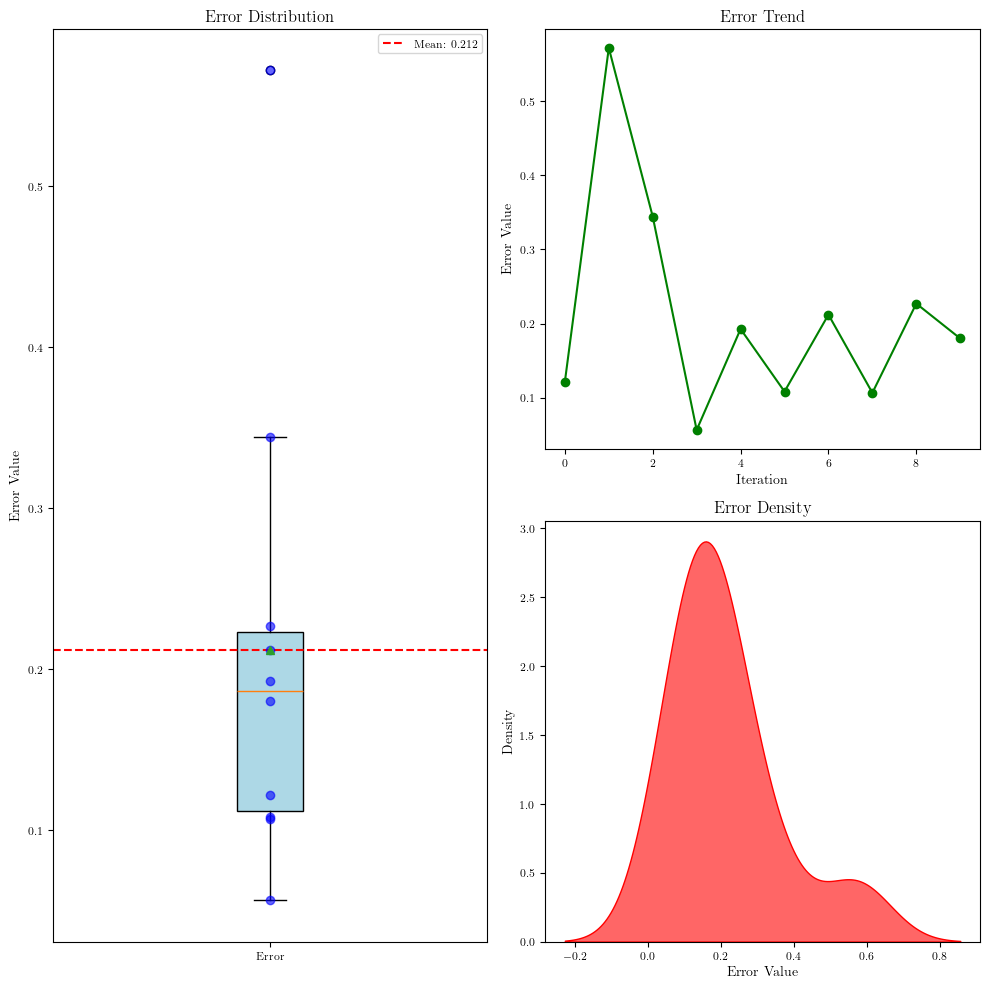

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

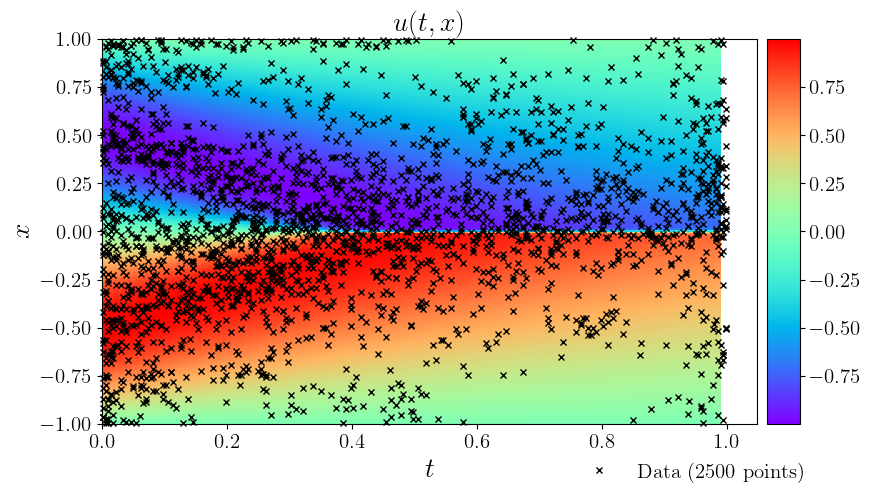

In [14]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [15]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

54337
[0.2938413  0.27224088 0.2550454  ... 0.00036678 0.00036678 0.00036678]


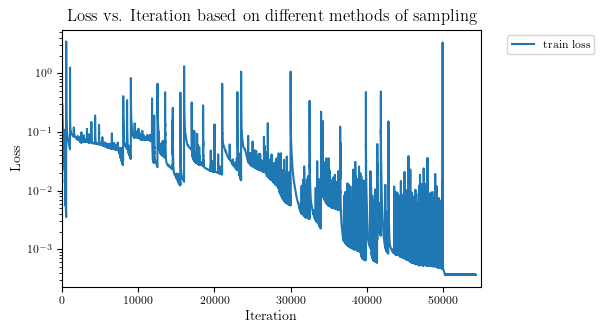

In [16]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

54337
[1.0126367  1.0027748  0.9947825  ... 0.17986648 0.17986658 0.17986657]


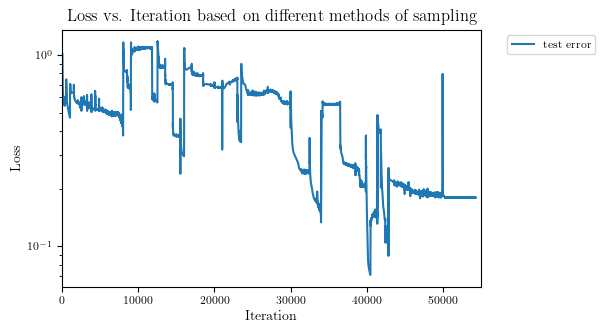

In [17]:
print(len(testerror))
print(testerror)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


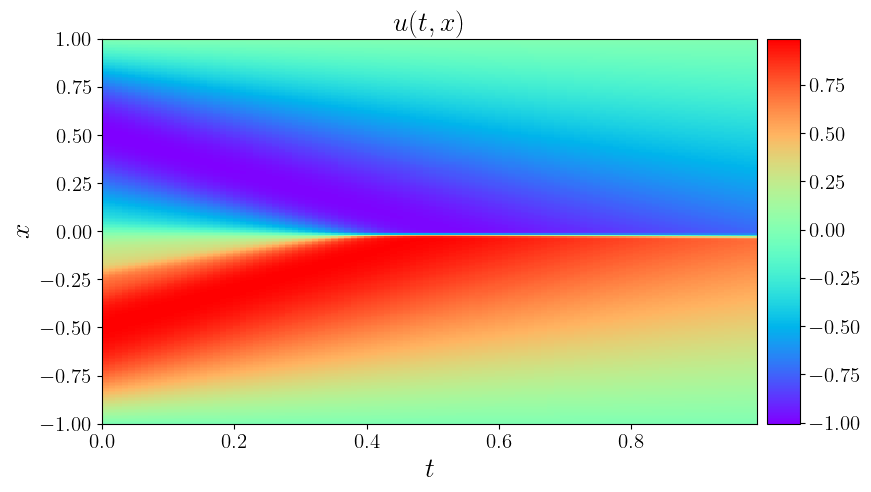

In [18]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

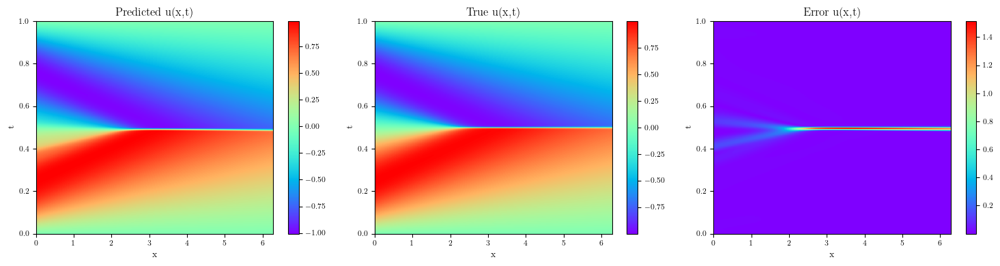

In [19]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [20]:

# # 创建一个包含三幅子图的图像
# fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# # 绘制第一幅图像
# axes[0].imshow(U_var.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
# axes[0].invert_yaxis()
# axes[0].set_xlabel('x')
# axes[0].set_ylabel('t')
# axes[0].set_title('Predicted u(x,t)')
# fig.colorbar(axes[0].images[0], ax=axes[0])

# # 绘制第二幅图像
# axes[1].imshow(U_var_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
# axes[1].invert_yaxis()
# axes[1].set_xlabel('x')
# axes[1].set_ylabel('t')
# axes[1].set_title('True u(x,t)')
# fig.colorbar(axes[1].images[0], ax=axes[1])

# # 自动调整子图参数，使得子图之间的间距适当
# plt.tight_layout()
# plt.show()

In [21]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

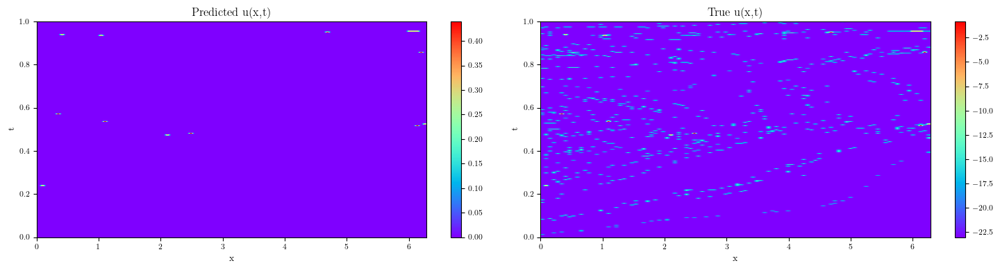

In [22]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()